In [13]:
import sys
sys.path.append("../code/")

import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.optim.lr_scheduler import StepLR, LambdaLR, CosineAnnealingLR
from torch.utils.data import DataLoader
from sklearn.metrics import mean_squared_error

from swag import SWAG
from models import Regression_linear
from util import plot_decision_boundary, uncertainty_measurement, model_param_to_1D, params_1d_to_weights, create_NN_with_weights
from data_gen import RegressionDataSet

import warnings
warnings.filterwarnings('ignore')
import random
torch.manual_seed(0)
np.random.seed(0)

%pylab inline

Populating the interactive namespace from numpy and matplotlib


# Regression on a toy dataset

The original paper focuses mainly on the classification tasks, with a short discussion on SWAG's performance on the regression tasks. In our project, we decide to check its performance on uncertainty estimates in the regression field more closely. Below we will first use the toy data set from HW2 for aleatoric and epistemic uncertainty estimation. Note that in this data generaction process, test points in (-1, -0.5) and (0.5, 1) are in-distribution (i.e., in the training data region) and thus should have some aleatoric uncertainties but relatively lower epistemic uncertainties, whereas points in (-0.5, and 0.5) are OOD points and thus should have higher epistemic uncertainties compared to the in-distribution points in addition to the aleatoric uncertainties.

### Dataset

In [14]:
# Create the training DataSet
n_samples = 100
train_data = RegressionDataSet(n_samples=n_samples, mode='train',gap=True)
train_gen = DataLoader(dataset = train_data, batch_size = 1, shuffle = True)
X, y, X_test = train_data.X, train_data.Y.flatten(), train_data.X_test

valid_data = RegressionDataSet(n_samples=20, mode='train',gap=True)
X_valid, y_valid = valid_data.X, valid_data.Y.flatten()


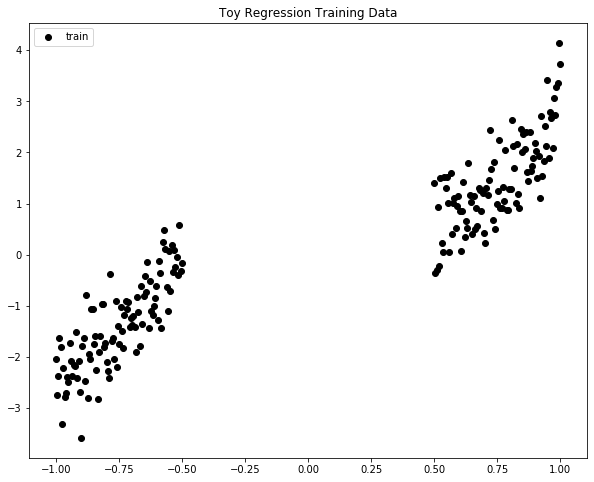

In [15]:
# Visualize our training data points
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
plt.scatter(X, y, color='black', label='train')
plt.title('Toy Regression Training Data')
plt.legend()

### Fit the SWAG model

The initialization for hyperparameters such as K, learning rate, and training epochs are selected based on the model's performance in the classiciation task just so we have a taste of how the SWAG model works on a regression task. In the next section, we will look into the hyperparameter selection more closely.

In [16]:
# Initialize SWAG
swag = SWAG(Regression_linear, K = 3)
print("Total number of parameters for the NN is:", swag.weigt_D)

Total number of parameters for the NN is: 46


In [17]:
# Compile swag
objective = 'regression'
lr = 1e-3
swa_const_lr = 1
momentum = 0.9
optimizer = optim.SGD
loss_fn = nn.MSELoss()
swa_scheduler = LambdaLR

swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)

In [19]:
# Fit swag
first_mom, second_mom, D = swag.fit(train_gen,
                                    train_epoch=50,
                                    swag_epoch=20,
                                    log_freq=5,verbose=False)

In [20]:
# Sample 200 posterior weights
X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
pred = swag.predict(X_test_tensor.float(),None, S=200, expanded=True)
print("Shape of the prediction:\n", pred.shape)
# print("Predictions for each point using the 1st sample weights:\n", pred[0])

Shape of the prediction:
 (200, 398)


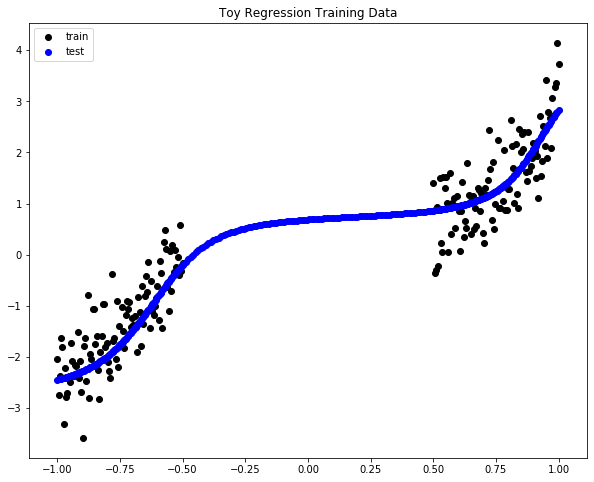

In [21]:
# Visualize the predictions
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
plt.scatter(X, y, color='black', label='train')
plt.scatter(X_test, pred[1], color='blue', label='test')
plt.title('Toy Regression Training Data')
plt.legend()

## Uncertainty Estimation

Similar to the classification case, we estimate the predictive uncertainty by fitting bootstrap models on the training data, and using the variance of the ensemble predictions as the uncertainty estimates. The expected behavior is that, for the OOD points, the variance of predictions should be higher than for the in-sample points.

To assess the SWAG algorithm's performance on the regression uncertainty estimations, we wrote a function that perserves the predictions on all points using each sampled NN weights from the SWAG model, and then perform the uncertainty estimation.

We performed uncertainty checks in two ways:

a) MSE loss to see the uncertainty in the in-distribution region

b) Visualize the predictive interval to see the epistemic uncertainty in the OOD region

In [9]:
def uncertainty_estimation(swag, X_test, pred,  X_valid, y_valid, ensemble = False, verbose = True):
    ''' Params:
            swag: SWAG model to be evaluated
            X_test: test points
            pred: swag predictions on the test points; dx1 array where d is the number of SWAG models
            X_valid: valid points
            y_valid: true valid y values
    '''
    var_list = []
    mean_list = []
    up_list = []
    low_list = []
    for i in range(len(X_test)):
        preds_i = pred[:, i]
        var_list.append(np.var(preds_i))
        mean_list.append(np.mean(preds_i,axis=0))
        up_list.append(np.percentile(preds_i, 2.5, axis=0))
        low_list.append(np.percentile(preds_i, 97.5, axis=0))

    if verbose:
        print("\nBegin uncertainty assessment...")
        if ensemble:
            ensemble_mse = []
            for s in swag:
                agg_mse = []
                X_valid_tensor = torch.as_tensor([X_valid]).reshape((-1,1))
                train_pred = s.predict(X_valid_tensor.float(),None, S=200, expanded=True)
                for i in range(train_pred.shape[0]):
                    agg_mse.append(mean_squared_error(y_valid,train_pred[i,:]))
                mse = np.mean(agg_mse,axis=0)
                ensemble_mse.append(mse)
            print('Valid MSE: ', np.mean(ensemble_mse))
            return mean_list, up_list, low_list, np.mean(ensemble_mse)
        else:
            agg_mse = []
            X_valid_tensor = torch.as_tensor([X_valid]).reshape((-1,1))
            train_pred = swag.predict(X_valid_tensor.float(),None, S=200, expanded=True)
            for i in range(train_pred.shape[0]):
                agg_mse.append(mean_squared_error(y_valid,train_pred[i,:]))
            mse = np.mean(agg_mse,axis=0)
            print('Valid MSE: ', mse)
            return mean_list, up_list, low_list, mse
        
    return mean_list, up_list, low_list, False
        
mean_ci,up_ci,lower_ci,_ = uncertainty_estimation(swag, X_test, pred, X_valid, y_valid, verbose=True)


Begin uncertainty assessment...
Valid MSE:  0.33017967734599263


Text(0.5, 1.0, 'Uncertainty Estimates - Regression')

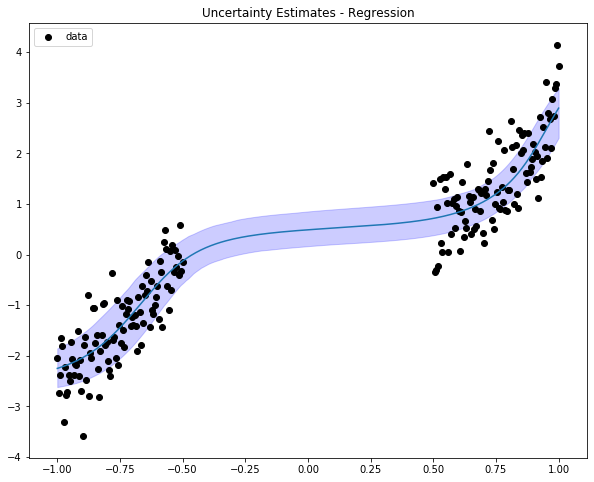

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
ax.plot(X_test,mean_ci)
ax.fill_between(X_test, up_ci, lower_ci, color='blue', alpha=0.2)
ax.scatter(X, y, color='black', label='data')
ax.legend(prop={'size':10})
ax.set_title('Uncertainty Estimates - Regression')

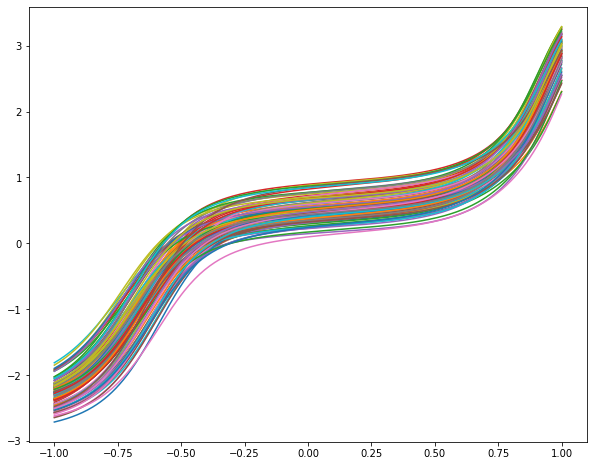

In [11]:
# plot the data and the prediction
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
for i in range(100):
    ax.plot(X_test,pred[i])


From the above uncertainty visualization, we see that the model has slightly larger uncertainty in the in-distribution region, whereas the uncertainty is very small in the middle (OOD) region, which is not desirable. We suspect that this behavior is caused by the fact that the model is over-confident in its predictions and it can't distinuigh the OOD region from the in-distribution region, i.e. the model performs badly in terms of the epistemic uncertainty. Along improve the epistemic uncertainty in the middle, the model also seems to be over-confident in its predictions, giving us a too low aleatoric uncertainty. The training MSE is very low, but the 95% interval does not capture most of the training points. So our goal is to improve the aleatoric uncertainty in the in-distribution region.

To alleviate these problems, we will explore three modifications:
    1. Change the value of K: Since K governs how much we keep in the covariance matrix D, and thus we expect tunning K up would result in a higher variance in the posterior sampling, and thus generating bigger uncertainty in the middle.
    2. Tune the learning rate: right now we are using a learning rate 1e-3, we suspect increasing/decreasing the learning rate would make the model explore different extents of the NN weight subspace, and thus a better learning rate may end up with a better uncertainty estimate.
    3. Reduce the number of training epochs: we aim to decrease the training epochs and reduce the chance of the model being overfitted to the data. In this way, the model may have higher variance in places where it has no training data to learn from.
    4. Change the weights initialization:  a) from a pre-defined cosine shape curve (the curve has a parabola shape in the middle (-0.5,0.5); b) randomly drawn from Gaussian(0,25). By changing the weights initialization, we aim to let the NN explore the OOD region to a greater extent, hoping this could improve the epistemic uncertainty estimates for the OOD region. 
   

## 1. Change the value of K

In this section, we will examine the SWAG model's uncertainty estimation with different K values. Values we considered here are [2,5,10,20], which are selected based on the model's performance in the classification task and also on the swag epoch (recall that we have 20 SWAG epochs from the *Models* section).

Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.2764101100380093
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.5131221993751879
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  1.0190471102269314
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  2.037768250580344


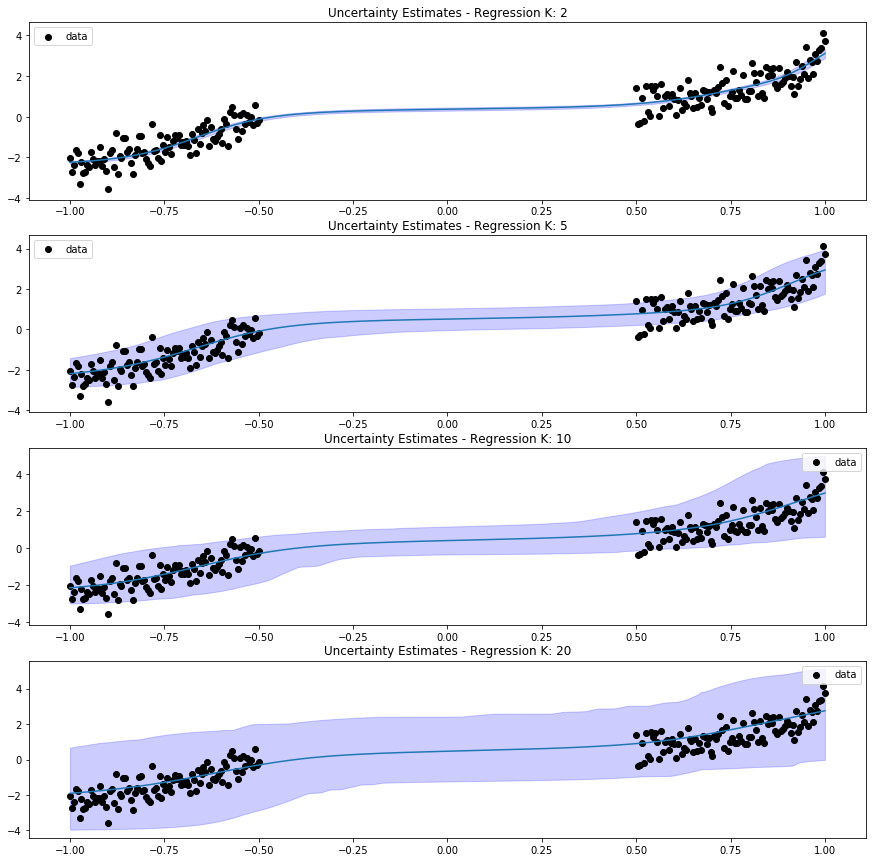

In [14]:
# try diff learning k
k_trials = [2,5,10,20]
fig, ax = plt.subplots(len(k_trials), 1, figsize=(15, 15))
for i,k in enumerate(k_trials):
    swag = SWAG(Regression_linear, K = k)
    # Compile swag
    objective = 'regression'
    lr = 1e-3
    swa_const_lr = 1
    momentum = 0.9
    optimizer = optim.SGD
    loss_fn = nn.MSELoss()
    swa_scheduler = LambdaLR
    swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)
    # Fit swag
    first_mom, second_mom, D = swag.fit(train_gen,
                                        train_epoch=50,
                                        swag_epoch=20,
                                        log_freq=5, verbose=False)
    # Sample 100 posterior weights
    X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
    pred = swag.predict(X_test_tensor.float(),None, S=200, expanded=True)

    mean_ci,up_ci,lower_ci,_ = uncertainty_estimation(swag,X_test, pred, X_valid, y_valid, verbose=True)
    
    ax[i].plot(X_test,mean_ci)
    ax[i].fill_between(X_test, up_ci, lower_ci, color='blue', alpha=0.2)
    ax[i].scatter(X, y, color='black', label='data')
    ax[i].legend(prop={'size':10})
    ax[i].set_title('Uncertainty Estimates - Regression K: ' + str(k) )

**Observation**: Varying the K value, we did not see a clear improvement in the epistemic uncertainty. Recall that we would want the uncertainty interval to be bigger in the middle (where there is no training data available) and smaller on the two ends. However, from the above visualization, we see almost a constant width in the uncertainty interval throughout. Sometimes, the uncertainties are even higher in the in-distribution region, which is clearly not desirable (e.g. when K > 10), and the epistemic uncertainty in the in-distribution region is increased as K increases too, since the magnitude of the covariance matrix is now larger, and thus the sampled weights can go more wildly, which is not desirable. When K is too small, the interval's width is so narrow that most of the training points are outside the interval, which means that the aleatoric uncertainty is too low. Therefore, we believe that modifying K alone would affect the total uncertainty, but not improve the model's epistemic uncertainty estimates necessarily.

## 2. Tune the learning rate

In this section, we vary the learning rate in the SGD update, and see if this modification could improve SWAG's uncertainty estimation. Learning rates we consider here are: [1e-4,1e-3,1e-2,1e-1].

Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.2713300278254786
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.3103019271998566
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.645920020958752
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  13.361567753713075


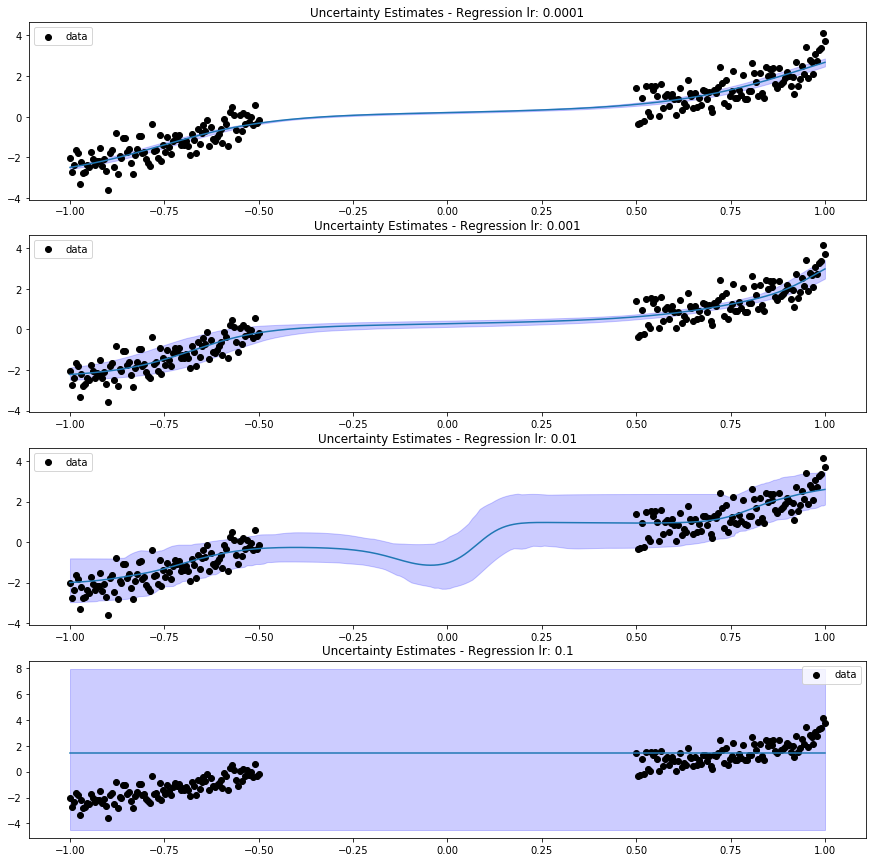

In [15]:
# try diff learning rate
lr_trials = [1e-4,1e-3,1e-2,1e-1]
fig, ax = plt.subplots(len(lr_trials), 1, figsize=(15, 15))
for i,l in enumerate(lr_trials):
    swag = SWAG(Regression_linear, K = 3)
    # Compile swag
    objective = 'regression'
    lr = l
    swa_const_lr = 1
    momentum = 0.9
    optimizer = optim.SGD
    loss_fn = nn.MSELoss()
    swa_scheduler = LambdaLR
    swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)
    # Fit swag
    first_mom, second_mom, D = swag.fit(train_gen,
                                        train_epoch=50,
                                        swag_epoch=20,
                                        log_freq=5, verbose=False)
    # Sample 100 posterior weights
    X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
    pred = swag.predict(X_test_tensor.float(),None, S=200, expanded=True)

    mean_ci,up_ci,lower_ci,_ = uncertainty_estimation(swag,X_test, pred,X_valid, y_valid, verbose=True)
    
    ax[i].plot(X_test,mean_ci)
    ax[i].fill_between(X_test, up_ci, lower_ci, color='blue', alpha=0.2)
    ax[i].scatter(X, y, color='black', label='data')
    ax[i].legend(prop={'size':10})
    ax[i].set_title('Uncertainty Estimates - Regression lr: ' + str(lr) )


**Observation:** Fixing the K and the training epoch, we see that as the learning rate increases, the model has more uncertainties, and the model simply did not converge when the learning rate is 0.1. When learning rate is 1e-4, we see that the model is overly-confident at its predictions, and we do not even observe aleatoric uncertainties in the in-distribution region, which is not desirable. All combined, we believe that under this setting (fixing K at 3 and training epoch 200), a learning rate of 1e-2 may be more desirable, in that it gives a proper uncertainty interval. The aleatoric uncertainty is much better now since the uncertainty interval covers most of the training points. The epistemic uncertainty remains the same problem of constant width. However, through repeated trails, we found that a learning rate of 1e-2 can also be unstable, and the model may sometimes end up not converging. 

Therefore, we believe that learning rate alone could affect the model's aleatoric uncertainty estimates, but not necessarily the epistemic uncertainty, similar to what we have concluded for the value of K.

## 3. Tune the training epochs

As discussed above, we believe that with fewer training epochs, the model may be less confident in its predictions, which could be potentially beneficial since we would want more uncertainties in the middle, OOD region. In the previous section, we used 50 training epochs. Therefore, here we tried training epochs of 5,20, 50 and 100 also to see if this hyperparameter could make a difference.

Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  1.6160522751303272
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.8908357999326413
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.6716397168308224
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.9214371179117948


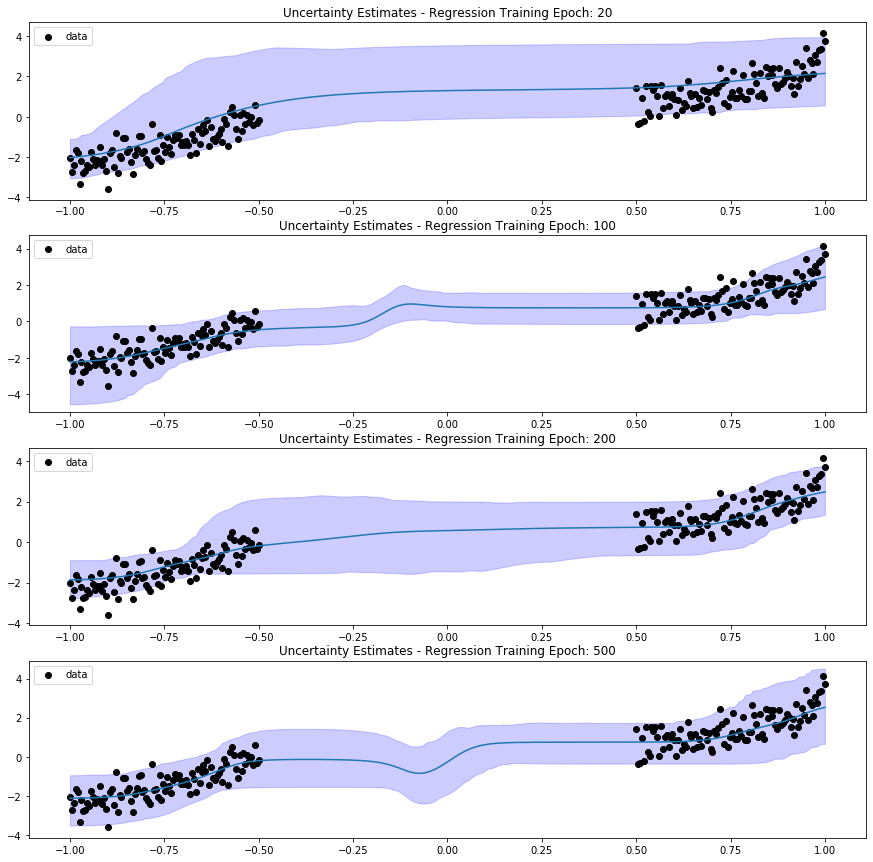

In [17]:
epoch_trials = [5,20,50,100]
fig, ax = plt.subplots(len(epoch_trials), 1, figsize=(15, 15))
for i,e in enumerate(epoch_trials):
    swag = SWAG(Regression_linear, K = 3)
    # Compile swag
    objective = 'regression'
    lr = 1e-2
    swa_const_lr = 1
    momentum = 0.9
    optimizer = optim.SGD
    loss_fn = nn.MSELoss()
    swa_scheduler = LambdaLR
    swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)
    # Fit swag
    first_mom, second_mom, D = swag.fit(train_gen,
                                        train_epoch=e,
                                        swag_epoch=20,
                                        log_freq=5, verbose=False)
    # Sample 100 posterior weights
    X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
    pred = swag.predict(X_test_tensor.float(),None, S=200, expanded=True)

    mean_ci,up_ci,lower_ci,_ = uncertainty_estimation(swag, X_test, pred, X_valid, y_valid, verbose=True)
    
    ax[i].plot(X_test,mean_ci)
    ax[i].fill_between(X_test, up_ci, lower_ci, color='blue', alpha=0.2)
    ax[i].scatter(X, y, color='black', label='data')
    ax[i].legend(prop={'size':10})
    ax[i].set_title('Uncertainty Estimates - Regression Training Epoch: ' + str(e) )

**Observation:** We see from the above visualizations that decreasing the number of training epochs does not contribute to a better epistemic uncertainty estimate always. With the optimal learning rate (1e-2) we got from Section 2, it seems that a training epoch of 200 (our original choice) seems to give appropriate uncertainty estimates. However, through repeated trials, we found that the training epoch number does not affect the uncertainty estimates substantially. Picking a moderate training epoch such as 200 seems to be sufficient for a variety of K&lr combinations. 

## 4. Initialization

In this section, we manually change the intialization of the NN weights and see if this could improve SWAG's uncertainty estimates.

### a) initialize the weights to force the neural network learn a curvy pattern in the (-0.5,0.5) region

In [67]:
# path to save the model weights
path = "../model/regr_cts.pt"

# Draw from the continuous space 
n_samples = 100
train_cts_data = RegressionDataSet(n_samples=n_samples, mode='train',gap=False)
train_cts_gen = DataLoader(dataset = train_cts_data, batch_size = 1, shuffle = True)

Text(0.5, 1.0, 'New toy dataset - Regression')

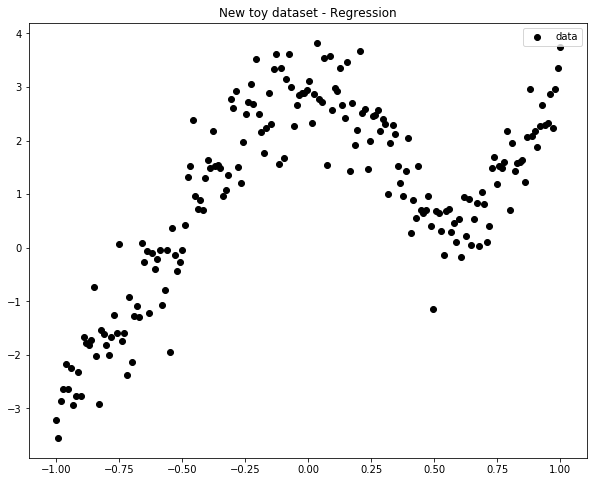

In [68]:
# visualize the new data 
X_cts, y_cts= train_cts_data.X, train_cts_data.Y.flatten()
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
ax.scatter(X_cts, y_cts, color='black', label='data')
ax.legend(prop={'size':10})
ax.set_title('New toy dataset - Regression')

In [69]:
# fit the neural network to this new dataset
reg = Regression_linear()
optimizer = optim.SGD(reg.parameters(), lr=1e-3, momentum=0.9)
loss_fn = nn.MSELoss()

for epoch in range(200):  # loop over the dataset multiple times
    running_loss = 0.0
    for i, data in enumerate(train_cts_gen, 0):
        # get the inputs
        inputs, y_true = data

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = reg(inputs)
        loss = loss_fn(outputs, y_true)
        loss.backward()
        optimizer.step()
        
torch.save(reg.state_dict(), path)

In [70]:
# initialize our SWAG model with the pretrained weights
reg_new = Regression_linear()
reg_new.load_state_dict(torch.load(path))

<All keys matched successfully>

In [71]:
# initialize SWAG
swag = SWAG(Regression_linear, K = 3, pretrained = True, NNModel = reg_new)
print("Total number of parameters for the NN is:", swag.weigt_D)

Total number of parameters for the NN is: 46


In [72]:
# Compile swag
objective = 'regression'
lr = 1e-3
swa_const_lr = 1
momentum = 0.9
optimizer = optim.SGD
loss_fn = nn.MSELoss()
swa_scheduler = LambdaLR

swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)

In [73]:
# Fit swag (a short training period to see that it learns the middle section correctly)
first_mom, second_mom, D = swag.fit(train_gen,
                                    train_epoch=50,
                                    swag_epoch=20,
                                    log_freq=5,verbose=False)

Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 0.8457
[Epoch: 1, 	Iteration:    10] 	Training Loss: 0.4258
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.3855
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.2836
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.2989
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.2384
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.5034
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.4051
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.6244
[Epoch: 1, 	Iteration:    50] 	Training Loss: 0.5055
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.7073
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.5473
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.3071
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.4537
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.4802
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.3716
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.2903
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.1376
[Epoch: 1, 	Iterati

[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.3326
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.3315
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.5162
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.0835
[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.1797
[Epoch: 5, 	Iteration:    90] 	Training Loss: 0.2092
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.3542
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.4471
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.1465
[Epoch: 5, 	Iteration:   110] 	Training Loss: 0.4770
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.2439
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.6538
[Epoch: 5, 	Iteration:   125] 	Training Loss: 0.1773
[Epoch: 5, 	Iteration:   130] 	Training Loss: 1.5063
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.1199
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.1936
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.5146
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.0945
[Epoch: 5, 	Iteration:   155] 	Training Loss: 

[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.1776
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.1108
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.1856
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.7729
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.3383
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.4222
[Epoch: 10, 	Iteration:   155] 	Training Loss: 0.1090
[Epoch: 10, 	Iteration:   160] 	Training Loss: 0.3762
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.2551
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.5586
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.3009
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.2549
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.0502
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.2461
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.2621
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.3369
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.3311
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.2526
[Epoch: 11, 	Iteration:    1

[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.2093
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.2895
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.3107
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.4000
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.3023
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.3048
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.1228
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.4331
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.8728
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.2281
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.2424
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.2707
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.2900
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.6205
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.0426
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.1136
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.6145
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.1419
[Epoch: 16, 	Iteration:    2

[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.0837
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.3847
[Epoch: 20, 	Iteration:   105] 	Training Loss: 1.0023
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.5111
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.4431
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.2075
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.3271
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.5686
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.2172
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.1359
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.4719
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.3248
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.1256
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.0617
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.3752
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.6501
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.2485
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.2686
[Epoch: 20, 	Iteration:   18

[Epoch: 25, 	Iteration:   115] 	Training Loss: 0.2858
[Epoch: 25, 	Iteration:   120] 	Training Loss: 0.1699
[Epoch: 25, 	Iteration:   125] 	Training Loss: 0.3527
[Epoch: 25, 	Iteration:   130] 	Training Loss: 0.6885
[Epoch: 25, 	Iteration:   135] 	Training Loss: 0.1258
[Epoch: 25, 	Iteration:   140] 	Training Loss: 0.2373
[Epoch: 25, 	Iteration:   145] 	Training Loss: 0.3113
[Epoch: 25, 	Iteration:   150] 	Training Loss: 0.5914
[Epoch: 25, 	Iteration:   155] 	Training Loss: 0.3778
[Epoch: 25, 	Iteration:   160] 	Training Loss: 0.0718
[Epoch: 25, 	Iteration:   165] 	Training Loss: 0.0765
[Epoch: 25, 	Iteration:   170] 	Training Loss: 0.1484
[Epoch: 25, 	Iteration:   175] 	Training Loss: 0.6605
[Epoch: 25, 	Iteration:   180] 	Training Loss: 0.3031
[Epoch: 25, 	Iteration:   185] 	Training Loss: 0.2545
[Epoch: 25, 	Iteration:   190] 	Training Loss: 0.4628
[Epoch: 25, 	Iteration:   195] 	Training Loss: 0.1412
[Epoch: 25, 	Iteration:   200] 	Training Loss: 0.1195
[Epoch: 26, 	Iteration:     

[Epoch: 30, 	Iteration:   135] 	Training Loss: 0.2190
[Epoch: 30, 	Iteration:   140] 	Training Loss: 0.1629
[Epoch: 30, 	Iteration:   145] 	Training Loss: 0.1780
[Epoch: 30, 	Iteration:   150] 	Training Loss: 0.3676
[Epoch: 30, 	Iteration:   155] 	Training Loss: 0.4191
[Epoch: 30, 	Iteration:   160] 	Training Loss: 0.3782
[Epoch: 30, 	Iteration:   165] 	Training Loss: 0.5287
[Epoch: 30, 	Iteration:   170] 	Training Loss: 0.1525
[Epoch: 30, 	Iteration:   175] 	Training Loss: 0.1964
[Epoch: 30, 	Iteration:   180] 	Training Loss: 0.0665
[Epoch: 30, 	Iteration:   185] 	Training Loss: 0.1931
[Epoch: 30, 	Iteration:   190] 	Training Loss: 0.4228
[Epoch: 30, 	Iteration:   195] 	Training Loss: 0.0668
[Epoch: 30, 	Iteration:   200] 	Training Loss: 0.2321
[Epoch: 31, 	Iteration:     5] 	Training Loss: 0.2966
[Epoch: 31, 	Iteration:    10] 	Training Loss: 0.4485
[Epoch: 31, 	Iteration:    15] 	Training Loss: 0.1953
[Epoch: 31, 	Iteration:    20] 	Training Loss: 0.0665
[Epoch: 31, 	Iteration:    2

[Epoch: 36, 	Iteration:     5] 	Training Loss: 0.3992
[Epoch: 36, 	Iteration:    10] 	Training Loss: 0.2199
[Epoch: 36, 	Iteration:    15] 	Training Loss: 0.1504
[Epoch: 36, 	Iteration:    20] 	Training Loss: 0.2279
[Epoch: 36, 	Iteration:    25] 	Training Loss: 0.1977
[Epoch: 36, 	Iteration:    30] 	Training Loss: 0.2686
[Epoch: 36, 	Iteration:    35] 	Training Loss: 0.6582
[Epoch: 36, 	Iteration:    40] 	Training Loss: 0.1772
[Epoch: 36, 	Iteration:    45] 	Training Loss: 0.2902
[Epoch: 36, 	Iteration:    50] 	Training Loss: 0.5495
[Epoch: 36, 	Iteration:    55] 	Training Loss: 0.5459
[Epoch: 36, 	Iteration:    60] 	Training Loss: 0.3158
[Epoch: 36, 	Iteration:    65] 	Training Loss: 0.3346
[Epoch: 36, 	Iteration:    70] 	Training Loss: 0.1451
[Epoch: 36, 	Iteration:    75] 	Training Loss: 0.1647
[Epoch: 36, 	Iteration:    80] 	Training Loss: 0.3274
[Epoch: 36, 	Iteration:    85] 	Training Loss: 0.0936
[Epoch: 36, 	Iteration:    90] 	Training Loss: 0.4084
[Epoch: 36, 	Iteration:    9

[Epoch: 41, 	Iteration:    75] 	Training Loss: 0.6770
[Epoch: 41, 	Iteration:    80] 	Training Loss: 0.5242
[Epoch: 41, 	Iteration:    85] 	Training Loss: 0.2041
[Epoch: 41, 	Iteration:    90] 	Training Loss: 0.5988
[Epoch: 41, 	Iteration:    95] 	Training Loss: 0.4316
[Epoch: 41, 	Iteration:   100] 	Training Loss: 0.2999
[Epoch: 41, 	Iteration:   105] 	Training Loss: 0.1588
[Epoch: 41, 	Iteration:   110] 	Training Loss: 0.2751
[Epoch: 41, 	Iteration:   115] 	Training Loss: 0.3143
[Epoch: 41, 	Iteration:   120] 	Training Loss: 0.6425
[Epoch: 41, 	Iteration:   125] 	Training Loss: 0.2593
[Epoch: 41, 	Iteration:   130] 	Training Loss: 0.2377
[Epoch: 41, 	Iteration:   135] 	Training Loss: 0.1987
[Epoch: 41, 	Iteration:   140] 	Training Loss: 0.5735
[Epoch: 41, 	Iteration:   145] 	Training Loss: 0.1458
[Epoch: 41, 	Iteration:   150] 	Training Loss: 0.5450
[Epoch: 41, 	Iteration:   155] 	Training Loss: 0.1393
[Epoch: 41, 	Iteration:   160] 	Training Loss: 0.1914
[Epoch: 41, 	Iteration:   16

[Epoch: 46, 	Iteration:   130] 	Training Loss: 0.2276
[Epoch: 46, 	Iteration:   135] 	Training Loss: 0.5197
[Epoch: 46, 	Iteration:   140] 	Training Loss: 0.3353
[Epoch: 46, 	Iteration:   145] 	Training Loss: 0.2090
[Epoch: 46, 	Iteration:   150] 	Training Loss: 0.4016
[Epoch: 46, 	Iteration:   155] 	Training Loss: 0.2702
[Epoch: 46, 	Iteration:   160] 	Training Loss: 0.3274
[Epoch: 46, 	Iteration:   165] 	Training Loss: 0.2628
[Epoch: 46, 	Iteration:   170] 	Training Loss: 0.4255
[Epoch: 46, 	Iteration:   175] 	Training Loss: 0.2209
[Epoch: 46, 	Iteration:   180] 	Training Loss: 0.2681
[Epoch: 46, 	Iteration:   185] 	Training Loss: 0.1860
[Epoch: 46, 	Iteration:   190] 	Training Loss: 0.4022
[Epoch: 46, 	Iteration:   195] 	Training Loss: 0.3654
[Epoch: 46, 	Iteration:   200] 	Training Loss: 0.1175
[Epoch: 47, 	Iteration:     5] 	Training Loss: 0.2309
[Epoch: 47, 	Iteration:    10] 	Training Loss: 0.2871
[Epoch: 47, 	Iteration:    15] 	Training Loss: 0.1346
[Epoch: 47, 	Iteration:    2

[Epoch: 51, 	Iteration:   180] 	Training Loss: 0.1713
[Epoch: 51, 	Iteration:   185] 	Training Loss: 0.3059
[Epoch: 51, 	Iteration:   190] 	Training Loss: 0.0914
[Epoch: 51, 	Iteration:   195] 	Training Loss: 0.2092
[Epoch: 51, 	Iteration:   200] 	Training Loss: 0.6401
[Epoch: 52, 	Iteration:     5] 	Training Loss: 0.1388
[Epoch: 52, 	Iteration:    10] 	Training Loss: 0.2335
[Epoch: 52, 	Iteration:    15] 	Training Loss: 0.6491
[Epoch: 52, 	Iteration:    20] 	Training Loss: 0.5171
[Epoch: 52, 	Iteration:    25] 	Training Loss: 0.3975
[Epoch: 52, 	Iteration:    30] 	Training Loss: 0.1839
[Epoch: 52, 	Iteration:    35] 	Training Loss: 0.8406
[Epoch: 52, 	Iteration:    40] 	Training Loss: 0.0530
[Epoch: 52, 	Iteration:    45] 	Training Loss: 0.4191
[Epoch: 52, 	Iteration:    50] 	Training Loss: 0.4496
[Epoch: 52, 	Iteration:    55] 	Training Loss: 0.1942
[Epoch: 52, 	Iteration:    60] 	Training Loss: 0.5379
[Epoch: 52, 	Iteration:    65] 	Training Loss: 0.2210
[Epoch: 52, 	Iteration:    7

[Epoch: 57, 	Iteration:    30] 	Training Loss: 0.3941
[Epoch: 57, 	Iteration:    35] 	Training Loss: 0.1069
[Epoch: 57, 	Iteration:    40] 	Training Loss: 0.1967
[Epoch: 57, 	Iteration:    45] 	Training Loss: 0.2342
[Epoch: 57, 	Iteration:    50] 	Training Loss: 0.2458
[Epoch: 57, 	Iteration:    55] 	Training Loss: 0.5359
[Epoch: 57, 	Iteration:    60] 	Training Loss: 0.5219
[Epoch: 57, 	Iteration:    65] 	Training Loss: 0.2018
[Epoch: 57, 	Iteration:    70] 	Training Loss: 0.4981
[Epoch: 57, 	Iteration:    75] 	Training Loss: 0.2568
[Epoch: 57, 	Iteration:    80] 	Training Loss: 0.2930
[Epoch: 57, 	Iteration:    85] 	Training Loss: 0.3022
[Epoch: 57, 	Iteration:    90] 	Training Loss: 0.2162
[Epoch: 57, 	Iteration:    95] 	Training Loss: 0.2025
[Epoch: 57, 	Iteration:   100] 	Training Loss: 0.3163
[Epoch: 57, 	Iteration:   105] 	Training Loss: 0.2217
[Epoch: 57, 	Iteration:   110] 	Training Loss: 0.2008
[Epoch: 57, 	Iteration:   115] 	Training Loss: 0.2980
[Epoch: 57, 	Iteration:   12

[Epoch: 62, 	Iteration:   105] 	Training Loss: 0.4757
[Epoch: 62, 	Iteration:   110] 	Training Loss: 0.2269
[Epoch: 62, 	Iteration:   115] 	Training Loss: 0.2349
[Epoch: 62, 	Iteration:   120] 	Training Loss: 0.1793
[Epoch: 62, 	Iteration:   125] 	Training Loss: 0.6116
[Epoch: 62, 	Iteration:   130] 	Training Loss: 0.1706
[Epoch: 62, 	Iteration:   135] 	Training Loss: 0.2350
[Epoch: 62, 	Iteration:   140] 	Training Loss: 0.3225
[Epoch: 62, 	Iteration:   145] 	Training Loss: 0.6414
[Epoch: 62, 	Iteration:   150] 	Training Loss: 0.1718
[Epoch: 62, 	Iteration:   155] 	Training Loss: 0.1482
[Epoch: 62, 	Iteration:   160] 	Training Loss: 0.6675
[Epoch: 62, 	Iteration:   165] 	Training Loss: 0.5926
[Epoch: 62, 	Iteration:   170] 	Training Loss: 0.1767
[Epoch: 62, 	Iteration:   175] 	Training Loss: 0.2737
[Epoch: 62, 	Iteration:   180] 	Training Loss: 0.9041
[Epoch: 62, 	Iteration:   185] 	Training Loss: 0.1981
[Epoch: 62, 	Iteration:   190] 	Training Loss: 0.1356
[Epoch: 62, 	Iteration:   19

[Epoch: 67, 	Iteration:   160] 	Training Loss: 0.6701
[Epoch: 67, 	Iteration:   165] 	Training Loss: 0.4473
[Epoch: 67, 	Iteration:   170] 	Training Loss: 0.0913
[Epoch: 67, 	Iteration:   175] 	Training Loss: 0.3676
[Epoch: 67, 	Iteration:   180] 	Training Loss: 0.2997
[Epoch: 67, 	Iteration:   185] 	Training Loss: 0.6191
[Epoch: 67, 	Iteration:   190] 	Training Loss: 0.2433
[Epoch: 67, 	Iteration:   195] 	Training Loss: 0.1223
[Epoch: 67, 	Iteration:   200] 	Training Loss: 0.1676
[Epoch: 68, 	Iteration:     5] 	Training Loss: 0.2407
[Epoch: 68, 	Iteration:    10] 	Training Loss: 0.8882
[Epoch: 68, 	Iteration:    15] 	Training Loss: 0.4137
[Epoch: 68, 	Iteration:    20] 	Training Loss: 0.2988
[Epoch: 68, 	Iteration:    25] 	Training Loss: 0.3331
[Epoch: 68, 	Iteration:    30] 	Training Loss: 0.5533
[Epoch: 68, 	Iteration:    35] 	Training Loss: 0.3371
[Epoch: 68, 	Iteration:    40] 	Training Loss: 0.1715
[Epoch: 68, 	Iteration:    45] 	Training Loss: 0.5581
[Epoch: 68, 	Iteration:    5

[Epoch: 73, 	Iteration:    20] 	Training Loss: 0.5537
[Epoch: 73, 	Iteration:    25] 	Training Loss: 0.3904
[Epoch: 73, 	Iteration:    30] 	Training Loss: 0.4343
[Epoch: 73, 	Iteration:    35] 	Training Loss: 0.1653
[Epoch: 73, 	Iteration:    40] 	Training Loss: 0.4247
[Epoch: 73, 	Iteration:    45] 	Training Loss: 0.2112
[Epoch: 73, 	Iteration:    50] 	Training Loss: 0.8179
[Epoch: 73, 	Iteration:    55] 	Training Loss: 0.2500
[Epoch: 73, 	Iteration:    60] 	Training Loss: 0.3519
[Epoch: 73, 	Iteration:    65] 	Training Loss: 0.1328
[Epoch: 73, 	Iteration:    70] 	Training Loss: 0.1805
[Epoch: 73, 	Iteration:    75] 	Training Loss: 0.5828
[Epoch: 73, 	Iteration:    80] 	Training Loss: 0.1950
[Epoch: 73, 	Iteration:    85] 	Training Loss: 0.2228
[Epoch: 73, 	Iteration:    90] 	Training Loss: 0.2537
[Epoch: 73, 	Iteration:    95] 	Training Loss: 0.2251
[Epoch: 73, 	Iteration:   100] 	Training Loss: 0.3996
[Epoch: 73, 	Iteration:   105] 	Training Loss: 0.2335
[Epoch: 73, 	Iteration:   11

[Epoch: 78, 	Iteration:    90] 	Training Loss: 0.2270
[Epoch: 78, 	Iteration:    95] 	Training Loss: 0.2544
[Epoch: 78, 	Iteration:   100] 	Training Loss: 0.3057
[Epoch: 78, 	Iteration:   105] 	Training Loss: 0.2881
[Epoch: 78, 	Iteration:   110] 	Training Loss: 0.5596
[Epoch: 78, 	Iteration:   115] 	Training Loss: 0.4319
[Epoch: 78, 	Iteration:   120] 	Training Loss: 0.1994
[Epoch: 78, 	Iteration:   125] 	Training Loss: 0.2449
[Epoch: 78, 	Iteration:   130] 	Training Loss: 0.7144
[Epoch: 78, 	Iteration:   135] 	Training Loss: 0.2899
[Epoch: 78, 	Iteration:   140] 	Training Loss: 0.5073
[Epoch: 78, 	Iteration:   145] 	Training Loss: 0.2666
[Epoch: 78, 	Iteration:   150] 	Training Loss: 0.3923
[Epoch: 78, 	Iteration:   155] 	Training Loss: 0.5863
[Epoch: 78, 	Iteration:   160] 	Training Loss: 0.2551
[Epoch: 78, 	Iteration:   165] 	Training Loss: 0.2348
[Epoch: 78, 	Iteration:   170] 	Training Loss: 0.1759
[Epoch: 78, 	Iteration:   175] 	Training Loss: 0.0444
[Epoch: 78, 	Iteration:   18

[Epoch: 83, 	Iteration:   145] 	Training Loss: 0.2808
[Epoch: 83, 	Iteration:   150] 	Training Loss: 0.5063
[Epoch: 83, 	Iteration:   155] 	Training Loss: 0.5502
[Epoch: 83, 	Iteration:   160] 	Training Loss: 0.3171
[Epoch: 83, 	Iteration:   165] 	Training Loss: 0.2845
[Epoch: 83, 	Iteration:   170] 	Training Loss: 0.1728
[Epoch: 83, 	Iteration:   175] 	Training Loss: 0.3674
[Epoch: 83, 	Iteration:   180] 	Training Loss: 0.6011
[Epoch: 83, 	Iteration:   185] 	Training Loss: 0.2102
[Epoch: 83, 	Iteration:   190] 	Training Loss: 0.5879
[Epoch: 83, 	Iteration:   195] 	Training Loss: 0.7110
[Epoch: 83, 	Iteration:   200] 	Training Loss: 0.1005
[Epoch: 84, 	Iteration:     5] 	Training Loss: 0.1511
[Epoch: 84, 	Iteration:    10] 	Training Loss: 0.2129
[Epoch: 84, 	Iteration:    15] 	Training Loss: 0.1883
[Epoch: 84, 	Iteration:    20] 	Training Loss: 0.2286
[Epoch: 84, 	Iteration:    25] 	Training Loss: 0.4686
[Epoch: 84, 	Iteration:    30] 	Training Loss: 0.2581
[Epoch: 84, 	Iteration:    3

[Epoch: 88, 	Iteration:   200] 	Training Loss: 0.2716
[Epoch: 89, 	Iteration:     5] 	Training Loss: 0.5008
[Epoch: 89, 	Iteration:    10] 	Training Loss: 0.4937
[Epoch: 89, 	Iteration:    15] 	Training Loss: 0.3816
[Epoch: 89, 	Iteration:    20] 	Training Loss: 0.1729
[Epoch: 89, 	Iteration:    25] 	Training Loss: 0.1725
[Epoch: 89, 	Iteration:    30] 	Training Loss: 0.1545
[Epoch: 89, 	Iteration:    35] 	Training Loss: 0.4280
[Epoch: 89, 	Iteration:    40] 	Training Loss: 0.3508
[Epoch: 89, 	Iteration:    45] 	Training Loss: 0.3569
[Epoch: 89, 	Iteration:    50] 	Training Loss: 0.3076
[Epoch: 89, 	Iteration:    55] 	Training Loss: 0.2929
[Epoch: 89, 	Iteration:    60] 	Training Loss: 0.1912
[Epoch: 89, 	Iteration:    65] 	Training Loss: 0.2433
[Epoch: 89, 	Iteration:    70] 	Training Loss: 0.0775
[Epoch: 89, 	Iteration:    75] 	Training Loss: 0.4896
[Epoch: 89, 	Iteration:    80] 	Training Loss: 0.2388
[Epoch: 89, 	Iteration:    85] 	Training Loss: 0.2445
[Epoch: 89, 	Iteration:    9

[Epoch: 94, 	Iteration:    55] 	Training Loss: 0.5517
[Epoch: 94, 	Iteration:    60] 	Training Loss: 0.3562
[Epoch: 94, 	Iteration:    65] 	Training Loss: 0.5209
[Epoch: 94, 	Iteration:    70] 	Training Loss: 0.2915
[Epoch: 94, 	Iteration:    75] 	Training Loss: 0.0373
[Epoch: 94, 	Iteration:    80] 	Training Loss: 0.4040
[Epoch: 94, 	Iteration:    85] 	Training Loss: 0.1171
[Epoch: 94, 	Iteration:    90] 	Training Loss: 0.1468
[Epoch: 94, 	Iteration:    95] 	Training Loss: 0.2563
[Epoch: 94, 	Iteration:   100] 	Training Loss: 0.1050
[Epoch: 94, 	Iteration:   105] 	Training Loss: 0.2814
[Epoch: 94, 	Iteration:   110] 	Training Loss: 0.4315
[Epoch: 94, 	Iteration:   115] 	Training Loss: 0.2616
[Epoch: 94, 	Iteration:   120] 	Training Loss: 0.3060
[Epoch: 94, 	Iteration:   125] 	Training Loss: 0.1972
[Epoch: 94, 	Iteration:   130] 	Training Loss: 0.3350
[Epoch: 94, 	Iteration:   135] 	Training Loss: 0.3897
[Epoch: 94, 	Iteration:   140] 	Training Loss: 0.4572
[Epoch: 94, 	Iteration:   14

[Epoch: 99, 	Iteration:   100] 	Training Loss: 0.1195
[Epoch: 99, 	Iteration:   105] 	Training Loss: 0.0693
[Epoch: 99, 	Iteration:   110] 	Training Loss: 0.2386
[Epoch: 99, 	Iteration:   115] 	Training Loss: 0.1911
[Epoch: 99, 	Iteration:   120] 	Training Loss: 0.1081
[Epoch: 99, 	Iteration:   125] 	Training Loss: 0.3251
[Epoch: 99, 	Iteration:   130] 	Training Loss: 0.9071
[Epoch: 99, 	Iteration:   135] 	Training Loss: 0.2748
[Epoch: 99, 	Iteration:   140] 	Training Loss: 0.2694
[Epoch: 99, 	Iteration:   145] 	Training Loss: 0.2358
[Epoch: 99, 	Iteration:   150] 	Training Loss: 0.0302
[Epoch: 99, 	Iteration:   155] 	Training Loss: 0.2391
[Epoch: 99, 	Iteration:   160] 	Training Loss: 0.3235
[Epoch: 99, 	Iteration:   165] 	Training Loss: 0.1149
[Epoch: 99, 	Iteration:   170] 	Training Loss: 0.3380
[Epoch: 99, 	Iteration:   175] 	Training Loss: 0.3173
[Epoch: 99, 	Iteration:   180] 	Training Loss: 0.2969
[Epoch: 99, 	Iteration:   185] 	Training Loss: 0.5199
[Epoch: 99, 	Iteration:   19

[Epoch: 104, 	Iteration:   145] 	Training Loss: 0.5849
[Epoch: 104, 	Iteration:   150] 	Training Loss: 0.3766
[Epoch: 104, 	Iteration:   155] 	Training Loss: 0.0817
[Epoch: 104, 	Iteration:   160] 	Training Loss: 0.2543
[Epoch: 104, 	Iteration:   165] 	Training Loss: 0.3578
[Epoch: 104, 	Iteration:   170] 	Training Loss: 0.7100
[Epoch: 104, 	Iteration:   175] 	Training Loss: 0.1505
[Epoch: 104, 	Iteration:   180] 	Training Loss: 0.3884
[Epoch: 104, 	Iteration:   185] 	Training Loss: 0.1474
[Epoch: 104, 	Iteration:   190] 	Training Loss: 0.0650
[Epoch: 104, 	Iteration:   195] 	Training Loss: 0.6109
[Epoch: 104, 	Iteration:   200] 	Training Loss: 0.5361
[Epoch: 105, 	Iteration:     5] 	Training Loss: 0.7108
[Epoch: 105, 	Iteration:    10] 	Training Loss: 0.5512
[Epoch: 105, 	Iteration:    15] 	Training Loss: 0.2760
[Epoch: 105, 	Iteration:    20] 	Training Loss: 0.6723
[Epoch: 105, 	Iteration:    25] 	Training Loss: 1.0976
[Epoch: 105, 	Iteration:    30] 	Training Loss: 0.2505
[Epoch: 10

[Epoch: 109, 	Iteration:   195] 	Training Loss: 0.4452
[Epoch: 109, 	Iteration:   200] 	Training Loss: 0.2993
[Epoch: 110, 	Iteration:     5] 	Training Loss: 0.2037
[Epoch: 110, 	Iteration:    10] 	Training Loss: 0.2865
[Epoch: 110, 	Iteration:    15] 	Training Loss: 0.3470
[Epoch: 110, 	Iteration:    20] 	Training Loss: 0.5727
[Epoch: 110, 	Iteration:    25] 	Training Loss: 0.7412
[Epoch: 110, 	Iteration:    30] 	Training Loss: 0.7783
[Epoch: 110, 	Iteration:    35] 	Training Loss: 0.5879
[Epoch: 110, 	Iteration:    40] 	Training Loss: 0.2131
[Epoch: 110, 	Iteration:    45] 	Training Loss: 0.4382
[Epoch: 110, 	Iteration:    50] 	Training Loss: 0.2578
[Epoch: 110, 	Iteration:    55] 	Training Loss: 0.4331
[Epoch: 110, 	Iteration:    60] 	Training Loss: 0.3916
[Epoch: 110, 	Iteration:    65] 	Training Loss: 0.2198
[Epoch: 110, 	Iteration:    70] 	Training Loss: 0.1798
[Epoch: 110, 	Iteration:    75] 	Training Loss: 0.1545
[Epoch: 110, 	Iteration:    80] 	Training Loss: 0.4186
[Epoch: 11

[Epoch: 115, 	Iteration:    50] 	Training Loss: 0.1100
[Epoch: 115, 	Iteration:    55] 	Training Loss: 0.3408
[Epoch: 115, 	Iteration:    60] 	Training Loss: 0.0857
[Epoch: 115, 	Iteration:    65] 	Training Loss: 0.4054
[Epoch: 115, 	Iteration:    70] 	Training Loss: 0.1592
[Epoch: 115, 	Iteration:    75] 	Training Loss: 0.7201
[Epoch: 115, 	Iteration:    80] 	Training Loss: 0.2766
[Epoch: 115, 	Iteration:    85] 	Training Loss: 0.0228
[Epoch: 115, 	Iteration:    90] 	Training Loss: 0.2789
[Epoch: 115, 	Iteration:    95] 	Training Loss: 0.0906
[Epoch: 115, 	Iteration:   100] 	Training Loss: 0.3906
[Epoch: 115, 	Iteration:   105] 	Training Loss: 0.2468
[Epoch: 115, 	Iteration:   110] 	Training Loss: 0.6163
[Epoch: 115, 	Iteration:   115] 	Training Loss: 0.4552
[Epoch: 115, 	Iteration:   120] 	Training Loss: 0.1896
[Epoch: 115, 	Iteration:   125] 	Training Loss: 0.7023
[Epoch: 115, 	Iteration:   130] 	Training Loss: 0.3264
[Epoch: 115, 	Iteration:   135] 	Training Loss: 0.1966
[Epoch: 11

[Epoch: 120, 	Iteration:   115] 	Training Loss: 0.5022
[Epoch: 120, 	Iteration:   120] 	Training Loss: 0.5899
[Epoch: 120, 	Iteration:   125] 	Training Loss: 0.2029
[Epoch: 120, 	Iteration:   130] 	Training Loss: 0.5318
[Epoch: 120, 	Iteration:   135] 	Training Loss: 0.4536
[Epoch: 120, 	Iteration:   140] 	Training Loss: 0.2894
[Epoch: 120, 	Iteration:   145] 	Training Loss: 0.2536
[Epoch: 120, 	Iteration:   150] 	Training Loss: 0.2848
[Epoch: 120, 	Iteration:   155] 	Training Loss: 0.1550
[Epoch: 120, 	Iteration:   160] 	Training Loss: 0.1241
[Epoch: 120, 	Iteration:   165] 	Training Loss: 0.3271
[Epoch: 120, 	Iteration:   170] 	Training Loss: 0.4401
[Epoch: 120, 	Iteration:   175] 	Training Loss: 0.5477
[Epoch: 120, 	Iteration:   180] 	Training Loss: 0.1547
[Epoch: 120, 	Iteration:   185] 	Training Loss: 0.3142
[Epoch: 120, 	Iteration:   190] 	Training Loss: 0.4378
[Epoch: 120, 	Iteration:   195] 	Training Loss: 0.2159
[Epoch: 120, 	Iteration:   200] 	Training Loss: 0.4099
[Epoch: 12

[Epoch: 125, 	Iteration:   175] 	Training Loss: 0.6712
[Epoch: 125, 	Iteration:   180] 	Training Loss: 0.0849
[Epoch: 125, 	Iteration:   185] 	Training Loss: 0.0796
[Epoch: 125, 	Iteration:   190] 	Training Loss: 0.3481
[Epoch: 125, 	Iteration:   195] 	Training Loss: 0.2381
[Epoch: 125, 	Iteration:   200] 	Training Loss: 0.5155
[Epoch: 126, 	Iteration:     5] 	Training Loss: 0.3889
[Epoch: 126, 	Iteration:    10] 	Training Loss: 0.2362
[Epoch: 126, 	Iteration:    15] 	Training Loss: 0.3035
[Epoch: 126, 	Iteration:    20] 	Training Loss: 0.4226
[Epoch: 126, 	Iteration:    25] 	Training Loss: 0.0812
[Epoch: 126, 	Iteration:    30] 	Training Loss: 0.1147
[Epoch: 126, 	Iteration:    35] 	Training Loss: 0.4617
[Epoch: 126, 	Iteration:    40] 	Training Loss: 0.3699
[Epoch: 126, 	Iteration:    45] 	Training Loss: 0.1899
[Epoch: 126, 	Iteration:    50] 	Training Loss: 0.2881
[Epoch: 126, 	Iteration:    55] 	Training Loss: 0.4180
[Epoch: 126, 	Iteration:    60] 	Training Loss: 0.3574
[Epoch: 12

[Epoch: 131, 	Iteration:    45] 	Training Loss: 0.3666
[Epoch: 131, 	Iteration:    50] 	Training Loss: 0.4960
[Epoch: 131, 	Iteration:    55] 	Training Loss: 0.2304
[Epoch: 131, 	Iteration:    60] 	Training Loss: 0.8674
[Epoch: 131, 	Iteration:    65] 	Training Loss: 0.2641
[Epoch: 131, 	Iteration:    70] 	Training Loss: 0.2831
[Epoch: 131, 	Iteration:    75] 	Training Loss: 0.3855
[Epoch: 131, 	Iteration:    80] 	Training Loss: 0.1800
[Epoch: 131, 	Iteration:    85] 	Training Loss: 0.2160
[Epoch: 131, 	Iteration:    90] 	Training Loss: 0.3784
[Epoch: 131, 	Iteration:    95] 	Training Loss: 0.2108
[Epoch: 131, 	Iteration:   100] 	Training Loss: 0.4092
[Epoch: 131, 	Iteration:   105] 	Training Loss: 0.3954
[Epoch: 131, 	Iteration:   110] 	Training Loss: 0.3746
[Epoch: 131, 	Iteration:   115] 	Training Loss: 0.2971
[Epoch: 131, 	Iteration:   120] 	Training Loss: 0.7413
[Epoch: 131, 	Iteration:   125] 	Training Loss: 0.3999
[Epoch: 131, 	Iteration:   130] 	Training Loss: 0.1088
[Epoch: 13

[Epoch: 136, 	Iteration:   110] 	Training Loss: 0.2802
[Epoch: 136, 	Iteration:   115] 	Training Loss: 0.2368
[Epoch: 136, 	Iteration:   120] 	Training Loss: 0.6337
[Epoch: 136, 	Iteration:   125] 	Training Loss: 0.6348
[Epoch: 136, 	Iteration:   130] 	Training Loss: 0.2824
[Epoch: 136, 	Iteration:   135] 	Training Loss: 0.0702
[Epoch: 136, 	Iteration:   140] 	Training Loss: 0.7566
[Epoch: 136, 	Iteration:   145] 	Training Loss: 0.4107
[Epoch: 136, 	Iteration:   150] 	Training Loss: 0.4076
[Epoch: 136, 	Iteration:   155] 	Training Loss: 0.2739
[Epoch: 136, 	Iteration:   160] 	Training Loss: 0.1282
[Epoch: 136, 	Iteration:   165] 	Training Loss: 0.2199
[Epoch: 136, 	Iteration:   170] 	Training Loss: 0.2222
[Epoch: 136, 	Iteration:   175] 	Training Loss: 0.0823
[Epoch: 136, 	Iteration:   180] 	Training Loss: 0.2321
[Epoch: 136, 	Iteration:   185] 	Training Loss: 0.3842
[Epoch: 136, 	Iteration:   190] 	Training Loss: 0.1732
[Epoch: 136, 	Iteration:   195] 	Training Loss: 0.2561
[Epoch: 13

[Epoch: 141, 	Iteration:   175] 	Training Loss: 0.3408
[Epoch: 141, 	Iteration:   180] 	Training Loss: 0.5324
[Epoch: 141, 	Iteration:   185] 	Training Loss: 0.4087
[Epoch: 141, 	Iteration:   190] 	Training Loss: 0.5689
[Epoch: 141, 	Iteration:   195] 	Training Loss: 0.2341
[Epoch: 141, 	Iteration:   200] 	Training Loss: 0.2055
[Epoch: 142, 	Iteration:     5] 	Training Loss: 0.3329
[Epoch: 142, 	Iteration:    10] 	Training Loss: 0.1839
[Epoch: 142, 	Iteration:    15] 	Training Loss: 0.3421
[Epoch: 142, 	Iteration:    20] 	Training Loss: 0.4163
[Epoch: 142, 	Iteration:    25] 	Training Loss: 0.3278
[Epoch: 142, 	Iteration:    30] 	Training Loss: 0.1171
[Epoch: 142, 	Iteration:    35] 	Training Loss: 0.2400
[Epoch: 142, 	Iteration:    40] 	Training Loss: 0.3565
[Epoch: 142, 	Iteration:    45] 	Training Loss: 0.2834
[Epoch: 142, 	Iteration:    50] 	Training Loss: 0.0920
[Epoch: 142, 	Iteration:    55] 	Training Loss: 0.4261
[Epoch: 142, 	Iteration:    60] 	Training Loss: 0.1661
[Epoch: 14

[Epoch: 146, 	Iteration:   120] 	Training Loss: 0.3322
[Epoch: 146, 	Iteration:   125] 	Training Loss: 0.3546
[Epoch: 146, 	Iteration:   130] 	Training Loss: 0.1435
[Epoch: 146, 	Iteration:   135] 	Training Loss: 0.1968
[Epoch: 146, 	Iteration:   140] 	Training Loss: 0.2886
[Epoch: 146, 	Iteration:   145] 	Training Loss: 0.1746
[Epoch: 146, 	Iteration:   150] 	Training Loss: 0.2444
[Epoch: 146, 	Iteration:   155] 	Training Loss: 0.4570
[Epoch: 146, 	Iteration:   160] 	Training Loss: 0.9175
[Epoch: 146, 	Iteration:   165] 	Training Loss: 0.2024
[Epoch: 146, 	Iteration:   170] 	Training Loss: 0.3112
[Epoch: 146, 	Iteration:   175] 	Training Loss: 0.2419
[Epoch: 146, 	Iteration:   180] 	Training Loss: 0.1093
[Epoch: 146, 	Iteration:   185] 	Training Loss: 0.1280
[Epoch: 146, 	Iteration:   190] 	Training Loss: 0.0633
[Epoch: 146, 	Iteration:   195] 	Training Loss: 0.0766
[Epoch: 146, 	Iteration:   200] 	Training Loss: 0.0251
[Epoch: 147, 	Iteration:     5] 	Training Loss: 0.5509
[Epoch: 14

[Epoch: 151, 	Iteration:   110] 	Training Loss: 0.3345
[Epoch: 151, 	Iteration:   115] 	Training Loss: 0.2467
[Epoch: 151, 	Iteration:   120] 	Training Loss: 0.3134
[Epoch: 151, 	Iteration:   125] 	Training Loss: 0.5727
[Epoch: 151, 	Iteration:   130] 	Training Loss: 0.1437
[Epoch: 151, 	Iteration:   135] 	Training Loss: 0.2520
[Epoch: 151, 	Iteration:   140] 	Training Loss: 0.2085
[Epoch: 151, 	Iteration:   145] 	Training Loss: 0.3083
[Epoch: 151, 	Iteration:   150] 	Training Loss: 0.2626
[Epoch: 151, 	Iteration:   155] 	Training Loss: 0.0258
[Epoch: 151, 	Iteration:   160] 	Training Loss: 0.4826
[Epoch: 151, 	Iteration:   165] 	Training Loss: 0.3796
[Epoch: 151, 	Iteration:   170] 	Training Loss: 0.5757
[Epoch: 151, 	Iteration:   175] 	Training Loss: 0.7220
[Epoch: 151, 	Iteration:   180] 	Training Loss: 0.3814
[Epoch: 151, 	Iteration:   185] 	Training Loss: 0.0464
[Epoch: 151, 	Iteration:   190] 	Training Loss: 0.6938
[Epoch: 151, 	Iteration:   195] 	Training Loss: 0.2506
[Epoch: 15

[Epoch: 156, 	Iteration:   110] 	Training Loss: 0.2620
[Epoch: 156, 	Iteration:   115] 	Training Loss: 0.2302
[Epoch: 156, 	Iteration:   120] 	Training Loss: 0.0927
[Epoch: 156, 	Iteration:   125] 	Training Loss: 0.5141
[Epoch: 156, 	Iteration:   130] 	Training Loss: 0.2815
[Epoch: 156, 	Iteration:   135] 	Training Loss: 0.4810
[Epoch: 156, 	Iteration:   140] 	Training Loss: 0.3595
[Epoch: 156, 	Iteration:   145] 	Training Loss: 0.1058
[Epoch: 156, 	Iteration:   150] 	Training Loss: 0.2739
[Epoch: 156, 	Iteration:   155] 	Training Loss: 0.1704
[Epoch: 156, 	Iteration:   160] 	Training Loss: 0.1943
[Epoch: 156, 	Iteration:   165] 	Training Loss: 0.2691
[Epoch: 156, 	Iteration:   170] 	Training Loss: 0.2618
[Epoch: 156, 	Iteration:   175] 	Training Loss: 0.3331
[Epoch: 156, 	Iteration:   180] 	Training Loss: 0.1175
[Epoch: 156, 	Iteration:   185] 	Training Loss: 0.5824
[Epoch: 156, 	Iteration:   190] 	Training Loss: 0.2885
[Epoch: 156, 	Iteration:   195] 	Training Loss: 0.1524
[Epoch: 15

[Epoch: 161, 	Iteration:   145] 	Training Loss: 0.2050
[Epoch: 161, 	Iteration:   150] 	Training Loss: 0.0665
[Epoch: 161, 	Iteration:   155] 	Training Loss: 0.1396
[Epoch: 161, 	Iteration:   160] 	Training Loss: 0.1731
[Epoch: 161, 	Iteration:   165] 	Training Loss: 0.4928
[Epoch: 161, 	Iteration:   170] 	Training Loss: 0.3033
[Epoch: 161, 	Iteration:   175] 	Training Loss: 0.4306
[Epoch: 161, 	Iteration:   180] 	Training Loss: 0.2753
[Epoch: 161, 	Iteration:   185] 	Training Loss: 0.1281
[Epoch: 161, 	Iteration:   190] 	Training Loss: 0.3264
[Epoch: 161, 	Iteration:   195] 	Training Loss: 0.8917
[Epoch: 161, 	Iteration:   200] 	Training Loss: 0.7056
[Epoch: 162, 	Iteration:     5] 	Training Loss: 0.3053
[Epoch: 162, 	Iteration:    10] 	Training Loss: 0.4604
[Epoch: 162, 	Iteration:    15] 	Training Loss: 0.1092
[Epoch: 162, 	Iteration:    20] 	Training Loss: 0.4676
[Epoch: 162, 	Iteration:    25] 	Training Loss: 0.1841
[Epoch: 162, 	Iteration:    30] 	Training Loss: 0.3275
[Epoch: 16

[Epoch: 167, 	Iteration:     5] 	Training Loss: 0.3082
[Epoch: 167, 	Iteration:    10] 	Training Loss: 0.7265
[Epoch: 167, 	Iteration:    15] 	Training Loss: 0.3605
[Epoch: 167, 	Iteration:    20] 	Training Loss: 0.6173
[Epoch: 167, 	Iteration:    25] 	Training Loss: 0.3265
[Epoch: 167, 	Iteration:    30] 	Training Loss: 0.2519
[Epoch: 167, 	Iteration:    35] 	Training Loss: 0.2254
[Epoch: 167, 	Iteration:    40] 	Training Loss: 0.2166
[Epoch: 167, 	Iteration:    45] 	Training Loss: 0.3161
[Epoch: 167, 	Iteration:    50] 	Training Loss: 0.5546
[Epoch: 167, 	Iteration:    55] 	Training Loss: 0.3812
[Epoch: 167, 	Iteration:    60] 	Training Loss: 0.1917
[Epoch: 167, 	Iteration:    65] 	Training Loss: 0.1364
[Epoch: 167, 	Iteration:    70] 	Training Loss: 0.1550
[Epoch: 167, 	Iteration:    75] 	Training Loss: 0.2919
[Epoch: 167, 	Iteration:    80] 	Training Loss: 0.5359
[Epoch: 167, 	Iteration:    85] 	Training Loss: 0.2512
[Epoch: 167, 	Iteration:    90] 	Training Loss: 0.4461
[Epoch: 16

[Epoch: 172, 	Iteration:    70] 	Training Loss: 0.4608
[Epoch: 172, 	Iteration:    75] 	Training Loss: 0.2516
[Epoch: 172, 	Iteration:    80] 	Training Loss: 0.2165
[Epoch: 172, 	Iteration:    85] 	Training Loss: 0.1233
[Epoch: 172, 	Iteration:    90] 	Training Loss: 0.3092
[Epoch: 172, 	Iteration:    95] 	Training Loss: 0.4903
[Epoch: 172, 	Iteration:   100] 	Training Loss: 0.0137
[Epoch: 172, 	Iteration:   105] 	Training Loss: 0.1259
[Epoch: 172, 	Iteration:   110] 	Training Loss: 0.8177
[Epoch: 172, 	Iteration:   115] 	Training Loss: 0.6320
[Epoch: 172, 	Iteration:   120] 	Training Loss: 0.3283
[Epoch: 172, 	Iteration:   125] 	Training Loss: 0.3961
[Epoch: 172, 	Iteration:   130] 	Training Loss: 0.2487
[Epoch: 172, 	Iteration:   135] 	Training Loss: 0.3186
[Epoch: 172, 	Iteration:   140] 	Training Loss: 0.2227
[Epoch: 172, 	Iteration:   145] 	Training Loss: 0.3675
[Epoch: 172, 	Iteration:   150] 	Training Loss: 0.0580
[Epoch: 172, 	Iteration:   155] 	Training Loss: 0.6273
[Epoch: 17

[Epoch: 177, 	Iteration:   115] 	Training Loss: 0.2246
[Epoch: 177, 	Iteration:   120] 	Training Loss: 0.2905
[Epoch: 177, 	Iteration:   125] 	Training Loss: 0.3505
[Epoch: 177, 	Iteration:   130] 	Training Loss: 0.5274
[Epoch: 177, 	Iteration:   135] 	Training Loss: 0.2364
[Epoch: 177, 	Iteration:   140] 	Training Loss: 0.2001
[Epoch: 177, 	Iteration:   145] 	Training Loss: 0.1787
[Epoch: 177, 	Iteration:   150] 	Training Loss: 0.5313
[Epoch: 177, 	Iteration:   155] 	Training Loss: 0.3190
[Epoch: 177, 	Iteration:   160] 	Training Loss: 0.3572
[Epoch: 177, 	Iteration:   165] 	Training Loss: 0.4515
[Epoch: 177, 	Iteration:   170] 	Training Loss: 0.2462
[Epoch: 177, 	Iteration:   175] 	Training Loss: 0.4063
[Epoch: 177, 	Iteration:   180] 	Training Loss: 0.0502
[Epoch: 177, 	Iteration:   185] 	Training Loss: 0.3116
[Epoch: 177, 	Iteration:   190] 	Training Loss: 0.0930
[Epoch: 177, 	Iteration:   195] 	Training Loss: 0.5820
[Epoch: 177, 	Iteration:   200] 	Training Loss: 0.0320
[Epoch: 17

[Epoch: 182, 	Iteration:   165] 	Training Loss: 0.2533
[Epoch: 182, 	Iteration:   170] 	Training Loss: 0.2684
[Epoch: 182, 	Iteration:   175] 	Training Loss: 0.4452
[Epoch: 182, 	Iteration:   180] 	Training Loss: 0.2389
[Epoch: 182, 	Iteration:   185] 	Training Loss: 0.2354
[Epoch: 182, 	Iteration:   190] 	Training Loss: 0.2313
[Epoch: 182, 	Iteration:   195] 	Training Loss: 0.1693
[Epoch: 182, 	Iteration:   200] 	Training Loss: 0.3282
[Epoch: 183, 	Iteration:     5] 	Training Loss: 0.3780
[Epoch: 183, 	Iteration:    10] 	Training Loss: 0.1289
[Epoch: 183, 	Iteration:    15] 	Training Loss: 0.2865
[Epoch: 183, 	Iteration:    20] 	Training Loss: 0.0246
[Epoch: 183, 	Iteration:    25] 	Training Loss: 0.1174
[Epoch: 183, 	Iteration:    30] 	Training Loss: 0.1240
[Epoch: 183, 	Iteration:    35] 	Training Loss: 0.2292
[Epoch: 183, 	Iteration:    40] 	Training Loss: 0.2983
[Epoch: 183, 	Iteration:    45] 	Training Loss: 0.1350
[Epoch: 183, 	Iteration:    50] 	Training Loss: 0.1289
[Epoch: 18

[Epoch: 188, 	Iteration:    15] 	Training Loss: 0.1584
[Epoch: 188, 	Iteration:    20] 	Training Loss: 0.3711
[Epoch: 188, 	Iteration:    25] 	Training Loss: 0.2200
[Epoch: 188, 	Iteration:    30] 	Training Loss: 0.1348
[Epoch: 188, 	Iteration:    35] 	Training Loss: 0.0777
[Epoch: 188, 	Iteration:    40] 	Training Loss: 0.4236
[Epoch: 188, 	Iteration:    45] 	Training Loss: 0.2537
[Epoch: 188, 	Iteration:    50] 	Training Loss: 0.3128
[Epoch: 188, 	Iteration:    55] 	Training Loss: 0.3526
[Epoch: 188, 	Iteration:    60] 	Training Loss: 0.4727
[Epoch: 188, 	Iteration:    65] 	Training Loss: 0.5361
[Epoch: 188, 	Iteration:    70] 	Training Loss: 0.2244
[Epoch: 188, 	Iteration:    75] 	Training Loss: 0.1617
[Epoch: 188, 	Iteration:    80] 	Training Loss: 0.3825
[Epoch: 188, 	Iteration:    85] 	Training Loss: 0.1329
[Epoch: 188, 	Iteration:    90] 	Training Loss: 0.1255
[Epoch: 188, 	Iteration:    95] 	Training Loss: 0.3144
[Epoch: 188, 	Iteration:   100] 	Training Loss: 0.3325
[Epoch: 18

[Epoch: 193, 	Iteration:    55] 	Training Loss: 0.5952
[Epoch: 193, 	Iteration:    60] 	Training Loss: 0.2871
[Epoch: 193, 	Iteration:    65] 	Training Loss: 0.2010
[Epoch: 193, 	Iteration:    70] 	Training Loss: 0.4718
[Epoch: 193, 	Iteration:    75] 	Training Loss: 0.4085
[Epoch: 193, 	Iteration:    80] 	Training Loss: 0.2403
[Epoch: 193, 	Iteration:    85] 	Training Loss: 0.3706
[Epoch: 193, 	Iteration:    90] 	Training Loss: 0.0616
[Epoch: 193, 	Iteration:    95] 	Training Loss: 0.1315
[Epoch: 193, 	Iteration:   100] 	Training Loss: 0.3745
[Epoch: 193, 	Iteration:   105] 	Training Loss: 0.1008
[Epoch: 193, 	Iteration:   110] 	Training Loss: 0.5246
[Epoch: 193, 	Iteration:   115] 	Training Loss: 0.3037
[Epoch: 193, 	Iteration:   120] 	Training Loss: 0.4926
[Epoch: 193, 	Iteration:   125] 	Training Loss: 0.1462
[Epoch: 193, 	Iteration:   130] 	Training Loss: 0.5424
[Epoch: 193, 	Iteration:   135] 	Training Loss: 0.1486
[Epoch: 193, 	Iteration:   140] 	Training Loss: 0.3412
[Epoch: 19

[Epoch: 198, 	Iteration:   105] 	Training Loss: 0.5355
[Epoch: 198, 	Iteration:   110] 	Training Loss: 0.2122
[Epoch: 198, 	Iteration:   115] 	Training Loss: 0.3753
[Epoch: 198, 	Iteration:   120] 	Training Loss: 0.2338
[Epoch: 198, 	Iteration:   125] 	Training Loss: 0.2229
[Epoch: 198, 	Iteration:   130] 	Training Loss: 0.4497
[Epoch: 198, 	Iteration:   135] 	Training Loss: 0.2024
[Epoch: 198, 	Iteration:   140] 	Training Loss: 0.1114
[Epoch: 198, 	Iteration:   145] 	Training Loss: 0.1970
[Epoch: 198, 	Iteration:   150] 	Training Loss: 0.1610
[Epoch: 198, 	Iteration:   155] 	Training Loss: 0.3849
[Epoch: 198, 	Iteration:   160] 	Training Loss: 0.1443
[Epoch: 198, 	Iteration:   165] 	Training Loss: 0.3076
[Epoch: 198, 	Iteration:   170] 	Training Loss: 0.3457
[Epoch: 198, 	Iteration:   175] 	Training Loss: 0.5791
[Epoch: 198, 	Iteration:   180] 	Training Loss: 0.4081
[Epoch: 198, 	Iteration:   185] 	Training Loss: 0.5342
[Epoch: 198, 	Iteration:   190] 	Training Loss: 0.1485
[Epoch: 19

[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.2043
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.2430
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.1461
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.3542
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.3084
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.4316
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.1686
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.2518
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.5001
[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.3945
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.2742
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.0850
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.1550
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.4670
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.5364
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.4851
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.3548
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.2850
[Epoch: 4, 	Iteration:    15] 	Training Loss: 

[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.2275
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.4421
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.0620
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.7956
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.2511
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.1124
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.1607
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.2084
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.2310
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.3679
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.2998
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.1647
[Epoch: 9, 	Iteration:    35] 	Training Loss: 0.1656
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.1333
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.7358
[Epoch: 9, 	Iteration:    50] 	Training Loss: 0.4800
[Epoch: 9, 	Iteration:    55] 	Training Loss: 0.8003
[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.1586
[Epoch: 9, 	Iteration:    65] 	Training Loss: 

[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.1236
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.4082
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.1342
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.4629
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.3156
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.4477
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.1576
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.0818
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.2888
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.0561
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.6848
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.2198
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.2947
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.8214
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.3402
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.1677
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.0709
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.3698
[Epoch: 13, 	Iteration:   16

[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.2901
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.0996
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.1754
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.4441
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.1540
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.1941
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.1397
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.2246
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.1264
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.0976
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.4668
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.3894
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.1586
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.4306
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.3102
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.6471
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.2503
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.3351
[Epoch: 18, 	Iteration:   14

In [74]:
# Sample 200 posterior weights
X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
pred = swag.predict(X_test_tensor.float(),None, S=200, expanded=True)
print("Shape of the prediction:\n", pred.shape)

Shape of the prediction:
 (200, 398)


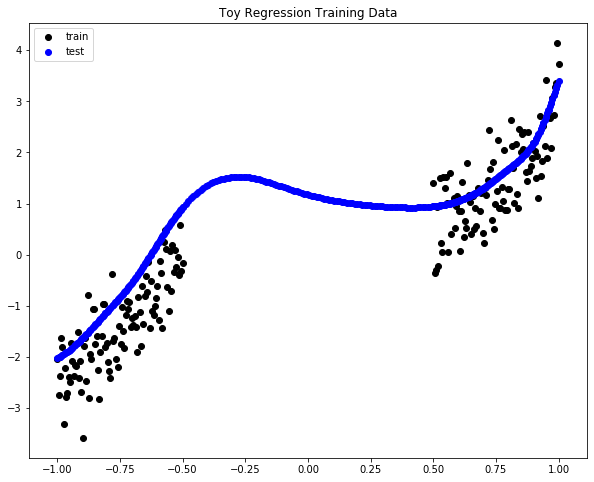

In [75]:
# Visualize the predictions
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
plt.scatter(X, y, color='black', label='train')
plt.scatter(X_test, pred[0], color='blue', label='test')
plt.title('Toy Regression Training Data')
plt.legend()

In [76]:
# Uncertainty measurement
mean_ci,up_ci,lower_ci,_ = uncertainty_estimation(swag,X_test, pred, X_valid, y_valid, verbose=True)


Begin uncertainty assessment...
Valid MSE:  0.2893900051258512


Text(0.5, 1.0, 'Uncertainty Estimates - Regression')

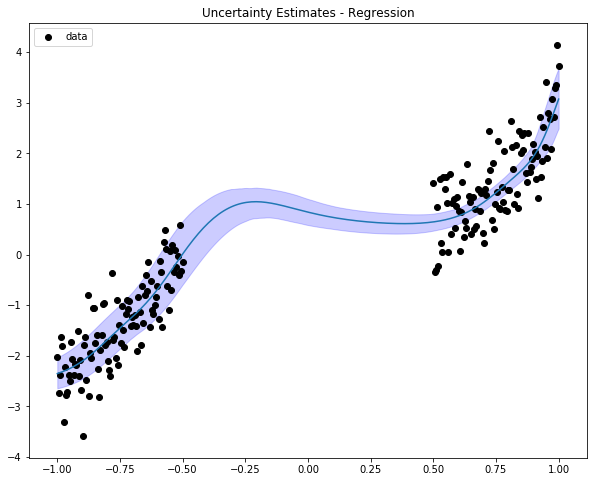

In [77]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
ax.plot(X_test,mean_ci)
ax.fill_between(X_test, up_ci, lower_ci, color='blue', alpha=0.2)
ax.scatter(X, y, color='black', label='data')
ax.legend(prop={'size':10})
ax.set_title('Uncertainty Estimates - Regression')

**Observations:** We see from the above plot that changing the initial weights do help the neural network to deviate from an almost flattened line in the (-0.5,0.5) region. However, since there is no training data in this region, SWAG will simply stay at the initial space and be very confident about its choice, leading to no clear improvement on the epistemic uncertainty estimates. The aleatoric uncertainty remains roughly the same with the best result above (from the MSE and also from the visualization).

### b) randomly initialize the weights from Normal (0,9)

In [78]:
def initialize_weights(x,mu=0,sigma=5):
    '''
    This function sample weights in the SWAG model from N(mu,sigma) and prepare the state_dict
    '''
    tensor_size = x[1].shape
    name = x[0]
    if len(tensor_size) == 2:
        length = tensor_size[0]*tensor_size[1]
        weights = np.random.normal(mu, sigma, length).reshape((tensor_size[0],tensor_size[1]))
    else:
        weights = np.random.normal(mu, sigma, len(x[1])).reshape(tensor_size[0])
    return (name,torch.from_numpy(weights))
    

In [79]:
random.seed(12)
weights = list(reg.state_dict().items())
weights_list = [initialize_weights(i) for i in weights]
weights_dict = {}
for i in weights_list:
    weights_dict[i[0]] = i[1]
new_state = reg.state_dict().copy()
new_state.update((i,v) for (i,v) in weights_dict.items())

# initialize our SWAG model with the weights drawn from Normal(0,9)
reg_new = Regression_linear()
reg_new.load_state_dict(new_state)

# initialize SWAG
swag = SWAG(Regression_linear, K = 3, pretrained = True, NNModel = reg_new)
print("Total number of parameters for the NN is:", swag.weigt_D)

# Compile swag
objective = 'regression'
lr = 1e-3
swa_const_lr = 1
momentum = 0.9
optimizer = optim.SGD
loss_fn = nn.MSELoss()
swa_scheduler = LambdaLR

swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)

# Fit swag (a short training period to see that it learns the middle section correctly)
first_mom, second_mom, D = swag.fit(train_gen,
                                    train_epoch=50,
                                    swag_epoch=20,
                                    log_freq=5,verbose=False)

# Sample 1 set of posterior weights
X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
pred = swag.predict(X_test_tensor.float(),None, S=200, expanded=True)


Total number of parameters for the NN is: 46
Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 132.6645
[Epoch: 1, 	Iteration:    10] 	Training Loss: 82.5465
[Epoch: 1, 	Iteration:    15] 	Training Loss: 21.1170
[Epoch: 1, 	Iteration:    20] 	Training Loss: 5.8676
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.4646
[Epoch: 1, 	Iteration:    30] 	Training Loss: 7.2299
[Epoch: 1, 	Iteration:    35] 	Training Loss: 7.6086
[Epoch: 1, 	Iteration:    40] 	Training Loss: 2.5473
[Epoch: 1, 	Iteration:    45] 	Training Loss: 6.9981
[Epoch: 1, 	Iteration:    50] 	Training Loss: 4.8321
[Epoch: 1, 	Iteration:    55] 	Training Loss: 2.2575
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.9864
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.6632
[Epoch: 1, 	Iteration:    70] 	Training Loss: 1.5537
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.8725
[Epoch: 1, 	Iteration:    80] 	Training Loss: 1.0118
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.6187
[Epoch: 1, 	Iteration: 

[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.1247
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.6598
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.2436
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.3152
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.2425
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.8748
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.0124
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.7506
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.5967
[Epoch: 6, 	Iteration:   100] 	Training Loss: 1.4201
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.4391
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.6484
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.5946
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.3410
[Epoch: 6, 	Iteration:   125] 	Training Loss: 1.4210
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.7496
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.2916
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.4676
[Epoch: 6, 	Iteration:   145] 	Training Loss: 

[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.2874
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.1616
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.1611
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.9792
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.5752
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.3503
[Epoch: 10, 	Iteration:   145] 	Training Loss: 1.1996
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.3625
[Epoch: 10, 	Iteration:   155] 	Training Loss: 1.0416
[Epoch: 10, 	Iteration:   160] 	Training Loss: 2.0889
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.4498
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.8052
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.4127
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.6115
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.9439
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.4004
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.3683
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.3463
[Epoch: 11, 	Iteration:     

[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.9520
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.1774
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.3766
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.1206
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.5797
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.2653
[Epoch: 15, 	Iteration:   110] 	Training Loss: 1.2649
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.5445
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.3133
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.3155
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.3775
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.4062
[Epoch: 15, 	Iteration:   140] 	Training Loss: 1.4006
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.7152
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.5776
[Epoch: 15, 	Iteration:   155] 	Training Loss: 1.8479
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.4586
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.6630
[Epoch: 15, 	Iteration:   17

[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.5821
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.1364
[Epoch: 19, 	Iteration:   135] 	Training Loss: 0.2671
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.8230
[Epoch: 19, 	Iteration:   145] 	Training Loss: 1.9208
[Epoch: 19, 	Iteration:   150] 	Training Loss: 1.2214
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.4833
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.6138
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.9267
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.9182
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.7596
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.1693
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.0324
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.1484
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.3943
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.2701
[Epoch: 20, 	Iteration:     5] 	Training Loss: 0.5271
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.2301
[Epoch: 20, 	Iteration:    1

[Epoch: 24, 	Iteration:   150] 	Training Loss: 0.8356
[Epoch: 24, 	Iteration:   155] 	Training Loss: 0.9960
[Epoch: 24, 	Iteration:   160] 	Training Loss: 0.3864
[Epoch: 24, 	Iteration:   165] 	Training Loss: 0.1758
[Epoch: 24, 	Iteration:   170] 	Training Loss: 0.5685
[Epoch: 24, 	Iteration:   175] 	Training Loss: 1.1745
[Epoch: 24, 	Iteration:   180] 	Training Loss: 0.3835
[Epoch: 24, 	Iteration:   185] 	Training Loss: 0.2921
[Epoch: 24, 	Iteration:   190] 	Training Loss: 0.2102
[Epoch: 24, 	Iteration:   195] 	Training Loss: 0.7593
[Epoch: 24, 	Iteration:   200] 	Training Loss: 0.2617
[Epoch: 25, 	Iteration:     5] 	Training Loss: 0.1114
[Epoch: 25, 	Iteration:    10] 	Training Loss: 0.2841
[Epoch: 25, 	Iteration:    15] 	Training Loss: 0.3638
[Epoch: 25, 	Iteration:    20] 	Training Loss: 0.3278
[Epoch: 25, 	Iteration:    25] 	Training Loss: 0.3611
[Epoch: 25, 	Iteration:    30] 	Training Loss: 0.2261
[Epoch: 25, 	Iteration:    35] 	Training Loss: 0.2130
[Epoch: 25, 	Iteration:    4

[Epoch: 28, 	Iteration:   180] 	Training Loss: 0.6756
[Epoch: 28, 	Iteration:   185] 	Training Loss: 0.0926
[Epoch: 28, 	Iteration:   190] 	Training Loss: 0.3707
[Epoch: 28, 	Iteration:   195] 	Training Loss: 1.4194
[Epoch: 28, 	Iteration:   200] 	Training Loss: 0.4655
[Epoch: 29, 	Iteration:     5] 	Training Loss: 0.5067
[Epoch: 29, 	Iteration:    10] 	Training Loss: 0.1879
[Epoch: 29, 	Iteration:    15] 	Training Loss: 0.2903
[Epoch: 29, 	Iteration:    20] 	Training Loss: 1.0073
[Epoch: 29, 	Iteration:    25] 	Training Loss: 1.0470
[Epoch: 29, 	Iteration:    30] 	Training Loss: 1.1520
[Epoch: 29, 	Iteration:    35] 	Training Loss: 1.9991
[Epoch: 29, 	Iteration:    40] 	Training Loss: 0.3475
[Epoch: 29, 	Iteration:    45] 	Training Loss: 1.0052
[Epoch: 29, 	Iteration:    50] 	Training Loss: 0.3378
[Epoch: 29, 	Iteration:    55] 	Training Loss: 0.2104
[Epoch: 29, 	Iteration:    60] 	Training Loss: 0.3477
[Epoch: 29, 	Iteration:    65] 	Training Loss: 0.6825
[Epoch: 29, 	Iteration:    7

[Epoch: 34, 	Iteration:     5] 	Training Loss: 2.1374
[Epoch: 34, 	Iteration:    10] 	Training Loss: 0.4922
[Epoch: 34, 	Iteration:    15] 	Training Loss: 0.8943
[Epoch: 34, 	Iteration:    20] 	Training Loss: 0.2328
[Epoch: 34, 	Iteration:    25] 	Training Loss: 0.2585
[Epoch: 34, 	Iteration:    30] 	Training Loss: 0.6969
[Epoch: 34, 	Iteration:    35] 	Training Loss: 0.2065
[Epoch: 34, 	Iteration:    40] 	Training Loss: 0.8746
[Epoch: 34, 	Iteration:    45] 	Training Loss: 0.1931
[Epoch: 34, 	Iteration:    50] 	Training Loss: 1.4526
[Epoch: 34, 	Iteration:    55] 	Training Loss: 0.4591
[Epoch: 34, 	Iteration:    60] 	Training Loss: 0.1856
[Epoch: 34, 	Iteration:    65] 	Training Loss: 0.2707
[Epoch: 34, 	Iteration:    70] 	Training Loss: 0.1949
[Epoch: 34, 	Iteration:    75] 	Training Loss: 0.4229
[Epoch: 34, 	Iteration:    80] 	Training Loss: 0.3349
[Epoch: 34, 	Iteration:    85] 	Training Loss: 1.5968
[Epoch: 34, 	Iteration:    90] 	Training Loss: 0.5282
[Epoch: 34, 	Iteration:    9

[Epoch: 38, 	Iteration:   140] 	Training Loss: 0.6280
[Epoch: 38, 	Iteration:   145] 	Training Loss: 0.5030
[Epoch: 38, 	Iteration:   150] 	Training Loss: 0.0686
[Epoch: 38, 	Iteration:   155] 	Training Loss: 0.1989
[Epoch: 38, 	Iteration:   160] 	Training Loss: 0.9357
[Epoch: 38, 	Iteration:   165] 	Training Loss: 0.1966
[Epoch: 38, 	Iteration:   170] 	Training Loss: 0.1786
[Epoch: 38, 	Iteration:   175] 	Training Loss: 0.1362
[Epoch: 38, 	Iteration:   180] 	Training Loss: 0.2930
[Epoch: 38, 	Iteration:   185] 	Training Loss: 0.2109
[Epoch: 38, 	Iteration:   190] 	Training Loss: 1.2502
[Epoch: 38, 	Iteration:   195] 	Training Loss: 0.4354
[Epoch: 38, 	Iteration:   200] 	Training Loss: 0.7084
[Epoch: 39, 	Iteration:     5] 	Training Loss: 0.8631
[Epoch: 39, 	Iteration:    10] 	Training Loss: 0.3201
[Epoch: 39, 	Iteration:    15] 	Training Loss: 0.2725
[Epoch: 39, 	Iteration:    20] 	Training Loss: 0.8372
[Epoch: 39, 	Iteration:    25] 	Training Loss: 1.0638
[Epoch: 39, 	Iteration:    3

[Epoch: 43, 	Iteration:    80] 	Training Loss: 0.3293
[Epoch: 43, 	Iteration:    85] 	Training Loss: 0.1871
[Epoch: 43, 	Iteration:    90] 	Training Loss: 0.4759
[Epoch: 43, 	Iteration:    95] 	Training Loss: 0.6455
[Epoch: 43, 	Iteration:   100] 	Training Loss: 0.0984
[Epoch: 43, 	Iteration:   105] 	Training Loss: 0.2955
[Epoch: 43, 	Iteration:   110] 	Training Loss: 0.7511
[Epoch: 43, 	Iteration:   115] 	Training Loss: 0.2082
[Epoch: 43, 	Iteration:   120] 	Training Loss: 0.2903
[Epoch: 43, 	Iteration:   125] 	Training Loss: 0.5627
[Epoch: 43, 	Iteration:   130] 	Training Loss: 0.3645
[Epoch: 43, 	Iteration:   135] 	Training Loss: 1.2894
[Epoch: 43, 	Iteration:   140] 	Training Loss: 0.6653
[Epoch: 43, 	Iteration:   145] 	Training Loss: 0.4673
[Epoch: 43, 	Iteration:   150] 	Training Loss: 1.0671
[Epoch: 43, 	Iteration:   155] 	Training Loss: 0.0726
[Epoch: 43, 	Iteration:   160] 	Training Loss: 0.2018
[Epoch: 43, 	Iteration:   165] 	Training Loss: 0.6886
[Epoch: 43, 	Iteration:   17

[Epoch: 48, 	Iteration:    10] 	Training Loss: 0.7572
[Epoch: 48, 	Iteration:    15] 	Training Loss: 0.8205
[Epoch: 48, 	Iteration:    20] 	Training Loss: 0.1323
[Epoch: 48, 	Iteration:    25] 	Training Loss: 0.5503
[Epoch: 48, 	Iteration:    30] 	Training Loss: 1.4436
[Epoch: 48, 	Iteration:    35] 	Training Loss: 0.0555
[Epoch: 48, 	Iteration:    40] 	Training Loss: 0.4626
[Epoch: 48, 	Iteration:    45] 	Training Loss: 0.6311
[Epoch: 48, 	Iteration:    50] 	Training Loss: 0.2927
[Epoch: 48, 	Iteration:    55] 	Training Loss: 0.5407
[Epoch: 48, 	Iteration:    60] 	Training Loss: 2.4801
[Epoch: 48, 	Iteration:    65] 	Training Loss: 0.4325
[Epoch: 48, 	Iteration:    70] 	Training Loss: 0.3098
[Epoch: 48, 	Iteration:    75] 	Training Loss: 1.0921
[Epoch: 48, 	Iteration:    80] 	Training Loss: 0.1642
[Epoch: 48, 	Iteration:    85] 	Training Loss: 0.5160
[Epoch: 48, 	Iteration:    90] 	Training Loss: 1.1959
[Epoch: 48, 	Iteration:    95] 	Training Loss: 0.9079
[Epoch: 48, 	Iteration:   10

[Epoch: 53, 	Iteration:    25] 	Training Loss: 0.7431
[Epoch: 53, 	Iteration:    30] 	Training Loss: 0.0936
[Epoch: 53, 	Iteration:    35] 	Training Loss: 1.0804
[Epoch: 53, 	Iteration:    40] 	Training Loss: 0.7943
[Epoch: 53, 	Iteration:    45] 	Training Loss: 1.0801
[Epoch: 53, 	Iteration:    50] 	Training Loss: 1.6210
[Epoch: 53, 	Iteration:    55] 	Training Loss: 0.7167
[Epoch: 53, 	Iteration:    60] 	Training Loss: 0.3683
[Epoch: 53, 	Iteration:    65] 	Training Loss: 0.3322
[Epoch: 53, 	Iteration:    70] 	Training Loss: 0.6701
[Epoch: 53, 	Iteration:    75] 	Training Loss: 0.9810
[Epoch: 53, 	Iteration:    80] 	Training Loss: 0.1282
[Epoch: 53, 	Iteration:    85] 	Training Loss: 0.7925
[Epoch: 53, 	Iteration:    90] 	Training Loss: 0.3945
[Epoch: 53, 	Iteration:    95] 	Training Loss: 0.4258
[Epoch: 53, 	Iteration:   100] 	Training Loss: 0.5911
[Epoch: 53, 	Iteration:   105] 	Training Loss: 0.5391
[Epoch: 53, 	Iteration:   110] 	Training Loss: 0.1774
[Epoch: 53, 	Iteration:   11

[Epoch: 57, 	Iteration:   190] 	Training Loss: 1.3651
[Epoch: 57, 	Iteration:   195] 	Training Loss: 0.6794
[Epoch: 57, 	Iteration:   200] 	Training Loss: 0.3636
[Epoch: 58, 	Iteration:     5] 	Training Loss: 0.2186
[Epoch: 58, 	Iteration:    10] 	Training Loss: 0.7653
[Epoch: 58, 	Iteration:    15] 	Training Loss: 0.3516
[Epoch: 58, 	Iteration:    20] 	Training Loss: 0.1020
[Epoch: 58, 	Iteration:    25] 	Training Loss: 0.2623
[Epoch: 58, 	Iteration:    30] 	Training Loss: 1.0769
[Epoch: 58, 	Iteration:    35] 	Training Loss: 0.1582
[Epoch: 58, 	Iteration:    40] 	Training Loss: 1.0303
[Epoch: 58, 	Iteration:    45] 	Training Loss: 0.6964
[Epoch: 58, 	Iteration:    50] 	Training Loss: 0.1741
[Epoch: 58, 	Iteration:    55] 	Training Loss: 0.7012
[Epoch: 58, 	Iteration:    60] 	Training Loss: 0.2229
[Epoch: 58, 	Iteration:    65] 	Training Loss: 0.0903
[Epoch: 58, 	Iteration:    70] 	Training Loss: 0.1574
[Epoch: 58, 	Iteration:    75] 	Training Loss: 0.2959
[Epoch: 58, 	Iteration:    8

[Epoch: 63, 	Iteration:    45] 	Training Loss: 0.3847
[Epoch: 63, 	Iteration:    50] 	Training Loss: 0.6322
[Epoch: 63, 	Iteration:    55] 	Training Loss: 0.6260
[Epoch: 63, 	Iteration:    60] 	Training Loss: 0.1105
[Epoch: 63, 	Iteration:    65] 	Training Loss: 0.5033
[Epoch: 63, 	Iteration:    70] 	Training Loss: 1.9317
[Epoch: 63, 	Iteration:    75] 	Training Loss: 0.7733
[Epoch: 63, 	Iteration:    80] 	Training Loss: 0.1869
[Epoch: 63, 	Iteration:    85] 	Training Loss: 0.1619
[Epoch: 63, 	Iteration:    90] 	Training Loss: 0.3683
[Epoch: 63, 	Iteration:    95] 	Training Loss: 0.6709
[Epoch: 63, 	Iteration:   100] 	Training Loss: 0.4823
[Epoch: 63, 	Iteration:   105] 	Training Loss: 0.1860
[Epoch: 63, 	Iteration:   110] 	Training Loss: 0.6828
[Epoch: 63, 	Iteration:   115] 	Training Loss: 0.3929
[Epoch: 63, 	Iteration:   120] 	Training Loss: 0.3573
[Epoch: 63, 	Iteration:   125] 	Training Loss: 1.0823
[Epoch: 63, 	Iteration:   130] 	Training Loss: 0.2028
[Epoch: 63, 	Iteration:   13

[Epoch: 68, 	Iteration:    35] 	Training Loss: 0.1289
[Epoch: 68, 	Iteration:    40] 	Training Loss: 0.5998
[Epoch: 68, 	Iteration:    45] 	Training Loss: 0.1257
[Epoch: 68, 	Iteration:    50] 	Training Loss: 0.1725
[Epoch: 68, 	Iteration:    55] 	Training Loss: 0.6060
[Epoch: 68, 	Iteration:    60] 	Training Loss: 0.1379
[Epoch: 68, 	Iteration:    65] 	Training Loss: 0.2523
[Epoch: 68, 	Iteration:    70] 	Training Loss: 0.5473
[Epoch: 68, 	Iteration:    75] 	Training Loss: 0.7885
[Epoch: 68, 	Iteration:    80] 	Training Loss: 0.3687
[Epoch: 68, 	Iteration:    85] 	Training Loss: 0.5678
[Epoch: 68, 	Iteration:    90] 	Training Loss: 1.7389
[Epoch: 68, 	Iteration:    95] 	Training Loss: 0.1275
[Epoch: 68, 	Iteration:   100] 	Training Loss: 0.4358
[Epoch: 68, 	Iteration:   105] 	Training Loss: 0.1285
[Epoch: 68, 	Iteration:   110] 	Training Loss: 0.3225
[Epoch: 68, 	Iteration:   115] 	Training Loss: 0.3831
[Epoch: 68, 	Iteration:   120] 	Training Loss: 0.4594
[Epoch: 68, 	Iteration:   12

[Epoch: 73, 	Iteration:    10] 	Training Loss: 0.3401
[Epoch: 73, 	Iteration:    15] 	Training Loss: 0.4834
[Epoch: 73, 	Iteration:    20] 	Training Loss: 0.3315
[Epoch: 73, 	Iteration:    25] 	Training Loss: 0.0940
[Epoch: 73, 	Iteration:    30] 	Training Loss: 0.4431
[Epoch: 73, 	Iteration:    35] 	Training Loss: 1.9766
[Epoch: 73, 	Iteration:    40] 	Training Loss: 0.4979
[Epoch: 73, 	Iteration:    45] 	Training Loss: 0.4293
[Epoch: 73, 	Iteration:    50] 	Training Loss: 0.2763
[Epoch: 73, 	Iteration:    55] 	Training Loss: 0.8313
[Epoch: 73, 	Iteration:    60] 	Training Loss: 0.3912
[Epoch: 73, 	Iteration:    65] 	Training Loss: 0.8758
[Epoch: 73, 	Iteration:    70] 	Training Loss: 1.0121
[Epoch: 73, 	Iteration:    75] 	Training Loss: 0.3954
[Epoch: 73, 	Iteration:    80] 	Training Loss: 0.0971
[Epoch: 73, 	Iteration:    85] 	Training Loss: 0.3151
[Epoch: 73, 	Iteration:    90] 	Training Loss: 0.8859
[Epoch: 73, 	Iteration:    95] 	Training Loss: 0.3510
[Epoch: 73, 	Iteration:   10

[Epoch: 78, 	Iteration:    60] 	Training Loss: 0.3107
[Epoch: 78, 	Iteration:    65] 	Training Loss: 0.3817
[Epoch: 78, 	Iteration:    70] 	Training Loss: 0.3848
[Epoch: 78, 	Iteration:    75] 	Training Loss: 0.4882
[Epoch: 78, 	Iteration:    80] 	Training Loss: 0.1587
[Epoch: 78, 	Iteration:    85] 	Training Loss: 0.3660
[Epoch: 78, 	Iteration:    90] 	Training Loss: 0.2905
[Epoch: 78, 	Iteration:    95] 	Training Loss: 0.6084
[Epoch: 78, 	Iteration:   100] 	Training Loss: 0.1672
[Epoch: 78, 	Iteration:   105] 	Training Loss: 0.1531
[Epoch: 78, 	Iteration:   110] 	Training Loss: 0.8471
[Epoch: 78, 	Iteration:   115] 	Training Loss: 0.5989
[Epoch: 78, 	Iteration:   120] 	Training Loss: 0.3715
[Epoch: 78, 	Iteration:   125] 	Training Loss: 0.7784
[Epoch: 78, 	Iteration:   130] 	Training Loss: 0.3070
[Epoch: 78, 	Iteration:   135] 	Training Loss: 0.3123
[Epoch: 78, 	Iteration:   140] 	Training Loss: 0.8531
[Epoch: 78, 	Iteration:   145] 	Training Loss: 1.8989
[Epoch: 78, 	Iteration:   15

[Epoch: 83, 	Iteration:   115] 	Training Loss: 0.5299
[Epoch: 83, 	Iteration:   120] 	Training Loss: 1.6078
[Epoch: 83, 	Iteration:   125] 	Training Loss: 0.6311
[Epoch: 83, 	Iteration:   130] 	Training Loss: 0.3480
[Epoch: 83, 	Iteration:   135] 	Training Loss: 1.3288
[Epoch: 83, 	Iteration:   140] 	Training Loss: 0.5184
[Epoch: 83, 	Iteration:   145] 	Training Loss: 1.0581
[Epoch: 83, 	Iteration:   150] 	Training Loss: 0.1389
[Epoch: 83, 	Iteration:   155] 	Training Loss: 0.1852
[Epoch: 83, 	Iteration:   160] 	Training Loss: 0.3269
[Epoch: 83, 	Iteration:   165] 	Training Loss: 1.1913
[Epoch: 83, 	Iteration:   170] 	Training Loss: 0.8517
[Epoch: 83, 	Iteration:   175] 	Training Loss: 0.1401
[Epoch: 83, 	Iteration:   180] 	Training Loss: 0.2850
[Epoch: 83, 	Iteration:   185] 	Training Loss: 0.3670
[Epoch: 83, 	Iteration:   190] 	Training Loss: 0.2306
[Epoch: 83, 	Iteration:   195] 	Training Loss: 0.2975
[Epoch: 83, 	Iteration:   200] 	Training Loss: 0.3747
[Epoch: 84, 	Iteration:     

[Epoch: 88, 	Iteration:    95] 	Training Loss: 0.4716
[Epoch: 88, 	Iteration:   100] 	Training Loss: 0.3576
[Epoch: 88, 	Iteration:   105] 	Training Loss: 1.1997
[Epoch: 88, 	Iteration:   110] 	Training Loss: 0.7148
[Epoch: 88, 	Iteration:   115] 	Training Loss: 0.7201
[Epoch: 88, 	Iteration:   120] 	Training Loss: 0.9596
[Epoch: 88, 	Iteration:   125] 	Training Loss: 0.3593
[Epoch: 88, 	Iteration:   130] 	Training Loss: 0.1313
[Epoch: 88, 	Iteration:   135] 	Training Loss: 0.7829
[Epoch: 88, 	Iteration:   140] 	Training Loss: 0.7756
[Epoch: 88, 	Iteration:   145] 	Training Loss: 0.4688
[Epoch: 88, 	Iteration:   150] 	Training Loss: 0.3415
[Epoch: 88, 	Iteration:   155] 	Training Loss: 0.0747
[Epoch: 88, 	Iteration:   160] 	Training Loss: 0.6658
[Epoch: 88, 	Iteration:   165] 	Training Loss: 0.4444
[Epoch: 88, 	Iteration:   170] 	Training Loss: 0.3035
[Epoch: 88, 	Iteration:   175] 	Training Loss: 0.4006
[Epoch: 88, 	Iteration:   180] 	Training Loss: 0.4322
[Epoch: 88, 	Iteration:   18

[Epoch: 93, 	Iteration:   110] 	Training Loss: 0.5397
[Epoch: 93, 	Iteration:   115] 	Training Loss: 0.6808
[Epoch: 93, 	Iteration:   120] 	Training Loss: 0.4924
[Epoch: 93, 	Iteration:   125] 	Training Loss: 1.5719
[Epoch: 93, 	Iteration:   130] 	Training Loss: 0.4332
[Epoch: 93, 	Iteration:   135] 	Training Loss: 0.6705
[Epoch: 93, 	Iteration:   140] 	Training Loss: 0.3874
[Epoch: 93, 	Iteration:   145] 	Training Loss: 0.6006
[Epoch: 93, 	Iteration:   150] 	Training Loss: 0.3064
[Epoch: 93, 	Iteration:   155] 	Training Loss: 0.3020
[Epoch: 93, 	Iteration:   160] 	Training Loss: 0.5691
[Epoch: 93, 	Iteration:   165] 	Training Loss: 1.2529
[Epoch: 93, 	Iteration:   170] 	Training Loss: 0.1599
[Epoch: 93, 	Iteration:   175] 	Training Loss: 0.3044
[Epoch: 93, 	Iteration:   180] 	Training Loss: 0.4588
[Epoch: 93, 	Iteration:   185] 	Training Loss: 2.0975
[Epoch: 93, 	Iteration:   190] 	Training Loss: 0.3471
[Epoch: 93, 	Iteration:   195] 	Training Loss: 0.2888
[Epoch: 93, 	Iteration:   20

[Epoch: 98, 	Iteration:   135] 	Training Loss: 0.7910
[Epoch: 98, 	Iteration:   140] 	Training Loss: 0.4268
[Epoch: 98, 	Iteration:   145] 	Training Loss: 0.3533
[Epoch: 98, 	Iteration:   150] 	Training Loss: 1.4514
[Epoch: 98, 	Iteration:   155] 	Training Loss: 0.5929
[Epoch: 98, 	Iteration:   160] 	Training Loss: 0.1691
[Epoch: 98, 	Iteration:   165] 	Training Loss: 0.2688
[Epoch: 98, 	Iteration:   170] 	Training Loss: 0.1169
[Epoch: 98, 	Iteration:   175] 	Training Loss: 0.2342
[Epoch: 98, 	Iteration:   180] 	Training Loss: 0.3563
[Epoch: 98, 	Iteration:   185] 	Training Loss: 0.5947
[Epoch: 98, 	Iteration:   190] 	Training Loss: 0.0530
[Epoch: 98, 	Iteration:   195] 	Training Loss: 0.0881
[Epoch: 98, 	Iteration:   200] 	Training Loss: 0.1555
[Epoch: 99, 	Iteration:     5] 	Training Loss: 0.2280
[Epoch: 99, 	Iteration:    10] 	Training Loss: 0.2819
[Epoch: 99, 	Iteration:    15] 	Training Loss: 0.4720
[Epoch: 99, 	Iteration:    20] 	Training Loss: 0.8662
[Epoch: 99, 	Iteration:    2

[Epoch: 103, 	Iteration:   155] 	Training Loss: 0.2704
[Epoch: 103, 	Iteration:   160] 	Training Loss: 1.5194
[Epoch: 103, 	Iteration:   165] 	Training Loss: 0.4250
[Epoch: 103, 	Iteration:   170] 	Training Loss: 0.1497
[Epoch: 103, 	Iteration:   175] 	Training Loss: 0.6296
[Epoch: 103, 	Iteration:   180] 	Training Loss: 2.7162
[Epoch: 103, 	Iteration:   185] 	Training Loss: 0.6482
[Epoch: 103, 	Iteration:   190] 	Training Loss: 0.2288
[Epoch: 103, 	Iteration:   195] 	Training Loss: 0.5804
[Epoch: 103, 	Iteration:   200] 	Training Loss: 0.9382
[Epoch: 104, 	Iteration:     5] 	Training Loss: 0.4669
[Epoch: 104, 	Iteration:    10] 	Training Loss: 0.4574
[Epoch: 104, 	Iteration:    15] 	Training Loss: 0.2257
[Epoch: 104, 	Iteration:    20] 	Training Loss: 0.3820
[Epoch: 104, 	Iteration:    25] 	Training Loss: 0.7937
[Epoch: 104, 	Iteration:    30] 	Training Loss: 0.5069
[Epoch: 104, 	Iteration:    35] 	Training Loss: 1.0316
[Epoch: 104, 	Iteration:    40] 	Training Loss: 0.6012
[Epoch: 10

[Epoch: 108, 	Iteration:   200] 	Training Loss: 0.6292
[Epoch: 109, 	Iteration:     5] 	Training Loss: 0.5076
[Epoch: 109, 	Iteration:    10] 	Training Loss: 0.1111
[Epoch: 109, 	Iteration:    15] 	Training Loss: 2.7244
[Epoch: 109, 	Iteration:    20] 	Training Loss: 0.1358
[Epoch: 109, 	Iteration:    25] 	Training Loss: 0.1966
[Epoch: 109, 	Iteration:    30] 	Training Loss: 0.3015
[Epoch: 109, 	Iteration:    35] 	Training Loss: 0.5458
[Epoch: 109, 	Iteration:    40] 	Training Loss: 0.7409
[Epoch: 109, 	Iteration:    45] 	Training Loss: 0.3803
[Epoch: 109, 	Iteration:    50] 	Training Loss: 0.7435
[Epoch: 109, 	Iteration:    55] 	Training Loss: 0.3994
[Epoch: 109, 	Iteration:    60] 	Training Loss: 1.2424
[Epoch: 109, 	Iteration:    65] 	Training Loss: 1.1884
[Epoch: 109, 	Iteration:    70] 	Training Loss: 0.5044
[Epoch: 109, 	Iteration:    75] 	Training Loss: 0.6995
[Epoch: 109, 	Iteration:    80] 	Training Loss: 0.7398
[Epoch: 109, 	Iteration:    85] 	Training Loss: 0.2079
[Epoch: 10

[Epoch: 114, 	Iteration:    30] 	Training Loss: 0.3253
[Epoch: 114, 	Iteration:    35] 	Training Loss: 1.9774
[Epoch: 114, 	Iteration:    40] 	Training Loss: 0.5673
[Epoch: 114, 	Iteration:    45] 	Training Loss: 0.3355
[Epoch: 114, 	Iteration:    50] 	Training Loss: 0.2893
[Epoch: 114, 	Iteration:    55] 	Training Loss: 0.2705
[Epoch: 114, 	Iteration:    60] 	Training Loss: 0.2514
[Epoch: 114, 	Iteration:    65] 	Training Loss: 1.4054
[Epoch: 114, 	Iteration:    70] 	Training Loss: 0.0677
[Epoch: 114, 	Iteration:    75] 	Training Loss: 0.1455
[Epoch: 114, 	Iteration:    80] 	Training Loss: 0.9452
[Epoch: 114, 	Iteration:    85] 	Training Loss: 0.2964
[Epoch: 114, 	Iteration:    90] 	Training Loss: 0.2396
[Epoch: 114, 	Iteration:    95] 	Training Loss: 0.1594
[Epoch: 114, 	Iteration:   100] 	Training Loss: 1.3711
[Epoch: 114, 	Iteration:   105] 	Training Loss: 0.6622
[Epoch: 114, 	Iteration:   110] 	Training Loss: 0.3712
[Epoch: 114, 	Iteration:   115] 	Training Loss: 0.2470
[Epoch: 11

[Epoch: 119, 	Iteration:    90] 	Training Loss: 0.0775
[Epoch: 119, 	Iteration:    95] 	Training Loss: 0.3352
[Epoch: 119, 	Iteration:   100] 	Training Loss: 0.6759
[Epoch: 119, 	Iteration:   105] 	Training Loss: 0.1947
[Epoch: 119, 	Iteration:   110] 	Training Loss: 0.6789
[Epoch: 119, 	Iteration:   115] 	Training Loss: 0.0970
[Epoch: 119, 	Iteration:   120] 	Training Loss: 0.8449
[Epoch: 119, 	Iteration:   125] 	Training Loss: 0.2067
[Epoch: 119, 	Iteration:   130] 	Training Loss: 0.1384
[Epoch: 119, 	Iteration:   135] 	Training Loss: 0.0748
[Epoch: 119, 	Iteration:   140] 	Training Loss: 0.7069
[Epoch: 119, 	Iteration:   145] 	Training Loss: 0.8626
[Epoch: 119, 	Iteration:   150] 	Training Loss: 0.9838
[Epoch: 119, 	Iteration:   155] 	Training Loss: 0.1605
[Epoch: 119, 	Iteration:   160] 	Training Loss: 0.4968
[Epoch: 119, 	Iteration:   165] 	Training Loss: 0.1720
[Epoch: 119, 	Iteration:   170] 	Training Loss: 1.1450
[Epoch: 119, 	Iteration:   175] 	Training Loss: 1.8804
[Epoch: 11

[Epoch: 124, 	Iteration:   150] 	Training Loss: 0.7561
[Epoch: 124, 	Iteration:   155] 	Training Loss: 1.8275
[Epoch: 124, 	Iteration:   160] 	Training Loss: 1.3882
[Epoch: 124, 	Iteration:   165] 	Training Loss: 0.4014
[Epoch: 124, 	Iteration:   170] 	Training Loss: 0.9891
[Epoch: 124, 	Iteration:   175] 	Training Loss: 0.9122
[Epoch: 124, 	Iteration:   180] 	Training Loss: 0.4967
[Epoch: 124, 	Iteration:   185] 	Training Loss: 0.4948
[Epoch: 124, 	Iteration:   190] 	Training Loss: 0.4349
[Epoch: 124, 	Iteration:   195] 	Training Loss: 0.3042
[Epoch: 124, 	Iteration:   200] 	Training Loss: 0.2160
[Epoch: 125, 	Iteration:     5] 	Training Loss: 0.2346
[Epoch: 125, 	Iteration:    10] 	Training Loss: 0.9547
[Epoch: 125, 	Iteration:    15] 	Training Loss: 0.7655
[Epoch: 125, 	Iteration:    20] 	Training Loss: 0.9031
[Epoch: 125, 	Iteration:    25] 	Training Loss: 1.6783
[Epoch: 125, 	Iteration:    30] 	Training Loss: 0.6187
[Epoch: 125, 	Iteration:    35] 	Training Loss: 0.6860
[Epoch: 12

[Epoch: 130, 	Iteration:     5] 	Training Loss: 0.4254
[Epoch: 130, 	Iteration:    10] 	Training Loss: 1.1789
[Epoch: 130, 	Iteration:    15] 	Training Loss: 2.1172
[Epoch: 130, 	Iteration:    20] 	Training Loss: 0.1205
[Epoch: 130, 	Iteration:    25] 	Training Loss: 1.0691
[Epoch: 130, 	Iteration:    30] 	Training Loss: 0.5752
[Epoch: 130, 	Iteration:    35] 	Training Loss: 0.3407
[Epoch: 130, 	Iteration:    40] 	Training Loss: 0.3565
[Epoch: 130, 	Iteration:    45] 	Training Loss: 1.1708
[Epoch: 130, 	Iteration:    50] 	Training Loss: 0.6148
[Epoch: 130, 	Iteration:    55] 	Training Loss: 0.2671
[Epoch: 130, 	Iteration:    60] 	Training Loss: 0.4966
[Epoch: 130, 	Iteration:    65] 	Training Loss: 0.3573
[Epoch: 130, 	Iteration:    70] 	Training Loss: 0.3812
[Epoch: 130, 	Iteration:    75] 	Training Loss: 0.6972
[Epoch: 130, 	Iteration:    80] 	Training Loss: 0.1601
[Epoch: 130, 	Iteration:    85] 	Training Loss: 0.5744
[Epoch: 130, 	Iteration:    90] 	Training Loss: 0.6294
[Epoch: 13

[Epoch: 135, 	Iteration:    60] 	Training Loss: 0.1213
[Epoch: 135, 	Iteration:    65] 	Training Loss: 1.5460
[Epoch: 135, 	Iteration:    70] 	Training Loss: 0.9743
[Epoch: 135, 	Iteration:    75] 	Training Loss: 0.4493
[Epoch: 135, 	Iteration:    80] 	Training Loss: 0.4743
[Epoch: 135, 	Iteration:    85] 	Training Loss: 0.7101
[Epoch: 135, 	Iteration:    90] 	Training Loss: 1.2009
[Epoch: 135, 	Iteration:    95] 	Training Loss: 0.8250
[Epoch: 135, 	Iteration:   100] 	Training Loss: 0.4608
[Epoch: 135, 	Iteration:   105] 	Training Loss: 0.1762
[Epoch: 135, 	Iteration:   110] 	Training Loss: 0.4764
[Epoch: 135, 	Iteration:   115] 	Training Loss: 0.5266
[Epoch: 135, 	Iteration:   120] 	Training Loss: 0.8153
[Epoch: 135, 	Iteration:   125] 	Training Loss: 0.3502
[Epoch: 135, 	Iteration:   130] 	Training Loss: 0.1134
[Epoch: 135, 	Iteration:   135] 	Training Loss: 0.4511
[Epoch: 135, 	Iteration:   140] 	Training Loss: 0.1963
[Epoch: 135, 	Iteration:   145] 	Training Loss: 0.4881
[Epoch: 13

[Epoch: 140, 	Iteration:   120] 	Training Loss: 0.6575
[Epoch: 140, 	Iteration:   125] 	Training Loss: 0.5361
[Epoch: 140, 	Iteration:   130] 	Training Loss: 1.0409
[Epoch: 140, 	Iteration:   135] 	Training Loss: 0.4516
[Epoch: 140, 	Iteration:   140] 	Training Loss: 0.9333
[Epoch: 140, 	Iteration:   145] 	Training Loss: 0.2593
[Epoch: 140, 	Iteration:   150] 	Training Loss: 0.2155
[Epoch: 140, 	Iteration:   155] 	Training Loss: 0.1704
[Epoch: 140, 	Iteration:   160] 	Training Loss: 1.0719
[Epoch: 140, 	Iteration:   165] 	Training Loss: 0.2384
[Epoch: 140, 	Iteration:   170] 	Training Loss: 0.3650
[Epoch: 140, 	Iteration:   175] 	Training Loss: 0.8085
[Epoch: 140, 	Iteration:   180] 	Training Loss: 0.7495
[Epoch: 140, 	Iteration:   185] 	Training Loss: 0.7178
[Epoch: 140, 	Iteration:   190] 	Training Loss: 0.2802
[Epoch: 140, 	Iteration:   195] 	Training Loss: 0.2206
[Epoch: 140, 	Iteration:   200] 	Training Loss: 1.6563
[Epoch: 141, 	Iteration:     5] 	Training Loss: 0.4079
[Epoch: 14

[Epoch: 145, 	Iteration:   170] 	Training Loss: 0.5768
[Epoch: 145, 	Iteration:   175] 	Training Loss: 0.8870
[Epoch: 145, 	Iteration:   180] 	Training Loss: 0.0562
[Epoch: 145, 	Iteration:   185] 	Training Loss: 1.3284
[Epoch: 145, 	Iteration:   190] 	Training Loss: 0.6200
[Epoch: 145, 	Iteration:   195] 	Training Loss: 0.2141
[Epoch: 145, 	Iteration:   200] 	Training Loss: 0.3233
[Epoch: 146, 	Iteration:     5] 	Training Loss: 0.2262
[Epoch: 146, 	Iteration:    10] 	Training Loss: 0.4466
[Epoch: 146, 	Iteration:    15] 	Training Loss: 0.9293
[Epoch: 146, 	Iteration:    20] 	Training Loss: 0.2088
[Epoch: 146, 	Iteration:    25] 	Training Loss: 0.6138
[Epoch: 146, 	Iteration:    30] 	Training Loss: 0.4868
[Epoch: 146, 	Iteration:    35] 	Training Loss: 0.6997
[Epoch: 146, 	Iteration:    40] 	Training Loss: 0.6627
[Epoch: 146, 	Iteration:    45] 	Training Loss: 0.1684
[Epoch: 146, 	Iteration:    50] 	Training Loss: 2.1537
[Epoch: 146, 	Iteration:    55] 	Training Loss: 0.5462
[Epoch: 14

[Epoch: 151, 	Iteration:    20] 	Training Loss: 0.6102
[Epoch: 151, 	Iteration:    25] 	Training Loss: 0.2104
[Epoch: 151, 	Iteration:    30] 	Training Loss: 0.8532
[Epoch: 151, 	Iteration:    35] 	Training Loss: 0.2721
[Epoch: 151, 	Iteration:    40] 	Training Loss: 0.1487
[Epoch: 151, 	Iteration:    45] 	Training Loss: 1.0410
[Epoch: 151, 	Iteration:    50] 	Training Loss: 0.2703
[Epoch: 151, 	Iteration:    55] 	Training Loss: 0.3739
[Epoch: 151, 	Iteration:    60] 	Training Loss: 0.6289
[Epoch: 151, 	Iteration:    65] 	Training Loss: 1.4179
[Epoch: 151, 	Iteration:    70] 	Training Loss: 0.1910
[Epoch: 151, 	Iteration:    75] 	Training Loss: 1.8341
[Epoch: 151, 	Iteration:    80] 	Training Loss: 0.4101
[Epoch: 151, 	Iteration:    85] 	Training Loss: 1.6884
[Epoch: 151, 	Iteration:    90] 	Training Loss: 0.5900
[Epoch: 151, 	Iteration:    95] 	Training Loss: 0.2790
[Epoch: 151, 	Iteration:   100] 	Training Loss: 0.3072
[Epoch: 151, 	Iteration:   105] 	Training Loss: 0.6141
[Epoch: 15

[Epoch: 156, 	Iteration:    90] 	Training Loss: 0.6668
[Epoch: 156, 	Iteration:    95] 	Training Loss: 0.8665
[Epoch: 156, 	Iteration:   100] 	Training Loss: 0.9528
[Epoch: 156, 	Iteration:   105] 	Training Loss: 0.4979
[Epoch: 156, 	Iteration:   110] 	Training Loss: 0.5713
[Epoch: 156, 	Iteration:   115] 	Training Loss: 0.5414
[Epoch: 156, 	Iteration:   120] 	Training Loss: 0.9397
[Epoch: 156, 	Iteration:   125] 	Training Loss: 0.4044
[Epoch: 156, 	Iteration:   130] 	Training Loss: 0.9115
[Epoch: 156, 	Iteration:   135] 	Training Loss: 0.5536
[Epoch: 156, 	Iteration:   140] 	Training Loss: 0.2422
[Epoch: 156, 	Iteration:   145] 	Training Loss: 0.2831
[Epoch: 156, 	Iteration:   150] 	Training Loss: 0.4673
[Epoch: 156, 	Iteration:   155] 	Training Loss: 0.2151
[Epoch: 156, 	Iteration:   160] 	Training Loss: 0.4389
[Epoch: 156, 	Iteration:   165] 	Training Loss: 1.3050
[Epoch: 156, 	Iteration:   170] 	Training Loss: 1.1584
[Epoch: 156, 	Iteration:   175] 	Training Loss: 0.6735
[Epoch: 15

[Epoch: 161, 	Iteration:   155] 	Training Loss: 0.6172
[Epoch: 161, 	Iteration:   160] 	Training Loss: 0.4579
[Epoch: 161, 	Iteration:   165] 	Training Loss: 0.3619
[Epoch: 161, 	Iteration:   170] 	Training Loss: 0.2708
[Epoch: 161, 	Iteration:   175] 	Training Loss: 0.1432
[Epoch: 161, 	Iteration:   180] 	Training Loss: 0.0809
[Epoch: 161, 	Iteration:   185] 	Training Loss: 1.5468
[Epoch: 161, 	Iteration:   190] 	Training Loss: 0.1337
[Epoch: 161, 	Iteration:   195] 	Training Loss: 0.4364
[Epoch: 161, 	Iteration:   200] 	Training Loss: 0.3265
[Epoch: 162, 	Iteration:     5] 	Training Loss: 0.8802
[Epoch: 162, 	Iteration:    10] 	Training Loss: 0.5737
[Epoch: 162, 	Iteration:    15] 	Training Loss: 0.5404
[Epoch: 162, 	Iteration:    20] 	Training Loss: 0.1830
[Epoch: 162, 	Iteration:    25] 	Training Loss: 1.1735
[Epoch: 162, 	Iteration:    30] 	Training Loss: 0.4127
[Epoch: 162, 	Iteration:    35] 	Training Loss: 0.4771
[Epoch: 162, 	Iteration:    40] 	Training Loss: 0.5096
[Epoch: 16

[Epoch: 166, 	Iteration:   160] 	Training Loss: 0.8037
[Epoch: 166, 	Iteration:   165] 	Training Loss: 0.4666
[Epoch: 166, 	Iteration:   170] 	Training Loss: 0.2359
[Epoch: 166, 	Iteration:   175] 	Training Loss: 0.9015
[Epoch: 166, 	Iteration:   180] 	Training Loss: 0.0223
[Epoch: 166, 	Iteration:   185] 	Training Loss: 0.0645
[Epoch: 166, 	Iteration:   190] 	Training Loss: 0.9310
[Epoch: 166, 	Iteration:   195] 	Training Loss: 0.8506
[Epoch: 166, 	Iteration:   200] 	Training Loss: 0.0280
[Epoch: 167, 	Iteration:     5] 	Training Loss: 0.1189
[Epoch: 167, 	Iteration:    10] 	Training Loss: 0.7812
[Epoch: 167, 	Iteration:    15] 	Training Loss: 0.1587
[Epoch: 167, 	Iteration:    20] 	Training Loss: 0.1649
[Epoch: 167, 	Iteration:    25] 	Training Loss: 0.2494
[Epoch: 167, 	Iteration:    30] 	Training Loss: 0.9729
[Epoch: 167, 	Iteration:    35] 	Training Loss: 0.4925
[Epoch: 167, 	Iteration:    40] 	Training Loss: 0.8241
[Epoch: 167, 	Iteration:    45] 	Training Loss: 0.1341
[Epoch: 16

[Epoch: 171, 	Iteration:   140] 	Training Loss: 0.9743
[Epoch: 171, 	Iteration:   145] 	Training Loss: 0.3696
[Epoch: 171, 	Iteration:   150] 	Training Loss: 0.6529
[Epoch: 171, 	Iteration:   155] 	Training Loss: 0.5540
[Epoch: 171, 	Iteration:   160] 	Training Loss: 0.9650
[Epoch: 171, 	Iteration:   165] 	Training Loss: 1.9819
[Epoch: 171, 	Iteration:   170] 	Training Loss: 0.5310
[Epoch: 171, 	Iteration:   175] 	Training Loss: 1.1587
[Epoch: 171, 	Iteration:   180] 	Training Loss: 0.7672
[Epoch: 171, 	Iteration:   185] 	Training Loss: 0.4367
[Epoch: 171, 	Iteration:   190] 	Training Loss: 0.7147
[Epoch: 171, 	Iteration:   195] 	Training Loss: 0.2793
[Epoch: 171, 	Iteration:   200] 	Training Loss: 0.5369
[Epoch: 172, 	Iteration:     5] 	Training Loss: 0.5503
[Epoch: 172, 	Iteration:    10] 	Training Loss: 0.1751
[Epoch: 172, 	Iteration:    15] 	Training Loss: 0.4183
[Epoch: 172, 	Iteration:    20] 	Training Loss: 0.3535
[Epoch: 172, 	Iteration:    25] 	Training Loss: 0.1418
[Epoch: 17

[Epoch: 176, 	Iteration:   125] 	Training Loss: 0.5138
[Epoch: 176, 	Iteration:   130] 	Training Loss: 0.4842
[Epoch: 176, 	Iteration:   135] 	Training Loss: 0.9274
[Epoch: 176, 	Iteration:   140] 	Training Loss: 0.9873
[Epoch: 176, 	Iteration:   145] 	Training Loss: 0.7803
[Epoch: 176, 	Iteration:   150] 	Training Loss: 0.7575
[Epoch: 176, 	Iteration:   155] 	Training Loss: 1.9497
[Epoch: 176, 	Iteration:   160] 	Training Loss: 0.3393
[Epoch: 176, 	Iteration:   165] 	Training Loss: 0.3514
[Epoch: 176, 	Iteration:   170] 	Training Loss: 0.3430
[Epoch: 176, 	Iteration:   175] 	Training Loss: 0.6888
[Epoch: 176, 	Iteration:   180] 	Training Loss: 1.5621
[Epoch: 176, 	Iteration:   185] 	Training Loss: 0.3052
[Epoch: 176, 	Iteration:   190] 	Training Loss: 0.2899
[Epoch: 176, 	Iteration:   195] 	Training Loss: 0.4050
[Epoch: 176, 	Iteration:   200] 	Training Loss: 0.7831
[Epoch: 177, 	Iteration:     5] 	Training Loss: 0.7722
[Epoch: 177, 	Iteration:    10] 	Training Loss: 0.5813
[Epoch: 17

[Epoch: 181, 	Iteration:    85] 	Training Loss: 0.8438
[Epoch: 181, 	Iteration:    90] 	Training Loss: 0.2221
[Epoch: 181, 	Iteration:    95] 	Training Loss: 0.7052
[Epoch: 181, 	Iteration:   100] 	Training Loss: 0.2445
[Epoch: 181, 	Iteration:   105] 	Training Loss: 1.9153
[Epoch: 181, 	Iteration:   110] 	Training Loss: 0.4871
[Epoch: 181, 	Iteration:   115] 	Training Loss: 0.0937
[Epoch: 181, 	Iteration:   120] 	Training Loss: 0.7786
[Epoch: 181, 	Iteration:   125] 	Training Loss: 0.4428
[Epoch: 181, 	Iteration:   130] 	Training Loss: 0.8827
[Epoch: 181, 	Iteration:   135] 	Training Loss: 0.3498
[Epoch: 181, 	Iteration:   140] 	Training Loss: 0.1287
[Epoch: 181, 	Iteration:   145] 	Training Loss: 0.2382
[Epoch: 181, 	Iteration:   150] 	Training Loss: 0.6436
[Epoch: 181, 	Iteration:   155] 	Training Loss: 0.1865
[Epoch: 181, 	Iteration:   160] 	Training Loss: 1.1481
[Epoch: 181, 	Iteration:   165] 	Training Loss: 0.1985
[Epoch: 181, 	Iteration:   170] 	Training Loss: 0.4209
[Epoch: 18

[Epoch: 186, 	Iteration:   125] 	Training Loss: 1.7839
[Epoch: 186, 	Iteration:   130] 	Training Loss: 0.6732
[Epoch: 186, 	Iteration:   135] 	Training Loss: 0.1217
[Epoch: 186, 	Iteration:   140] 	Training Loss: 0.3872
[Epoch: 186, 	Iteration:   145] 	Training Loss: 0.4804
[Epoch: 186, 	Iteration:   150] 	Training Loss: 1.5799
[Epoch: 186, 	Iteration:   155] 	Training Loss: 2.3489
[Epoch: 186, 	Iteration:   160] 	Training Loss: 1.0150
[Epoch: 186, 	Iteration:   165] 	Training Loss: 0.2654
[Epoch: 186, 	Iteration:   170] 	Training Loss: 0.6693
[Epoch: 186, 	Iteration:   175] 	Training Loss: 0.4350
[Epoch: 186, 	Iteration:   180] 	Training Loss: 2.1263
[Epoch: 186, 	Iteration:   185] 	Training Loss: 0.3042
[Epoch: 186, 	Iteration:   190] 	Training Loss: 0.4522
[Epoch: 186, 	Iteration:   195] 	Training Loss: 0.5466
[Epoch: 186, 	Iteration:   200] 	Training Loss: 0.0786
[Epoch: 187, 	Iteration:     5] 	Training Loss: 0.2259
[Epoch: 187, 	Iteration:    10] 	Training Loss: 0.1480
[Epoch: 18

[Epoch: 191, 	Iteration:   150] 	Training Loss: 0.1059
[Epoch: 191, 	Iteration:   155] 	Training Loss: 1.0694
[Epoch: 191, 	Iteration:   160] 	Training Loss: 0.6265
[Epoch: 191, 	Iteration:   165] 	Training Loss: 0.1147
[Epoch: 191, 	Iteration:   170] 	Training Loss: 0.1463
[Epoch: 191, 	Iteration:   175] 	Training Loss: 1.1622
[Epoch: 191, 	Iteration:   180] 	Training Loss: 0.3601
[Epoch: 191, 	Iteration:   185] 	Training Loss: 0.3634
[Epoch: 191, 	Iteration:   190] 	Training Loss: 0.3225
[Epoch: 191, 	Iteration:   195] 	Training Loss: 0.0468
[Epoch: 191, 	Iteration:   200] 	Training Loss: 0.5136
[Epoch: 192, 	Iteration:     5] 	Training Loss: 0.3121
[Epoch: 192, 	Iteration:    10] 	Training Loss: 0.0728
[Epoch: 192, 	Iteration:    15] 	Training Loss: 0.3402
[Epoch: 192, 	Iteration:    20] 	Training Loss: 0.6140
[Epoch: 192, 	Iteration:    25] 	Training Loss: 0.0846
[Epoch: 192, 	Iteration:    30] 	Training Loss: 1.4945
[Epoch: 192, 	Iteration:    35] 	Training Loss: 0.5458
[Epoch: 19

[Epoch: 197, 	Iteration:    20] 	Training Loss: 0.9289
[Epoch: 197, 	Iteration:    25] 	Training Loss: 0.3875
[Epoch: 197, 	Iteration:    30] 	Training Loss: 1.4901
[Epoch: 197, 	Iteration:    35] 	Training Loss: 0.3088
[Epoch: 197, 	Iteration:    40] 	Training Loss: 0.7566
[Epoch: 197, 	Iteration:    45] 	Training Loss: 0.9488
[Epoch: 197, 	Iteration:    50] 	Training Loss: 0.5744
[Epoch: 197, 	Iteration:    55] 	Training Loss: 0.5811
[Epoch: 197, 	Iteration:    60] 	Training Loss: 0.7833
[Epoch: 197, 	Iteration:    65] 	Training Loss: 1.7588
[Epoch: 197, 	Iteration:    70] 	Training Loss: 0.0922
[Epoch: 197, 	Iteration:    75] 	Training Loss: 0.4795
[Epoch: 197, 	Iteration:    80] 	Training Loss: 0.3495
[Epoch: 197, 	Iteration:    85] 	Training Loss: 0.5242
[Epoch: 197, 	Iteration:    90] 	Training Loss: 0.1978
[Epoch: 197, 	Iteration:    95] 	Training Loss: 0.3714
[Epoch: 197, 	Iteration:   100] 	Training Loss: 0.1274
[Epoch: 197, 	Iteration:   105] 	Training Loss: 0.4935
[Epoch: 19

[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.4323
[Epoch: 2, 	Iteration:    55] 	Training Loss: 0.6480
[Epoch: 2, 	Iteration:    60] 	Training Loss: 1.1279
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.6758
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.5592
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.5578
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.6392
[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.8359
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.1901
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.1611
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.7947
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.8945
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.1258
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.5274
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.1923
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.2669
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.1117
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.5223
[Epoch: 2, 	Iteration:   140] 	Training Loss: 

[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.4098
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.7107
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.3494
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.0903
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.4730
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.3685
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.1309
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.4022
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.2027
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.1449
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.4688
[Epoch: 6, 	Iteration:   140] 	Training Loss: 1.9051
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.1222
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.4223
[Epoch: 6, 	Iteration:   155] 	Training Loss: 1.6377
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.1275
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.8095
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.1141
[Epoch: 6, 	Iteration:   175] 	Training Loss: 

[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.9815
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.1711
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.2389
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.5630
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.1613
[Epoch: 10, 	Iteration:   200] 	Training Loss: 1.3009
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.4222
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.2682
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.5030
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.4740
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.1356
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.9925
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.2835
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.7098
[Epoch: 11, 	Iteration:    45] 	Training Loss: 1.9708
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.1170
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.3487
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.0504
[Epoch: 11, 	Iteration:    6

[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.4112
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.5867
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.3163
[Epoch: 15, 	Iteration:   120] 	Training Loss: 1.3852
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.6421
[Epoch: 15, 	Iteration:   130] 	Training Loss: 1.4371
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.4953
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.1824
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.2385
[Epoch: 15, 	Iteration:   150] 	Training Loss: 1.2160
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.2373
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.2595
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.3256
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.2161
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.1535
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.3505
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.2006
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.4973
[Epoch: 15, 	Iteration:   19

[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.3985
[Epoch: 20, 	Iteration:   175] 	Training Loss: 1.8157
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.1382
[Epoch: 20, 	Iteration:   185] 	Training Loss: 1.0246
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.2585
[Epoch: 20, 	Iteration:   195] 	Training Loss: 1.2067
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.9825


In [80]:
mean_ci,up_ci,lower_ci,_ = uncertainty_estimation(swag,X_test, pred, X_valid, y_valid, verbose=True)


Begin uncertainty assessment...
Valid MSE:  0.7447297298331392


Text(0.5, 1.0, 'Uncertainty Estimates - Regression')

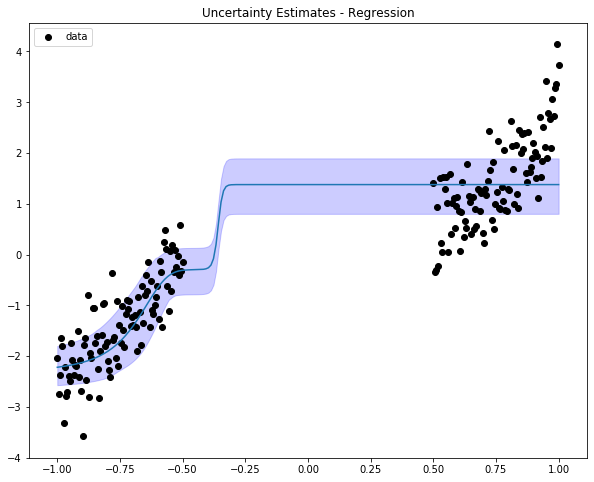

In [81]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
ax.plot(X_test,mean_ci)
ax.fill_between(X_test, up_ci, lower_ci, color='blue', alpha=0.2)
ax.scatter(X, y, color='black', label='data')
ax.legend(prop={'size':10})
ax.set_title('Uncertainty Estimates - Regression')

**Observation:** Clearly this time the SWAG model is not a good fit with a high MSE loss, and bad aleatoric uncertainty (the interval does not capture most of the training points), and the epistemic uncertainty in the middle is not very promising either. After repeating this experiment multiple times below, we saw that the model gives very different uncertainty estimation results both in the OOD region and the in-distribution region each time. This shows that the SWAG algorithm alongwith our selected model architecture is very sensitive to the weights initializations. With different initializations, the model would give very different predictive distributions.


Total number of parameters for the NN is: 46
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  1.0082006363341651
Total number of parameters for the NN is: 46
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  3.035684958354126
Total number of parameters for the NN is: 46
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.709772863412086


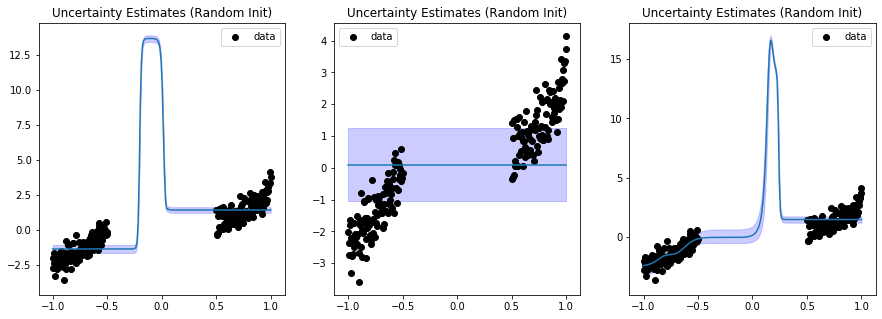

In [82]:
init_trials = 3
fig, ax = plt.subplots(1,init_trials, figsize=(15, 5))
for j in range(init_trials):
    random.seed(j)
    weights = list(reg.state_dict().items())
    weights_list = [initialize_weights(i) for i in weights]
    weights_dict = {}
    for i in weights_list:
        weights_dict[i[0]] = i[1]
    new_state = reg.state_dict().copy()
    new_state.update((i,v) for (i,v) in weights_dict.items())

    # initialize our SWAG model with the weights drawn from Normal(0,9)
    reg_new = Regression_linear()
    reg_new.load_state_dict(new_state)

    # initialize SWAG
    swag = SWAG(Regression_linear, K = 3, pretrained = True, NNModel = reg_new)

    # Compile swag
    objective = 'regression'
    lr = 1e-3
    swa_const_lr = 1
    momentum = 0.9
    optimizer = optim.SGD
    loss_fn = nn.MSELoss()
    swa_scheduler = LambdaLR

    swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)

    # Fit swag (a short training period to see that it learns the middle section correctly)
    first_mom, second_mom, D = swag.fit(train_gen,
                                        train_epoch=50,
                                        swag_epoch=20,
                                        log_freq=5,verbose=False)

    # Sample 1 set of posterior weights
    X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
    pred = swag.predict(X_test_tensor.float(),None, S=200, expanded=True)
    mean_ci,up_ci,lower_ci,_ = uncertainty_estimation(swag,X_test, pred, X_valid, y_valid, verbose=True)
    ax[j].plot(X_test,mean_ci)
    ax[j].fill_between(X_test, up_ci, lower_ci, color='blue', alpha=0.2)
    ax[j].scatter(X, y, color='black', label='data')
    ax[j].legend(prop={'size':10})
    ax[j].set_title('Uncertainty Estimates (Random Init)' )

### Extension: Ensemble on SWAG

Below we borrowed the idea from Fort et al.(2020) that randomly initialized parameters combined with a neural network architecture explore entirely different modes in function space, and could lead to better performances in a variety of deep learning tasks. Therefore, aside from uncertainty checks on the SWAG algorithm itself, we decided to do an Ensemble style of SWAG, similar to the MultiSWAG model (Wilson & Izmailov (2020)), where each model's weights are initialized from the same Gaussian distribution N(0,9).

In [83]:
def predict_init_normal(train_gen,X_test,mu=0,sigma=3):
    '''
    This function implements multiple initializations for the SWAG model, i.e. ensemble the SWAG model with different initializations
    from N(mu, sigma)
    '''
    weights = list(reg.state_dict().items())
    weights_list = [initialize_weights(i) for i in weights]
    weights_dict = {}
    for i in weights_list:
        weights_dict[i[0]] = i[1]
    new_state = reg.state_dict().copy()
    new_state.update((i,v) for (i,v) in weights_dict.items())
    # initialize our SWAG model with the weights drawn from Normal(0,25)
    reg_new = Regression_linear()
    reg_new.load_state_dict(new_state)
    # initialize SWAG
    swag = SWAG(Regression_linear, K = 3, pretrained = True, NNModel = reg_new)
    # Compile swag
    objective = 'regression'
    lr = 1e-3
    swa_const_lr = 1
    momentum = 0.9
    optimizer = optim.SGD
    loss_fn = nn.MSELoss()
    swa_scheduler = LambdaLR

    swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)
    # Fit swag (a short training period to see that it learns the middle section correctly)
    first_mom, second_mom, D = swag.fit(train_gen,
                                        train_epoch=20,
                                        swag_epoch=20,
                                        log_freq=5,verbose=False)
    # Sample 1 set of posterior weights
    X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
    pred = swag.predict(X_test_tensor.float(),None, S=1, expanded=True)
    print("Shape of the prediction:\n", pred.shape)
    return pred, swag


In [84]:
pred_list = []
swags = []
for i in range(100):
    pred_init, swag = predict_init_normal(train_gen,X_test)
    pred_list.append(pred_init[0])
    swags.append(swag)

Total number of parameters for the NN is: 46
Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 180.2424
[Epoch: 1, 	Iteration:    10] 	Training Loss: 103.9345
[Epoch: 1, 	Iteration:    15] 	Training Loss: 17.9961
[Epoch: 1, 	Iteration:    20] 	Training Loss: 9.8162
[Epoch: 1, 	Iteration:    25] 	Training Loss: 4.2352
[Epoch: 1, 	Iteration:    30] 	Training Loss: 5.9794
[Epoch: 1, 	Iteration:    35] 	Training Loss: 4.5372
[Epoch: 1, 	Iteration:    40] 	Training Loss: 5.7201
[Epoch: 1, 	Iteration:    45] 	Training Loss: 2.5837
[Epoch: 1, 	Iteration:    50] 	Training Loss: 0.9823
[Epoch: 1, 	Iteration:    55] 	Training Loss: 1.2172
[Epoch: 1, 	Iteration:    60] 	Training Loss: 1.3614
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.6042
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.7886
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.5643
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.9892
[Epoch: 1, 	Iteration:    85] 	Training Loss: 1.4937
[Epoch: 1, 	Iteration:

[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.7962
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.6994
[Epoch: 5, 	Iteration:   190] 	Training Loss: 1.6003
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.9527
[Epoch: 5, 	Iteration:   200] 	Training Loss: 1.0725
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.4853
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.8300
[Epoch: 6, 	Iteration:    15] 	Training Loss: 1.3494
[Epoch: 6, 	Iteration:    20] 	Training Loss: 1.1699
[Epoch: 6, 	Iteration:    25] 	Training Loss: 1.5796
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.9029
[Epoch: 6, 	Iteration:    35] 	Training Loss: 1.1564
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.6044
[Epoch: 6, 	Iteration:    45] 	Training Loss: 2.0753
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.4858
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.2075
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.2852
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.5598
[Epoch: 6, 	Iteration:    70] 	Training Loss: 

[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.0472
[Epoch: 10, 	Iteration:   155] 	Training Loss: 0.8202
[Epoch: 10, 	Iteration:   160] 	Training Loss: 0.8088
[Epoch: 10, 	Iteration:   165] 	Training Loss: 1.6668
[Epoch: 10, 	Iteration:   170] 	Training Loss: 1.6335
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.6731
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.7764
[Epoch: 10, 	Iteration:   185] 	Training Loss: 2.3660
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.7131
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.8910
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.3577
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.4424
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.6928
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.3965
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.4663
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.4251
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.3999
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.2959
[Epoch: 11, 	Iteration:    4

[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.7868
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.4976
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.1692
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.9306
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.4390
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.5565
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.6439
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.4944
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.5469
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.7748
[Epoch: 15, 	Iteration:   160] 	Training Loss: 1.6230
[Epoch: 15, 	Iteration:   165] 	Training Loss: 1.0447
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.8905
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.9028
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.9296
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.1725
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.2142
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.9964
[Epoch: 15, 	Iteration:   20

[Epoch: 20, 	Iteration:    45] 	Training Loss: 0.7378
[Epoch: 20, 	Iteration:    50] 	Training Loss: 0.7493
[Epoch: 20, 	Iteration:    55] 	Training Loss: 0.2578
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.8131
[Epoch: 20, 	Iteration:    65] 	Training Loss: 1.5458
[Epoch: 20, 	Iteration:    70] 	Training Loss: 0.1143
[Epoch: 20, 	Iteration:    75] 	Training Loss: 0.6482
[Epoch: 20, 	Iteration:    80] 	Training Loss: 1.6026
[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.6821
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.1808
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.7049
[Epoch: 20, 	Iteration:   100] 	Training Loss: 1.0966
[Epoch: 20, 	Iteration:   105] 	Training Loss: 1.9705
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.8454
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.1749
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.1316
[Epoch: 20, 	Iteration:   125] 	Training Loss: 1.3947
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.5370
[Epoch: 20, 	Iteration:   13

[Epoch: 4, 	Iteration:   135] 	Training Loss: 0.7614
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.5978
[Epoch: 4, 	Iteration:   145] 	Training Loss: 0.8138
[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.4582
[Epoch: 4, 	Iteration:   155] 	Training Loss: 1.0681
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.6730
[Epoch: 4, 	Iteration:   165] 	Training Loss: 0.5710
[Epoch: 4, 	Iteration:   170] 	Training Loss: 1.2937
[Epoch: 4, 	Iteration:   175] 	Training Loss: 0.3919
[Epoch: 4, 	Iteration:   180] 	Training Loss: 1.1063
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.2437
[Epoch: 4, 	Iteration:   190] 	Training Loss: 1.1555
[Epoch: 4, 	Iteration:   195] 	Training Loss: 1.0319
[Epoch: 4, 	Iteration:   200] 	Training Loss: 1.1397
[Epoch: 5, 	Iteration:     5] 	Training Loss: 0.4840
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.3811
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.6676
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.3775
[Epoch: 5, 	Iteration:    25] 	Training Loss: 

[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.9850
[Epoch: 9, 	Iteration:    95] 	Training Loss: 0.5003
[Epoch: 9, 	Iteration:   100] 	Training Loss: 0.9109
[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.3065
[Epoch: 9, 	Iteration:   110] 	Training Loss: 0.7507
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.4026
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.3110
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.9310
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.6673
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.6907
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.3607
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.3073
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.5029
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.7240
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.6122
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.1378
[Epoch: 9, 	Iteration:   170] 	Training Loss: 0.3269
[Epoch: 9, 	Iteration:   175] 	Training Loss: 0.9247
[Epoch: 9, 	Iteration:   180] 	Training Loss: 

[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.5582
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.3194
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.4570
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.2889
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.4820
[Epoch: 13, 	Iteration:   130] 	Training Loss: 1.0492
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.1120
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.6804
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.0535
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.1401
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.5117
[Epoch: 13, 	Iteration:   160] 	Training Loss: 1.4447
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.3473
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.7757
[Epoch: 13, 	Iteration:   175] 	Training Loss: 2.7687
[Epoch: 13, 	Iteration:   180] 	Training Loss: 1.0711
[Epoch: 13, 	Iteration:   185] 	Training Loss: 0.4022
[Epoch: 13, 	Iteration:   190] 	Training Loss: 0.7252
[Epoch: 13, 	Iteration:   19

[Epoch: 18, 	Iteration:    80] 	Training Loss: 1.5928
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.5102
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.1371
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.6175
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.4742
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.8923
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.2209
[Epoch: 18, 	Iteration:   115] 	Training Loss: 1.2582
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.6029
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.9066
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.5081
[Epoch: 18, 	Iteration:   135] 	Training Loss: 1.0095
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.5639
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.7944
[Epoch: 18, 	Iteration:   150] 	Training Loss: 1.1527
[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.7446
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.2931
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.2633
[Epoch: 18, 	Iteration:   17

[Epoch: 3, 	Iteration:    55] 	Training Loss: 1.2331
[Epoch: 3, 	Iteration:    60] 	Training Loss: 1.9787
[Epoch: 3, 	Iteration:    65] 	Training Loss: 0.4854
[Epoch: 3, 	Iteration:    70] 	Training Loss: 1.6070
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.1833
[Epoch: 3, 	Iteration:    80] 	Training Loss: 1.0422
[Epoch: 3, 	Iteration:    85] 	Training Loss: 0.7626
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.3794
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.5363
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.4070
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.3926
[Epoch: 3, 	Iteration:   110] 	Training Loss: 1.1416
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.4452
[Epoch: 3, 	Iteration:   120] 	Training Loss: 1.3915
[Epoch: 3, 	Iteration:   125] 	Training Loss: 1.7239
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.4798
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.2733
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.5511
[Epoch: 3, 	Iteration:   145] 	Training Loss: 

[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.4996
[Epoch: 7, 	Iteration:    55] 	Training Loss: 0.3189
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.9370
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.1080
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.4717
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.9998
[Epoch: 7, 	Iteration:    80] 	Training Loss: 1.3435
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.5118
[Epoch: 7, 	Iteration:    90] 	Training Loss: 0.5994
[Epoch: 7, 	Iteration:    95] 	Training Loss: 0.6748
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.9267
[Epoch: 7, 	Iteration:   105] 	Training Loss: 0.7728
[Epoch: 7, 	Iteration:   110] 	Training Loss: 0.6811
[Epoch: 7, 	Iteration:   115] 	Training Loss: 0.5982
[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.3737
[Epoch: 7, 	Iteration:   125] 	Training Loss: 0.2316
[Epoch: 7, 	Iteration:   130] 	Training Loss: 1.6238
[Epoch: 7, 	Iteration:   135] 	Training Loss: 0.5982
[Epoch: 7, 	Iteration:   140] 	Training Loss: 

[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.3280
[Epoch: 13, 	Iteration:    30] 	Training Loss: 1.8834
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.4097
[Epoch: 13, 	Iteration:    40] 	Training Loss: 1.5032
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.8090
[Epoch: 13, 	Iteration:    50] 	Training Loss: 1.3160
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.7555
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.4806
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.9596
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.1716
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.3254
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.2823
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.2791
[Epoch: 13, 	Iteration:    90] 	Training Loss: 1.0274
[Epoch: 13, 	Iteration:    95] 	Training Loss: 1.1742
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.5153
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.5683
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.4219
[Epoch: 13, 	Iteration:   11

[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.6193
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.7828
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.7148
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.5647
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.3178
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.9791
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.1606
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.7338
[Epoch: 17, 	Iteration:   180] 	Training Loss: 1.8896
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.6432
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.5008
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.7759
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3405
[Epoch: 18, 	Iteration:     5] 	Training Loss: 1.1112
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.6453
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.2616
[Epoch: 18, 	Iteration:    20] 	Training Loss: 1.4052
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.5446
[Epoch: 18, 	Iteration:    3

[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.6222
[Epoch: 2, 	Iteration:    70] 	Training Loss: 1.0866
[Epoch: 2, 	Iteration:    75] 	Training Loss: 1.1915
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.9428
[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.2222
[Epoch: 2, 	Iteration:    90] 	Training Loss: 1.2993
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.2901
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.5003
[Epoch: 2, 	Iteration:   105] 	Training Loss: 1.4819
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.7406
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.4401
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.2013
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.0715
[Epoch: 2, 	Iteration:   130] 	Training Loss: 1.3361
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.6595
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.9672
[Epoch: 2, 	Iteration:   145] 	Training Loss: 1.1096
[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.3475
[Epoch: 2, 	Iteration:   155] 	Training Loss: 

[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.3339
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.2722
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.3501
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.4276
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.7383
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.5989
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.8389
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.3343
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.5259
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.7013
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.1570
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.5019
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.4200
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.2507
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.5128
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.6259
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.9438
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.6173
[Epoch: 7, 	Iteration:    15] 	Training Loss: 

[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.1700
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.6882
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.5151
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.4622
[Epoch: 11, 	Iteration:    20] 	Training Loss: 1.4429
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.9077
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.4457
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.4216
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.3665
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.9361
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.4308
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.8566
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.7245
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.7991
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.2753
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.7241
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.2845
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.7884
[Epoch: 11, 	Iteration:    9

[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.2861
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.2712
[Epoch: 15, 	Iteration:    75] 	Training Loss: 1.0993
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.2752
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.2884
[Epoch: 15, 	Iteration:    90] 	Training Loss: 1.3894
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.6904
[Epoch: 15, 	Iteration:   100] 	Training Loss: 1.6323
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.6561
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.8610
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.7839
[Epoch: 15, 	Iteration:   120] 	Training Loss: 1.4001
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.6135
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.1890
[Epoch: 15, 	Iteration:   135] 	Training Loss: 1.2983
[Epoch: 15, 	Iteration:   140] 	Training Loss: 1.0316
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.1460
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.7482
[Epoch: 15, 	Iteration:   15

[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.2017
[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.3714
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.1829
[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.7929
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.3462
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.7085
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.5209
[Epoch: 19, 	Iteration:   135] 	Training Loss: 0.8712
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.3681
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.6368
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.1698
[Epoch: 19, 	Iteration:   155] 	Training Loss: 1.4197
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.5427
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.4823
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.2216
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.4121
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.3060
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.7705
[Epoch: 19, 	Iteration:   19

[Epoch: 4, 	Iteration:    15] 	Training Loss: 3.0719
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.6430
[Epoch: 4, 	Iteration:    25] 	Training Loss: 1.7955
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.5408
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.8833
[Epoch: 4, 	Iteration:    40] 	Training Loss: 1.5508
[Epoch: 4, 	Iteration:    45] 	Training Loss: 1.7475
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.8185
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.3816
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.4202
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.7418
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.9059
[Epoch: 4, 	Iteration:    75] 	Training Loss: 1.0347
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.4611
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.8548
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.3193
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.5782
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.7364
[Epoch: 4, 	Iteration:   105] 	Training Loss: 

[Epoch: 8, 	Iteration:   185] 	Training Loss: 1.7051
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.9195
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.7939
[Epoch: 8, 	Iteration:   200] 	Training Loss: 1.3977
[Epoch: 9, 	Iteration:     5] 	Training Loss: 1.1699
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.8863
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.7877
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.8926
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.2687
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.3162
[Epoch: 9, 	Iteration:    35] 	Training Loss: 0.2447
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.4954
[Epoch: 9, 	Iteration:    45] 	Training Loss: 1.0069
[Epoch: 9, 	Iteration:    50] 	Training Loss: 0.7336
[Epoch: 9, 	Iteration:    55] 	Training Loss: 1.0110
[Epoch: 9, 	Iteration:    60] 	Training Loss: 1.0297
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.8309
[Epoch: 9, 	Iteration:    70] 	Training Loss: 1.9167
[Epoch: 9, 	Iteration:    75] 	Training Loss: 

[Epoch: 13, 	Iteration:   185] 	Training Loss: 1.0448
[Epoch: 13, 	Iteration:   190] 	Training Loss: 0.2007
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.9203
[Epoch: 13, 	Iteration:   200] 	Training Loss: 1.6459
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.6509
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.5047
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.5242
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.3442
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.1326
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.1787
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.8184
[Epoch: 14, 	Iteration:    40] 	Training Loss: 1.1216
[Epoch: 14, 	Iteration:    45] 	Training Loss: 1.0421
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.9644
[Epoch: 14, 	Iteration:    55] 	Training Loss: 2.2799
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.9268
[Epoch: 14, 	Iteration:    65] 	Training Loss: 1.3097
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.2983
[Epoch: 14, 	Iteration:    7

[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.3056
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.3190
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.1215
[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.5966
[Epoch: 19, 	Iteration:    15] 	Training Loss: 0.1432
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.1765
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.1327
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.8161
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.2844
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.4938
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.0769
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.3788
[Epoch: 19, 	Iteration:    55] 	Training Loss: 1.2171
[Epoch: 19, 	Iteration:    60] 	Training Loss: 2.0417
[Epoch: 19, 	Iteration:    65] 	Training Loss: 1.1089
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.8724
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.3957
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.9793
[Epoch: 19, 	Iteration:    8

[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.4660
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.6003
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.6171
[Epoch: 3, 	Iteration:   170] 	Training Loss: 1.2471
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.4116
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.1106
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.8020
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.5478
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.8561
[Epoch: 3, 	Iteration:   200] 	Training Loss: 1.0081
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.0666
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.4204
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.1894
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.3985
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.4923
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.8334
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.4105
[Epoch: 4, 	Iteration:    40] 	Training Loss: 1.7225
[Epoch: 4, 	Iteration:    45] 	Training Loss: 

[Epoch: 8, 	Iteration:   100] 	Training Loss: 1.1713
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.3718
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.7088
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.0918
[Epoch: 8, 	Iteration:   120] 	Training Loss: 0.6024
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.7042
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.2110
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.3821
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.4782
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.2090
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.6985
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.2699
[Epoch: 8, 	Iteration:   160] 	Training Loss: 1.0170
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.8210
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.5066
[Epoch: 8, 	Iteration:   175] 	Training Loss: 1.3928
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.9322
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.7001
[Epoch: 8, 	Iteration:   190] 	Training Loss: 

[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.1904
[Epoch: 13, 	Iteration:    45] 	Training Loss: 1.4882
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.1327
[Epoch: 13, 	Iteration:    55] 	Training Loss: 1.1952
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.4712
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.1215
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.5594
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.7265
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.9822
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.5447
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.7725
[Epoch: 13, 	Iteration:    95] 	Training Loss: 1.0992
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.4178
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.5028
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.8112
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.2628
[Epoch: 13, 	Iteration:   120] 	Training Loss: 2.1113
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.2349
[Epoch: 13, 	Iteration:   13

[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.7269
[Epoch: 17, 	Iteration:   130] 	Training Loss: 1.1841
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.4339
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.4562
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.4075
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.5783
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.5755
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.3998
[Epoch: 17, 	Iteration:   165] 	Training Loss: 1.4062
[Epoch: 17, 	Iteration:   170] 	Training Loss: 1.4345
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.4202
[Epoch: 17, 	Iteration:   180] 	Training Loss: 1.2793
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.6949
[Epoch: 17, 	Iteration:   190] 	Training Loss: 1.0423
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.2194
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3490
[Epoch: 18, 	Iteration:     5] 	Training Loss: 1.2215
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.3666
[Epoch: 18, 	Iteration:    1

[Epoch: 2, 	Iteration:    25] 	Training Loss: 1.1026
[Epoch: 2, 	Iteration:    30] 	Training Loss: 3.0203
[Epoch: 2, 	Iteration:    35] 	Training Loss: 2.6330
[Epoch: 2, 	Iteration:    40] 	Training Loss: 3.0845
[Epoch: 2, 	Iteration:    45] 	Training Loss: 2.7202
[Epoch: 2, 	Iteration:    50] 	Training Loss: 4.4370
[Epoch: 2, 	Iteration:    55] 	Training Loss: 3.5327
[Epoch: 2, 	Iteration:    60] 	Training Loss: 1.5589
[Epoch: 2, 	Iteration:    65] 	Training Loss: 3.8311
[Epoch: 2, 	Iteration:    70] 	Training Loss: 6.1286
[Epoch: 2, 	Iteration:    75] 	Training Loss: 3.7826
[Epoch: 2, 	Iteration:    80] 	Training Loss: 2.1554
[Epoch: 2, 	Iteration:    85] 	Training Loss: 2.9176
[Epoch: 2, 	Iteration:    90] 	Training Loss: 3.1107
[Epoch: 2, 	Iteration:    95] 	Training Loss: 1.4653
[Epoch: 2, 	Iteration:   100] 	Training Loss: 3.3868
[Epoch: 2, 	Iteration:   105] 	Training Loss: 1.6230
[Epoch: 2, 	Iteration:   110] 	Training Loss: 1.7687
[Epoch: 2, 	Iteration:   115] 	Training Loss: 

[Epoch: 6, 	Iteration:   160] 	Training Loss: 2.2762
[Epoch: 6, 	Iteration:   165] 	Training Loss: 1.9501
[Epoch: 6, 	Iteration:   170] 	Training Loss: 2.8105
[Epoch: 6, 	Iteration:   175] 	Training Loss: 4.9129
[Epoch: 6, 	Iteration:   180] 	Training Loss: 1.1682
[Epoch: 6, 	Iteration:   185] 	Training Loss: 2.5595
[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.8804
[Epoch: 6, 	Iteration:   195] 	Training Loss: 2.9867
[Epoch: 6, 	Iteration:   200] 	Training Loss: 2.4544
[Epoch: 7, 	Iteration:     5] 	Training Loss: 3.2617
[Epoch: 7, 	Iteration:    10] 	Training Loss: 4.0395
[Epoch: 7, 	Iteration:    15] 	Training Loss: 1.7009
[Epoch: 7, 	Iteration:    20] 	Training Loss: 1.6958
[Epoch: 7, 	Iteration:    25] 	Training Loss: 2.0095
[Epoch: 7, 	Iteration:    30] 	Training Loss: 2.7713
[Epoch: 7, 	Iteration:    35] 	Training Loss: 2.5199
[Epoch: 7, 	Iteration:    40] 	Training Loss: 3.6576
[Epoch: 7, 	Iteration:    45] 	Training Loss: 2.7966
[Epoch: 7, 	Iteration:    50] 	Training Loss: 

[Epoch: 11, 	Iteration:   115] 	Training Loss: 2.2130
[Epoch: 11, 	Iteration:   120] 	Training Loss: 3.5291
[Epoch: 11, 	Iteration:   125] 	Training Loss: 5.6252
[Epoch: 11, 	Iteration:   130] 	Training Loss: 2.6444
[Epoch: 11, 	Iteration:   135] 	Training Loss: 2.9771
[Epoch: 11, 	Iteration:   140] 	Training Loss: 1.5733
[Epoch: 11, 	Iteration:   145] 	Training Loss: 2.3825
[Epoch: 11, 	Iteration:   150] 	Training Loss: 5.2874
[Epoch: 11, 	Iteration:   155] 	Training Loss: 1.6744
[Epoch: 11, 	Iteration:   160] 	Training Loss: 2.6358
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.5818
[Epoch: 11, 	Iteration:   170] 	Training Loss: 2.4915
[Epoch: 11, 	Iteration:   175] 	Training Loss: 1.1991
[Epoch: 11, 	Iteration:   180] 	Training Loss: 4.1648
[Epoch: 11, 	Iteration:   185] 	Training Loss: 3.7399
[Epoch: 11, 	Iteration:   190] 	Training Loss: 2.7296
[Epoch: 11, 	Iteration:   195] 	Training Loss: 2.3920
[Epoch: 11, 	Iteration:   200] 	Training Loss: 5.7037
[Epoch: 12, 	Iteration:     

[Epoch: 16, 	Iteration:    85] 	Training Loss: 1.2705
[Epoch: 16, 	Iteration:    90] 	Training Loss: 2.5979
[Epoch: 16, 	Iteration:    95] 	Training Loss: 4.2761
[Epoch: 16, 	Iteration:   100] 	Training Loss: 3.1425
[Epoch: 16, 	Iteration:   105] 	Training Loss: 2.1902
[Epoch: 16, 	Iteration:   110] 	Training Loss: 1.8944
[Epoch: 16, 	Iteration:   115] 	Training Loss: 2.6615
[Epoch: 16, 	Iteration:   120] 	Training Loss: 3.3533
[Epoch: 16, 	Iteration:   125] 	Training Loss: 2.5374
[Epoch: 16, 	Iteration:   130] 	Training Loss: 0.8844
[Epoch: 16, 	Iteration:   135] 	Training Loss: 4.2315
[Epoch: 16, 	Iteration:   140] 	Training Loss: 1.0926
[Epoch: 16, 	Iteration:   145] 	Training Loss: 4.9813
[Epoch: 16, 	Iteration:   150] 	Training Loss: 5.2757
[Epoch: 16, 	Iteration:   155] 	Training Loss: 1.3396
[Epoch: 16, 	Iteration:   160] 	Training Loss: 1.8890
[Epoch: 16, 	Iteration:   165] 	Training Loss: 3.3065
[Epoch: 16, 	Iteration:   170] 	Training Loss: 3.9453
[Epoch: 16, 	Iteration:   17

[Epoch: 1, 	Iteration:   115] 	Training Loss: 3.9933
[Epoch: 1, 	Iteration:   120] 	Training Loss: 2.7773
[Epoch: 1, 	Iteration:   125] 	Training Loss: 1.4580
[Epoch: 1, 	Iteration:   130] 	Training Loss: 7.6687
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.7472
[Epoch: 1, 	Iteration:   140] 	Training Loss: 1.6474
[Epoch: 1, 	Iteration:   145] 	Training Loss: 3.6831
[Epoch: 1, 	Iteration:   150] 	Training Loss: 2.6099
[Epoch: 1, 	Iteration:   155] 	Training Loss: 2.3365
[Epoch: 1, 	Iteration:   160] 	Training Loss: 4.7953
[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.2109
[Epoch: 1, 	Iteration:   170] 	Training Loss: 1.0088
[Epoch: 1, 	Iteration:   175] 	Training Loss: 4.3317
[Epoch: 1, 	Iteration:   180] 	Training Loss: 3.8313
[Epoch: 1, 	Iteration:   185] 	Training Loss: 2.0699
[Epoch: 1, 	Iteration:   190] 	Training Loss: 4.2995
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.7178
[Epoch: 1, 	Iteration:   200] 	Training Loss: 1.0147
[Epoch: 2, 	Iteration:     5] 	Training Loss: 

[Epoch: 6, 	Iteration:    45] 	Training Loss: 5.2849
[Epoch: 6, 	Iteration:    50] 	Training Loss: 2.9576
[Epoch: 6, 	Iteration:    55] 	Training Loss: 2.6396
[Epoch: 6, 	Iteration:    60] 	Training Loss: 5.4670
[Epoch: 6, 	Iteration:    65] 	Training Loss: 3.7735
[Epoch: 6, 	Iteration:    70] 	Training Loss: 1.0113
[Epoch: 6, 	Iteration:    75] 	Training Loss: 1.4568
[Epoch: 6, 	Iteration:    80] 	Training Loss: 2.5048
[Epoch: 6, 	Iteration:    85] 	Training Loss: 2.8667
[Epoch: 6, 	Iteration:    90] 	Training Loss: 2.8695
[Epoch: 6, 	Iteration:    95] 	Training Loss: 2.6752
[Epoch: 6, 	Iteration:   100] 	Training Loss: 3.2095
[Epoch: 6, 	Iteration:   105] 	Training Loss: 7.5545
[Epoch: 6, 	Iteration:   110] 	Training Loss: 2.0322
[Epoch: 6, 	Iteration:   115] 	Training Loss: 1.9369
[Epoch: 6, 	Iteration:   120] 	Training Loss: 3.2946
[Epoch: 6, 	Iteration:   125] 	Training Loss: 2.5042
[Epoch: 6, 	Iteration:   130] 	Training Loss: 4.7433
[Epoch: 6, 	Iteration:   135] 	Training Loss: 

[Epoch: 10, 	Iteration:   140] 	Training Loss: 3.2801
[Epoch: 10, 	Iteration:   145] 	Training Loss: 2.9587
[Epoch: 10, 	Iteration:   150] 	Training Loss: 3.3984
[Epoch: 10, 	Iteration:   155] 	Training Loss: 4.1650
[Epoch: 10, 	Iteration:   160] 	Training Loss: 4.5035
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.5940
[Epoch: 10, 	Iteration:   170] 	Training Loss: 3.8063
[Epoch: 10, 	Iteration:   175] 	Training Loss: 1.3275
[Epoch: 10, 	Iteration:   180] 	Training Loss: 4.7957
[Epoch: 10, 	Iteration:   185] 	Training Loss: 1.9701
[Epoch: 10, 	Iteration:   190] 	Training Loss: 3.6619
[Epoch: 10, 	Iteration:   195] 	Training Loss: 6.6635
[Epoch: 10, 	Iteration:   200] 	Training Loss: 1.8437
[Epoch: 11, 	Iteration:     5] 	Training Loss: 1.9975
[Epoch: 11, 	Iteration:    10] 	Training Loss: 2.5009
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.6248
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.9813
[Epoch: 11, 	Iteration:    25] 	Training Loss: 2.4082
[Epoch: 11, 	Iteration:    3

[Epoch: 15, 	Iteration:    90] 	Training Loss: 1.9437
[Epoch: 15, 	Iteration:    95] 	Training Loss: 1.5999
[Epoch: 15, 	Iteration:   100] 	Training Loss: 2.3862
[Epoch: 15, 	Iteration:   105] 	Training Loss: 3.4014
[Epoch: 15, 	Iteration:   110] 	Training Loss: 1.2863
[Epoch: 15, 	Iteration:   115] 	Training Loss: 2.6462
[Epoch: 15, 	Iteration:   120] 	Training Loss: 3.9156
[Epoch: 15, 	Iteration:   125] 	Training Loss: 3.9108
[Epoch: 15, 	Iteration:   130] 	Training Loss: 4.3609
[Epoch: 15, 	Iteration:   135] 	Training Loss: 3.7275
[Epoch: 15, 	Iteration:   140] 	Training Loss: 3.7090
[Epoch: 15, 	Iteration:   145] 	Training Loss: 1.3403
[Epoch: 15, 	Iteration:   150] 	Training Loss: 2.2727
[Epoch: 15, 	Iteration:   155] 	Training Loss: 3.4594
[Epoch: 15, 	Iteration:   160] 	Training Loss: 1.8920
[Epoch: 15, 	Iteration:   165] 	Training Loss: 1.4319
[Epoch: 15, 	Iteration:   170] 	Training Loss: 1.5575
[Epoch: 15, 	Iteration:   175] 	Training Loss: 1.1174
[Epoch: 15, 	Iteration:   18

[Epoch: 20, 	Iteration:    25] 	Training Loss: 1.0470
[Epoch: 20, 	Iteration:    30] 	Training Loss: 2.2608
[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.3947
[Epoch: 20, 	Iteration:    40] 	Training Loss: 1.3742
[Epoch: 20, 	Iteration:    45] 	Training Loss: 4.7104
[Epoch: 20, 	Iteration:    50] 	Training Loss: 2.2988
[Epoch: 20, 	Iteration:    55] 	Training Loss: 3.1916
[Epoch: 20, 	Iteration:    60] 	Training Loss: 3.2147
[Epoch: 20, 	Iteration:    65] 	Training Loss: 6.5423
[Epoch: 20, 	Iteration:    70] 	Training Loss: 4.1330
[Epoch: 20, 	Iteration:    75] 	Training Loss: 1.0011
[Epoch: 20, 	Iteration:    80] 	Training Loss: 2.2536
[Epoch: 20, 	Iteration:    85] 	Training Loss: 2.6369
[Epoch: 20, 	Iteration:    90] 	Training Loss: 3.2146
[Epoch: 20, 	Iteration:    95] 	Training Loss: 3.3963
[Epoch: 20, 	Iteration:   100] 	Training Loss: 2.9316
[Epoch: 20, 	Iteration:   105] 	Training Loss: 2.2257
[Epoch: 20, 	Iteration:   110] 	Training Loss: 2.9003
[Epoch: 20, 	Iteration:   11

[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.5102
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.7010
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.3541
[Epoch: 4, 	Iteration:   165] 	Training Loss: 1.0449
[Epoch: 4, 	Iteration:   170] 	Training Loss: 1.1264
[Epoch: 4, 	Iteration:   175] 	Training Loss: 1.1845
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.8024
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.6637
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.6002
[Epoch: 4, 	Iteration:   195] 	Training Loss: 1.0651
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.4352
[Epoch: 5, 	Iteration:     5] 	Training Loss: 0.3707
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.9829
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.5828
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.5993
[Epoch: 5, 	Iteration:    25] 	Training Loss: 0.2671
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.5429
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.6642
[Epoch: 5, 	Iteration:    40] 	Training Loss: 

[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.2458
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.4680
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.4854
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.3125
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.2229
[Epoch: 9, 	Iteration:   145] 	Training Loss: 1.4624
[Epoch: 9, 	Iteration:   150] 	Training Loss: 1.3610
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.2549
[Epoch: 9, 	Iteration:   160] 	Training Loss: 3.0479
[Epoch: 9, 	Iteration:   165] 	Training Loss: 1.1817
[Epoch: 9, 	Iteration:   170] 	Training Loss: 0.9599
[Epoch: 9, 	Iteration:   175] 	Training Loss: 0.7333
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.5072
[Epoch: 9, 	Iteration:   185] 	Training Loss: 0.3112
[Epoch: 9, 	Iteration:   190] 	Training Loss: 0.5065
[Epoch: 9, 	Iteration:   195] 	Training Loss: 1.4278
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.5450
[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.6441
[Epoch: 10, 	Iteration:    10] 	Training Loss

[Epoch: 14, 	Iteration:    95] 	Training Loss: 0.4201
[Epoch: 14, 	Iteration:   100] 	Training Loss: 0.4372
[Epoch: 14, 	Iteration:   105] 	Training Loss: 0.2529
[Epoch: 14, 	Iteration:   110] 	Training Loss: 0.7559
[Epoch: 14, 	Iteration:   115] 	Training Loss: 0.5558
[Epoch: 14, 	Iteration:   120] 	Training Loss: 0.1799
[Epoch: 14, 	Iteration:   125] 	Training Loss: 1.3022
[Epoch: 14, 	Iteration:   130] 	Training Loss: 1.5962
[Epoch: 14, 	Iteration:   135] 	Training Loss: 1.1602
[Epoch: 14, 	Iteration:   140] 	Training Loss: 0.2647
[Epoch: 14, 	Iteration:   145] 	Training Loss: 0.4007
[Epoch: 14, 	Iteration:   150] 	Training Loss: 0.4787
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.4245
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.5634
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.4856
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.0508
[Epoch: 14, 	Iteration:   175] 	Training Loss: 0.5596
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.5343
[Epoch: 14, 	Iteration:   18

[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.8681
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.1782
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.2116
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.7378
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.4017
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.6853
[Epoch: 19, 	Iteration:    90] 	Training Loss: 1.6088
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.5434
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.1956
[Epoch: 19, 	Iteration:   105] 	Training Loss: 1.0300
[Epoch: 19, 	Iteration:   110] 	Training Loss: 1.1954
[Epoch: 19, 	Iteration:   115] 	Training Loss: 1.9423
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.5130
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.3487
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.7709
[Epoch: 19, 	Iteration:   135] 	Training Loss: 0.2531
[Epoch: 19, 	Iteration:   140] 	Training Loss: 1.1766
[Epoch: 19, 	Iteration:   145] 	Training Loss: 1.1727
[Epoch: 19, 	Iteration:   15

[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.5181
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.3757
[Epoch: 4, 	Iteration:    50] 	Training Loss: 1.3040
[Epoch: 4, 	Iteration:    55] 	Training Loss: 1.5182
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.4764
[Epoch: 4, 	Iteration:    65] 	Training Loss: 1.0797
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.3043
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.6691
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.4092
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.3310
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.0569
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.6247
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.7015
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.8097
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.0469
[Epoch: 4, 	Iteration:   115] 	Training Loss: 1.7525
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.5212
[Epoch: 4, 	Iteration:   125] 	Training Loss: 0.4013
[Epoch: 4, 	Iteration:   130] 	Training Loss: 

[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.6034
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.3425
[Epoch: 8, 	Iteration:   140] 	Training Loss: 1.4131
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.8462
[Epoch: 8, 	Iteration:   150] 	Training Loss: 3.1015
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.5712
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.0874
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.1366
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.6283
[Epoch: 8, 	Iteration:   175] 	Training Loss: 1.1606
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.9575
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.8189
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.2253
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.5082
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.9885
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.4149
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.6427
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.5369
[Epoch: 9, 	Iteration:    20] 	Training Loss: 

[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.3983
[Epoch: 13, 	Iteration:   100] 	Training Loss: 1.7889
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.5309
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.6026
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.5210
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.8379
[Epoch: 13, 	Iteration:   125] 	Training Loss: 1.8276
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.8036
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.5270
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.9087
[Epoch: 13, 	Iteration:   145] 	Training Loss: 1.2416
[Epoch: 13, 	Iteration:   150] 	Training Loss: 1.1470
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.6167
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.3734
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.2382
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.5295
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.1033
[Epoch: 13, 	Iteration:   180] 	Training Loss: 1.1007
[Epoch: 13, 	Iteration:   18

[Epoch: 18, 	Iteration:    35] 	Training Loss: 1.6466
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.3250
[Epoch: 18, 	Iteration:    45] 	Training Loss: 1.3731
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.7073
[Epoch: 18, 	Iteration:    55] 	Training Loss: 1.1707
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.8122
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.5187
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.3629
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.4556
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.9766
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.3051
[Epoch: 18, 	Iteration:    90] 	Training Loss: 1.0353
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.5535
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.7381
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.7689
[Epoch: 18, 	Iteration:   110] 	Training Loss: 1.4978
[Epoch: 18, 	Iteration:   115] 	Training Loss: 1.3382
[Epoch: 18, 	Iteration:   120] 	Training Loss: 1.0228
[Epoch: 18, 	Iteration:   12

[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.6125
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.9337
[Epoch: 2, 	Iteration:    95] 	Training Loss: 1.1767
[Epoch: 2, 	Iteration:   100] 	Training Loss: 1.5058
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.5981
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.6833
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.7484
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.4321
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.8732
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.4127
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.6333
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.7542
[Epoch: 2, 	Iteration:   145] 	Training Loss: 2.3246
[Epoch: 2, 	Iteration:   150] 	Training Loss: 1.5216
[Epoch: 2, 	Iteration:   155] 	Training Loss: 0.6630
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.5706
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.6625
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.4744
[Epoch: 2, 	Iteration:   175] 	Training Loss: 

[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.0859
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.4846
[Epoch: 7, 	Iteration:    55] 	Training Loss: 0.5509
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.7564
[Epoch: 7, 	Iteration:    65] 	Training Loss: 1.3955
[Epoch: 7, 	Iteration:    70] 	Training Loss: 1.1273
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.6225
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.2098
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.7410
[Epoch: 7, 	Iteration:    90] 	Training Loss: 1.2469
[Epoch: 7, 	Iteration:    95] 	Training Loss: 1.6318
[Epoch: 7, 	Iteration:   100] 	Training Loss: 1.1987
[Epoch: 7, 	Iteration:   105] 	Training Loss: 0.4778
[Epoch: 7, 	Iteration:   110] 	Training Loss: 0.6828
[Epoch: 7, 	Iteration:   115] 	Training Loss: 0.7322
[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.9327
[Epoch: 7, 	Iteration:   125] 	Training Loss: 0.7510
[Epoch: 7, 	Iteration:   130] 	Training Loss: 1.8993
[Epoch: 7, 	Iteration:   135] 	Training Loss: 

[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.6252
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.4402
[Epoch: 11, 	Iteration:   170] 	Training Loss: 1.1336
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.7112
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.4223
[Epoch: 11, 	Iteration:   185] 	Training Loss: 1.0172
[Epoch: 11, 	Iteration:   190] 	Training Loss: 1.2866
[Epoch: 11, 	Iteration:   195] 	Training Loss: 1.4196
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.9755
[Epoch: 12, 	Iteration:     5] 	Training Loss: 1.6343
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.7604
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.6966
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.7864
[Epoch: 12, 	Iteration:    25] 	Training Loss: 1.9339
[Epoch: 12, 	Iteration:    30] 	Training Loss: 1.5237
[Epoch: 12, 	Iteration:    35] 	Training Loss: 1.6065
[Epoch: 12, 	Iteration:    40] 	Training Loss: 1.1939
[Epoch: 12, 	Iteration:    45] 	Training Loss: 1.1744
[Epoch: 12, 	Iteration:    5

[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.9813
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.2888
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.9863
[Epoch: 16, 	Iteration:    75] 	Training Loss: 1.0587
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.4610
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.2767
[Epoch: 16, 	Iteration:    90] 	Training Loss: 1.6745
[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.3241
[Epoch: 16, 	Iteration:   100] 	Training Loss: 1.5828
[Epoch: 16, 	Iteration:   105] 	Training Loss: 1.6035
[Epoch: 16, 	Iteration:   110] 	Training Loss: 0.7296
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.8688
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.6809
[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.9737
[Epoch: 16, 	Iteration:   130] 	Training Loss: 2.4928
[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.8060
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.5839
[Epoch: 16, 	Iteration:   145] 	Training Loss: 0.5822
[Epoch: 16, 	Iteration:   15

[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.7238
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.1866
[Epoch: 1, 	Iteration:    45] 	Training Loss: 1.3051
[Epoch: 1, 	Iteration:    50] 	Training Loss: 0.4129
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.8224
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.6684
[Epoch: 1, 	Iteration:    65] 	Training Loss: 1.0995
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.4321
[Epoch: 1, 	Iteration:    75] 	Training Loss: 1.0167
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.1816
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.8655
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.5551
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.5245
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.5148
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.3211
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.8590
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.5569
[Epoch: 1, 	Iteration:   120] 	Training Loss: 1.4843
[Epoch: 1, 	Iteration:   125] 	Training Loss: 

[Epoch: 5, 	Iteration:   130] 	Training Loss: 1.2957
[Epoch: 5, 	Iteration:   135] 	Training Loss: 1.1483
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.7712
[Epoch: 5, 	Iteration:   145] 	Training Loss: 1.0125
[Epoch: 5, 	Iteration:   150] 	Training Loss: 1.7295
[Epoch: 5, 	Iteration:   155] 	Training Loss: 1.6721
[Epoch: 5, 	Iteration:   160] 	Training Loss: 1.1218
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.9806
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.6296
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.7125
[Epoch: 5, 	Iteration:   180] 	Training Loss: 1.7130
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.4640
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.3220
[Epoch: 5, 	Iteration:   195] 	Training Loss: 1.1227
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.1884
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.7380
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.7427
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.3024
[Epoch: 6, 	Iteration:    20] 	Training Loss: 

[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.8711
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.2132
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.3432
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.9486
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.5311
[Epoch: 10, 	Iteration:    95] 	Training Loss: 1.3190
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.3371
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.6413
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.6252
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.5656
[Epoch: 10, 	Iteration:   120] 	Training Loss: 1.0489
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.9367
[Epoch: 10, 	Iteration:   130] 	Training Loss: 1.3234
[Epoch: 10, 	Iteration:   135] 	Training Loss: 1.3470
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.4829
[Epoch: 10, 	Iteration:   145] 	Training Loss: 1.2369
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.6297
[Epoch: 10, 	Iteration:   155] 	Training Loss: 0.2566
[Epoch: 10, 	Iteration:   16

[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.8002
[Epoch: 14, 	Iteration:   175] 	Training Loss: 0.6074
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.5060
[Epoch: 14, 	Iteration:   185] 	Training Loss: 1.9366
[Epoch: 14, 	Iteration:   190] 	Training Loss: 1.3645
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.8792
[Epoch: 14, 	Iteration:   200] 	Training Loss: 1.1328
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.2733
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.6000
[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.4846
[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.2358
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.4813
[Epoch: 15, 	Iteration:    30] 	Training Loss: 1.1079
[Epoch: 15, 	Iteration:    35] 	Training Loss: 1.3166
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.3093
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.7204
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.5220
[Epoch: 15, 	Iteration:    55] 	Training Loss: 1.7679
[Epoch: 15, 	Iteration:    6

[Epoch: 19, 	Iteration:   110] 	Training Loss: 2.4416
[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.9596
[Epoch: 19, 	Iteration:   120] 	Training Loss: 1.0667
[Epoch: 19, 	Iteration:   125] 	Training Loss: 1.0437
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.2978
[Epoch: 19, 	Iteration:   135] 	Training Loss: 0.8048
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.6782
[Epoch: 19, 	Iteration:   145] 	Training Loss: 1.1239
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.3503
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.6818
[Epoch: 19, 	Iteration:   160] 	Training Loss: 1.6637
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.4435
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.2797
[Epoch: 19, 	Iteration:   175] 	Training Loss: 1.0022
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.8532
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.7542
[Epoch: 19, 	Iteration:   190] 	Training Loss: 2.3115
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.4577
[Epoch: 19, 	Iteration:   20

[Epoch: 4, 	Iteration:    60] 	Training Loss: 4.8753
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.5556
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.9912
[Epoch: 4, 	Iteration:    75] 	Training Loss: 3.0113
[Epoch: 4, 	Iteration:    80] 	Training Loss: 2.7660
[Epoch: 4, 	Iteration:    85] 	Training Loss: 2.1407
[Epoch: 4, 	Iteration:    90] 	Training Loss: 3.3461
[Epoch: 4, 	Iteration:    95] 	Training Loss: 2.6475
[Epoch: 4, 	Iteration:   100] 	Training Loss: 1.6406
[Epoch: 4, 	Iteration:   105] 	Training Loss: 5.3603
[Epoch: 4, 	Iteration:   110] 	Training Loss: 2.5164
[Epoch: 4, 	Iteration:   115] 	Training Loss: 1.9573
[Epoch: 4, 	Iteration:   120] 	Training Loss: 4.2014
[Epoch: 4, 	Iteration:   125] 	Training Loss: 2.2647
[Epoch: 4, 	Iteration:   130] 	Training Loss: 3.7763
[Epoch: 4, 	Iteration:   135] 	Training Loss: 2.8498
[Epoch: 4, 	Iteration:   140] 	Training Loss: 1.6159
[Epoch: 4, 	Iteration:   145] 	Training Loss: 1.7764
[Epoch: 4, 	Iteration:   150] 	Training Loss: 

[Epoch: 8, 	Iteration:   180] 	Training Loss: 5.5949
[Epoch: 8, 	Iteration:   185] 	Training Loss: 2.0822
[Epoch: 8, 	Iteration:   190] 	Training Loss: 2.5814
[Epoch: 8, 	Iteration:   195] 	Training Loss: 1.3306
[Epoch: 8, 	Iteration:   200] 	Training Loss: 2.5716
[Epoch: 9, 	Iteration:     5] 	Training Loss: 2.4912
[Epoch: 9, 	Iteration:    10] 	Training Loss: 1.5897
[Epoch: 9, 	Iteration:    15] 	Training Loss: 3.5297
[Epoch: 9, 	Iteration:    20] 	Training Loss: 7.0781
[Epoch: 9, 	Iteration:    25] 	Training Loss: 3.9451
[Epoch: 9, 	Iteration:    30] 	Training Loss: 6.4563
[Epoch: 9, 	Iteration:    35] 	Training Loss: 2.3029
[Epoch: 9, 	Iteration:    40] 	Training Loss: 1.1316
[Epoch: 9, 	Iteration:    45] 	Training Loss: 4.8197
[Epoch: 9, 	Iteration:    50] 	Training Loss: 0.5536
[Epoch: 9, 	Iteration:    55] 	Training Loss: 2.4093
[Epoch: 9, 	Iteration:    60] 	Training Loss: 2.5451
[Epoch: 9, 	Iteration:    65] 	Training Loss: 4.3735
[Epoch: 9, 	Iteration:    70] 	Training Loss: 

[Epoch: 13, 	Iteration:   115] 	Training Loss: 3.6173
[Epoch: 13, 	Iteration:   120] 	Training Loss: 4.5275
[Epoch: 13, 	Iteration:   125] 	Training Loss: 3.7389
[Epoch: 13, 	Iteration:   130] 	Training Loss: 1.3739
[Epoch: 13, 	Iteration:   135] 	Training Loss: 4.1502
[Epoch: 13, 	Iteration:   140] 	Training Loss: 3.7404
[Epoch: 13, 	Iteration:   145] 	Training Loss: 5.5160
[Epoch: 13, 	Iteration:   150] 	Training Loss: 1.8381
[Epoch: 13, 	Iteration:   155] 	Training Loss: 3.0057
[Epoch: 13, 	Iteration:   160] 	Training Loss: 3.2293
[Epoch: 13, 	Iteration:   165] 	Training Loss: 2.1486
[Epoch: 13, 	Iteration:   170] 	Training Loss: 7.9880
[Epoch: 13, 	Iteration:   175] 	Training Loss: 1.2680
[Epoch: 13, 	Iteration:   180] 	Training Loss: 3.0832
[Epoch: 13, 	Iteration:   185] 	Training Loss: 1.5875
[Epoch: 13, 	Iteration:   190] 	Training Loss: 2.3140
[Epoch: 13, 	Iteration:   195] 	Training Loss: 3.5129
[Epoch: 13, 	Iteration:   200] 	Training Loss: 1.2465
[Epoch: 14, 	Iteration:     

[Epoch: 18, 	Iteration:    40] 	Training Loss: 3.0356
[Epoch: 18, 	Iteration:    45] 	Training Loss: 5.4852
[Epoch: 18, 	Iteration:    50] 	Training Loss: 1.3894
[Epoch: 18, 	Iteration:    55] 	Training Loss: 1.7779
[Epoch: 18, 	Iteration:    60] 	Training Loss: 3.9604
[Epoch: 18, 	Iteration:    65] 	Training Loss: 3.0884
[Epoch: 18, 	Iteration:    70] 	Training Loss: 2.7560
[Epoch: 18, 	Iteration:    75] 	Training Loss: 3.9664
[Epoch: 18, 	Iteration:    80] 	Training Loss: 4.2848
[Epoch: 18, 	Iteration:    85] 	Training Loss: 3.8559
[Epoch: 18, 	Iteration:    90] 	Training Loss: 2.0637
[Epoch: 18, 	Iteration:    95] 	Training Loss: 2.6189
[Epoch: 18, 	Iteration:   100] 	Training Loss: 3.3457
[Epoch: 18, 	Iteration:   105] 	Training Loss: 1.4481
[Epoch: 18, 	Iteration:   110] 	Training Loss: 1.3342
[Epoch: 18, 	Iteration:   115] 	Training Loss: 5.0418
[Epoch: 18, 	Iteration:   120] 	Training Loss: 3.3723
[Epoch: 18, 	Iteration:   125] 	Training Loss: 1.3405
[Epoch: 18, 	Iteration:   13

[Epoch: 2, 	Iteration:   195] 	Training Loss: 9.0831
[Epoch: 2, 	Iteration:   200] 	Training Loss: 2.9196
[Epoch: 3, 	Iteration:     5] 	Training Loss: 4.2538
[Epoch: 3, 	Iteration:    10] 	Training Loss: 1.8039
[Epoch: 3, 	Iteration:    15] 	Training Loss: 0.6446
[Epoch: 3, 	Iteration:    20] 	Training Loss: 10.8015
[Epoch: 3, 	Iteration:    25] 	Training Loss: 5.1845
[Epoch: 3, 	Iteration:    30] 	Training Loss: 2.3803
[Epoch: 3, 	Iteration:    35] 	Training Loss: 1.4853
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.8512
[Epoch: 3, 	Iteration:    45] 	Training Loss: 8.1467
[Epoch: 3, 	Iteration:    50] 	Training Loss: 5.1278
[Epoch: 3, 	Iteration:    55] 	Training Loss: 3.2237
[Epoch: 3, 	Iteration:    60] 	Training Loss: 1.3959
[Epoch: 3, 	Iteration:    65] 	Training Loss: 5.1555
[Epoch: 3, 	Iteration:    70] 	Training Loss: 4.1322
[Epoch: 3, 	Iteration:    75] 	Training Loss: 3.9574
[Epoch: 3, 	Iteration:    80] 	Training Loss: 2.5958
[Epoch: 3, 	Iteration:    85] 	Training Loss:

[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.9875
[Epoch: 7, 	Iteration:   145] 	Training Loss: 4.9767
[Epoch: 7, 	Iteration:   150] 	Training Loss: 2.6146
[Epoch: 7, 	Iteration:   155] 	Training Loss: 1.3178
[Epoch: 7, 	Iteration:   160] 	Training Loss: 3.1695
[Epoch: 7, 	Iteration:   165] 	Training Loss: 2.0765
[Epoch: 7, 	Iteration:   170] 	Training Loss: 4.8396
[Epoch: 7, 	Iteration:   175] 	Training Loss: 2.7588
[Epoch: 7, 	Iteration:   180] 	Training Loss: 1.4720
[Epoch: 7, 	Iteration:   185] 	Training Loss: 1.6333
[Epoch: 7, 	Iteration:   190] 	Training Loss: 3.0298
[Epoch: 7, 	Iteration:   195] 	Training Loss: 1.8124
[Epoch: 7, 	Iteration:   200] 	Training Loss: 2.4524
[Epoch: 8, 	Iteration:     5] 	Training Loss: 2.7141
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.4058
[Epoch: 8, 	Iteration:    15] 	Training Loss: 3.0451
[Epoch: 8, 	Iteration:    20] 	Training Loss: 1.5721
[Epoch: 8, 	Iteration:    25] 	Training Loss: 5.6672
[Epoch: 8, 	Iteration:    30] 	Training Loss: 

[Epoch: 12, 	Iteration:    70] 	Training Loss: 1.8142
[Epoch: 12, 	Iteration:    75] 	Training Loss: 4.5193
[Epoch: 12, 	Iteration:    80] 	Training Loss: 4.5321
[Epoch: 12, 	Iteration:    85] 	Training Loss: 1.2971
[Epoch: 12, 	Iteration:    90] 	Training Loss: 2.1057
[Epoch: 12, 	Iteration:    95] 	Training Loss: 3.0519
[Epoch: 12, 	Iteration:   100] 	Training Loss: 1.7446
[Epoch: 12, 	Iteration:   105] 	Training Loss: 2.4422
[Epoch: 12, 	Iteration:   110] 	Training Loss: 2.6336
[Epoch: 12, 	Iteration:   115] 	Training Loss: 0.8423
[Epoch: 12, 	Iteration:   120] 	Training Loss: 3.5994
[Epoch: 12, 	Iteration:   125] 	Training Loss: 2.8877
[Epoch: 12, 	Iteration:   130] 	Training Loss: 7.0177
[Epoch: 12, 	Iteration:   135] 	Training Loss: 1.1146
[Epoch: 12, 	Iteration:   140] 	Training Loss: 2.5835
[Epoch: 12, 	Iteration:   145] 	Training Loss: 3.2101
[Epoch: 12, 	Iteration:   150] 	Training Loss: 6.0957
[Epoch: 12, 	Iteration:   155] 	Training Loss: 3.5739
[Epoch: 12, 	Iteration:   16

[Epoch: 17, 	Iteration:    15] 	Training Loss: 1.2413
[Epoch: 17, 	Iteration:    20] 	Training Loss: 1.1099
[Epoch: 17, 	Iteration:    25] 	Training Loss: 3.8386
[Epoch: 17, 	Iteration:    30] 	Training Loss: 1.4234
[Epoch: 17, 	Iteration:    35] 	Training Loss: 2.4146
[Epoch: 17, 	Iteration:    40] 	Training Loss: 2.7052
[Epoch: 17, 	Iteration:    45] 	Training Loss: 4.1170
[Epoch: 17, 	Iteration:    50] 	Training Loss: 2.9621
[Epoch: 17, 	Iteration:    55] 	Training Loss: 3.7331
[Epoch: 17, 	Iteration:    60] 	Training Loss: 1.4968
[Epoch: 17, 	Iteration:    65] 	Training Loss: 3.3955
[Epoch: 17, 	Iteration:    70] 	Training Loss: 2.4959
[Epoch: 17, 	Iteration:    75] 	Training Loss: 3.8173
[Epoch: 17, 	Iteration:    80] 	Training Loss: 3.5118
[Epoch: 17, 	Iteration:    85] 	Training Loss: 1.4895
[Epoch: 17, 	Iteration:    90] 	Training Loss: 3.7118
[Epoch: 17, 	Iteration:    95] 	Training Loss: 3.8815
[Epoch: 17, 	Iteration:   100] 	Training Loss: 1.7598
[Epoch: 17, 	Iteration:   10

[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.5973
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.0966
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.3942
[Epoch: 2, 	Iteration:    10] 	Training Loss: 1.4608
[Epoch: 2, 	Iteration:    15] 	Training Loss: 0.4992
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.3437
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.4701
[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.6697
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.7497
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.3572
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.2009
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.1632
[Epoch: 2, 	Iteration:    55] 	Training Loss: 0.3860
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.4036
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.4301
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.4651
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.5027
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.8453
[Epoch: 2, 	Iteration:    85] 	Training Loss: 

[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.3012
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.3837
[Epoch: 7, 	Iteration:    10] 	Training Loss: 1.0415
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.9237
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.2550
[Epoch: 7, 	Iteration:    25] 	Training Loss: 1.0717
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.3720
[Epoch: 7, 	Iteration:    35] 	Training Loss: 1.3316
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.2533
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.4052
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.2109
[Epoch: 7, 	Iteration:    55] 	Training Loss: 0.5113
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.9547
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.8987
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.4929
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.4470
[Epoch: 7, 	Iteration:    80] 	Training Loss: 1.0637
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.1991
[Epoch: 7, 	Iteration:    90] 	Training Loss: 

[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.9000
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.2777
[Epoch: 11, 	Iteration:   105] 	Training Loss: 1.2737
[Epoch: 11, 	Iteration:   110] 	Training Loss: 1.2384
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.1607
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.7030
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.2221
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.5229
[Epoch: 11, 	Iteration:   135] 	Training Loss: 1.8358
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.6428
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.8892
[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.1314
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.5116
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.3953
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.4290
[Epoch: 11, 	Iteration:   170] 	Training Loss: 1.5074
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.1036
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.3582
[Epoch: 11, 	Iteration:   18

[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.3967
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.2252
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.2949
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.2444
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.7791
[Epoch: 16, 	Iteration:    30] 	Training Loss: 1.0395
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.8795
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.8767
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.2902
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.6823
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.5563
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.1222
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.2727
[Epoch: 16, 	Iteration:    70] 	Training Loss: 1.0730
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.6999
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.1849
[Epoch: 16, 	Iteration:    85] 	Training Loss: 2.3960
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.9254
[Epoch: 16, 	Iteration:    9

[Epoch: 1, 	Iteration:    15] 	Training Loss: 1.4163
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.5590
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.5832
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.7038
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.4191
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.4471
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.3231
[Epoch: 1, 	Iteration:    50] 	Training Loss: 0.2064
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.3494
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.5260
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.1239
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.3739
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.4462
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.4437
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.2132
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.0545
[Epoch: 1, 	Iteration:    95] 	Training Loss: 1.0354
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.3188
[Epoch: 1, 	Iteration:   105] 	Training Loss: 

[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.3385
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.2335
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.2689
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.1670
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.1553
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.3048
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.6026
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.7611
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.8332
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.4625
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.6735
[Epoch: 5, 	Iteration:   195] 	Training Loss: 1.7186
[Epoch: 5, 	Iteration:   200] 	Training Loss: 1.0799
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.3426
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.6394
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.6476
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.6241
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.3540
[Epoch: 6, 	Iteration:    30] 	Training Loss: 

[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.2499
[Epoch: 9, 	Iteration:   125] 	Training Loss: 1.1690
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.2269
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.7774
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.7058
[Epoch: 9, 	Iteration:   145] 	Training Loss: 1.6100
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.4440
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.9535
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.5888
[Epoch: 9, 	Iteration:   165] 	Training Loss: 1.8994
[Epoch: 9, 	Iteration:   170] 	Training Loss: 0.6852
[Epoch: 9, 	Iteration:   175] 	Training Loss: 0.2230
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.3310
[Epoch: 9, 	Iteration:   185] 	Training Loss: 0.4836
[Epoch: 9, 	Iteration:   190] 	Training Loss: 0.4096
[Epoch: 9, 	Iteration:   195] 	Training Loss: 0.3114
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.5599
[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.0599
[Epoch: 10, 	Iteration:    10] 	Training Loss

[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.1835
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.2334
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.3478
[Epoch: 14, 	Iteration:    10] 	Training Loss: 1.0997
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.4345
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.3003
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.6966
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.3445
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.4925
[Epoch: 14, 	Iteration:    40] 	Training Loss: 0.4259
[Epoch: 14, 	Iteration:    45] 	Training Loss: 1.0325
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.4999
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.8920
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.0798
[Epoch: 14, 	Iteration:    65] 	Training Loss: 1.9689
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.5687
[Epoch: 14, 	Iteration:    75] 	Training Loss: 1.0258
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.1488
[Epoch: 14, 	Iteration:    8

[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.2189
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.0856
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.6847
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.3642
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.2507
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.7910
[Epoch: 18, 	Iteration:   140] 	Training Loss: 1.8607
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.2241
[Epoch: 18, 	Iteration:   150] 	Training Loss: 0.4184
[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.3405
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.1516
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.8104
[Epoch: 18, 	Iteration:   170] 	Training Loss: 1.1355
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.4395
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.6434
[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.1593
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.3103
[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.2762
[Epoch: 18, 	Iteration:   20

[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.4535
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.8655
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.8110
[Epoch: 3, 	Iteration:   105] 	Training Loss: 1.0223
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.7258
[Epoch: 3, 	Iteration:   115] 	Training Loss: 4.0040
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.6360
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.4099
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.6334
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.8284
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.3603
[Epoch: 3, 	Iteration:   145] 	Training Loss: 1.3267
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.5224
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.9977
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.5478
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.3092
[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.1547
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.8876
[Epoch: 3, 	Iteration:   180] 	Training Loss: 

[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.9249
[Epoch: 8, 	Iteration:    85] 	Training Loss: 1.9511
[Epoch: 8, 	Iteration:    90] 	Training Loss: 1.6501
[Epoch: 8, 	Iteration:    95] 	Training Loss: 1.1155
[Epoch: 8, 	Iteration:   100] 	Training Loss: 1.1555
[Epoch: 8, 	Iteration:   105] 	Training Loss: 1.1390
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.8924
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.4036
[Epoch: 8, 	Iteration:   120] 	Training Loss: 1.2302
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.8700
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.5260
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.2542
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.4367
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.4071
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.2057
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.4672
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.7638
[Epoch: 8, 	Iteration:   165] 	Training Loss: 1.3730
[Epoch: 8, 	Iteration:   170] 	Training Loss: 

[Epoch: 13, 	Iteration:    30] 	Training Loss: 1.6718
[Epoch: 13, 	Iteration:    35] 	Training Loss: 1.6907
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.6181
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.3880
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.1283
[Epoch: 13, 	Iteration:    55] 	Training Loss: 1.0677
[Epoch: 13, 	Iteration:    60] 	Training Loss: 1.5596
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.1563
[Epoch: 13, 	Iteration:    70] 	Training Loss: 1.3784
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.3471
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.7723
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.4902
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.4706
[Epoch: 13, 	Iteration:    95] 	Training Loss: 1.4996
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.5010
[Epoch: 13, 	Iteration:   105] 	Training Loss: 1.2190
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.9295
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.8880
[Epoch: 13, 	Iteration:   12

[Epoch: 18, 	Iteration:    95] 	Training Loss: 1.2538
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.1988
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.9604
[Epoch: 18, 	Iteration:   110] 	Training Loss: 1.3533
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.4794
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.4037
[Epoch: 18, 	Iteration:   125] 	Training Loss: 1.0178
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.7346
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.2869
[Epoch: 18, 	Iteration:   140] 	Training Loss: 2.3626
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.6082
[Epoch: 18, 	Iteration:   150] 	Training Loss: 0.0723
[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.5635
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.7946
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.4125
[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.8264
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.1951
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.5640
[Epoch: 18, 	Iteration:   18

[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.1861
[Epoch: 3, 	Iteration:    50] 	Training Loss: 1.3043
[Epoch: 3, 	Iteration:    55] 	Training Loss: 0.5037
[Epoch: 3, 	Iteration:    60] 	Training Loss: 1.0816
[Epoch: 3, 	Iteration:    65] 	Training Loss: 0.2075
[Epoch: 3, 	Iteration:    70] 	Training Loss: 1.1773
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.4526
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.8647
[Epoch: 3, 	Iteration:    85] 	Training Loss: 0.9439
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.8695
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.2015
[Epoch: 3, 	Iteration:   100] 	Training Loss: 1.0012
[Epoch: 3, 	Iteration:   105] 	Training Loss: 1.0974
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.7645
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.5238
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.9868
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.8424
[Epoch: 3, 	Iteration:   130] 	Training Loss: 1.0995
[Epoch: 3, 	Iteration:   135] 	Training Loss: 

[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.2372
[Epoch: 8, 	Iteration:    95] 	Training Loss: 0.9787
[Epoch: 8, 	Iteration:   100] 	Training Loss: 2.3035
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.5569
[Epoch: 8, 	Iteration:   110] 	Training Loss: 1.0370
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.8710
[Epoch: 8, 	Iteration:   120] 	Training Loss: 1.4492
[Epoch: 8, 	Iteration:   125] 	Training Loss: 1.2121
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.1694
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.2292
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.1043
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.2802
[Epoch: 8, 	Iteration:   150] 	Training Loss: 1.3713
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.6580
[Epoch: 8, 	Iteration:   160] 	Training Loss: 1.0455
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.8274
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.9228
[Epoch: 8, 	Iteration:   175] 	Training Loss: 1.2958
[Epoch: 8, 	Iteration:   180] 	Training Loss: 

[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.3928
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.8411
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.2431
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.8153
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.9815
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.6747
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.7005
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.5550
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.3618
[Epoch: 13, 	Iteration:    55] 	Training Loss: 1.1845
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.8270
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.9587
[Epoch: 13, 	Iteration:    70] 	Training Loss: 1.1502
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.6649
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.8514
[Epoch: 13, 	Iteration:    85] 	Training Loss: 1.3697
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.5035
[Epoch: 13, 	Iteration:    95] 	Training Loss: 1.1777
[Epoch: 13, 	Iteration:   10

[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.2601
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.6483
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.9357
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.9959
[Epoch: 18, 	Iteration:    40] 	Training Loss: 1.5710
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.4238
[Epoch: 18, 	Iteration:    50] 	Training Loss: 1.1216
[Epoch: 18, 	Iteration:    55] 	Training Loss: 2.9706
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.5851
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.3697
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.7404
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.2751
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.3177
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.8305
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.2098
[Epoch: 18, 	Iteration:    95] 	Training Loss: 1.1389
[Epoch: 18, 	Iteration:   100] 	Training Loss: 1.9943
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.2137
[Epoch: 18, 	Iteration:   11

[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.8536
[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.1602
[Epoch: 2, 	Iteration:   155] 	Training Loss: 1.6494
[Epoch: 2, 	Iteration:   160] 	Training Loss: 1.0069
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.2105
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.5292
[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.4534
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.2104
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.2954
[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.7238
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.7555
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.5107
[Epoch: 3, 	Iteration:     5] 	Training Loss: 0.0830
[Epoch: 3, 	Iteration:    10] 	Training Loss: 0.5271
[Epoch: 3, 	Iteration:    15] 	Training Loss: 0.1772
[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.6849
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.5849
[Epoch: 3, 	Iteration:    30] 	Training Loss: 0.8300
[Epoch: 3, 	Iteration:    35] 	Training Loss: 

[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.5612
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.4475
[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.7220
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.6966
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.0950
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.9805
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.3180
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.7074
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.4733
[Epoch: 8, 	Iteration:    20] 	Training Loss: 1.0730
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.9256
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.3467
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.4240
[Epoch: 8, 	Iteration:    40] 	Training Loss: 1.7296
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.9927
[Epoch: 8, 	Iteration:    50] 	Training Loss: 1.1341
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.5040
[Epoch: 8, 	Iteration:    60] 	Training Loss: 1.4925
[Epoch: 8, 	Iteration:    65] 	Training Loss: 

[Epoch: 12, 	Iteration:   155] 	Training Loss: 0.4037
[Epoch: 12, 	Iteration:   160] 	Training Loss: 1.5579
[Epoch: 12, 	Iteration:   165] 	Training Loss: 1.1440
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.1149
[Epoch: 12, 	Iteration:   175] 	Training Loss: 1.1163
[Epoch: 12, 	Iteration:   180] 	Training Loss: 1.7876
[Epoch: 12, 	Iteration:   185] 	Training Loss: 1.1056
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.5875
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.1878
[Epoch: 12, 	Iteration:   200] 	Training Loss: 0.7064
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.6825
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.8652
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.4256
[Epoch: 13, 	Iteration:    20] 	Training Loss: 1.1700
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.9163
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.4451
[Epoch: 13, 	Iteration:    35] 	Training Loss: 1.4295
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.5802
[Epoch: 13, 	Iteration:    4

[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.7776
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.5797
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.6334
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.7069
[Epoch: 17, 	Iteration:   190] 	Training Loss: 1.3699
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.5299
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.6247
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.5202
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.4022
[Epoch: 18, 	Iteration:    15] 	Training Loss: 1.4896
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.4680
[Epoch: 18, 	Iteration:    25] 	Training Loss: 2.3350
[Epoch: 18, 	Iteration:    30] 	Training Loss: 1.6687
[Epoch: 18, 	Iteration:    35] 	Training Loss: 1.1783
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.7821
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.4963
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.4180
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.4970
[Epoch: 18, 	Iteration:    6

[Epoch: 3, 	Iteration:    15] 	Training Loss: 0.9368
[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.4440
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.2386
[Epoch: 3, 	Iteration:    30] 	Training Loss: 0.9119
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.6149
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.8534
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.2030
[Epoch: 3, 	Iteration:    50] 	Training Loss: 0.6193
[Epoch: 3, 	Iteration:    55] 	Training Loss: 1.0234
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.8103
[Epoch: 3, 	Iteration:    65] 	Training Loss: 0.4589
[Epoch: 3, 	Iteration:    70] 	Training Loss: 1.2051
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.5770
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.5366
[Epoch: 3, 	Iteration:    85] 	Training Loss: 1.8375
[Epoch: 3, 	Iteration:    90] 	Training Loss: 1.1898
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.5039
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.5771
[Epoch: 3, 	Iteration:   105] 	Training Loss: 

[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.2928
[Epoch: 8, 	Iteration:    70] 	Training Loss: 2.4722
[Epoch: 8, 	Iteration:    75] 	Training Loss: 1.0897
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.9960
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.2902
[Epoch: 8, 	Iteration:    90] 	Training Loss: 1.0927
[Epoch: 8, 	Iteration:    95] 	Training Loss: 1.6193
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.8296
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.1430
[Epoch: 8, 	Iteration:   110] 	Training Loss: 1.5236
[Epoch: 8, 	Iteration:   115] 	Training Loss: 1.2270
[Epoch: 8, 	Iteration:   120] 	Training Loss: 1.0657
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.9007
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.1478
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.6401
[Epoch: 8, 	Iteration:   140] 	Training Loss: 2.2229
[Epoch: 8, 	Iteration:   145] 	Training Loss: 1.3107
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.8031
[Epoch: 8, 	Iteration:   155] 	Training Loss: 

[Epoch: 13, 	Iteration:   120] 	Training Loss: 1.1560
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.2772
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.7601
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.7985
[Epoch: 13, 	Iteration:   140] 	Training Loss: 2.3480
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.5663
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.8040
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.2776
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.7985
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.6298
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.9243
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.2424
[Epoch: 13, 	Iteration:   180] 	Training Loss: 2.2615
[Epoch: 13, 	Iteration:   185] 	Training Loss: 0.6899
[Epoch: 13, 	Iteration:   190] 	Training Loss: 1.2989
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.3365
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.5788
[Epoch: 14, 	Iteration:     5] 	Training Loss: 1.1634
[Epoch: 14, 	Iteration:    1

[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.4590
[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.7932
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.1544
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.8432
[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.4933
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.3582
[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.4870
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.9662
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.0894
[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.3404
[Epoch: 19, 	Iteration:    15] 	Training Loss: 1.3887
[Epoch: 19, 	Iteration:    20] 	Training Loss: 2.0639
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.6295
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.6748
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.4956
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.0180
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.7510
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.4583
[Epoch: 19, 	Iteration:    5

[Epoch: 3, 	Iteration:   165] 	Training Loss: 1.3604
[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.6232
[Epoch: 3, 	Iteration:   175] 	Training Loss: 2.5618
[Epoch: 3, 	Iteration:   180] 	Training Loss: 1.7735
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.7511
[Epoch: 3, 	Iteration:   190] 	Training Loss: 1.9577
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.9374
[Epoch: 3, 	Iteration:   200] 	Training Loss: 1.3356
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.6925
[Epoch: 4, 	Iteration:    10] 	Training Loss: 2.1286
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.0502
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.9270
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.1080
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.7228
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.2894
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.5053
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.6842
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.6953
[Epoch: 4, 	Iteration:    55] 	Training Loss: 

[Epoch: 8, 	Iteration:   175] 	Training Loss: 1.0079
[Epoch: 8, 	Iteration:   180] 	Training Loss: 2.7902
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.9517
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.2897
[Epoch: 8, 	Iteration:   195] 	Training Loss: 1.4764
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.6817
[Epoch: 9, 	Iteration:     5] 	Training Loss: 1.1339
[Epoch: 9, 	Iteration:    10] 	Training Loss: 1.1183
[Epoch: 9, 	Iteration:    15] 	Training Loss: 1.0244
[Epoch: 9, 	Iteration:    20] 	Training Loss: 1.0336
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.5388
[Epoch: 9, 	Iteration:    30] 	Training Loss: 1.1732
[Epoch: 9, 	Iteration:    35] 	Training Loss: 0.6253
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.8899
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.3267
[Epoch: 9, 	Iteration:    50] 	Training Loss: 0.8964
[Epoch: 9, 	Iteration:    55] 	Training Loss: 1.7545
[Epoch: 9, 	Iteration:    60] 	Training Loss: 1.5713
[Epoch: 9, 	Iteration:    65] 	Training Loss: 

[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.6589
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.3465
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.4574
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.6738
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.2528
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.9688
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.2592
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.7633
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.5737
[Epoch: 14, 	Iteration:    40] 	Training Loss: 1.1426
[Epoch: 14, 	Iteration:    45] 	Training Loss: 1.1667
[Epoch: 14, 	Iteration:    50] 	Training Loss: 1.3343
[Epoch: 14, 	Iteration:    55] 	Training Loss: 1.6781
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.5436
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.3188
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.1948
[Epoch: 14, 	Iteration:    75] 	Training Loss: 1.2930
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.3597
[Epoch: 14, 	Iteration:    8

[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.9250
[Epoch: 18, 	Iteration:   185] 	Training Loss: 1.2255
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.4357
[Epoch: 18, 	Iteration:   195] 	Training Loss: 1.1941
[Epoch: 18, 	Iteration:   200] 	Training Loss: 1.7430
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.9525
[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.3329
[Epoch: 19, 	Iteration:    15] 	Training Loss: 1.8144
[Epoch: 19, 	Iteration:    20] 	Training Loss: 1.6994
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.9266
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.3264
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.2864
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.7790
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.1876
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.5039
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.4853
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.7599
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.2389
[Epoch: 19, 	Iteration:    7

[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.7358
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.7533
[Epoch: 3, 	Iteration:    80] 	Training Loss: 1.3619
[Epoch: 3, 	Iteration:    85] 	Training Loss: 0.9634
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.7686
[Epoch: 3, 	Iteration:    95] 	Training Loss: 1.8225
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.6029
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.4624
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.5553
[Epoch: 3, 	Iteration:   115] 	Training Loss: 1.0640
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.7125
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.4609
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.4329
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.7251
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.1966
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.3058
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.2045
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.1299
[Epoch: 3, 	Iteration:   160] 	Training Loss: 

[Epoch: 8, 	Iteration:    50] 	Training Loss: 1.3403
[Epoch: 8, 	Iteration:    55] 	Training Loss: 1.4417
[Epoch: 8, 	Iteration:    60] 	Training Loss: 1.1793
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.3135
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.4052
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.4996
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.5570
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.4634
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.7434
[Epoch: 8, 	Iteration:    95] 	Training Loss: 1.0768
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.9750
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.1593
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.8917
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.3516
[Epoch: 8, 	Iteration:   120] 	Training Loss: 1.0155
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.1079
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.7084
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.6369
[Epoch: 8, 	Iteration:   140] 	Training Loss: 

[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.9148
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.8238
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.7816
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.4649
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.5140
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.5996
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.2538
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.1845
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.7316
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.4669
[Epoch: 13, 	Iteration:    55] 	Training Loss: 1.7334
[Epoch: 13, 	Iteration:    60] 	Training Loss: 2.1069
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.0323
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.3220
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.4804
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.2069
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.3966
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.7394
[Epoch: 13, 	Iteration:    9

[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.3971
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.7272
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.5020
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.4652
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.2198
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.4203
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.7717
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.2365
[Epoch: 18, 	Iteration:    55] 	Training Loss: 1.0723
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.0817
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.9015
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.4946
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.2879
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.6846
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.3838
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.2985
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.1583
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.5915
[Epoch: 18, 	Iteration:   10

[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.2007
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.4232
[Epoch: 2, 	Iteration:   200] 	Training Loss: 1.2385
[Epoch: 3, 	Iteration:     5] 	Training Loss: 0.3316
[Epoch: 3, 	Iteration:    10] 	Training Loss: 1.1818
[Epoch: 3, 	Iteration:    15] 	Training Loss: 1.6083
[Epoch: 3, 	Iteration:    20] 	Training Loss: 1.0160
[Epoch: 3, 	Iteration:    25] 	Training Loss: 1.1731
[Epoch: 3, 	Iteration:    30] 	Training Loss: 1.1177
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.9739
[Epoch: 3, 	Iteration:    40] 	Training Loss: 1.3543
[Epoch: 3, 	Iteration:    45] 	Training Loss: 1.1546
[Epoch: 3, 	Iteration:    50] 	Training Loss: 0.7307
[Epoch: 3, 	Iteration:    55] 	Training Loss: 1.6374
[Epoch: 3, 	Iteration:    60] 	Training Loss: 1.0569
[Epoch: 3, 	Iteration:    65] 	Training Loss: 1.7307
[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.4508
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.7623
[Epoch: 3, 	Iteration:    80] 	Training Loss: 

[Epoch: 7, 	Iteration:   200] 	Training Loss: 1.0544
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.9920
[Epoch: 8, 	Iteration:    10] 	Training Loss: 1.7101
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.6575
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.2083
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.4276
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.2864
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.1341
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.2873
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.6194
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.2462
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.3694
[Epoch: 8, 	Iteration:    60] 	Training Loss: 1.6746
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.3626
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.5358
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.1564
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.2553
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.9853
[Epoch: 8, 	Iteration:    90] 	Training Loss: 

[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.9564
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.3327
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.2217
[Epoch: 12, 	Iteration:   200] 	Training Loss: 2.3079
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.3301
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.2607
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.5010
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.3858
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.6148
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.2199
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.4719
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.8886
[Epoch: 13, 	Iteration:    45] 	Training Loss: 1.4580
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.1389
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.8524
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.0712
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.2782
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.3718
[Epoch: 13, 	Iteration:    7

[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.1691
[Epoch: 17, 	Iteration:    70] 	Training Loss: 0.9729
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.5423
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.0456
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.4512
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.6808
[Epoch: 17, 	Iteration:    95] 	Training Loss: 1.2333
[Epoch: 17, 	Iteration:   100] 	Training Loss: 1.1443
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.3554
[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.5979
[Epoch: 17, 	Iteration:   115] 	Training Loss: 2.3240
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.2900
[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.3910
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.9483
[Epoch: 17, 	Iteration:   135] 	Training Loss: 1.2436
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.4408
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.2325
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.2220
[Epoch: 17, 	Iteration:   15

[Epoch: 1, 	Iteration:   155] 	Training Loss: 2.1415
[Epoch: 1, 	Iteration:   160] 	Training Loss: 1.2813
[Epoch: 1, 	Iteration:   165] 	Training Loss: 0.1587
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.2709
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.5593
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.5968
[Epoch: 1, 	Iteration:   185] 	Training Loss: 1.8135
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.7471
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.3765
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.6038
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.4794
[Epoch: 2, 	Iteration:    10] 	Training Loss: 1.7442
[Epoch: 2, 	Iteration:    15] 	Training Loss: 0.3603
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.1855
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.4856
[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.4899
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.2474
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.2738
[Epoch: 2, 	Iteration:    45] 	Training Loss: 

[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.2045
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.2811
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.8491
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.3594
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.6796
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.6010
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.4789
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.8255
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.3816
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.2775
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.7209
[Epoch: 7, 	Iteration:    35] 	Training Loss: 1.8345
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.9391
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.6171
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.2961
[Epoch: 7, 	Iteration:    55] 	Training Loss: 0.5035
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.6166
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.6203
[Epoch: 7, 	Iteration:    70] 	Training Loss: 

[Epoch: 12, 	Iteration:    30] 	Training Loss: 0.2694
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.9460
[Epoch: 12, 	Iteration:    40] 	Training Loss: 0.6405
[Epoch: 12, 	Iteration:    45] 	Training Loss: 0.1661
[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.1217
[Epoch: 12, 	Iteration:    55] 	Training Loss: 0.3564
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.6620
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.2159
[Epoch: 12, 	Iteration:    70] 	Training Loss: 0.3451
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.8588
[Epoch: 12, 	Iteration:    80] 	Training Loss: 0.7218
[Epoch: 12, 	Iteration:    85] 	Training Loss: 0.4821
[Epoch: 12, 	Iteration:    90] 	Training Loss: 1.1333
[Epoch: 12, 	Iteration:    95] 	Training Loss: 0.4922
[Epoch: 12, 	Iteration:   100] 	Training Loss: 0.2763
[Epoch: 12, 	Iteration:   105] 	Training Loss: 0.1278
[Epoch: 12, 	Iteration:   110] 	Training Loss: 0.0643
[Epoch: 12, 	Iteration:   115] 	Training Loss: 0.8443
[Epoch: 12, 	Iteration:   12

[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.8076
[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.2513
[Epoch: 17, 	Iteration:    55] 	Training Loss: 0.6271
[Epoch: 17, 	Iteration:    60] 	Training Loss: 1.0560
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.6726
[Epoch: 17, 	Iteration:    70] 	Training Loss: 0.3400
[Epoch: 17, 	Iteration:    75] 	Training Loss: 1.8266
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.1369
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.9466
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.1745
[Epoch: 17, 	Iteration:    95] 	Training Loss: 1.2732
[Epoch: 17, 	Iteration:   100] 	Training Loss: 1.2475
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.5973
[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.2496
[Epoch: 17, 	Iteration:   115] 	Training Loss: 0.3360
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.1499
[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.2717
[Epoch: 17, 	Iteration:   130] 	Training Loss: 1.1255
[Epoch: 17, 	Iteration:   13

[Epoch: 1, 	Iteration:   180] 	Training Loss: 2.0654
[Epoch: 1, 	Iteration:   185] 	Training Loss: 1.9275
[Epoch: 1, 	Iteration:   190] 	Training Loss: 1.9963
[Epoch: 1, 	Iteration:   195] 	Training Loss: 2.6295
[Epoch: 1, 	Iteration:   200] 	Training Loss: 3.6867
[Epoch: 2, 	Iteration:     5] 	Training Loss: 1.1897
[Epoch: 2, 	Iteration:    10] 	Training Loss: 2.9053
[Epoch: 2, 	Iteration:    15] 	Training Loss: 1.4215
[Epoch: 2, 	Iteration:    20] 	Training Loss: 1.9473
[Epoch: 2, 	Iteration:    25] 	Training Loss: 2.9428
[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.9459
[Epoch: 2, 	Iteration:    35] 	Training Loss: 2.4788
[Epoch: 2, 	Iteration:    40] 	Training Loss: 4.4941
[Epoch: 2, 	Iteration:    45] 	Training Loss: 5.1936
[Epoch: 2, 	Iteration:    50] 	Training Loss: 2.3960
[Epoch: 2, 	Iteration:    55] 	Training Loss: 5.0364
[Epoch: 2, 	Iteration:    60] 	Training Loss: 1.4722
[Epoch: 2, 	Iteration:    65] 	Training Loss: 2.9402
[Epoch: 2, 	Iteration:    70] 	Training Loss: 

[Epoch: 7, 	Iteration:    10] 	Training Loss: 3.4847
[Epoch: 7, 	Iteration:    15] 	Training Loss: 3.7919
[Epoch: 7, 	Iteration:    20] 	Training Loss: 5.3224
[Epoch: 7, 	Iteration:    25] 	Training Loss: 5.5847
[Epoch: 7, 	Iteration:    30] 	Training Loss: 2.3742
[Epoch: 7, 	Iteration:    35] 	Training Loss: 6.2310
[Epoch: 7, 	Iteration:    40] 	Training Loss: 1.9561
[Epoch: 7, 	Iteration:    45] 	Training Loss: 2.0882
[Epoch: 7, 	Iteration:    50] 	Training Loss: 1.6184
[Epoch: 7, 	Iteration:    55] 	Training Loss: 2.2307
[Epoch: 7, 	Iteration:    60] 	Training Loss: 3.0046
[Epoch: 7, 	Iteration:    65] 	Training Loss: 4.9737
[Epoch: 7, 	Iteration:    70] 	Training Loss: 1.9086
[Epoch: 7, 	Iteration:    75] 	Training Loss: 2.5521
[Epoch: 7, 	Iteration:    80] 	Training Loss: 2.0599
[Epoch: 7, 	Iteration:    85] 	Training Loss: 3.3506
[Epoch: 7, 	Iteration:    90] 	Training Loss: 1.5779
[Epoch: 7, 	Iteration:    95] 	Training Loss: 2.8176
[Epoch: 7, 	Iteration:   100] 	Training Loss: 

[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.9501
[Epoch: 12, 	Iteration:    15] 	Training Loss: 1.0516
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.2503
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.9737
[Epoch: 12, 	Iteration:    30] 	Training Loss: 1.9494
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.2462
[Epoch: 12, 	Iteration:    40] 	Training Loss: 0.6111
[Epoch: 12, 	Iteration:    45] 	Training Loss: 0.9571
[Epoch: 12, 	Iteration:    50] 	Training Loss: 1.6918
[Epoch: 12, 	Iteration:    55] 	Training Loss: 1.6213
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.3138
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.3233
[Epoch: 12, 	Iteration:    70] 	Training Loss: 0.4384
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.4349
[Epoch: 12, 	Iteration:    80] 	Training Loss: 2.0142
[Epoch: 12, 	Iteration:    85] 	Training Loss: 1.7335
[Epoch: 12, 	Iteration:    90] 	Training Loss: 2.2779
[Epoch: 12, 	Iteration:    95] 	Training Loss: 1.9157
[Epoch: 12, 	Iteration:   10

[Epoch: 16, 	Iteration:   135] 	Training Loss: 4.8654
[Epoch: 16, 	Iteration:   140] 	Training Loss: 3.7177
[Epoch: 16, 	Iteration:   145] 	Training Loss: 4.0787
[Epoch: 16, 	Iteration:   150] 	Training Loss: 1.9917
[Epoch: 16, 	Iteration:   155] 	Training Loss: 2.6840
[Epoch: 16, 	Iteration:   160] 	Training Loss: 2.4488
[Epoch: 16, 	Iteration:   165] 	Training Loss: 2.5180
[Epoch: 16, 	Iteration:   170] 	Training Loss: 3.5987
[Epoch: 16, 	Iteration:   175] 	Training Loss: 1.6870
[Epoch: 16, 	Iteration:   180] 	Training Loss: 1.2534
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.6715
[Epoch: 16, 	Iteration:   190] 	Training Loss: 2.4473
[Epoch: 16, 	Iteration:   195] 	Training Loss: 2.9895
[Epoch: 16, 	Iteration:   200] 	Training Loss: 4.5708
[Epoch: 17, 	Iteration:     5] 	Training Loss: 2.2932
[Epoch: 17, 	Iteration:    10] 	Training Loss: 2.8136
[Epoch: 17, 	Iteration:    15] 	Training Loss: 2.1406
[Epoch: 17, 	Iteration:    20] 	Training Loss: 4.6714
[Epoch: 17, 	Iteration:    2

[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.5993
[Epoch: 1, 	Iteration:    30] 	Training Loss: 1.4388
[Epoch: 1, 	Iteration:    35] 	Training Loss: 1.9951
[Epoch: 1, 	Iteration:    40] 	Training Loss: 1.5525
[Epoch: 1, 	Iteration:    45] 	Training Loss: 1.4367
[Epoch: 1, 	Iteration:    50] 	Training Loss: 1.1882
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.2983
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.2913
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.4147
[Epoch: 1, 	Iteration:    70] 	Training Loss: 1.4261
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.6219
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.4402
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.4962
[Epoch: 1, 	Iteration:    90] 	Training Loss: 2.0324
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.3992
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.6230
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.5618
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.5976
[Epoch: 1, 	Iteration:   115] 	Training Loss: 

[Epoch: 6, 	Iteration:    35] 	Training Loss: 5.7608
[Epoch: 6, 	Iteration:    40] 	Training Loss: 6.1471
[Epoch: 6, 	Iteration:    45] 	Training Loss: 3.1936
[Epoch: 6, 	Iteration:    50] 	Training Loss: 3.3025
[Epoch: 6, 	Iteration:    55] 	Training Loss: 4.3608
[Epoch: 6, 	Iteration:    60] 	Training Loss: 4.0207
[Epoch: 6, 	Iteration:    65] 	Training Loss: 3.2454
[Epoch: 6, 	Iteration:    70] 	Training Loss: 1.2838
[Epoch: 6, 	Iteration:    75] 	Training Loss: 3.1409
[Epoch: 6, 	Iteration:    80] 	Training Loss: 2.5660
[Epoch: 6, 	Iteration:    85] 	Training Loss: 5.2475
[Epoch: 6, 	Iteration:    90] 	Training Loss: 1.6591
[Epoch: 6, 	Iteration:    95] 	Training Loss: 1.2676
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.2861
[Epoch: 6, 	Iteration:   105] 	Training Loss: 3.3565
[Epoch: 6, 	Iteration:   110] 	Training Loss: 2.1086
[Epoch: 6, 	Iteration:   115] 	Training Loss: 4.8094
[Epoch: 6, 	Iteration:   120] 	Training Loss: 2.8272
[Epoch: 6, 	Iteration:   125] 	Training Loss: 

[Epoch: 10, 	Iteration:   140] 	Training Loss: 2.9189
[Epoch: 10, 	Iteration:   145] 	Training Loss: 4.3657
[Epoch: 10, 	Iteration:   150] 	Training Loss: 3.5579
[Epoch: 10, 	Iteration:   155] 	Training Loss: 2.8139
[Epoch: 10, 	Iteration:   160] 	Training Loss: 2.7758
[Epoch: 10, 	Iteration:   165] 	Training Loss: 2.2257
[Epoch: 10, 	Iteration:   170] 	Training Loss: 2.0721
[Epoch: 10, 	Iteration:   175] 	Training Loss: 1.0121
[Epoch: 10, 	Iteration:   180] 	Training Loss: 7.6098
[Epoch: 10, 	Iteration:   185] 	Training Loss: 2.0169
[Epoch: 10, 	Iteration:   190] 	Training Loss: 4.9799
[Epoch: 10, 	Iteration:   195] 	Training Loss: 1.8635
[Epoch: 10, 	Iteration:   200] 	Training Loss: 3.2894
[Epoch: 11, 	Iteration:     5] 	Training Loss: 1.7360
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.8837
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.6938
[Epoch: 11, 	Iteration:    20] 	Training Loss: 3.1794
[Epoch: 11, 	Iteration:    25] 	Training Loss: 5.3841
[Epoch: 11, 	Iteration:    3

[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.5882
[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.3342
[Epoch: 15, 	Iteration:    25] 	Training Loss: 2.2178
[Epoch: 15, 	Iteration:    30] 	Training Loss: 1.8349
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.4778
[Epoch: 15, 	Iteration:    40] 	Training Loss: 3.2730
[Epoch: 15, 	Iteration:    45] 	Training Loss: 4.2728
[Epoch: 15, 	Iteration:    50] 	Training Loss: 2.7642
[Epoch: 15, 	Iteration:    55] 	Training Loss: 2.4939
[Epoch: 15, 	Iteration:    60] 	Training Loss: 1.6245
[Epoch: 15, 	Iteration:    65] 	Training Loss: 2.5210
[Epoch: 15, 	Iteration:    70] 	Training Loss: 2.0522
[Epoch: 15, 	Iteration:    75] 	Training Loss: 3.5980
[Epoch: 15, 	Iteration:    80] 	Training Loss: 1.7098
[Epoch: 15, 	Iteration:    85] 	Training Loss: 1.9407
[Epoch: 15, 	Iteration:    90] 	Training Loss: 2.0705
[Epoch: 15, 	Iteration:    95] 	Training Loss: 1.6540
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.2961
[Epoch: 15, 	Iteration:   10

[Epoch: 19, 	Iteration:   135] 	Training Loss: 1.1302
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.5004
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.1152
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.9206
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.3228
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.4886
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.3844
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.2935
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.9223
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.9000
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.7214
[Epoch: 19, 	Iteration:   190] 	Training Loss: 1.4842
[Epoch: 19, 	Iteration:   195] 	Training Loss: 2.0433
[Epoch: 19, 	Iteration:   200] 	Training Loss: 2.8855
[Epoch: 20, 	Iteration:     5] 	Training Loss: 1.7232
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.5459
[Epoch: 20, 	Iteration:    15] 	Training Loss: 1.2828
[Epoch: 20, 	Iteration:    20] 	Training Loss: 1.2327
[Epoch: 20, 	Iteration:    2

[Epoch: 4, 	Iteration:    10] 	Training Loss: 3.5313
[Epoch: 4, 	Iteration:    15] 	Training Loss: 1.3585
[Epoch: 4, 	Iteration:    20] 	Training Loss: 7.1265
[Epoch: 4, 	Iteration:    25] 	Training Loss: 1.0242
[Epoch: 4, 	Iteration:    30] 	Training Loss: 3.1119
[Epoch: 4, 	Iteration:    35] 	Training Loss: 5.6479
[Epoch: 4, 	Iteration:    40] 	Training Loss: 3.3114
[Epoch: 4, 	Iteration:    45] 	Training Loss: 3.3039
[Epoch: 4, 	Iteration:    50] 	Training Loss: 2.6182
[Epoch: 4, 	Iteration:    55] 	Training Loss: 3.1291
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.6850
[Epoch: 4, 	Iteration:    65] 	Training Loss: 1.8729
[Epoch: 4, 	Iteration:    70] 	Training Loss: 2.7857
[Epoch: 4, 	Iteration:    75] 	Training Loss: 2.2814
[Epoch: 4, 	Iteration:    80] 	Training Loss: 2.3359
[Epoch: 4, 	Iteration:    85] 	Training Loss: 3.8400
[Epoch: 4, 	Iteration:    90] 	Training Loss: 4.7758
[Epoch: 4, 	Iteration:    95] 	Training Loss: 4.2883
[Epoch: 4, 	Iteration:   100] 	Training Loss: 

[Epoch: 8, 	Iteration:   140] 	Training Loss: 2.4414
[Epoch: 8, 	Iteration:   145] 	Training Loss: 2.5974
[Epoch: 8, 	Iteration:   150] 	Training Loss: 1.7772
[Epoch: 8, 	Iteration:   155] 	Training Loss: 1.9975
[Epoch: 8, 	Iteration:   160] 	Training Loss: 3.3886
[Epoch: 8, 	Iteration:   165] 	Training Loss: 1.6594
[Epoch: 8, 	Iteration:   170] 	Training Loss: 2.6361
[Epoch: 8, 	Iteration:   175] 	Training Loss: 2.9943
[Epoch: 8, 	Iteration:   180] 	Training Loss: 1.0155
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.5435
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.6628
[Epoch: 8, 	Iteration:   195] 	Training Loss: 1.0741
[Epoch: 8, 	Iteration:   200] 	Training Loss: 2.8691
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.8451
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.2382
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.7100
[Epoch: 9, 	Iteration:    20] 	Training Loss: 2.5213
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.3941
[Epoch: 9, 	Iteration:    30] 	Training Loss: 

[Epoch: 13, 	Iteration:   115] 	Training Loss: 4.4479
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.9613
[Epoch: 13, 	Iteration:   125] 	Training Loss: 2.1900
[Epoch: 13, 	Iteration:   130] 	Training Loss: 3.6346
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.3173
[Epoch: 13, 	Iteration:   140] 	Training Loss: 5.1340
[Epoch: 13, 	Iteration:   145] 	Training Loss: 3.5403
[Epoch: 13, 	Iteration:   150] 	Training Loss: 1.0538
[Epoch: 13, 	Iteration:   155] 	Training Loss: 2.4678
[Epoch: 13, 	Iteration:   160] 	Training Loss: 4.4001
[Epoch: 13, 	Iteration:   165] 	Training Loss: 2.9310
[Epoch: 13, 	Iteration:   170] 	Training Loss: 3.4726
[Epoch: 13, 	Iteration:   175] 	Training Loss: 1.3775
[Epoch: 13, 	Iteration:   180] 	Training Loss: 5.3414
[Epoch: 13, 	Iteration:   185] 	Training Loss: 3.0222
[Epoch: 13, 	Iteration:   190] 	Training Loss: 4.3887
[Epoch: 13, 	Iteration:   195] 	Training Loss: 1.1281
[Epoch: 13, 	Iteration:   200] 	Training Loss: 3.4467
[Epoch: 14, 	Iteration:     

[Epoch: 17, 	Iteration:    75] 	Training Loss: 1.2439
[Epoch: 17, 	Iteration:    80] 	Training Loss: 1.7525
[Epoch: 17, 	Iteration:    85] 	Training Loss: 1.7131
[Epoch: 17, 	Iteration:    90] 	Training Loss: 2.8248
[Epoch: 17, 	Iteration:    95] 	Training Loss: 3.4498
[Epoch: 17, 	Iteration:   100] 	Training Loss: 1.7496
[Epoch: 17, 	Iteration:   105] 	Training Loss: 6.2449
[Epoch: 17, 	Iteration:   110] 	Training Loss: 1.6132
[Epoch: 17, 	Iteration:   115] 	Training Loss: 4.2847
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.6651
[Epoch: 17, 	Iteration:   125] 	Training Loss: 3.7560
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.8872
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.9911
[Epoch: 17, 	Iteration:   140] 	Training Loss: 7.4195
[Epoch: 17, 	Iteration:   145] 	Training Loss: 1.1063
[Epoch: 17, 	Iteration:   150] 	Training Loss: 2.8809
[Epoch: 17, 	Iteration:   155] 	Training Loss: 3.1941
[Epoch: 17, 	Iteration:   160] 	Training Loss: 4.6196
[Epoch: 17, 	Iteration:   16

[Epoch: 1, 	Iteration:   185] 	Training Loss: 1.0012
[Epoch: 1, 	Iteration:   190] 	Training Loss: 3.1412
[Epoch: 1, 	Iteration:   195] 	Training Loss: 3.3202
[Epoch: 1, 	Iteration:   200] 	Training Loss: 2.5307
[Epoch: 2, 	Iteration:     5] 	Training Loss: 3.7718
[Epoch: 2, 	Iteration:    10] 	Training Loss: 3.8789
[Epoch: 2, 	Iteration:    15] 	Training Loss: 1.1996
[Epoch: 2, 	Iteration:    20] 	Training Loss: 5.9569
[Epoch: 2, 	Iteration:    25] 	Training Loss: 2.1738
[Epoch: 2, 	Iteration:    30] 	Training Loss: 2.3939
[Epoch: 2, 	Iteration:    35] 	Training Loss: 2.8652
[Epoch: 2, 	Iteration:    40] 	Training Loss: 3.3046
[Epoch: 2, 	Iteration:    45] 	Training Loss: 1.2833
[Epoch: 2, 	Iteration:    50] 	Training Loss: 2.1553
[Epoch: 2, 	Iteration:    55] 	Training Loss: 2.4216
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.9224
[Epoch: 2, 	Iteration:    65] 	Training Loss: 2.8149
[Epoch: 2, 	Iteration:    70] 	Training Loss: 4.8473
[Epoch: 2, 	Iteration:    75] 	Training Loss: 

[Epoch: 6, 	Iteration:   195] 	Training Loss: 1.1392
[Epoch: 6, 	Iteration:   200] 	Training Loss: 2.8792
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.7974
[Epoch: 7, 	Iteration:    10] 	Training Loss: 3.4196
[Epoch: 7, 	Iteration:    15] 	Training Loss: 2.7050
[Epoch: 7, 	Iteration:    20] 	Training Loss: 1.2539
[Epoch: 7, 	Iteration:    25] 	Training Loss: 2.0864
[Epoch: 7, 	Iteration:    30] 	Training Loss: 4.2512
[Epoch: 7, 	Iteration:    35] 	Training Loss: 4.2056
[Epoch: 7, 	Iteration:    40] 	Training Loss: 3.7733
[Epoch: 7, 	Iteration:    45] 	Training Loss: 3.7959
[Epoch: 7, 	Iteration:    50] 	Training Loss: 1.3775
[Epoch: 7, 	Iteration:    55] 	Training Loss: 3.8214
[Epoch: 7, 	Iteration:    60] 	Training Loss: 2.0128
[Epoch: 7, 	Iteration:    65] 	Training Loss: 1.8845
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.9648
[Epoch: 7, 	Iteration:    75] 	Training Loss: 2.2463
[Epoch: 7, 	Iteration:    80] 	Training Loss: 3.4580
[Epoch: 7, 	Iteration:    85] 	Training Loss: 

[Epoch: 11, 	Iteration:    30] 	Training Loss: 2.8551
[Epoch: 11, 	Iteration:    35] 	Training Loss: 2.4839
[Epoch: 11, 	Iteration:    40] 	Training Loss: 3.9333
[Epoch: 11, 	Iteration:    45] 	Training Loss: 4.3720
[Epoch: 11, 	Iteration:    50] 	Training Loss: 5.0719
[Epoch: 11, 	Iteration:    55] 	Training Loss: 3.4580
[Epoch: 11, 	Iteration:    60] 	Training Loss: 5.0063
[Epoch: 11, 	Iteration:    65] 	Training Loss: 3.5724
[Epoch: 11, 	Iteration:    70] 	Training Loss: 4.3790
[Epoch: 11, 	Iteration:    75] 	Training Loss: 3.3639
[Epoch: 11, 	Iteration:    80] 	Training Loss: 3.5621
[Epoch: 11, 	Iteration:    85] 	Training Loss: 2.8060
[Epoch: 11, 	Iteration:    90] 	Training Loss: 1.1371
[Epoch: 11, 	Iteration:    95] 	Training Loss: 3.6785
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.6626
[Epoch: 11, 	Iteration:   105] 	Training Loss: 1.4727
[Epoch: 11, 	Iteration:   110] 	Training Loss: 5.3978
[Epoch: 11, 	Iteration:   115] 	Training Loss: 1.2698
[Epoch: 11, 	Iteration:   12

[Epoch: 15, 	Iteration:   110] 	Training Loss: 4.1518
[Epoch: 15, 	Iteration:   115] 	Training Loss: 4.5464
[Epoch: 15, 	Iteration:   120] 	Training Loss: 2.8336
[Epoch: 15, 	Iteration:   125] 	Training Loss: 1.8228
[Epoch: 15, 	Iteration:   130] 	Training Loss: 4.4795
[Epoch: 15, 	Iteration:   135] 	Training Loss: 2.5915
[Epoch: 15, 	Iteration:   140] 	Training Loss: 3.0248
[Epoch: 15, 	Iteration:   145] 	Training Loss: 1.5645
[Epoch: 15, 	Iteration:   150] 	Training Loss: 1.3492
[Epoch: 15, 	Iteration:   155] 	Training Loss: 3.8987
[Epoch: 15, 	Iteration:   160] 	Training Loss: 4.4134
[Epoch: 15, 	Iteration:   165] 	Training Loss: 2.7706
[Epoch: 15, 	Iteration:   170] 	Training Loss: 7.1524
[Epoch: 15, 	Iteration:   175] 	Training Loss: 4.8914
[Epoch: 15, 	Iteration:   180] 	Training Loss: 1.9564
[Epoch: 15, 	Iteration:   185] 	Training Loss: 2.2354
[Epoch: 15, 	Iteration:   190] 	Training Loss: 2.5028
[Epoch: 15, 	Iteration:   195] 	Training Loss: 2.8908
[Epoch: 15, 	Iteration:   20

[Epoch: 19, 	Iteration:   190] 	Training Loss: 1.1857
[Epoch: 19, 	Iteration:   195] 	Training Loss: 1.9286
[Epoch: 19, 	Iteration:   200] 	Training Loss: 2.1413
[Epoch: 20, 	Iteration:     5] 	Training Loss: 1.8217
[Epoch: 20, 	Iteration:    10] 	Training Loss: 2.4669
[Epoch: 20, 	Iteration:    15] 	Training Loss: 5.8172
[Epoch: 20, 	Iteration:    20] 	Training Loss: 3.6909
[Epoch: 20, 	Iteration:    25] 	Training Loss: 1.9158
[Epoch: 20, 	Iteration:    30] 	Training Loss: 3.2712
[Epoch: 20, 	Iteration:    35] 	Training Loss: 4.4868
[Epoch: 20, 	Iteration:    40] 	Training Loss: 2.2135
[Epoch: 20, 	Iteration:    45] 	Training Loss: 1.9197
[Epoch: 20, 	Iteration:    50] 	Training Loss: 4.1218
[Epoch: 20, 	Iteration:    55] 	Training Loss: 1.8026
[Epoch: 20, 	Iteration:    60] 	Training Loss: 4.6877
[Epoch: 20, 	Iteration:    65] 	Training Loss: 1.3983
[Epoch: 20, 	Iteration:    70] 	Training Loss: 1.9174
[Epoch: 20, 	Iteration:    75] 	Training Loss: 5.6585
[Epoch: 20, 	Iteration:    8

[Epoch: 4, 	Iteration:   125] 	Training Loss: 3.7471
[Epoch: 4, 	Iteration:   130] 	Training Loss: 1.4670
[Epoch: 4, 	Iteration:   135] 	Training Loss: 1.4423
[Epoch: 4, 	Iteration:   140] 	Training Loss: 3.4552
[Epoch: 4, 	Iteration:   145] 	Training Loss: 2.5313
[Epoch: 4, 	Iteration:   150] 	Training Loss: 2.3507
[Epoch: 4, 	Iteration:   155] 	Training Loss: 2.6375
[Epoch: 4, 	Iteration:   160] 	Training Loss: 2.6513
[Epoch: 4, 	Iteration:   165] 	Training Loss: 5.8153
[Epoch: 4, 	Iteration:   170] 	Training Loss: 2.1004
[Epoch: 4, 	Iteration:   175] 	Training Loss: 1.6080
[Epoch: 4, 	Iteration:   180] 	Training Loss: 1.4507
[Epoch: 4, 	Iteration:   185] 	Training Loss: 4.3515
[Epoch: 4, 	Iteration:   190] 	Training Loss: 2.3962
[Epoch: 4, 	Iteration:   195] 	Training Loss: 1.3441
[Epoch: 4, 	Iteration:   200] 	Training Loss: 7.8339
[Epoch: 5, 	Iteration:     5] 	Training Loss: 1.1795
[Epoch: 5, 	Iteration:    10] 	Training Loss: 2.7032
[Epoch: 5, 	Iteration:    15] 	Training Loss: 

[Epoch: 9, 	Iteration:    95] 	Training Loss: 2.2865
[Epoch: 9, 	Iteration:   100] 	Training Loss: 1.8138
[Epoch: 9, 	Iteration:   105] 	Training Loss: 2.4514
[Epoch: 9, 	Iteration:   110] 	Training Loss: 1.0269
[Epoch: 9, 	Iteration:   115] 	Training Loss: 3.6871
[Epoch: 9, 	Iteration:   120] 	Training Loss: 4.7399
[Epoch: 9, 	Iteration:   125] 	Training Loss: 1.5478
[Epoch: 9, 	Iteration:   130] 	Training Loss: 3.4413
[Epoch: 9, 	Iteration:   135] 	Training Loss: 1.0338
[Epoch: 9, 	Iteration:   140] 	Training Loss: 3.4028
[Epoch: 9, 	Iteration:   145] 	Training Loss: 1.3164
[Epoch: 9, 	Iteration:   150] 	Training Loss: 3.3782
[Epoch: 9, 	Iteration:   155] 	Training Loss: 2.2599
[Epoch: 9, 	Iteration:   160] 	Training Loss: 3.3680
[Epoch: 9, 	Iteration:   165] 	Training Loss: 4.5162
[Epoch: 9, 	Iteration:   170] 	Training Loss: 5.7582
[Epoch: 9, 	Iteration:   175] 	Training Loss: 3.5246
[Epoch: 9, 	Iteration:   180] 	Training Loss: 2.4317
[Epoch: 9, 	Iteration:   185] 	Training Loss: 

[Epoch: 14, 	Iteration:   140] 	Training Loss: 4.9858
[Epoch: 14, 	Iteration:   145] 	Training Loss: 3.3360
[Epoch: 14, 	Iteration:   150] 	Training Loss: 1.0766
[Epoch: 14, 	Iteration:   155] 	Training Loss: 1.4795
[Epoch: 14, 	Iteration:   160] 	Training Loss: 3.2626
[Epoch: 14, 	Iteration:   165] 	Training Loss: 1.3726
[Epoch: 14, 	Iteration:   170] 	Training Loss: 4.8447
[Epoch: 14, 	Iteration:   175] 	Training Loss: 2.6648
[Epoch: 14, 	Iteration:   180] 	Training Loss: 2.2973
[Epoch: 14, 	Iteration:   185] 	Training Loss: 3.4926
[Epoch: 14, 	Iteration:   190] 	Training Loss: 4.0715
[Epoch: 14, 	Iteration:   195] 	Training Loss: 1.9361
[Epoch: 14, 	Iteration:   200] 	Training Loss: 2.9702
[Epoch: 15, 	Iteration:     5] 	Training Loss: 4.2369
[Epoch: 15, 	Iteration:    10] 	Training Loss: 2.3130
[Epoch: 15, 	Iteration:    15] 	Training Loss: 3.3729
[Epoch: 15, 	Iteration:    20] 	Training Loss: 2.4026
[Epoch: 15, 	Iteration:    25] 	Training Loss: 3.0914
[Epoch: 15, 	Iteration:    3

[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.4963
[Epoch: 19, 	Iteration:   160] 	Training Loss: 2.2294
[Epoch: 19, 	Iteration:   165] 	Training Loss: 2.1579
[Epoch: 19, 	Iteration:   170] 	Training Loss: 4.3335
[Epoch: 19, 	Iteration:   175] 	Training Loss: 4.8992
[Epoch: 19, 	Iteration:   180] 	Training Loss: 2.9691
[Epoch: 19, 	Iteration:   185] 	Training Loss: 2.6762
[Epoch: 19, 	Iteration:   190] 	Training Loss: 2.1293
[Epoch: 19, 	Iteration:   195] 	Training Loss: 2.8539
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.4707
[Epoch: 20, 	Iteration:     5] 	Training Loss: 2.3318
[Epoch: 20, 	Iteration:    10] 	Training Loss: 1.6393
[Epoch: 20, 	Iteration:    15] 	Training Loss: 4.4757
[Epoch: 20, 	Iteration:    20] 	Training Loss: 2.9656
[Epoch: 20, 	Iteration:    25] 	Training Loss: 2.1335
[Epoch: 20, 	Iteration:    30] 	Training Loss: 3.4089
[Epoch: 20, 	Iteration:    35] 	Training Loss: 4.0877
[Epoch: 20, 	Iteration:    40] 	Training Loss: 2.1999
[Epoch: 20, 	Iteration:    4

[Epoch: 4, 	Iteration:   140] 	Training Loss: 4.6056
[Epoch: 4, 	Iteration:   145] 	Training Loss: 2.3828
[Epoch: 4, 	Iteration:   150] 	Training Loss: 3.0433
[Epoch: 4, 	Iteration:   155] 	Training Loss: 1.8574
[Epoch: 4, 	Iteration:   160] 	Training Loss: 3.9311
[Epoch: 4, 	Iteration:   165] 	Training Loss: 2.2827
[Epoch: 4, 	Iteration:   170] 	Training Loss: 1.1769
[Epoch: 4, 	Iteration:   175] 	Training Loss: 2.9842
[Epoch: 4, 	Iteration:   180] 	Training Loss: 3.3841
[Epoch: 4, 	Iteration:   185] 	Training Loss: 3.6565
[Epoch: 4, 	Iteration:   190] 	Training Loss: 4.4945
[Epoch: 4, 	Iteration:   195] 	Training Loss: 3.2772
[Epoch: 4, 	Iteration:   200] 	Training Loss: 3.3240
[Epoch: 5, 	Iteration:     5] 	Training Loss: 2.8785
[Epoch: 5, 	Iteration:    10] 	Training Loss: 3.8233
[Epoch: 5, 	Iteration:    15] 	Training Loss: 6.0863
[Epoch: 5, 	Iteration:    20] 	Training Loss: 4.5920
[Epoch: 5, 	Iteration:    25] 	Training Loss: 3.6135
[Epoch: 5, 	Iteration:    30] 	Training Loss: 

[Epoch: 9, 	Iteration:   120] 	Training Loss: 1.7148
[Epoch: 9, 	Iteration:   125] 	Training Loss: 2.5739
[Epoch: 9, 	Iteration:   130] 	Training Loss: 2.7725
[Epoch: 9, 	Iteration:   135] 	Training Loss: 2.8708
[Epoch: 9, 	Iteration:   140] 	Training Loss: 2.0522
[Epoch: 9, 	Iteration:   145] 	Training Loss: 3.9978
[Epoch: 9, 	Iteration:   150] 	Training Loss: 1.6618
[Epoch: 9, 	Iteration:   155] 	Training Loss: 2.1875
[Epoch: 9, 	Iteration:   160] 	Training Loss: 1.7739
[Epoch: 9, 	Iteration:   165] 	Training Loss: 6.4344
[Epoch: 9, 	Iteration:   170] 	Training Loss: 1.9376
[Epoch: 9, 	Iteration:   175] 	Training Loss: 5.1283
[Epoch: 9, 	Iteration:   180] 	Training Loss: 2.8613
[Epoch: 9, 	Iteration:   185] 	Training Loss: 3.3305
[Epoch: 9, 	Iteration:   190] 	Training Loss: 3.5134
[Epoch: 9, 	Iteration:   195] 	Training Loss: 3.2511
[Epoch: 9, 	Iteration:   200] 	Training Loss: 5.9156
[Epoch: 10, 	Iteration:     5] 	Training Loss: 1.9254
[Epoch: 10, 	Iteration:    10] 	Training Loss

[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.9399
[Epoch: 13, 	Iteration:   150] 	Training Loss: 5.6943
[Epoch: 13, 	Iteration:   155] 	Training Loss: 2.3875
[Epoch: 13, 	Iteration:   160] 	Training Loss: 2.5240
[Epoch: 13, 	Iteration:   165] 	Training Loss: 1.6366
[Epoch: 13, 	Iteration:   170] 	Training Loss: 1.2926
[Epoch: 13, 	Iteration:   175] 	Training Loss: 3.5466
[Epoch: 13, 	Iteration:   180] 	Training Loss: 0.9958
[Epoch: 13, 	Iteration:   185] 	Training Loss: 2.0112
[Epoch: 13, 	Iteration:   190] 	Training Loss: 2.8382
[Epoch: 13, 	Iteration:   195] 	Training Loss: 2.8515
[Epoch: 13, 	Iteration:   200] 	Training Loss: 2.2820
[Epoch: 14, 	Iteration:     5] 	Training Loss: 3.9547
[Epoch: 14, 	Iteration:    10] 	Training Loss: 1.9904
[Epoch: 14, 	Iteration:    15] 	Training Loss: 2.3784
[Epoch: 14, 	Iteration:    20] 	Training Loss: 4.4834
[Epoch: 14, 	Iteration:    25] 	Training Loss: 6.2770
[Epoch: 14, 	Iteration:    30] 	Training Loss: 2.2730
[Epoch: 14, 	Iteration:    3

[Epoch: 17, 	Iteration:   160] 	Training Loss: 4.1997
[Epoch: 17, 	Iteration:   165] 	Training Loss: 3.1886
[Epoch: 17, 	Iteration:   170] 	Training Loss: 1.1308
[Epoch: 17, 	Iteration:   175] 	Training Loss: 3.3567
[Epoch: 17, 	Iteration:   180] 	Training Loss: 1.5928
[Epoch: 17, 	Iteration:   185] 	Training Loss: 2.8669
[Epoch: 17, 	Iteration:   190] 	Training Loss: 4.7227
[Epoch: 17, 	Iteration:   195] 	Training Loss: 3.2529
[Epoch: 17, 	Iteration:   200] 	Training Loss: 4.1836
[Epoch: 18, 	Iteration:     5] 	Training Loss: 2.5085
[Epoch: 18, 	Iteration:    10] 	Training Loss: 2.1624
[Epoch: 18, 	Iteration:    15] 	Training Loss: 2.1967
[Epoch: 18, 	Iteration:    20] 	Training Loss: 2.1519
[Epoch: 18, 	Iteration:    25] 	Training Loss: 1.4844
[Epoch: 18, 	Iteration:    30] 	Training Loss: 3.7600
[Epoch: 18, 	Iteration:    35] 	Training Loss: 3.4415
[Epoch: 18, 	Iteration:    40] 	Training Loss: 1.2872
[Epoch: 18, 	Iteration:    45] 	Training Loss: 1.9835
[Epoch: 18, 	Iteration:    5

[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.1452
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.1957
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.6571
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.3735
[Epoch: 2, 	Iteration:    55] 	Training Loss: 1.3990
[Epoch: 2, 	Iteration:    60] 	Training Loss: 1.6604
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.5940
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.7881
[Epoch: 2, 	Iteration:    75] 	Training Loss: 1.3641
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.4760
[Epoch: 2, 	Iteration:    85] 	Training Loss: 1.3209
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.4921
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.8185
[Epoch: 2, 	Iteration:   100] 	Training Loss: 1.6766
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.4504
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.7128
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.3073
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.6081
[Epoch: 2, 	Iteration:   125] 	Training Loss: 

[Epoch: 7, 	Iteration:    50] 	Training Loss: 1.0546
[Epoch: 7, 	Iteration:    55] 	Training Loss: 1.1702
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.4056
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.9424
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.4469
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.5401
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.5734
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.1519
[Epoch: 7, 	Iteration:    90] 	Training Loss: 1.4466
[Epoch: 7, 	Iteration:    95] 	Training Loss: 1.8675
[Epoch: 7, 	Iteration:   100] 	Training Loss: 1.2934
[Epoch: 7, 	Iteration:   105] 	Training Loss: 0.5574
[Epoch: 7, 	Iteration:   110] 	Training Loss: 1.0672
[Epoch: 7, 	Iteration:   115] 	Training Loss: 0.5577
[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.9751
[Epoch: 7, 	Iteration:   125] 	Training Loss: 1.4458
[Epoch: 7, 	Iteration:   130] 	Training Loss: 1.0883
[Epoch: 7, 	Iteration:   135] 	Training Loss: 0.7172
[Epoch: 7, 	Iteration:   140] 	Training Loss: 

[Epoch: 11, 	Iteration:   150] 	Training Loss: 1.1636
[Epoch: 11, 	Iteration:   155] 	Training Loss: 1.1270
[Epoch: 11, 	Iteration:   160] 	Training Loss: 1.2995
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.4687
[Epoch: 11, 	Iteration:   170] 	Training Loss: 1.1429
[Epoch: 11, 	Iteration:   175] 	Training Loss: 1.0113
[Epoch: 11, 	Iteration:   180] 	Training Loss: 1.1816
[Epoch: 11, 	Iteration:   185] 	Training Loss: 1.1242
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.9142
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.4710
[Epoch: 11, 	Iteration:   200] 	Training Loss: 1.6557
[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.1255
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.6455
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.2801
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.3079
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.6334
[Epoch: 12, 	Iteration:    30] 	Training Loss: 1.1547
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.7891
[Epoch: 12, 	Iteration:    4

[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.9057
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.6455
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.6318
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.3432
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.9024
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.8430
[Epoch: 16, 	Iteration:    55] 	Training Loss: 1.1128
[Epoch: 16, 	Iteration:    60] 	Training Loss: 1.0176
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.6695
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.1902
[Epoch: 16, 	Iteration:    75] 	Training Loss: 1.1718
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.4445
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.1045
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.8652
[Epoch: 16, 	Iteration:    95] 	Training Loss: 1.5514
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.3346
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.9448
[Epoch: 16, 	Iteration:   110] 	Training Loss: 1.4019
[Epoch: 16, 	Iteration:   11

[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.8752
[Epoch: 20, 	Iteration:    90] 	Training Loss: 1.0227
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.7636
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.3462
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.4081
[Epoch: 20, 	Iteration:   110] 	Training Loss: 2.1357
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.3363
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.5251
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.7585
[Epoch: 20, 	Iteration:   130] 	Training Loss: 1.2972
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.5835
[Epoch: 20, 	Iteration:   140] 	Training Loss: 1.2867
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.6038
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.7603
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.3085
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.8784
[Epoch: 20, 	Iteration:   165] 	Training Loss: 1.3721
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.7891
[Epoch: 20, 	Iteration:   17

[Epoch: 4, 	Iteration:   175] 	Training Loss: 1.6065
[Epoch: 4, 	Iteration:   180] 	Training Loss: 1.1767
[Epoch: 4, 	Iteration:   185] 	Training Loss: 1.6314
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.5482
[Epoch: 4, 	Iteration:   195] 	Training Loss: 2.4621
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.9148
[Epoch: 5, 	Iteration:     5] 	Training Loss: 1.6616
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.9883
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.5060
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.3804
[Epoch: 5, 	Iteration:    25] 	Training Loss: 2.0122
[Epoch: 5, 	Iteration:    30] 	Training Loss: 1.6138
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.4931
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.6219
[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.3499
[Epoch: 5, 	Iteration:    50] 	Training Loss: 0.3562
[Epoch: 5, 	Iteration:    55] 	Training Loss: 0.1924
[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.5015
[Epoch: 5, 	Iteration:    65] 	Training Loss: 

[Epoch: 8, 	Iteration:   190] 	Training Loss: 2.5198
[Epoch: 8, 	Iteration:   195] 	Training Loss: 1.1239
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.3252
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.1366
[Epoch: 9, 	Iteration:    10] 	Training Loss: 1.7531
[Epoch: 9, 	Iteration:    15] 	Training Loss: 1.7871
[Epoch: 9, 	Iteration:    20] 	Training Loss: 2.5573
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.5615
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.4673
[Epoch: 9, 	Iteration:    35] 	Training Loss: 1.0922
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.6869
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.8285
[Epoch: 9, 	Iteration:    50] 	Training Loss: 1.4832
[Epoch: 9, 	Iteration:    55] 	Training Loss: 0.2687
[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.7533
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.7532
[Epoch: 9, 	Iteration:    70] 	Training Loss: 1.8132
[Epoch: 9, 	Iteration:    75] 	Training Loss: 0.4489
[Epoch: 9, 	Iteration:    80] 	Training Loss: 

[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.6922
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.2193
[Epoch: 14, 	Iteration:   200] 	Training Loss: 1.4736
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.9013
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.4802
[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.4147
[Epoch: 15, 	Iteration:    20] 	Training Loss: 1.0380
[Epoch: 15, 	Iteration:    25] 	Training Loss: 1.3452
[Epoch: 15, 	Iteration:    30] 	Training Loss: 0.8205
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.7511
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.9917
[Epoch: 15, 	Iteration:    45] 	Training Loss: 1.3288
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.9827
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.1195
[Epoch: 15, 	Iteration:    60] 	Training Loss: 0.0968
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.1086
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.5956
[Epoch: 15, 	Iteration:    75] 	Training Loss: 1.3674
[Epoch: 15, 	Iteration:    8

[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.1878
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.5057
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.6465
[Epoch: 19, 	Iteration:   180] 	Training Loss: 1.2389
[Epoch: 19, 	Iteration:   185] 	Training Loss: 1.7143
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.6384
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.5387
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.1569
[Epoch: 20, 	Iteration:     5] 	Training Loss: 0.6756
[Epoch: 20, 	Iteration:    10] 	Training Loss: 1.9149
[Epoch: 20, 	Iteration:    15] 	Training Loss: 0.3460
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.2210
[Epoch: 20, 	Iteration:    25] 	Training Loss: 0.3599
[Epoch: 20, 	Iteration:    30] 	Training Loss: 1.3979
[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.4673
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.1977
[Epoch: 20, 	Iteration:    45] 	Training Loss: 1.5376
[Epoch: 20, 	Iteration:    50] 	Training Loss: 0.4450
[Epoch: 20, 	Iteration:    5

[Epoch: 4, 	Iteration:   145] 	Training Loss: 0.8225
[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.4650
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.1154
[Epoch: 4, 	Iteration:   160] 	Training Loss: 1.3469
[Epoch: 4, 	Iteration:   165] 	Training Loss: 0.4717
[Epoch: 4, 	Iteration:   170] 	Training Loss: 0.3383
[Epoch: 4, 	Iteration:   175] 	Training Loss: 1.8175
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.7805
[Epoch: 4, 	Iteration:   185] 	Training Loss: 1.6500
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.3656
[Epoch: 4, 	Iteration:   195] 	Training Loss: 1.8495
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.7047
[Epoch: 5, 	Iteration:     5] 	Training Loss: 0.2944
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.9134
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.3514
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.1349
[Epoch: 5, 	Iteration:    25] 	Training Loss: 0.9475
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.1189
[Epoch: 5, 	Iteration:    35] 	Training Loss: 

[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.9121
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.5237
[Epoch: 9, 	Iteration:    70] 	Training Loss: 1.0157
[Epoch: 9, 	Iteration:    75] 	Training Loss: 0.3105
[Epoch: 9, 	Iteration:    80] 	Training Loss: 1.1661
[Epoch: 9, 	Iteration:    85] 	Training Loss: 1.0373
[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.6301
[Epoch: 9, 	Iteration:    95] 	Training Loss: 0.5030
[Epoch: 9, 	Iteration:   100] 	Training Loss: 0.4651
[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.9512
[Epoch: 9, 	Iteration:   110] 	Training Loss: 1.6027
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.0416
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.8164
[Epoch: 9, 	Iteration:   125] 	Training Loss: 1.0413
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.6501
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.7479
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.4416
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.6185
[Epoch: 9, 	Iteration:   150] 	Training Loss: 

[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.4365
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.4260
[Epoch: 13, 	Iteration:    90] 	Training Loss: 1.1180
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.5455
[Epoch: 13, 	Iteration:   100] 	Training Loss: 1.1333
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.8288
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.8564
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.2397
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.7809
[Epoch: 13, 	Iteration:   125] 	Training Loss: 1.0354
[Epoch: 13, 	Iteration:   130] 	Training Loss: 1.1760
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.5228
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.5405
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.9444
[Epoch: 13, 	Iteration:   150] 	Training Loss: 1.4145
[Epoch: 13, 	Iteration:   155] 	Training Loss: 1.1339
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.3247
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.9837
[Epoch: 13, 	Iteration:   17

[Epoch: 18, 	Iteration:    50] 	Training Loss: 1.1280
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.5489
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.4407
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.6700
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.3380
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.5510
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.0593
[Epoch: 18, 	Iteration:    85] 	Training Loss: 1.3050
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.4912
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.7029
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.6486
[Epoch: 18, 	Iteration:   105] 	Training Loss: 1.1306
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.1639
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.2546
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.3645
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.6876
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.5992
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.4882
[Epoch: 18, 	Iteration:   14

[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.7393
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.2071
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.4321
[Epoch: 3, 	Iteration:    50] 	Training Loss: 1.1773
[Epoch: 3, 	Iteration:    55] 	Training Loss: 0.9539
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.5204
[Epoch: 3, 	Iteration:    65] 	Training Loss: 1.0637
[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.9099
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.4885
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.3908
[Epoch: 3, 	Iteration:    85] 	Training Loss: 1.1571
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.3733
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.6312
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.6394
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.3912
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.3448
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.6062
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.8484
[Epoch: 3, 	Iteration:   125] 	Training Loss: 

[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.7082
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.3664
[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.4324
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.6605
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.2096
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.4466
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.3747
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.6404
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.6263
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.2069
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.4705
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.2620
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.2847
[Epoch: 8, 	Iteration:    40] 	Training Loss: 1.0895
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.3294
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.5283
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.3650
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.6709
[Epoch: 8, 	Iteration:    65] 	Training Loss: 

[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.3024
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.2260
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.5569
[Epoch: 12, 	Iteration:   195] 	Training Loss: 1.0590
[Epoch: 12, 	Iteration:   200] 	Training Loss: 0.3604
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.1861
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.9783
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.3462
[Epoch: 13, 	Iteration:    20] 	Training Loss: 1.3770
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.5619
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.2194
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.4108
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.1955
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.3434
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.9205
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.6587
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.9138
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.6165
[Epoch: 13, 	Iteration:    7

[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.5013
[Epoch: 17, 	Iteration:   165] 	Training Loss: 1.1764
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.5027
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.5810
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.2050
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.4394
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.1840
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.6114
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.2658
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.6361
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.2588
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.4239
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.7405
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.1532
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.2067
[Epoch: 18, 	Iteration:    35] 	Training Loss: 1.0582
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.3997
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.2183
[Epoch: 18, 	Iteration:    5

[Epoch: 2, 	Iteration:   160] 	Training Loss: 1.8775
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.7307
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.5514
[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.3825
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.1865
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.2847
[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.4478
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.1233
[Epoch: 2, 	Iteration:   200] 	Training Loss: 2.5307
[Epoch: 3, 	Iteration:     5] 	Training Loss: 0.5986
[Epoch: 3, 	Iteration:    10] 	Training Loss: 0.8975
[Epoch: 3, 	Iteration:    15] 	Training Loss: 1.0584
[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.1316
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.3888
[Epoch: 3, 	Iteration:    30] 	Training Loss: 0.1098
[Epoch: 3, 	Iteration:    35] 	Training Loss: 1.2520
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.7032
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.2386
[Epoch: 3, 	Iteration:    50] 	Training Loss: 

[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.7414
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.7959
[Epoch: 7, 	Iteration:   195] 	Training Loss: 1.0262
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.0953
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.8089
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.0187
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.6850
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.1323
[Epoch: 8, 	Iteration:    25] 	Training Loss: 1.2004
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.2989
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.3182
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.5457
[Epoch: 8, 	Iteration:    45] 	Training Loss: 1.8759
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.2537
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.4797
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.4256
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.7464
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.7172
[Epoch: 8, 	Iteration:    75] 	Training Loss: 

[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.7820
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.5441
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.9208
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.0391
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.8572
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.4544
[Epoch: 13, 	Iteration:    50] 	Training Loss: 1.6977
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.2262
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.6958
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.5305
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.6008
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.3134
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.7270
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.6564
[Epoch: 13, 	Iteration:    90] 	Training Loss: 1.1878
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.5000
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.8142
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.4117
[Epoch: 13, 	Iteration:   11

[Epoch: 18, 	Iteration:    60] 	Training Loss: 1.6522
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.6112
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.6635
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.1888
[Epoch: 18, 	Iteration:    80] 	Training Loss: 1.6994
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.4503
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.8047
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.3587
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.4800
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.4450
[Epoch: 18, 	Iteration:   110] 	Training Loss: 1.0230
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.4174
[Epoch: 18, 	Iteration:   120] 	Training Loss: 1.2424
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.4033
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.2963
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.9310
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.7327
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.6600
[Epoch: 18, 	Iteration:   15

[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.3460
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.8155
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.5679
[Epoch: 3, 	Iteration:   105] 	Training Loss: 1.3825
[Epoch: 3, 	Iteration:   110] 	Training Loss: 1.0062
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.1719
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.9827
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.1495
[Epoch: 3, 	Iteration:   130] 	Training Loss: 1.4177
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.6406
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.7422
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.4742
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.6977
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.6182
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.4274
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.5298
[Epoch: 3, 	Iteration:   170] 	Training Loss: 1.0717
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.6364
[Epoch: 3, 	Iteration:   180] 	Training Loss: 

[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.1400
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.6814
[Epoch: 7, 	Iteration:   170] 	Training Loss: 0.4392
[Epoch: 7, 	Iteration:   175] 	Training Loss: 1.0017
[Epoch: 7, 	Iteration:   180] 	Training Loss: 1.4381
[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.5312
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.7127
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.6739
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.4785
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.5709
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.9539
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.2505
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.1160
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.5183
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.9681
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.1877
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.3571
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.9899
[Epoch: 8, 	Iteration:    50] 	Training Loss: 

[Epoch: 12, 	Iteration:   105] 	Training Loss: 0.9196
[Epoch: 12, 	Iteration:   110] 	Training Loss: 0.5333
[Epoch: 12, 	Iteration:   115] 	Training Loss: 0.2711
[Epoch: 12, 	Iteration:   120] 	Training Loss: 0.8402
[Epoch: 12, 	Iteration:   125] 	Training Loss: 0.2316
[Epoch: 12, 	Iteration:   130] 	Training Loss: 0.4524
[Epoch: 12, 	Iteration:   135] 	Training Loss: 0.5313
[Epoch: 12, 	Iteration:   140] 	Training Loss: 0.1842
[Epoch: 12, 	Iteration:   145] 	Training Loss: 1.2749
[Epoch: 12, 	Iteration:   150] 	Training Loss: 0.6033
[Epoch: 12, 	Iteration:   155] 	Training Loss: 2.3118
[Epoch: 12, 	Iteration:   160] 	Training Loss: 0.7615
[Epoch: 12, 	Iteration:   165] 	Training Loss: 0.8288
[Epoch: 12, 	Iteration:   170] 	Training Loss: 1.2655
[Epoch: 12, 	Iteration:   175] 	Training Loss: 0.6822
[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.2521
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.5235
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.1969
[Epoch: 12, 	Iteration:   19

[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.9778
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.7195
[Epoch: 17, 	Iteration:    70] 	Training Loss: 0.2487
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.3251
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.9602
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.3944
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.7214
[Epoch: 17, 	Iteration:    95] 	Training Loss: 1.3966
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.3384
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.0453
[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.8333
[Epoch: 17, 	Iteration:   115] 	Training Loss: 0.9124
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.2739
[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.4724
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.4221
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.1457
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.7784
[Epoch: 17, 	Iteration:   145] 	Training Loss: 1.2885
[Epoch: 17, 	Iteration:   15

[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.4342
[Epoch: 1, 	Iteration:   190] 	Training Loss: 1.4781
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.7081
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.6621
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.6565
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.7312
[Epoch: 2, 	Iteration:    15] 	Training Loss: 1.4139
[Epoch: 2, 	Iteration:    20] 	Training Loss: 1.0529
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.7753
[Epoch: 2, 	Iteration:    30] 	Training Loss: 1.3305
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.3505
[Epoch: 2, 	Iteration:    40] 	Training Loss: 1.0631
[Epoch: 2, 	Iteration:    45] 	Training Loss: 1.5308
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.3291
[Epoch: 2, 	Iteration:    55] 	Training Loss: 1.6806
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.3109
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.7804
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.4028
[Epoch: 2, 	Iteration:    75] 	Training Loss: 

[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.3472
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.1306
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.7470
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.1561
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.5456
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.5949
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.9577
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.7840
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.4999
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.5696
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.9770
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.9485
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.6533
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.3264
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.4920
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.3476
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.7342
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.4393
[Epoch: 6, 	Iteration:   200] 	Training Loss: 

[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.4330
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.5671
[Epoch: 10, 	Iteration:   185] 	Training Loss: 1.4824
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.3390
[Epoch: 10, 	Iteration:   195] 	Training Loss: 1.5413
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.6374
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.4810
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.4196
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.5038
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.9130
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.0557
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.6575
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.6402
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.6268
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.5288
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.1428
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.4852
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.2512
[Epoch: 11, 	Iteration:    6

[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.4979
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.1181
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.8073
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.3363
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.6967
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.3333
[Epoch: 15, 	Iteration:   155] 	Training Loss: 1.4599
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.1844
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.7578
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.4798
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.1911
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.7092
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.2419
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.2775
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.2920
[Epoch: 15, 	Iteration:   200] 	Training Loss: 1.4815
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.3970
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.5944
[Epoch: 16, 	Iteration:    1

[Epoch: 20, 	Iteration:   145] 	Training Loss: 1.8641
[Epoch: 20, 	Iteration:   150] 	Training Loss: 1.4263
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.1679
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.5787
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.6116
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.1378
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.9852
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.5671
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.3243
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.8540
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.2478
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.3544

Begin SWAG training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 1.3398
[Epoch: 1, 	Iteration:    10] 	Training Loss: 0.3402
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.9382
[Epoch: 1, 	Iteration:    20] 	Training Loss: 2.2775
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.3166
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.9590
[Epoch: 1,

[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.4215
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.2663
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.4267
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.4912
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.5853
[Epoch: 5, 	Iteration:   160] 	Training Loss: 1.1544
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.1929
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.5262
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.8564
[Epoch: 5, 	Iteration:   180] 	Training Loss: 2.7450
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.3791
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.8381
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.0816
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.2866
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.5917
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.2795
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.3642
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.4814
[Epoch: 6, 	Iteration:    25] 	Training Loss: 

[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.8795
[Epoch: 10, 	Iteration:    25] 	Training Loss: 0.7042
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.6905
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.4617
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.4473
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.2986
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.6338
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.4908
[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.1435
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.8657
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.3231
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.8489
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.9701
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.3376
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.4221
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.2629
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.2840
[Epoch: 10, 	Iteration:   105] 	Training Loss: 2.2810
[Epoch: 10, 	Iteration:   11

[Epoch: 14, 	Iteration:   115] 	Training Loss: 0.4031
[Epoch: 14, 	Iteration:   120] 	Training Loss: 0.1366
[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.9656
[Epoch: 14, 	Iteration:   130] 	Training Loss: 1.6410
[Epoch: 14, 	Iteration:   135] 	Training Loss: 1.0379
[Epoch: 14, 	Iteration:   140] 	Training Loss: 0.2637
[Epoch: 14, 	Iteration:   145] 	Training Loss: 0.6220
[Epoch: 14, 	Iteration:   150] 	Training Loss: 0.2127
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.3558
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.2758
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.3907
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.1311
[Epoch: 14, 	Iteration:   175] 	Training Loss: 0.6006
[Epoch: 14, 	Iteration:   180] 	Training Loss: 1.1897
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.7992
[Epoch: 14, 	Iteration:   190] 	Training Loss: 1.1810
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.2059
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.3640
[Epoch: 15, 	Iteration:     

[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.4025
[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.4679
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.5437
[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.1564
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.9738
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.2851
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.9138
[Epoch: 19, 	Iteration:   135] 	Training Loss: 1.1824
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.5939
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.9142
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.8358
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.1863
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.8175
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.4675
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.6668
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.3139
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.4404
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.7023
[Epoch: 19, 	Iteration:   19

[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.1187
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.2709
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.1689
[Epoch: 4, 	Iteration:    40] 	Training Loss: 1.2352
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.2791
[Epoch: 4, 	Iteration:    50] 	Training Loss: 1.4931
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.1426
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.1556
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.7261
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.1868
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.2326
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.4331
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.0957
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.4072
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.8140
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.6993
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.2600
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.8328
[Epoch: 4, 	Iteration:   115] 	Training Loss: 

[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.5980
[Epoch: 8, 	Iteration:   185] 	Training Loss: 1.0288
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.4443
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.3146
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.1655
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.2656
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.5883
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.2041
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.2652
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.1059
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.4005
[Epoch: 9, 	Iteration:    35] 	Training Loss: 0.2081
[Epoch: 9, 	Iteration:    40] 	Training Loss: 1.7770
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.3352
[Epoch: 9, 	Iteration:    50] 	Training Loss: 0.3587
[Epoch: 9, 	Iteration:    55] 	Training Loss: 0.7254
[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.3899
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.2506
[Epoch: 9, 	Iteration:    70] 	Training Loss: 

[Epoch: 13, 	Iteration:   130] 	Training Loss: 1.3586
[Epoch: 13, 	Iteration:   135] 	Training Loss: 1.1632
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.4647
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.2365
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.6292
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.3616
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.2933
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.5165
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.1732
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.5101
[Epoch: 13, 	Iteration:   180] 	Training Loss: 0.3053
[Epoch: 13, 	Iteration:   185] 	Training Loss: 0.3475
[Epoch: 13, 	Iteration:   190] 	Training Loss: 0.4049
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.1150
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.3542
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.2225
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.3170
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.6683
[Epoch: 14, 	Iteration:    2

[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.4472
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.1531
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.1464
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.2456
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.5160
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.3161
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.2439
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.2369
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.4996
[Epoch: 18, 	Iteration:   150] 	Training Loss: 0.2619
[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.0791
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.4536
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.6807
[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.1534
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.3953
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.4774
[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.3884
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.2243
[Epoch: 18, 	Iteration:   19

[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.2733
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.3898
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.8592
[Epoch: 3, 	Iteration:    85] 	Training Loss: 0.2929
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.7578
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.5015
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.5465
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.4068
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.3180
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.8552
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.1604
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.8404
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.1847
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.7724
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.5224
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.3851
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.4106
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.1483
[Epoch: 3, 	Iteration:   160] 	Training Loss: 

[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.4003
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.9171
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.3209
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.0716
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.2745
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.7938
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.6141
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.7624
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.3520
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.1122
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.2199
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.4365
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.3343
[Epoch: 8, 	Iteration:    95] 	Training Loss: 0.1244
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.0846
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.4152
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.4528
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.3353
[Epoch: 8, 	Iteration:   120] 	Training Loss: 

[Epoch: 12, 	Iteration:   175] 	Training Loss: 0.2644
[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.3839
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.2460
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.7317
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.2537
[Epoch: 12, 	Iteration:   200] 	Training Loss: 0.5055
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.7076
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.4481
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.1704
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.4146
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.5382
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.4288
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.3583
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.0513
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.2865
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.2817
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.2796
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.4971
[Epoch: 13, 	Iteration:    6

[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.6086
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.0310
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.0302
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.4163
[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.4006
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.2966
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.5920
[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.2300
[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.3062
[Epoch: 17, 	Iteration:    55] 	Training Loss: 0.3373
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.5446
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.2545
[Epoch: 17, 	Iteration:    70] 	Training Loss: 0.1852
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.4870
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.2120
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.6903
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.4116
[Epoch: 17, 	Iteration:    95] 	Training Loss: 0.0798
[Epoch: 17, 	Iteration:   10

[Epoch: 1, 	Iteration:    70] 	Training Loss: 5.1258
[Epoch: 1, 	Iteration:    75] 	Training Loss: 3.4458
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.7886
[Epoch: 1, 	Iteration:    85] 	Training Loss: 4.0734
[Epoch: 1, 	Iteration:    90] 	Training Loss: 4.2368
[Epoch: 1, 	Iteration:    95] 	Training Loss: 1.8000
[Epoch: 1, 	Iteration:   100] 	Training Loss: 2.3610
[Epoch: 1, 	Iteration:   105] 	Training Loss: 2.4424
[Epoch: 1, 	Iteration:   110] 	Training Loss: 1.8500
[Epoch: 1, 	Iteration:   115] 	Training Loss: 1.3879
[Epoch: 1, 	Iteration:   120] 	Training Loss: 3.3406
[Epoch: 1, 	Iteration:   125] 	Training Loss: 5.1933
[Epoch: 1, 	Iteration:   130] 	Training Loss: 1.5502
[Epoch: 1, 	Iteration:   135] 	Training Loss: 2.4310
[Epoch: 1, 	Iteration:   140] 	Training Loss: 2.9704
[Epoch: 1, 	Iteration:   145] 	Training Loss: 2.9279
[Epoch: 1, 	Iteration:   150] 	Training Loss: 2.5922
[Epoch: 1, 	Iteration:   155] 	Training Loss: 4.5366
[Epoch: 1, 	Iteration:   160] 	Training Loss: 

[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.8653
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.8349
[Epoch: 6, 	Iteration:    50] 	Training Loss: 1.6435
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.9272
[Epoch: 6, 	Iteration:    60] 	Training Loss: 3.4944
[Epoch: 6, 	Iteration:    65] 	Training Loss: 1.2853
[Epoch: 6, 	Iteration:    70] 	Training Loss: 1.1337
[Epoch: 6, 	Iteration:    75] 	Training Loss: 1.7163
[Epoch: 6, 	Iteration:    80] 	Training Loss: 1.4934
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.3754
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.5501
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.7212
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.4341
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.4177
[Epoch: 6, 	Iteration:   110] 	Training Loss: 1.1907
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.7857
[Epoch: 6, 	Iteration:   120] 	Training Loss: 1.4792
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.8316
[Epoch: 6, 	Iteration:   130] 	Training Loss: 

[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.2310
[Epoch: 11, 	Iteration:     5] 	Training Loss: 1.1803
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.3831
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.8820
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.6753
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.2890
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.5136
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.5009
[Epoch: 11, 	Iteration:    40] 	Training Loss: 1.1247
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.5321
[Epoch: 11, 	Iteration:    50] 	Training Loss: 1.1074
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.0407
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.9661
[Epoch: 11, 	Iteration:    65] 	Training Loss: 1.5342
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.8252
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.3833
[Epoch: 11, 	Iteration:    80] 	Training Loss: 1.1331
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.5163
[Epoch: 11, 	Iteration:    9

[Epoch: 15, 	Iteration:   185] 	Training Loss: 1.1849
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.2277
[Epoch: 15, 	Iteration:   195] 	Training Loss: 1.0059
[Epoch: 15, 	Iteration:   200] 	Training Loss: 1.1313
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.3568
[Epoch: 16, 	Iteration:    10] 	Training Loss: 1.4838
[Epoch: 16, 	Iteration:    15] 	Training Loss: 1.1088
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.6279
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.5390
[Epoch: 16, 	Iteration:    30] 	Training Loss: 1.5125
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.6998
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.8479
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.8279
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.5169
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.5204
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.6065
[Epoch: 16, 	Iteration:    65] 	Training Loss: 1.7844
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.7630
[Epoch: 16, 	Iteration:    7

[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.5053
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.4591
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.8804
[Epoch: 1, 	Iteration:    30] 	Training Loss: 1.1699
[Epoch: 1, 	Iteration:    35] 	Training Loss: 1.9271
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.6833
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.4343
[Epoch: 1, 	Iteration:    50] 	Training Loss: 1.0838
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.7059
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.8892
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.6499
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.9658
[Epoch: 1, 	Iteration:    75] 	Training Loss: 1.4516
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.8494
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.6420
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.4196
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.4340
[Epoch: 1, 	Iteration:   100] 	Training Loss: 1.0660
[Epoch: 1, 	Iteration:   105] 	Training Loss: 

[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.1135
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.7508
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.3400
[Epoch: 6, 	Iteration:    55] 	Training Loss: 1.6171
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.5412
[Epoch: 6, 	Iteration:    65] 	Training Loss: 1.8898
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.8198
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.2781
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.6618
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.6174
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.6988
[Epoch: 6, 	Iteration:    95] 	Training Loss: 1.4400
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.6257
[Epoch: 6, 	Iteration:   105] 	Training Loss: 1.0888
[Epoch: 6, 	Iteration:   110] 	Training Loss: 1.0030
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.8235
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.5183
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.3854
[Epoch: 6, 	Iteration:   130] 	Training Loss: 

[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.8264
[Epoch: 11, 	Iteration:    55] 	Training Loss: 1.4657
[Epoch: 11, 	Iteration:    60] 	Training Loss: 1.9605
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.9163
[Epoch: 11, 	Iteration:    70] 	Training Loss: 1.2630
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.8950
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.9066
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.1162
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.3379
[Epoch: 11, 	Iteration:    95] 	Training Loss: 1.8696
[Epoch: 11, 	Iteration:   100] 	Training Loss: 2.0320
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.1962
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.7405
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.9395
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.4834
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.6312
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.8584
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.8103
[Epoch: 11, 	Iteration:   14

[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.4796
[Epoch: 16, 	Iteration:    60] 	Training Loss: 1.1049
[Epoch: 16, 	Iteration:    65] 	Training Loss: 1.1559
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.7312
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.7404
[Epoch: 16, 	Iteration:    80] 	Training Loss: 1.3509
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.9275
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.7108
[Epoch: 16, 	Iteration:    95] 	Training Loss: 1.3378
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.6390
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.4122
[Epoch: 16, 	Iteration:   110] 	Training Loss: 1.0692
[Epoch: 16, 	Iteration:   115] 	Training Loss: 1.4434
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.8310
[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.9090
[Epoch: 16, 	Iteration:   130] 	Training Loss: 1.1810
[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.3660
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.2978
[Epoch: 16, 	Iteration:   14

[Epoch: 1, 	Iteration:    75] 	Training Loss: 5.0973
[Epoch: 1, 	Iteration:    80] 	Training Loss: 4.9757
[Epoch: 1, 	Iteration:    85] 	Training Loss: 2.6707
[Epoch: 1, 	Iteration:    90] 	Training Loss: 2.8934
[Epoch: 1, 	Iteration:    95] 	Training Loss: 4.0823
[Epoch: 1, 	Iteration:   100] 	Training Loss: 3.5875
[Epoch: 1, 	Iteration:   105] 	Training Loss: 3.2060
[Epoch: 1, 	Iteration:   110] 	Training Loss: 2.2188
[Epoch: 1, 	Iteration:   115] 	Training Loss: 4.6916
[Epoch: 1, 	Iteration:   120] 	Training Loss: 3.2631
[Epoch: 1, 	Iteration:   125] 	Training Loss: 2.8810
[Epoch: 1, 	Iteration:   130] 	Training Loss: 3.9928
[Epoch: 1, 	Iteration:   135] 	Training Loss: 3.4067
[Epoch: 1, 	Iteration:   140] 	Training Loss: 4.5375
[Epoch: 1, 	Iteration:   145] 	Training Loss: 1.7734
[Epoch: 1, 	Iteration:   150] 	Training Loss: 4.9660
[Epoch: 1, 	Iteration:   155] 	Training Loss: 2.8419
[Epoch: 1, 	Iteration:   160] 	Training Loss: 2.1502
[Epoch: 1, 	Iteration:   165] 	Training Loss: 

[Epoch: 6, 	Iteration:   110] 	Training Loss: 1.3586
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.8882
[Epoch: 6, 	Iteration:   120] 	Training Loss: 2.2557
[Epoch: 6, 	Iteration:   125] 	Training Loss: 2.3194
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.8250
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.8309
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.3940
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.6852
[Epoch: 6, 	Iteration:   150] 	Training Loss: 1.1924
[Epoch: 6, 	Iteration:   155] 	Training Loss: 1.1726
[Epoch: 6, 	Iteration:   160] 	Training Loss: 1.6220
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.5330
[Epoch: 6, 	Iteration:   170] 	Training Loss: 1.2327
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.8160
[Epoch: 6, 	Iteration:   180] 	Training Loss: 1.2564
[Epoch: 6, 	Iteration:   185] 	Training Loss: 1.3742
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.7803
[Epoch: 6, 	Iteration:   195] 	Training Loss: 2.3771
[Epoch: 6, 	Iteration:   200] 	Training Loss: 

[Epoch: 11, 	Iteration:   155] 	Training Loss: 1.4464
[Epoch: 11, 	Iteration:   160] 	Training Loss: 1.7397
[Epoch: 11, 	Iteration:   165] 	Training Loss: 2.4774
[Epoch: 11, 	Iteration:   170] 	Training Loss: 1.4374
[Epoch: 11, 	Iteration:   175] 	Training Loss: 2.7078
[Epoch: 11, 	Iteration:   180] 	Training Loss: 2.8220
[Epoch: 11, 	Iteration:   185] 	Training Loss: 2.1733
[Epoch: 11, 	Iteration:   190] 	Training Loss: 1.6433
[Epoch: 11, 	Iteration:   195] 	Training Loss: 4.0021
[Epoch: 11, 	Iteration:   200] 	Training Loss: 3.6921
[Epoch: 12, 	Iteration:     5] 	Training Loss: 3.8690
[Epoch: 12, 	Iteration:    10] 	Training Loss: 2.4665
[Epoch: 12, 	Iteration:    15] 	Training Loss: 2.1864
[Epoch: 12, 	Iteration:    20] 	Training Loss: 1.7580
[Epoch: 12, 	Iteration:    25] 	Training Loss: 3.1394
[Epoch: 12, 	Iteration:    30] 	Training Loss: 1.4224
[Epoch: 12, 	Iteration:    35] 	Training Loss: 2.4940
[Epoch: 12, 	Iteration:    40] 	Training Loss: 1.4227
[Epoch: 12, 	Iteration:    4

[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.9552
[Epoch: 16, 	Iteration:   200] 	Training Loss: 2.8243
[Epoch: 17, 	Iteration:     5] 	Training Loss: 4.7050
[Epoch: 17, 	Iteration:    10] 	Training Loss: 2.3306
[Epoch: 17, 	Iteration:    15] 	Training Loss: 2.9096
[Epoch: 17, 	Iteration:    20] 	Training Loss: 3.1926
[Epoch: 17, 	Iteration:    25] 	Training Loss: 3.1781
[Epoch: 17, 	Iteration:    30] 	Training Loss: 1.0873
[Epoch: 17, 	Iteration:    35] 	Training Loss: 2.0093
[Epoch: 17, 	Iteration:    40] 	Training Loss: 2.9504
[Epoch: 17, 	Iteration:    45] 	Training Loss: 3.4552
[Epoch: 17, 	Iteration:    50] 	Training Loss: 6.9523
[Epoch: 17, 	Iteration:    55] 	Training Loss: 1.9404
[Epoch: 17, 	Iteration:    60] 	Training Loss: 3.2324
[Epoch: 17, 	Iteration:    65] 	Training Loss: 1.1109
[Epoch: 17, 	Iteration:    70] 	Training Loss: 3.2337
[Epoch: 17, 	Iteration:    75] 	Training Loss: 3.9732
[Epoch: 17, 	Iteration:    80] 	Training Loss: 1.2677
[Epoch: 17, 	Iteration:    8

[Epoch: 2, 	Iteration:    20] 	Training Loss: 4.1097
[Epoch: 2, 	Iteration:    25] 	Training Loss: 3.7072
[Epoch: 2, 	Iteration:    30] 	Training Loss: 3.4343
[Epoch: 2, 	Iteration:    35] 	Training Loss: 3.8939
[Epoch: 2, 	Iteration:    40] 	Training Loss: 2.1516
[Epoch: 2, 	Iteration:    45] 	Training Loss: 2.1620
[Epoch: 2, 	Iteration:    50] 	Training Loss: 5.8600
[Epoch: 2, 	Iteration:    55] 	Training Loss: 4.1287
[Epoch: 2, 	Iteration:    60] 	Training Loss: 2.4963
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.5838
[Epoch: 2, 	Iteration:    70] 	Training Loss: 1.8463
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.9980
[Epoch: 2, 	Iteration:    80] 	Training Loss: 2.5849
[Epoch: 2, 	Iteration:    85] 	Training Loss: 4.0549
[Epoch: 2, 	Iteration:    90] 	Training Loss: 3.2509
[Epoch: 2, 	Iteration:    95] 	Training Loss: 1.0723
[Epoch: 2, 	Iteration:   100] 	Training Loss: 6.6480
[Epoch: 2, 	Iteration:   105] 	Training Loss: 1.7651
[Epoch: 2, 	Iteration:   110] 	Training Loss: 

[Epoch: 7, 	Iteration:    35] 	Training Loss: 3.3410
[Epoch: 7, 	Iteration:    40] 	Training Loss: 1.5312
[Epoch: 7, 	Iteration:    45] 	Training Loss: 3.6775
[Epoch: 7, 	Iteration:    50] 	Training Loss: 1.6583
[Epoch: 7, 	Iteration:    55] 	Training Loss: 3.2463
[Epoch: 7, 	Iteration:    60] 	Training Loss: 4.3246
[Epoch: 7, 	Iteration:    65] 	Training Loss: 1.1984
[Epoch: 7, 	Iteration:    70] 	Training Loss: 2.3905
[Epoch: 7, 	Iteration:    75] 	Training Loss: 2.4446
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.8087
[Epoch: 7, 	Iteration:    85] 	Training Loss: 2.9623
[Epoch: 7, 	Iteration:    90] 	Training Loss: 1.4979
[Epoch: 7, 	Iteration:    95] 	Training Loss: 1.6349
[Epoch: 7, 	Iteration:   100] 	Training Loss: 1.7520
[Epoch: 7, 	Iteration:   105] 	Training Loss: 4.9869
[Epoch: 7, 	Iteration:   110] 	Training Loss: 2.4106
[Epoch: 7, 	Iteration:   115] 	Training Loss: 4.5646
[Epoch: 7, 	Iteration:   120] 	Training Loss: 2.9866
[Epoch: 7, 	Iteration:   125] 	Training Loss: 

[Epoch: 12, 	Iteration:    55] 	Training Loss: 2.6358
[Epoch: 12, 	Iteration:    60] 	Training Loss: 2.1309
[Epoch: 12, 	Iteration:    65] 	Training Loss: 3.6984
[Epoch: 12, 	Iteration:    70] 	Training Loss: 4.6284
[Epoch: 12, 	Iteration:    75] 	Training Loss: 2.9302
[Epoch: 12, 	Iteration:    80] 	Training Loss: 1.4284
[Epoch: 12, 	Iteration:    85] 	Training Loss: 5.1258
[Epoch: 12, 	Iteration:    90] 	Training Loss: 2.3155
[Epoch: 12, 	Iteration:    95] 	Training Loss: 2.1918
[Epoch: 12, 	Iteration:   100] 	Training Loss: 1.5793
[Epoch: 12, 	Iteration:   105] 	Training Loss: 2.3199
[Epoch: 12, 	Iteration:   110] 	Training Loss: 1.9278
[Epoch: 12, 	Iteration:   115] 	Training Loss: 2.5650
[Epoch: 12, 	Iteration:   120] 	Training Loss: 0.7493
[Epoch: 12, 	Iteration:   125] 	Training Loss: 2.5645
[Epoch: 12, 	Iteration:   130] 	Training Loss: 0.9668
[Epoch: 12, 	Iteration:   135] 	Training Loss: 1.8688
[Epoch: 12, 	Iteration:   140] 	Training Loss: 2.0465
[Epoch: 12, 	Iteration:   14

[Epoch: 16, 	Iteration:    75] 	Training Loss: 4.2672
[Epoch: 16, 	Iteration:    80] 	Training Loss: 2.2279
[Epoch: 16, 	Iteration:    85] 	Training Loss: 4.3230
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.8929
[Epoch: 16, 	Iteration:    95] 	Training Loss: 2.4965
[Epoch: 16, 	Iteration:   100] 	Training Loss: 2.5097
[Epoch: 16, 	Iteration:   105] 	Training Loss: 4.4460
[Epoch: 16, 	Iteration:   110] 	Training Loss: 1.9444
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.5189
[Epoch: 16, 	Iteration:   120] 	Training Loss: 5.9962
[Epoch: 16, 	Iteration:   125] 	Training Loss: 2.2423
[Epoch: 16, 	Iteration:   130] 	Training Loss: 6.1969
[Epoch: 16, 	Iteration:   135] 	Training Loss: 3.2905
[Epoch: 16, 	Iteration:   140] 	Training Loss: 1.1878
[Epoch: 16, 	Iteration:   145] 	Training Loss: 2.7992
[Epoch: 16, 	Iteration:   150] 	Training Loss: 2.8578
[Epoch: 16, 	Iteration:   155] 	Training Loss: 3.2398
[Epoch: 16, 	Iteration:   160] 	Training Loss: 3.3360
[Epoch: 16, 	Iteration:   16

[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.7954
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.5375
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.3953
[Epoch: 1, 	Iteration:   105] 	Training Loss: 1.2286
[Epoch: 1, 	Iteration:   110] 	Training Loss: 1.1668
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.1947
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.5705
[Epoch: 1, 	Iteration:   125] 	Training Loss: 1.6199
[Epoch: 1, 	Iteration:   130] 	Training Loss: 0.8693
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.1744
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.3842
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.4544
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.7755
[Epoch: 1, 	Iteration:   155] 	Training Loss: 1.5833
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.5331
[Epoch: 1, 	Iteration:   165] 	Training Loss: 0.3487
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.6507
[Epoch: 1, 	Iteration:   175] 	Training Loss: 1.8185
[Epoch: 1, 	Iteration:   180] 	Training Loss: 

[Epoch: 6, 	Iteration:   120] 	Training Loss: 1.3043
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.6534
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.4572
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.4271
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.6793
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.6034
[Epoch: 6, 	Iteration:   150] 	Training Loss: 1.0090
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.8234
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.3270
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.2661
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.7087
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.1758
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.5566
[Epoch: 6, 	Iteration:   185] 	Training Loss: 1.1182
[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.2270
[Epoch: 6, 	Iteration:   195] 	Training Loss: 1.2019
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.2326
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.9696
[Epoch: 7, 	Iteration:    10] 	Training Loss: 

[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.1929
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.2628
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.4740
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.5902
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.3605
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.5205
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.6853
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.8930
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.3902
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.9368
[Epoch: 11, 	Iteration:   200] 	Training Loss: 2.2470
[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.2594
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.5198
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.9159
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.6216
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.3164
[Epoch: 12, 	Iteration:    30] 	Training Loss: 0.5896
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.3419
[Epoch: 12, 	Iteration:    4

[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.6208
[Epoch: 16, 	Iteration:   145] 	Training Loss: 0.4750
[Epoch: 16, 	Iteration:   150] 	Training Loss: 0.6577
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.6472
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.2221
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.2500
[Epoch: 16, 	Iteration:   170] 	Training Loss: 1.7362
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.3291
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.7202
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.2200
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.2582
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.7724
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.4923
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.7413
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.4316
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.2394
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.5345
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.4524
[Epoch: 17, 	Iteration:    3

[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.7077
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.5037
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.7400
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.9691
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.4467
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.2181
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.3824
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.2955
[Epoch: 1, 	Iteration:   125] 	Training Loss: 0.1003
[Epoch: 1, 	Iteration:   130] 	Training Loss: 0.8028
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.4283
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.3379
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.3144
[Epoch: 1, 	Iteration:   150] 	Training Loss: 1.3734
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.4097
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.2877
[Epoch: 1, 	Iteration:   165] 	Training Loss: 0.7858
[Epoch: 1, 	Iteration:   170] 	Training Loss: 1.0220
[Epoch: 1, 	Iteration:   175] 	Training Loss: 

[Epoch: 7, 	Iteration:   150] 	Training Loss: 0.4183
[Epoch: 7, 	Iteration:   155] 	Training Loss: 0.7912
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.9290
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.6398
[Epoch: 7, 	Iteration:   170] 	Training Loss: 0.7486
[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.0956
[Epoch: 7, 	Iteration:   180] 	Training Loss: 1.1861
[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.0910
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.4510
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.8883
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.4641
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.7805
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.7702
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.6760
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.4014
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.6616
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.0991
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.3278
[Epoch: 8, 	Iteration:    40] 	Training Loss: 

[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.1285
[Epoch: 12, 	Iteration:   200] 	Training Loss: 0.7148
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.5078
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.3345
[Epoch: 13, 	Iteration:    15] 	Training Loss: 1.3845
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.7087
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.3308
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.9018
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.3897
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.3001
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.5837
[Epoch: 13, 	Iteration:    50] 	Training Loss: 1.0305
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.5649
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.4652
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.8604
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.1953
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.5631
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.0318
[Epoch: 13, 	Iteration:    8

[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.3418
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.7284
[Epoch: 17, 	Iteration:   190] 	Training Loss: 1.5328
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.4320
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3866
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.5702
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.5772
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.1584
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.7959
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.3644
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.3070
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.3561
[Epoch: 18, 	Iteration:    40] 	Training Loss: 1.0869
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.5263
[Epoch: 18, 	Iteration:    50] 	Training Loss: 1.1778
[Epoch: 18, 	Iteration:    55] 	Training Loss: 1.3183
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.5784
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.2025
[Epoch: 18, 	Iteration:    7

[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.8632
[Epoch: 2, 	Iteration:   190] 	Training Loss: 1.3297
[Epoch: 2, 	Iteration:   195] 	Training Loss: 3.6614
[Epoch: 2, 	Iteration:   200] 	Training Loss: 4.3243
[Epoch: 3, 	Iteration:     5] 	Training Loss: 1.3873
[Epoch: 3, 	Iteration:    10] 	Training Loss: 2.3488
[Epoch: 3, 	Iteration:    15] 	Training Loss: 1.1432
[Epoch: 3, 	Iteration:    20] 	Training Loss: 4.2972
[Epoch: 3, 	Iteration:    25] 	Training Loss: 2.4303
[Epoch: 3, 	Iteration:    30] 	Training Loss: 3.4960
[Epoch: 3, 	Iteration:    35] 	Training Loss: 2.9895
[Epoch: 3, 	Iteration:    40] 	Training Loss: 1.7655
[Epoch: 3, 	Iteration:    45] 	Training Loss: 2.6582
[Epoch: 3, 	Iteration:    50] 	Training Loss: 1.2598
[Epoch: 3, 	Iteration:    55] 	Training Loss: 2.5395
[Epoch: 3, 	Iteration:    60] 	Training Loss: 2.1355
[Epoch: 3, 	Iteration:    65] 	Training Loss: 0.7093
[Epoch: 3, 	Iteration:    70] 	Training Loss: 3.2264
[Epoch: 3, 	Iteration:    75] 	Training Loss: 

[Epoch: 8, 	Iteration:    30] 	Training Loss: 4.6805
[Epoch: 8, 	Iteration:    35] 	Training Loss: 1.8989
[Epoch: 8, 	Iteration:    40] 	Training Loss: 1.8137
[Epoch: 8, 	Iteration:    45] 	Training Loss: 3.1059
[Epoch: 8, 	Iteration:    50] 	Training Loss: 1.5741
[Epoch: 8, 	Iteration:    55] 	Training Loss: 6.2224
[Epoch: 8, 	Iteration:    60] 	Training Loss: 3.7701
[Epoch: 8, 	Iteration:    65] 	Training Loss: 3.5556
[Epoch: 8, 	Iteration:    70] 	Training Loss: 1.2052
[Epoch: 8, 	Iteration:    75] 	Training Loss: 3.5292
[Epoch: 8, 	Iteration:    80] 	Training Loss: 6.8034
[Epoch: 8, 	Iteration:    85] 	Training Loss: 2.1681
[Epoch: 8, 	Iteration:    90] 	Training Loss: 1.9845
[Epoch: 8, 	Iteration:    95] 	Training Loss: 2.6707
[Epoch: 8, 	Iteration:   100] 	Training Loss: 3.0385
[Epoch: 8, 	Iteration:   105] 	Training Loss: 1.3205
[Epoch: 8, 	Iteration:   110] 	Training Loss: 3.7741
[Epoch: 8, 	Iteration:   115] 	Training Loss: 2.0750
[Epoch: 8, 	Iteration:   120] 	Training Loss: 

[Epoch: 13, 	Iteration:    85] 	Training Loss: 4.5405
[Epoch: 13, 	Iteration:    90] 	Training Loss: 4.7332
[Epoch: 13, 	Iteration:    95] 	Training Loss: 1.2875
[Epoch: 13, 	Iteration:   100] 	Training Loss: 3.6706
[Epoch: 13, 	Iteration:   105] 	Training Loss: 2.3707
[Epoch: 13, 	Iteration:   110] 	Training Loss: 3.2022
[Epoch: 13, 	Iteration:   115] 	Training Loss: 4.1563
[Epoch: 13, 	Iteration:   120] 	Training Loss: 1.0244
[Epoch: 13, 	Iteration:   125] 	Training Loss: 3.7426
[Epoch: 13, 	Iteration:   130] 	Training Loss: 2.7640
[Epoch: 13, 	Iteration:   135] 	Training Loss: 2.2832
[Epoch: 13, 	Iteration:   140] 	Training Loss: 3.4361
[Epoch: 13, 	Iteration:   145] 	Training Loss: 2.1891
[Epoch: 13, 	Iteration:   150] 	Training Loss: 2.8085
[Epoch: 13, 	Iteration:   155] 	Training Loss: 4.8337
[Epoch: 13, 	Iteration:   160] 	Training Loss: 1.8387
[Epoch: 13, 	Iteration:   165] 	Training Loss: 2.6866
[Epoch: 13, 	Iteration:   170] 	Training Loss: 3.3503
[Epoch: 13, 	Iteration:   17

[Epoch: 18, 	Iteration:   140] 	Training Loss: 2.9834
[Epoch: 18, 	Iteration:   145] 	Training Loss: 2.4808
[Epoch: 18, 	Iteration:   150] 	Training Loss: 3.5199
[Epoch: 18, 	Iteration:   155] 	Training Loss: 3.7944
[Epoch: 18, 	Iteration:   160] 	Training Loss: 4.4358
[Epoch: 18, 	Iteration:   165] 	Training Loss: 3.0046
[Epoch: 18, 	Iteration:   170] 	Training Loss: 2.9750
[Epoch: 18, 	Iteration:   175] 	Training Loss: 8.6036
[Epoch: 18, 	Iteration:   180] 	Training Loss: 5.3959
[Epoch: 18, 	Iteration:   185] 	Training Loss: 2.5715
[Epoch: 18, 	Iteration:   190] 	Training Loss: 1.5048
[Epoch: 18, 	Iteration:   195] 	Training Loss: 2.3351
[Epoch: 18, 	Iteration:   200] 	Training Loss: 1.6396
[Epoch: 19, 	Iteration:     5] 	Training Loss: 1.6086
[Epoch: 19, 	Iteration:    10] 	Training Loss: 2.4223
[Epoch: 19, 	Iteration:    15] 	Training Loss: 2.3048
[Epoch: 19, 	Iteration:    20] 	Training Loss: 3.2585
[Epoch: 19, 	Iteration:    25] 	Training Loss: 2.0993
[Epoch: 19, 	Iteration:    3

[Epoch: 3, 	Iteration:   180] 	Training Loss: 4.0103
[Epoch: 3, 	Iteration:   185] 	Training Loss: 3.3561
[Epoch: 3, 	Iteration:   190] 	Training Loss: 1.9729
[Epoch: 3, 	Iteration:   195] 	Training Loss: 3.4262
[Epoch: 3, 	Iteration:   200] 	Training Loss: 3.3241
[Epoch: 4, 	Iteration:     5] 	Training Loss: 6.3626
[Epoch: 4, 	Iteration:    10] 	Training Loss: 5.5619
[Epoch: 4, 	Iteration:    15] 	Training Loss: 2.1455
[Epoch: 4, 	Iteration:    20] 	Training Loss: 2.8790
[Epoch: 4, 	Iteration:    25] 	Training Loss: 1.0691
[Epoch: 4, 	Iteration:    30] 	Training Loss: 3.2638
[Epoch: 4, 	Iteration:    35] 	Training Loss: 1.4571
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.9923
[Epoch: 4, 	Iteration:    45] 	Training Loss: 4.4251
[Epoch: 4, 	Iteration:    50] 	Training Loss: 3.6719
[Epoch: 4, 	Iteration:    55] 	Training Loss: 1.8548
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.5637
[Epoch: 4, 	Iteration:    65] 	Training Loss: 3.1632
[Epoch: 4, 	Iteration:    70] 	Training Loss: 

[Epoch: 9, 	Iteration:    10] 	Training Loss: 2.4515
[Epoch: 9, 	Iteration:    15] 	Training Loss: 4.3125
[Epoch: 9, 	Iteration:    20] 	Training Loss: 2.3420
[Epoch: 9, 	Iteration:    25] 	Training Loss: 1.0029
[Epoch: 9, 	Iteration:    30] 	Training Loss: 1.3496
[Epoch: 9, 	Iteration:    35] 	Training Loss: 2.9211
[Epoch: 9, 	Iteration:    40] 	Training Loss: 4.6197
[Epoch: 9, 	Iteration:    45] 	Training Loss: 2.8124
[Epoch: 9, 	Iteration:    50] 	Training Loss: 1.2048
[Epoch: 9, 	Iteration:    55] 	Training Loss: 2.7481
[Epoch: 9, 	Iteration:    60] 	Training Loss: 3.3382
[Epoch: 9, 	Iteration:    65] 	Training Loss: 4.2608
[Epoch: 9, 	Iteration:    70] 	Training Loss: 1.9564
[Epoch: 9, 	Iteration:    75] 	Training Loss: 4.6971
[Epoch: 9, 	Iteration:    80] 	Training Loss: 2.0098
[Epoch: 9, 	Iteration:    85] 	Training Loss: 1.5126
[Epoch: 9, 	Iteration:    90] 	Training Loss: 2.3607
[Epoch: 9, 	Iteration:    95] 	Training Loss: 3.9806
[Epoch: 9, 	Iteration:   100] 	Training Loss: 

[Epoch: 14, 	Iteration:    45] 	Training Loss: 3.3082
[Epoch: 14, 	Iteration:    50] 	Training Loss: 4.3691
[Epoch: 14, 	Iteration:    55] 	Training Loss: 2.8822
[Epoch: 14, 	Iteration:    60] 	Training Loss: 4.1724
[Epoch: 14, 	Iteration:    65] 	Training Loss: 1.3493
[Epoch: 14, 	Iteration:    70] 	Training Loss: 1.4153
[Epoch: 14, 	Iteration:    75] 	Training Loss: 1.2138
[Epoch: 14, 	Iteration:    80] 	Training Loss: 3.1950
[Epoch: 14, 	Iteration:    85] 	Training Loss: 3.1976
[Epoch: 14, 	Iteration:    90] 	Training Loss: 2.0316
[Epoch: 14, 	Iteration:    95] 	Training Loss: 5.5884
[Epoch: 14, 	Iteration:   100] 	Training Loss: 2.0077
[Epoch: 14, 	Iteration:   105] 	Training Loss: 3.5281
[Epoch: 14, 	Iteration:   110] 	Training Loss: 3.7684
[Epoch: 14, 	Iteration:   115] 	Training Loss: 5.0077
[Epoch: 14, 	Iteration:   120] 	Training Loss: 2.4474
[Epoch: 14, 	Iteration:   125] 	Training Loss: 4.5145
[Epoch: 14, 	Iteration:   130] 	Training Loss: 1.6840
[Epoch: 14, 	Iteration:   13

[Epoch: 19, 	Iteration:    65] 	Training Loss: 2.0111
[Epoch: 19, 	Iteration:    70] 	Training Loss: 3.2863
[Epoch: 19, 	Iteration:    75] 	Training Loss: 3.4406
[Epoch: 19, 	Iteration:    80] 	Training Loss: 2.5744
[Epoch: 19, 	Iteration:    85] 	Training Loss: 1.3413
[Epoch: 19, 	Iteration:    90] 	Training Loss: 1.7560
[Epoch: 19, 	Iteration:    95] 	Training Loss: 3.1560
[Epoch: 19, 	Iteration:   100] 	Training Loss: 2.3880
[Epoch: 19, 	Iteration:   105] 	Training Loss: 2.6322
[Epoch: 19, 	Iteration:   110] 	Training Loss: 2.0376
[Epoch: 19, 	Iteration:   115] 	Training Loss: 4.5946
[Epoch: 19, 	Iteration:   120] 	Training Loss: 1.0814
[Epoch: 19, 	Iteration:   125] 	Training Loss: 3.2765
[Epoch: 19, 	Iteration:   130] 	Training Loss: 6.8649
[Epoch: 19, 	Iteration:   135] 	Training Loss: 4.0460
[Epoch: 19, 	Iteration:   140] 	Training Loss: 5.1381
[Epoch: 19, 	Iteration:   145] 	Training Loss: 4.1084
[Epoch: 19, 	Iteration:   150] 	Training Loss: 5.4777
[Epoch: 19, 	Iteration:   15

[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.8378
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.4372
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.5055
[Epoch: 4, 	Iteration:   115] 	Training Loss: 0.5744
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.6804
[Epoch: 4, 	Iteration:   125] 	Training Loss: 1.6976
[Epoch: 4, 	Iteration:   130] 	Training Loss: 0.3090
[Epoch: 4, 	Iteration:   135] 	Training Loss: 0.2900
[Epoch: 4, 	Iteration:   140] 	Training Loss: 1.2807
[Epoch: 4, 	Iteration:   145] 	Training Loss: 2.1574
[Epoch: 4, 	Iteration:   150] 	Training Loss: 1.1482
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.5261
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.5142
[Epoch: 4, 	Iteration:   165] 	Training Loss: 0.1922
[Epoch: 4, 	Iteration:   170] 	Training Loss: 1.0530
[Epoch: 4, 	Iteration:   175] 	Training Loss: 0.4977
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.3154
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.3472
[Epoch: 4, 	Iteration:   190] 	Training Loss: 

[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.8960
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.2726
[Epoch: 9, 	Iteration:   170] 	Training Loss: 3.4030
[Epoch: 9, 	Iteration:   175] 	Training Loss: 0.8554
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.6218
[Epoch: 9, 	Iteration:   185] 	Training Loss: 1.5265
[Epoch: 9, 	Iteration:   190] 	Training Loss: 1.1765
[Epoch: 9, 	Iteration:   195] 	Training Loss: 0.3716
[Epoch: 9, 	Iteration:   200] 	Training Loss: 1.2082
[Epoch: 10, 	Iteration:     5] 	Training Loss: 1.6748
[Epoch: 10, 	Iteration:    10] 	Training Loss: 0.6384
[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.7939
[Epoch: 10, 	Iteration:    20] 	Training Loss: 1.5666
[Epoch: 10, 	Iteration:    25] 	Training Loss: 0.3009
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.5111
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.7306
[Epoch: 10, 	Iteration:    40] 	Training Loss: 1.1574
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.6206
[Epoch: 10, 	Iteration:    50] 	Train

[Epoch: 14, 	Iteration:   180] 	Training Loss: 1.0438
[Epoch: 14, 	Iteration:   185] 	Training Loss: 1.3334
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.9983
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.9457
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.3272
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.6783
[Epoch: 15, 	Iteration:    10] 	Training Loss: 1.4668
[Epoch: 15, 	Iteration:    15] 	Training Loss: 1.3027
[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.4797
[Epoch: 15, 	Iteration:    25] 	Training Loss: 2.4720
[Epoch: 15, 	Iteration:    30] 	Training Loss: 0.4769
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.5587
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.9447
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.3743
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.6865
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.9688
[Epoch: 15, 	Iteration:    60] 	Training Loss: 1.5921
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.8234
[Epoch: 15, 	Iteration:    7

[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.8693
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.3362
[Epoch: 20, 	Iteration:    45] 	Training Loss: 1.0509
[Epoch: 20, 	Iteration:    50] 	Training Loss: 1.0011
[Epoch: 20, 	Iteration:    55] 	Training Loss: 1.2591
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.8512
[Epoch: 20, 	Iteration:    65] 	Training Loss: 1.0256
[Epoch: 20, 	Iteration:    70] 	Training Loss: 1.7908
[Epoch: 20, 	Iteration:    75] 	Training Loss: 0.7142
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.4027
[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.6666
[Epoch: 20, 	Iteration:    90] 	Training Loss: 1.1045
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.3955
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.4737
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.8971
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.3327
[Epoch: 20, 	Iteration:   115] 	Training Loss: 1.9432
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.4917
[Epoch: 20, 	Iteration:   12

[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.7830
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.8033
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.2060
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.4556
[Epoch: 5, 	Iteration:    85] 	Training Loss: 1.1289
[Epoch: 5, 	Iteration:    90] 	Training Loss: 1.8660
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.7932
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.1821
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.9105
[Epoch: 5, 	Iteration:   110] 	Training Loss: 1.1753
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.4824
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.8236
[Epoch: 5, 	Iteration:   125] 	Training Loss: 1.1234
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.4320
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.6786
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.9066
[Epoch: 5, 	Iteration:   145] 	Training Loss: 1.8019
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.6557
[Epoch: 5, 	Iteration:   155] 	Training Loss: 

[Epoch: 10, 	Iteration:   100] 	Training Loss: 1.3678
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.1064
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.3991
[Epoch: 10, 	Iteration:   115] 	Training Loss: 1.3175
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.3460
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.8128
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.3395
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.1112
[Epoch: 10, 	Iteration:   140] 	Training Loss: 1.1018
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.1796
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.3675
[Epoch: 10, 	Iteration:   155] 	Training Loss: 3.1976
[Epoch: 10, 	Iteration:   160] 	Training Loss: 1.6761
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.2482
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.4214
[Epoch: 10, 	Iteration:   175] 	Training Loss: 1.7472
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.4367
[Epoch: 10, 	Iteration:   185] 	Training Loss: 2.6497
[Epoch: 10, 	Iteration:   19

[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.3690
[Epoch: 15, 	Iteration:   130] 	Training Loss: 1.3438
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.3590
[Epoch: 15, 	Iteration:   140] 	Training Loss: 1.3327
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.3625
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.1950
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.7437
[Epoch: 15, 	Iteration:   160] 	Training Loss: 1.3211
[Epoch: 15, 	Iteration:   165] 	Training Loss: 1.4259
[Epoch: 15, 	Iteration:   170] 	Training Loss: 1.1720
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.4128
[Epoch: 15, 	Iteration:   180] 	Training Loss: 2.0478
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.5587
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.4318
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.1581
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.0899
[Epoch: 16, 	Iteration:     5] 	Training Loss: 1.3976
[Epoch: 16, 	Iteration:    10] 	Training Loss: 1.3278
[Epoch: 16, 	Iteration:    1

[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.3462
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.7194
[Epoch: 20, 	Iteration:   140] 	Training Loss: 1.1691
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.6462
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.5309
[Epoch: 20, 	Iteration:   155] 	Training Loss: 1.2679
[Epoch: 20, 	Iteration:   160] 	Training Loss: 1.3902
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.8437
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.3515
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.6199
[Epoch: 20, 	Iteration:   180] 	Training Loss: 2.2233
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.7681
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.8317
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.8446
[Epoch: 20, 	Iteration:   200] 	Training Loss: 1.3148
Shape of the prediction:
 (1, 398)
Total number of parameters for the NN is: 46
Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 519.4404
[Epoch: 1, 	Iteration:    10

[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.5122
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.3635
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.2928
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.1292
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.6245
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.6194
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.3954
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.7025
[Epoch: 5, 	Iteration:   170] 	Training Loss: 1.2206
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.5312
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.3000
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.7105
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.1505
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.6976
[Epoch: 5, 	Iteration:   200] 	Training Loss: 1.3395
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.6808
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.3973
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.1551
[Epoch: 6, 	Iteration:    20] 	Training Loss: 

[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.3692
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.4179
[Epoch: 10, 	Iteration:   150] 	Training Loss: 1.5144
[Epoch: 10, 	Iteration:   155] 	Training Loss: 0.4431
[Epoch: 10, 	Iteration:   160] 	Training Loss: 0.7893
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.3523
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.4596
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.8164
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.4705
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.4287
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.8712
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.7692
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.7285
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.3116
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.5936
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.2999
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.1399
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.5721
[Epoch: 11, 	Iteration:    3

[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.6185
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.3435
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.5300
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.1861
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.5923
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.1282
[Epoch: 15, 	Iteration:   140] 	Training Loss: 1.3744
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.5575
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.1194
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.3988
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.7413
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.0951
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.0597
[Epoch: 15, 	Iteration:   175] 	Training Loss: 1.9830
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.4132
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.3697
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.1049
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.6506
[Epoch: 15, 	Iteration:   20

[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.3365
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.5070
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.5645
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.3084
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.6172
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.4543
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.1488
[Epoch: 20, 	Iteration:   190] 	Training Loss: 1.0106
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.1920
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.6308

Begin SWAG training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 0.9257
[Epoch: 1, 	Iteration:    10] 	Training Loss: 0.2471
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.4794
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.2545
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.9708
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.3248
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.3394
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.3071
[Epoch: 1, 	

[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.6929
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.1573
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.7537
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.3755
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.0570
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.6714
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.0912
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.8831
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.4017
[Epoch: 5, 	Iteration:   180] 	Training Loss: 1.8957
[Epoch: 5, 	Iteration:   185] 	Training Loss: 1.4124
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.0942
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.8322
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.7870
[Epoch: 6, 	Iteration:     5] 	Training Loss: 1.0390
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.4090
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.8241
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.0746
[Epoch: 6, 	Iteration:    25] 	Training Loss: 

[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.6363
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.3557
[Epoch: 10, 	Iteration:   185] 	Training Loss: 1.4878
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.6843
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.2058
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.4665
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.8075
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.8342
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.3745
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.4540
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.2410
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.1058
[Epoch: 11, 	Iteration:    35] 	Training Loss: 1.0204
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.5324
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.2633
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.4049
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.1631
[Epoch: 11, 	Iteration:    60] 	Training Loss: 1.1127
[Epoch: 11, 	Iteration:    6

[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.5706
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.9540
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.1917
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.1445
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.3881
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.4896
[Epoch: 16, 	Iteration:    35] 	Training Loss: 1.9025
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.3287
[Epoch: 16, 	Iteration:    45] 	Training Loss: 1.2532
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.2357
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.7518
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.2432
[Epoch: 16, 	Iteration:    65] 	Training Loss: 1.1431
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.6242
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.4814
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.2529
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.4141
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.3494
[Epoch: 16, 	Iteration:    9

[Epoch: 1, 	Iteration:    30] 	Training Loss: 1.4840
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.6255
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.8928
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.3483
[Epoch: 1, 	Iteration:    50] 	Training Loss: 0.0760
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.2661
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.3173
[Epoch: 1, 	Iteration:    65] 	Training Loss: 1.2490
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.8865
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.5049
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.3271
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.9608
[Epoch: 1, 	Iteration:    90] 	Training Loss: 1.0339
[Epoch: 1, 	Iteration:    95] 	Training Loss: 1.3936
[Epoch: 1, 	Iteration:   100] 	Training Loss: 1.3099
[Epoch: 1, 	Iteration:   105] 	Training Loss: 3.3423
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.4763
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.4494
[Epoch: 1, 	Iteration:   120] 	Training Loss: 

[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.4136
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.7036
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.2737
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.2204
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.5149
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.2048
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.1715
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.5787
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.1308
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.0953
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.4417
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.2217
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.4444
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.5541
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.3411
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.1402
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.3580
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.5532
[Epoch: 6, 	Iteration:   170] 	Training Loss: 

[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.7167
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.2278
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.6927
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.1816
[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.0516
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.7131
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.5280
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.2095
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.5834
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.4011
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.3516
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.6725
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.6411
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.3821
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.3532
[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.3459
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.1216
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.1119
[Epoch: 12, 	Iteration:    2

[Epoch: 16, 	Iteration:   150] 	Training Loss: 0.2420
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.1679
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.6316
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.0680
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.1808
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.3027
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.9044
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.2918
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.2955
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.2365
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.5521
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.3875
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.7111
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.6928
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.2124
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.4946
[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.1205
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.3508
[Epoch: 17, 	Iteration:    4

[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.5705
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.5609
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.4750
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.0209
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.5205
[Epoch: 1, 	Iteration:   160] 	Training Loss: 1.1890
[Epoch: 1, 	Iteration:   165] 	Training Loss: 0.5124
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.2639
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.1111
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.0735
[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.4226
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.1160
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.1167
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.2196
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.2859
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.9722
[Epoch: 2, 	Iteration:    15] 	Training Loss: 0.4499
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.2167
[Epoch: 2, 	Iteration:    25] 	Training Loss: 

[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.1009
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.3586
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.5344
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.3430
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.3026
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.4882
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.7800
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.3585
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.4229
[Epoch: 6, 	Iteration:   110] 	Training Loss: 1.0307
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.5246
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.1889
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.8457
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.1422
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.1867
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.3389
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.2894
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.3806
[Epoch: 6, 	Iteration:   155] 	Training Loss: 

[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.2793
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.3507
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.1675
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.5407
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.3363
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.3676
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.2654
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.3994
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.4354
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.3083
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.2399
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.1298
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.1191
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.1392
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.6409
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.2725
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.5615
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.5273
[Epoch: 11, 	Iteration:    9

[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.8960
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.2642
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.3301
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.3808
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.6026
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.2583
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.0988
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.1496
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.2392
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.3242
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.3004
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.3498
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.6684
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.2978
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.3970
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.2320
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.4660
[Epoch: 16, 	Iteration:    80] 	Training Loss: 1.5408
[Epoch: 16, 	Iteration:    8

[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.2413
[Epoch: 20, 	Iteration:   180] 	Training Loss: 1.0575
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.9455
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.4628
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.1970
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.3004
Shape of the prediction:
 (1, 398)
Total number of parameters for the NN is: 46
Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 147.2862
[Epoch: 1, 	Iteration:    10] 	Training Loss: 110.8613
[Epoch: 1, 	Iteration:    15] 	Training Loss: 52.9937
[Epoch: 1, 	Iteration:    20] 	Training Loss: 24.2190
[Epoch: 1, 	Iteration:    25] 	Training Loss: 19.4694
[Epoch: 1, 	Iteration:    30] 	Training Loss: 14.5173
[Epoch: 1, 	Iteration:    35] 	Training Loss: 1.5254
[Epoch: 1, 	Iteration:    40] 	Training Loss: 1.5625
[Epoch: 1, 	Iteration:    45] 	Training Loss: 1.9149
[Epoch: 1, 	Iteration:    50] 	Training Loss: 2.5397
[Epoch: 1, 	Iteration:    55] 	

[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.5043
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.6544
[Epoch: 5, 	Iteration:   185] 	Training Loss: 1.1940
[Epoch: 5, 	Iteration:   190] 	Training Loss: 1.1823
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.5750
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.9211
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.9325
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.1099
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.4068
[Epoch: 6, 	Iteration:    20] 	Training Loss: 1.1354
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.3655
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.2838
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.1975
[Epoch: 6, 	Iteration:    40] 	Training Loss: 1.0269
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.3858
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.6377
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.1061
[Epoch: 6, 	Iteration:    60] 	Training Loss: 1.6568
[Epoch: 6, 	Iteration:    65] 	Training Loss: 

[Epoch: 11, 	Iteration:    15] 	Training Loss: 1.1956
[Epoch: 11, 	Iteration:    20] 	Training Loss: 1.4612
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.9721
[Epoch: 11, 	Iteration:    30] 	Training Loss: 1.0043
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.5712
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.4704
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.8439
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.8296
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.6108
[Epoch: 11, 	Iteration:    60] 	Training Loss: 1.4385
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.8717
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.9180
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.2484
[Epoch: 11, 	Iteration:    80] 	Training Loss: 1.3313
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.5621
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.7754
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.9220
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.3122
[Epoch: 11, 	Iteration:   10

[Epoch: 15, 	Iteration:    35] 	Training Loss: 1.2354
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.1770
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.2556
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.8184
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.6527
[Epoch: 15, 	Iteration:    60] 	Training Loss: 0.6009
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.2954
[Epoch: 15, 	Iteration:    70] 	Training Loss: 2.1337
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.6664
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.4047
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.6281
[Epoch: 15, 	Iteration:    90] 	Training Loss: 1.1168
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.3288
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.0979
[Epoch: 15, 	Iteration:   105] 	Training Loss: 2.3415
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.3431
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.9471
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.2301
[Epoch: 15, 	Iteration:   12

[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.4347
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.3530
[Epoch: 20, 	Iteration:    45] 	Training Loss: 0.8218
[Epoch: 20, 	Iteration:    50] 	Training Loss: 2.2738
[Epoch: 20, 	Iteration:    55] 	Training Loss: 0.6814
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.1481
[Epoch: 20, 	Iteration:    65] 	Training Loss: 0.6551
[Epoch: 20, 	Iteration:    70] 	Training Loss: 1.6956
[Epoch: 20, 	Iteration:    75] 	Training Loss: 0.4134
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.9755
[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.3124
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.6591
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.9234
[Epoch: 20, 	Iteration:   100] 	Training Loss: 1.2569
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.3875
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.4572
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.6974
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.7906
[Epoch: 20, 	Iteration:   12

[Epoch: 5, 	Iteration:    55] 	Training Loss: 0.1452
[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.3537
[Epoch: 5, 	Iteration:    65] 	Training Loss: 2.0495
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.4291
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.3785
[Epoch: 5, 	Iteration:    80] 	Training Loss: 1.4137
[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.8411
[Epoch: 5, 	Iteration:    90] 	Training Loss: 1.0898
[Epoch: 5, 	Iteration:    95] 	Training Loss: 1.3482
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.9118
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.8127
[Epoch: 5, 	Iteration:   110] 	Training Loss: 0.9467
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.5072
[Epoch: 5, 	Iteration:   120] 	Training Loss: 1.4321
[Epoch: 5, 	Iteration:   125] 	Training Loss: 1.1103
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.7733
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.5486
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.3290
[Epoch: 5, 	Iteration:   145] 	Training Loss: 

[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.5152
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.9196
[Epoch: 10, 	Iteration:    25] 	Training Loss: 1.2778
[Epoch: 10, 	Iteration:    30] 	Training Loss: 4.2356
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.5163
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.2345
[Epoch: 10, 	Iteration:    45] 	Training Loss: 1.2602
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.3851
[Epoch: 10, 	Iteration:    55] 	Training Loss: 1.5757
[Epoch: 10, 	Iteration:    60] 	Training Loss: 1.0864
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.4573
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.2605
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.1651
[Epoch: 10, 	Iteration:    80] 	Training Loss: 1.5999
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.8464
[Epoch: 10, 	Iteration:    90] 	Training Loss: 1.0851
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.5461
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.8783
[Epoch: 10, 	Iteration:   10

[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.5818
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.2487
[Epoch: 14, 	Iteration:   175] 	Training Loss: 0.9839
[Epoch: 14, 	Iteration:   180] 	Training Loss: 2.3272
[Epoch: 14, 	Iteration:   185] 	Training Loss: 1.7203
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.4696
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.5260
[Epoch: 14, 	Iteration:   200] 	Training Loss: 1.0200
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.2761
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.3270
[Epoch: 15, 	Iteration:    15] 	Training Loss: 1.3729
[Epoch: 15, 	Iteration:    20] 	Training Loss: 1.4823
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.0978
[Epoch: 15, 	Iteration:    30] 	Training Loss: 0.6890
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.9361
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.6295
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.1907
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.9437
[Epoch: 15, 	Iteration:    5

[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.4795
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.8151
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.9181
[Epoch: 19, 	Iteration:    70] 	Training Loss: 1.4755
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.6334
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.4402
[Epoch: 19, 	Iteration:    85] 	Training Loss: 2.2726
[Epoch: 19, 	Iteration:    90] 	Training Loss: 1.5644
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.4621
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.4461
[Epoch: 19, 	Iteration:   105] 	Training Loss: 1.3593
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.7150
[Epoch: 19, 	Iteration:   115] 	Training Loss: 1.2267
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.4702
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.6939
[Epoch: 19, 	Iteration:   130] 	Training Loss: 1.4362
[Epoch: 19, 	Iteration:   135] 	Training Loss: 1.3556
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.3172
[Epoch: 19, 	Iteration:   14

[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.1803
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.0982
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.4306
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.5857
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.4664
[Epoch: 4, 	Iteration:    30] 	Training Loss: 2.2300
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.5979
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.2141
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.3566
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.7749
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.7791
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.5991
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.9125
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.2903
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.3241
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.1105
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.3590
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.3382
[Epoch: 4, 	Iteration:    95] 	Training Loss: 

[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.3863
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.4529
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.5066
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.2194
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.6046
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.5042
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.4374
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.7309
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.2129
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.2994
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.2991
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.5273
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.2001
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.1077
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.3287
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.2576
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.3586
[Epoch: 9, 	Iteration:    35] 	Training Loss: 1.0527
[Epoch: 9, 	Iteration:    40] 	Training Loss: 

[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.4615
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.4616
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.3135
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.7277
[Epoch: 13, 	Iteration:   110] 	Training Loss: 1.1100
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.2180
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.3669
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.2147
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.1875
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.3181
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.9073
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.2058
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.3901
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.1611
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.5214
[Epoch: 13, 	Iteration:   165] 	Training Loss: 1.0085
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.4158
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.2292
[Epoch: 13, 	Iteration:   18

[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.7049
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.3094
[Epoch: 18, 	Iteration:    75] 	Training Loss: 1.4236
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.2743
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.4670
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.6236
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.7461
[Epoch: 18, 	Iteration:   100] 	Training Loss: 1.2622
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.2561
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.7462
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.6039
[Epoch: 18, 	Iteration:   120] 	Training Loss: 1.1021
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.1204
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.2429
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.3234
[Epoch: 18, 	Iteration:   140] 	Training Loss: 1.3442
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.0539
[Epoch: 18, 	Iteration:   150] 	Training Loss: 0.3951
[Epoch: 18, 	Iteration:   15

[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.5320
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.3799
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.1366
[Epoch: 3, 	Iteration:     5] 	Training Loss: 0.1658
[Epoch: 3, 	Iteration:    10] 	Training Loss: 0.6161
[Epoch: 3, 	Iteration:    15] 	Training Loss: 0.6151
[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.1069
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.3650
[Epoch: 3, 	Iteration:    30] 	Training Loss: 0.2771
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.2671
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.9471
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.4478
[Epoch: 3, 	Iteration:    50] 	Training Loss: 0.3055
[Epoch: 3, 	Iteration:    55] 	Training Loss: 1.1424
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.1621
[Epoch: 3, 	Iteration:    65] 	Training Loss: 1.1929
[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.4929
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.4461
[Epoch: 3, 	Iteration:    80] 	Training Loss: 

[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.7610
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.3274
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.3726
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.3661
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.1358
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.1712
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.1792
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.9757
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.2232
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.3108
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.1182
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.5348
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.1240
[Epoch: 8, 	Iteration:    60] 	Training Loss: 1.3635
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.4686
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.4898
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.2198
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.6002
[Epoch: 8, 	Iteration:    85] 	Training Loss: 

[Epoch: 12, 	Iteration:   165] 	Training Loss: 0.0870
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.1810
[Epoch: 12, 	Iteration:   175] 	Training Loss: 0.3837
[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.4171
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.1932
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.1096
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.0467
[Epoch: 12, 	Iteration:   200] 	Training Loss: 0.0502
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.0963
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.2564
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.3553
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.0214
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.6324
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.6860
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.5301
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.6515
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.6334
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.2980
[Epoch: 13, 	Iteration:    5

[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.2437
[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.3212
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.3024
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.1427
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.2259
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.4673
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.8345
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.1858
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.0949
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.5408
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.5130
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.4354
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.5764
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.7856
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.2244
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.2474
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.4365
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.3613
[Epoch: 18, 	Iteration:    1

[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.8705
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.8577
[Epoch: 2, 	Iteration:     5] 	Training Loss: 1.7110
[Epoch: 2, 	Iteration:    10] 	Training Loss: 1.2161
[Epoch: 2, 	Iteration:    15] 	Training Loss: 0.2591
[Epoch: 2, 	Iteration:    20] 	Training Loss: 1.2899
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.5394
[Epoch: 2, 	Iteration:    30] 	Training Loss: 1.7509
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.9481
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.5466
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.7166
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.5577
[Epoch: 2, 	Iteration:    55] 	Training Loss: 0.1585
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.5917
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.3931
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.9663
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.3249
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.1418
[Epoch: 2, 	Iteration:    85] 	Training Loss: 

[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.3342
[Epoch: 7, 	Iteration:     5] 	Training Loss: 1.4958
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.4528
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.4029
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.6224
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.2778
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.6950
[Epoch: 7, 	Iteration:    35] 	Training Loss: 1.3036
[Epoch: 7, 	Iteration:    40] 	Training Loss: 1.9442
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.1300
[Epoch: 7, 	Iteration:    50] 	Training Loss: 1.9950
[Epoch: 7, 	Iteration:    55] 	Training Loss: 1.1584
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.9931
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.0925
[Epoch: 7, 	Iteration:    70] 	Training Loss: 1.8778
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.4250
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.5977
[Epoch: 7, 	Iteration:    85] 	Training Loss: 1.1058
[Epoch: 7, 	Iteration:    90] 	Training Loss: 

[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.6721
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.5162
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.4135
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.7829
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.9927
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.4432
[Epoch: 12, 	Iteration:     5] 	Training Loss: 1.1301
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.2932
[Epoch: 12, 	Iteration:    15] 	Training Loss: 1.4321
[Epoch: 12, 	Iteration:    20] 	Training Loss: 1.5465
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.8785
[Epoch: 12, 	Iteration:    30] 	Training Loss: 0.8070
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.3279
[Epoch: 12, 	Iteration:    40] 	Training Loss: 1.2670
[Epoch: 12, 	Iteration:    45] 	Training Loss: 0.3856
[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.3877
[Epoch: 12, 	Iteration:    55] 	Training Loss: 1.0168
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.8144
[Epoch: 12, 	Iteration:    6

[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.2852
[Epoch: 16, 	Iteration:   145] 	Training Loss: 1.0802
[Epoch: 16, 	Iteration:   150] 	Training Loss: 1.2209
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.7184
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.2770
[Epoch: 16, 	Iteration:   165] 	Training Loss: 1.0630
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.7163
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.7757
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.5363
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.6681
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.7622
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.1892
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.4631
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.4545
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.4462
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.5074
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.1824
[Epoch: 17, 	Iteration:    25] 	Training Loss: 1.6451
[Epoch: 17, 	Iteration:    3

[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.5085
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.1689
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.6089
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.7645
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.7120
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.4636
[Epoch: 1, 	Iteration:    95] 	Training Loss: 1.7952
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.5519
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.5074
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.3912
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.5495
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.2839
[Epoch: 1, 	Iteration:   125] 	Training Loss: 0.2548
[Epoch: 1, 	Iteration:   130] 	Training Loss: 0.4078
[Epoch: 1, 	Iteration:   135] 	Training Loss: 1.3017
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.2295
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.8269
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.5835
[Epoch: 1, 	Iteration:   155] 	Training Loss: 

[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.3261
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.3074
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.9059
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.7312
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.2987
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.2181
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.7853
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.6708
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.6522
[Epoch: 6, 	Iteration:    30] 	Training Loss: 1.1796
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.6253
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.9225
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.4875
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.3969
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.4993
[Epoch: 6, 	Iteration:    60] 	Training Loss: 1.8765
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.8025
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.0827
[Epoch: 6, 	Iteration:    75] 	Training Loss: 

[Epoch: 10, 	Iteration:   135] 	Training Loss: 1.0989
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.6942
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.8329
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.0130
[Epoch: 10, 	Iteration:   155] 	Training Loss: 1.4862
[Epoch: 10, 	Iteration:   160] 	Training Loss: 0.5213
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.4478
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.2749
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.1430
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.5213
[Epoch: 10, 	Iteration:   185] 	Training Loss: 1.0833
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.4362
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.3062
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.4523
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.4739
[Epoch: 11, 	Iteration:    10] 	Training Loss: 1.2350
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.2569
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.1266
[Epoch: 11, 	Iteration:    2

[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.4706
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.7054
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.7474
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.7354
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.4952
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.6658
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.4068
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.5848
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.2745
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.2031
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.1750
[Epoch: 15, 	Iteration:   120] 	Training Loss: 1.3366
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.7130
[Epoch: 15, 	Iteration:   130] 	Training Loss: 1.0468
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.5896
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.9587
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.7487
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.3465
[Epoch: 15, 	Iteration:   15

[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.2128
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.9618
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.7183
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.3924
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.4732
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.5443
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.9357
[Epoch: 20, 	Iteration:     5] 	Training Loss: 0.7266
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.2092
[Epoch: 20, 	Iteration:    15] 	Training Loss: 0.4840
[Epoch: 20, 	Iteration:    20] 	Training Loss: 1.3863
[Epoch: 20, 	Iteration:    25] 	Training Loss: 0.7539
[Epoch: 20, 	Iteration:    30] 	Training Loss: 0.4682
[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.6966
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.1946
[Epoch: 20, 	Iteration:    45] 	Training Loss: 0.3904
[Epoch: 20, 	Iteration:    50] 	Training Loss: 0.1585
[Epoch: 20, 	Iteration:    55] 	Training Loss: 1.4281
[Epoch: 20, 	Iteration:    6

[Epoch: 4, 	Iteration:    75] 	Training Loss: 2.9080
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.9489
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.8161
[Epoch: 4, 	Iteration:    90] 	Training Loss: 1.2823
[Epoch: 4, 	Iteration:    95] 	Training Loss: 1.2534
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.3203
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.8112
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.5189
[Epoch: 4, 	Iteration:   115] 	Training Loss: 0.6481
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.9312
[Epoch: 4, 	Iteration:   125] 	Training Loss: 0.4969
[Epoch: 4, 	Iteration:   130] 	Training Loss: 1.2570
[Epoch: 4, 	Iteration:   135] 	Training Loss: 0.3044
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.7962
[Epoch: 4, 	Iteration:   145] 	Training Loss: 1.6326
[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.5356
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.9031
[Epoch: 4, 	Iteration:   160] 	Training Loss: 1.3101
[Epoch: 4, 	Iteration:   165] 	Training Loss: 

[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.6463
[Epoch: 9, 	Iteration:    10] 	Training Loss: 2.6107
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.0638
[Epoch: 9, 	Iteration:    20] 	Training Loss: 1.0689
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.2673
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.1643
[Epoch: 9, 	Iteration:    35] 	Training Loss: 0.4161
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.7285
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.8223
[Epoch: 9, 	Iteration:    50] 	Training Loss: 0.5210
[Epoch: 9, 	Iteration:    55] 	Training Loss: 0.3333
[Epoch: 9, 	Iteration:    60] 	Training Loss: 1.6057
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.9090
[Epoch: 9, 	Iteration:    70] 	Training Loss: 0.9346
[Epoch: 9, 	Iteration:    75] 	Training Loss: 0.3318
[Epoch: 9, 	Iteration:    80] 	Training Loss: 1.2357
[Epoch: 9, 	Iteration:    85] 	Training Loss: 0.9790
[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.1645
[Epoch: 9, 	Iteration:    95] 	Training Loss: 

[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.9152
[Epoch: 13, 	Iteration:   130] 	Training Loss: 1.1068
[Epoch: 13, 	Iteration:   135] 	Training Loss: 1.2061
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.6642
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.3493
[Epoch: 13, 	Iteration:   150] 	Training Loss: 1.1629
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.1994
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.3328
[Epoch: 13, 	Iteration:   165] 	Training Loss: 1.7615
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.5060
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.4364
[Epoch: 13, 	Iteration:   180] 	Training Loss: 1.0690
[Epoch: 13, 	Iteration:   185] 	Training Loss: 1.8457
[Epoch: 13, 	Iteration:   190] 	Training Loss: 0.7124
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.6630
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.3931
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.4757
[Epoch: 14, 	Iteration:    10] 	Training Loss: 1.1555
[Epoch: 14, 	Iteration:    1

[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.5280
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.6688
[Epoch: 18, 	Iteration:    65] 	Training Loss: 1.6815
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.0485
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.2631
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.5385
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.4325
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.2653
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.4739
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.3945
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.8326
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.4031
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.4748
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.7312
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.9819
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.3514
[Epoch: 18, 	Iteration:   135] 	Training Loss: 1.0504
[Epoch: 18, 	Iteration:   140] 	Training Loss: 1.4146
[Epoch: 18, 	Iteration:   14

[Epoch: 2, 	Iteration:   100] 	Training Loss: 1.0781
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.6937
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.5560
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.3770
[Epoch: 2, 	Iteration:   120] 	Training Loss: 1.2440
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.4188
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.0884
[Epoch: 2, 	Iteration:   135] 	Training Loss: 1.3150
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.9345
[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.6529
[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.0188
[Epoch: 2, 	Iteration:   155] 	Training Loss: 1.2449
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.1247
[Epoch: 2, 	Iteration:   165] 	Training Loss: 2.1827
[Epoch: 2, 	Iteration:   170] 	Training Loss: 1.3002
[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.8218
[Epoch: 2, 	Iteration:   180] 	Training Loss: 1.3678
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.1561
[Epoch: 2, 	Iteration:   190] 	Training Loss: 

[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.7963
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.3260
[Epoch: 6, 	Iteration:   165] 	Training Loss: 1.1806
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.9148
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.6581
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.7847
[Epoch: 6, 	Iteration:   185] 	Training Loss: 1.3431
[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.2457
[Epoch: 6, 	Iteration:   195] 	Training Loss: 1.1420
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.5873
[Epoch: 7, 	Iteration:     5] 	Training Loss: 1.0840
[Epoch: 7, 	Iteration:    10] 	Training Loss: 1.0735
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.5028
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.4621
[Epoch: 7, 	Iteration:    25] 	Training Loss: 1.2788
[Epoch: 7, 	Iteration:    30] 	Training Loss: 1.0858
[Epoch: 7, 	Iteration:    35] 	Training Loss: 1.7226
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.8564
[Epoch: 7, 	Iteration:    45] 	Training Loss: 

[Epoch: 11, 	Iteration:    55] 	Training Loss: 1.1966
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.8500
[Epoch: 11, 	Iteration:    65] 	Training Loss: 2.5770
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.0866
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.7784
[Epoch: 11, 	Iteration:    80] 	Training Loss: 2.6608
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.4666
[Epoch: 11, 	Iteration:    90] 	Training Loss: 1.1288
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.6729
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.2047
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.3149
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.5873
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.3512
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.0430
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.9483
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.7077
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.1796
[Epoch: 11, 	Iteration:   140] 	Training Loss: 1.0236
[Epoch: 11, 	Iteration:   14

[Epoch: 15, 	Iteration:   190] 	Training Loss: 1.1530
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.5001
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.6915
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.3090
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.1911
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.1186
[Epoch: 16, 	Iteration:    20] 	Training Loss: 1.7542
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.4446
[Epoch: 16, 	Iteration:    30] 	Training Loss: 1.1124
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.8553
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.4057
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.4844
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.9889
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.7772
[Epoch: 16, 	Iteration:    60] 	Training Loss: 1.3001
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.0770
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.4962
[Epoch: 16, 	Iteration:    75] 	Training Loss: 1.0565
[Epoch: 16, 	Iteration:    8

[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.3128
[Epoch: 20, 	Iteration:   120] 	Training Loss: 1.1284
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.9426
[Epoch: 20, 	Iteration:   130] 	Training Loss: 1.1060
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.2994
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.3845
[Epoch: 20, 	Iteration:   145] 	Training Loss: 1.2751
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.4198
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.5149
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.4620
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.8379
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.2641
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.9402
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.3369
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.1030
[Epoch: 20, 	Iteration:   190] 	Training Loss: 1.2245
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.5381
[Epoch: 20, 	Iteration:   200] 	Training Loss: 1.1034
Shape of the prediction:
 (1

[Epoch: 5, 	Iteration:   115] 	Training Loss: 1.7902
[Epoch: 5, 	Iteration:   120] 	Training Loss: 1.5245
[Epoch: 5, 	Iteration:   125] 	Training Loss: 0.5437
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.5331
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.0734
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.3658
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.3310
[Epoch: 5, 	Iteration:   150] 	Training Loss: 1.6795
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.1867
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.5940
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.8702
[Epoch: 5, 	Iteration:   170] 	Training Loss: 1.4020
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.9527
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.3660
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.7411
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.2974
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.5442
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.9767
[Epoch: 6, 	Iteration:     5] 	Training Loss: 

[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.3327
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.7286
[Epoch: 10, 	Iteration:    75] 	Training Loss: 1.6603
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.4429
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.3346
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.3955
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.4816
[Epoch: 10, 	Iteration:   100] 	Training Loss: 1.4013
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.2429
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.3711
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.1412
[Epoch: 10, 	Iteration:   120] 	Training Loss: 1.0551
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.6801
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.7015
[Epoch: 10, 	Iteration:   135] 	Training Loss: 1.2488
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.5061
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.2246
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.9144
[Epoch: 10, 	Iteration:   15

[Epoch: 15, 	Iteration:    80] 	Training Loss: 3.1537
[Epoch: 15, 	Iteration:    85] 	Training Loss: 1.4310
[Epoch: 15, 	Iteration:    90] 	Training Loss: 1.2935
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.9982
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.4346
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.9555
[Epoch: 15, 	Iteration:   110] 	Training Loss: 1.0638
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.3064
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.9454
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.2986
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.9898
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.7037
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.1685
[Epoch: 15, 	Iteration:   145] 	Training Loss: 1.4756
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.3625
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.3091
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.7042
[Epoch: 15, 	Iteration:   165] 	Training Loss: 1.0479
[Epoch: 15, 	Iteration:   17

[Epoch: 20, 	Iteration:    10] 	Training Loss: 1.6835
[Epoch: 20, 	Iteration:    15] 	Training Loss: 1.0187
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.3366
[Epoch: 20, 	Iteration:    25] 	Training Loss: 0.3385
[Epoch: 20, 	Iteration:    30] 	Training Loss: 0.1805
[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.3629
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.3834
[Epoch: 20, 	Iteration:    45] 	Training Loss: 0.7472
[Epoch: 20, 	Iteration:    50] 	Training Loss: 1.0246
[Epoch: 20, 	Iteration:    55] 	Training Loss: 0.1016
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.1223
[Epoch: 20, 	Iteration:    65] 	Training Loss: 0.5240
[Epoch: 20, 	Iteration:    70] 	Training Loss: 0.9067
[Epoch: 20, 	Iteration:    75] 	Training Loss: 0.1495
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.4675
[Epoch: 20, 	Iteration:    85] 	Training Loss: 1.1063
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.5132
[Epoch: 20, 	Iteration:    95] 	Training Loss: 1.8268
[Epoch: 20, 	Iteration:   10

[Epoch: 4, 	Iteration:   165] 	Training Loss: 0.4569
[Epoch: 4, 	Iteration:   170] 	Training Loss: 0.7671
[Epoch: 4, 	Iteration:   175] 	Training Loss: 1.4900
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.6278
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.2195
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.5061
[Epoch: 4, 	Iteration:   195] 	Training Loss: 0.8597
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.5184
[Epoch: 5, 	Iteration:     5] 	Training Loss: 0.5452
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.7112
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.3699
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.6376
[Epoch: 5, 	Iteration:    25] 	Training Loss: 0.1889
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.6542
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.3429
[Epoch: 5, 	Iteration:    40] 	Training Loss: 1.0316
[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.3709
[Epoch: 5, 	Iteration:    50] 	Training Loss: 0.8449
[Epoch: 5, 	Iteration:    55] 	Training Loss: 

[Epoch: 9, 	Iteration:    75] 	Training Loss: 0.0552
[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.3956
[Epoch: 9, 	Iteration:    85] 	Training Loss: 1.1148
[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.3505
[Epoch: 9, 	Iteration:    95] 	Training Loss: 0.1689
[Epoch: 9, 	Iteration:   100] 	Training Loss: 0.1061
[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.3045
[Epoch: 9, 	Iteration:   110] 	Training Loss: 0.3510
[Epoch: 9, 	Iteration:   115] 	Training Loss: 1.0427
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.5938
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.3026
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.8612
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.5369
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.4227
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.3781
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.1738
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.2714
[Epoch: 9, 	Iteration:   160] 	Training Loss: 1.1500
[Epoch: 9, 	Iteration:   165] 	Training Loss: 

[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.5770
[Epoch: 14, 	Iteration:    75] 	Training Loss: 0.5347
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.4758
[Epoch: 14, 	Iteration:    85] 	Training Loss: 1.1198
[Epoch: 14, 	Iteration:    90] 	Training Loss: 0.6682
[Epoch: 14, 	Iteration:    95] 	Training Loss: 0.7888
[Epoch: 14, 	Iteration:   100] 	Training Loss: 0.2864
[Epoch: 14, 	Iteration:   105] 	Training Loss: 0.2737
[Epoch: 14, 	Iteration:   110] 	Training Loss: 1.5961
[Epoch: 14, 	Iteration:   115] 	Training Loss: 0.8373
[Epoch: 14, 	Iteration:   120] 	Training Loss: 0.4005
[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.3404
[Epoch: 14, 	Iteration:   130] 	Training Loss: 1.8825
[Epoch: 14, 	Iteration:   135] 	Training Loss: 0.3863
[Epoch: 14, 	Iteration:   140] 	Training Loss: 1.4332
[Epoch: 14, 	Iteration:   145] 	Training Loss: 0.3421
[Epoch: 14, 	Iteration:   150] 	Training Loss: 0.1065
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.5834
[Epoch: 14, 	Iteration:   16

[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.4843
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.1711
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.4991
[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.4555
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.2639
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.4926
[Epoch: 18, 	Iteration:   185] 	Training Loss: 1.3652
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.8018
[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.5016
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.4487
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.3875
[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.4249
[Epoch: 19, 	Iteration:    15] 	Training Loss: 1.1028
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.5298
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.1641
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.0802
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.0877
[Epoch: 19, 	Iteration:    40] 	Training Loss: 1.8966
[Epoch: 19, 	Iteration:    4

[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.5149
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.3062
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.8109
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.4554
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.6285
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.4300
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.5713
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.1420
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.1104
[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.3733
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.5751
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.2667
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.5034
[Epoch: 3, 	Iteration:   190] 	Training Loss: 1.2433
[Epoch: 3, 	Iteration:   195] 	Training Loss: 1.7637
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.9098
[Epoch: 4, 	Iteration:     5] 	Training Loss: 1.2027
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.8648
[Epoch: 4, 	Iteration:    15] 	Training Loss: 

[Epoch: 7, 	Iteration:   195] 	Training Loss: 1.2927
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.7637
[Epoch: 8, 	Iteration:     5] 	Training Loss: 1.1824
[Epoch: 8, 	Iteration:    10] 	Training Loss: 1.5477
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.7405
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.7643
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.3913
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.6990
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.7763
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.0592
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.6767
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.6852
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.8425
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.2914
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.8912
[Epoch: 8, 	Iteration:    70] 	Training Loss: 1.2231
[Epoch: 8, 	Iteration:    75] 	Training Loss: 1.4328
[Epoch: 8, 	Iteration:    80] 	Training Loss: 1.0199
[Epoch: 8, 	Iteration:    85] 	Training Loss: 

[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.2650
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.5608
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.1211
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.5824
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.7734
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.1614
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.5318
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.5307
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.3358
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.6608
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.3849
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.3023
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.0942
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.2240
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.2628
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.3035
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.6066
[Epoch: 13, 	Iteration:    90] 	Training Loss: 2.1389
[Epoch: 13, 	Iteration:    9

[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.5148
[Epoch: 17, 	Iteration:   115] 	Training Loss: 0.4010
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.5596
[Epoch: 17, 	Iteration:   125] 	Training Loss: 1.8954
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.2574
[Epoch: 17, 	Iteration:   135] 	Training Loss: 1.0367
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.6936
[Epoch: 17, 	Iteration:   145] 	Training Loss: 1.7513
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.6120
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.3878
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.7827
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.4172
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.4717
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.6677
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.6765
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.3805
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.7499
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.4083
[Epoch: 17, 	Iteration:   20

[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.9664
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.1967
[Epoch: 2, 	Iteration:   170] 	Training Loss: 1.0689
[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.6345
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.6181
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.3610
[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.5484
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.3066
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.5470
[Epoch: 3, 	Iteration:     5] 	Training Loss: 1.7432
[Epoch: 3, 	Iteration:    10] 	Training Loss: 0.4700
[Epoch: 3, 	Iteration:    15] 	Training Loss: 0.4208
[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.7557
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.5068
[Epoch: 3, 	Iteration:    30] 	Training Loss: 0.4423
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.5505
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.3767
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.7995
[Epoch: 3, 	Iteration:    50] 	Training Loss: 

[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.6441
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.3019
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.5344
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.3784
[Epoch: 8, 	Iteration:    10] 	Training Loss: 1.4140
[Epoch: 8, 	Iteration:    15] 	Training Loss: 1.1056
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.6433
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.3958
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.5839
[Epoch: 8, 	Iteration:    35] 	Training Loss: 1.5979
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.4726
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.8672
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.5789
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.4319
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.3012
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.7626
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.6330
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.1632
[Epoch: 8, 	Iteration:    80] 	Training Loss: 

[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.6413
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.2601
[Epoch: 13, 	Iteration:    25] 	Training Loss: 1.4785
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.9035
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.1096
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.0425
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.2159
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.3083
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.5101
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.9270
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.4607
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.5497
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.3915
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.2197
[Epoch: 13, 	Iteration:    85] 	Training Loss: 1.0990
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.4307
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.7081
[Epoch: 13, 	Iteration:   100] 	Training Loss: 1.1601
[Epoch: 13, 	Iteration:   10

[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.3446
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.1480
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.1702
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.6939
[Epoch: 18, 	Iteration:    70] 	Training Loss: 2.4006
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.5120
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.4190
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.8475
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.4510
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.2866
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.2897
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.5640
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.5806
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.5852
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.1452
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.0835
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.5572
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.5033
[Epoch: 18, 	Iteration:   14

[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.7225
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.7700
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.6928
[Epoch: 2, 	Iteration:   190] 	Training Loss: 1.1574
[Epoch: 2, 	Iteration:   195] 	Training Loss: 1.3168
[Epoch: 2, 	Iteration:   200] 	Training Loss: 1.9389
[Epoch: 3, 	Iteration:     5] 	Training Loss: 0.9254
[Epoch: 3, 	Iteration:    10] 	Training Loss: 0.8763
[Epoch: 3, 	Iteration:    15] 	Training Loss: 1.5305
[Epoch: 3, 	Iteration:    20] 	Training Loss: 1.1311
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.4543
[Epoch: 3, 	Iteration:    30] 	Training Loss: 0.4468
[Epoch: 3, 	Iteration:    35] 	Training Loss: 1.1953
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.7665
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.7362
[Epoch: 3, 	Iteration:    50] 	Training Loss: 0.6476
[Epoch: 3, 	Iteration:    55] 	Training Loss: 0.4836
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.3785
[Epoch: 3, 	Iteration:    65] 	Training Loss: 

[Epoch: 7, 	Iteration:   135] 	Training Loss: 0.2754
[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.3400
[Epoch: 7, 	Iteration:   145] 	Training Loss: 0.3659
[Epoch: 7, 	Iteration:   150] 	Training Loss: 0.2989
[Epoch: 7, 	Iteration:   155] 	Training Loss: 0.3338
[Epoch: 7, 	Iteration:   160] 	Training Loss: 1.8374
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.4304
[Epoch: 7, 	Iteration:   170] 	Training Loss: 0.3238
[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.3673
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.5043
[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.5433
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.4947
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.9139
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.4726
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.2137
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.5022
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.2627
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.3475
[Epoch: 8, 	Iteration:    25] 	Training Loss: 

[Epoch: 12, 	Iteration:    90] 	Training Loss: 0.2374
[Epoch: 12, 	Iteration:    95] 	Training Loss: 0.2637
[Epoch: 12, 	Iteration:   100] 	Training Loss: 0.7159
[Epoch: 12, 	Iteration:   105] 	Training Loss: 0.4598
[Epoch: 12, 	Iteration:   110] 	Training Loss: 0.5563
[Epoch: 12, 	Iteration:   115] 	Training Loss: 0.4233
[Epoch: 12, 	Iteration:   120] 	Training Loss: 0.3000
[Epoch: 12, 	Iteration:   125] 	Training Loss: 0.3196
[Epoch: 12, 	Iteration:   130] 	Training Loss: 0.9449
[Epoch: 12, 	Iteration:   135] 	Training Loss: 0.6594
[Epoch: 12, 	Iteration:   140] 	Training Loss: 0.2471
[Epoch: 12, 	Iteration:   145] 	Training Loss: 0.4659
[Epoch: 12, 	Iteration:   150] 	Training Loss: 0.5517
[Epoch: 12, 	Iteration:   155] 	Training Loss: 1.6092
[Epoch: 12, 	Iteration:   160] 	Training Loss: 1.2976
[Epoch: 12, 	Iteration:   165] 	Training Loss: 1.2610
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.7544
[Epoch: 12, 	Iteration:   175] 	Training Loss: 0.1915
[Epoch: 12, 	Iteration:   18

[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.5318
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.3260
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.6471
[Epoch: 17, 	Iteration:    30] 	Training Loss: 1.6957
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.2423
[Epoch: 17, 	Iteration:    40] 	Training Loss: 1.1255
[Epoch: 17, 	Iteration:    45] 	Training Loss: 1.0178
[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.6759
[Epoch: 17, 	Iteration:    55] 	Training Loss: 0.7243
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.3456
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.0538
[Epoch: 17, 	Iteration:    70] 	Training Loss: 0.3757
[Epoch: 17, 	Iteration:    75] 	Training Loss: 1.1250
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.8073
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.9349
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.8630
[Epoch: 17, 	Iteration:    95] 	Training Loss: 0.3777
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.8125
[Epoch: 17, 	Iteration:   10

[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.2310
[Epoch: 1, 	Iteration:   165] 	Training Loss: 0.6804
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.7111
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.1257
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.3787
[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.5286
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.1204
[Epoch: 1, 	Iteration:   195] 	Training Loss: 1.2237
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.6669
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.2667
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.0289
[Epoch: 2, 	Iteration:    15] 	Training Loss: 0.3318
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.7807
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.3220
[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.2119
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.6173
[Epoch: 2, 	Iteration:    40] 	Training Loss: 1.1910
[Epoch: 2, 	Iteration:    45] 	Training Loss: 1.7744
[Epoch: 2, 	Iteration:    50] 	Training Loss: 

[Epoch: 6, 	Iteration:   175] 	Training Loss: 1.9343
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.3198
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.3550
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.4311
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.4602
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.2057
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.6545
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.2169
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.1938
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.3532
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.7322
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.6914
[Epoch: 7, 	Iteration:    35] 	Training Loss: 0.3197
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.6091
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.4005
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.5597
[Epoch: 7, 	Iteration:    55] 	Training Loss: 1.0249
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.2318
[Epoch: 7, 	Iteration:    65] 	Training Loss: 

[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.1715
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.4278
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.1612
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.6601
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.6069
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.7300
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.5632
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.3113
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.4389
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.4731
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.5587
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.4536
[Epoch: 11, 	Iteration:    80] 	Training Loss: 1.2977
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.2712
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.3029
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.6051
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.7715
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.2245
[Epoch: 11, 	Iteration:   11

[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.4012
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.6344
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.8510
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.4156
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.4079
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.7174
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.2759
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.8720
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.2845
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.1087
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.5577
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.3968
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.3575
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.8677
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.2850
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.5530
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.4975
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.1917
[Epoch: 16, 	Iteration:    2

[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.0709
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.7339
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.1882
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.7390
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.2433
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.6148
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.1949
[Epoch: 20, 	Iteration:   140] 	Training Loss: 1.1060
[Epoch: 20, 	Iteration:   145] 	Training Loss: 1.3569
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.2052
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.3102
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.4841
[Epoch: 20, 	Iteration:   165] 	Training Loss: 1.2569
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.3323
[Epoch: 20, 	Iteration:   175] 	Training Loss: 1.3154
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.1868
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.0272
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.7480
[Epoch: 20, 	Iteration:   19

[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.9696
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.4038
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.2333
[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.5769
[Epoch: 5, 	Iteration:    50] 	Training Loss: 1.0989
[Epoch: 5, 	Iteration:    55] 	Training Loss: 0.8665
[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.4412
[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.5307
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.7577
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.8504
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.8138
[Epoch: 5, 	Iteration:    85] 	Training Loss: 1.1184
[Epoch: 5, 	Iteration:    90] 	Training Loss: 0.4571
[Epoch: 5, 	Iteration:    95] 	Training Loss: 1.0286
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.6438
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.1921
[Epoch: 5, 	Iteration:   110] 	Training Loss: 2.0509
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.4075
[Epoch: 5, 	Iteration:   120] 	Training Loss: 

[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.2585
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.4946
[Epoch: 10, 	Iteration:    25] 	Training Loss: 0.6923
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.4094
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.2486
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.1323
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.5407
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.3335
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.3200
[Epoch: 10, 	Iteration:    60] 	Training Loss: 1.8950
[Epoch: 10, 	Iteration:    65] 	Training Loss: 1.6515
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.5850
[Epoch: 10, 	Iteration:    75] 	Training Loss: 1.2823
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.2856
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.2142
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.3044
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.4509
[Epoch: 10, 	Iteration:   100] 	Training Loss: 1.4976
[Epoch: 10, 	Iteration:   10

[Epoch: 15, 	Iteration:    55] 	Training Loss: 1.0174
[Epoch: 15, 	Iteration:    60] 	Training Loss: 0.1445
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.2724
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.1881
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.4952
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.5096
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.2663
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.4401
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.5381
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.0724
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.6975
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.4835
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.0695
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.1126
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.8198
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.2056
[Epoch: 15, 	Iteration:   135] 	Training Loss: 1.7372
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.8137
[Epoch: 15, 	Iteration:   14

[Epoch: 20, 	Iteration:   100] 	Training Loss: 1.3258
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.4969
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.3708
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.1278
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.2741
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.3319
[Epoch: 20, 	Iteration:   130] 	Training Loss: 2.0203
[Epoch: 20, 	Iteration:   135] 	Training Loss: 1.1007
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.3741
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.4625
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.4813
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.3173
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.1713
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.4017
[Epoch: 20, 	Iteration:   170] 	Training Loss: 1.5453
[Epoch: 20, 	Iteration:   175] 	Training Loss: 1.2646
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.2941
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.4496
[Epoch: 20, 	Iteration:   19

[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.1708
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.9073
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.5325
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.5528
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.1406
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.1626
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.2706
[Epoch: 5, 	Iteration:   175] 	Training Loss: 1.8845
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.7629
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.3568
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.4300
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.3557
[Epoch: 5, 	Iteration:   200] 	Training Loss: 1.1811
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.3782
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.6072
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.4352
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.7083
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.5000
[Epoch: 6, 	Iteration:    30] 	Training Loss: 

[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.5869
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.5683
[Epoch: 10, 	Iteration:   195] 	Training Loss: 1.1086
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.3970
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.2153
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.3193
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.6012
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.4920
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.4916
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.5592
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.1996
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.8112
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.0962
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.2362
[Epoch: 11, 	Iteration:    55] 	Training Loss: 1.2312
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.8662
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.5647
[Epoch: 11, 	Iteration:    70] 	Training Loss: 1.0103
[Epoch: 11, 	Iteration:    7

[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.0609
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.1592
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.6804
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.2465
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.6203
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.2822
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.3033
[Epoch: 16, 	Iteration:    55] 	Training Loss: 1.1965
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.2747
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.4342
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.7281
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.5983
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.7460
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.7641
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.2463
[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.2174
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.3015
[Epoch: 16, 	Iteration:   105] 	Training Loss: 1.0618
[Epoch: 16, 	Iteration:   11

[Epoch: 1, 	Iteration:    40] 	Training Loss: 2.0244
[Epoch: 1, 	Iteration:    45] 	Training Loss: 1.6721
[Epoch: 1, 	Iteration:    50] 	Training Loss: 1.5812
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.3952
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.3778
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.2643
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.6284
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.5457
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.8598
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.0787
[Epoch: 1, 	Iteration:    90] 	Training Loss: 1.7583
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.6910
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.3700
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.4237
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.0703
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.6044
[Epoch: 1, 	Iteration:   120] 	Training Loss: 2.7979
[Epoch: 1, 	Iteration:   125] 	Training Loss: 0.5238
[Epoch: 1, 	Iteration:   130] 	Training Loss: 

[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.1511
[Epoch: 6, 	Iteration:    75] 	Training Loss: 1.1211
[Epoch: 6, 	Iteration:    80] 	Training Loss: 1.3293
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.6802
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.6467
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.4165
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.5430
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.5351
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.4735
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.7109
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.4499
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.8179
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.1468
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.4327
[Epoch: 6, 	Iteration:   140] 	Training Loss: 1.1530
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.1805
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.6685
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.9818
[Epoch: 6, 	Iteration:   160] 	Training Loss: 

[Epoch: 11, 	Iteration:   140] 	Training Loss: 1.2196
[Epoch: 11, 	Iteration:   145] 	Training Loss: 1.7425
[Epoch: 11, 	Iteration:   150] 	Training Loss: 2.3668
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.5683
[Epoch: 11, 	Iteration:   160] 	Training Loss: 1.0438
[Epoch: 11, 	Iteration:   165] 	Training Loss: 1.0214
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.3483
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.5903
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.6415
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.2316
[Epoch: 11, 	Iteration:   190] 	Training Loss: 1.5032
[Epoch: 11, 	Iteration:   195] 	Training Loss: 1.1256
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.8461
[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.9077
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.5907
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.5724
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.3342
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.3556
[Epoch: 12, 	Iteration:    3

[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.6482
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.6081
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.6132
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.5987
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.2774
[Epoch: 17, 	Iteration:    20] 	Training Loss: 1.1653
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.3674
[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.6449
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.4794
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.0543
[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.3935
[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.1763
[Epoch: 17, 	Iteration:    55] 	Training Loss: 0.6806
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.4610
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.3255
[Epoch: 17, 	Iteration:    70] 	Training Loss: 0.4976
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.3157
[Epoch: 17, 	Iteration:    80] 	Training Loss: 1.7088
[Epoch: 17, 	Iteration:    8

[Epoch: 2, 	Iteration:    35] 	Training Loss: 1.4011
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.2038
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.4035
[Epoch: 2, 	Iteration:    50] 	Training Loss: 1.3919
[Epoch: 2, 	Iteration:    55] 	Training Loss: 0.4882
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.1483
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.5013
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.1526
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.4067
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.4164
[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.5233
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.2931
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.5040
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.2534
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.7449
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.6430
[Epoch: 2, 	Iteration:   115] 	Training Loss: 1.0185
[Epoch: 2, 	Iteration:   120] 	Training Loss: 1.3282
[Epoch: 2, 	Iteration:   125] 	Training Loss: 

[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.4542
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.7808
[Epoch: 7, 	Iteration:    80] 	Training Loss: 1.4609
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.5230
[Epoch: 7, 	Iteration:    90] 	Training Loss: 0.7517
[Epoch: 7, 	Iteration:    95] 	Training Loss: 0.7715
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.3682
[Epoch: 7, 	Iteration:   105] 	Training Loss: 0.3261
[Epoch: 7, 	Iteration:   110] 	Training Loss: 0.2321
[Epoch: 7, 	Iteration:   115] 	Training Loss: 0.9786
[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.2716
[Epoch: 7, 	Iteration:   125] 	Training Loss: 0.3455
[Epoch: 7, 	Iteration:   130] 	Training Loss: 0.1798
[Epoch: 7, 	Iteration:   135] 	Training Loss: 1.2655
[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.4534
[Epoch: 7, 	Iteration:   145] 	Training Loss: 0.2385
[Epoch: 7, 	Iteration:   150] 	Training Loss: 1.0760
[Epoch: 7, 	Iteration:   155] 	Training Loss: 0.6364
[Epoch: 7, 	Iteration:   160] 	Training Loss: 

[Epoch: 12, 	Iteration:   105] 	Training Loss: 0.4458
[Epoch: 12, 	Iteration:   110] 	Training Loss: 0.2476
[Epoch: 12, 	Iteration:   115] 	Training Loss: 1.0045
[Epoch: 12, 	Iteration:   120] 	Training Loss: 0.2882
[Epoch: 12, 	Iteration:   125] 	Training Loss: 0.4648
[Epoch: 12, 	Iteration:   130] 	Training Loss: 0.5855
[Epoch: 12, 	Iteration:   135] 	Training Loss: 0.4199
[Epoch: 12, 	Iteration:   140] 	Training Loss: 1.0904
[Epoch: 12, 	Iteration:   145] 	Training Loss: 0.0687
[Epoch: 12, 	Iteration:   150] 	Training Loss: 0.0441
[Epoch: 12, 	Iteration:   155] 	Training Loss: 0.4857
[Epoch: 12, 	Iteration:   160] 	Training Loss: 0.7387
[Epoch: 12, 	Iteration:   165] 	Training Loss: 0.3487
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.2054
[Epoch: 12, 	Iteration:   175] 	Training Loss: 0.4693
[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.6554
[Epoch: 12, 	Iteration:   185] 	Training Loss: 1.6127
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.1330
[Epoch: 12, 	Iteration:   19

[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.4751
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.8131
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.2000
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.4974
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.4721
[Epoch: 17, 	Iteration:   155] 	Training Loss: 1.2882
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.5615
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.1501
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.1956
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.7813
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.3675
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.9668
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.5697
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.5526
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.2325
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.3893
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.2279
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.1577
[Epoch: 18, 	Iteration:    2

[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.5710
[Epoch: 2, 	Iteration:   155] 	Training Loss: 1.1433
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.5886
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.3154
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.7271
[Epoch: 2, 	Iteration:   175] 	Training Loss: 1.1798
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.6371
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.4568
[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.9936
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.2100
[Epoch: 2, 	Iteration:   200] 	Training Loss: 1.3238
[Epoch: 3, 	Iteration:     5] 	Training Loss: 0.4344
[Epoch: 3, 	Iteration:    10] 	Training Loss: 1.3475
[Epoch: 3, 	Iteration:    15] 	Training Loss: 0.2026
[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.4671
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.7415
[Epoch: 3, 	Iteration:    30] 	Training Loss: 0.5738
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.8376
[Epoch: 3, 	Iteration:    40] 	Training Loss: 

[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.2397
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.6085
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.3256
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.5877
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.6224
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.6372
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.3244
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.4479
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.2779
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.5160
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.4370
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.5539
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.7634
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.6928
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.6792
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.4738
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.4069
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.3809
[Epoch: 8, 	Iteration:    90] 	Training Loss: 

[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.7966
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.1039
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.1142
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.4546
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.4143
[Epoch: 13, 	Iteration:    75] 	Training Loss: 2.1510
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.4808
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.8527
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.8523
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.1489
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.2107
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.1772
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.4419
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.5488
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.6943
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.3656
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.4159
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.6868
[Epoch: 13, 	Iteration:   14

[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.5662
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.1290
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.5986
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.2134
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.7804
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.7444
[Epoch: 18, 	Iteration:    60] 	Training Loss: 1.1763
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.7387
[Epoch: 18, 	Iteration:    70] 	Training Loss: 1.0891
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.3426
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.6145
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.2496
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.9813
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.8418
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.1998
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.5127
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.8239
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.2834
[Epoch: 18, 	Iteration:   12

[Epoch: 3, 	Iteration:    25] 	Training Loss: 1.0136
[Epoch: 3, 	Iteration:    30] 	Training Loss: 1.0308
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.1743
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.8981
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.6146
[Epoch: 3, 	Iteration:    50] 	Training Loss: 0.8314
[Epoch: 3, 	Iteration:    55] 	Training Loss: 1.6931
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.2527
[Epoch: 3, 	Iteration:    65] 	Training Loss: 0.6763
[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.9504
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.1380
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.2042
[Epoch: 3, 	Iteration:    85] 	Training Loss: 0.3657
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.5799
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.2036
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.3114
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.1925
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.6388
[Epoch: 3, 	Iteration:   115] 	Training Loss: 

[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.6576
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.2397
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.0655
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.3948
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.6012
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.6965
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.3463
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.8723
[Epoch: 8, 	Iteration:    95] 	Training Loss: 1.2726
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.9102
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.4977
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.4148
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.2100
[Epoch: 8, 	Iteration:   120] 	Training Loss: 0.9079
[Epoch: 8, 	Iteration:   125] 	Training Loss: 1.0217
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.6200
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.1627
[Epoch: 8, 	Iteration:   140] 	Training Loss: 1.1032
[Epoch: 8, 	Iteration:   145] 	Training Loss: 

[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.2133
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.3380
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.3211
[Epoch: 13, 	Iteration:   110] 	Training Loss: 1.2910
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.3110
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.1739
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.3748
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.3022
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.7168
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.4793
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.7880
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.7079
[Epoch: 13, 	Iteration:   155] 	Training Loss: 1.2697
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.6231
[Epoch: 13, 	Iteration:   165] 	Training Loss: 1.4519
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.4278
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.2040
[Epoch: 13, 	Iteration:   180] 	Training Loss: 0.8606
[Epoch: 13, 	Iteration:   18

[Epoch: 18, 	Iteration:    45] 	Training Loss: 1.3010
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.3203
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.6472
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.9109
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.8036
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.2047
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.6460
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.8069
[Epoch: 18, 	Iteration:    85] 	Training Loss: 1.4594
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.1071
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.2732
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.2626
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.9163
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.0855
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.1751
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.6423
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.7160
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.6056
[Epoch: 18, 	Iteration:   13

[Epoch: 3, 	Iteration:     5] 	Training Loss: 1.3798
[Epoch: 3, 	Iteration:    10] 	Training Loss: 3.9891
[Epoch: 3, 	Iteration:    15] 	Training Loss: 4.6802
[Epoch: 3, 	Iteration:    20] 	Training Loss: 2.9755
[Epoch: 3, 	Iteration:    25] 	Training Loss: 5.2030
[Epoch: 3, 	Iteration:    30] 	Training Loss: 3.7455
[Epoch: 3, 	Iteration:    35] 	Training Loss: 3.0388
[Epoch: 3, 	Iteration:    40] 	Training Loss: 2.0038
[Epoch: 3, 	Iteration:    45] 	Training Loss: 2.2646
[Epoch: 3, 	Iteration:    50] 	Training Loss: 4.0235
[Epoch: 3, 	Iteration:    55] 	Training Loss: 1.0231
[Epoch: 3, 	Iteration:    60] 	Training Loss: 7.2388
[Epoch: 3, 	Iteration:    65] 	Training Loss: 2.5943
[Epoch: 3, 	Iteration:    70] 	Training Loss: 2.3562
[Epoch: 3, 	Iteration:    75] 	Training Loss: 3.7253
[Epoch: 3, 	Iteration:    80] 	Training Loss: 1.2977
[Epoch: 3, 	Iteration:    85] 	Training Loss: 1.8127
[Epoch: 3, 	Iteration:    90] 	Training Loss: 4.8188
[Epoch: 3, 	Iteration:    95] 	Training Loss: 

[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.6953
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.3465
[Epoch: 8, 	Iteration:    35] 	Training Loss: 1.8136
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.2137
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.5157
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.8342
[Epoch: 8, 	Iteration:    55] 	Training Loss: 1.6616
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.8593
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.4932
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.2672
[Epoch: 8, 	Iteration:    75] 	Training Loss: 1.7870
[Epoch: 8, 	Iteration:    80] 	Training Loss: 1.3122
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.7414
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.4101
[Epoch: 8, 	Iteration:    95] 	Training Loss: 0.1610
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.9814
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.9456
[Epoch: 8, 	Iteration:   110] 	Training Loss: 1.2757
[Epoch: 8, 	Iteration:   115] 	Training Loss: 

[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.8529
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.1613
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.8121
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.7468
[Epoch: 13, 	Iteration:    95] 	Training Loss: 1.0867
[Epoch: 13, 	Iteration:   100] 	Training Loss: 2.0418
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.9902
[Epoch: 13, 	Iteration:   110] 	Training Loss: 1.2435
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.6670
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.4952
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.1934
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.5490
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.6961
[Epoch: 13, 	Iteration:   140] 	Training Loss: 1.1365
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.4886
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.4887
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.7426
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.8611
[Epoch: 13, 	Iteration:   16

[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.7011
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.9885
[Epoch: 18, 	Iteration:   150] 	Training Loss: 2.5520
[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.7184
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.4063
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.3317
[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.9270
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.9411
[Epoch: 18, 	Iteration:   180] 	Training Loss: 1.3024
[Epoch: 18, 	Iteration:   185] 	Training Loss: 2.1814
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.1468
[Epoch: 18, 	Iteration:   195] 	Training Loss: 1.3646
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.5308
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.6309
[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.5191
[Epoch: 19, 	Iteration:    15] 	Training Loss: 1.8673
[Epoch: 19, 	Iteration:    20] 	Training Loss: 2.0605
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.7541
[Epoch: 19, 	Iteration:    3

[Epoch: 3, 	Iteration:   180] 	Training Loss: 1.1973
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.5728
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.2406
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.6284
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.5017
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.0369
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.3254
[Epoch: 4, 	Iteration:    15] 	Training Loss: 1.0987
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.5465
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.3487
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.1417
[Epoch: 4, 	Iteration:    35] 	Training Loss: 1.3120
[Epoch: 4, 	Iteration:    40] 	Training Loss: 1.3532
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.4885
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.4134
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.7871
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.1826
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.7159
[Epoch: 4, 	Iteration:    70] 	Training Loss: 

[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.3084
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.2623
[Epoch: 8, 	Iteration:   195] 	Training Loss: 1.8342
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.2331
[Epoch: 9, 	Iteration:     5] 	Training Loss: 1.2898
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.1074
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.4113
[Epoch: 9, 	Iteration:    20] 	Training Loss: 1.1773
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.4266
[Epoch: 9, 	Iteration:    30] 	Training Loss: 2.4490
[Epoch: 9, 	Iteration:    35] 	Training Loss: 0.1975
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.8608
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.6118
[Epoch: 9, 	Iteration:    50] 	Training Loss: 1.9534
[Epoch: 9, 	Iteration:    55] 	Training Loss: 0.6019
[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.8432
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.3162
[Epoch: 9, 	Iteration:    70] 	Training Loss: 1.2323
[Epoch: 9, 	Iteration:    75] 	Training Loss: 

[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.5956
[Epoch: 14, 	Iteration:    15] 	Training Loss: 1.6813
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.6460
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.2734
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.6887
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.8009
[Epoch: 14, 	Iteration:    40] 	Training Loss: 0.9561
[Epoch: 14, 	Iteration:    45] 	Training Loss: 1.1116
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.3492
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.5327
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.3727
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.9022
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.7127
[Epoch: 14, 	Iteration:    75] 	Training Loss: 0.4931
[Epoch: 14, 	Iteration:    80] 	Training Loss: 1.9384
[Epoch: 14, 	Iteration:    85] 	Training Loss: 0.2768
[Epoch: 14, 	Iteration:    90] 	Training Loss: 0.9417
[Epoch: 14, 	Iteration:    95] 	Training Loss: 1.0831
[Epoch: 14, 	Iteration:   10

[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.5000
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.5044
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.5531
[Epoch: 19, 	Iteration:    40] 	Training Loss: 3.5187
[Epoch: 19, 	Iteration:    45] 	Training Loss: 1.9672
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.3265
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.9190
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.6037
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.9092
[Epoch: 19, 	Iteration:    70] 	Training Loss: 1.1381
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.8865
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.7923
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.9710
[Epoch: 19, 	Iteration:    90] 	Training Loss: 0.1514
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.3754
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.2537
[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.5647
[Epoch: 19, 	Iteration:   110] 	Training Loss: 1.4307
[Epoch: 19, 	Iteration:   11

[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.6414
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.4793
[Epoch: 4, 	Iteration:    65] 	Training Loss: 1.5293
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.6770
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.2365
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.1869
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.9089
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.6534
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.8141
[Epoch: 4, 	Iteration:   100] 	Training Loss: 1.3382
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.8395
[Epoch: 4, 	Iteration:   110] 	Training Loss: 2.8152
[Epoch: 4, 	Iteration:   115] 	Training Loss: 0.7156
[Epoch: 4, 	Iteration:   120] 	Training Loss: 1.3555
[Epoch: 4, 	Iteration:   125] 	Training Loss: 1.4570
[Epoch: 4, 	Iteration:   130] 	Training Loss: 0.2209
[Epoch: 4, 	Iteration:   135] 	Training Loss: 0.4235
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.8895
[Epoch: 4, 	Iteration:   145] 	Training Loss: 

[Epoch: 9, 	Iteration:   105] 	Training Loss: 1.1032
[Epoch: 9, 	Iteration:   110] 	Training Loss: 0.2622
[Epoch: 9, 	Iteration:   115] 	Training Loss: 1.2295
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.5307
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.7847
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.6547
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.6534
[Epoch: 9, 	Iteration:   140] 	Training Loss: 1.4599
[Epoch: 9, 	Iteration:   145] 	Training Loss: 1.5264
[Epoch: 9, 	Iteration:   150] 	Training Loss: 1.3680
[Epoch: 9, 	Iteration:   155] 	Training Loss: 1.7936
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.2966
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.7064
[Epoch: 9, 	Iteration:   170] 	Training Loss: 1.0105
[Epoch: 9, 	Iteration:   175] 	Training Loss: 0.7290
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.9318
[Epoch: 9, 	Iteration:   185] 	Training Loss: 0.8275
[Epoch: 9, 	Iteration:   190] 	Training Loss: 0.3082
[Epoch: 9, 	Iteration:   195] 	Training Loss: 

[Epoch: 14, 	Iteration:   160] 	Training Loss: 2.4254
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.4655
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.9681
[Epoch: 14, 	Iteration:   175] 	Training Loss: 1.9939
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.8541
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.5543
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.4776
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.1998
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.1526
[Epoch: 15, 	Iteration:     5] 	Training Loss: 1.9526
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.2856
[Epoch: 15, 	Iteration:    15] 	Training Loss: 1.1204
[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.3745
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.3980
[Epoch: 15, 	Iteration:    30] 	Training Loss: 1.0775
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.5047
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.3561
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.9181
[Epoch: 15, 	Iteration:    5

[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.2975
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.6202
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.9842
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.7418
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.5751
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.1934
[Epoch: 19, 	Iteration:   200] 	Training Loss: 1.3416
[Epoch: 20, 	Iteration:     5] 	Training Loss: 0.9582
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.5500
[Epoch: 20, 	Iteration:    15] 	Training Loss: 0.1249
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.2311
[Epoch: 20, 	Iteration:    25] 	Training Loss: 0.5839
[Epoch: 20, 	Iteration:    30] 	Training Loss: 0.2871
[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.6108
[Epoch: 20, 	Iteration:    40] 	Training Loss: 1.9268
[Epoch: 20, 	Iteration:    45] 	Training Loss: 0.2152
[Epoch: 20, 	Iteration:    50] 	Training Loss: 0.5127
[Epoch: 20, 	Iteration:    55] 	Training Loss: 0.5403
[Epoch: 20, 	Iteration:    6

[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.3177
[Epoch: 4, 	Iteration:   165] 	Training Loss: 0.0712
[Epoch: 4, 	Iteration:   170] 	Training Loss: 0.7073
[Epoch: 4, 	Iteration:   175] 	Training Loss: 0.8237
[Epoch: 4, 	Iteration:   180] 	Training Loss: 1.2084
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.9569
[Epoch: 4, 	Iteration:   190] 	Training Loss: 1.1292
[Epoch: 4, 	Iteration:   195] 	Training Loss: 0.7940
[Epoch: 4, 	Iteration:   200] 	Training Loss: 2.5763
[Epoch: 5, 	Iteration:     5] 	Training Loss: 1.0948
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.4698
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.3278
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.6703
[Epoch: 5, 	Iteration:    25] 	Training Loss: 1.4017
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.9023
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.8861
[Epoch: 5, 	Iteration:    40] 	Training Loss: 1.1501
[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.4303
[Epoch: 5, 	Iteration:    50] 	Training Loss: 

[Epoch: 9, 	Iteration:   155] 	Training Loss: 1.0168
[Epoch: 9, 	Iteration:   160] 	Training Loss: 1.8392
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.1527
[Epoch: 9, 	Iteration:   170] 	Training Loss: 0.6816
[Epoch: 9, 	Iteration:   175] 	Training Loss: 0.2966
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.7648
[Epoch: 9, 	Iteration:   185] 	Training Loss: 0.8704
[Epoch: 9, 	Iteration:   190] 	Training Loss: 0.5595
[Epoch: 9, 	Iteration:   195] 	Training Loss: 0.6771
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.5245
[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.3579
[Epoch: 10, 	Iteration:    10] 	Training Loss: 0.8604
[Epoch: 10, 	Iteration:    15] 	Training Loss: 1.5861
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.5030
[Epoch: 10, 	Iteration:    25] 	Training Loss: 0.2033
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.0367
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.9837
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.9107
[Epoch: 10, 	Iteration:    45] 	Traini

[Epoch: 14, 	Iteration:   150] 	Training Loss: 0.4991
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.1397
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.6015
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.6063
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.1526
[Epoch: 14, 	Iteration:   175] 	Training Loss: 0.8902
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.3891
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.4007
[Epoch: 14, 	Iteration:   190] 	Training Loss: 1.0035
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.4228
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.0663
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.4253
[Epoch: 15, 	Iteration:    10] 	Training Loss: 1.5907
[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.1326
[Epoch: 15, 	Iteration:    20] 	Training Loss: 1.2315
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.1290
[Epoch: 15, 	Iteration:    30] 	Training Loss: 0.2624
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.5978
[Epoch: 15, 	Iteration:    4

[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.1567
[Epoch: 19, 	Iteration:   120] 	Training Loss: 1.3026
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.3217
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.9929
[Epoch: 19, 	Iteration:   135] 	Training Loss: 0.1293
[Epoch: 19, 	Iteration:   140] 	Training Loss: 2.7292
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.2567
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.3064
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.7522
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.0751
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.3694
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.4410
[Epoch: 19, 	Iteration:   175] 	Training Loss: 1.6835
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.1995
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.9202
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.7838
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.9429
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.5007
[Epoch: 20, 	Iteration:     

[Epoch: 3, 	Iteration:   195] 	Training Loss: 2.5326
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.9441
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.4421
[Epoch: 4, 	Iteration:    10] 	Training Loss: 1.0070
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.3621
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.4109
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.5639
[Epoch: 4, 	Iteration:    30] 	Training Loss: 1.3199
[Epoch: 4, 	Iteration:    35] 	Training Loss: 1.5202
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.8505
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.1662
[Epoch: 4, 	Iteration:    50] 	Training Loss: 1.2568
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.5381
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.8540
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.8982
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.4440
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.8710
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.3278
[Epoch: 4, 	Iteration:    85] 	Training Loss: 

[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.6745
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.6305
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.7944
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.5676
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.8589
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.4100
[Epoch: 9, 	Iteration:    25] 	Training Loss: 1.3382
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.4809
[Epoch: 9, 	Iteration:    35] 	Training Loss: 1.0842
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.8194
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.3468
[Epoch: 9, 	Iteration:    50] 	Training Loss: 1.7000
[Epoch: 9, 	Iteration:    55] 	Training Loss: 0.2516
[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.3693
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.8183
[Epoch: 9, 	Iteration:    70] 	Training Loss: 2.4835
[Epoch: 9, 	Iteration:    75] 	Training Loss: 0.8110
[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.6798
[Epoch: 9, 	Iteration:    85] 	Training Loss: 

[Epoch: 14, 	Iteration:     5] 	Training Loss: 1.7636
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.9609
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.3574
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.5578
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.6716
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.6771
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.4713
[Epoch: 14, 	Iteration:    40] 	Training Loss: 0.6635
[Epoch: 14, 	Iteration:    45] 	Training Loss: 0.3212
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.5686
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.9365
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.4661
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.8795
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.3265
[Epoch: 14, 	Iteration:    75] 	Training Loss: 0.2622
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.6322
[Epoch: 14, 	Iteration:    85] 	Training Loss: 0.5305
[Epoch: 14, 	Iteration:    90] 	Training Loss: 1.1487
[Epoch: 14, 	Iteration:    9

[Epoch: 19, 	Iteration:    15] 	Training Loss: 0.9073
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.3366
[Epoch: 19, 	Iteration:    25] 	Training Loss: 3.0762
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.6270
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.4957
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.7673
[Epoch: 19, 	Iteration:    45] 	Training Loss: 1.1699
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.6227
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.5968
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.7248
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.2599
[Epoch: 19, 	Iteration:    70] 	Training Loss: 1.0416
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.4766
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.3049
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.2874
[Epoch: 19, 	Iteration:    90] 	Training Loss: 0.7830
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.7157
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.7944
[Epoch: 19, 	Iteration:   10

[Epoch: 4, 	Iteration:     5] 	Training Loss: 1.6544
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.5653
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.7058
[Epoch: 4, 	Iteration:    20] 	Training Loss: 1.7023
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.7480
[Epoch: 4, 	Iteration:    30] 	Training Loss: 1.0898
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.3501
[Epoch: 4, 	Iteration:    40] 	Training Loss: 1.3762
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.8489
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.3333
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.4588
[Epoch: 4, 	Iteration:    60] 	Training Loss: 2.1579
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.2905
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.6443
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.2046
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.0167
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.4434
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.6558
[Epoch: 4, 	Iteration:    95] 	Training Loss: 

[Epoch: 9, 	Iteration:   200] 	Training Loss: 1.3645
[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.3575
[Epoch: 10, 	Iteration:    10] 	Training Loss: 0.7444
[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.3495
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.5029
[Epoch: 10, 	Iteration:    25] 	Training Loss: 0.5845
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.8371
[Epoch: 10, 	Iteration:    35] 	Training Loss: 1.1534
[Epoch: 10, 	Iteration:    40] 	Training Loss: 1.2535
[Epoch: 10, 	Iteration:    45] 	Training Loss: 1.1746
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.7785
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.7253
[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.4715
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.4204
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.7255
[Epoch: 10, 	Iteration:    75] 	Training Loss: 1.5210
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.3617
[Epoch: 10, 	Iteration:    85] 	Training Loss: 1.0951
[Epoch: 10, 	Iteration:    90

[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.4471
[Epoch: 15, 	Iteration:     5] 	Training Loss: 1.1600
[Epoch: 15, 	Iteration:    10] 	Training Loss: 1.0360
[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.8387
[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.6356
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.4605
[Epoch: 15, 	Iteration:    30] 	Training Loss: 1.4832
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.8216
[Epoch: 15, 	Iteration:    40] 	Training Loss: 1.5158
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.7455
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.8413
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.2428
[Epoch: 15, 	Iteration:    60] 	Training Loss: 0.5486
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.6051
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.4659
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.3401
[Epoch: 15, 	Iteration:    80] 	Training Loss: 1.2117
[Epoch: 15, 	Iteration:    85] 	Training Loss: 1.1982
[Epoch: 15, 	Iteration:    9

[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.7465
[Epoch: 19, 	Iteration:   130] 	Training Loss: 2.3175
[Epoch: 19, 	Iteration:   135] 	Training Loss: 1.3540
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.6079
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.7630
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.4206
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.7258
[Epoch: 19, 	Iteration:   160] 	Training Loss: 1.1452
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.6199
[Epoch: 19, 	Iteration:   170] 	Training Loss: 2.0869
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.4984
[Epoch: 19, 	Iteration:   180] 	Training Loss: 1.5097
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.1737
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.2512
[Epoch: 19, 	Iteration:   195] 	Training Loss: 2.5435
[Epoch: 19, 	Iteration:   200] 	Training Loss: 2.1739
[Epoch: 20, 	Iteration:     5] 	Training Loss: 0.5022
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.7287
[Epoch: 20, 	Iteration:    1

[Epoch: 4, 	Iteration:    50] 	Training Loss: 6.1373
[Epoch: 4, 	Iteration:    55] 	Training Loss: 1.9773
[Epoch: 4, 	Iteration:    60] 	Training Loss: 4.3384
[Epoch: 4, 	Iteration:    65] 	Training Loss: 2.6560
[Epoch: 4, 	Iteration:    70] 	Training Loss: 2.9525
[Epoch: 4, 	Iteration:    75] 	Training Loss: 2.1439
[Epoch: 4, 	Iteration:    80] 	Training Loss: 2.9643
[Epoch: 4, 	Iteration:    85] 	Training Loss: 3.5454
[Epoch: 4, 	Iteration:    90] 	Training Loss: 2.4501
[Epoch: 4, 	Iteration:    95] 	Training Loss: 3.0597
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.9289
[Epoch: 4, 	Iteration:   105] 	Training Loss: 1.6492
[Epoch: 4, 	Iteration:   110] 	Training Loss: 1.7007
[Epoch: 4, 	Iteration:   115] 	Training Loss: 6.6691
[Epoch: 4, 	Iteration:   120] 	Training Loss: 3.3399
[Epoch: 4, 	Iteration:   125] 	Training Loss: 3.5338
[Epoch: 4, 	Iteration:   130] 	Training Loss: 3.1460
[Epoch: 4, 	Iteration:   135] 	Training Loss: 2.0303
[Epoch: 4, 	Iteration:   140] 	Training Loss: 

[Epoch: 9, 	Iteration:    75] 	Training Loss: 3.9753
[Epoch: 9, 	Iteration:    80] 	Training Loss: 3.2460
[Epoch: 9, 	Iteration:    85] 	Training Loss: 2.1762
[Epoch: 9, 	Iteration:    90] 	Training Loss: 2.9180
[Epoch: 9, 	Iteration:    95] 	Training Loss: 4.8103
[Epoch: 9, 	Iteration:   100] 	Training Loss: 2.2716
[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.3727
[Epoch: 9, 	Iteration:   110] 	Training Loss: 1.8320
[Epoch: 9, 	Iteration:   115] 	Training Loss: 2.6747
[Epoch: 9, 	Iteration:   120] 	Training Loss: 9.0136
[Epoch: 9, 	Iteration:   125] 	Training Loss: 3.5114
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.7519
[Epoch: 9, 	Iteration:   135] 	Training Loss: 2.7319
[Epoch: 9, 	Iteration:   140] 	Training Loss: 1.3800
[Epoch: 9, 	Iteration:   145] 	Training Loss: 5.2185
[Epoch: 9, 	Iteration:   150] 	Training Loss: 4.2178
[Epoch: 9, 	Iteration:   155] 	Training Loss: 2.5146
[Epoch: 9, 	Iteration:   160] 	Training Loss: 2.2546
[Epoch: 9, 	Iteration:   165] 	Training Loss: 

[Epoch: 14, 	Iteration:    85] 	Training Loss: 2.6609
[Epoch: 14, 	Iteration:    90] 	Training Loss: 1.1530
[Epoch: 14, 	Iteration:    95] 	Training Loss: 4.5106
[Epoch: 14, 	Iteration:   100] 	Training Loss: 1.5159
[Epoch: 14, 	Iteration:   105] 	Training Loss: 5.7460
[Epoch: 14, 	Iteration:   110] 	Training Loss: 2.3165
[Epoch: 14, 	Iteration:   115] 	Training Loss: 3.5453
[Epoch: 14, 	Iteration:   120] 	Training Loss: 2.5096
[Epoch: 14, 	Iteration:   125] 	Training Loss: 2.4588
[Epoch: 14, 	Iteration:   130] 	Training Loss: 2.3352
[Epoch: 14, 	Iteration:   135] 	Training Loss: 5.4104
[Epoch: 14, 	Iteration:   140] 	Training Loss: 1.3659
[Epoch: 14, 	Iteration:   145] 	Training Loss: 5.3727
[Epoch: 14, 	Iteration:   150] 	Training Loss: 2.0959
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.6387
[Epoch: 14, 	Iteration:   160] 	Training Loss: 2.8153
[Epoch: 14, 	Iteration:   165] 	Training Loss: 2.9928
[Epoch: 14, 	Iteration:   170] 	Training Loss: 1.7832
[Epoch: 14, 	Iteration:   17

[Epoch: 19, 	Iteration:   105] 	Training Loss: 2.7824
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.4508
[Epoch: 19, 	Iteration:   115] 	Training Loss: 1.5935
[Epoch: 19, 	Iteration:   120] 	Training Loss: 2.3359
[Epoch: 19, 	Iteration:   125] 	Training Loss: 2.4312
[Epoch: 19, 	Iteration:   130] 	Training Loss: 2.5245
[Epoch: 19, 	Iteration:   135] 	Training Loss: 5.4903
[Epoch: 19, 	Iteration:   140] 	Training Loss: 2.4605
[Epoch: 19, 	Iteration:   145] 	Training Loss: 5.1178
[Epoch: 19, 	Iteration:   150] 	Training Loss: 4.2237
[Epoch: 19, 	Iteration:   155] 	Training Loss: 2.5713
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.9943
[Epoch: 19, 	Iteration:   165] 	Training Loss: 4.9060
[Epoch: 19, 	Iteration:   170] 	Training Loss: 2.9560
[Epoch: 19, 	Iteration:   175] 	Training Loss: 4.7552
[Epoch: 19, 	Iteration:   180] 	Training Loss: 1.7190
[Epoch: 19, 	Iteration:   185] 	Training Loss: 3.0177
[Epoch: 19, 	Iteration:   190] 	Training Loss: 3.9506
[Epoch: 19, 	Iteration:   19

[Epoch: 4, 	Iteration:    85] 	Training Loss: 2.9295
[Epoch: 4, 	Iteration:    90] 	Training Loss: 2.8823
[Epoch: 4, 	Iteration:    95] 	Training Loss: 5.2468
[Epoch: 4, 	Iteration:   100] 	Training Loss: 2.7001
[Epoch: 4, 	Iteration:   105] 	Training Loss: 4.4907
[Epoch: 4, 	Iteration:   110] 	Training Loss: 3.1181
[Epoch: 4, 	Iteration:   115] 	Training Loss: 1.9290
[Epoch: 4, 	Iteration:   120] 	Training Loss: 1.7096
[Epoch: 4, 	Iteration:   125] 	Training Loss: 3.2886
[Epoch: 4, 	Iteration:   130] 	Training Loss: 2.0913
[Epoch: 4, 	Iteration:   135] 	Training Loss: 1.8703
[Epoch: 4, 	Iteration:   140] 	Training Loss: 4.4186
[Epoch: 4, 	Iteration:   145] 	Training Loss: 4.7908
[Epoch: 4, 	Iteration:   150] 	Training Loss: 2.3040
[Epoch: 4, 	Iteration:   155] 	Training Loss: 1.5097
[Epoch: 4, 	Iteration:   160] 	Training Loss: 5.3136
[Epoch: 4, 	Iteration:   165] 	Training Loss: 2.1101
[Epoch: 4, 	Iteration:   170] 	Training Loss: 8.1208
[Epoch: 4, 	Iteration:   175] 	Training Loss: 

[Epoch: 9, 	Iteration:   100] 	Training Loss: 2.0572
[Epoch: 9, 	Iteration:   105] 	Training Loss: 3.3936
[Epoch: 9, 	Iteration:   110] 	Training Loss: 1.4233
[Epoch: 9, 	Iteration:   115] 	Training Loss: 1.2238
[Epoch: 9, 	Iteration:   120] 	Training Loss: 1.6287
[Epoch: 9, 	Iteration:   125] 	Training Loss: 1.2113
[Epoch: 9, 	Iteration:   130] 	Training Loss: 5.2874
[Epoch: 9, 	Iteration:   135] 	Training Loss: 1.0506
[Epoch: 9, 	Iteration:   140] 	Training Loss: 1.9868
[Epoch: 9, 	Iteration:   145] 	Training Loss: 1.8071
[Epoch: 9, 	Iteration:   150] 	Training Loss: 6.7505
[Epoch: 9, 	Iteration:   155] 	Training Loss: 2.8532
[Epoch: 9, 	Iteration:   160] 	Training Loss: 3.4108
[Epoch: 9, 	Iteration:   165] 	Training Loss: 4.6436
[Epoch: 9, 	Iteration:   170] 	Training Loss: 5.4735
[Epoch: 9, 	Iteration:   175] 	Training Loss: 3.2720
[Epoch: 9, 	Iteration:   180] 	Training Loss: 4.1896
[Epoch: 9, 	Iteration:   185] 	Training Loss: 1.5514
[Epoch: 9, 	Iteration:   190] 	Training Loss: 

[Epoch: 14, 	Iteration:    85] 	Training Loss: 4.4289
[Epoch: 14, 	Iteration:    90] 	Training Loss: 3.4123
[Epoch: 14, 	Iteration:    95] 	Training Loss: 2.2288
[Epoch: 14, 	Iteration:   100] 	Training Loss: 3.2974
[Epoch: 14, 	Iteration:   105] 	Training Loss: 3.6968
[Epoch: 14, 	Iteration:   110] 	Training Loss: 2.9056
[Epoch: 14, 	Iteration:   115] 	Training Loss: 3.0776
[Epoch: 14, 	Iteration:   120] 	Training Loss: 2.4217
[Epoch: 14, 	Iteration:   125] 	Training Loss: 2.5094
[Epoch: 14, 	Iteration:   130] 	Training Loss: 5.8400
[Epoch: 14, 	Iteration:   135] 	Training Loss: 3.3879
[Epoch: 14, 	Iteration:   140] 	Training Loss: 1.4088
[Epoch: 14, 	Iteration:   145] 	Training Loss: 1.8623
[Epoch: 14, 	Iteration:   150] 	Training Loss: 3.3861
[Epoch: 14, 	Iteration:   155] 	Training Loss: 3.6176
[Epoch: 14, 	Iteration:   160] 	Training Loss: 4.1183
[Epoch: 14, 	Iteration:   165] 	Training Loss: 3.2273
[Epoch: 14, 	Iteration:   170] 	Training Loss: 3.2260
[Epoch: 14, 	Iteration:   17

[Epoch: 19, 	Iteration:   100] 	Training Loss: 1.8357
[Epoch: 19, 	Iteration:   105] 	Training Loss: 3.1278
[Epoch: 19, 	Iteration:   110] 	Training Loss: 4.5551
[Epoch: 19, 	Iteration:   115] 	Training Loss: 4.5514
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.2471
[Epoch: 19, 	Iteration:   125] 	Training Loss: 2.4425
[Epoch: 19, 	Iteration:   130] 	Training Loss: 2.9435
[Epoch: 19, 	Iteration:   135] 	Training Loss: 4.5232
[Epoch: 19, 	Iteration:   140] 	Training Loss: 2.6858
[Epoch: 19, 	Iteration:   145] 	Training Loss: 3.8952
[Epoch: 19, 	Iteration:   150] 	Training Loss: 1.4276
[Epoch: 19, 	Iteration:   155] 	Training Loss: 2.3153
[Epoch: 19, 	Iteration:   160] 	Training Loss: 4.7033
[Epoch: 19, 	Iteration:   165] 	Training Loss: 5.7967
[Epoch: 19, 	Iteration:   170] 	Training Loss: 3.1162
[Epoch: 19, 	Iteration:   175] 	Training Loss: 2.7344
[Epoch: 19, 	Iteration:   180] 	Training Loss: 2.9691
[Epoch: 19, 	Iteration:   185] 	Training Loss: 3.4104
[Epoch: 19, 	Iteration:   19

[Epoch: 4, 	Iteration:   130] 	Training Loss: 1.5478
[Epoch: 4, 	Iteration:   135] 	Training Loss: 0.6021
[Epoch: 4, 	Iteration:   140] 	Training Loss: 1.5595
[Epoch: 4, 	Iteration:   145] 	Training Loss: 1.0541
[Epoch: 4, 	Iteration:   150] 	Training Loss: 1.1968
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.6237
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.3656
[Epoch: 4, 	Iteration:   165] 	Training Loss: 0.3724
[Epoch: 4, 	Iteration:   170] 	Training Loss: 0.3742
[Epoch: 4, 	Iteration:   175] 	Training Loss: 0.7466
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.1782
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.6207
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.1652
[Epoch: 4, 	Iteration:   195] 	Training Loss: 0.4116
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.5265
[Epoch: 5, 	Iteration:     5] 	Training Loss: 0.8356
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.4065
[Epoch: 5, 	Iteration:    15] 	Training Loss: 1.5939
[Epoch: 5, 	Iteration:    20] 	Training Loss: 

[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.8106
[Epoch: 10, 	Iteration:    10] 	Training Loss: 0.3495
[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.5629
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.7449
[Epoch: 10, 	Iteration:    25] 	Training Loss: 0.9142
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.0732
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.3389
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.9009
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.9159
[Epoch: 10, 	Iteration:    50] 	Training Loss: 1.0877
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.9657
[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.5172
[Epoch: 10, 	Iteration:    65] 	Training Loss: 1.0337
[Epoch: 10, 	Iteration:    70] 	Training Loss: 1.0164
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.1358
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.1606
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.1577
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.2833
[Epoch: 10, 	Iteration:    9

[Epoch: 15, 	Iteration:    35] 	Training Loss: 1.0217
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.6291
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.2375
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.4367
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.2383
[Epoch: 15, 	Iteration:    60] 	Training Loss: 0.5917
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.4550
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.3115
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.5800
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.7456
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.1985
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.1911
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.3052
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.3892
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.6166
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.1309
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.3558
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.1641
[Epoch: 15, 	Iteration:   12

[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.3684
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.4676
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.2730
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.4559
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.1558
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.8686
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.1759
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.4059
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.7635
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.1118
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.4128
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.2550
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.2478
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.6540
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.4397
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.2643
[Epoch: 20, 	Iteration:   165] 	Training Loss: 1.0207
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.1889
[Epoch: 20, 	Iteration:   17

[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.5409
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.3002
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.7014
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.1984
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.4131
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.1609
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.4986
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.2452
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.3484
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.6381
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.1981
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.5697
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.1077
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.1338
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.4688
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.3081
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.3852
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.1581
[Epoch: 6, 	Iteration:    25] 	Training Loss: 

[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.1288
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.2002
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.4483
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.6496
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.2417
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.3582
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.1612
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.3191
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.1383
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.2610
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.3757
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.3086
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.3016
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.3525
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.5029
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.1385
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.9451
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.2711
[Epoch: 11, 	Iteration:    5

[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.2790
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.3742
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.7969
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.1512
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.1990
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.1782
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.2136
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.1659
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.5916
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.3245
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.3858
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.7328
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.2374
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.2729
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.2851
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.2894
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.2008
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.4644
[Epoch: 16, 	Iteration:    8

[Epoch: 1, 	Iteration:     5] 	Training Loss: 158.4629
[Epoch: 1, 	Iteration:    10] 	Training Loss: 188.6564
[Epoch: 1, 	Iteration:    15] 	Training Loss: 54.1121
[Epoch: 1, 	Iteration:    20] 	Training Loss: 137.6746
[Epoch: 1, 	Iteration:    25] 	Training Loss: 48.4265
[Epoch: 1, 	Iteration:    30] 	Training Loss: 28.9695
[Epoch: 1, 	Iteration:    35] 	Training Loss: 26.9987
[Epoch: 1, 	Iteration:    40] 	Training Loss: 34.1570
[Epoch: 1, 	Iteration:    45] 	Training Loss: 20.8822
[Epoch: 1, 	Iteration:    50] 	Training Loss: 12.6930
[Epoch: 1, 	Iteration:    55] 	Training Loss: 15.9265
[Epoch: 1, 	Iteration:    60] 	Training Loss: 5.5250
[Epoch: 1, 	Iteration:    65] 	Training Loss: 3.2333
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.7323
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.7189
[Epoch: 1, 	Iteration:    80] 	Training Loss: 1.8242
[Epoch: 1, 	Iteration:    85] 	Training Loss: 1.1253
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.8110
[Epoch: 1, 	Iteration:    95] 	T

[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.4648
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.3055
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.9842
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.6603
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.1632
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.6223
[Epoch: 6, 	Iteration:    90] 	Training Loss: 1.4156
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.5390
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.9083
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.6258
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.2247
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.4343
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.2369
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.4701
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.5861
[Epoch: 6, 	Iteration:   135] 	Training Loss: 1.9066
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.1634
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.0459
[Epoch: 6, 	Iteration:   150] 	Training Loss: 

[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.5255
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.2571
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.5638
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.5897
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.2976
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.4913
[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.1287
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.6527
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.5887
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.1710
[Epoch: 11, 	Iteration:   170] 	Training Loss: 1.1789
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.5285
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.3137
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.4044
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.9190
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.3745
[Epoch: 11, 	Iteration:   200] 	Training Loss: 1.6353
[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.3641
[Epoch: 12, 	Iteration:    1

[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.5079
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.3382
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.2694
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.5539
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.8379
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.2928
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.4427
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.8234
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.7423
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.3215
[Epoch: 17, 	Iteration:    15] 	Training Loss: 1.0642
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.4929
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.9850
[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.4388
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.4294
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.1115
[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.3449
[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.1242
[Epoch: 17, 	Iteration:    5

[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.8499
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.3058
[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.6735
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.6392
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.9775
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.1143
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.0810
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.6190
[Epoch: 2, 	Iteration:    15] 	Training Loss: 1.1081
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.2746
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.6652
[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.5333
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.3512
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.5185
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.4591
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.4559
[Epoch: 2, 	Iteration:    55] 	Training Loss: 1.0977
[Epoch: 2, 	Iteration:    60] 	Training Loss: 1.0599
[Epoch: 2, 	Iteration:    65] 	Training Loss: 

[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.5450
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.9419
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.8848
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.2352
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.4250
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.2394
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.7669
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.4396
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.2536
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.7302
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.6725
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.0833
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.7595
[Epoch: 7, 	Iteration:    35] 	Training Loss: 0.1430
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.6212
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.3532
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.4147
[Epoch: 7, 	Iteration:    55] 	Training Loss: 1.3344
[Epoch: 7, 	Iteration:    60] 	Training Loss: 

[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.8289
[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.4791
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.1475
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.3663
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.6854
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.5461
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.5214
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.0905
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.3437
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.3950
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.3541
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.6429
[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.2158
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.5209
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.8162
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.6562
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.2211
[Epoch: 12, 	Iteration:    30] 	Training Loss: 0.2076
[Epoch: 12, 	Iteration:    3

[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.4466
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.6512
[Epoch: 16, 	Iteration:   145] 	Training Loss: 0.9857
[Epoch: 16, 	Iteration:   150] 	Training Loss: 0.2887
[Epoch: 16, 	Iteration:   155] 	Training Loss: 1.2049
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.4015
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.0248
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.1298
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.7988
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.1167
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.7685
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.2844
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.1635
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.2194
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.0840
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.3964
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.8477
[Epoch: 17, 	Iteration:    20] 	Training Loss: 1.1666
[Epoch: 17, 	Iteration:    2

[Epoch: 1, 	Iteration:    80] 	Training Loss: 3.3331
[Epoch: 1, 	Iteration:    85] 	Training Loss: 2.1541
[Epoch: 1, 	Iteration:    90] 	Training Loss: 2.9803
[Epoch: 1, 	Iteration:    95] 	Training Loss: 1.0626
[Epoch: 1, 	Iteration:   100] 	Training Loss: 1.9689
[Epoch: 1, 	Iteration:   105] 	Training Loss: 2.1473
[Epoch: 1, 	Iteration:   110] 	Training Loss: 1.4263
[Epoch: 1, 	Iteration:   115] 	Training Loss: 5.2913
[Epoch: 1, 	Iteration:   120] 	Training Loss: 2.3867
[Epoch: 1, 	Iteration:   125] 	Training Loss: 4.6896
[Epoch: 1, 	Iteration:   130] 	Training Loss: 3.5742
[Epoch: 1, 	Iteration:   135] 	Training Loss: 2.7370
[Epoch: 1, 	Iteration:   140] 	Training Loss: 2.3840
[Epoch: 1, 	Iteration:   145] 	Training Loss: 4.9731
[Epoch: 1, 	Iteration:   150] 	Training Loss: 2.0169
[Epoch: 1, 	Iteration:   155] 	Training Loss: 2.0845
[Epoch: 1, 	Iteration:   160] 	Training Loss: 2.7399
[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.5411
[Epoch: 1, 	Iteration:   170] 	Training Loss: 

[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.1400
[Epoch: 6, 	Iteration:    85] 	Training Loss: 1.1066
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.1753
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.2927
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.7600
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.3705
[Epoch: 6, 	Iteration:   110] 	Training Loss: 1.2049
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.5394
[Epoch: 6, 	Iteration:   120] 	Training Loss: 1.0968
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.8984
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.0076
[Epoch: 6, 	Iteration:   135] 	Training Loss: 1.5232
[Epoch: 6, 	Iteration:   140] 	Training Loss: 1.0233
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.5561
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.3363
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.1702
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.0875
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.0596
[Epoch: 6, 	Iteration:   170] 	Training Loss: 

[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.1345
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.3932
[Epoch: 11, 	Iteration:   115] 	Training Loss: 1.0324
[Epoch: 11, 	Iteration:   120] 	Training Loss: 2.1629
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.2496
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.1228
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.9506
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.5363
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.8869
[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.4378
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.4121
[Epoch: 11, 	Iteration:   160] 	Training Loss: 1.9645
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.5298
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.1391
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.9367
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.5346
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.5382
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.3675
[Epoch: 11, 	Iteration:   19

[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.8720
[Epoch: 16, 	Iteration:   130] 	Training Loss: 0.7673
[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.6874
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.4012
[Epoch: 16, 	Iteration:   145] 	Training Loss: 0.2456
[Epoch: 16, 	Iteration:   150] 	Training Loss: 0.2664
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.8384
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.4350
[Epoch: 16, 	Iteration:   165] 	Training Loss: 1.2451
[Epoch: 16, 	Iteration:   170] 	Training Loss: 1.0721
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.5251
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.1651
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.5641
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.6170
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.3301
[Epoch: 16, 	Iteration:   200] 	Training Loss: 1.3982
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.3588
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.9412
[Epoch: 17, 	Iteration:    1

[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.5379
[Epoch: 1, 	Iteration:   145] 	Training Loss: 1.1154
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.7862
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.1963
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.7049
[Epoch: 1, 	Iteration:   165] 	Training Loss: 0.7288
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.5947
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.3346
[Epoch: 1, 	Iteration:   180] 	Training Loss: 1.9541
[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.1825
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.3711
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.2047
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.5968
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.1515
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.3287
[Epoch: 2, 	Iteration:    15] 	Training Loss: 0.4824
[Epoch: 2, 	Iteration:    20] 	Training Loss: 1.2916
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.4613
[Epoch: 2, 	Iteration:    30] 	Training Loss: 

[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.2640
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.2528
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.4954
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.2856
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.5245
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.0757
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.6387
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.5894
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.3182
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.5621
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.9576
[Epoch: 6, 	Iteration:   180] 	Training Loss: 1.2927
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.3192
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.4862
[Epoch: 6, 	Iteration:   195] 	Training Loss: 1.4344
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.3204
[Epoch: 7, 	Iteration:     5] 	Training Loss: 1.0812
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.3591
[Epoch: 7, 	Iteration:    15] 	Training Loss: 

[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.3191
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.2331
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.1478
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.5215
[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.8181
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.2573
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.3721
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.8220
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.0640
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.3714
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.5212
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.5112
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.3756
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.2289
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.1579
[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.4588
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.2799
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.4568
[Epoch: 12, 	Iteration:    2

[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.2853
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.1088
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.5111
[Epoch: 16, 	Iteration:    60] 	Training Loss: 1.0015
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.2728
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.2803
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.2991
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.2478
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.3350
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.4104
[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.1044
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.6078
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.4619
[Epoch: 16, 	Iteration:   110] 	Training Loss: 0.3254
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.4217
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.1471
[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.1234
[Epoch: 16, 	Iteration:   130] 	Training Loss: 0.2750
[Epoch: 16, 	Iteration:   13

[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.5254
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.6980
[Epoch: 20, 	Iteration:   165] 	Training Loss: 1.0599
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.3828
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.1476
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.2698
[Epoch: 20, 	Iteration:   185] 	Training Loss: 1.3454
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.3058
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.4950
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.3187
Shape of the prediction:
 (1, 398)
Total number of parameters for the NN is: 46
Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 204.1445
[Epoch: 1, 	Iteration:    10] 	Training Loss: 36.6567
[Epoch: 1, 	Iteration:    15] 	Training Loss: 97.5409
[Epoch: 1, 	Iteration:    20] 	Training Loss: 24.3145
[Epoch: 1, 	Iteration:    25] 	Training Loss: 22.6501
[Epoch: 1, 	Iteration:    30] 	Training Loss: 8.7247
[Epoch: 1, 	Iteration:    35]

[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.3432
[Epoch: 5, 	Iteration:    90] 	Training Loss: 0.4864
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.1533
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.4042
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.9551
[Epoch: 5, 	Iteration:   110] 	Training Loss: 1.3449
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.6132
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.8020
[Epoch: 5, 	Iteration:   125] 	Training Loss: 0.1692
[Epoch: 5, 	Iteration:   130] 	Training Loss: 1.1981
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.6767
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.9174
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.8280
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.3276
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.5927
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.8903
[Epoch: 5, 	Iteration:   165] 	Training Loss: 1.4419
[Epoch: 5, 	Iteration:   170] 	Training Loss: 1.2356
[Epoch: 5, 	Iteration:   175] 	Training Loss: 

[Epoch: 10, 	Iteration:   100] 	Training Loss: 1.3981
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.3978
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.2493
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.4218
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.7233
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.8440
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.6426
[Epoch: 10, 	Iteration:   135] 	Training Loss: 1.3251
[Epoch: 10, 	Iteration:   140] 	Training Loss: 1.1626
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.2096
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.5154
[Epoch: 10, 	Iteration:   155] 	Training Loss: 0.1607
[Epoch: 10, 	Iteration:   160] 	Training Loss: 1.0083
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.6901
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.5167
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.6144
[Epoch: 10, 	Iteration:   180] 	Training Loss: 1.1248
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.8645
[Epoch: 10, 	Iteration:   19

[Epoch: 15, 	Iteration:    90] 	Training Loss: 1.3983
[Epoch: 15, 	Iteration:    95] 	Training Loss: 1.3531
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.7186
[Epoch: 15, 	Iteration:   105] 	Training Loss: 2.1010
[Epoch: 15, 	Iteration:   110] 	Training Loss: 1.4854
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.4619
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.5666
[Epoch: 15, 	Iteration:   125] 	Training Loss: 1.0682
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.8115
[Epoch: 15, 	Iteration:   135] 	Training Loss: 1.2476
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.8401
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.9217
[Epoch: 15, 	Iteration:   150] 	Training Loss: 1.1676
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.5213
[Epoch: 15, 	Iteration:   160] 	Training Loss: 1.0392
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.8283
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.7905
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.6002
[Epoch: 15, 	Iteration:   18

[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.4913
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.4346
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.1226
[Epoch: 20, 	Iteration:   100] 	Training Loss: 1.0357
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.9035
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.4287
[Epoch: 20, 	Iteration:   115] 	Training Loss: 1.0334
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.6419
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.7812
[Epoch: 20, 	Iteration:   130] 	Training Loss: 1.2852
[Epoch: 20, 	Iteration:   135] 	Training Loss: 1.4248
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.9980
[Epoch: 20, 	Iteration:   145] 	Training Loss: 1.1131
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.8131
[Epoch: 20, 	Iteration:   155] 	Training Loss: 1.2039
[Epoch: 20, 	Iteration:   160] 	Training Loss: 1.3773
[Epoch: 20, 	Iteration:   165] 	Training Loss: 1.6465
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.6553
[Epoch: 20, 	Iteration:   17

[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.5313
[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.4444
[Epoch: 5, 	Iteration:    90] 	Training Loss: 1.1804
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.6316
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.5255
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.3734
[Epoch: 5, 	Iteration:   110] 	Training Loss: 1.1336
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.3879
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.1979
[Epoch: 5, 	Iteration:   125] 	Training Loss: 0.2592
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.6005
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.5043
[Epoch: 5, 	Iteration:   140] 	Training Loss: 1.1327
[Epoch: 5, 	Iteration:   145] 	Training Loss: 1.3336
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.7872
[Epoch: 5, 	Iteration:   155] 	Training Loss: 1.3894
[Epoch: 5, 	Iteration:   160] 	Training Loss: 1.4009
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.8126
[Epoch: 5, 	Iteration:   170] 	Training Loss: 

[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.3332
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.6455
[Epoch: 10, 	Iteration:    70] 	Training Loss: 1.2847
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.4267
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.9606
[Epoch: 10, 	Iteration:    85] 	Training Loss: 1.2993
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.3369
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.4475
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.4895
[Epoch: 10, 	Iteration:   105] 	Training Loss: 2.0300
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.3081
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.3157
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.7592
[Epoch: 10, 	Iteration:   125] 	Training Loss: 2.2396
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.6352
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.8105
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.7762
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.6411
[Epoch: 10, 	Iteration:   15

[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.8063
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.4660
[Epoch: 15, 	Iteration:    30] 	Training Loss: 1.0138
[Epoch: 15, 	Iteration:    35] 	Training Loss: 1.7492
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.4106
[Epoch: 15, 	Iteration:    45] 	Training Loss: 1.1997
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.6637
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.5662
[Epoch: 15, 	Iteration:    60] 	Training Loss: 0.4899
[Epoch: 15, 	Iteration:    65] 	Training Loss: 1.8191
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.3678
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.1548
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.5120
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.7269
[Epoch: 15, 	Iteration:    90] 	Training Loss: 1.1140
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.4698
[Epoch: 15, 	Iteration:   100] 	Training Loss: 1.2559
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.2352
[Epoch: 15, 	Iteration:   11

[Epoch: 20, 	Iteration:    25] 	Training Loss: 0.9116
[Epoch: 20, 	Iteration:    30] 	Training Loss: 1.0500
[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.2142
[Epoch: 20, 	Iteration:    40] 	Training Loss: 1.4664
[Epoch: 20, 	Iteration:    45] 	Training Loss: 0.4796
[Epoch: 20, 	Iteration:    50] 	Training Loss: 0.3522
[Epoch: 20, 	Iteration:    55] 	Training Loss: 1.4915
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.4023
[Epoch: 20, 	Iteration:    65] 	Training Loss: 0.2761
[Epoch: 20, 	Iteration:    70] 	Training Loss: 0.4717
[Epoch: 20, 	Iteration:    75] 	Training Loss: 0.9233
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.3338
[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.7266
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.8900
[Epoch: 20, 	Iteration:    95] 	Training Loss: 1.0712
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.8162
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.7451
[Epoch: 20, 	Iteration:   110] 	Training Loss: 1.0750
[Epoch: 20, 	Iteration:   11

[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.2764
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.5725
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.8167
[Epoch: 5, 	Iteration:    25] 	Training Loss: 0.1493
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.8896
[Epoch: 5, 	Iteration:    35] 	Training Loss: 1.1631
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.1641
[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.8522
[Epoch: 5, 	Iteration:    50] 	Training Loss: 1.7031
[Epoch: 5, 	Iteration:    55] 	Training Loss: 0.1222
[Epoch: 5, 	Iteration:    60] 	Training Loss: 1.0323
[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.0675
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.3834
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.3391
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.9304
[Epoch: 5, 	Iteration:    85] 	Training Loss: 1.6122
[Epoch: 5, 	Iteration:    90] 	Training Loss: 1.4986
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.6204
[Epoch: 5, 	Iteration:   100] 	Training Loss: 

[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.3521
[Epoch: 10, 	Iteration:    10] 	Training Loss: 0.4022
[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.4264
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.1371
[Epoch: 10, 	Iteration:    25] 	Training Loss: 1.7633
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.5709
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.3806
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.2705
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.1678
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.7679
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.2652
[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.7511
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.7377
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.5990
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.2397
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.7082
[Epoch: 10, 	Iteration:    85] 	Training Loss: 1.6871
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.4720
[Epoch: 10, 	Iteration:    9

[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.7896
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.5405
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.6748
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.0985
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.0685
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.1406
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.2360
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.6122
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.7101
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.9206
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.5501
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.7218
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.8775
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.3535
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.1580
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.2689
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.8160
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.4841
[Epoch: 15, 	Iteration:   15

[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.2092
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.2912
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.4341
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.1080
[Epoch: 20, 	Iteration:   140] 	Training Loss: 1.0328
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.4451
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.5106
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.2936
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.3493
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.5773
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.8992
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.3581
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.1456
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.6670
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.4823
[Epoch: 20, 	Iteration:   195] 	Training Loss: 1.9200
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.4270

Begin SWAG training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 0.0801
[Epoc

[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.1799
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.1372
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.5484
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.4242
[Epoch: 5, 	Iteration:   185] 	Training Loss: 1.1939
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.5792
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.4534
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.1558
[Epoch: 6, 	Iteration:     5] 	Training Loss: 1.2959
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.8849
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.4917
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.9762
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.3461
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.9449
[Epoch: 6, 	Iteration:    35] 	Training Loss: 1.2615
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.5985
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.1458
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.3775
[Epoch: 6, 	Iteration:    55] 	Training Loss: 

[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.6775
[Epoch: 11, 	Iteration:    20] 	Training Loss: 1.1727
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.1395
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.4457
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.6700
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.1214
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.4766
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.6597
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.9062
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.2403
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.4693
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.8092
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.5167
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.3665
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.5637
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.8449
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.1760
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.4605
[Epoch: 11, 	Iteration:   10

[Epoch: 16, 	Iteration:    55] 	Training Loss: 1.6889
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.4938
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.1103
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.2141
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.3574
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.8056
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.3305
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.4346
[Epoch: 16, 	Iteration:    95] 	Training Loss: 1.0320
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.3900
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.8624
[Epoch: 16, 	Iteration:   110] 	Training Loss: 0.3452
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.5141
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.1628
[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.0756
[Epoch: 16, 	Iteration:   130] 	Training Loss: 0.1955
[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.1617
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.3092
[Epoch: 16, 	Iteration:   14

[Epoch: 1, 	Iteration:    85] 	Training Loss: 2.0469
[Epoch: 1, 	Iteration:    90] 	Training Loss: 1.4071
[Epoch: 1, 	Iteration:    95] 	Training Loss: 2.0477
[Epoch: 1, 	Iteration:   100] 	Training Loss: 1.7097
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.4973
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.2975
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.8321
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.4607
[Epoch: 1, 	Iteration:   125] 	Training Loss: 0.4482
[Epoch: 1, 	Iteration:   130] 	Training Loss: 1.1995
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.6851
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.5333
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.4398
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.3390
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.3696
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.4623
[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.2340
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.1771
[Epoch: 1, 	Iteration:   175] 	Training Loss: 

[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.2478
[Epoch: 6, 	Iteration:   115] 	Training Loss: 1.6804
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.3574
[Epoch: 6, 	Iteration:   125] 	Training Loss: 1.5936
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.8783
[Epoch: 6, 	Iteration:   135] 	Training Loss: 1.0571
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.8464
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.5043
[Epoch: 6, 	Iteration:   150] 	Training Loss: 1.4514
[Epoch: 6, 	Iteration:   155] 	Training Loss: 1.0351
[Epoch: 6, 	Iteration:   160] 	Training Loss: 1.2508
[Epoch: 6, 	Iteration:   165] 	Training Loss: 1.6760
[Epoch: 6, 	Iteration:   170] 	Training Loss: 1.0852
[Epoch: 6, 	Iteration:   175] 	Training Loss: 1.2880
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.3001
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.5276
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.3730
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.4966
[Epoch: 6, 	Iteration:   200] 	Training Loss: 

[Epoch: 11, 	Iteration:    70] 	Training Loss: 1.2136
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.5555
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.4610
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.6243
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.5761
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.8494
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.7178
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.3734
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.4245
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.5330
[Epoch: 11, 	Iteration:   120] 	Training Loss: 1.0601
[Epoch: 11, 	Iteration:   125] 	Training Loss: 1.1118
[Epoch: 11, 	Iteration:   130] 	Training Loss: 1.0348
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.4451
[Epoch: 11, 	Iteration:   140] 	Training Loss: 1.2572
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.3434
[Epoch: 11, 	Iteration:   150] 	Training Loss: 1.0645
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.7953
[Epoch: 11, 	Iteration:   16

[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.8895
[Epoch: 16, 	Iteration:   105] 	Training Loss: 2.0219
[Epoch: 16, 	Iteration:   110] 	Training Loss: 0.7573
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.8367
[Epoch: 16, 	Iteration:   120] 	Training Loss: 1.8004
[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.4916
[Epoch: 16, 	Iteration:   130] 	Training Loss: 1.4962
[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.6493
[Epoch: 16, 	Iteration:   140] 	Training Loss: 1.2114
[Epoch: 16, 	Iteration:   145] 	Training Loss: 1.8036
[Epoch: 16, 	Iteration:   150] 	Training Loss: 1.4272
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.6732
[Epoch: 16, 	Iteration:   160] 	Training Loss: 2.0447
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.2506
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.6110
[Epoch: 16, 	Iteration:   175] 	Training Loss: 1.1706
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.5528
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.3447
[Epoch: 16, 	Iteration:   19

[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.0719
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.4734
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.4986
[Epoch: 1, 	Iteration:   115] 	Training Loss: 1.1427
[Epoch: 1, 	Iteration:   120] 	Training Loss: 1.8672
[Epoch: 1, 	Iteration:   125] 	Training Loss: 3.0396
[Epoch: 1, 	Iteration:   130] 	Training Loss: 0.9145
[Epoch: 1, 	Iteration:   135] 	Training Loss: 1.0891
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.4258
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.6551
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.4178
[Epoch: 1, 	Iteration:   155] 	Training Loss: 1.1629
[Epoch: 1, 	Iteration:   160] 	Training Loss: 1.4758
[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.4112
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.6832
[Epoch: 1, 	Iteration:   175] 	Training Loss: 1.0631
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.2336
[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.6606
[Epoch: 1, 	Iteration:   190] 	Training Loss: 

[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.9008
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.5293
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.8036
[Epoch: 5, 	Iteration:   170] 	Training Loss: 1.0961
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.6312
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.8934
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.4581
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.5382
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.8332
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.6299
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.1825
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.5086
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.7952
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.4078
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.6624
[Epoch: 6, 	Iteration:    30] 	Training Loss: 1.3335
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.6833
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.7663
[Epoch: 6, 	Iteration:    45] 	Training Loss: 

[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.8804
[Epoch: 10, 	Iteration:    50] 	Training Loss: 1.8471
[Epoch: 10, 	Iteration:    55] 	Training Loss: 2.3375
[Epoch: 10, 	Iteration:    60] 	Training Loss: 1.4723
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.4578
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.8510
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.2771
[Epoch: 10, 	Iteration:    80] 	Training Loss: 1.0761
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.7530
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.3742
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.0321
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.7723
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.5504
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.0810
[Epoch: 10, 	Iteration:   115] 	Training Loss: 1.3552
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.8529
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.1426
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.6273
[Epoch: 10, 	Iteration:   13

[Epoch: 14, 	Iteration:   145] 	Training Loss: 1.6973
[Epoch: 14, 	Iteration:   150] 	Training Loss: 1.2421
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.8214
[Epoch: 14, 	Iteration:   160] 	Training Loss: 1.0600
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.5624
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.4478
[Epoch: 14, 	Iteration:   175] 	Training Loss: 1.0684
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.8306
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.8222
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.1861
[Epoch: 14, 	Iteration:   195] 	Training Loss: 1.6319
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.3791
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.3857
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.4329
[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.3297
[Epoch: 15, 	Iteration:    20] 	Training Loss: 1.2366
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.3654
[Epoch: 15, 	Iteration:    30] 	Training Loss: 0.4429
[Epoch: 15, 	Iteration:    3

[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.6251
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.3846
[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.8456
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.4613
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.1950
[Epoch: 19, 	Iteration:   130] 	Training Loss: 1.6939
[Epoch: 19, 	Iteration:   135] 	Training Loss: 2.0608
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.1855
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.8261
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.4136
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.7705
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.8759
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.6015
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.5460
[Epoch: 19, 	Iteration:   175] 	Training Loss: 1.1158
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.3451
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.8686
[Epoch: 19, 	Iteration:   190] 	Training Loss: 1.6275
[Epoch: 19, 	Iteration:   19

[Epoch: 4, 	Iteration:   120] 	Training Loss: 3.7839
[Epoch: 4, 	Iteration:   125] 	Training Loss: 2.3328
[Epoch: 4, 	Iteration:   130] 	Training Loss: 4.9356
[Epoch: 4, 	Iteration:   135] 	Training Loss: 1.4143
[Epoch: 4, 	Iteration:   140] 	Training Loss: 2.7836
[Epoch: 4, 	Iteration:   145] 	Training Loss: 2.7690
[Epoch: 4, 	Iteration:   150] 	Training Loss: 2.8212
[Epoch: 4, 	Iteration:   155] 	Training Loss: 2.7124
[Epoch: 4, 	Iteration:   160] 	Training Loss: 4.1660
[Epoch: 4, 	Iteration:   165] 	Training Loss: 2.1736
[Epoch: 4, 	Iteration:   170] 	Training Loss: 6.2023
[Epoch: 4, 	Iteration:   175] 	Training Loss: 3.5884
[Epoch: 4, 	Iteration:   180] 	Training Loss: 4.9000
[Epoch: 4, 	Iteration:   185] 	Training Loss: 4.8204
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.7415
[Epoch: 4, 	Iteration:   195] 	Training Loss: 0.5836
[Epoch: 4, 	Iteration:   200] 	Training Loss: 1.7017
[Epoch: 5, 	Iteration:     5] 	Training Loss: 3.1937
[Epoch: 5, 	Iteration:    10] 	Training Loss: 

[Epoch: 9, 	Iteration:   115] 	Training Loss: 4.8184
[Epoch: 9, 	Iteration:   120] 	Training Loss: 4.0234
[Epoch: 9, 	Iteration:   125] 	Training Loss: 4.2508
[Epoch: 9, 	Iteration:   130] 	Training Loss: 2.4113
[Epoch: 9, 	Iteration:   135] 	Training Loss: 1.7279
[Epoch: 9, 	Iteration:   140] 	Training Loss: 4.8247
[Epoch: 9, 	Iteration:   145] 	Training Loss: 2.9445
[Epoch: 9, 	Iteration:   150] 	Training Loss: 5.0797
[Epoch: 9, 	Iteration:   155] 	Training Loss: 3.1729
[Epoch: 9, 	Iteration:   160] 	Training Loss: 2.7924
[Epoch: 9, 	Iteration:   165] 	Training Loss: 1.0634
[Epoch: 9, 	Iteration:   170] 	Training Loss: 1.2315
[Epoch: 9, 	Iteration:   175] 	Training Loss: 2.2501
[Epoch: 9, 	Iteration:   180] 	Training Loss: 4.5698
[Epoch: 9, 	Iteration:   185] 	Training Loss: 2.3386
[Epoch: 9, 	Iteration:   190] 	Training Loss: 2.1453
[Epoch: 9, 	Iteration:   195] 	Training Loss: 3.7196
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.8091
[Epoch: 10, 	Iteration:     5] 	Training Loss:

[Epoch: 14, 	Iteration:    85] 	Training Loss: 3.3142
[Epoch: 14, 	Iteration:    90] 	Training Loss: 3.0270
[Epoch: 14, 	Iteration:    95] 	Training Loss: 5.9254
[Epoch: 14, 	Iteration:   100] 	Training Loss: 4.5980
[Epoch: 14, 	Iteration:   105] 	Training Loss: 3.0180
[Epoch: 14, 	Iteration:   110] 	Training Loss: 1.6309
[Epoch: 14, 	Iteration:   115] 	Training Loss: 6.3714
[Epoch: 14, 	Iteration:   120] 	Training Loss: 5.3486
[Epoch: 14, 	Iteration:   125] 	Training Loss: 5.1027
[Epoch: 14, 	Iteration:   130] 	Training Loss: 2.2892
[Epoch: 14, 	Iteration:   135] 	Training Loss: 3.0020
[Epoch: 14, 	Iteration:   140] 	Training Loss: 1.8935
[Epoch: 14, 	Iteration:   145] 	Training Loss: 2.1163
[Epoch: 14, 	Iteration:   150] 	Training Loss: 2.0334
[Epoch: 14, 	Iteration:   155] 	Training Loss: 4.5590
[Epoch: 14, 	Iteration:   160] 	Training Loss: 4.0774
[Epoch: 14, 	Iteration:   165] 	Training Loss: 1.3352
[Epoch: 14, 	Iteration:   170] 	Training Loss: 4.3179
[Epoch: 14, 	Iteration:   17

[Epoch: 18, 	Iteration:   105] 	Training Loss: 3.4325
[Epoch: 18, 	Iteration:   110] 	Training Loss: 3.4520
[Epoch: 18, 	Iteration:   115] 	Training Loss: 2.5582
[Epoch: 18, 	Iteration:   120] 	Training Loss: 4.5053
[Epoch: 18, 	Iteration:   125] 	Training Loss: 1.6194
[Epoch: 18, 	Iteration:   130] 	Training Loss: 1.1720
[Epoch: 18, 	Iteration:   135] 	Training Loss: 3.5527
[Epoch: 18, 	Iteration:   140] 	Training Loss: 4.6713
[Epoch: 18, 	Iteration:   145] 	Training Loss: 3.6232
[Epoch: 18, 	Iteration:   150] 	Training Loss: 5.3156
[Epoch: 18, 	Iteration:   155] 	Training Loss: 2.0237
[Epoch: 18, 	Iteration:   160] 	Training Loss: 2.8327
[Epoch: 18, 	Iteration:   165] 	Training Loss: 2.2539
[Epoch: 18, 	Iteration:   170] 	Training Loss: 2.9679
[Epoch: 18, 	Iteration:   175] 	Training Loss: 2.5780
[Epoch: 18, 	Iteration:   180] 	Training Loss: 3.8410
[Epoch: 18, 	Iteration:   185] 	Training Loss: 2.9349
[Epoch: 18, 	Iteration:   190] 	Training Loss: 1.4447
[Epoch: 18, 	Iteration:   19

[Epoch: 2, 	Iteration:   190] 	Training Loss: 2.3185
[Epoch: 2, 	Iteration:   195] 	Training Loss: 2.9645
[Epoch: 2, 	Iteration:   200] 	Training Loss: 5.4609
[Epoch: 3, 	Iteration:     5] 	Training Loss: 4.8674
[Epoch: 3, 	Iteration:    10] 	Training Loss: 2.4825
[Epoch: 3, 	Iteration:    15] 	Training Loss: 1.1840
[Epoch: 3, 	Iteration:    20] 	Training Loss: 2.7708
[Epoch: 3, 	Iteration:    25] 	Training Loss: 2.4359
[Epoch: 3, 	Iteration:    30] 	Training Loss: 3.5419
[Epoch: 3, 	Iteration:    35] 	Training Loss: 1.3421
[Epoch: 3, 	Iteration:    40] 	Training Loss: 1.5876
[Epoch: 3, 	Iteration:    45] 	Training Loss: 1.4408
[Epoch: 3, 	Iteration:    50] 	Training Loss: 4.2447
[Epoch: 3, 	Iteration:    55] 	Training Loss: 4.5886
[Epoch: 3, 	Iteration:    60] 	Training Loss: 3.4418
[Epoch: 3, 	Iteration:    65] 	Training Loss: 4.1608
[Epoch: 3, 	Iteration:    70] 	Training Loss: 1.0691
[Epoch: 3, 	Iteration:    75] 	Training Loss: 4.8637
[Epoch: 3, 	Iteration:    80] 	Training Loss: 

[Epoch: 7, 	Iteration:   190] 	Training Loss: 2.5246
[Epoch: 7, 	Iteration:   195] 	Training Loss: 3.6281
[Epoch: 7, 	Iteration:   200] 	Training Loss: 5.9570
[Epoch: 8, 	Iteration:     5] 	Training Loss: 2.1426
[Epoch: 8, 	Iteration:    10] 	Training Loss: 4.1701
[Epoch: 8, 	Iteration:    15] 	Training Loss: 3.5468
[Epoch: 8, 	Iteration:    20] 	Training Loss: 2.4889
[Epoch: 8, 	Iteration:    25] 	Training Loss: 2.5006
[Epoch: 8, 	Iteration:    30] 	Training Loss: 1.3996
[Epoch: 8, 	Iteration:    35] 	Training Loss: 4.8343
[Epoch: 8, 	Iteration:    40] 	Training Loss: 2.0498
[Epoch: 8, 	Iteration:    45] 	Training Loss: 4.1476
[Epoch: 8, 	Iteration:    50] 	Training Loss: 1.6863
[Epoch: 8, 	Iteration:    55] 	Training Loss: 5.0722
[Epoch: 8, 	Iteration:    60] 	Training Loss: 1.9128
[Epoch: 8, 	Iteration:    65] 	Training Loss: 2.0969
[Epoch: 8, 	Iteration:    70] 	Training Loss: 1.8854
[Epoch: 8, 	Iteration:    75] 	Training Loss: 3.5568
[Epoch: 8, 	Iteration:    80] 	Training Loss: 

[Epoch: 12, 	Iteration:   140] 	Training Loss: 4.1340
[Epoch: 12, 	Iteration:   145] 	Training Loss: 1.8117
[Epoch: 12, 	Iteration:   150] 	Training Loss: 6.8080
[Epoch: 12, 	Iteration:   155] 	Training Loss: 0.3860
[Epoch: 12, 	Iteration:   160] 	Training Loss: 3.9655
[Epoch: 12, 	Iteration:   165] 	Training Loss: 4.7796
[Epoch: 12, 	Iteration:   170] 	Training Loss: 1.1365
[Epoch: 12, 	Iteration:   175] 	Training Loss: 2.8236
[Epoch: 12, 	Iteration:   180] 	Training Loss: 1.4080
[Epoch: 12, 	Iteration:   185] 	Training Loss: 1.7010
[Epoch: 12, 	Iteration:   190] 	Training Loss: 2.4365
[Epoch: 12, 	Iteration:   195] 	Training Loss: 6.6914
[Epoch: 12, 	Iteration:   200] 	Training Loss: 4.0277
[Epoch: 13, 	Iteration:     5] 	Training Loss: 6.3718
[Epoch: 13, 	Iteration:    10] 	Training Loss: 2.3578
[Epoch: 13, 	Iteration:    15] 	Training Loss: 1.9030
[Epoch: 13, 	Iteration:    20] 	Training Loss: 2.5444
[Epoch: 13, 	Iteration:    25] 	Training Loss: 1.0604
[Epoch: 13, 	Iteration:    3

[Epoch: 17, 	Iteration:   100] 	Training Loss: 1.2256
[Epoch: 17, 	Iteration:   105] 	Training Loss: 3.4779
[Epoch: 17, 	Iteration:   110] 	Training Loss: 5.8685
[Epoch: 17, 	Iteration:   115] 	Training Loss: 2.3070
[Epoch: 17, 	Iteration:   120] 	Training Loss: 3.3129
[Epoch: 17, 	Iteration:   125] 	Training Loss: 2.1642
[Epoch: 17, 	Iteration:   130] 	Training Loss: 1.3710
[Epoch: 17, 	Iteration:   135] 	Training Loss: 2.8724
[Epoch: 17, 	Iteration:   140] 	Training Loss: 2.4217
[Epoch: 17, 	Iteration:   145] 	Training Loss: 7.1964
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.4702
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.5861
[Epoch: 17, 	Iteration:   160] 	Training Loss: 2.3860
[Epoch: 17, 	Iteration:   165] 	Training Loss: 3.9036
[Epoch: 17, 	Iteration:   170] 	Training Loss: 3.6292
[Epoch: 17, 	Iteration:   175] 	Training Loss: 4.4339
[Epoch: 17, 	Iteration:   180] 	Training Loss: 3.0176
[Epoch: 17, 	Iteration:   185] 	Training Loss: 4.2359
[Epoch: 17, 	Iteration:   19

[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.5632
[Epoch: 2, 	Iteration:    90] 	Training Loss: 1.1857
[Epoch: 2, 	Iteration:    95] 	Training Loss: 1.2014
[Epoch: 2, 	Iteration:   100] 	Training Loss: 1.9011
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.5452
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.1698
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.9969
[Epoch: 2, 	Iteration:   120] 	Training Loss: 2.0888
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.5392
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.5145
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.5484
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.6650
[Epoch: 2, 	Iteration:   145] 	Training Loss: 1.1000
[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.1037
[Epoch: 2, 	Iteration:   155] 	Training Loss: 1.0281
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.4735
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.3084
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.7987
[Epoch: 2, 	Iteration:   175] 	Training Loss: 

[Epoch: 7, 	Iteration:   110] 	Training Loss: 2.1531
[Epoch: 7, 	Iteration:   115] 	Training Loss: 1.3823
[Epoch: 7, 	Iteration:   120] 	Training Loss: 3.0951
[Epoch: 7, 	Iteration:   125] 	Training Loss: 0.2706
[Epoch: 7, 	Iteration:   130] 	Training Loss: 0.8727
[Epoch: 7, 	Iteration:   135] 	Training Loss: 0.5942
[Epoch: 7, 	Iteration:   140] 	Training Loss: 1.2238
[Epoch: 7, 	Iteration:   145] 	Training Loss: 0.6594
[Epoch: 7, 	Iteration:   150] 	Training Loss: 0.2467
[Epoch: 7, 	Iteration:   155] 	Training Loss: 0.6890
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.2432
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.9606
[Epoch: 7, 	Iteration:   170] 	Training Loss: 0.6130
[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.1955
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.4098
[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.4725
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.5236
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.5417
[Epoch: 7, 	Iteration:   200] 	Training Loss: 

[Epoch: 12, 	Iteration:    40] 	Training Loss: 0.4944
[Epoch: 12, 	Iteration:    45] 	Training Loss: 0.5991
[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.5114
[Epoch: 12, 	Iteration:    55] 	Training Loss: 0.5698
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.5380
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.8509
[Epoch: 12, 	Iteration:    70] 	Training Loss: 0.4382
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.4067
[Epoch: 12, 	Iteration:    80] 	Training Loss: 0.1182
[Epoch: 12, 	Iteration:    85] 	Training Loss: 1.5710
[Epoch: 12, 	Iteration:    90] 	Training Loss: 0.6564
[Epoch: 12, 	Iteration:    95] 	Training Loss: 0.1091
[Epoch: 12, 	Iteration:   100] 	Training Loss: 1.3496
[Epoch: 12, 	Iteration:   105] 	Training Loss: 0.8741
[Epoch: 12, 	Iteration:   110] 	Training Loss: 0.9381
[Epoch: 12, 	Iteration:   115] 	Training Loss: 0.1791
[Epoch: 12, 	Iteration:   120] 	Training Loss: 0.8369
[Epoch: 12, 	Iteration:   125] 	Training Loss: 0.3014
[Epoch: 12, 	Iteration:   13

[Epoch: 16, 	Iteration:   150] 	Training Loss: 0.4988
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.6893
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.5217
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.2738
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.1951
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.3124
[Epoch: 16, 	Iteration:   180] 	Training Loss: 1.3131
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.5392
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.4190
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.3452
[Epoch: 16, 	Iteration:   200] 	Training Loss: 1.7208
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.3739
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.8589
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.8700
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.4489
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.7449
[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.2051
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.1219
[Epoch: 17, 	Iteration:    4

[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.8019
[Epoch: 1, 	Iteration:   115] 	Training Loss: 1.7334
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.0599
[Epoch: 1, 	Iteration:   125] 	Training Loss: 0.5654
[Epoch: 1, 	Iteration:   130] 	Training Loss: 0.2128
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.6140
[Epoch: 1, 	Iteration:   140] 	Training Loss: 1.1181
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.9449
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.1491
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.3723
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.4452
[Epoch: 1, 	Iteration:   165] 	Training Loss: 0.4803
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.8250
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.5834
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.0689
[Epoch: 1, 	Iteration:   185] 	Training Loss: 1.4379
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.2281
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.4331
[Epoch: 1, 	Iteration:   200] 	Training Loss: 

[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.8695
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.5159
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.3231
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.4578
[Epoch: 6, 	Iteration:    15] 	Training Loss: 2.4022
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.8471
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.9322
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.2805
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.6858
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.0653
[Epoch: 6, 	Iteration:    45] 	Training Loss: 1.2378
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.9654
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.2947
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.5323
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.4541
[Epoch: 6, 	Iteration:    70] 	Training Loss: 1.8090
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.5982
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.6284
[Epoch: 6, 	Iteration:    85] 	Training Loss: 

[Epoch: 10, 	Iteration:   170] 	Training Loss: 1.0807
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.2345
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.1102
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.7226
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.2538
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.2582
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.2073
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.4177
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.7525
[Epoch: 11, 	Iteration:    15] 	Training Loss: 1.9261
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.8847
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.1187
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.1971
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.9224
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.3702
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.0470
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.3492
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.2006
[Epoch: 11, 	Iteration:    6

[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.8393
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.2018
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.1882
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.7702
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.7611
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.1851
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.5943
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.4150
[Epoch: 15, 	Iteration:   180] 	Training Loss: 1.1066
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.2304
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.3393
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.3762
[Epoch: 15, 	Iteration:   200] 	Training Loss: 1.1991
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.1214
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.2784
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.9847
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.4356
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.2277
[Epoch: 16, 	Iteration:    3

[Epoch: 20, 	Iteration:    70] 	Training Loss: 0.2040
[Epoch: 20, 	Iteration:    75] 	Training Loss: 0.5799
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.5742
[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.2205
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.2625
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.6331
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.3693
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.1306
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.9716
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.7658
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.0970
[Epoch: 20, 	Iteration:   125] 	Training Loss: 1.3022
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.5464
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.2105
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.4506
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.2133
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.2468
[Epoch: 20, 	Iteration:   155] 	Training Loss: 1.2598
[Epoch: 20, 	Iteration:   16

[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.4234
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.2395
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.9346
[Epoch: 4, 	Iteration:    75] 	Training Loss: 2.1657
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.7176
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.4009
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.3490
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.1279
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.1666
[Epoch: 4, 	Iteration:   105] 	Training Loss: 1.6925
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.4457
[Epoch: 4, 	Iteration:   115] 	Training Loss: 1.5016
[Epoch: 4, 	Iteration:   120] 	Training Loss: 1.5477
[Epoch: 4, 	Iteration:   125] 	Training Loss: 0.2778
[Epoch: 4, 	Iteration:   130] 	Training Loss: 0.3474
[Epoch: 4, 	Iteration:   135] 	Training Loss: 1.4728
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.5309
[Epoch: 4, 	Iteration:   145] 	Training Loss: 0.5131
[Epoch: 4, 	Iteration:   150] 	Training Loss: 

[Epoch: 9, 	Iteration:    75] 	Training Loss: 1.2045
[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.3437
[Epoch: 9, 	Iteration:    85] 	Training Loss: 0.3809
[Epoch: 9, 	Iteration:    90] 	Training Loss: 1.0035
[Epoch: 9, 	Iteration:    95] 	Training Loss: 0.2901
[Epoch: 9, 	Iteration:   100] 	Training Loss: 1.2181
[Epoch: 9, 	Iteration:   105] 	Training Loss: 1.4315
[Epoch: 9, 	Iteration:   110] 	Training Loss: 1.1959
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.7840
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.4342
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.3952
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.1864
[Epoch: 9, 	Iteration:   135] 	Training Loss: 2.4172
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.5150
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.5984
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.6646
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.9566
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.4056
[Epoch: 9, 	Iteration:   165] 	Training Loss: 

[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.2452
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.9953
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.7750
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.2569
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.6367
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.0866
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.3487
[Epoch: 13, 	Iteration:   125] 	Training Loss: 1.6581
[Epoch: 13, 	Iteration:   130] 	Training Loss: 1.1138
[Epoch: 13, 	Iteration:   135] 	Training Loss: 1.1387
[Epoch: 13, 	Iteration:   140] 	Training Loss: 1.2223
[Epoch: 13, 	Iteration:   145] 	Training Loss: 2.3336
[Epoch: 13, 	Iteration:   150] 	Training Loss: 1.0582
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.4508
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.4619
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.9209
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.2000
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.4287
[Epoch: 13, 	Iteration:   18

[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.3002
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.7597
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.3445
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.1141
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.8370
[Epoch: 18, 	Iteration:    55] 	Training Loss: 1.1763
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.5868
[Epoch: 18, 	Iteration:    65] 	Training Loss: 1.1200
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.7210
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.4266
[Epoch: 18, 	Iteration:    80] 	Training Loss: 1.0437
[Epoch: 18, 	Iteration:    85] 	Training Loss: 1.0048
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.4311
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.1022
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.8448
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.7085
[Epoch: 18, 	Iteration:   110] 	Training Loss: 1.0000
[Epoch: 18, 	Iteration:   115] 	Training Loss: 1.1663
[Epoch: 18, 	Iteration:   12

[Epoch: 3, 	Iteration:    65] 	Training Loss: 0.8852
[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.6119
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.9317
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.6646
[Epoch: 3, 	Iteration:    85] 	Training Loss: 0.8407
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.6846
[Epoch: 3, 	Iteration:    95] 	Training Loss: 1.3008
[Epoch: 3, 	Iteration:   100] 	Training Loss: 1.0082
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.7033
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.2367
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.5590
[Epoch: 3, 	Iteration:   120] 	Training Loss: 1.9366
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.6793
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.9676
[Epoch: 3, 	Iteration:   135] 	Training Loss: 1.1792
[Epoch: 3, 	Iteration:   140] 	Training Loss: 1.5642
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.5867
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.4498
[Epoch: 3, 	Iteration:   155] 	Training Loss: 

[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.6230
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.3763
[Epoch: 8, 	Iteration:   120] 	Training Loss: 1.3533
[Epoch: 8, 	Iteration:   125] 	Training Loss: 3.0446
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.8916
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.5848
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.1870
[Epoch: 8, 	Iteration:   145] 	Training Loss: 1.0111
[Epoch: 8, 	Iteration:   150] 	Training Loss: 1.2098
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.7731
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.8623
[Epoch: 8, 	Iteration:   165] 	Training Loss: 1.0812
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.1632
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.6079
[Epoch: 8, 	Iteration:   180] 	Training Loss: 1.0771
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.1963
[Epoch: 8, 	Iteration:   190] 	Training Loss: 1.2481
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.4001
[Epoch: 8, 	Iteration:   200] 	Training Loss: 

[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.4518
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.9415
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.8560
[Epoch: 13, 	Iteration:   165] 	Training Loss: 1.2130
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.4200
[Epoch: 13, 	Iteration:   175] 	Training Loss: 1.2356
[Epoch: 13, 	Iteration:   180] 	Training Loss: 0.6819
[Epoch: 13, 	Iteration:   185] 	Training Loss: 0.8297
[Epoch: 13, 	Iteration:   190] 	Training Loss: 0.9635
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.2853
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.6513
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.7959
[Epoch: 14, 	Iteration:    10] 	Training Loss: 2.4065
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.7620
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.4968
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.3226
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.7378
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.5265
[Epoch: 14, 	Iteration:    4

[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.5108
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.3385
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.8086
[Epoch: 18, 	Iteration:   185] 	Training Loss: 2.1875
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.5752
[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.6149
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.6591
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.8734
[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.7049
[Epoch: 19, 	Iteration:    15] 	Training Loss: 0.8252
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.9686
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.2769
[Epoch: 19, 	Iteration:    30] 	Training Loss: 1.1465
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.4796
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.9697
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.1177
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.3273
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.0320
[Epoch: 19, 	Iteration:    6

[Epoch: 4, 	Iteration:    10] 	Training Loss: 1.0087
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.7635
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.6788
[Epoch: 4, 	Iteration:    25] 	Training Loss: 1.1614
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.3119
[Epoch: 4, 	Iteration:    35] 	Training Loss: 2.2425
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.9497
[Epoch: 4, 	Iteration:    45] 	Training Loss: 1.2783
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.4398
[Epoch: 4, 	Iteration:    55] 	Training Loss: 1.1820
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.4594
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.6145
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.5313
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.5905
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.5816
[Epoch: 4, 	Iteration:    85] 	Training Loss: 1.4042
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.7007
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.4683
[Epoch: 4, 	Iteration:   100] 	Training Loss: 

[Epoch: 9, 	Iteration:    60] 	Training Loss: 1.2820
[Epoch: 9, 	Iteration:    65] 	Training Loss: 2.1729
[Epoch: 9, 	Iteration:    70] 	Training Loss: 0.4678
[Epoch: 9, 	Iteration:    75] 	Training Loss: 0.8378
[Epoch: 9, 	Iteration:    80] 	Training Loss: 1.3394
[Epoch: 9, 	Iteration:    85] 	Training Loss: 1.0584
[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.3483
[Epoch: 9, 	Iteration:    95] 	Training Loss: 0.7084
[Epoch: 9, 	Iteration:   100] 	Training Loss: 1.2062
[Epoch: 9, 	Iteration:   105] 	Training Loss: 1.4976
[Epoch: 9, 	Iteration:   110] 	Training Loss: 1.4425
[Epoch: 9, 	Iteration:   115] 	Training Loss: 1.1896
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.9460
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.6129
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.7676
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.2198
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.6744
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.9836
[Epoch: 9, 	Iteration:   150] 	Training Loss: 

[Epoch: 14, 	Iteration:   110] 	Training Loss: 1.3489
[Epoch: 14, 	Iteration:   115] 	Training Loss: 0.4528
[Epoch: 14, 	Iteration:   120] 	Training Loss: 0.6715
[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.6727
[Epoch: 14, 	Iteration:   130] 	Training Loss: 1.0689
[Epoch: 14, 	Iteration:   135] 	Training Loss: 0.2256
[Epoch: 14, 	Iteration:   140] 	Training Loss: 0.3624
[Epoch: 14, 	Iteration:   145] 	Training Loss: 0.5170
[Epoch: 14, 	Iteration:   150] 	Training Loss: 0.6397
[Epoch: 14, 	Iteration:   155] 	Training Loss: 1.3822
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.4788
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.4291
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.1494
[Epoch: 14, 	Iteration:   175] 	Training Loss: 1.7813
[Epoch: 14, 	Iteration:   180] 	Training Loss: 1.0452
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.5336
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.3113
[Epoch: 14, 	Iteration:   195] 	Training Loss: 1.1472
[Epoch: 14, 	Iteration:   20

[Epoch: 19, 	Iteration:   140] 	Training Loss: 2.6105
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.3811
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.9321
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.2231
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.7899
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.3014
[Epoch: 19, 	Iteration:   170] 	Training Loss: 1.4654
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.1615
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.3731
[Epoch: 19, 	Iteration:   185] 	Training Loss: 1.4134
[Epoch: 19, 	Iteration:   190] 	Training Loss: 1.7750
[Epoch: 19, 	Iteration:   195] 	Training Loss: 1.2454
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.3563
[Epoch: 20, 	Iteration:     5] 	Training Loss: 0.3743
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.4905
[Epoch: 20, 	Iteration:    15] 	Training Loss: 0.9096
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.3684
[Epoch: 20, 	Iteration:    25] 	Training Loss: 0.3419
[Epoch: 20, 	Iteration:    3

[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.2847
[Epoch: 4, 	Iteration:   195] 	Training Loss: 1.2873
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.4110
[Epoch: 5, 	Iteration:     5] 	Training Loss: 0.3472
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.5359
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.6262
[Epoch: 5, 	Iteration:    20] 	Training Loss: 1.8358
[Epoch: 5, 	Iteration:    25] 	Training Loss: 1.7126
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.9679
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.6044
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.8114
[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.5391
[Epoch: 5, 	Iteration:    50] 	Training Loss: 0.1315
[Epoch: 5, 	Iteration:    55] 	Training Loss: 1.0684
[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.3501
[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.6357
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.2438
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.9486
[Epoch: 5, 	Iteration:    80] 	Training Loss: 

[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.7146
[Epoch: 10, 	Iteration:    20] 	Training Loss: 1.1305
[Epoch: 10, 	Iteration:    25] 	Training Loss: 0.0476
[Epoch: 10, 	Iteration:    30] 	Training Loss: 2.0417
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.7708
[Epoch: 10, 	Iteration:    40] 	Training Loss: 1.1321
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.3408
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.0614
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.8974
[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.2257
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.7148
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.8638
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.6348
[Epoch: 10, 	Iteration:    80] 	Training Loss: 1.3244
[Epoch: 10, 	Iteration:    85] 	Training Loss: 1.6618
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.3942
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.6897
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.7000
[Epoch: 10, 	Iteration:   10

[Epoch: 14, 	Iteration:   100] 	Training Loss: 0.6785
[Epoch: 14, 	Iteration:   105] 	Training Loss: 1.3696
[Epoch: 14, 	Iteration:   110] 	Training Loss: 0.8622
[Epoch: 14, 	Iteration:   115] 	Training Loss: 0.9809
[Epoch: 14, 	Iteration:   120] 	Training Loss: 0.6396
[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.1241
[Epoch: 14, 	Iteration:   130] 	Training Loss: 0.4064
[Epoch: 14, 	Iteration:   135] 	Training Loss: 0.8236
[Epoch: 14, 	Iteration:   140] 	Training Loss: 0.4435
[Epoch: 14, 	Iteration:   145] 	Training Loss: 1.0309
[Epoch: 14, 	Iteration:   150] 	Training Loss: 0.4179
[Epoch: 14, 	Iteration:   155] 	Training Loss: 1.4036
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.8032
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.5372
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.9325
[Epoch: 14, 	Iteration:   175] 	Training Loss: 1.0259
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.6573
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.8045
[Epoch: 14, 	Iteration:   19

[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.8766
[Epoch: 19, 	Iteration:   130] 	Training Loss: 1.4380
[Epoch: 19, 	Iteration:   135] 	Training Loss: 0.5568
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.5609
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.5375
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.1366
[Epoch: 19, 	Iteration:   155] 	Training Loss: 1.2375
[Epoch: 19, 	Iteration:   160] 	Training Loss: 1.2912
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.3533
[Epoch: 19, 	Iteration:   170] 	Training Loss: 1.3915
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.6764
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.4759
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.5526
[Epoch: 19, 	Iteration:   190] 	Training Loss: 1.0310
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.4926
[Epoch: 19, 	Iteration:   200] 	Training Loss: 2.3664
[Epoch: 20, 	Iteration:     5] 	Training Loss: 0.9886
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.7920
[Epoch: 20, 	Iteration:    1

[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.2263
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.4214
[Epoch: 4, 	Iteration:   165] 	Training Loss: 2.2702
[Epoch: 4, 	Iteration:   170] 	Training Loss: 1.6223
[Epoch: 4, 	Iteration:   175] 	Training Loss: 0.3984
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.5500
[Epoch: 4, 	Iteration:   185] 	Training Loss: 1.0774
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.8487
[Epoch: 4, 	Iteration:   195] 	Training Loss: 1.2468
[Epoch: 4, 	Iteration:   200] 	Training Loss: 1.0903
[Epoch: 5, 	Iteration:     5] 	Training Loss: 0.1503
[Epoch: 5, 	Iteration:    10] 	Training Loss: 1.0779
[Epoch: 5, 	Iteration:    15] 	Training Loss: 1.6620
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.8068
[Epoch: 5, 	Iteration:    25] 	Training Loss: 2.3723
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.3896
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.1285
[Epoch: 5, 	Iteration:    40] 	Training Loss: 1.1199
[Epoch: 5, 	Iteration:    45] 	Training Loss: 

[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.5306
[Epoch: 10, 	Iteration:    10] 	Training Loss: 0.4683
[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.3789
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.8217
[Epoch: 10, 	Iteration:    25] 	Training Loss: 1.1789
[Epoch: 10, 	Iteration:    30] 	Training Loss: 1.0588
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.7174
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.3256
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.4837
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.7950
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.9958
[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.5526
[Epoch: 10, 	Iteration:    65] 	Training Loss: 1.2618
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.3502
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.2686
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.5234
[Epoch: 10, 	Iteration:    85] 	Training Loss: 1.1115
[Epoch: 10, 	Iteration:    90] 	Training Loss: 1.1667
[Epoch: 10, 	Iteration:    9

[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.0865
[Epoch: 15, 	Iteration:    55] 	Training Loss: 1.0789
[Epoch: 15, 	Iteration:    60] 	Training Loss: 1.2488
[Epoch: 15, 	Iteration:    65] 	Training Loss: 2.1221
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.5460
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.2857
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.7317
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.6560
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.3250
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.5926
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.0674
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.6416
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.8660
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.3570
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.1422
[Epoch: 15, 	Iteration:   125] 	Training Loss: 1.6286
[Epoch: 15, 	Iteration:   130] 	Training Loss: 1.4704
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.8712
[Epoch: 15, 	Iteration:   14

[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.5519
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.4148
[Epoch: 20, 	Iteration:   120] 	Training Loss: 1.6207
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.7375
[Epoch: 20, 	Iteration:   130] 	Training Loss: 1.4626
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.1179
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.3046
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.6084
[Epoch: 20, 	Iteration:   150] 	Training Loss: 1.3801
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.4321
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.5151
[Epoch: 20, 	Iteration:   165] 	Training Loss: 1.2498
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.2542
[Epoch: 20, 	Iteration:   175] 	Training Loss: 1.6663
[Epoch: 20, 	Iteration:   180] 	Training Loss: 1.1247
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.6121
[Epoch: 20, 	Iteration:   190] 	Training Loss: 1.0796
[Epoch: 20, 	Iteration:   195] 	Training Loss: 1.9269
[Epoch: 20, 	Iteration:   20

[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.5949
[Epoch: 5, 	Iteration:   160] 	Training Loss: 1.3979
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.6408
[Epoch: 5, 	Iteration:   170] 	Training Loss: 1.3201
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.9867
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.2326
[Epoch: 5, 	Iteration:   185] 	Training Loss: 1.4392
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.7117
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.8322
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.3734
[Epoch: 6, 	Iteration:     5] 	Training Loss: 1.3920
[Epoch: 6, 	Iteration:    10] 	Training Loss: 1.0429
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.4006
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.4402
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.3624
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.2214
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.7945
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.6350
[Epoch: 6, 	Iteration:    45] 	Training Loss: 

[Epoch: 10, 	Iteration:   200] 	Training Loss: 2.0673
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.5788
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.5995
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.8397
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.5239
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.3618
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.4623
[Epoch: 11, 	Iteration:    35] 	Training Loss: 1.0333
[Epoch: 11, 	Iteration:    40] 	Training Loss: 2.5055
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.4847
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.6841
[Epoch: 11, 	Iteration:    55] 	Training Loss: 1.3210
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.7982
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.1051
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.2096
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.4893
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.7444
[Epoch: 11, 	Iteration:    85] 	Training Loss: 1.0102
[Epoch: 11, 	Iteration:    9

[Epoch: 16, 	Iteration:    40] 	Training Loss: 1.6594
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.8103
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.4960
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.8601
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.9506
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.2797
[Epoch: 16, 	Iteration:    70] 	Training Loss: 1.6562
[Epoch: 16, 	Iteration:    75] 	Training Loss: 1.5117
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.8693
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.6081
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.7131
[Epoch: 16, 	Iteration:    95] 	Training Loss: 1.6166
[Epoch: 16, 	Iteration:   100] 	Training Loss: 1.1919
[Epoch: 16, 	Iteration:   105] 	Training Loss: 1.0632
[Epoch: 16, 	Iteration:   110] 	Training Loss: 0.7150
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.5509
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.8725
[Epoch: 16, 	Iteration:   125] 	Training Loss: 1.2080
[Epoch: 16, 	Iteration:   13

[Epoch: 1, 	Iteration:    70] 	Training Loss: 2.7389
[Epoch: 1, 	Iteration:    75] 	Training Loss: 4.7337
[Epoch: 1, 	Iteration:    80] 	Training Loss: 3.7489
[Epoch: 1, 	Iteration:    85] 	Training Loss: 2.9810
[Epoch: 1, 	Iteration:    90] 	Training Loss: 1.4032
[Epoch: 1, 	Iteration:    95] 	Training Loss: 3.9798
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.8679
[Epoch: 1, 	Iteration:   105] 	Training Loss: 2.2057
[Epoch: 1, 	Iteration:   110] 	Training Loss: 3.7057
[Epoch: 1, 	Iteration:   115] 	Training Loss: 4.5778
[Epoch: 1, 	Iteration:   120] 	Training Loss: 2.0335
[Epoch: 1, 	Iteration:   125] 	Training Loss: 1.9388
[Epoch: 1, 	Iteration:   130] 	Training Loss: 1.4066
[Epoch: 1, 	Iteration:   135] 	Training Loss: 2.4763
[Epoch: 1, 	Iteration:   140] 	Training Loss: 5.1742
[Epoch: 1, 	Iteration:   145] 	Training Loss: 6.2895
[Epoch: 1, 	Iteration:   150] 	Training Loss: 1.9866
[Epoch: 1, 	Iteration:   155] 	Training Loss: 4.7672
[Epoch: 1, 	Iteration:   160] 	Training Loss: 

[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.9708
[Epoch: 6, 	Iteration:   120] 	Training Loss: 6.9884
[Epoch: 6, 	Iteration:   125] 	Training Loss: 1.5293
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.4904
[Epoch: 6, 	Iteration:   135] 	Training Loss: 7.0891
[Epoch: 6, 	Iteration:   140] 	Training Loss: 2.5020
[Epoch: 6, 	Iteration:   145] 	Training Loss: 2.3324
[Epoch: 6, 	Iteration:   150] 	Training Loss: 1.2021
[Epoch: 6, 	Iteration:   155] 	Training Loss: 1.9777
[Epoch: 6, 	Iteration:   160] 	Training Loss: 3.8659
[Epoch: 6, 	Iteration:   165] 	Training Loss: 2.5282
[Epoch: 6, 	Iteration:   170] 	Training Loss: 3.5731
[Epoch: 6, 	Iteration:   175] 	Training Loss: 6.8704
[Epoch: 6, 	Iteration:   180] 	Training Loss: 2.9012
[Epoch: 6, 	Iteration:   185] 	Training Loss: 2.9052
[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.9416
[Epoch: 6, 	Iteration:   195] 	Training Loss: 3.2334
[Epoch: 6, 	Iteration:   200] 	Training Loss: 2.2947
[Epoch: 7, 	Iteration:     5] 	Training Loss: 

[Epoch: 11, 	Iteration:   160] 	Training Loss: 5.4701
[Epoch: 11, 	Iteration:   165] 	Training Loss: 6.0286
[Epoch: 11, 	Iteration:   170] 	Training Loss: 1.5146
[Epoch: 11, 	Iteration:   175] 	Training Loss: 1.2602
[Epoch: 11, 	Iteration:   180] 	Training Loss: 1.8026
[Epoch: 11, 	Iteration:   185] 	Training Loss: 3.2751
[Epoch: 11, 	Iteration:   190] 	Training Loss: 2.4465
[Epoch: 11, 	Iteration:   195] 	Training Loss: 1.9518
[Epoch: 11, 	Iteration:   200] 	Training Loss: 3.3082
[Epoch: 12, 	Iteration:     5] 	Training Loss: 3.2876
[Epoch: 12, 	Iteration:    10] 	Training Loss: 5.6399
[Epoch: 12, 	Iteration:    15] 	Training Loss: 2.5418
[Epoch: 12, 	Iteration:    20] 	Training Loss: 2.9322
[Epoch: 12, 	Iteration:    25] 	Training Loss: 3.0618
[Epoch: 12, 	Iteration:    30] 	Training Loss: 3.2950
[Epoch: 12, 	Iteration:    35] 	Training Loss: 3.4304
[Epoch: 12, 	Iteration:    40] 	Training Loss: 1.3384
[Epoch: 12, 	Iteration:    45] 	Training Loss: 4.4568
[Epoch: 12, 	Iteration:    5

[Epoch: 16, 	Iteration:   165] 	Training Loss: 2.8888
[Epoch: 16, 	Iteration:   170] 	Training Loss: 2.9422
[Epoch: 16, 	Iteration:   175] 	Training Loss: 3.5545
[Epoch: 16, 	Iteration:   180] 	Training Loss: 4.2774
[Epoch: 16, 	Iteration:   185] 	Training Loss: 1.4760
[Epoch: 16, 	Iteration:   190] 	Training Loss: 3.2248
[Epoch: 16, 	Iteration:   195] 	Training Loss: 4.1356
[Epoch: 16, 	Iteration:   200] 	Training Loss: 2.9233
[Epoch: 17, 	Iteration:     5] 	Training Loss: 2.3323
[Epoch: 17, 	Iteration:    10] 	Training Loss: 1.5289
[Epoch: 17, 	Iteration:    15] 	Training Loss: 3.1204
[Epoch: 17, 	Iteration:    20] 	Training Loss: 3.4947
[Epoch: 17, 	Iteration:    25] 	Training Loss: 5.8278
[Epoch: 17, 	Iteration:    30] 	Training Loss: 4.1551
[Epoch: 17, 	Iteration:    35] 	Training Loss: 4.0111
[Epoch: 17, 	Iteration:    40] 	Training Loss: 4.2704
[Epoch: 17, 	Iteration:    45] 	Training Loss: 2.1736
[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.5081
[Epoch: 17, 	Iteration:    5

[Epoch: 2, 	Iteration:    25] 	Training Loss: 5.5880
[Epoch: 2, 	Iteration:    30] 	Training Loss: 3.6632
[Epoch: 2, 	Iteration:    35] 	Training Loss: 4.8227
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.8191
[Epoch: 2, 	Iteration:    45] 	Training Loss: 5.3114
[Epoch: 2, 	Iteration:    50] 	Training Loss: 1.3143
[Epoch: 2, 	Iteration:    55] 	Training Loss: 4.3129
[Epoch: 2, 	Iteration:    60] 	Training Loss: 1.2511
[Epoch: 2, 	Iteration:    65] 	Training Loss: 1.1608
[Epoch: 2, 	Iteration:    70] 	Training Loss: 3.2624
[Epoch: 2, 	Iteration:    75] 	Training Loss: 2.6581
[Epoch: 2, 	Iteration:    80] 	Training Loss: 3.6484
[Epoch: 2, 	Iteration:    85] 	Training Loss: 3.6866
[Epoch: 2, 	Iteration:    90] 	Training Loss: 2.0084
[Epoch: 2, 	Iteration:    95] 	Training Loss: 3.6505
[Epoch: 2, 	Iteration:   100] 	Training Loss: 4.3411
[Epoch: 2, 	Iteration:   105] 	Training Loss: 2.1295
[Epoch: 2, 	Iteration:   110] 	Training Loss: 4.5391
[Epoch: 2, 	Iteration:   115] 	Training Loss: 

[Epoch: 7, 	Iteration:    65] 	Training Loss: 2.6153
[Epoch: 7, 	Iteration:    70] 	Training Loss: 2.1616
[Epoch: 7, 	Iteration:    75] 	Training Loss: 3.2705
[Epoch: 7, 	Iteration:    80] 	Training Loss: 3.8549
[Epoch: 7, 	Iteration:    85] 	Training Loss: 1.6492
[Epoch: 7, 	Iteration:    90] 	Training Loss: 4.1282
[Epoch: 7, 	Iteration:    95] 	Training Loss: 3.8160
[Epoch: 7, 	Iteration:   100] 	Training Loss: 4.6824
[Epoch: 7, 	Iteration:   105] 	Training Loss: 1.5001
[Epoch: 7, 	Iteration:   110] 	Training Loss: 3.5389
[Epoch: 7, 	Iteration:   115] 	Training Loss: 3.8371
[Epoch: 7, 	Iteration:   120] 	Training Loss: 5.5190
[Epoch: 7, 	Iteration:   125] 	Training Loss: 2.9200
[Epoch: 7, 	Iteration:   130] 	Training Loss: 0.4754
[Epoch: 7, 	Iteration:   135] 	Training Loss: 2.0843
[Epoch: 7, 	Iteration:   140] 	Training Loss: 2.5804
[Epoch: 7, 	Iteration:   145] 	Training Loss: 2.8276
[Epoch: 7, 	Iteration:   150] 	Training Loss: 1.7608
[Epoch: 7, 	Iteration:   155] 	Training Loss: 

[Epoch: 12, 	Iteration:    95] 	Training Loss: 2.0546
[Epoch: 12, 	Iteration:   100] 	Training Loss: 3.2576
[Epoch: 12, 	Iteration:   105] 	Training Loss: 3.3323
[Epoch: 12, 	Iteration:   110] 	Training Loss: 1.5973
[Epoch: 12, 	Iteration:   115] 	Training Loss: 3.3781
[Epoch: 12, 	Iteration:   120] 	Training Loss: 1.2459
[Epoch: 12, 	Iteration:   125] 	Training Loss: 3.4421
[Epoch: 12, 	Iteration:   130] 	Training Loss: 2.2735
[Epoch: 12, 	Iteration:   135] 	Training Loss: 1.5870
[Epoch: 12, 	Iteration:   140] 	Training Loss: 0.8323
[Epoch: 12, 	Iteration:   145] 	Training Loss: 2.6992
[Epoch: 12, 	Iteration:   150] 	Training Loss: 2.6899
[Epoch: 12, 	Iteration:   155] 	Training Loss: 5.4886
[Epoch: 12, 	Iteration:   160] 	Training Loss: 3.9102
[Epoch: 12, 	Iteration:   165] 	Training Loss: 1.9724
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.9824
[Epoch: 12, 	Iteration:   175] 	Training Loss: 2.2952
[Epoch: 12, 	Iteration:   180] 	Training Loss: 1.1449
[Epoch: 12, 	Iteration:   18

[Epoch: 17, 	Iteration:   135] 	Training Loss: 1.1416
[Epoch: 17, 	Iteration:   140] 	Training Loss: 1.3946
[Epoch: 17, 	Iteration:   145] 	Training Loss: 1.9928
[Epoch: 17, 	Iteration:   150] 	Training Loss: 6.3845
[Epoch: 17, 	Iteration:   155] 	Training Loss: 1.0505
[Epoch: 17, 	Iteration:   160] 	Training Loss: 9.2560
[Epoch: 17, 	Iteration:   165] 	Training Loss: 3.3727
[Epoch: 17, 	Iteration:   170] 	Training Loss: 6.8591
[Epoch: 17, 	Iteration:   175] 	Training Loss: 1.6267
[Epoch: 17, 	Iteration:   180] 	Training Loss: 1.1855
[Epoch: 17, 	Iteration:   185] 	Training Loss: 1.0708
[Epoch: 17, 	Iteration:   190] 	Training Loss: 2.8646
[Epoch: 17, 	Iteration:   195] 	Training Loss: 4.9265
[Epoch: 17, 	Iteration:   200] 	Training Loss: 3.8984
[Epoch: 18, 	Iteration:     5] 	Training Loss: 4.5137
[Epoch: 18, 	Iteration:    10] 	Training Loss: 1.6518
[Epoch: 18, 	Iteration:    15] 	Training Loss: 2.0180
[Epoch: 18, 	Iteration:    20] 	Training Loss: 2.3182
[Epoch: 18, 	Iteration:    2

[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.5023
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.7819
[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.7572
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.2225
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.6892
[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.5488
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.2394
[Epoch: 2, 	Iteration:   200] 	Training Loss: 1.0790
[Epoch: 3, 	Iteration:     5] 	Training Loss: 1.1278
[Epoch: 3, 	Iteration:    10] 	Training Loss: 0.1317
[Epoch: 3, 	Iteration:    15] 	Training Loss: 0.1780
[Epoch: 3, 	Iteration:    20] 	Training Loss: 1.1312
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.2117
[Epoch: 3, 	Iteration:    30] 	Training Loss: 1.3248
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.5906
[Epoch: 3, 	Iteration:    40] 	Training Loss: 1.0785
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.9422
[Epoch: 3, 	Iteration:    50] 	Training Loss: 0.3499
[Epoch: 3, 	Iteration:    55] 	Training Loss: 

[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.9238
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.5368
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.7259
[Epoch: 8, 	Iteration:    45] 	Training Loss: 1.0714
[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.9453
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.4733
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.5288
[Epoch: 8, 	Iteration:    65] 	Training Loss: 1.0654
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.4782
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.5471
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.7236
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.4983
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.1919
[Epoch: 8, 	Iteration:    95] 	Training Loss: 0.8612
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.1871
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.3924
[Epoch: 8, 	Iteration:   110] 	Training Loss: 1.0819
[Epoch: 8, 	Iteration:   115] 	Training Loss: 1.0518
[Epoch: 8, 	Iteration:   120] 	Training Loss: 

[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.2703
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.9547
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.9461
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.4777
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.5703
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.3721
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.0952
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.3953
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.2821
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.3700
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.5288
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.4728
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.3536
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.9863
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.6134
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.7632
[Epoch: 13, 	Iteration:   170] 	Training Loss: 1.9129
[Epoch: 13, 	Iteration:   175] 	Training Loss: 1.2682
[Epoch: 13, 	Iteration:   18

[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.8720
[Epoch: 18, 	Iteration:   135] 	Training Loss: 1.1251
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.3387
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.9649
[Epoch: 18, 	Iteration:   150] 	Training Loss: 0.1405
[Epoch: 18, 	Iteration:   155] 	Training Loss: 1.0571
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.3333
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.6092
[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.7693
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.4481
[Epoch: 18, 	Iteration:   180] 	Training Loss: 1.7711
[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.9747
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.5515
[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.9468
[Epoch: 18, 	Iteration:   200] 	Training Loss: 1.2643
[Epoch: 19, 	Iteration:     5] 	Training Loss: 1.1227
[Epoch: 19, 	Iteration:    10] 	Training Loss: 1.6064
[Epoch: 19, 	Iteration:    15] 	Training Loss: 0.8074
[Epoch: 19, 	Iteration:    2

[Epoch: 3, 	Iteration:   200] 	Training Loss: 1.5145
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.4084
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.4621
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.7355
[Epoch: 4, 	Iteration:    20] 	Training Loss: 1.1229
[Epoch: 4, 	Iteration:    25] 	Training Loss: 1.3159
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.9791
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.9880
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.1866
[Epoch: 4, 	Iteration:    45] 	Training Loss: 1.3298
[Epoch: 4, 	Iteration:    50] 	Training Loss: 1.8630
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.9586
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.0005
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.1941
[Epoch: 4, 	Iteration:    70] 	Training Loss: 2.0432
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.9841
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.5307
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.5908
[Epoch: 4, 	Iteration:    90] 	Training Loss: 

[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.6355
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.8394
[Epoch: 9, 	Iteration:    50] 	Training Loss: 0.2148
[Epoch: 9, 	Iteration:    55] 	Training Loss: 0.2649
[Epoch: 9, 	Iteration:    60] 	Training Loss: 1.3016
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.4448
[Epoch: 9, 	Iteration:    70] 	Training Loss: 0.9787
[Epoch: 9, 	Iteration:    75] 	Training Loss: 0.6433
[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.3534
[Epoch: 9, 	Iteration:    85] 	Training Loss: 1.5879
[Epoch: 9, 	Iteration:    90] 	Training Loss: 2.9036
[Epoch: 9, 	Iteration:    95] 	Training Loss: 0.9460
[Epoch: 9, 	Iteration:   100] 	Training Loss: 1.3038
[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.5066
[Epoch: 9, 	Iteration:   110] 	Training Loss: 1.1645
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.9635
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.1204
[Epoch: 9, 	Iteration:   125] 	Training Loss: 1.2138
[Epoch: 9, 	Iteration:   130] 	Training Loss: 

[Epoch: 14, 	Iteration:    85] 	Training Loss: 0.2708
[Epoch: 14, 	Iteration:    90] 	Training Loss: 0.1797
[Epoch: 14, 	Iteration:    95] 	Training Loss: 1.1441
[Epoch: 14, 	Iteration:   100] 	Training Loss: 0.4659
[Epoch: 14, 	Iteration:   105] 	Training Loss: 0.7215
[Epoch: 14, 	Iteration:   110] 	Training Loss: 0.7810
[Epoch: 14, 	Iteration:   115] 	Training Loss: 1.1051
[Epoch: 14, 	Iteration:   120] 	Training Loss: 0.3161
[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.8588
[Epoch: 14, 	Iteration:   130] 	Training Loss: 1.1770
[Epoch: 14, 	Iteration:   135] 	Training Loss: 0.4825
[Epoch: 14, 	Iteration:   140] 	Training Loss: 0.5350
[Epoch: 14, 	Iteration:   145] 	Training Loss: 1.2165
[Epoch: 14, 	Iteration:   150] 	Training Loss: 1.2461
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.5479
[Epoch: 14, 	Iteration:   160] 	Training Loss: 1.0113
[Epoch: 14, 	Iteration:   165] 	Training Loss: 1.1707
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.4525
[Epoch: 14, 	Iteration:   17

[Epoch: 19, 	Iteration:   105] 	Training Loss: 1.1930
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.2137
[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.8822
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.3403
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.6512
[Epoch: 19, 	Iteration:   130] 	Training Loss: 1.1694
[Epoch: 19, 	Iteration:   135] 	Training Loss: 0.4536
[Epoch: 19, 	Iteration:   140] 	Training Loss: 1.1281
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.7459
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.5097
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.6764
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.5069
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.9554
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.6948
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.9314
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.9022
[Epoch: 19, 	Iteration:   185] 	Training Loss: 1.3668
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.7674
[Epoch: 19, 	Iteration:   19

[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.8289
[Epoch: 4, 	Iteration:   145] 	Training Loss: 0.3549
[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.8304
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.6115
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.8139
[Epoch: 4, 	Iteration:   165] 	Training Loss: 0.6601
[Epoch: 4, 	Iteration:   170] 	Training Loss: 0.5512
[Epoch: 4, 	Iteration:   175] 	Training Loss: 0.7961
[Epoch: 4, 	Iteration:   180] 	Training Loss: 1.1479
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.2937
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.5082
[Epoch: 4, 	Iteration:   195] 	Training Loss: 0.4763
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.8315
[Epoch: 5, 	Iteration:     5] 	Training Loss: 0.9887
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.3909
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.4065
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.5501
[Epoch: 5, 	Iteration:    25] 	Training Loss: 0.2194
[Epoch: 5, 	Iteration:    30] 	Training Loss: 

[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.4306
[Epoch: 10, 	Iteration:    10] 	Training Loss: 0.2326
[Epoch: 10, 	Iteration:    15] 	Training Loss: 1.4774
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.7202
[Epoch: 10, 	Iteration:    25] 	Training Loss: 0.5376
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.5230
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.3277
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.5932
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.3656
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.2668
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.3388
[Epoch: 10, 	Iteration:    60] 	Training Loss: 1.4521
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.8480
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.5260
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.2559
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.3940
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.7475
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.2925
[Epoch: 10, 	Iteration:    9

[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.4754
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.1610
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.2010
[Epoch: 15, 	Iteration:    60] 	Training Loss: 0.3424
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.9929
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.4575
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.2876
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.9760
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.9134
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.3160
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.2885
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.2947
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.7577
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.3254
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.2014
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.2390
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.2630
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.1151
[Epoch: 15, 	Iteration:   13

[Epoch: 20, 	Iteration:    95] 	Training Loss: 1.2004
[Epoch: 20, 	Iteration:   100] 	Training Loss: 1.5583
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.4928
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.6040
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.5093
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.4084
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.5874
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.1168
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.1228
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.6643
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.1786
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.5169
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.2667
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.8033
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.4194
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.9536
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.4823
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.5418
[Epoch: 20, 	Iteration:   18

[Epoch: 5, 	Iteration:   135] 	Training Loss: 1.4003
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.6155
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.4451
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.1029
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.1931
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.6841
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.2397
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.4825
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.1079
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.2915
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.3653
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.7468
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.5009
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.6324
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.7075
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.8887
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.5958
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.5600
[Epoch: 6, 	Iteration:    25] 	Training Loss: 

[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.0603
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.3022
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.3719
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.4635
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.7367
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.5782
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.3793
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.1620
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.1362
[Epoch: 11, 	Iteration:    20] 	Training Loss: 1.2659
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.1797
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.1875
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.3180
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.3362
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.2965
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.3075
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.6329
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.2800
[Epoch: 11, 	Iteration:    6

[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.4140
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.8248
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.3972
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.3817
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.4244
[Epoch: 16, 	Iteration:    25] 	Training Loss: 1.3424
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.5536
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.5388
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.4293
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.3228
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.0388
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.5016
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.1654
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.8307
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.0755
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.6659
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.1580
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.1617
[Epoch: 16, 	Iteration:    9

[Epoch: 1, 	Iteration:    15] 	Training Loss: 33.2381
[Epoch: 1, 	Iteration:    20] 	Training Loss: 30.4760
[Epoch: 1, 	Iteration:    25] 	Training Loss: 43.2076
[Epoch: 1, 	Iteration:    30] 	Training Loss: 47.7289
[Epoch: 1, 	Iteration:    35] 	Training Loss: 43.7278
[Epoch: 1, 	Iteration:    40] 	Training Loss: 15.0663
[Epoch: 1, 	Iteration:    45] 	Training Loss: 4.9505
[Epoch: 1, 	Iteration:    50] 	Training Loss: 1.1093
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.4423
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.7380
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.5043
[Epoch: 1, 	Iteration:    70] 	Training Loss: 1.6026
[Epoch: 1, 	Iteration:    75] 	Training Loss: 3.3153
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.7223
[Epoch: 1, 	Iteration:    85] 	Training Loss: 1.7116
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.1439
[Epoch: 1, 	Iteration:    95] 	Training Loss: 1.6196
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.2009
[Epoch: 1, 	Iteration:   105] 	Training 

[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.0158
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.6928
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.8685
[Epoch: 6, 	Iteration:    45] 	Training Loss: 1.8018
[Epoch: 6, 	Iteration:    50] 	Training Loss: 1.0957
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.6575
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.2207
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.2617
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.5410
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.2286
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.1586
[Epoch: 6, 	Iteration:    85] 	Training Loss: 1.1173
[Epoch: 6, 	Iteration:    90] 	Training Loss: 1.5583
[Epoch: 6, 	Iteration:    95] 	Training Loss: 1.2005
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.2795
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.1810
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.8395
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.2197
[Epoch: 6, 	Iteration:   120] 	Training Loss: 

[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.7095
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.8489
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.8141
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.8059
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.8012
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.6924
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.4090
[Epoch: 11, 	Iteration:    50] 	Training Loss: 1.1229
[Epoch: 11, 	Iteration:    55] 	Training Loss: 1.1406
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.0552
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.3581
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.9858
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.7126
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.3845
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.7819
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.9342
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.9915
[Epoch: 11, 	Iteration:   100] 	Training Loss: 2.1079
[Epoch: 11, 	Iteration:   10

[Epoch: 15, 	Iteration:   190] 	Training Loss: 2.2400
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.6980
[Epoch: 15, 	Iteration:   200] 	Training Loss: 1.7029
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.9036
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.9180
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.5403
[Epoch: 16, 	Iteration:    20] 	Training Loss: 1.2975
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.7952
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.3572
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.5066
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.7743
[Epoch: 16, 	Iteration:    45] 	Training Loss: 1.1666
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.3272
[Epoch: 16, 	Iteration:    55] 	Training Loss: 1.4204
[Epoch: 16, 	Iteration:    60] 	Training Loss: 1.1549
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.6043
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.9420
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.2226
[Epoch: 16, 	Iteration:    8

[Epoch: 20, 	Iteration:   200] 	Training Loss: 1.0831

Begin SWAG training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 0.5221
[Epoch: 1, 	Iteration:    10] 	Training Loss: 0.8215
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.7746
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.4496
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.6780
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.9710
[Epoch: 1, 	Iteration:    35] 	Training Loss: 1.0799
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.6527
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.8215
[Epoch: 1, 	Iteration:    50] 	Training Loss: 1.2146
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.5579
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.5020
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.1737
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.2476
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.5816
[Epoch: 1, 	Iteration:    80] 	Training Loss: 1.4764
[Epoch: 1, 	Iteration:    85] 	Training Loss: 1.2428
[Epoch: 1, 	Iteration

[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.9785
[Epoch: 5, 	Iteration:   155] 	Training Loss: 1.2817
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.6247
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.3799
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.5076
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.4685
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.3519
[Epoch: 5, 	Iteration:   185] 	Training Loss: 1.1312
[Epoch: 5, 	Iteration:   190] 	Training Loss: 1.5096
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.2814
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.6968
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.9878
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.4683
[Epoch: 6, 	Iteration:    15] 	Training Loss: 1.3055
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.7364
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.6214
[Epoch: 6, 	Iteration:    30] 	Training Loss: 1.1692
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.4719
[Epoch: 6, 	Iteration:    40] 	Training Loss: 

[Epoch: 10, 	Iteration:   150] 	Training Loss: 1.3927
[Epoch: 10, 	Iteration:   155] 	Training Loss: 0.7310
[Epoch: 10, 	Iteration:   160] 	Training Loss: 1.1939
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.9735
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.6205
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.5526
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.8628
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.5936
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.8508
[Epoch: 10, 	Iteration:   195] 	Training Loss: 2.2159
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.2052
[Epoch: 11, 	Iteration:     5] 	Training Loss: 1.3073
[Epoch: 11, 	Iteration:    10] 	Training Loss: 1.1991
[Epoch: 11, 	Iteration:    15] 	Training Loss: 1.3752
[Epoch: 11, 	Iteration:    20] 	Training Loss: 2.3320
[Epoch: 11, 	Iteration:    25] 	Training Loss: 1.9377
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.5139
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.6670
[Epoch: 11, 	Iteration:    4

[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.4961
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.6462
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.6758
[Epoch: 15, 	Iteration:   195] 	Training Loss: 1.2632
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.6832
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.4654
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.5307
[Epoch: 16, 	Iteration:    15] 	Training Loss: 2.0973
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.4041
[Epoch: 16, 	Iteration:    25] 	Training Loss: 1.1206
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.5327
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.8465
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.5702
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.3503
[Epoch: 16, 	Iteration:    50] 	Training Loss: 1.4238
[Epoch: 16, 	Iteration:    55] 	Training Loss: 1.5963
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.6196
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.4530
[Epoch: 16, 	Iteration:    7

[Epoch: 1, 	Iteration:    10] 	Training Loss: 25.7034
[Epoch: 1, 	Iteration:    15] 	Training Loss: 14.3688
[Epoch: 1, 	Iteration:    20] 	Training Loss: 4.3055
[Epoch: 1, 	Iteration:    25] 	Training Loss: 10.6471
[Epoch: 1, 	Iteration:    30] 	Training Loss: 10.9807
[Epoch: 1, 	Iteration:    35] 	Training Loss: 1.7488
[Epoch: 1, 	Iteration:    40] 	Training Loss: 8.1854
[Epoch: 1, 	Iteration:    45] 	Training Loss: 3.3485
[Epoch: 1, 	Iteration:    50] 	Training Loss: 3.4747
[Epoch: 1, 	Iteration:    55] 	Training Loss: 6.9459
[Epoch: 1, 	Iteration:    60] 	Training Loss: 3.8270
[Epoch: 1, 	Iteration:    65] 	Training Loss: 1.7217
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.6734
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.2707
[Epoch: 1, 	Iteration:    80] 	Training Loss: 1.1407
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.8040
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.2657
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.4035
[Epoch: 1, 	Iteration:   100] 	Training Lo

[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.6975
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.8937
[Epoch: 6, 	Iteration:    75] 	Training Loss: 1.2024
[Epoch: 6, 	Iteration:    80] 	Training Loss: 1.7544
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.4037
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.7296
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.3988
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.7799
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.9294
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.5092
[Epoch: 6, 	Iteration:   115] 	Training Loss: 1.4929
[Epoch: 6, 	Iteration:   120] 	Training Loss: 2.3061
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.7121
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.2134
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.1464
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.6132
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.9204
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.7045
[Epoch: 6, 	Iteration:   155] 	Training Loss: 

[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.8377
[Epoch: 11, 	Iteration:   115] 	Training Loss: 1.1211
[Epoch: 11, 	Iteration:   120] 	Training Loss: 1.2858
[Epoch: 11, 	Iteration:   125] 	Training Loss: 1.5749
[Epoch: 11, 	Iteration:   130] 	Training Loss: 1.1682
[Epoch: 11, 	Iteration:   135] 	Training Loss: 1.8602
[Epoch: 11, 	Iteration:   140] 	Training Loss: 1.4925
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.1334
[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.5300
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.5688
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.4564
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.9401
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.6082
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.9614
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.2394
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.7577
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.8018
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.3378
[Epoch: 11, 	Iteration:   20

[Epoch: 16, 	Iteration:   180] 	Training Loss: 1.4712
[Epoch: 16, 	Iteration:   185] 	Training Loss: 1.6544
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.7113
[Epoch: 16, 	Iteration:   195] 	Training Loss: 2.0498
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.4398
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.5793
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.3083
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.7191
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.5270
[Epoch: 17, 	Iteration:    25] 	Training Loss: 1.9158
[Epoch: 17, 	Iteration:    30] 	Training Loss: 1.0278
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.1141
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.5695
[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.3156
[Epoch: 17, 	Iteration:    50] 	Training Loss: 1.4048
[Epoch: 17, 	Iteration:    55] 	Training Loss: 0.2194
[Epoch: 17, 	Iteration:    60] 	Training Loss: 1.2220
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.9540
[Epoch: 17, 	Iteration:    7

[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.8309
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.6289
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.6786
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.4191
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.2318
[Epoch: 2, 	Iteration:    55] 	Training Loss: 0.2181
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.6690
[Epoch: 2, 	Iteration:    65] 	Training Loss: 1.4986
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.6939
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.5262
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.7658
[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.8038
[Epoch: 2, 	Iteration:    90] 	Training Loss: 1.0092
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.5233
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.3202
[Epoch: 2, 	Iteration:   105] 	Training Loss: 1.0295
[Epoch: 2, 	Iteration:   110] 	Training Loss: 1.3511
[Epoch: 2, 	Iteration:   115] 	Training Loss: 1.2563
[Epoch: 2, 	Iteration:   120] 	Training Loss: 

[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.1048
[Epoch: 7, 	Iteration:    90] 	Training Loss: 0.9660
[Epoch: 7, 	Iteration:    95] 	Training Loss: 0.3405
[Epoch: 7, 	Iteration:   100] 	Training Loss: 1.2741
[Epoch: 7, 	Iteration:   105] 	Training Loss: 1.1360
[Epoch: 7, 	Iteration:   110] 	Training Loss: 1.0944
[Epoch: 7, 	Iteration:   115] 	Training Loss: 0.4388
[Epoch: 7, 	Iteration:   120] 	Training Loss: 1.3239
[Epoch: 7, 	Iteration:   125] 	Training Loss: 0.1719
[Epoch: 7, 	Iteration:   130] 	Training Loss: 0.8863
[Epoch: 7, 	Iteration:   135] 	Training Loss: 0.0602
[Epoch: 7, 	Iteration:   140] 	Training Loss: 1.2321
[Epoch: 7, 	Iteration:   145] 	Training Loss: 1.1220
[Epoch: 7, 	Iteration:   150] 	Training Loss: 0.8453
[Epoch: 7, 	Iteration:   155] 	Training Loss: 1.3814
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.8519
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.6718
[Epoch: 7, 	Iteration:   170] 	Training Loss: 0.5060
[Epoch: 7, 	Iteration:   175] 	Training Loss: 

[Epoch: 12, 	Iteration:   115] 	Training Loss: 0.8806
[Epoch: 12, 	Iteration:   120] 	Training Loss: 2.1344
[Epoch: 12, 	Iteration:   125] 	Training Loss: 0.4971
[Epoch: 12, 	Iteration:   130] 	Training Loss: 0.5223
[Epoch: 12, 	Iteration:   135] 	Training Loss: 0.7316
[Epoch: 12, 	Iteration:   140] 	Training Loss: 1.2758
[Epoch: 12, 	Iteration:   145] 	Training Loss: 0.9549
[Epoch: 12, 	Iteration:   150] 	Training Loss: 1.0445
[Epoch: 12, 	Iteration:   155] 	Training Loss: 0.5245
[Epoch: 12, 	Iteration:   160] 	Training Loss: 0.3388
[Epoch: 12, 	Iteration:   165] 	Training Loss: 1.2176
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.2774
[Epoch: 12, 	Iteration:   175] 	Training Loss: 1.7002
[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.3785
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.3610
[Epoch: 12, 	Iteration:   190] 	Training Loss: 1.1953
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.8897
[Epoch: 12, 	Iteration:   200] 	Training Loss: 1.0060
[Epoch: 13, 	Iteration:     

[Epoch: 17, 	Iteration:   140] 	Training Loss: 2.1371
[Epoch: 17, 	Iteration:   145] 	Training Loss: 1.0371
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.2704
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.2372
[Epoch: 17, 	Iteration:   160] 	Training Loss: 1.0263
[Epoch: 17, 	Iteration:   165] 	Training Loss: 1.0319
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.6812
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.7839
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.9232
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.5928
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.8228
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.4192
[Epoch: 17, 	Iteration:   200] 	Training Loss: 1.1603
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.3185
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.5455
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.4995
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.1821
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.9318
[Epoch: 18, 	Iteration:    3

[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.6836
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.3543
[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.7447
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.3303
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.6838
[Epoch: 2, 	Iteration:   190] 	Training Loss: 1.1050
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.4622
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.5749
[Epoch: 3, 	Iteration:     5] 	Training Loss: 1.0588
[Epoch: 3, 	Iteration:    10] 	Training Loss: 0.6787
[Epoch: 3, 	Iteration:    15] 	Training Loss: 1.4451
[Epoch: 3, 	Iteration:    20] 	Training Loss: 1.0521
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.5676
[Epoch: 3, 	Iteration:    30] 	Training Loss: 1.8346
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.2224
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.4082
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.5455
[Epoch: 3, 	Iteration:    50] 	Training Loss: 0.3794
[Epoch: 3, 	Iteration:    55] 	Training Loss: 

[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.3216
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.7929
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.4731
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.8093
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.3629
[Epoch: 8, 	Iteration:    50] 	Training Loss: 1.0571
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.1267
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.8972
[Epoch: 8, 	Iteration:    65] 	Training Loss: 1.0916
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.6742
[Epoch: 8, 	Iteration:    75] 	Training Loss: 1.8424
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.2703
[Epoch: 8, 	Iteration:    85] 	Training Loss: 2.6710
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.1813
[Epoch: 8, 	Iteration:    95] 	Training Loss: 0.4521
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.2574
[Epoch: 8, 	Iteration:   105] 	Training Loss: 1.3072
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.0854
[Epoch: 8, 	Iteration:   115] 	Training Loss: 

[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.1756
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.8116
[Epoch: 13, 	Iteration:    95] 	Training Loss: 1.0539
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.3191
[Epoch: 13, 	Iteration:   105] 	Training Loss: 1.0340
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.3351
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.6650
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.8123
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.1848
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.3252
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.6809
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.1583
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.1731
[Epoch: 13, 	Iteration:   150] 	Training Loss: 1.1110
[Epoch: 13, 	Iteration:   155] 	Training Loss: 1.4605
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.7186
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.1221
[Epoch: 13, 	Iteration:   170] 	Training Loss: 1.9780
[Epoch: 13, 	Iteration:   17

[Epoch: 18, 	Iteration:   125] 	Training Loss: 1.9820
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.3608
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.4137
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.1808
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.9506
[Epoch: 18, 	Iteration:   150] 	Training Loss: 0.6766
[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.3210
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.4306
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.8549
[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.7851
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.2492
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.5539
[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.5590
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.7149
[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.7402
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.4742
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.6050
[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.5975
[Epoch: 19, 	Iteration:    1

[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.3636
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.2017
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.2114
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.1374
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.6849
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.6736
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.3258
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.2452
[Epoch: 4, 	Iteration:    10] 	Training Loss: 2.5465
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.8640
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.4752
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.2290
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.6798
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.4256
[Epoch: 4, 	Iteration:    40] 	Training Loss: 1.4333
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.7729
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.3813
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.3457
[Epoch: 4, 	Iteration:    60] 	Training Loss: 

[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.2232
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.6186
[Epoch: 9, 	Iteration:    15] 	Training Loss: 1.6316
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.4048
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.4319
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.4386
[Epoch: 9, 	Iteration:    35] 	Training Loss: 0.3232
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.4601
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.6199
[Epoch: 9, 	Iteration:    50] 	Training Loss: 1.0999
[Epoch: 9, 	Iteration:    55] 	Training Loss: 0.6894
[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.6093
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.2703
[Epoch: 9, 	Iteration:    70] 	Training Loss: 0.2592
[Epoch: 9, 	Iteration:    75] 	Training Loss: 1.1917
[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.6001
[Epoch: 9, 	Iteration:    85] 	Training Loss: 0.5105
[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.1856
[Epoch: 9, 	Iteration:    95] 	Training Loss: 

[Epoch: 14, 	Iteration:    45] 	Training Loss: 0.3650
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.3170
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.4150
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.8365
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.5662
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.4107
[Epoch: 14, 	Iteration:    75] 	Training Loss: 0.4096
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.6321
[Epoch: 14, 	Iteration:    85] 	Training Loss: 0.4902
[Epoch: 14, 	Iteration:    90] 	Training Loss: 0.3214
[Epoch: 14, 	Iteration:    95] 	Training Loss: 0.2650
[Epoch: 14, 	Iteration:   100] 	Training Loss: 0.5118
[Epoch: 14, 	Iteration:   105] 	Training Loss: 0.2276
[Epoch: 14, 	Iteration:   110] 	Training Loss: 0.7647
[Epoch: 14, 	Iteration:   115] 	Training Loss: 0.7857
[Epoch: 14, 	Iteration:   120] 	Training Loss: 0.4687
[Epoch: 14, 	Iteration:   125] 	Training Loss: 1.1575
[Epoch: 14, 	Iteration:   130] 	Training Loss: 1.4077
[Epoch: 14, 	Iteration:   13

[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.0142
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.3334
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.4566
[Epoch: 19, 	Iteration:    90] 	Training Loss: 0.2911
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.2873
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.2008
[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.3841
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.2934
[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.4869
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.8414
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.2130
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.5011
[Epoch: 19, 	Iteration:   135] 	Training Loss: 0.3731
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.4614
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.4930
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.8563
[Epoch: 19, 	Iteration:   155] 	Training Loss: 1.3745
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.5814
[Epoch: 19, 	Iteration:   16

[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.1971
[Epoch: 4, 	Iteration:   125] 	Training Loss: 0.3964
[Epoch: 4, 	Iteration:   130] 	Training Loss: 0.3774
[Epoch: 4, 	Iteration:   135] 	Training Loss: 2.1456
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.1660
[Epoch: 4, 	Iteration:   145] 	Training Loss: 0.3838
[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.7533
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.3335
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.2298
[Epoch: 4, 	Iteration:   165] 	Training Loss: 1.0991
[Epoch: 4, 	Iteration:   170] 	Training Loss: 0.6502
[Epoch: 4, 	Iteration:   175] 	Training Loss: 0.4315
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.3374
[Epoch: 4, 	Iteration:   185] 	Training Loss: 1.8359
[Epoch: 4, 	Iteration:   190] 	Training Loss: 1.3009
[Epoch: 4, 	Iteration:   195] 	Training Loss: 1.0772
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.2880
[Epoch: 5, 	Iteration:     5] 	Training Loss: 0.6982
[Epoch: 5, 	Iteration:    10] 	Training Loss: 

[Epoch: 9, 	Iteration:   155] 	Training Loss: 1.2905
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.6832
[Epoch: 9, 	Iteration:   165] 	Training Loss: 1.1498
[Epoch: 9, 	Iteration:   170] 	Training Loss: 1.3675
[Epoch: 9, 	Iteration:   175] 	Training Loss: 0.3270
[Epoch: 9, 	Iteration:   180] 	Training Loss: 1.0550
[Epoch: 9, 	Iteration:   185] 	Training Loss: 0.2071
[Epoch: 9, 	Iteration:   190] 	Training Loss: 0.4175
[Epoch: 9, 	Iteration:   195] 	Training Loss: 1.4487
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.3582
[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.4504
[Epoch: 10, 	Iteration:    10] 	Training Loss: 1.0311
[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.3115
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.6557
[Epoch: 10, 	Iteration:    25] 	Training Loss: 1.3637
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.3653
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.1885
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.1031
[Epoch: 10, 	Iteration:    45] 	Traini

[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.6453
[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.1771
[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.4876
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.8922
[Epoch: 15, 	Iteration:    30] 	Training Loss: 0.8779
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.2369
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.6060
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.4732
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.8220
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.3244
[Epoch: 15, 	Iteration:    60] 	Training Loss: 0.7354
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.2249
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.5706
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.2707
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.8103
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.1162
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.5818
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.7056
[Epoch: 15, 	Iteration:   10

[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.6649
[Epoch: 20, 	Iteration:    65] 	Training Loss: 0.4138
[Epoch: 20, 	Iteration:    70] 	Training Loss: 0.2515
[Epoch: 20, 	Iteration:    75] 	Training Loss: 0.5696
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.6950
[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.5645
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.4595
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.5001
[Epoch: 20, 	Iteration:   100] 	Training Loss: 2.5628
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.5239
[Epoch: 20, 	Iteration:   110] 	Training Loss: 1.4603
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.8599
[Epoch: 20, 	Iteration:   120] 	Training Loss: 1.8767
[Epoch: 20, 	Iteration:   125] 	Training Loss: 1.1112
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.3006
[Epoch: 20, 	Iteration:   135] 	Training Loss: 1.1188
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.7588
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.3617
[Epoch: 20, 	Iteration:   15

[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.2377
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.4551
[Epoch: 5, 	Iteration:   125] 	Training Loss: 1.0208
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.3975
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.8411
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.2005
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.5136
[Epoch: 5, 	Iteration:   150] 	Training Loss: 1.1407
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.7767
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.1097
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.5585
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.2595
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.3975
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.5618
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.3386
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.2141
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.3728
[Epoch: 5, 	Iteration:   200] 	Training Loss: 1.7123
[Epoch: 6, 	Iteration:     5] 	Training Loss: 

[Epoch: 10, 	Iteration:   155] 	Training Loss: 1.4560
[Epoch: 10, 	Iteration:   160] 	Training Loss: 0.3961
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.6323
[Epoch: 10, 	Iteration:   170] 	Training Loss: 1.4524
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.8142
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.6203
[Epoch: 10, 	Iteration:   185] 	Training Loss: 1.7035
[Epoch: 10, 	Iteration:   190] 	Training Loss: 1.4595
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.1673
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.3990
[Epoch: 11, 	Iteration:     5] 	Training Loss: 1.7596
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.2132
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.2539
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.0762
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.3927
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.6532
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.2616
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.8362
[Epoch: 11, 	Iteration:    4

[Epoch: 15, 	Iteration:   185] 	Training Loss: 1.3209
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.3047
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.4534
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.1600
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.3128
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.9446
[Epoch: 16, 	Iteration:    15] 	Training Loss: 1.8452
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.2118
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.4675
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.5379
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.8176
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.9911
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.3016
[Epoch: 16, 	Iteration:    50] 	Training Loss: 1.1469
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.2032
[Epoch: 16, 	Iteration:    60] 	Training Loss: 1.0835
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.1971
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.9238
[Epoch: 16, 	Iteration:    7

[Epoch: 1, 	Iteration:     5] 	Training Loss: 43.9758
[Epoch: 1, 	Iteration:    10] 	Training Loss: 17.5676
[Epoch: 1, 	Iteration:    15] 	Training Loss: 8.0575
[Epoch: 1, 	Iteration:    20] 	Training Loss: 6.5605
[Epoch: 1, 	Iteration:    25] 	Training Loss: 4.2554
[Epoch: 1, 	Iteration:    30] 	Training Loss: 3.1706
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.6133
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.5795
[Epoch: 1, 	Iteration:    45] 	Training Loss: 2.5411
[Epoch: 1, 	Iteration:    50] 	Training Loss: 1.4661
[Epoch: 1, 	Iteration:    55] 	Training Loss: 1.5024
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.9853
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.7624
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.1806
[Epoch: 1, 	Iteration:    75] 	Training Loss: 1.1791
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.3810
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.8973
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.2829
[Epoch: 1, 	Iteration:    95] 	Training Loss

[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.6386
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.2992
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.2671
[Epoch: 6, 	Iteration:    65] 	Training Loss: 2.0881
[Epoch: 6, 	Iteration:    70] 	Training Loss: 1.6467
[Epoch: 6, 	Iteration:    75] 	Training Loss: 1.2851
[Epoch: 6, 	Iteration:    80] 	Training Loss: 1.1193
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.4924
[Epoch: 6, 	Iteration:    90] 	Training Loss: 1.3250
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.4098
[Epoch: 6, 	Iteration:   100] 	Training Loss: 1.7371
[Epoch: 6, 	Iteration:   105] 	Training Loss: 1.6472
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.4832
[Epoch: 6, 	Iteration:   115] 	Training Loss: 1.2444
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.2092
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.6520
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.7141
[Epoch: 6, 	Iteration:   135] 	Training Loss: 2.0040
[Epoch: 6, 	Iteration:   140] 	Training Loss: 

[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.1993
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.7416
[Epoch: 11, 	Iteration:   110] 	Training Loss: 1.1279
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.9006
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.8366
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.3836
[Epoch: 11, 	Iteration:   130] 	Training Loss: 1.2395
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.7152
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.5912
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.1485
[Epoch: 11, 	Iteration:   150] 	Training Loss: 1.6660
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.5153
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.2415
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.9532
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.7303
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.9836
[Epoch: 11, 	Iteration:   180] 	Training Loss: 1.2231
[Epoch: 11, 	Iteration:   185] 	Training Loss: 1.0528
[Epoch: 11, 	Iteration:   19

[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.8481
[Epoch: 16, 	Iteration:   160] 	Training Loss: 2.1038
[Epoch: 16, 	Iteration:   165] 	Training Loss: 1.1446
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.6995
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.8411
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.7015
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.5139
[Epoch: 16, 	Iteration:   190] 	Training Loss: 1.0798
[Epoch: 16, 	Iteration:   195] 	Training Loss: 1.8118
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.4085
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.6324
[Epoch: 17, 	Iteration:    10] 	Training Loss: 1.7552
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.1596
[Epoch: 17, 	Iteration:    20] 	Training Loss: 1.4522
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.4615
[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.1509
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.8372
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.5763
[Epoch: 17, 	Iteration:    4

[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.9388
[Epoch: 2, 	Iteration:    15] 	Training Loss: 1.2950
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.1547
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.7858
[Epoch: 2, 	Iteration:    30] 	Training Loss: 1.0530
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.8183
[Epoch: 2, 	Iteration:    40] 	Training Loss: 1.1809
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.4948
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.6564
[Epoch: 2, 	Iteration:    55] 	Training Loss: 0.7714
[Epoch: 2, 	Iteration:    60] 	Training Loss: 1.5346
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.8619
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.2301
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.4104
[Epoch: 2, 	Iteration:    80] 	Training Loss: 2.0738
[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.8727
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.3151
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.2142
[Epoch: 2, 	Iteration:   100] 	Training Loss: 

[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.9971
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.7351
[Epoch: 7, 	Iteration:    75] 	Training Loss: 1.3423
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.1998
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.7589
[Epoch: 7, 	Iteration:    90] 	Training Loss: 0.8170
[Epoch: 7, 	Iteration:    95] 	Training Loss: 0.2050
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.8674
[Epoch: 7, 	Iteration:   105] 	Training Loss: 0.0491
[Epoch: 7, 	Iteration:   110] 	Training Loss: 0.2259
[Epoch: 7, 	Iteration:   115] 	Training Loss: 1.0632
[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.7362
[Epoch: 7, 	Iteration:   125] 	Training Loss: 0.6289
[Epoch: 7, 	Iteration:   130] 	Training Loss: 0.6326
[Epoch: 7, 	Iteration:   135] 	Training Loss: 0.2857
[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.1299
[Epoch: 7, 	Iteration:   145] 	Training Loss: 1.3780
[Epoch: 7, 	Iteration:   150] 	Training Loss: 0.4399
[Epoch: 7, 	Iteration:   155] 	Training Loss: 

[Epoch: 12, 	Iteration:   115] 	Training Loss: 0.5305
[Epoch: 12, 	Iteration:   120] 	Training Loss: 0.4316
[Epoch: 12, 	Iteration:   125] 	Training Loss: 0.3700
[Epoch: 12, 	Iteration:   130] 	Training Loss: 0.7808
[Epoch: 12, 	Iteration:   135] 	Training Loss: 0.9469
[Epoch: 12, 	Iteration:   140] 	Training Loss: 0.3945
[Epoch: 12, 	Iteration:   145] 	Training Loss: 0.9510
[Epoch: 12, 	Iteration:   150] 	Training Loss: 0.5365
[Epoch: 12, 	Iteration:   155] 	Training Loss: 1.1120
[Epoch: 12, 	Iteration:   160] 	Training Loss: 0.5088
[Epoch: 12, 	Iteration:   165] 	Training Loss: 0.5305
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.4591
[Epoch: 12, 	Iteration:   175] 	Training Loss: 0.2150
[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.3001
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.8454
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.5869
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.3745
[Epoch: 12, 	Iteration:   200] 	Training Loss: 0.3611
[Epoch: 13, 	Iteration:     

[Epoch: 17, 	Iteration:    95] 	Training Loss: 0.4000
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.4302
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.2370
[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.5671
[Epoch: 17, 	Iteration:   115] 	Training Loss: 1.5917
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.3915
[Epoch: 17, 	Iteration:   125] 	Training Loss: 1.0245
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.5364
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.4152
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.7410
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.8197
[Epoch: 17, 	Iteration:   150] 	Training Loss: 1.7615
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.5027
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.2176
[Epoch: 17, 	Iteration:   165] 	Training Loss: 1.1061
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.4351
[Epoch: 17, 	Iteration:   175] 	Training Loss: 1.0493
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.5995
[Epoch: 17, 	Iteration:   18

[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.2101
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.4846
[Epoch: 2, 	Iteration:    70] 	Training Loss: 1.1314
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.4694
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.6728
[Epoch: 2, 	Iteration:    85] 	Training Loss: 2.3949
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.7745
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.5926
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.3491
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.2156
[Epoch: 2, 	Iteration:   110] 	Training Loss: 1.8613
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.3633
[Epoch: 2, 	Iteration:   120] 	Training Loss: 1.2259
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.6653
[Epoch: 2, 	Iteration:   130] 	Training Loss: 2.1276
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.4281
[Epoch: 2, 	Iteration:   140] 	Training Loss: 1.6613
[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.2646
[Epoch: 2, 	Iteration:   150] 	Training Loss: 

[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.2390
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.3888
[Epoch: 7, 	Iteration:    80] 	Training Loss: 1.6843
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.2238
[Epoch: 7, 	Iteration:    90] 	Training Loss: 0.7021
[Epoch: 7, 	Iteration:    95] 	Training Loss: 1.8772
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.6850
[Epoch: 7, 	Iteration:   105] 	Training Loss: 0.9239
[Epoch: 7, 	Iteration:   110] 	Training Loss: 1.7992
[Epoch: 7, 	Iteration:   115] 	Training Loss: 0.8084
[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.7919
[Epoch: 7, 	Iteration:   125] 	Training Loss: 1.1727
[Epoch: 7, 	Iteration:   130] 	Training Loss: 1.0083
[Epoch: 7, 	Iteration:   135] 	Training Loss: 1.8949
[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.4720
[Epoch: 7, 	Iteration:   145] 	Training Loss: 0.5974
[Epoch: 7, 	Iteration:   150] 	Training Loss: 0.4765
[Epoch: 7, 	Iteration:   155] 	Training Loss: 0.2420
[Epoch: 7, 	Iteration:   160] 	Training Loss: 

[Epoch: 12, 	Iteration:    75] 	Training Loss: 1.0649
[Epoch: 12, 	Iteration:    80] 	Training Loss: 0.8813
[Epoch: 12, 	Iteration:    85] 	Training Loss: 0.2873
[Epoch: 12, 	Iteration:    90] 	Training Loss: 0.9274
[Epoch: 12, 	Iteration:    95] 	Training Loss: 0.6890
[Epoch: 12, 	Iteration:   100] 	Training Loss: 1.7697
[Epoch: 12, 	Iteration:   105] 	Training Loss: 0.3819
[Epoch: 12, 	Iteration:   110] 	Training Loss: 0.6593
[Epoch: 12, 	Iteration:   115] 	Training Loss: 0.9020
[Epoch: 12, 	Iteration:   120] 	Training Loss: 0.3712
[Epoch: 12, 	Iteration:   125] 	Training Loss: 0.6766
[Epoch: 12, 	Iteration:   130] 	Training Loss: 0.6920
[Epoch: 12, 	Iteration:   135] 	Training Loss: 1.1568
[Epoch: 12, 	Iteration:   140] 	Training Loss: 0.4777
[Epoch: 12, 	Iteration:   145] 	Training Loss: 0.1119
[Epoch: 12, 	Iteration:   150] 	Training Loss: 0.5523
[Epoch: 12, 	Iteration:   155] 	Training Loss: 1.9316
[Epoch: 12, 	Iteration:   160] 	Training Loss: 2.0457
[Epoch: 12, 	Iteration:   16

[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.1796
[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.3119
[Epoch: 17, 	Iteration:    55] 	Training Loss: 0.4765
[Epoch: 17, 	Iteration:    60] 	Training Loss: 1.6881
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.3240
[Epoch: 17, 	Iteration:    70] 	Training Loss: 1.6039
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.7068
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.5144
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.4819
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.4985
[Epoch: 17, 	Iteration:    95] 	Training Loss: 0.6953
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.7823
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.6706
[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.4516
[Epoch: 17, 	Iteration:   115] 	Training Loss: 1.1807
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.5403
[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.9258
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.7317
[Epoch: 17, 	Iteration:   13

[Epoch: 1, 	Iteration:     5] 	Training Loss: 0.7225
[Epoch: 1, 	Iteration:    10] 	Training Loss: 1.0258
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.7646
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.7128
[Epoch: 1, 	Iteration:    25] 	Training Loss: 1.2932
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.4473
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.8717
[Epoch: 1, 	Iteration:    40] 	Training Loss: 1.1208
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.6476
[Epoch: 1, 	Iteration:    50] 	Training Loss: 1.6636
[Epoch: 1, 	Iteration:    55] 	Training Loss: 1.0834
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.7666
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.5094
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.7033
[Epoch: 1, 	Iteration:    75] 	Training Loss: 1.9837
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.8759
[Epoch: 1, 	Iteration:    85] 	Training Loss: 1.0696
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.5458
[Epoch: 1, 	Iteration:    95] 	Training Loss: 

[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.5610
[Epoch: 5, 	Iteration:   110] 	Training Loss: 0.9239
[Epoch: 5, 	Iteration:   115] 	Training Loss: 1.8485
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.2136
[Epoch: 5, 	Iteration:   125] 	Training Loss: 0.0558
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.3841
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.8342
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.2767
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.4669
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.4710
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.0992
[Epoch: 5, 	Iteration:   160] 	Training Loss: 1.4402
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.9110
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.4268
[Epoch: 5, 	Iteration:   175] 	Training Loss: 2.4404
[Epoch: 5, 	Iteration:   180] 	Training Loss: 1.3333
[Epoch: 5, 	Iteration:   185] 	Training Loss: 1.1376
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.4570
[Epoch: 5, 	Iteration:   195] 	Training Loss: 

[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.6795
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.6587
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.5740
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.6636
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.8176
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.2313
[Epoch: 10, 	Iteration:    90] 	Training Loss: 2.3822
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.9461
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.1835
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.7968
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.4409
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.8265
[Epoch: 10, 	Iteration:   120] 	Training Loss: 1.1564
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.4492
[Epoch: 10, 	Iteration:   130] 	Training Loss: 1.8129
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.6159
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.6144
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.6586
[Epoch: 10, 	Iteration:   15

[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.5878
[Epoch: 15, 	Iteration:    45] 	Training Loss: 1.4220
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.9152
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.7692
[Epoch: 15, 	Iteration:    60] 	Training Loss: 1.1094
[Epoch: 15, 	Iteration:    65] 	Training Loss: 1.1219
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.5018
[Epoch: 15, 	Iteration:    75] 	Training Loss: 1.9494
[Epoch: 15, 	Iteration:    80] 	Training Loss: 1.8007
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.7568
[Epoch: 15, 	Iteration:    90] 	Training Loss: 1.3152
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.6101
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.7307
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.5394
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.7551
[Epoch: 15, 	Iteration:   115] 	Training Loss: 1.7057
[Epoch: 15, 	Iteration:   120] 	Training Loss: 1.4886
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.6611
[Epoch: 15, 	Iteration:   13

[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.5150
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.6814
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.8940
[Epoch: 19, 	Iteration:   185] 	Training Loss: 1.6930
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.2703
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.7987
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.8348
[Epoch: 20, 	Iteration:     5] 	Training Loss: 0.2421
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.1177
[Epoch: 20, 	Iteration:    15] 	Training Loss: 0.7593
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.5732
[Epoch: 20, 	Iteration:    25] 	Training Loss: 0.7556
[Epoch: 20, 	Iteration:    30] 	Training Loss: 0.7123
[Epoch: 20, 	Iteration:    35] 	Training Loss: 1.6401
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.6542
[Epoch: 20, 	Iteration:    45] 	Training Loss: 0.2295
[Epoch: 20, 	Iteration:    50] 	Training Loss: 0.2291
[Epoch: 20, 	Iteration:    55] 	Training Loss: 1.1646
[Epoch: 20, 	Iteration:    6

[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.4969
[Epoch: 5, 	Iteration:    25] 	Training Loss: 0.5015
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.5700
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.2125
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.9862
[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.1537
[Epoch: 5, 	Iteration:    50] 	Training Loss: 0.7970
[Epoch: 5, 	Iteration:    55] 	Training Loss: 0.3037
[Epoch: 5, 	Iteration:    60] 	Training Loss: 1.2662
[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.2590
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.7936
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.4235
[Epoch: 5, 	Iteration:    80] 	Training Loss: 1.1149
[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.7689
[Epoch: 5, 	Iteration:    90] 	Training Loss: 0.2738
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.5118
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.2322
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.4537
[Epoch: 5, 	Iteration:   110] 	Training Loss: 

[Epoch: 10, 	Iteration:    75] 	Training Loss: 1.5913
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.9544
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.3130
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.7910
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.8974
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.1565
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.1028
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.2192
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.3232
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.3646
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.5704
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.4038
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.6464
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.8375
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.0506
[Epoch: 10, 	Iteration:   150] 	Training Loss: 1.9404
[Epoch: 10, 	Iteration:   155] 	Training Loss: 0.5590
[Epoch: 10, 	Iteration:   160] 	Training Loss: 1.0218
[Epoch: 10, 	Iteration:   16

[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.1226
[Epoch: 15, 	Iteration:   130] 	Training Loss: 2.9291
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.5866
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.4905
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.3594
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.1630
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.3127
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.3050
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.5588
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.3039
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.4909
[Epoch: 15, 	Iteration:   180] 	Training Loss: 1.0217
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.3796
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.3155
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.6442
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.2726
[Epoch: 16, 	Iteration:     5] 	Training Loss: 1.2504
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.3934
[Epoch: 16, 	Iteration:    1

[Epoch: 20, 	Iteration:   175] 	Training Loss: 1.8054
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.3696
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.5968
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.5939
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.2244
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.1558

Begin SWAG training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 0.2419
[Epoch: 1, 	Iteration:    10] 	Training Loss: 0.2266
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.3877
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.9269
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.3677
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.9347
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.3008
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.7860
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.7724
[Epoch: 1, 	Iteration:    50] 	Training Loss: 0.8016
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.6390
[Epoch: 1, 	Iteration:    60] 	Training Loss: 1.1948
[Epoch: 1, 	Iter

[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.2948
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.0910
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.3242
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.7856
[Epoch: 6, 	Iteration:    40] 	Training Loss: 1.5744
[Epoch: 6, 	Iteration:    45] 	Training Loss: 1.0551
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.2881
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.8563
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.5534
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.9421
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.1097
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.6836
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.4895
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.8903
[Epoch: 6, 	Iteration:    90] 	Training Loss: 1.1732
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.6230
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.2515
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.8914
[Epoch: 6, 	Iteration:   110] 	Training Loss: 

[Epoch: 11, 	Iteration:     5] 	Training Loss: 1.0191
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.4874
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.5385
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.8360
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.2809
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.7829
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.2665
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.4803
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.1868
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.5209
[Epoch: 11, 	Iteration:    55] 	Training Loss: 1.7390
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.4525
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.2665
[Epoch: 11, 	Iteration:    70] 	Training Loss: 1.6296
[Epoch: 11, 	Iteration:    75] 	Training Loss: 1.3753
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.9715
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.3690
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.1067
[Epoch: 11, 	Iteration:    9

[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.3480
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.7698
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.0639
[Epoch: 16, 	Iteration:    50] 	Training Loss: 1.3866
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.1814
[Epoch: 16, 	Iteration:    60] 	Training Loss: 1.1774
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.3095
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.5800
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.3646
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.5592
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.3406
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.8126
[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.4931
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.9215
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.1402
[Epoch: 16, 	Iteration:   110] 	Training Loss: 1.4154
[Epoch: 16, 	Iteration:   115] 	Training Loss: 1.1058
[Epoch: 16, 	Iteration:   120] 	Training Loss: 1.0124
[Epoch: 16, 	Iteration:   12

[Epoch: 1, 	Iteration:    50] 	Training Loss: 0.7858
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.8657
[Epoch: 1, 	Iteration:    60] 	Training Loss: 1.2782
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.5279
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.7537
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.8319
[Epoch: 1, 	Iteration:    80] 	Training Loss: 1.0550
[Epoch: 1, 	Iteration:    85] 	Training Loss: 1.5259
[Epoch: 1, 	Iteration:    90] 	Training Loss: 1.5538
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.1596
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.3527
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.6826
[Epoch: 1, 	Iteration:   110] 	Training Loss: 1.0960
[Epoch: 1, 	Iteration:   115] 	Training Loss: 2.7922
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.9119
[Epoch: 1, 	Iteration:   125] 	Training Loss: 0.2866
[Epoch: 1, 	Iteration:   130] 	Training Loss: 0.5809
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.0782
[Epoch: 1, 	Iteration:   140] 	Training Loss: 

[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.6615
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.3241
[Epoch: 6, 	Iteration:   125] 	Training Loss: 1.5609
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.6541
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.7452
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.6025
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.6531
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.1376
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.4306
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.5841
[Epoch: 6, 	Iteration:   165] 	Training Loss: 1.0191
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.6225
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.5791
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.3835
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.1893
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.2837
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.3243
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.3542
[Epoch: 7, 	Iteration:     5] 	Training Loss: 

[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.4141
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.8192
[Epoch: 11, 	Iteration:   195] 	Training Loss: 1.2021
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.6650
[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.1889
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.7952
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.6327
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.7177
[Epoch: 12, 	Iteration:    25] 	Training Loss: 1.0356
[Epoch: 12, 	Iteration:    30] 	Training Loss: 1.9600
[Epoch: 12, 	Iteration:    35] 	Training Loss: 1.5651
[Epoch: 12, 	Iteration:    40] 	Training Loss: 0.5087
[Epoch: 12, 	Iteration:    45] 	Training Loss: 1.2210
[Epoch: 12, 	Iteration:    50] 	Training Loss: 1.7299
[Epoch: 12, 	Iteration:    55] 	Training Loss: 0.4343
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.6058
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.1927
[Epoch: 12, 	Iteration:    70] 	Training Loss: 0.4476
[Epoch: 12, 	Iteration:    7

[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.3892
[Epoch: 17, 	Iteration:    50] 	Training Loss: 1.2128
[Epoch: 17, 	Iteration:    55] 	Training Loss: 0.4791
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.5393
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.6675
[Epoch: 17, 	Iteration:    70] 	Training Loss: 1.0625
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.1692
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.4946
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.2382
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.9854
[Epoch: 17, 	Iteration:    95] 	Training Loss: 1.0495
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.2222
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.5762
[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.1515
[Epoch: 17, 	Iteration:   115] 	Training Loss: 1.7012
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.3907
[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.7680
[Epoch: 17, 	Iteration:   130] 	Training Loss: 2.4116
[Epoch: 17, 	Iteration:   13

[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.5233
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.6079
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.3340
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.3922
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.7454
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.3285
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.3410
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.3529
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.7501
[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.8785
[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.6323
[Epoch: 2, 	Iteration:   155] 	Training Loss: 0.3563
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.3169
[Epoch: 2, 	Iteration:   165] 	Training Loss: 1.1244
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.5318
[Epoch: 2, 	Iteration:   175] 	Training Loss: 1.4007
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.8950
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.3639
[Epoch: 2, 	Iteration:   190] 	Training Loss: 

[Epoch: 7, 	Iteration:   155] 	Training Loss: 0.3132
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.2902
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.3231
[Epoch: 7, 	Iteration:   170] 	Training Loss: 0.8035
[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.6003
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.4097
[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.1785
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.7648
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.9998
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.7635
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.3601
[Epoch: 8, 	Iteration:    10] 	Training Loss: 1.2277
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.2159
[Epoch: 8, 	Iteration:    20] 	Training Loss: 1.3563
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.3187
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.9952
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.6821
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.2190
[Epoch: 8, 	Iteration:    45] 	Training Loss: 

[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.6260
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.3484
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.6613
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.4291
[Epoch: 13, 	Iteration:    25] 	Training Loss: 1.2668
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.5398
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.2445
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.5654
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.3641
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.3299
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.7859
[Epoch: 13, 	Iteration:    60] 	Training Loss: 1.0141
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.3961
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.9726
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.4726
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.2696
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.9807
[Epoch: 13, 	Iteration:    90] 	Training Loss: 1.7170
[Epoch: 13, 	Iteration:    9

[Epoch: 18, 	Iteration:    30] 	Training Loss: 1.8504
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.7780
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.8683
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.4502
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.2959
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.3590
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.6739
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.2550
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.7667
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.2959
[Epoch: 18, 	Iteration:    80] 	Training Loss: 1.3857
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.8314
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.7666
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.4342
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.4912
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.6186
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.5459
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.5924
[Epoch: 18, 	Iteration:   12

[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.2304
[Epoch: 3, 	Iteration:    75] 	Training Loss: 1.5732
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.8271
[Epoch: 3, 	Iteration:    85] 	Training Loss: 0.7995
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.4043
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.1366
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.7707
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.8531
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.6242
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.2668
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.3937
[Epoch: 3, 	Iteration:   125] 	Training Loss: 1.2564
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.5707
[Epoch: 3, 	Iteration:   135] 	Training Loss: 1.2054
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.6666
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.7921
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.1569
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.4772
[Epoch: 3, 	Iteration:   160] 	Training Loss: 

[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.5231
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.5587
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.6250
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.2136
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.7939
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.0597
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.6286
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.5732
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.4364
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.7607
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.3454
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.9540
[Epoch: 8, 	Iteration:   190] 	Training Loss: 1.1763
[Epoch: 8, 	Iteration:   195] 	Training Loss: 1.4151
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.8367
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.4195
[Epoch: 9, 	Iteration:    10] 	Training Loss: 1.1815
[Epoch: 9, 	Iteration:    15] 	Training Loss: 1.1970
[Epoch: 9, 	Iteration:    20] 	Training Loss: 

[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.3976
[Epoch: 13, 	Iteration:   180] 	Training Loss: 0.4314
[Epoch: 13, 	Iteration:   185] 	Training Loss: 0.3051
[Epoch: 13, 	Iteration:   190] 	Training Loss: 0.6922
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.3740
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.3807
[Epoch: 14, 	Iteration:     5] 	Training Loss: 1.4544
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.7878
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.0563
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.3028
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.2581
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.5010
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.5236
[Epoch: 14, 	Iteration:    40] 	Training Loss: 0.4089
[Epoch: 14, 	Iteration:    45] 	Training Loss: 1.6970
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.5376
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.7865
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.3684
[Epoch: 14, 	Iteration:    6

[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.6093
[Epoch: 19, 	Iteration:    25] 	Training Loss: 1.0372
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.1484
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.2665
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.0569
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.4997
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.7322
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.4883
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.6013
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.2918
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.2439
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.1813
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.2624
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.1389
[Epoch: 19, 	Iteration:    90] 	Training Loss: 0.6692
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.9056
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.1672
[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.0994
[Epoch: 19, 	Iteration:   11

[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.9923
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.7321
[Epoch: 4, 	Iteration:    35] 	Training Loss: 1.9422
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.7719
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.5658
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.1139
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.1627
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.5679
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.5092
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.3638
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.4291
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.0523
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.3880
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.2682
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.5453
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.7083
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.1873
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.3057
[Epoch: 4, 	Iteration:   115] 	Training Loss: 

[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.5859
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.8379
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.3191
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.3321
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.1890
[Epoch: 8, 	Iteration:   185] 	Training Loss: 1.2231
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.8180
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.4030
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.2858
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.4529
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.7100
[Epoch: 9, 	Iteration:    15] 	Training Loss: 1.0812
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.0445
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.2826
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.1334
[Epoch: 9, 	Iteration:    35] 	Training Loss: 0.8210
[Epoch: 9, 	Iteration:    40] 	Training Loss: 1.0766
[Epoch: 9, 	Iteration:    45] 	Training Loss: 1.0214
[Epoch: 9, 	Iteration:    50] 	Training Loss: 

[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.3068
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.5389
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.7286
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.2455
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.6312
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.6203
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.5718
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.4368
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.4557
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.0312
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.3397
[Epoch: 13, 	Iteration:   180] 	Training Loss: 1.2693
[Epoch: 13, 	Iteration:   185] 	Training Loss: 0.5236
[Epoch: 13, 	Iteration:   190] 	Training Loss: 1.2454
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.7883
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.2642
[Epoch: 14, 	Iteration:     5] 	Training Loss: 1.4064
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.5277
[Epoch: 14, 	Iteration:    1

[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.6414
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.6946
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.3106
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.7540
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.3261
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.3653
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.5739
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.1931
[Epoch: 18, 	Iteration:   145] 	Training Loss: 0.9293
[Epoch: 18, 	Iteration:   150] 	Training Loss: 1.1208
[Epoch: 18, 	Iteration:   155] 	Training Loss: 1.1138
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.3623
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.6607
[Epoch: 18, 	Iteration:   170] 	Training Loss: 1.7328
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.5746
[Epoch: 18, 	Iteration:   180] 	Training Loss: 1.1006
[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.4954
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.6055
[Epoch: 18, 	Iteration:   19

[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.2682
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.9219
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.6404
[Epoch: 3, 	Iteration:   110] 	Training Loss: 1.4218
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.8619
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.3917
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.4196
[Epoch: 3, 	Iteration:   130] 	Training Loss: 1.5215
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.6380
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.0891
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.0417
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.8789
[Epoch: 3, 	Iteration:   155] 	Training Loss: 1.7457
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.3753
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.3757
[Epoch: 3, 	Iteration:   170] 	Training Loss: 1.8274
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.1917
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.5593
[Epoch: 3, 	Iteration:   185] 	Training Loss: 

[Epoch: 8, 	Iteration:    95] 	Training Loss: 0.1023
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.6083
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.8570
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.4062
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.4266
[Epoch: 8, 	Iteration:   120] 	Training Loss: 1.0251
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.0221
[Epoch: 8, 	Iteration:   130] 	Training Loss: 1.0583
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.2023
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.7979
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.3197
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.4233
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.2940
[Epoch: 8, 	Iteration:   160] 	Training Loss: 2.6205
[Epoch: 8, 	Iteration:   165] 	Training Loss: 1.3991
[Epoch: 8, 	Iteration:   170] 	Training Loss: 1.0444
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.8266
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.5169
[Epoch: 8, 	Iteration:   185] 	Training Loss: 

[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.2129
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.8343
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.9997
[Epoch: 13, 	Iteration:   160] 	Training Loss: 0.5454
[Epoch: 13, 	Iteration:   165] 	Training Loss: 0.2552
[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.2598
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.1609
[Epoch: 13, 	Iteration:   180] 	Training Loss: 0.0256
[Epoch: 13, 	Iteration:   185] 	Training Loss: 0.8788
[Epoch: 13, 	Iteration:   190] 	Training Loss: 0.2958
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.4267
[Epoch: 13, 	Iteration:   200] 	Training Loss: 1.6614
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.6611
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.1209
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.0706
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.0479
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.9756
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.5359
[Epoch: 14, 	Iteration:    3

[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.4029
[Epoch: 19, 	Iteration:    15] 	Training Loss: 0.5447
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.2231
[Epoch: 19, 	Iteration:    25] 	Training Loss: 1.1273
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.5550
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.3212
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.3955
[Epoch: 19, 	Iteration:    45] 	Training Loss: 1.0198
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.6166
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.3396
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.3977
[Epoch: 19, 	Iteration:    65] 	Training Loss: 1.0218
[Epoch: 19, 	Iteration:    70] 	Training Loss: 1.5482
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.0841
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.1985
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.5489
[Epoch: 19, 	Iteration:    90] 	Training Loss: 0.8079
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.1929
[Epoch: 19, 	Iteration:   10

[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.1175
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.9096
[Epoch: 4, 	Iteration:    35] 	Training Loss: 1.1294
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.1111
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.8968
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.2953
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.9408
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.2619
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.3648
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.2327
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.9472
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.0936
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.2655
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.7835
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.1394
[Epoch: 4, 	Iteration:   100] 	Training Loss: 1.0178
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.1733
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.4259
[Epoch: 4, 	Iteration:   115] 	Training Loss: 

[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.0595
[Epoch: 9, 	Iteration:    65] 	Training Loss: 1.5263
[Epoch: 9, 	Iteration:    70] 	Training Loss: 0.4865
[Epoch: 9, 	Iteration:    75] 	Training Loss: 0.5004
[Epoch: 9, 	Iteration:    80] 	Training Loss: 1.2959
[Epoch: 9, 	Iteration:    85] 	Training Loss: 1.0241
[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.1534
[Epoch: 9, 	Iteration:    95] 	Training Loss: 0.1271
[Epoch: 9, 	Iteration:   100] 	Training Loss: 2.0715
[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.3909
[Epoch: 9, 	Iteration:   110] 	Training Loss: 0.2077
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.3774
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.7783
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.3253
[Epoch: 9, 	Iteration:   130] 	Training Loss: 1.0718
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.5118
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.7828
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.3240
[Epoch: 9, 	Iteration:   150] 	Training Loss: 

[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.4250
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.6712
[Epoch: 14, 	Iteration:    40] 	Training Loss: 0.2280
[Epoch: 14, 	Iteration:    45] 	Training Loss: 0.4936
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.3770
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.1838
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.0993
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.0365
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.6450
[Epoch: 14, 	Iteration:    75] 	Training Loss: 1.5706
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.3651
[Epoch: 14, 	Iteration:    85] 	Training Loss: 0.4216
[Epoch: 14, 	Iteration:    90] 	Training Loss: 0.2656
[Epoch: 14, 	Iteration:    95] 	Training Loss: 0.2782
[Epoch: 14, 	Iteration:   100] 	Training Loss: 0.2044
[Epoch: 14, 	Iteration:   105] 	Training Loss: 1.0710
[Epoch: 14, 	Iteration:   110] 	Training Loss: 0.6498
[Epoch: 14, 	Iteration:   115] 	Training Loss: 0.1278
[Epoch: 14, 	Iteration:   12

[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.1024
[Epoch: 19, 	Iteration:    15] 	Training Loss: 0.1228
[Epoch: 19, 	Iteration:    20] 	Training Loss: 1.6822
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.9518
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.1223
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.2225
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.4281
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.3145
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.4422
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.2576
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.6477
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.0352
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.1414
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.1569
[Epoch: 19, 	Iteration:    80] 	Training Loss: 1.4781
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.2554
[Epoch: 19, 	Iteration:    90] 	Training Loss: 1.0795
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.4064
[Epoch: 19, 	Iteration:   10

[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.5595
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.4791
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.7691
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.6483
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.7807
[Epoch: 4, 	Iteration:    70] 	Training Loss: 1.1970
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.9163
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.2705
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.5819
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.5510
[Epoch: 4, 	Iteration:    95] 	Training Loss: 1.1651
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.4733
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.5112
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.6025
[Epoch: 4, 	Iteration:   115] 	Training Loss: 1.1304
[Epoch: 4, 	Iteration:   120] 	Training Loss: 1.1110
[Epoch: 4, 	Iteration:   125] 	Training Loss: 0.5143
[Epoch: 4, 	Iteration:   130] 	Training Loss: 0.2957
[Epoch: 4, 	Iteration:   135] 	Training Loss: 

[Epoch: 9, 	Iteration:    65] 	Training Loss: 1.2841
[Epoch: 9, 	Iteration:    70] 	Training Loss: 2.4020
[Epoch: 9, 	Iteration:    75] 	Training Loss: 1.1460
[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.6694
[Epoch: 9, 	Iteration:    85] 	Training Loss: 0.7369
[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.4095
[Epoch: 9, 	Iteration:    95] 	Training Loss: 0.6550
[Epoch: 9, 	Iteration:   100] 	Training Loss: 0.0880
[Epoch: 9, 	Iteration:   105] 	Training Loss: 1.0733
[Epoch: 9, 	Iteration:   110] 	Training Loss: 0.3847
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.6921
[Epoch: 9, 	Iteration:   120] 	Training Loss: 1.7113
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.6179
[Epoch: 9, 	Iteration:   130] 	Training Loss: 1.1317
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.3254
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.5903
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.3484
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.9813
[Epoch: 9, 	Iteration:   155] 	Training Loss: 

[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.3343
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.8123
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.9568
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.9509
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.9804
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.7769
[Epoch: 14, 	Iteration:    40] 	Training Loss: 0.9077
[Epoch: 14, 	Iteration:    45] 	Training Loss: 0.9955
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.7188
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.5894
[Epoch: 14, 	Iteration:    60] 	Training Loss: 1.2578
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.5314
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.2288
[Epoch: 14, 	Iteration:    75] 	Training Loss: 1.5387
[Epoch: 14, 	Iteration:    80] 	Training Loss: 1.1976
[Epoch: 14, 	Iteration:    85] 	Training Loss: 2.5418
[Epoch: 14, 	Iteration:    90] 	Training Loss: 0.0357
[Epoch: 14, 	Iteration:    95] 	Training Loss: 2.0858
[Epoch: 14, 	Iteration:   10

[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.9954
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.9523
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.4765
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.2061
[Epoch: 18, 	Iteration:   145] 	Training Loss: 1.7152
[Epoch: 18, 	Iteration:   150] 	Training Loss: 0.7312
[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.5702
[Epoch: 18, 	Iteration:   160] 	Training Loss: 1.1764
[Epoch: 18, 	Iteration:   165] 	Training Loss: 0.9583
[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.5739
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.4125
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.3537
[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.4071
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.3024
[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.1849
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.5182
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.2404
[Epoch: 19, 	Iteration:    10] 	Training Loss: 1.3156
[Epoch: 19, 	Iteration:    1

[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.2364
[Epoch: 3, 	Iteration:   145] 	Training Loss: 1.5267
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.1580
[Epoch: 3, 	Iteration:   155] 	Training Loss: 1.0177
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.2877
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.3788
[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.9557
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.3416
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.5240
[Epoch: 3, 	Iteration:   185] 	Training Loss: 1.0291
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.8187
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.9381
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.7200
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.5596
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.3895
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.5480
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.2148
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.5171
[Epoch: 4, 	Iteration:    30] 	Training Loss: 

[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.7018
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.5673
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.6179
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.4192
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.4277
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.5179
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.1017
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.4347
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.4501
[Epoch: 8, 	Iteration:    95] 	Training Loss: 0.7237
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.8588
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.2947
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.7072
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.3670
[Epoch: 8, 	Iteration:   120] 	Training Loss: 0.5317
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.9068
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.6950
[Epoch: 8, 	Iteration:   135] 	Training Loss: 1.1224
[Epoch: 8, 	Iteration:   140] 	Training Loss: 

[Epoch: 12, 	Iteration:   145] 	Training Loss: 0.3141
[Epoch: 12, 	Iteration:   150] 	Training Loss: 0.1908
[Epoch: 12, 	Iteration:   155] 	Training Loss: 0.1499
[Epoch: 12, 	Iteration:   160] 	Training Loss: 0.5079
[Epoch: 12, 	Iteration:   165] 	Training Loss: 0.1914
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.4378
[Epoch: 12, 	Iteration:   175] 	Training Loss: 0.7722
[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.3526
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.4026
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.3291
[Epoch: 12, 	Iteration:   195] 	Training Loss: 1.6067
[Epoch: 12, 	Iteration:   200] 	Training Loss: 0.2803
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.3292
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.0994
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.6561
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.2435
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.5558
[Epoch: 13, 	Iteration:    30] 	Training Loss: 1.0112
[Epoch: 13, 	Iteration:    3

[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.7488
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.7775
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.2574
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.1253
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.7844
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.6463
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.6471
[Epoch: 17, 	Iteration:   185] 	Training Loss: 1.5484
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.6419
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.9799
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.2048
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.9572
[Epoch: 18, 	Iteration:    10] 	Training Loss: 1.0211
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.9701
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.1427
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.4398
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.6660
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.9497
[Epoch: 18, 	Iteration:    4

[Epoch: 2, 	Iteration:    85] 	Training Loss: 2.5499
[Epoch: 2, 	Iteration:    90] 	Training Loss: 1.8399
[Epoch: 2, 	Iteration:    95] 	Training Loss: 4.1145
[Epoch: 2, 	Iteration:   100] 	Training Loss: 1.6865
[Epoch: 2, 	Iteration:   105] 	Training Loss: 2.1165
[Epoch: 2, 	Iteration:   110] 	Training Loss: 8.0773
[Epoch: 2, 	Iteration:   115] 	Training Loss: 1.0311
[Epoch: 2, 	Iteration:   120] 	Training Loss: 3.3028
[Epoch: 2, 	Iteration:   125] 	Training Loss: 2.8076
[Epoch: 2, 	Iteration:   130] 	Training Loss: 3.5927
[Epoch: 2, 	Iteration:   135] 	Training Loss: 2.5556
[Epoch: 2, 	Iteration:   140] 	Training Loss: 1.7445
[Epoch: 2, 	Iteration:   145] 	Training Loss: 3.1470
[Epoch: 2, 	Iteration:   150] 	Training Loss: 1.4462
[Epoch: 2, 	Iteration:   155] 	Training Loss: 4.2476
[Epoch: 2, 	Iteration:   160] 	Training Loss: 1.0928
[Epoch: 2, 	Iteration:   165] 	Training Loss: 2.8387
[Epoch: 2, 	Iteration:   170] 	Training Loss: 1.4489
[Epoch: 2, 	Iteration:   175] 	Training Loss: 

[Epoch: 7, 	Iteration:   140] 	Training Loss: 1.0309
[Epoch: 7, 	Iteration:   145] 	Training Loss: 5.8994
[Epoch: 7, 	Iteration:   150] 	Training Loss: 2.6997
[Epoch: 7, 	Iteration:   155] 	Training Loss: 1.6092
[Epoch: 7, 	Iteration:   160] 	Training Loss: 3.5044
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.9863
[Epoch: 7, 	Iteration:   170] 	Training Loss: 5.7313
[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.7286
[Epoch: 7, 	Iteration:   180] 	Training Loss: 2.1087
[Epoch: 7, 	Iteration:   185] 	Training Loss: 2.8497
[Epoch: 7, 	Iteration:   190] 	Training Loss: 4.3932
[Epoch: 7, 	Iteration:   195] 	Training Loss: 3.5312
[Epoch: 7, 	Iteration:   200] 	Training Loss: 4.3719
[Epoch: 8, 	Iteration:     5] 	Training Loss: 3.3522
[Epoch: 8, 	Iteration:    10] 	Training Loss: 1.1334
[Epoch: 8, 	Iteration:    15] 	Training Loss: 4.7655
[Epoch: 8, 	Iteration:    20] 	Training Loss: 1.7534
[Epoch: 8, 	Iteration:    25] 	Training Loss: 2.8528
[Epoch: 8, 	Iteration:    30] 	Training Loss: 

[Epoch: 12, 	Iteration:   200] 	Training Loss: 1.2740
[Epoch: 13, 	Iteration:     5] 	Training Loss: 4.2452
[Epoch: 13, 	Iteration:    10] 	Training Loss: 4.1624
[Epoch: 13, 	Iteration:    15] 	Training Loss: 2.6477
[Epoch: 13, 	Iteration:    20] 	Training Loss: 2.0331
[Epoch: 13, 	Iteration:    25] 	Training Loss: 4.4174
[Epoch: 13, 	Iteration:    30] 	Training Loss: 1.8726
[Epoch: 13, 	Iteration:    35] 	Training Loss: 2.3959
[Epoch: 13, 	Iteration:    40] 	Training Loss: 2.2749
[Epoch: 13, 	Iteration:    45] 	Training Loss: 1.0199
[Epoch: 13, 	Iteration:    50] 	Training Loss: 4.2423
[Epoch: 13, 	Iteration:    55] 	Training Loss: 4.1828
[Epoch: 13, 	Iteration:    60] 	Training Loss: 3.5019
[Epoch: 13, 	Iteration:    65] 	Training Loss: 2.9196
[Epoch: 13, 	Iteration:    70] 	Training Loss: 1.4505
[Epoch: 13, 	Iteration:    75] 	Training Loss: 3.5486
[Epoch: 13, 	Iteration:    80] 	Training Loss: 1.5744
[Epoch: 13, 	Iteration:    85] 	Training Loss: 1.1845
[Epoch: 13, 	Iteration:    9

[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.9625
[Epoch: 18, 	Iteration:    60] 	Training Loss: 1.1490
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.8165
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.8852
[Epoch: 18, 	Iteration:    75] 	Training Loss: 1.4172
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.9481
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.9079
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.2866
[Epoch: 18, 	Iteration:    95] 	Training Loss: 2.3836
[Epoch: 18, 	Iteration:   100] 	Training Loss: 1.3181
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.7345
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.2039
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.4331
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.1181
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.1912
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.9014
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.8930
[Epoch: 18, 	Iteration:   140] 	Training Loss: 1.1092
[Epoch: 18, 	Iteration:   14

[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.8827
[Epoch: 3, 	Iteration:   115] 	Training Loss: 1.0046
[Epoch: 3, 	Iteration:   120] 	Training Loss: 1.1845
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.9230
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.1460
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.6804
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.9108
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.7073
[Epoch: 3, 	Iteration:   150] 	Training Loss: 1.3948
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.5035
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.5755
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.7852
[Epoch: 3, 	Iteration:   170] 	Training Loss: 1.9578
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.5247
[Epoch: 3, 	Iteration:   180] 	Training Loss: 1.3523
[Epoch: 3, 	Iteration:   185] 	Training Loss: 2.8850
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.4823
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.2507
[Epoch: 3, 	Iteration:   200] 	Training Loss: 

[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.8796
[Epoch: 8, 	Iteration:   145] 	Training Loss: 1.1210
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.7334
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.5192
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.4973
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.9610
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.3492
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.1501
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.2640
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.9896
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.4450
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.2901
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.0625
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.7217
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.4416
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.2121
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.1752
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.3814
[Epoch: 9, 	Iteration:    30] 	Training Loss: 

[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.3731
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.1374
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.6593
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.4948
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.2751
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.4653
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.6748
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.3644
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.2950
[Epoch: 14, 	Iteration:    40] 	Training Loss: 0.3098
[Epoch: 14, 	Iteration:    45] 	Training Loss: 0.5023
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.6389
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.1837
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.8439
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.2652
[Epoch: 14, 	Iteration:    70] 	Training Loss: 1.2140
[Epoch: 14, 	Iteration:    75] 	Training Loss: 0.6140
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.7998
[Epoch: 14, 	Iteration:    8

[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.3167
[Epoch: 19, 	Iteration:    35] 	Training Loss: 1.0837
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.1521
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.3471
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.5974
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.9384
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.1204
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.7784
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.5407
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.2829
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.5238
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.7612
[Epoch: 19, 	Iteration:    90] 	Training Loss: 0.2287
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.3287
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.1842
[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.4932
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.4872
[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.5758
[Epoch: 19, 	Iteration:   12

[Epoch: 4, 	Iteration:    70] 	Training Loss: 1.0004
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.5883
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.8879
[Epoch: 4, 	Iteration:    85] 	Training Loss: 0.5503
[Epoch: 4, 	Iteration:    90] 	Training Loss: 2.0131
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.5977
[Epoch: 4, 	Iteration:   100] 	Training Loss: 1.4062
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.7223
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.7494
[Epoch: 4, 	Iteration:   115] 	Training Loss: 0.1203
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.9500
[Epoch: 4, 	Iteration:   125] 	Training Loss: 1.7547
[Epoch: 4, 	Iteration:   130] 	Training Loss: 0.2881
[Epoch: 4, 	Iteration:   135] 	Training Loss: 0.1175
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.8522
[Epoch: 4, 	Iteration:   145] 	Training Loss: 1.1031
[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.8591
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.6144
[Epoch: 4, 	Iteration:   160] 	Training Loss: 

[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.9501
[Epoch: 9, 	Iteration:   130] 	Training Loss: 1.1183
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.6000
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.6151
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.5273
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.3536
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.0943
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.5478
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.8233
[Epoch: 9, 	Iteration:   170] 	Training Loss: 0.2224
[Epoch: 9, 	Iteration:   175] 	Training Loss: 1.1521
[Epoch: 9, 	Iteration:   180] 	Training Loss: 2.1080
[Epoch: 9, 	Iteration:   185] 	Training Loss: 0.9742
[Epoch: 9, 	Iteration:   190] 	Training Loss: 0.7943
[Epoch: 9, 	Iteration:   195] 	Training Loss: 0.2867
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.5540
[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.3626
[Epoch: 10, 	Iteration:    10] 	Training Loss: 0.8976
[Epoch: 10, 	Iteration:    15] 	Training Los

[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.2690
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.3632
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.5366
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.2595
[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.4162
[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.5372
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.6098
[Epoch: 15, 	Iteration:    30] 	Training Loss: 0.2689
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.6181
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.2154
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.2758
[Epoch: 15, 	Iteration:    50] 	Training Loss: 1.1576
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.2860
[Epoch: 15, 	Iteration:    60] 	Training Loss: 1.5224
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.2111
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.6176
[Epoch: 15, 	Iteration:    75] 	Training Loss: 1.0477
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.2532
[Epoch: 15, 	Iteration:    8

[Epoch: 20, 	Iteration:    50] 	Training Loss: 0.1699
[Epoch: 20, 	Iteration:    55] 	Training Loss: 1.5456
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.1258
[Epoch: 20, 	Iteration:    65] 	Training Loss: 0.3265
[Epoch: 20, 	Iteration:    70] 	Training Loss: 0.2907
[Epoch: 20, 	Iteration:    75] 	Training Loss: 1.3579
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.7069
[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.7791
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.1570
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.0980
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.0628
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.7106
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.4653
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.7370
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.7136
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.6253
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.4940
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.3366
[Epoch: 20, 	Iteration:   14

[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.5334
[Epoch: 5, 	Iteration:    90] 	Training Loss: 0.1413
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.9035
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.2532
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.5893
[Epoch: 5, 	Iteration:   110] 	Training Loss: 1.1200
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.7047
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.6764
[Epoch: 5, 	Iteration:   125] 	Training Loss: 0.1378
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.3082
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.7646
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.1981
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.8139
[Epoch: 5, 	Iteration:   150] 	Training Loss: 2.0362
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.9786
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.5054
[Epoch: 5, 	Iteration:   165] 	Training Loss: 1.3473
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.3481
[Epoch: 5, 	Iteration:   175] 	Training Loss: 

[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.4758
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.4884
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.1452
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.4134
[Epoch: 10, 	Iteration:   155] 	Training Loss: 1.4404
[Epoch: 10, 	Iteration:   160] 	Training Loss: 0.5359
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.1590
[Epoch: 10, 	Iteration:   170] 	Training Loss: 2.1554
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.7098
[Epoch: 10, 	Iteration:   180] 	Training Loss: 1.2387
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.4811
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.7295
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.9191
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.5865
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.0708
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.4816
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.2867
[Epoch: 11, 	Iteration:    20] 	Training Loss: 1.5679
[Epoch: 11, 	Iteration:    2

[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.2698
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.5049
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.5537
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.8925
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.4352
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.1771
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.7130
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.4800
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.4846
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.2063
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.1735
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.2299
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.7834
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.4695
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.5213
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.5788
[Epoch: 16, 	Iteration:    55] 	Training Loss: 1.7229
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.4136
[Epoch: 16, 	Iteration:    6

[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.4069
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.5156
Shape of the prediction:
 (1, 398)
Total number of parameters for the NN is: 46
Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 167.2967
[Epoch: 1, 	Iteration:    10] 	Training Loss: 158.7351
[Epoch: 1, 	Iteration:    15] 	Training Loss: 63.3896
[Epoch: 1, 	Iteration:    20] 	Training Loss: 56.4538
[Epoch: 1, 	Iteration:    25] 	Training Loss: 71.1098
[Epoch: 1, 	Iteration:    30] 	Training Loss: 47.2179
[Epoch: 1, 	Iteration:    35] 	Training Loss: 23.6618
[Epoch: 1, 	Iteration:    40] 	Training Loss: 23.9343
[Epoch: 1, 	Iteration:    45] 	Training Loss: 10.4970
[Epoch: 1, 	Iteration:    50] 	Training Loss: 10.7561
[Epoch: 1, 	Iteration:    55] 	Training Loss: 11.7888
[Epoch: 1, 	Iteration:    60] 	Training Loss: 8.3914
[Epoch: 1, 	Iteration:    65] 	Training Loss: 5.5481
[Epoch: 1, 	Iteration:    70] 	Training Loss: 5.7473
[Epoch: 1, 	Iteration:    75] 

[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.7765
[Epoch: 5, 	Iteration:   190] 	Training Loss: 1.3309
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.8080
[Epoch: 5, 	Iteration:   200] 	Training Loss: 1.0861
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.8104
[Epoch: 6, 	Iteration:    10] 	Training Loss: 1.0059
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.2188
[Epoch: 6, 	Iteration:    20] 	Training Loss: 1.2168
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.6896
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.9574
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.6120
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.7077
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.5510
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.4813
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.9600
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.3944
[Epoch: 6, 	Iteration:    65] 	Training Loss: 1.5083
[Epoch: 6, 	Iteration:    70] 	Training Loss: 1.3806
[Epoch: 6, 	Iteration:    75] 	Training Loss: 

[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.2760
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.1620
[Epoch: 10, 	Iteration:   185] 	Training Loss: 1.3756
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.4210
[Epoch: 10, 	Iteration:   195] 	Training Loss: 1.5745
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.2195
[Epoch: 11, 	Iteration:     5] 	Training Loss: 1.3191
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.4332
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.3450
[Epoch: 11, 	Iteration:    20] 	Training Loss: 1.4517
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.0200
[Epoch: 11, 	Iteration:    30] 	Training Loss: 1.3708
[Epoch: 11, 	Iteration:    35] 	Training Loss: 1.0804
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.7909
[Epoch: 11, 	Iteration:    45] 	Training Loss: 1.5942
[Epoch: 11, 	Iteration:    50] 	Training Loss: 1.4244
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.1118
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.6822
[Epoch: 11, 	Iteration:    6

[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.7737
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.2830
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.3424
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.5727
[Epoch: 16, 	Iteration:    25] 	Training Loss: 1.9659
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.6588
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.3910
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.4098
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.8891
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.5185
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.7858
[Epoch: 16, 	Iteration:    60] 	Training Loss: 1.0484
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.5501
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.3242
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.3639
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.6900
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.9908
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.1693
[Epoch: 16, 	Iteration:    9

[Epoch: 1, 	Iteration:    65] 	Training Loss: 2.0072
[Epoch: 1, 	Iteration:    70] 	Training Loss: 1.9285
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.4401
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.6710
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.7231
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.4728
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.4826
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.6105
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.7213
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.4691
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.6131
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.2874
[Epoch: 1, 	Iteration:   125] 	Training Loss: 1.5461
[Epoch: 1, 	Iteration:   130] 	Training Loss: 0.7316
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.5211
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.7935
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.2701
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.9049
[Epoch: 1, 	Iteration:   155] 	Training Loss: 

[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.7041
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.9022
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.8469
[Epoch: 6, 	Iteration:   120] 	Training Loss: 2.0079
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.8219
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.3099
[Epoch: 6, 	Iteration:   135] 	Training Loss: 1.0532
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.7822
[Epoch: 6, 	Iteration:   145] 	Training Loss: 1.5921
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.3285
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.5702
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.8729
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.7105
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.6628
[Epoch: 6, 	Iteration:   175] 	Training Loss: 1.0969
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.4612
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.8194
[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.1963
[Epoch: 6, 	Iteration:   195] 	Training Loss: 

[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.5338
[Epoch: 11, 	Iteration:    65] 	Training Loss: 1.3327
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.3672
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.6757
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.8442
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.3815
[Epoch: 11, 	Iteration:    90] 	Training Loss: 1.1985
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.5677
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.3934
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.8395
[Epoch: 11, 	Iteration:   110] 	Training Loss: 1.5623
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.5191
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.2179
[Epoch: 11, 	Iteration:   125] 	Training Loss: 2.4566
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.8675
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.2689
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.5813
[Epoch: 11, 	Iteration:   145] 	Training Loss: 1.0722
[Epoch: 11, 	Iteration:   15

[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.4354
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.4060
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.4827
[Epoch: 16, 	Iteration:   110] 	Training Loss: 0.4684
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.4472
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.4910
[Epoch: 16, 	Iteration:   125] 	Training Loss: 1.0973
[Epoch: 16, 	Iteration:   130] 	Training Loss: 1.0744
[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.4914
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.1294
[Epoch: 16, 	Iteration:   145] 	Training Loss: 0.2128
[Epoch: 16, 	Iteration:   150] 	Training Loss: 1.0902
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.3491
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.6030
[Epoch: 16, 	Iteration:   165] 	Training Loss: 1.1981
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.8001
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.6775
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.5567
[Epoch: 16, 	Iteration:   18

[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.9628
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.7622
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.7773
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.3843
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.3554
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.3126
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.9816
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.8146
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.4861
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.2750
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.3803
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.4588
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.5965
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.7460
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.9826
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.4735
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.3213
[Epoch: 20, 	Iteration:   195] 	Training Loss: 1.4713
[Epoch: 20, 	Iteration:   20

[Epoch: 5, 	Iteration:    30] 	Training Loss: 4.5964
[Epoch: 5, 	Iteration:    35] 	Training Loss: 3.3121
[Epoch: 5, 	Iteration:    40] 	Training Loss: 2.9153
[Epoch: 5, 	Iteration:    45] 	Training Loss: 1.8066
[Epoch: 5, 	Iteration:    50] 	Training Loss: 0.7344
[Epoch: 5, 	Iteration:    55] 	Training Loss: 4.1023
[Epoch: 5, 	Iteration:    60] 	Training Loss: 1.0737
[Epoch: 5, 	Iteration:    65] 	Training Loss: 2.7993
[Epoch: 5, 	Iteration:    70] 	Training Loss: 2.8470
[Epoch: 5, 	Iteration:    75] 	Training Loss: 5.3304
[Epoch: 5, 	Iteration:    80] 	Training Loss: 2.5649
[Epoch: 5, 	Iteration:    85] 	Training Loss: 2.9200
[Epoch: 5, 	Iteration:    90] 	Training Loss: 3.0422
[Epoch: 5, 	Iteration:    95] 	Training Loss: 1.8248
[Epoch: 5, 	Iteration:   100] 	Training Loss: 5.0494
[Epoch: 5, 	Iteration:   105] 	Training Loss: 4.6831
[Epoch: 5, 	Iteration:   110] 	Training Loss: 1.9616
[Epoch: 5, 	Iteration:   115] 	Training Loss: 2.0150
[Epoch: 5, 	Iteration:   120] 	Training Loss: 

[Epoch: 10, 	Iteration:    30] 	Training Loss: 2.5386
[Epoch: 10, 	Iteration:    35] 	Training Loss: 5.8179
[Epoch: 10, 	Iteration:    40] 	Training Loss: 3.1908
[Epoch: 10, 	Iteration:    45] 	Training Loss: 3.4544
[Epoch: 10, 	Iteration:    50] 	Training Loss: 2.5275
[Epoch: 10, 	Iteration:    55] 	Training Loss: 6.4812
[Epoch: 10, 	Iteration:    60] 	Training Loss: 1.8568
[Epoch: 10, 	Iteration:    65] 	Training Loss: 2.6583
[Epoch: 10, 	Iteration:    70] 	Training Loss: 1.2000
[Epoch: 10, 	Iteration:    75] 	Training Loss: 1.4855
[Epoch: 10, 	Iteration:    80] 	Training Loss: 2.1482
[Epoch: 10, 	Iteration:    85] 	Training Loss: 5.2435
[Epoch: 10, 	Iteration:    90] 	Training Loss: 2.6532
[Epoch: 10, 	Iteration:    95] 	Training Loss: 3.5623
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.9478
[Epoch: 10, 	Iteration:   105] 	Training Loss: 2.7027
[Epoch: 10, 	Iteration:   110] 	Training Loss: 3.8972
[Epoch: 10, 	Iteration:   115] 	Training Loss: 3.0637
[Epoch: 10, 	Iteration:   12

[Epoch: 14, 	Iteration:   150] 	Training Loss: 2.4009
[Epoch: 14, 	Iteration:   155] 	Training Loss: 3.3413
[Epoch: 14, 	Iteration:   160] 	Training Loss: 4.6220
[Epoch: 14, 	Iteration:   165] 	Training Loss: 2.2473
[Epoch: 14, 	Iteration:   170] 	Training Loss: 2.9986
[Epoch: 14, 	Iteration:   175] 	Training Loss: 3.0180
[Epoch: 14, 	Iteration:   180] 	Training Loss: 5.7631
[Epoch: 14, 	Iteration:   185] 	Training Loss: 1.4836
[Epoch: 14, 	Iteration:   190] 	Training Loss: 6.0081
[Epoch: 14, 	Iteration:   195] 	Training Loss: 2.7486
[Epoch: 14, 	Iteration:   200] 	Training Loss: 2.3709
[Epoch: 15, 	Iteration:     5] 	Training Loss: 2.7034
[Epoch: 15, 	Iteration:    10] 	Training Loss: 3.2338
[Epoch: 15, 	Iteration:    15] 	Training Loss: 3.9001
[Epoch: 15, 	Iteration:    20] 	Training Loss: 5.4773
[Epoch: 15, 	Iteration:    25] 	Training Loss: 1.9917
[Epoch: 15, 	Iteration:    30] 	Training Loss: 1.3870
[Epoch: 15, 	Iteration:    35] 	Training Loss: 1.3141
[Epoch: 15, 	Iteration:    4

[Epoch: 19, 	Iteration:   160] 	Training Loss: 3.4299
[Epoch: 19, 	Iteration:   165] 	Training Loss: 5.6948
[Epoch: 19, 	Iteration:   170] 	Training Loss: 2.7744
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.6435
[Epoch: 19, 	Iteration:   180] 	Training Loss: 3.9744
[Epoch: 19, 	Iteration:   185] 	Training Loss: 1.0165
[Epoch: 19, 	Iteration:   190] 	Training Loss: 2.2858
[Epoch: 19, 	Iteration:   195] 	Training Loss: 5.0052
[Epoch: 19, 	Iteration:   200] 	Training Loss: 2.3901
[Epoch: 20, 	Iteration:     5] 	Training Loss: 3.3152
[Epoch: 20, 	Iteration:    10] 	Training Loss: 5.5770
[Epoch: 20, 	Iteration:    15] 	Training Loss: 3.5474
[Epoch: 20, 	Iteration:    20] 	Training Loss: 5.3752
[Epoch: 20, 	Iteration:    25] 	Training Loss: 2.0349
[Epoch: 20, 	Iteration:    30] 	Training Loss: 2.8341
[Epoch: 20, 	Iteration:    35] 	Training Loss: 1.4808
[Epoch: 20, 	Iteration:    40] 	Training Loss: 2.7047
[Epoch: 20, 	Iteration:    45] 	Training Loss: 2.0361
[Epoch: 20, 	Iteration:    5

[Epoch: 4, 	Iteration:   155] 	Training Loss: 3.2585
[Epoch: 4, 	Iteration:   160] 	Training Loss: 4.8625
[Epoch: 4, 	Iteration:   165] 	Training Loss: 4.3302
[Epoch: 4, 	Iteration:   170] 	Training Loss: 3.4565
[Epoch: 4, 	Iteration:   175] 	Training Loss: 3.0643
[Epoch: 4, 	Iteration:   180] 	Training Loss: 2.4470
[Epoch: 4, 	Iteration:   185] 	Training Loss: 2.0217
[Epoch: 4, 	Iteration:   190] 	Training Loss: 3.5844
[Epoch: 4, 	Iteration:   195] 	Training Loss: 1.4442
[Epoch: 4, 	Iteration:   200] 	Training Loss: 1.1913
[Epoch: 5, 	Iteration:     5] 	Training Loss: 3.6170
[Epoch: 5, 	Iteration:    10] 	Training Loss: 4.7032
[Epoch: 5, 	Iteration:    15] 	Training Loss: 2.1682
[Epoch: 5, 	Iteration:    20] 	Training Loss: 1.6881
[Epoch: 5, 	Iteration:    25] 	Training Loss: 3.7110
[Epoch: 5, 	Iteration:    30] 	Training Loss: 2.1593
[Epoch: 5, 	Iteration:    35] 	Training Loss: 5.8572
[Epoch: 5, 	Iteration:    40] 	Training Loss: 3.5291
[Epoch: 5, 	Iteration:    45] 	Training Loss: 

[Epoch: 9, 	Iteration:   155] 	Training Loss: 3.2935
[Epoch: 9, 	Iteration:   160] 	Training Loss: 1.6823
[Epoch: 9, 	Iteration:   165] 	Training Loss: 1.6432
[Epoch: 9, 	Iteration:   170] 	Training Loss: 4.3566
[Epoch: 9, 	Iteration:   175] 	Training Loss: 3.1547
[Epoch: 9, 	Iteration:   180] 	Training Loss: 1.9487
[Epoch: 9, 	Iteration:   185] 	Training Loss: 2.7465
[Epoch: 9, 	Iteration:   190] 	Training Loss: 3.9816
[Epoch: 9, 	Iteration:   195] 	Training Loss: 1.9376
[Epoch: 9, 	Iteration:   200] 	Training Loss: 3.6929
[Epoch: 10, 	Iteration:     5] 	Training Loss: 3.3794
[Epoch: 10, 	Iteration:    10] 	Training Loss: 2.9995
[Epoch: 10, 	Iteration:    15] 	Training Loss: 1.8470
[Epoch: 10, 	Iteration:    20] 	Training Loss: 2.4923
[Epoch: 10, 	Iteration:    25] 	Training Loss: 3.3430
[Epoch: 10, 	Iteration:    30] 	Training Loss: 1.7671
[Epoch: 10, 	Iteration:    35] 	Training Loss: 4.6263
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.9470
[Epoch: 10, 	Iteration:    45] 	Traini

[Epoch: 14, 	Iteration:    40] 	Training Loss: 2.6732
[Epoch: 14, 	Iteration:    45] 	Training Loss: 1.6913
[Epoch: 14, 	Iteration:    50] 	Training Loss: 4.3010
[Epoch: 14, 	Iteration:    55] 	Training Loss: 4.8943
[Epoch: 14, 	Iteration:    60] 	Training Loss: 2.8491
[Epoch: 14, 	Iteration:    65] 	Training Loss: 2.1820
[Epoch: 14, 	Iteration:    70] 	Training Loss: 3.4793
[Epoch: 14, 	Iteration:    75] 	Training Loss: 2.7315
[Epoch: 14, 	Iteration:    80] 	Training Loss: 4.3419
[Epoch: 14, 	Iteration:    85] 	Training Loss: 1.4472
[Epoch: 14, 	Iteration:    90] 	Training Loss: 5.4327
[Epoch: 14, 	Iteration:    95] 	Training Loss: 1.6372
[Epoch: 14, 	Iteration:   100] 	Training Loss: 1.0728
[Epoch: 14, 	Iteration:   105] 	Training Loss: 1.2381
[Epoch: 14, 	Iteration:   110] 	Training Loss: 2.1972
[Epoch: 14, 	Iteration:   115] 	Training Loss: 1.3035
[Epoch: 14, 	Iteration:   120] 	Training Loss: 4.0086
[Epoch: 14, 	Iteration:   125] 	Training Loss: 2.3046
[Epoch: 14, 	Iteration:   13

[Epoch: 18, 	Iteration:   170] 	Training Loss: 3.6636
[Epoch: 18, 	Iteration:   175] 	Training Loss: 3.4579
[Epoch: 18, 	Iteration:   180] 	Training Loss: 3.0921
[Epoch: 18, 	Iteration:   185] 	Training Loss: 4.2360
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.8351
[Epoch: 18, 	Iteration:   195] 	Training Loss: 1.7479
[Epoch: 18, 	Iteration:   200] 	Training Loss: 3.8031
[Epoch: 19, 	Iteration:     5] 	Training Loss: 1.3819
[Epoch: 19, 	Iteration:    10] 	Training Loss: 2.7044
[Epoch: 19, 	Iteration:    15] 	Training Loss: 4.4539
[Epoch: 19, 	Iteration:    20] 	Training Loss: 4.2232
[Epoch: 19, 	Iteration:    25] 	Training Loss: 3.1732
[Epoch: 19, 	Iteration:    30] 	Training Loss: 1.3620
[Epoch: 19, 	Iteration:    35] 	Training Loss: 2.4615
[Epoch: 19, 	Iteration:    40] 	Training Loss: 9.6018
[Epoch: 19, 	Iteration:    45] 	Training Loss: 4.5737
[Epoch: 19, 	Iteration:    50] 	Training Loss: 1.4053
[Epoch: 19, 	Iteration:    55] 	Training Loss: 4.4591
[Epoch: 19, 	Iteration:    6

[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.5613
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.7789
[Epoch: 3, 	Iteration:   180] 	Training Loss: 1.3675
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.6927
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.7351
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.7313
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.2375
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.2339
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.3166
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.2317
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.7387
[Epoch: 4, 	Iteration:    25] 	Training Loss: 2.4379
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.6763
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.4078
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.2367
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.1709
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.2608
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.6708
[Epoch: 4, 	Iteration:    60] 	Training Loss: 

[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.7084
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.0273
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.4136
[Epoch: 8, 	Iteration:    85] 	Training Loss: 2.1777
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.2090
[Epoch: 8, 	Iteration:    95] 	Training Loss: 1.6634
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.6786
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.7920
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.3293
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.3454
[Epoch: 8, 	Iteration:   120] 	Training Loss: 0.4500
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.4904
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.1308
[Epoch: 8, 	Iteration:   135] 	Training Loss: 1.5583
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.2101
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.3396
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.6469
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.6539
[Epoch: 8, 	Iteration:   160] 	Training Loss: 

[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.3847
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.6639
[Epoch: 13, 	Iteration:    65] 	Training Loss: 1.0726
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.5587
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.9329
[Epoch: 13, 	Iteration:    80] 	Training Loss: 1.0308
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.6123
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.8446
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.4706
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.1271
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.1395
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.3231
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.2293
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.8590
[Epoch: 13, 	Iteration:   125] 	Training Loss: 1.2273
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.0545
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.6817
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.1045
[Epoch: 13, 	Iteration:   14

[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.3935
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.1881
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.6191
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.7530
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.2656
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.4458
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.7793
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.1951
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.6901
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.4471
[Epoch: 18, 	Iteration:   100] 	Training Loss: 1.1388
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.5841
[Epoch: 18, 	Iteration:   110] 	Training Loss: 0.3682
[Epoch: 18, 	Iteration:   115] 	Training Loss: 0.2409
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.2867
[Epoch: 18, 	Iteration:   125] 	Training Loss: 0.6031
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.6277
[Epoch: 18, 	Iteration:   135] 	Training Loss: 1.2516
[Epoch: 18, 	Iteration:   14

[Epoch: 2, 	Iteration:   115] 	Training Loss: 1.1714
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.0651
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.4843
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.3090
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.3551
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.2721
[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.3115
[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.7911
[Epoch: 2, 	Iteration:   155] 	Training Loss: 1.1148
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.3328
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.3385
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.4508
[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.4020
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.3111
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.4579
[Epoch: 2, 	Iteration:   190] 	Training Loss: 1.3004
[Epoch: 2, 	Iteration:   195] 	Training Loss: 1.5234
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.2000
[Epoch: 3, 	Iteration:     5] 	Training Loss: 

[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.2478
[Epoch: 7, 	Iteration:    55] 	Training Loss: 1.1828
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.1176
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.7705
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.7095
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.3823
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.2247
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.6737
[Epoch: 7, 	Iteration:    90] 	Training Loss: 1.1468
[Epoch: 7, 	Iteration:    95] 	Training Loss: 0.2441
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.1954
[Epoch: 7, 	Iteration:   105] 	Training Loss: 0.8934
[Epoch: 7, 	Iteration:   110] 	Training Loss: 0.0768
[Epoch: 7, 	Iteration:   115] 	Training Loss: 0.6985
[Epoch: 7, 	Iteration:   120] 	Training Loss: 1.4897
[Epoch: 7, 	Iteration:   125] 	Training Loss: 0.5472
[Epoch: 7, 	Iteration:   130] 	Training Loss: 0.0356
[Epoch: 7, 	Iteration:   135] 	Training Loss: 0.2477
[Epoch: 7, 	Iteration:   140] 	Training Loss: 

[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.3321
[Epoch: 12, 	Iteration:    55] 	Training Loss: 0.4694
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.0646
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.9156
[Epoch: 12, 	Iteration:    70] 	Training Loss: 1.0473
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.5441
[Epoch: 12, 	Iteration:    80] 	Training Loss: 0.5212
[Epoch: 12, 	Iteration:    85] 	Training Loss: 0.3994
[Epoch: 12, 	Iteration:    90] 	Training Loss: 1.4585
[Epoch: 12, 	Iteration:    95] 	Training Loss: 2.7268
[Epoch: 12, 	Iteration:   100] 	Training Loss: 0.2819
[Epoch: 12, 	Iteration:   105] 	Training Loss: 0.3317
[Epoch: 12, 	Iteration:   110] 	Training Loss: 0.1676
[Epoch: 12, 	Iteration:   115] 	Training Loss: 0.6671
[Epoch: 12, 	Iteration:   120] 	Training Loss: 0.7997
[Epoch: 12, 	Iteration:   125] 	Training Loss: 0.4545
[Epoch: 12, 	Iteration:   130] 	Training Loss: 0.1219
[Epoch: 12, 	Iteration:   135] 	Training Loss: 0.8864
[Epoch: 12, 	Iteration:   14

[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.3644
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.4312
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.2704
[Epoch: 16, 	Iteration:   175] 	Training Loss: 1.1922
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.6635
[Epoch: 16, 	Iteration:   185] 	Training Loss: 1.2288
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.5251
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.1832
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.2240
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.8899
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.5281
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.9114
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.7482
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.5996
[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.7314
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.4231
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.7506
[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.7197
[Epoch: 17, 	Iteration:    5

[Epoch: 1, 	Iteration:   130] 	Training Loss: 0.5836
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.6302
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.7466
[Epoch: 1, 	Iteration:   145] 	Training Loss: 1.5315
[Epoch: 1, 	Iteration:   150] 	Training Loss: 1.5840
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.8805
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.9224
[Epoch: 1, 	Iteration:   165] 	Training Loss: 0.3781
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.8286
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.4222
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.9601
[Epoch: 1, 	Iteration:   185] 	Training Loss: 1.0987
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.3091
[Epoch: 1, 	Iteration:   195] 	Training Loss: 1.3847
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.5828
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.1966
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.8415
[Epoch: 2, 	Iteration:    15] 	Training Loss: 1.0705
[Epoch: 2, 	Iteration:    20] 	Training Loss: 

[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.0735
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.6041
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.4676
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.3687
[Epoch: 6, 	Iteration:   150] 	Training Loss: 1.0787
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.2566
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.4150
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.7138
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.5105
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.4385
[Epoch: 6, 	Iteration:   180] 	Training Loss: 1.6995
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.4583
[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.7315
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.8837
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.3783
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.7496
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.1721
[Epoch: 7, 	Iteration:    15] 	Training Loss: 1.1815
[Epoch: 7, 	Iteration:    20] 	Training Loss: 

[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.2982
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.8056
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.5926
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.9013
[Epoch: 11, 	Iteration:    45] 	Training Loss: 2.1202
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.7084
[Epoch: 11, 	Iteration:    55] 	Training Loss: 1.0996
[Epoch: 11, 	Iteration:    60] 	Training Loss: 1.1483
[Epoch: 11, 	Iteration:    65] 	Training Loss: 1.2014
[Epoch: 11, 	Iteration:    70] 	Training Loss: 2.3160
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.9379
[Epoch: 11, 	Iteration:    80] 	Training Loss: 1.0251
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.9700
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.9781
[Epoch: 11, 	Iteration:    95] 	Training Loss: 1.3536
[Epoch: 11, 	Iteration:   100] 	Training Loss: 1.7112
[Epoch: 11, 	Iteration:   105] 	Training Loss: 1.1304
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.7139
[Epoch: 11, 	Iteration:   11

[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.3677
[Epoch: 15, 	Iteration:    75] 	Training Loss: 1.1588
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.9272
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.6832
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.6215
[Epoch: 15, 	Iteration:    95] 	Training Loss: 1.7871
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.7749
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.9297
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.1591
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.6808
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.4905
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.3270
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.5684
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.6271
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.4847
[Epoch: 15, 	Iteration:   145] 	Training Loss: 1.4474
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.8038
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.5493
[Epoch: 15, 	Iteration:   16

[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.9189
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.6866
[Epoch: 20, 	Iteration:   105] 	Training Loss: 1.1490
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.6187
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.3291
[Epoch: 20, 	Iteration:   120] 	Training Loss: 1.3882
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.2958
[Epoch: 20, 	Iteration:   130] 	Training Loss: 1.1223
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.7591
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.3920
[Epoch: 20, 	Iteration:   145] 	Training Loss: 1.1321
[Epoch: 20, 	Iteration:   150] 	Training Loss: 2.1118
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.7549
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.1821
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.5414
[Epoch: 20, 	Iteration:   170] 	Training Loss: 1.2050
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.7547
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.9831
[Epoch: 20, 	Iteration:   18

[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.8008
[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.2575
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.4865
[Epoch: 5, 	Iteration:    75] 	Training Loss: 1.0484
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.4868
[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.3456
[Epoch: 5, 	Iteration:    90] 	Training Loss: 1.1209
[Epoch: 5, 	Iteration:    95] 	Training Loss: 2.0459
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.2070
[Epoch: 5, 	Iteration:   105] 	Training Loss: 1.2355
[Epoch: 5, 	Iteration:   110] 	Training Loss: 0.5546
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.7043
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.8164
[Epoch: 5, 	Iteration:   125] 	Training Loss: 1.2378
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.2454
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.5213
[Epoch: 5, 	Iteration:   140] 	Training Loss: 2.2948
[Epoch: 5, 	Iteration:   145] 	Training Loss: 1.0666
[Epoch: 5, 	Iteration:   150] 	Training Loss: 

[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.3650
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.3950
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.5284
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.3098
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.3664
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.3294
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.4733
[Epoch: 10, 	Iteration:   100] 	Training Loss: 1.5855
[Epoch: 10, 	Iteration:   105] 	Training Loss: 1.1023
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.3876
[Epoch: 10, 	Iteration:   115] 	Training Loss: 1.0992
[Epoch: 10, 	Iteration:   120] 	Training Loss: 1.1923
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.3091
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.9207
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.5411
[Epoch: 10, 	Iteration:   140] 	Training Loss: 1.1566
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.6890
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.6328
[Epoch: 10, 	Iteration:   15

[Epoch: 16, 	Iteration:    30] 	Training Loss: 1.0844
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.4637
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.5687
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.1502
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.6160
[Epoch: 16, 	Iteration:    55] 	Training Loss: 1.6545
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.4228
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.3911
[Epoch: 16, 	Iteration:    70] 	Training Loss: 0.6020
[Epoch: 16, 	Iteration:    75] 	Training Loss: 2.1305
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.6629
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.2793
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.7362
[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.9674
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.0643
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.8076
[Epoch: 16, 	Iteration:   110] 	Training Loss: 0.9738
[Epoch: 16, 	Iteration:   115] 	Training Loss: 1.1604
[Epoch: 16, 	Iteration:   12

[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.6045
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.9714
[Epoch: 20, 	Iteration:   175] 	Training Loss: 1.4832
[Epoch: 20, 	Iteration:   180] 	Training Loss: 1.2712
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.7083
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.9918
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.2570
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.2075
Shape of the prediction:
 (1, 398)
Total number of parameters for the NN is: 46
Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 16.3149
[Epoch: 1, 	Iteration:    10] 	Training Loss: 4.3807
[Epoch: 1, 	Iteration:    15] 	Training Loss: 1.1411
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.8506
[Epoch: 1, 	Iteration:    25] 	Training Loss: 1.9736
[Epoch: 1, 	Iteration:    30] 	Training Loss: 1.2348
[Epoch: 1, 	Iteration:    35] 	Training Loss: 1.0812
[Epoch: 1, 	Iteration:    40] 	Training Loss: 1.2218
[Epoch: 1, 	Iteration:    45] 	Train

[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.1012
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.7325
[Epoch: 5, 	Iteration:   110] 	Training Loss: 1.6456
[Epoch: 5, 	Iteration:   115] 	Training Loss: 1.2925
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.2186
[Epoch: 5, 	Iteration:   125] 	Training Loss: 1.0642
[Epoch: 5, 	Iteration:   130] 	Training Loss: 1.9848
[Epoch: 5, 	Iteration:   135] 	Training Loss: 1.0377
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.8042
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.6543
[Epoch: 5, 	Iteration:   150] 	Training Loss: 1.1129
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.6181
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.6570
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.4815
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.8513
[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.5535
[Epoch: 5, 	Iteration:   180] 	Training Loss: 1.2319
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.7308
[Epoch: 5, 	Iteration:   190] 	Training Loss: 

[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.5640
[Epoch: 9, 	Iteration:   125] 	Training Loss: 2.3693
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.5959
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.8656
[Epoch: 9, 	Iteration:   140] 	Training Loss: 1.4929
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.5436
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.4521
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.6534
[Epoch: 9, 	Iteration:   160] 	Training Loss: 1.9655
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.3691
[Epoch: 9, 	Iteration:   170] 	Training Loss: 0.5710
[Epoch: 9, 	Iteration:   175] 	Training Loss: 0.7003
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.1999
[Epoch: 9, 	Iteration:   185] 	Training Loss: 0.8986
[Epoch: 9, 	Iteration:   190] 	Training Loss: 0.6738
[Epoch: 9, 	Iteration:   195] 	Training Loss: 0.3369
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.3403
[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.5407
[Epoch: 10, 	Iteration:    10] 	Training Loss

[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.5562
[Epoch: 14, 	Iteration:   130] 	Training Loss: 2.3750
[Epoch: 14, 	Iteration:   135] 	Training Loss: 1.0188
[Epoch: 14, 	Iteration:   140] 	Training Loss: 1.7095
[Epoch: 14, 	Iteration:   145] 	Training Loss: 0.8725
[Epoch: 14, 	Iteration:   150] 	Training Loss: 0.3101
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.3179
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.4529
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.8435
[Epoch: 14, 	Iteration:   170] 	Training Loss: 1.1364
[Epoch: 14, 	Iteration:   175] 	Training Loss: 1.6379
[Epoch: 14, 	Iteration:   180] 	Training Loss: 1.1599
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.7551
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.7618
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.8282
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.8285
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.3423
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.1468
[Epoch: 15, 	Iteration:    1

[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.5260
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.2782
[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.9577
[Epoch: 18, 	Iteration:   200] 	Training Loss: 1.0524
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.3421
[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.8363
[Epoch: 19, 	Iteration:    15] 	Training Loss: 2.1533
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.2073
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.0565
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.3343
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.6796
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.3529
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.2876
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.5851
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.9745
[Epoch: 19, 	Iteration:    60] 	Training Loss: 1.5578
[Epoch: 19, 	Iteration:    65] 	Training Loss: 1.3403
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.9809
[Epoch: 19, 	Iteration:    7

[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.2643
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.8442
[Epoch: 3, 	Iteration:   200] 	Training Loss: 1.8813
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.3600
[Epoch: 4, 	Iteration:    10] 	Training Loss: 1.0469
[Epoch: 4, 	Iteration:    15] 	Training Loss: 2.2687
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.6076
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.8002
[Epoch: 4, 	Iteration:    30] 	Training Loss: 1.7884
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.2547
[Epoch: 4, 	Iteration:    40] 	Training Loss: 1.9205
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.7061
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.4125
[Epoch: 4, 	Iteration:    55] 	Training Loss: 2.5920
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.5258
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.3893
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.3269
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.5517
[Epoch: 4, 	Iteration:    80] 	Training Loss: 

[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.8383
[Epoch: 9, 	Iteration:     5] 	Training Loss: 1.1438
[Epoch: 9, 	Iteration:    10] 	Training Loss: 1.0849
[Epoch: 9, 	Iteration:    15] 	Training Loss: 1.4826
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.5814
[Epoch: 9, 	Iteration:    25] 	Training Loss: 1.2388
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.5611
[Epoch: 9, 	Iteration:    35] 	Training Loss: 1.1767
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.7827
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.2499
[Epoch: 9, 	Iteration:    50] 	Training Loss: 1.7949
[Epoch: 9, 	Iteration:    55] 	Training Loss: 0.5251
[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.3705
[Epoch: 9, 	Iteration:    65] 	Training Loss: 0.6622
[Epoch: 9, 	Iteration:    70] 	Training Loss: 0.9051
[Epoch: 9, 	Iteration:    75] 	Training Loss: 0.9426
[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.6511
[Epoch: 9, 	Iteration:    85] 	Training Loss: 1.5174
[Epoch: 9, 	Iteration:    90] 	Training Loss: 

[Epoch: 13, 	Iteration:   185] 	Training Loss: 1.3734
[Epoch: 13, 	Iteration:   190] 	Training Loss: 0.8969
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.7616
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.6010
[Epoch: 14, 	Iteration:     5] 	Training Loss: 1.1628
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.2111
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.6261
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.6178
[Epoch: 14, 	Iteration:    25] 	Training Loss: 1.9253
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.6855
[Epoch: 14, 	Iteration:    35] 	Training Loss: 1.1694
[Epoch: 14, 	Iteration:    40] 	Training Loss: 1.1593
[Epoch: 14, 	Iteration:    45] 	Training Loss: 1.4313
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.6866
[Epoch: 14, 	Iteration:    55] 	Training Loss: 1.1831
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.6147
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.8274
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.3542
[Epoch: 14, 	Iteration:    7

[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.0660
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.6665
[Epoch: 18, 	Iteration:   165] 	Training Loss: 1.4653
[Epoch: 18, 	Iteration:   170] 	Training Loss: 1.1785
[Epoch: 18, 	Iteration:   175] 	Training Loss: 1.0589
[Epoch: 18, 	Iteration:   180] 	Training Loss: 1.3219
[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.7439
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.3324
[Epoch: 18, 	Iteration:   195] 	Training Loss: 1.1823
[Epoch: 18, 	Iteration:   200] 	Training Loss: 1.2292
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.8042
[Epoch: 19, 	Iteration:    10] 	Training Loss: 0.3481
[Epoch: 19, 	Iteration:    15] 	Training Loss: 1.4984
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.2099
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.1792
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.2947
[Epoch: 19, 	Iteration:    35] 	Training Loss: 2.1915
[Epoch: 19, 	Iteration:    40] 	Training Loss: 1.6123
[Epoch: 19, 	Iteration:    4

[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.6615
[Epoch: 3, 	Iteration:    85] 	Training Loss: 1.6114
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.6311
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.3614
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.5769
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.9556
[Epoch: 3, 	Iteration:   110] 	Training Loss: 2.2932
[Epoch: 3, 	Iteration:   115] 	Training Loss: 1.1047
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.7436
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.3058
[Epoch: 3, 	Iteration:   130] 	Training Loss: 1.4166
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.8527
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.4221
[Epoch: 3, 	Iteration:   145] 	Training Loss: 1.3583
[Epoch: 3, 	Iteration:   150] 	Training Loss: 1.7269
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.1863
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.2556
[Epoch: 3, 	Iteration:   165] 	Training Loss: 1.0989
[Epoch: 3, 	Iteration:   170] 	Training Loss: 

[Epoch: 8, 	Iteration:    50] 	Training Loss: 0.5750
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.2727
[Epoch: 8, 	Iteration:    60] 	Training Loss: 1.7794
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.3618
[Epoch: 8, 	Iteration:    70] 	Training Loss: 0.4732
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.2225
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.1091
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.3087
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.3231
[Epoch: 8, 	Iteration:    95] 	Training Loss: 1.1930
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.6243
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.3588
[Epoch: 8, 	Iteration:   110] 	Training Loss: 1.8803
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.7293
[Epoch: 8, 	Iteration:   120] 	Training Loss: 0.3297
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.2439
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.4435
[Epoch: 8, 	Iteration:   135] 	Training Loss: 1.4422
[Epoch: 8, 	Iteration:   140] 	Training Loss: 

[Epoch: 13, 	Iteration:    35] 	Training Loss: 1.5854
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.2268
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.4533
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.2224
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.4388
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.8778
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.1663
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.2072
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.3486
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.3007
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.7685
[Epoch: 13, 	Iteration:    90] 	Training Loss: 1.4767
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.6797
[Epoch: 13, 	Iteration:   100] 	Training Loss: 2.3199
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.4773
[Epoch: 13, 	Iteration:   110] 	Training Loss: 1.0299
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.0981
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.4027
[Epoch: 13, 	Iteration:   12

[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.8003
[Epoch: 17, 	Iteration:   155] 	Training Loss: 1.3125
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.5797
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.2683
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.6361
[Epoch: 17, 	Iteration:   175] 	Training Loss: 1.5663
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.5533
[Epoch: 17, 	Iteration:   185] 	Training Loss: 1.4006
[Epoch: 17, 	Iteration:   190] 	Training Loss: 1.0172
[Epoch: 17, 	Iteration:   195] 	Training Loss: 1.1025
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.5977
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.3863
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.5780
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.3149
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.7256
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.4030
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.8241
[Epoch: 18, 	Iteration:    35] 	Training Loss: 1.5181
[Epoch: 18, 	Iteration:    4

[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.5382
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.5008
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.2539
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.2096
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.8605
[Epoch: 2, 	Iteration:    55] 	Training Loss: 0.3672
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.2548
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.4153
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.9008
[Epoch: 2, 	Iteration:    75] 	Training Loss: 1.3611
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.9215
[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.5954
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.7810
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.5158
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.1757
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.7959
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.4911
[Epoch: 2, 	Iteration:   115] 	Training Loss: 1.0014
[Epoch: 2, 	Iteration:   120] 	Training Loss: 

[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.4170
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.4779
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.8251
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.8005
[Epoch: 7, 	Iteration:    35] 	Training Loss: 1.0105
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.9611
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.4710
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.7656
[Epoch: 7, 	Iteration:    55] 	Training Loss: 1.8638
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.3710
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.7990
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.6380
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.4425
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.7876
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.2528
[Epoch: 7, 	Iteration:    90] 	Training Loss: 0.4968
[Epoch: 7, 	Iteration:    95] 	Training Loss: 0.1639
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.6809
[Epoch: 7, 	Iteration:   105] 	Training Loss: 

[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.3261
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.1948
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.8176
[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.5942
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.7646
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.7908
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.8252
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.9025
[Epoch: 12, 	Iteration:    30] 	Training Loss: 1.4428
[Epoch: 12, 	Iteration:    35] 	Training Loss: 2.7504
[Epoch: 12, 	Iteration:    40] 	Training Loss: 0.6840
[Epoch: 12, 	Iteration:    45] 	Training Loss: 0.4153
[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.7133
[Epoch: 12, 	Iteration:    55] 	Training Loss: 0.1126
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.6100
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.0953
[Epoch: 12, 	Iteration:    70] 	Training Loss: 0.2036
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.3909
[Epoch: 12, 	Iteration:    8

[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.2934
[Epoch: 16, 	Iteration:   185] 	Training Loss: 1.2557
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.5869
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.6052
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.8983
[Epoch: 17, 	Iteration:     5] 	Training Loss: 1.0706
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.4455
[Epoch: 17, 	Iteration:    15] 	Training Loss: 0.3797
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.2948
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.2946
[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.2808
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.3521
[Epoch: 17, 	Iteration:    40] 	Training Loss: 1.6363
[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.1948
[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.2806
[Epoch: 17, 	Iteration:    55] 	Training Loss: 1.0554
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.2240
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.4671
[Epoch: 17, 	Iteration:    7

[Epoch: 1, 	Iteration:   130] 	Training Loss: 1.3680
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.6070
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.6698
[Epoch: 1, 	Iteration:   145] 	Training Loss: 1.5328
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.2003
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.5893
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.7598
[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.5124
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.4449
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.7082
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.7673
[Epoch: 1, 	Iteration:   185] 	Training Loss: 1.2729
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.2768
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.6194
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.7550
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.5427
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.3179
[Epoch: 2, 	Iteration:    15] 	Training Loss: 1.0887
[Epoch: 2, 	Iteration:    20] 	Training Loss: 

[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.3493
[Epoch: 6, 	Iteration:    50] 	Training Loss: 1.0218
[Epoch: 6, 	Iteration:    55] 	Training Loss: 1.3725
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.3138
[Epoch: 6, 	Iteration:    65] 	Training Loss: 2.3513
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.5425
[Epoch: 6, 	Iteration:    75] 	Training Loss: 1.3272
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.5797
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.4230
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.5873
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.3747
[Epoch: 6, 	Iteration:   100] 	Training Loss: 1.3772
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.2528
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.9874
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.7547
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.4071
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.8941
[Epoch: 6, 	Iteration:   130] 	Training Loss: 0.3637
[Epoch: 6, 	Iteration:   135] 	Training Loss: 

[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.7688
[Epoch: 11, 	Iteration:     5] 	Training Loss: 1.5939
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.4929
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.6276
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.7156
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.4779
[Epoch: 11, 	Iteration:    30] 	Training Loss: 1.1774
[Epoch: 11, 	Iteration:    35] 	Training Loss: 1.4586
[Epoch: 11, 	Iteration:    40] 	Training Loss: 1.2827
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.1928
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.3342
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.7304
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.5553
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.1651
[Epoch: 11, 	Iteration:    70] 	Training Loss: 1.2486
[Epoch: 11, 	Iteration:    75] 	Training Loss: 1.0059
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.4827
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.6045
[Epoch: 11, 	Iteration:    9

[Epoch: 15, 	Iteration:    20] 	Training Loss: 1.4740
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.2557
[Epoch: 15, 	Iteration:    30] 	Training Loss: 2.2135
[Epoch: 15, 	Iteration:    35] 	Training Loss: 1.3006
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.6790
[Epoch: 15, 	Iteration:    45] 	Training Loss: 1.1306
[Epoch: 15, 	Iteration:    50] 	Training Loss: 0.7010
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.4507
[Epoch: 15, 	Iteration:    60] 	Training Loss: 0.4010
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.7632
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.8813
[Epoch: 15, 	Iteration:    75] 	Training Loss: 1.7710
[Epoch: 15, 	Iteration:    80] 	Training Loss: 1.1884
[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.2945
[Epoch: 15, 	Iteration:    90] 	Training Loss: 1.1040
[Epoch: 15, 	Iteration:    95] 	Training Loss: 1.1169
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.8174
[Epoch: 15, 	Iteration:   105] 	Training Loss: 1.4429
[Epoch: 15, 	Iteration:   11

[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.7659
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.8601
[Epoch: 20, 	Iteration:    95] 	Training Loss: 1.4076
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.6325
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.4960
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.7489
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.9977
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.2096
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.6073
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.9123
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.1911
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.8293
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.9367
[Epoch: 20, 	Iteration:   150] 	Training Loss: 1.1700
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.3047
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.2285
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.5840
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.3827
[Epoch: 20, 	Iteration:   17

[Epoch: 5, 	Iteration:    65] 	Training Loss: 1.0032
[Epoch: 5, 	Iteration:    70] 	Training Loss: 1.0704
[Epoch: 5, 	Iteration:    75] 	Training Loss: 2.1557
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.9301
[Epoch: 5, 	Iteration:    85] 	Training Loss: 1.7367
[Epoch: 5, 	Iteration:    90] 	Training Loss: 0.2701
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.6507
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.6927
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.9961
[Epoch: 5, 	Iteration:   110] 	Training Loss: 1.6625
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.6074
[Epoch: 5, 	Iteration:   120] 	Training Loss: 1.2477
[Epoch: 5, 	Iteration:   125] 	Training Loss: 0.9006
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.1889
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.7225
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.8235
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.4953
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.9345
[Epoch: 5, 	Iteration:   155] 	Training Loss: 

[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.3465
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.3069
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.6161
[Epoch: 10, 	Iteration:    85] 	Training Loss: 1.0553
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.5825
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.0996
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.3381
[Epoch: 10, 	Iteration:   105] 	Training Loss: 1.2178
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.7093
[Epoch: 10, 	Iteration:   115] 	Training Loss: 2.3379
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.6156
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.5275
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.9322
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.7383
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.7022
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.7927
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.7537
[Epoch: 10, 	Iteration:   155] 	Training Loss: 1.4847
[Epoch: 10, 	Iteration:   16

[Epoch: 15, 	Iteration:    90] 	Training Loss: 1.3519
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.3460
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.3540
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.6043
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.4356
[Epoch: 15, 	Iteration:   115] 	Training Loss: 1.0359
[Epoch: 15, 	Iteration:   120] 	Training Loss: 1.3578
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.3344
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.2422
[Epoch: 15, 	Iteration:   135] 	Training Loss: 1.0587
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.1943
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.9489
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.6403
[Epoch: 15, 	Iteration:   155] 	Training Loss: 1.1000
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.9933
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.6475
[Epoch: 15, 	Iteration:   170] 	Training Loss: 1.2378
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.3941
[Epoch: 15, 	Iteration:   18

[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.9396
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.9000
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.4737
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.6378
[Epoch: 20, 	Iteration:   155] 	Training Loss: 1.7585
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.2905
[Epoch: 20, 	Iteration:   165] 	Training Loss: 1.2835
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.4369
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.9805
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.6836
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.8053
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.7744
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.6253
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.6089
Shape of the prediction:
 (1, 398)
Total number of parameters for the NN is: 46
Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 38.1191
[Epoch: 1, 	Iteration:    10] 	Training Loss: 21.8707
[Epoch: 1, 	Iteration:    15]

[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.5092
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.8963
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.3201
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.3375
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.1660
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.1642
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.3710
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.0587
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.4767
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.1525
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.4790
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.1571
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.1484
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.3118
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.7038
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.2222
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.7188
[Epoch: 6, 	Iteration:    70] 	Training Loss: 1.2684
[Epoch: 6, 	Iteration:    75] 	Training Loss: 

[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.2787
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.4372
[Epoch: 11, 	Iteration:    50] 	Training Loss: 1.3233
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.1097
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.4027
[Epoch: 11, 	Iteration:    65] 	Training Loss: 1.1714
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.4176
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.4845
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.6568
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.3317
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.4718
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.4627
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.2840
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.1693
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.4354
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.2118
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.5460
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.0141
[Epoch: 11, 	Iteration:   13

[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.2096
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.5862
[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.2316
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.3440
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.0272
[Epoch: 16, 	Iteration:   110] 	Training Loss: 1.0381
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.4789
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.1405
[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.0632
[Epoch: 16, 	Iteration:   130] 	Training Loss: 0.6649
[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.4429
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.3914
[Epoch: 16, 	Iteration:   145] 	Training Loss: 0.5463
[Epoch: 16, 	Iteration:   150] 	Training Loss: 0.2187
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.3741
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.2908
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.5167
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.4840
[Epoch: 16, 	Iteration:   17

[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.2635
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.2612
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.6005
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.2382
[Epoch: 1, 	Iteration:   165] 	Training Loss: 0.3469
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.4436
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.3202
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.8040
[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.0545
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.2125
[Epoch: 1, 	Iteration:   195] 	Training Loss: 1.3660
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.5256
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.2313
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.2352
[Epoch: 2, 	Iteration:    15] 	Training Loss: 0.2107
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.7555
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.3086
[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.1705
[Epoch: 2, 	Iteration:    35] 	Training Loss: 

[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.2857
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.5097
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.3483
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.8577
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.2173
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.6719
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.4968
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.3297
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.4051
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.4678
[Epoch: 7, 	Iteration:    35] 	Training Loss: 0.2690
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.1874
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.2512
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.2660
[Epoch: 7, 	Iteration:    55] 	Training Loss: 0.3686
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.4884
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.2676
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.1042
[Epoch: 7, 	Iteration:    75] 	Training Loss: 

[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.3671
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.0702
[Epoch: 12, 	Iteration:    30] 	Training Loss: 0.2406
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.6735
[Epoch: 12, 	Iteration:    40] 	Training Loss: 0.0940
[Epoch: 12, 	Iteration:    45] 	Training Loss: 0.6558
[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.2942
[Epoch: 12, 	Iteration:    55] 	Training Loss: 0.2239
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.3262
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.1622
[Epoch: 12, 	Iteration:    70] 	Training Loss: 0.2964
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.4064
[Epoch: 12, 	Iteration:    80] 	Training Loss: 0.2654
[Epoch: 12, 	Iteration:    85] 	Training Loss: 0.1909
[Epoch: 12, 	Iteration:    90] 	Training Loss: 0.1658
[Epoch: 12, 	Iteration:    95] 	Training Loss: 0.2459
[Epoch: 12, 	Iteration:   100] 	Training Loss: 0.2715
[Epoch: 12, 	Iteration:   105] 	Training Loss: 0.3182
[Epoch: 12, 	Iteration:   11

[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.2203
[Epoch: 17, 	Iteration:    55] 	Training Loss: 0.3482
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.1201
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.5217
[Epoch: 17, 	Iteration:    70] 	Training Loss: 0.3829
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.2554
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.5834
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.4558
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.3386
[Epoch: 17, 	Iteration:    95] 	Training Loss: 0.9887
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.1209
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.4880
[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.3660
[Epoch: 17, 	Iteration:   115] 	Training Loss: 0.7192
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.1080
[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.6853
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.2546
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.3220
[Epoch: 17, 	Iteration:   14

[Epoch: 2, 	Iteration:    25] 	Training Loss: 1.9061
[Epoch: 2, 	Iteration:    30] 	Training Loss: 3.4919
[Epoch: 2, 	Iteration:    35] 	Training Loss: 4.1107
[Epoch: 2, 	Iteration:    40] 	Training Loss: 1.3802
[Epoch: 2, 	Iteration:    45] 	Training Loss: 2.7645
[Epoch: 2, 	Iteration:    50] 	Training Loss: 2.9887
[Epoch: 2, 	Iteration:    55] 	Training Loss: 3.5392
[Epoch: 2, 	Iteration:    60] 	Training Loss: 1.2911
[Epoch: 2, 	Iteration:    65] 	Training Loss: 4.1600
[Epoch: 2, 	Iteration:    70] 	Training Loss: 1.8105
[Epoch: 2, 	Iteration:    75] 	Training Loss: 4.5939
[Epoch: 2, 	Iteration:    80] 	Training Loss: 2.6405
[Epoch: 2, 	Iteration:    85] 	Training Loss: 3.7273
[Epoch: 2, 	Iteration:    90] 	Training Loss: 4.1635
[Epoch: 2, 	Iteration:    95] 	Training Loss: 5.8218
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.8459
[Epoch: 2, 	Iteration:   105] 	Training Loss: 2.5630
[Epoch: 2, 	Iteration:   110] 	Training Loss: 3.6651
[Epoch: 2, 	Iteration:   115] 	Training Loss: 

[Epoch: 7, 	Iteration:    85] 	Training Loss: 1.8772
[Epoch: 7, 	Iteration:    90] 	Training Loss: 3.8033
[Epoch: 7, 	Iteration:    95] 	Training Loss: 1.7898
[Epoch: 7, 	Iteration:   100] 	Training Loss: 1.8008
[Epoch: 7, 	Iteration:   105] 	Training Loss: 4.7981
[Epoch: 7, 	Iteration:   110] 	Training Loss: 2.8773
[Epoch: 7, 	Iteration:   115] 	Training Loss: 1.3267
[Epoch: 7, 	Iteration:   120] 	Training Loss: 5.9290
[Epoch: 7, 	Iteration:   125] 	Training Loss: 2.8019
[Epoch: 7, 	Iteration:   130] 	Training Loss: 1.9915
[Epoch: 7, 	Iteration:   135] 	Training Loss: 0.6720
[Epoch: 7, 	Iteration:   140] 	Training Loss: 2.0555
[Epoch: 7, 	Iteration:   145] 	Training Loss: 2.4321
[Epoch: 7, 	Iteration:   150] 	Training Loss: 4.2439
[Epoch: 7, 	Iteration:   155] 	Training Loss: 1.9721
[Epoch: 7, 	Iteration:   160] 	Training Loss: 3.4159
[Epoch: 7, 	Iteration:   165] 	Training Loss: 1.9621
[Epoch: 7, 	Iteration:   170] 	Training Loss: 1.5298
[Epoch: 7, 	Iteration:   175] 	Training Loss: 

[Epoch: 12, 	Iteration:    35] 	Training Loss: 1.6709
[Epoch: 12, 	Iteration:    40] 	Training Loss: 5.2245
[Epoch: 12, 	Iteration:    45] 	Training Loss: 2.0671
[Epoch: 12, 	Iteration:    50] 	Training Loss: 2.4962
[Epoch: 12, 	Iteration:    55] 	Training Loss: 4.9846
[Epoch: 12, 	Iteration:    60] 	Training Loss: 3.5308
[Epoch: 12, 	Iteration:    65] 	Training Loss: 2.7781
[Epoch: 12, 	Iteration:    70] 	Training Loss: 2.8326
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.6133
[Epoch: 12, 	Iteration:    80] 	Training Loss: 3.1096
[Epoch: 12, 	Iteration:    85] 	Training Loss: 4.1468
[Epoch: 12, 	Iteration:    90] 	Training Loss: 2.2219
[Epoch: 12, 	Iteration:    95] 	Training Loss: 2.4654
[Epoch: 12, 	Iteration:   100] 	Training Loss: 2.6103
[Epoch: 12, 	Iteration:   105] 	Training Loss: 2.5864
[Epoch: 12, 	Iteration:   110] 	Training Loss: 0.2975
[Epoch: 12, 	Iteration:   115] 	Training Loss: 2.5076
[Epoch: 12, 	Iteration:   120] 	Training Loss: 3.8810
[Epoch: 12, 	Iteration:   12

[Epoch: 17, 	Iteration:    40] 	Training Loss: 1.3793
[Epoch: 17, 	Iteration:    45] 	Training Loss: 3.2588
[Epoch: 17, 	Iteration:    50] 	Training Loss: 2.9230
[Epoch: 17, 	Iteration:    55] 	Training Loss: 1.7420
[Epoch: 17, 	Iteration:    60] 	Training Loss: 1.6883
[Epoch: 17, 	Iteration:    65] 	Training Loss: 1.6188
[Epoch: 17, 	Iteration:    70] 	Training Loss: 4.7673
[Epoch: 17, 	Iteration:    75] 	Training Loss: 2.4685
[Epoch: 17, 	Iteration:    80] 	Training Loss: 5.1936
[Epoch: 17, 	Iteration:    85] 	Training Loss: 2.8003
[Epoch: 17, 	Iteration:    90] 	Training Loss: 3.0358
[Epoch: 17, 	Iteration:    95] 	Training Loss: 3.0683
[Epoch: 17, 	Iteration:   100] 	Training Loss: 2.5353
[Epoch: 17, 	Iteration:   105] 	Training Loss: 4.1513
[Epoch: 17, 	Iteration:   110] 	Training Loss: 1.9018
[Epoch: 17, 	Iteration:   115] 	Training Loss: 2.5487
[Epoch: 17, 	Iteration:   120] 	Training Loss: 1.8595
[Epoch: 17, 	Iteration:   125] 	Training Loss: 2.7534
[Epoch: 17, 	Iteration:   13

[Epoch: 2, 	Iteration:    20] 	Training Loss: 4.4073
[Epoch: 2, 	Iteration:    25] 	Training Loss: 3.9090
[Epoch: 2, 	Iteration:    30] 	Training Loss: 5.2278
[Epoch: 2, 	Iteration:    35] 	Training Loss: 1.2390
[Epoch: 2, 	Iteration:    40] 	Training Loss: 1.1912
[Epoch: 2, 	Iteration:    45] 	Training Loss: 2.1398
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.5717
[Epoch: 2, 	Iteration:    55] 	Training Loss: 3.0294
[Epoch: 2, 	Iteration:    60] 	Training Loss: 3.9769
[Epoch: 2, 	Iteration:    65] 	Training Loss: 2.1690
[Epoch: 2, 	Iteration:    70] 	Training Loss: 2.6216
[Epoch: 2, 	Iteration:    75] 	Training Loss: 2.1555
[Epoch: 2, 	Iteration:    80] 	Training Loss: 1.8863
[Epoch: 2, 	Iteration:    85] 	Training Loss: 4.0260
[Epoch: 2, 	Iteration:    90] 	Training Loss: 1.8771
[Epoch: 2, 	Iteration:    95] 	Training Loss: 5.9798
[Epoch: 2, 	Iteration:   100] 	Training Loss: 2.6891
[Epoch: 2, 	Iteration:   105] 	Training Loss: 2.7396
[Epoch: 2, 	Iteration:   110] 	Training Loss: 

[Epoch: 6, 	Iteration:   190] 	Training Loss: 2.5548
[Epoch: 6, 	Iteration:   195] 	Training Loss: 2.3975
[Epoch: 6, 	Iteration:   200] 	Training Loss: 4.3873
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.3523
[Epoch: 7, 	Iteration:    10] 	Training Loss: 1.7983
[Epoch: 7, 	Iteration:    15] 	Training Loss: 6.1224
[Epoch: 7, 	Iteration:    20] 	Training Loss: 1.1711
[Epoch: 7, 	Iteration:    25] 	Training Loss: 2.8072
[Epoch: 7, 	Iteration:    30] 	Training Loss: 1.9000
[Epoch: 7, 	Iteration:    35] 	Training Loss: 3.4540
[Epoch: 7, 	Iteration:    40] 	Training Loss: 2.8982
[Epoch: 7, 	Iteration:    45] 	Training Loss: 1.9283
[Epoch: 7, 	Iteration:    50] 	Training Loss: 3.1115
[Epoch: 7, 	Iteration:    55] 	Training Loss: 3.8298
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.8880
[Epoch: 7, 	Iteration:    65] 	Training Loss: 2.7411
[Epoch: 7, 	Iteration:    70] 	Training Loss: 3.3961
[Epoch: 7, 	Iteration:    75] 	Training Loss: 2.7781
[Epoch: 7, 	Iteration:    80] 	Training Loss: 

[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.3713
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.3660
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.2953
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.2381
[Epoch: 12, 	Iteration:    30] 	Training Loss: 1.0607
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.5510
[Epoch: 12, 	Iteration:    40] 	Training Loss: 0.5328
[Epoch: 12, 	Iteration:    45] 	Training Loss: 0.1248
[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.3819
[Epoch: 12, 	Iteration:    55] 	Training Loss: 0.2787
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.1305
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.9229
[Epoch: 12, 	Iteration:    70] 	Training Loss: 1.2100
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.6170
[Epoch: 12, 	Iteration:    80] 	Training Loss: 0.3511
[Epoch: 12, 	Iteration:    85] 	Training Loss: 0.5438
[Epoch: 12, 	Iteration:    90] 	Training Loss: 1.0953
[Epoch: 12, 	Iteration:    95] 	Training Loss: 0.1146
[Epoch: 12, 	Iteration:   10

[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.4276
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.2614
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.5034
[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.8823
[Epoch: 17, 	Iteration:    50] 	Training Loss: 0.3974
[Epoch: 17, 	Iteration:    55] 	Training Loss: 0.4582
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.2992
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.3752
[Epoch: 17, 	Iteration:    70] 	Training Loss: 1.0454
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.2099
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.2239
[Epoch: 17, 	Iteration:    85] 	Training Loss: 2.0623
[Epoch: 17, 	Iteration:    90] 	Training Loss: 1.0356
[Epoch: 17, 	Iteration:    95] 	Training Loss: 0.9528
[Epoch: 17, 	Iteration:   100] 	Training Loss: 1.0351
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.3084
[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.2564
[Epoch: 17, 	Iteration:   115] 	Training Loss: 0.4091
[Epoch: 17, 	Iteration:   12

[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.1387
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.8097
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.4132
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.8699
[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.4902
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.7868
[Epoch: 1, 	Iteration:   195] 	Training Loss: 1.7555
[Epoch: 1, 	Iteration:   200] 	Training Loss: 1.0715
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.1609
[Epoch: 2, 	Iteration:    10] 	Training Loss: 1.0971
[Epoch: 2, 	Iteration:    15] 	Training Loss: 0.2433
[Epoch: 2, 	Iteration:    20] 	Training Loss: 1.4412
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.2956
[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.2226
[Epoch: 2, 	Iteration:    35] 	Training Loss: 1.3478
[Epoch: 2, 	Iteration:    40] 	Training Loss: 1.1230
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.7209
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.5857
[Epoch: 2, 	Iteration:    55] 	Training Loss: 

[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.3459
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.3370
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.3209
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.2532
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.4262
[Epoch: 6, 	Iteration:    85] 	Training Loss: 1.1797
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.7477
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.1786
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.5029
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.4150
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.1777
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.9010
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.2832
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.2079
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.0400
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.2707
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.4972
[Epoch: 6, 	Iteration:   145] 	Training Loss: 1.7773
[Epoch: 6, 	Iteration:   150] 	Training Loss: 

[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.7358
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.5733
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.2176
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.3380
[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.5594
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.5022
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.7578
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.4555
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.4712
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.3418
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.8572
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.3606
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.7542
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.4719
[Epoch: 11, 	Iteration:    85] 	Training Loss: 1.1887
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.2424
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.2594
[Epoch: 11, 	Iteration:   100] 	Training Loss: 1.5006
[Epoch: 11, 	Iteration:   10

[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.6641
[Epoch: 15, 	Iteration:   165] 	Training Loss: 1.2188
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.5024
[Epoch: 15, 	Iteration:   175] 	Training Loss: 1.4945
[Epoch: 15, 	Iteration:   180] 	Training Loss: 1.5328
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.6031
[Epoch: 15, 	Iteration:   190] 	Training Loss: 1.3234
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.5463
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.4136
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.1148
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.3672
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.4263
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.3559
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.4351
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.4867
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.5485
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.9699
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.3869
[Epoch: 16, 	Iteration:    5

[Epoch: 20, 	Iteration:   190] 	Training Loss: 1.7209
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.8351
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.6130

Begin SWAG training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 0.5737
[Epoch: 1, 	Iteration:    10] 	Training Loss: 0.7791
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.2161
[Epoch: 1, 	Iteration:    20] 	Training Loss: 1.1590
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.2620
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.4249
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.2174
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.1790
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.7414
[Epoch: 1, 	Iteration:    50] 	Training Loss: 0.7591
[Epoch: 1, 	Iteration:    55] 	Training Loss: 1.0004
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.0946
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.1803
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.6359
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.2469
[Epoch: 1, 	Iterati

[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.4146
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.3540
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.4824
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.9988
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.2309
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.7198
[Epoch: 6, 	Iteration:    60] 	Training Loss: 1.0138
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.4278
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.3372
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.2351
[Epoch: 6, 	Iteration:    80] 	Training Loss: 1.2189
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.6479
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.8417
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.1757
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.8473
[Epoch: 6, 	Iteration:   105] 	Training Loss: 1.1037
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.3039
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.5168
[Epoch: 6, 	Iteration:   120] 	Training Loss: 

[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.3371
[Epoch: 10, 	Iteration:   115] 	Training Loss: 1.7107
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.6111
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.3403
[Epoch: 10, 	Iteration:   130] 	Training Loss: 1.0144
[Epoch: 10, 	Iteration:   135] 	Training Loss: 1.4182
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.1237
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.1542
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.8052
[Epoch: 10, 	Iteration:   155] 	Training Loss: 0.5650
[Epoch: 10, 	Iteration:   160] 	Training Loss: 0.6706
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.4099
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.2290
[Epoch: 10, 	Iteration:   175] 	Training Loss: 1.0179
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.2871
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.1308
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.5770
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.6610
[Epoch: 10, 	Iteration:   20

[Epoch: 15, 	Iteration:    85] 	Training Loss: 0.0267
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.2665
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.7890
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.8281
[Epoch: 15, 	Iteration:   105] 	Training Loss: 0.7676
[Epoch: 15, 	Iteration:   110] 	Training Loss: 0.7617
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.2357
[Epoch: 15, 	Iteration:   120] 	Training Loss: 0.1555
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.7183
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.4647
[Epoch: 15, 	Iteration:   135] 	Training Loss: 0.7344
[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.6575
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.4682
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.4706
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.1716
[Epoch: 15, 	Iteration:   160] 	Training Loss: 0.4122
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.3308
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.4606
[Epoch: 15, 	Iteration:   17

[Epoch: 20, 	Iteration:    85] 	Training Loss: 0.2484
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.5348
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.3103
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.7041
[Epoch: 20, 	Iteration:   105] 	Training Loss: 1.6703
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.5888
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.1053
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.2154
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.3972
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.3525
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.4777
[Epoch: 20, 	Iteration:   140] 	Training Loss: 1.9141
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.5977
[Epoch: 20, 	Iteration:   150] 	Training Loss: 2.0514
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.6952
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.4526
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.4734
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.1649
[Epoch: 20, 	Iteration:   17

[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.9079
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.5992
[Epoch: 4, 	Iteration:   190] 	Training Loss: 1.4734
[Epoch: 4, 	Iteration:   195] 	Training Loss: 0.4596
[Epoch: 4, 	Iteration:   200] 	Training Loss: 1.2954
[Epoch: 5, 	Iteration:     5] 	Training Loss: 1.2463
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.9158
[Epoch: 5, 	Iteration:    15] 	Training Loss: 1.1282
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.7891
[Epoch: 5, 	Iteration:    25] 	Training Loss: 1.1332
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.8182
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.4307
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.6443
[Epoch: 5, 	Iteration:    45] 	Training Loss: 1.6209
[Epoch: 5, 	Iteration:    50] 	Training Loss: 1.4834
[Epoch: 5, 	Iteration:    55] 	Training Loss: 0.6627
[Epoch: 5, 	Iteration:    60] 	Training Loss: 1.0298
[Epoch: 5, 	Iteration:    65] 	Training Loss: 1.0998
[Epoch: 5, 	Iteration:    70] 	Training Loss: 

[Epoch: 9, 	Iteration:   185] 	Training Loss: 1.0598
[Epoch: 9, 	Iteration:   190] 	Training Loss: 1.4115
[Epoch: 9, 	Iteration:   195] 	Training Loss: 0.7782
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.8536
[Epoch: 10, 	Iteration:     5] 	Training Loss: 0.8733
[Epoch: 10, 	Iteration:    10] 	Training Loss: 0.5007
[Epoch: 10, 	Iteration:    15] 	Training Loss: 0.8576
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.6693
[Epoch: 10, 	Iteration:    25] 	Training Loss: 0.1987
[Epoch: 10, 	Iteration:    30] 	Training Loss: 1.1499
[Epoch: 10, 	Iteration:    35] 	Training Loss: 0.6048
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.7761
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.2892
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.5118
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.4779
[Epoch: 10, 	Iteration:    60] 	Training Loss: 1.0689
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.2743
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.3523
[Epoch: 10, 	Iteration:    75] 	

[Epoch: 14, 	Iteration:   120] 	Training Loss: 1.2899
[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.3123
[Epoch: 14, 	Iteration:   130] 	Training Loss: 0.3653
[Epoch: 14, 	Iteration:   135] 	Training Loss: 0.4832
[Epoch: 14, 	Iteration:   140] 	Training Loss: 0.8219
[Epoch: 14, 	Iteration:   145] 	Training Loss: 0.4548
[Epoch: 14, 	Iteration:   150] 	Training Loss: 0.2919
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.3378
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.5249
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.4518
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.1067
[Epoch: 14, 	Iteration:   175] 	Training Loss: 0.2511
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.2762
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.8666
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.0358
[Epoch: 14, 	Iteration:   195] 	Training Loss: 1.9708
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.3549
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.6461
[Epoch: 15, 	Iteration:    1

[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.2259
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.3978
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.3044
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.5440
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.4446
[Epoch: 19, 	Iteration:    75] 	Training Loss: 1.8491
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.5030
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.7018
[Epoch: 19, 	Iteration:    90] 	Training Loss: 0.2949
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.2346
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.7209
[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.3029
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.1941
[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.3414
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.8132
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.0653
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.7536
[Epoch: 19, 	Iteration:   135] 	Training Loss: 1.0733
[Epoch: 19, 	Iteration:   14

[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.7932
[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.2129
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.6702
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.6881
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.1598
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.1723
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.2801
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.6750
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.2472
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.7160
[Epoch: 4, 	Iteration:    15] 	Training Loss: 2.3328
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.1187
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.4032
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.4698
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.0844
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.2063
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.3870
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.5762
[Epoch: 4, 	Iteration:    55] 	Training Loss: 

[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.1733
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.3292
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.2178
[Epoch: 8, 	Iteration:   175] 	Training Loss: 1.3634
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.3316
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.0289
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.2390
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.2459
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.6702
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.6666
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.1493
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.4457
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.2670
[Epoch: 9, 	Iteration:    25] 	Training Loss: 0.0222
[Epoch: 9, 	Iteration:    30] 	Training Loss: 0.8195
[Epoch: 9, 	Iteration:    35] 	Training Loss: 0.3565
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.1242
[Epoch: 9, 	Iteration:    45] 	Training Loss: 0.3905
[Epoch: 9, 	Iteration:    50] 	Training Loss: 

[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.3057
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.1767
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.0940
[Epoch: 13, 	Iteration:    30] 	Training Loss: 1.9150
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.4169
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.9142
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.7270
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.2888
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.2071
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.1115
[Epoch: 13, 	Iteration:    65] 	Training Loss: 1.1502
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.7766
[Epoch: 13, 	Iteration:    75] 	Training Loss: 1.3961
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.5006
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.4199
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.2329
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.2259
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.3279
[Epoch: 13, 	Iteration:   10

[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.5627
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.3111
[Epoch: 17, 	Iteration:   190] 	Training Loss: 1.2467
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.3161
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.6090
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.0485
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.7074
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.6988
[Epoch: 18, 	Iteration:    20] 	Training Loss: 1.9001
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.2037
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.3775
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.4475
[Epoch: 18, 	Iteration:    40] 	Training Loss: 1.4013
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.4605
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.2424
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.3419
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.3060
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.2849
[Epoch: 18, 	Iteration:    7

[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.7717
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.8521
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.9368
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.7360
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.6759
[Epoch: 2, 	Iteration:   125] 	Training Loss: 1.2244
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.3672
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.6593
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.1267
[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.5219
[Epoch: 2, 	Iteration:   150] 	Training Loss: 1.1641
[Epoch: 2, 	Iteration:   155] 	Training Loss: 1.3790
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.1869
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.4766
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.5734
[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.2337
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.1292
[Epoch: 2, 	Iteration:   185] 	Training Loss: 1.4451
[Epoch: 2, 	Iteration:   190] 	Training Loss: 

[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.2633
[Epoch: 7, 	Iteration:    35] 	Training Loss: 0.8461
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.4567
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.7313
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.1228
[Epoch: 7, 	Iteration:    55] 	Training Loss: 0.6204
[Epoch: 7, 	Iteration:    60] 	Training Loss: 1.2147
[Epoch: 7, 	Iteration:    65] 	Training Loss: 1.4959
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.8095
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.9205
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.7496
[Epoch: 7, 	Iteration:    85] 	Training Loss: 1.5021
[Epoch: 7, 	Iteration:    90] 	Training Loss: 0.6143
[Epoch: 7, 	Iteration:    95] 	Training Loss: 1.0000
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.5194
[Epoch: 7, 	Iteration:   105] 	Training Loss: 0.7582
[Epoch: 7, 	Iteration:   110] 	Training Loss: 1.3105
[Epoch: 7, 	Iteration:   115] 	Training Loss: 0.6436
[Epoch: 7, 	Iteration:   120] 	Training Loss: 

[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.4489
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.4021
[Epoch: 11, 	Iteration:   175] 	Training Loss: 1.3968
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.3727
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.4611
[Epoch: 11, 	Iteration:   190] 	Training Loss: 1.8214
[Epoch: 11, 	Iteration:   195] 	Training Loss: 2.7363
[Epoch: 11, 	Iteration:   200] 	Training Loss: 1.1407
[Epoch: 12, 	Iteration:     5] 	Training Loss: 1.2750
[Epoch: 12, 	Iteration:    10] 	Training Loss: 1.6604
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.9767
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.2828
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.4867
[Epoch: 12, 	Iteration:    30] 	Training Loss: 2.0516
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.8548
[Epoch: 12, 	Iteration:    40] 	Training Loss: 0.7084
[Epoch: 12, 	Iteration:    45] 	Training Loss: 0.1339
[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.9438
[Epoch: 12, 	Iteration:    5

[Epoch: 16, 	Iteration:   135] 	Training Loss: 1.6255
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.4060
[Epoch: 16, 	Iteration:   145] 	Training Loss: 0.9431
[Epoch: 16, 	Iteration:   150] 	Training Loss: 0.8123
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.8584
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.1328
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.8608
[Epoch: 16, 	Iteration:   170] 	Training Loss: 0.3951
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.5292
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.9015
[Epoch: 16, 	Iteration:   185] 	Training Loss: 1.8171
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.2149
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.7011
[Epoch: 16, 	Iteration:   200] 	Training Loss: 1.0637
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.2174
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.4873
[Epoch: 17, 	Iteration:    15] 	Training Loss: 1.5172
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.1087
[Epoch: 17, 	Iteration:    2

[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.8955
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.0771
[Epoch: 1, 	Iteration:    50] 	Training Loss: 1.0023
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.6136
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.7175
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.6159
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.2772
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.9177
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.0858
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.5044
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.7094
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.9961
[Epoch: 1, 	Iteration:   100] 	Training Loss: 1.8456
[Epoch: 1, 	Iteration:   105] 	Training Loss: 1.3819
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.7954
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.7863
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.5333
[Epoch: 1, 	Iteration:   125] 	Training Loss: 1.4613
[Epoch: 1, 	Iteration:   130] 	Training Loss: 

[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.7670
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.5772
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.6570
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.6048
[Epoch: 5, 	Iteration:    85] 	Training Loss: 1.1970
[Epoch: 5, 	Iteration:    90] 	Training Loss: 1.4505
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.8023
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.8508
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.6753
[Epoch: 5, 	Iteration:   110] 	Training Loss: 1.1991
[Epoch: 5, 	Iteration:   115] 	Training Loss: 1.6346
[Epoch: 5, 	Iteration:   120] 	Training Loss: 1.4831
[Epoch: 5, 	Iteration:   125] 	Training Loss: 1.0552
[Epoch: 5, 	Iteration:   130] 	Training Loss: 1.2176
[Epoch: 5, 	Iteration:   135] 	Training Loss: 1.0952
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.5212
[Epoch: 5, 	Iteration:   145] 	Training Loss: 1.0609
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.2921
[Epoch: 5, 	Iteration:   155] 	Training Loss: 

[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.1847
[Epoch: 9, 	Iteration:    85] 	Training Loss: 1.2826
[Epoch: 9, 	Iteration:    90] 	Training Loss: 2.0251
[Epoch: 9, 	Iteration:    95] 	Training Loss: 1.1145
[Epoch: 9, 	Iteration:   100] 	Training Loss: 1.3815
[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.3462
[Epoch: 9, 	Iteration:   110] 	Training Loss: 0.9801
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.3320
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.7208
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.7159
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.8244
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.5792
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.6756
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.4324
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.5640
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.8893
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.9590
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.7466
[Epoch: 9, 	Iteration:   170] 	Training Loss: 

[Epoch: 14, 	Iteration:    75] 	Training Loss: 0.2870
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.1957
[Epoch: 14, 	Iteration:    85] 	Training Loss: 0.2287
[Epoch: 14, 	Iteration:    90] 	Training Loss: 0.1964
[Epoch: 14, 	Iteration:    95] 	Training Loss: 1.0734
[Epoch: 14, 	Iteration:   100] 	Training Loss: 0.9979
[Epoch: 14, 	Iteration:   105] 	Training Loss: 0.3334
[Epoch: 14, 	Iteration:   110] 	Training Loss: 0.4696
[Epoch: 14, 	Iteration:   115] 	Training Loss: 0.9144
[Epoch: 14, 	Iteration:   120] 	Training Loss: 1.0978
[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.2229
[Epoch: 14, 	Iteration:   130] 	Training Loss: 2.4127
[Epoch: 14, 	Iteration:   135] 	Training Loss: 0.2231
[Epoch: 14, 	Iteration:   140] 	Training Loss: 0.5798
[Epoch: 14, 	Iteration:   145] 	Training Loss: 0.5135
[Epoch: 14, 	Iteration:   150] 	Training Loss: 1.4052
[Epoch: 14, 	Iteration:   155] 	Training Loss: 1.1307
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.2598
[Epoch: 14, 	Iteration:   16

[Epoch: 19, 	Iteration:    15] 	Training Loss: 0.1626
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.2346
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.8667
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.6069
[Epoch: 19, 	Iteration:    35] 	Training Loss: 1.8718
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.5899
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.4805
[Epoch: 19, 	Iteration:    50] 	Training Loss: 1.3128
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.7380
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.4299
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.2752
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.5287
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.0414
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.2675
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.7232
[Epoch: 19, 	Iteration:    90] 	Training Loss: 0.4684
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.3910
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.4560
[Epoch: 19, 	Iteration:   10

[Epoch: 4, 	Iteration:    50] 	Training Loss: 3.2396
[Epoch: 4, 	Iteration:    55] 	Training Loss: 2.4260
[Epoch: 4, 	Iteration:    60] 	Training Loss: 1.1870
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.5906
[Epoch: 4, 	Iteration:    70] 	Training Loss: 2.8368
[Epoch: 4, 	Iteration:    75] 	Training Loss: 3.2276
[Epoch: 4, 	Iteration:    80] 	Training Loss: 4.0039
[Epoch: 4, 	Iteration:    85] 	Training Loss: 5.3523
[Epoch: 4, 	Iteration:    90] 	Training Loss: 3.9690
[Epoch: 4, 	Iteration:    95] 	Training Loss: 1.9436
[Epoch: 4, 	Iteration:   100] 	Training Loss: 1.1370
[Epoch: 4, 	Iteration:   105] 	Training Loss: 3.3246
[Epoch: 4, 	Iteration:   110] 	Training Loss: 1.5240
[Epoch: 4, 	Iteration:   115] 	Training Loss: 2.8792
[Epoch: 4, 	Iteration:   120] 	Training Loss: 6.4588
[Epoch: 4, 	Iteration:   125] 	Training Loss: 1.8549
[Epoch: 4, 	Iteration:   130] 	Training Loss: 0.7354
[Epoch: 4, 	Iteration:   135] 	Training Loss: 3.3730
[Epoch: 4, 	Iteration:   140] 	Training Loss: 

[Epoch: 9, 	Iteration:   110] 	Training Loss: 4.5897
[Epoch: 9, 	Iteration:   115] 	Training Loss: 1.9030
[Epoch: 9, 	Iteration:   120] 	Training Loss: 2.9229
[Epoch: 9, 	Iteration:   125] 	Training Loss: 3.9206
[Epoch: 9, 	Iteration:   130] 	Training Loss: 1.3296
[Epoch: 9, 	Iteration:   135] 	Training Loss: 1.8416
[Epoch: 9, 	Iteration:   140] 	Training Loss: 2.3388
[Epoch: 9, 	Iteration:   145] 	Training Loss: 3.1072
[Epoch: 9, 	Iteration:   150] 	Training Loss: 2.8273
[Epoch: 9, 	Iteration:   155] 	Training Loss: 1.5279
[Epoch: 9, 	Iteration:   160] 	Training Loss: 1.7260
[Epoch: 9, 	Iteration:   165] 	Training Loss: 2.5170
[Epoch: 9, 	Iteration:   170] 	Training Loss: 3.9857
[Epoch: 9, 	Iteration:   175] 	Training Loss: 1.9875
[Epoch: 9, 	Iteration:   180] 	Training Loss: 3.2283
[Epoch: 9, 	Iteration:   185] 	Training Loss: 1.7114
[Epoch: 9, 	Iteration:   190] 	Training Loss: 4.2946
[Epoch: 9, 	Iteration:   195] 	Training Loss: 5.2173
[Epoch: 9, 	Iteration:   200] 	Training Loss: 

[Epoch: 14, 	Iteration:   175] 	Training Loss: 1.8745
[Epoch: 14, 	Iteration:   180] 	Training Loss: 2.2627
[Epoch: 14, 	Iteration:   185] 	Training Loss: 2.4662
[Epoch: 14, 	Iteration:   190] 	Training Loss: 3.8172
[Epoch: 14, 	Iteration:   195] 	Training Loss: 2.8033
[Epoch: 14, 	Iteration:   200] 	Training Loss: 2.7606
[Epoch: 15, 	Iteration:     5] 	Training Loss: 4.0867
[Epoch: 15, 	Iteration:    10] 	Training Loss: 1.7824
[Epoch: 15, 	Iteration:    15] 	Training Loss: 4.0576
[Epoch: 15, 	Iteration:    20] 	Training Loss: 3.8871
[Epoch: 15, 	Iteration:    25] 	Training Loss: 4.9680
[Epoch: 15, 	Iteration:    30] 	Training Loss: 1.8426
[Epoch: 15, 	Iteration:    35] 	Training Loss: 3.6239
[Epoch: 15, 	Iteration:    40] 	Training Loss: 6.2846
[Epoch: 15, 	Iteration:    45] 	Training Loss: 2.2129
[Epoch: 15, 	Iteration:    50] 	Training Loss: 3.8170
[Epoch: 15, 	Iteration:    55] 	Training Loss: 3.9663
[Epoch: 15, 	Iteration:    60] 	Training Loss: 3.6539
[Epoch: 15, 	Iteration:    6

[Epoch: 20, 	Iteration:    30] 	Training Loss: 1.1243
[Epoch: 20, 	Iteration:    35] 	Training Loss: 2.3309
[Epoch: 20, 	Iteration:    40] 	Training Loss: 2.8870
[Epoch: 20, 	Iteration:    45] 	Training Loss: 4.2716
[Epoch: 20, 	Iteration:    50] 	Training Loss: 2.6215
[Epoch: 20, 	Iteration:    55] 	Training Loss: 3.3128
[Epoch: 20, 	Iteration:    60] 	Training Loss: 2.8333
[Epoch: 20, 	Iteration:    65] 	Training Loss: 5.2360
[Epoch: 20, 	Iteration:    70] 	Training Loss: 5.3111
[Epoch: 20, 	Iteration:    75] 	Training Loss: 3.3022
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.2794
[Epoch: 20, 	Iteration:    85] 	Training Loss: 2.6330
[Epoch: 20, 	Iteration:    90] 	Training Loss: 3.4074
[Epoch: 20, 	Iteration:    95] 	Training Loss: 3.0789
[Epoch: 20, 	Iteration:   100] 	Training Loss: 1.5287
[Epoch: 20, 	Iteration:   105] 	Training Loss: 2.6878
[Epoch: 20, 	Iteration:   110] 	Training Loss: 3.3212
[Epoch: 20, 	Iteration:   115] 	Training Loss: 6.0529
[Epoch: 20, 	Iteration:   12

[Epoch: 5, 	Iteration:    30] 	Training Loss: 2.2994
[Epoch: 5, 	Iteration:    35] 	Training Loss: 1.1258
[Epoch: 5, 	Iteration:    40] 	Training Loss: 5.0662
[Epoch: 5, 	Iteration:    45] 	Training Loss: 2.7520
[Epoch: 5, 	Iteration:    50] 	Training Loss: 2.3835
[Epoch: 5, 	Iteration:    55] 	Training Loss: 3.7070
[Epoch: 5, 	Iteration:    60] 	Training Loss: 2.1291
[Epoch: 5, 	Iteration:    65] 	Training Loss: 2.0489
[Epoch: 5, 	Iteration:    70] 	Training Loss: 4.1221
[Epoch: 5, 	Iteration:    75] 	Training Loss: 3.2448
[Epoch: 5, 	Iteration:    80] 	Training Loss: 1.5223
[Epoch: 5, 	Iteration:    85] 	Training Loss: 3.0938
[Epoch: 5, 	Iteration:    90] 	Training Loss: 3.1713
[Epoch: 5, 	Iteration:    95] 	Training Loss: 2.0258
[Epoch: 5, 	Iteration:   100] 	Training Loss: 2.1328
[Epoch: 5, 	Iteration:   105] 	Training Loss: 1.8781
[Epoch: 5, 	Iteration:   110] 	Training Loss: 3.1167
[Epoch: 5, 	Iteration:   115] 	Training Loss: 2.3817
[Epoch: 5, 	Iteration:   120] 	Training Loss: 

[Epoch: 9, 	Iteration:    80] 	Training Loss: 1.3393
[Epoch: 9, 	Iteration:    85] 	Training Loss: 3.2827
[Epoch: 9, 	Iteration:    90] 	Training Loss: 2.7439
[Epoch: 9, 	Iteration:    95] 	Training Loss: 4.4769
[Epoch: 9, 	Iteration:   100] 	Training Loss: 5.1037
[Epoch: 9, 	Iteration:   105] 	Training Loss: 1.1386
[Epoch: 9, 	Iteration:   110] 	Training Loss: 3.6804
[Epoch: 9, 	Iteration:   115] 	Training Loss: 3.4772
[Epoch: 9, 	Iteration:   120] 	Training Loss: 2.4474
[Epoch: 9, 	Iteration:   125] 	Training Loss: 4.2788
[Epoch: 9, 	Iteration:   130] 	Training Loss: 1.9941
[Epoch: 9, 	Iteration:   135] 	Training Loss: 4.1469
[Epoch: 9, 	Iteration:   140] 	Training Loss: 2.9189
[Epoch: 9, 	Iteration:   145] 	Training Loss: 2.6732
[Epoch: 9, 	Iteration:   150] 	Training Loss: 2.1908
[Epoch: 9, 	Iteration:   155] 	Training Loss: 2.3464
[Epoch: 9, 	Iteration:   160] 	Training Loss: 3.6947
[Epoch: 9, 	Iteration:   165] 	Training Loss: 6.2056
[Epoch: 9, 	Iteration:   170] 	Training Loss: 

[Epoch: 13, 	Iteration:   200] 	Training Loss: 1.2544
[Epoch: 14, 	Iteration:     5] 	Training Loss: 2.8688
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.7690
[Epoch: 14, 	Iteration:    15] 	Training Loss: 1.6244
[Epoch: 14, 	Iteration:    20] 	Training Loss: 1.8082
[Epoch: 14, 	Iteration:    25] 	Training Loss: 1.2963
[Epoch: 14, 	Iteration:    30] 	Training Loss: 1.2714
[Epoch: 14, 	Iteration:    35] 	Training Loss: 3.9143
[Epoch: 14, 	Iteration:    40] 	Training Loss: 4.5035
[Epoch: 14, 	Iteration:    45] 	Training Loss: 2.3895
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.8328
[Epoch: 14, 	Iteration:    55] 	Training Loss: 2.3289
[Epoch: 14, 	Iteration:    60] 	Training Loss: 4.4530
[Epoch: 14, 	Iteration:    65] 	Training Loss: 2.6844
[Epoch: 14, 	Iteration:    70] 	Training Loss: 1.0440
[Epoch: 14, 	Iteration:    75] 	Training Loss: 4.4659
[Epoch: 14, 	Iteration:    80] 	Training Loss: 1.3640
[Epoch: 14, 	Iteration:    85] 	Training Loss: 1.5390
[Epoch: 14, 	Iteration:    9

[Epoch: 18, 	Iteration:   175] 	Training Loss: 1.4880
[Epoch: 18, 	Iteration:   180] 	Training Loss: 3.3963
[Epoch: 18, 	Iteration:   185] 	Training Loss: 2.6660
[Epoch: 18, 	Iteration:   190] 	Training Loss: 2.9223
[Epoch: 18, 	Iteration:   195] 	Training Loss: 2.9384
[Epoch: 18, 	Iteration:   200] 	Training Loss: 2.2659
[Epoch: 19, 	Iteration:     5] 	Training Loss: 3.3561
[Epoch: 19, 	Iteration:    10] 	Training Loss: 2.9337
[Epoch: 19, 	Iteration:    15] 	Training Loss: 3.8125
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.9676
[Epoch: 19, 	Iteration:    25] 	Training Loss: 3.4799
[Epoch: 19, 	Iteration:    30] 	Training Loss: 1.0840
[Epoch: 19, 	Iteration:    35] 	Training Loss: 5.5293
[Epoch: 19, 	Iteration:    40] 	Training Loss: 3.3824
[Epoch: 19, 	Iteration:    45] 	Training Loss: 3.5934
[Epoch: 19, 	Iteration:    50] 	Training Loss: 2.0932
[Epoch: 19, 	Iteration:    55] 	Training Loss: 6.0094
[Epoch: 19, 	Iteration:    60] 	Training Loss: 4.4247
[Epoch: 19, 	Iteration:    6

[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.8849
[Epoch: 3, 	Iteration:   140] 	Training Loss: 2.2727
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.4494
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.6923
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.3695
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.7926
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.7960
[Epoch: 3, 	Iteration:   170] 	Training Loss: 1.4288
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.4486
[Epoch: 3, 	Iteration:   180] 	Training Loss: 1.0246
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.4236
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.9047
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.6948
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.4773
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.3061
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.0729
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.2151
[Epoch: 4, 	Iteration:    20] 	Training Loss: 1.3934
[Epoch: 4, 	Iteration:    25] 	Training Loss: 

[Epoch: 8, 	Iteration:   125] 	Training Loss: 1.3074
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.7007
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.3663
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.6130
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.4484
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.4937
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.9945
[Epoch: 8, 	Iteration:   160] 	Training Loss: 1.1817
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.4135
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.3726
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.6623
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.2557
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.7709
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.5685
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.7387
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.3895
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.3763
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.3254
[Epoch: 9, 	Iteration:    15] 	Training Loss: 

[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.5696
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.9370
[Epoch: 12, 	Iteration:   200] 	Training Loss: 1.0667
[Epoch: 13, 	Iteration:     5] 	Training Loss: 1.8038
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.5300
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.9152
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.9268
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.5027
[Epoch: 13, 	Iteration:    30] 	Training Loss: 1.4201
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.7976
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.5997
[Epoch: 13, 	Iteration:    45] 	Training Loss: 1.3382
[Epoch: 13, 	Iteration:    50] 	Training Loss: 1.6912
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.8811
[Epoch: 13, 	Iteration:    60] 	Training Loss: 1.3154
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.4486
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.1442
[Epoch: 13, 	Iteration:    75] 	Training Loss: 1.0261
[Epoch: 13, 	Iteration:    8

[Epoch: 17, 	Iteration:   150] 	Training Loss: 1.0073
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.3690
[Epoch: 17, 	Iteration:   160] 	Training Loss: 1.7648
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.9068
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.7452
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.8462
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.3986
[Epoch: 17, 	Iteration:   185] 	Training Loss: 1.7051
[Epoch: 17, 	Iteration:   190] 	Training Loss: 1.5847
[Epoch: 17, 	Iteration:   195] 	Training Loss: 1.1217
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3486
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.1698
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.1648
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.9970
[Epoch: 18, 	Iteration:    20] 	Training Loss: 1.0127
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.9366
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.6047
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.8913
[Epoch: 18, 	Iteration:    4

[Epoch: 2, 	Iteration:    75] 	Training Loss: 1.1356
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.9641
[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.6818
[Epoch: 2, 	Iteration:    90] 	Training Loss: 1.4847
[Epoch: 2, 	Iteration:    95] 	Training Loss: 1.1732
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.2858
[Epoch: 2, 	Iteration:   105] 	Training Loss: 1.0235
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.4901
[Epoch: 2, 	Iteration:   115] 	Training Loss: 1.8276
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.4925
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.8359
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.7786
[Epoch: 2, 	Iteration:   135] 	Training Loss: 1.0089
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.0951
[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.9004
[Epoch: 2, 	Iteration:   150] 	Training Loss: 1.1586
[Epoch: 2, 	Iteration:   155] 	Training Loss: 0.5555
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.0312
[Epoch: 2, 	Iteration:   165] 	Training Loss: 

[Epoch: 7, 	Iteration:    15] 	Training Loss: 1.3487
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.5713
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.5310
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.4904
[Epoch: 7, 	Iteration:    35] 	Training Loss: 0.3964
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.3439
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.3234
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.6803
[Epoch: 7, 	Iteration:    55] 	Training Loss: 1.2801
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.8191
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.6284
[Epoch: 7, 	Iteration:    70] 	Training Loss: 1.0358
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.9861
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.6022
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.7454
[Epoch: 7, 	Iteration:    90] 	Training Loss: 1.2519
[Epoch: 7, 	Iteration:    95] 	Training Loss: 0.3814
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.8495
[Epoch: 7, 	Iteration:   105] 	Training Loss: 

[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.7077
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.6985
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.8013
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.5774
[Epoch: 11, 	Iteration:   135] 	Training Loss: 1.0004
[Epoch: 11, 	Iteration:   140] 	Training Loss: 1.2051
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.3819
[Epoch: 11, 	Iteration:   150] 	Training Loss: 1.2034
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.8083
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.6016
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.4690
[Epoch: 11, 	Iteration:   170] 	Training Loss: 1.7205
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.8873
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.3534
[Epoch: 11, 	Iteration:   185] 	Training Loss: 1.0876
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.3311
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.4206
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.6584
[Epoch: 12, 	Iteration:     

[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.2663
[Epoch: 15, 	Iteration:   175] 	Training Loss: 1.1890
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.5373
[Epoch: 15, 	Iteration:   185] 	Training Loss: 1.0047
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.7102
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.0292
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.7461
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.5034
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.9204
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.3688
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.4644
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.0525
[Epoch: 16, 	Iteration:    30] 	Training Loss: 1.2087
[Epoch: 16, 	Iteration:    35] 	Training Loss: 1.1878
[Epoch: 16, 	Iteration:    40] 	Training Loss: 1.3725
[Epoch: 16, 	Iteration:    45] 	Training Loss: 1.1883
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.3500
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.6036
[Epoch: 16, 	Iteration:    6

[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.4105
[Epoch: 19, 	Iteration:   185] 	Training Loss: 1.5588
[Epoch: 19, 	Iteration:   190] 	Training Loss: 1.1023
[Epoch: 19, 	Iteration:   195] 	Training Loss: 1.7618
[Epoch: 19, 	Iteration:   200] 	Training Loss: 1.3546
[Epoch: 20, 	Iteration:     5] 	Training Loss: 1.5096
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.8699
[Epoch: 20, 	Iteration:    15] 	Training Loss: 0.7906
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.7540
[Epoch: 20, 	Iteration:    25] 	Training Loss: 0.6101
[Epoch: 20, 	Iteration:    30] 	Training Loss: 0.3357
[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.8877
[Epoch: 20, 	Iteration:    40] 	Training Loss: 1.0439
[Epoch: 20, 	Iteration:    45] 	Training Loss: 1.0056
[Epoch: 20, 	Iteration:    50] 	Training Loss: 1.3571
[Epoch: 20, 	Iteration:    55] 	Training Loss: 2.1562
[Epoch: 20, 	Iteration:    60] 	Training Loss: 1.0686
[Epoch: 20, 	Iteration:    65] 	Training Loss: 0.9358
[Epoch: 20, 	Iteration:    7

[Epoch: 5, 	Iteration:    50] 	Training Loss: 0.4082
[Epoch: 5, 	Iteration:    55] 	Training Loss: 0.2174
[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.9834
[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.5608
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.7140
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.1716
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.4003
[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.3722
[Epoch: 5, 	Iteration:    90] 	Training Loss: 0.3550
[Epoch: 5, 	Iteration:    95] 	Training Loss: 0.5071
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.9316
[Epoch: 5, 	Iteration:   105] 	Training Loss: 3.0041
[Epoch: 5, 	Iteration:   110] 	Training Loss: 0.5957
[Epoch: 5, 	Iteration:   115] 	Training Loss: 1.4912
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.7250
[Epoch: 5, 	Iteration:   125] 	Training Loss: 0.7559
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.4933
[Epoch: 5, 	Iteration:   135] 	Training Loss: 1.2007
[Epoch: 5, 	Iteration:   140] 	Training Loss: 

[Epoch: 10, 	Iteration:    95] 	Training Loss: 1.3783
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.0646
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.2546
[Epoch: 10, 	Iteration:   110] 	Training Loss: 1.8160
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.6621
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.6531
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.4126
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.4824
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.2534
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.8591
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.2351
[Epoch: 10, 	Iteration:   150] 	Training Loss: 1.9930
[Epoch: 10, 	Iteration:   155] 	Training Loss: 0.5071
[Epoch: 10, 	Iteration:   160] 	Training Loss: 0.7794
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.9228
[Epoch: 10, 	Iteration:   170] 	Training Loss: 0.5773
[Epoch: 10, 	Iteration:   175] 	Training Loss: 0.8886
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.7258
[Epoch: 10, 	Iteration:   18

[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.3535
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.5441
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.6496
[Epoch: 16, 	Iteration:    65] 	Training Loss: 1.6089
[Epoch: 16, 	Iteration:    70] 	Training Loss: 1.5483
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.3251
[Epoch: 16, 	Iteration:    80] 	Training Loss: 1.1961
[Epoch: 16, 	Iteration:    85] 	Training Loss: 1.4038
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.8778
[Epoch: 16, 	Iteration:    95] 	Training Loss: 1.3859
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.9673
[Epoch: 16, 	Iteration:   105] 	Training Loss: 1.4266
[Epoch: 16, 	Iteration:   110] 	Training Loss: 0.1770
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.2778
[Epoch: 16, 	Iteration:   120] 	Training Loss: 1.0378
[Epoch: 16, 	Iteration:   125] 	Training Loss: 1.3535
[Epoch: 16, 	Iteration:   130] 	Training Loss: 0.7192
[Epoch: 16, 	Iteration:   135] 	Training Loss: 1.3709
[Epoch: 16, 	Iteration:   14

[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.5128
[Epoch: 1, 	Iteration:   100] 	Training Loss: 1.6379
[Epoch: 1, 	Iteration:   105] 	Training Loss: 0.6740
[Epoch: 1, 	Iteration:   110] 	Training Loss: 1.5013
[Epoch: 1, 	Iteration:   115] 	Training Loss: 1.7818
[Epoch: 1, 	Iteration:   120] 	Training Loss: 1.0588
[Epoch: 1, 	Iteration:   125] 	Training Loss: 0.5649
[Epoch: 1, 	Iteration:   130] 	Training Loss: 1.2508
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.3086
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.8666
[Epoch: 1, 	Iteration:   145] 	Training Loss: 1.6984
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.4868
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.1916
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.7313
[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.2397
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.2500
[Epoch: 1, 	Iteration:   175] 	Training Loss: 1.0761
[Epoch: 1, 	Iteration:   180] 	Training Loss: 1.2592
[Epoch: 1, 	Iteration:   185] 	Training Loss: 

[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.6374
[Epoch: 6, 	Iteration:     5] 	Training Loss: 1.3053
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.6933
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.0805
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.6776
[Epoch: 6, 	Iteration:    25] 	Training Loss: 2.1912
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.8004
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.6239
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.2555
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.7302
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.3786
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.9087
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.3571
[Epoch: 6, 	Iteration:    65] 	Training Loss: 1.0226
[Epoch: 6, 	Iteration:    70] 	Training Loss: 1.3093
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.7883
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.2231
[Epoch: 6, 	Iteration:    85] 	Training Loss: 1.6427
[Epoch: 6, 	Iteration:    90] 	Training Loss: 

[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.7537
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.6318
[Epoch: 11, 	Iteration:    60] 	Training Loss: 1.5102
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.5515
[Epoch: 11, 	Iteration:    70] 	Training Loss: 1.2701
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.2543
[Epoch: 11, 	Iteration:    80] 	Training Loss: 1.5831
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.4646
[Epoch: 11, 	Iteration:    90] 	Training Loss: 1.0510
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.8437
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.7079
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.9231
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.9680
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.6652
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.7221
[Epoch: 11, 	Iteration:   125] 	Training Loss: 1.6184
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.4830
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.5360
[Epoch: 11, 	Iteration:   14

[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.5366
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.0700
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.5195
[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.7122
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.3451
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.2870
[Epoch: 16, 	Iteration:   110] 	Training Loss: 1.9497
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.5096
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.3032
[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.9129
[Epoch: 16, 	Iteration:   130] 	Training Loss: 0.8336
[Epoch: 16, 	Iteration:   135] 	Training Loss: 1.4918
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.6411
[Epoch: 16, 	Iteration:   145] 	Training Loss: 1.4594
[Epoch: 16, 	Iteration:   150] 	Training Loss: 0.7073
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.5365
[Epoch: 16, 	Iteration:   160] 	Training Loss: 1.7373
[Epoch: 16, 	Iteration:   165] 	Training Loss: 1.2116
[Epoch: 16, 	Iteration:   17

[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.7146
[Epoch: 1, 	Iteration:   115] 	Training Loss: 0.6864
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.1319
[Epoch: 1, 	Iteration:   125] 	Training Loss: 1.0437
[Epoch: 1, 	Iteration:   130] 	Training Loss: 1.1585
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.3821
[Epoch: 1, 	Iteration:   140] 	Training Loss: 1.0937
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.3995
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.4628
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.8498
[Epoch: 1, 	Iteration:   160] 	Training Loss: 1.5091
[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.4062
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.6325
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.2804
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.5310
[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.3206
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.5390
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.3000
[Epoch: 1, 	Iteration:   200] 	Training Loss: 

[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.4096
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.2133
[Epoch: 6, 	Iteration:   170] 	Training Loss: 1.6540
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.9032
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.4741
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.2852
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.7007
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.1189
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.1997
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.2992
[Epoch: 7, 	Iteration:    10] 	Training Loss: 1.1680
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.6399
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.7745
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.1778
[Epoch: 7, 	Iteration:    30] 	Training Loss: 1.3246
[Epoch: 7, 	Iteration:    35] 	Training Loss: 1.4057
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.6336
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.4584
[Epoch: 7, 	Iteration:    50] 	Training Loss: 

[Epoch: 12, 	Iteration:    10] 	Training Loss: 1.0452
[Epoch: 12, 	Iteration:    15] 	Training Loss: 0.5440
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.7452
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.3091
[Epoch: 12, 	Iteration:    30] 	Training Loss: 0.5955
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.7900
[Epoch: 12, 	Iteration:    40] 	Training Loss: 1.1247
[Epoch: 12, 	Iteration:    45] 	Training Loss: 0.2263
[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.2569
[Epoch: 12, 	Iteration:    55] 	Training Loss: 1.0573
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.6792
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.9896
[Epoch: 12, 	Iteration:    70] 	Training Loss: 0.3673
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.5647
[Epoch: 12, 	Iteration:    80] 	Training Loss: 1.0681
[Epoch: 12, 	Iteration:    85] 	Training Loss: 0.7011
[Epoch: 12, 	Iteration:    90] 	Training Loss: 0.3572
[Epoch: 12, 	Iteration:    95] 	Training Loss: 0.6649
[Epoch: 12, 	Iteration:   10

[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.4348
[Epoch: 17, 	Iteration:    70] 	Training Loss: 2.1693
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.4078
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.6548
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.5038
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.7150
[Epoch: 17, 	Iteration:    95] 	Training Loss: 0.1844
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.6107
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.5727
[Epoch: 17, 	Iteration:   110] 	Training Loss: 1.3587
[Epoch: 17, 	Iteration:   115] 	Training Loss: 0.3896
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.2428
[Epoch: 17, 	Iteration:   125] 	Training Loss: 1.5544
[Epoch: 17, 	Iteration:   130] 	Training Loss: 1.0474
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.2632
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.5105
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.2846
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.2848
[Epoch: 17, 	Iteration:   15

[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.9559
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.4866
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.4345
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.1420
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.3026
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.3941
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.2824
[Epoch: 2, 	Iteration:   145] 	Training Loss: 2.5078
[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.2790
[Epoch: 2, 	Iteration:   155] 	Training Loss: 0.5924
[Epoch: 2, 	Iteration:   160] 	Training Loss: 1.8247
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.9160
[Epoch: 2, 	Iteration:   170] 	Training Loss: 0.2183
[Epoch: 2, 	Iteration:   175] 	Training Loss: 0.8974
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.1197
[Epoch: 2, 	Iteration:   185] 	Training Loss: 1.2944
[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.3454
[Epoch: 2, 	Iteration:   195] 	Training Loss: 2.2103
[Epoch: 2, 	Iteration:   200] 	Training Loss: 

[Epoch: 7, 	Iteration:   150] 	Training Loss: 2.4002
[Epoch: 7, 	Iteration:   155] 	Training Loss: 1.3939
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.2874
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.2906
[Epoch: 7, 	Iteration:   170] 	Training Loss: 0.8755
[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.2312
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.7403
[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.6026
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.2435
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.2715
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.9885
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.5875
[Epoch: 8, 	Iteration:    10] 	Training Loss: 1.2847
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.2877
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.7145
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.1844
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.3992
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.2210
[Epoch: 8, 	Iteration:    40] 	Training Loss: 

[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.4714
[Epoch: 12, 	Iteration:   200] 	Training Loss: 1.6732
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.5691
[Epoch: 13, 	Iteration:    10] 	Training Loss: 1.6355
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.5310
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.4991
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.8703
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.2966
[Epoch: 13, 	Iteration:    35] 	Training Loss: 1.2995
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.3861
[Epoch: 13, 	Iteration:    45] 	Training Loss: 1.0678
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.3295
[Epoch: 13, 	Iteration:    55] 	Training Loss: 1.0178
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.4969
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.2911
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.2669
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.2408
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.1792
[Epoch: 13, 	Iteration:    8

[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.2820
[Epoch: 17, 	Iteration:   195] 	Training Loss: 3.0768
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3915
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.5640
[Epoch: 18, 	Iteration:    10] 	Training Loss: 1.0160
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.7947
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.4467
[Epoch: 18, 	Iteration:    25] 	Training Loss: 1.1652
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.4275
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.4628
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.6123
[Epoch: 18, 	Iteration:    45] 	Training Loss: 1.0627
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.1750
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.4219
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.3393
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.5325
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.3481
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.4837
[Epoch: 18, 	Iteration:    8

[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.6793
[Epoch: 3, 	Iteration:    25] 	Training Loss: 0.8321
[Epoch: 3, 	Iteration:    30] 	Training Loss: 0.4782
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.6650
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.8010
[Epoch: 3, 	Iteration:    45] 	Training Loss: 0.6866
[Epoch: 3, 	Iteration:    50] 	Training Loss: 0.0755
[Epoch: 3, 	Iteration:    55] 	Training Loss: 0.9259
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.7405
[Epoch: 3, 	Iteration:    65] 	Training Loss: 1.5845
[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.3764
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.6961
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.5655
[Epoch: 3, 	Iteration:    85] 	Training Loss: 0.1334
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.8000
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.4572
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.4025
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.0767
[Epoch: 3, 	Iteration:   110] 	Training Loss: 

[Epoch: 8, 	Iteration:    80] 	Training Loss: 1.4462
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.5285
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.2699
[Epoch: 8, 	Iteration:    95] 	Training Loss: 1.3056
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.2939
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.2012
[Epoch: 8, 	Iteration:   110] 	Training Loss: 1.2215
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.5304
[Epoch: 8, 	Iteration:   120] 	Training Loss: 2.1710
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.4548
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.2020
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.6582
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.3448
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.4226
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.2408
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.4372
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.0816
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.3255
[Epoch: 8, 	Iteration:   170] 	Training Loss: 

[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.1672
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.3692
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.3686
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.3978
[Epoch: 13, 	Iteration:    90] 	Training Loss: 1.8241
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.2518
[Epoch: 13, 	Iteration:   100] 	Training Loss: 0.2844
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.7552
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.6215
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.3564
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.2098
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.1492
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.5615
[Epoch: 13, 	Iteration:   135] 	Training Loss: 0.3861
[Epoch: 13, 	Iteration:   140] 	Training Loss: 0.2607
[Epoch: 13, 	Iteration:   145] 	Training Loss: 0.7350
[Epoch: 13, 	Iteration:   150] 	Training Loss: 0.8845
[Epoch: 13, 	Iteration:   155] 	Training Loss: 0.4229
[Epoch: 13, 	Iteration:   16

[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.6749
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.8608
[Epoch: 18, 	Iteration:    20] 	Training Loss: 1.0150
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.8164
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.2809
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.1330
[Epoch: 18, 	Iteration:    40] 	Training Loss: 1.0401
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.6327
[Epoch: 18, 	Iteration:    50] 	Training Loss: 1.0564
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.5588
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.4902
[Epoch: 18, 	Iteration:    65] 	Training Loss: 0.2221
[Epoch: 18, 	Iteration:    70] 	Training Loss: 0.1986
[Epoch: 18, 	Iteration:    75] 	Training Loss: 0.1559
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.2658
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.9267
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.5470
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.3969
[Epoch: 18, 	Iteration:   10

[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.1798
[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.8560
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.3839
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.4994
[Epoch: 3, 	Iteration:     5] 	Training Loss: 0.2919
[Epoch: 3, 	Iteration:    10] 	Training Loss: 0.3829
[Epoch: 3, 	Iteration:    15] 	Training Loss: 0.4609
[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.5911
[Epoch: 3, 	Iteration:    25] 	Training Loss: 1.3779
[Epoch: 3, 	Iteration:    30] 	Training Loss: 0.5072
[Epoch: 3, 	Iteration:    35] 	Training Loss: 0.4926
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.7406
[Epoch: 3, 	Iteration:    45] 	Training Loss: 1.1215
[Epoch: 3, 	Iteration:    50] 	Training Loss: 0.3639
[Epoch: 3, 	Iteration:    55] 	Training Loss: 0.4380
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.2067
[Epoch: 3, 	Iteration:    65] 	Training Loss: 0.0771
[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.3980
[Epoch: 3, 	Iteration:    75] 	Training Loss: 

[Epoch: 7, 	Iteration:   155] 	Training Loss: 0.2801
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.2798
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.2603
[Epoch: 7, 	Iteration:   170] 	Training Loss: 1.0379
[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.3611
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.3760
[Epoch: 7, 	Iteration:   185] 	Training Loss: 1.0851
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.8304
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.5452
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.3699
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.9955
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.9198
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.7398
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.8180
[Epoch: 8, 	Iteration:    25] 	Training Loss: 0.2590
[Epoch: 8, 	Iteration:    30] 	Training Loss: 0.7944
[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.1889
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.4710
[Epoch: 8, 	Iteration:    45] 	Training Loss: 

[Epoch: 12, 	Iteration:   145] 	Training Loss: 0.4733
[Epoch: 12, 	Iteration:   150] 	Training Loss: 0.2455
[Epoch: 12, 	Iteration:   155] 	Training Loss: 0.8104
[Epoch: 12, 	Iteration:   160] 	Training Loss: 0.1747
[Epoch: 12, 	Iteration:   165] 	Training Loss: 0.1933
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.4617
[Epoch: 12, 	Iteration:   175] 	Training Loss: 0.2796
[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.2811
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.8527
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.6334
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.3015
[Epoch: 12, 	Iteration:   200] 	Training Loss: 0.6458
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.4450
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.4154
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.2009
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.1838
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.6215
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.5373
[Epoch: 13, 	Iteration:    3

[Epoch: 17, 	Iteration:   115] 	Training Loss: 0.4738
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.2343
[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.2848
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.3653
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.3246
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.7301
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.3047
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.8128
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.3539
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.3180
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.3526
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.5027
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.6565
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.4785
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.9321
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.7494
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.3308
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.2418
[Epoch: 18, 	Iteration:     

[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.2166
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.6608
[Epoch: 1, 	Iteration:   175] 	Training Loss: 1.6220
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.5736
[Epoch: 1, 	Iteration:   185] 	Training Loss: 1.4103
[Epoch: 1, 	Iteration:   190] 	Training Loss: 0.9421
[Epoch: 1, 	Iteration:   195] 	Training Loss: 0.9495
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.2743
[Epoch: 2, 	Iteration:     5] 	Training Loss: 1.4524
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.2320
[Epoch: 2, 	Iteration:    15] 	Training Loss: 0.2981
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.8656
[Epoch: 2, 	Iteration:    25] 	Training Loss: 0.6773
[Epoch: 2, 	Iteration:    30] 	Training Loss: 0.7000
[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.6492
[Epoch: 2, 	Iteration:    40] 	Training Loss: 2.3860
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.1548
[Epoch: 2, 	Iteration:    50] 	Training Loss: 1.4858
[Epoch: 2, 	Iteration:    55] 	Training Loss: 

[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.6454
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.6664
[Epoch: 6, 	Iteration:    90] 	Training Loss: 1.0092
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.7418
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.7603
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.4281
[Epoch: 6, 	Iteration:   110] 	Training Loss: 1.4216
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.6226
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.4090
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.6687
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.8144
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.5646
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.3311
[Epoch: 6, 	Iteration:   145] 	Training Loss: 1.1349
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.5730
[Epoch: 6, 	Iteration:   155] 	Training Loss: 1.2555
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.5240
[Epoch: 6, 	Iteration:   165] 	Training Loss: 1.0243
[Epoch: 6, 	Iteration:   170] 	Training Loss: 

[Epoch: 10, 	Iteration:   180] 	Training Loss: 1.0601
[Epoch: 10, 	Iteration:   185] 	Training Loss: 0.4267
[Epoch: 10, 	Iteration:   190] 	Training Loss: 0.3996
[Epoch: 10, 	Iteration:   195] 	Training Loss: 0.5274
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.2501
[Epoch: 11, 	Iteration:     5] 	Training Loss: 0.9172
[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.2860
[Epoch: 11, 	Iteration:    15] 	Training Loss: 0.7940
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.7790
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.2363
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.9540
[Epoch: 11, 	Iteration:    35] 	Training Loss: 1.0508
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.9132
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.4436
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.6830
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.7743
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.0974
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.7212
[Epoch: 11, 	Iteration:    7

[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.2281
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.5967
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.7505
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.6906
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.4865
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.6401
[Epoch: 16, 	Iteration:     5] 	Training Loss: 1.3177
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.5618
[Epoch: 16, 	Iteration:    15] 	Training Loss: 1.2414
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.5572
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.7327
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.2021
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.7397
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.6872
[Epoch: 16, 	Iteration:    45] 	Training Loss: 1.2110
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.6481
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.9357
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.9260
[Epoch: 16, 	Iteration:    6

[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.8565
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.9355
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.9068
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.6338
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.4862
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.1387
[Epoch: 20, 	Iteration:   180] 	Training Loss: 1.6246
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.2487
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.8907
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.6275
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.9977

Begin SWAG training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 1.3034
[Epoch: 1, 	Iteration:    10] 	Training Loss: 0.3244
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.5805
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.1768
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.4613
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.2778
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.1551
[Epoch: 1, 

[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.1063
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.2111
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.6450
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.2636
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.8430
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.9865
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.4509
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.7518
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.6980
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.1284
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.4038
[Epoch: 6, 	Iteration:    45] 	Training Loss: 1.2647
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.8060
[Epoch: 6, 	Iteration:    55] 	Training Loss: 1.3136
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.8296
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.1064
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.9545
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.3029
[Epoch: 6, 	Iteration:    80] 	Training Loss: 

[Epoch: 11, 	Iteration:    35] 	Training Loss: 0.3896
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.6927
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.4464
[Epoch: 11, 	Iteration:    50] 	Training Loss: 1.8479
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.0458
[Epoch: 11, 	Iteration:    60] 	Training Loss: 1.2943
[Epoch: 11, 	Iteration:    65] 	Training Loss: 1.1853
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.3062
[Epoch: 11, 	Iteration:    75] 	Training Loss: 1.7600
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.3409
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.2303
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.4859
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.3306
[Epoch: 11, 	Iteration:   100] 	Training Loss: 1.3440
[Epoch: 11, 	Iteration:   105] 	Training Loss: 1.3164
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.8660
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.6071
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.3510
[Epoch: 11, 	Iteration:   12

[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.6504
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.7071
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.1907
[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.1348
[Epoch: 16, 	Iteration:   100] 	Training Loss: 1.3769
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.7287
[Epoch: 16, 	Iteration:   110] 	Training Loss: 0.8991
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.7903
[Epoch: 16, 	Iteration:   120] 	Training Loss: 1.6689
[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.5474
[Epoch: 16, 	Iteration:   130] 	Training Loss: 0.4367
[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.5915
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.6598
[Epoch: 16, 	Iteration:   145] 	Training Loss: 0.4021
[Epoch: 16, 	Iteration:   150] 	Training Loss: 0.8197
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.8439
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.2281
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.9887
[Epoch: 16, 	Iteration:   17

[Epoch: 1, 	Iteration:   125] 	Training Loss: 0.8370
[Epoch: 1, 	Iteration:   130] 	Training Loss: 0.3324
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.4138
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.9120
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.1218
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.6920
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.1991
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.5572
[Epoch: 1, 	Iteration:   165] 	Training Loss: 1.2743
[Epoch: 1, 	Iteration:   170] 	Training Loss: 0.6748
[Epoch: 1, 	Iteration:   175] 	Training Loss: 0.6156
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.3738
[Epoch: 1, 	Iteration:   185] 	Training Loss: 0.2288
[Epoch: 1, 	Iteration:   190] 	Training Loss: 1.5494
[Epoch: 1, 	Iteration:   195] 	Training Loss: 2.5721
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.7704
[Epoch: 2, 	Iteration:     5] 	Training Loss: 0.4129
[Epoch: 2, 	Iteration:    10] 	Training Loss: 0.3041
[Epoch: 2, 	Iteration:    15] 	Training Loss: 

[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.2296
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.8642
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.5043
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.3488
[Epoch: 6, 	Iteration:   160] 	Training Loss: 1.1155
[Epoch: 6, 	Iteration:   165] 	Training Loss: 1.5116
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.4682
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.6849
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.2960
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.2480
[Epoch: 6, 	Iteration:   190] 	Training Loss: 0.6167
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.3040
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.1560
[Epoch: 7, 	Iteration:     5] 	Training Loss: 2.5306
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.2724
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.2428
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.3997
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.3749
[Epoch: 7, 	Iteration:    30] 	Training Loss: 

[Epoch: 12, 	Iteration:     5] 	Training Loss: 0.2577
[Epoch: 12, 	Iteration:    10] 	Training Loss: 0.5224
[Epoch: 12, 	Iteration:    15] 	Training Loss: 1.6277
[Epoch: 12, 	Iteration:    20] 	Training Loss: 0.2466
[Epoch: 12, 	Iteration:    25] 	Training Loss: 0.8963
[Epoch: 12, 	Iteration:    30] 	Training Loss: 1.4901
[Epoch: 12, 	Iteration:    35] 	Training Loss: 0.3753
[Epoch: 12, 	Iteration:    40] 	Training Loss: 0.5019
[Epoch: 12, 	Iteration:    45] 	Training Loss: 1.5651
[Epoch: 12, 	Iteration:    50] 	Training Loss: 0.9462
[Epoch: 12, 	Iteration:    55] 	Training Loss: 0.1498
[Epoch: 12, 	Iteration:    60] 	Training Loss: 0.8607
[Epoch: 12, 	Iteration:    65] 	Training Loss: 0.4632
[Epoch: 12, 	Iteration:    70] 	Training Loss: 0.9468
[Epoch: 12, 	Iteration:    75] 	Training Loss: 0.9060
[Epoch: 12, 	Iteration:    80] 	Training Loss: 0.5707
[Epoch: 12, 	Iteration:    85] 	Training Loss: 0.3055
[Epoch: 12, 	Iteration:    90] 	Training Loss: 0.1221
[Epoch: 12, 	Iteration:    9

[Epoch: 17, 	Iteration:    15] 	Training Loss: 1.9970
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.1572
[Epoch: 17, 	Iteration:    25] 	Training Loss: 0.1861
[Epoch: 17, 	Iteration:    30] 	Training Loss: 0.6853
[Epoch: 17, 	Iteration:    35] 	Training Loss: 0.1397
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.4440
[Epoch: 17, 	Iteration:    45] 	Training Loss: 0.4542
[Epoch: 17, 	Iteration:    50] 	Training Loss: 1.8382
[Epoch: 17, 	Iteration:    55] 	Training Loss: 1.2660
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.0540
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.3098
[Epoch: 17, 	Iteration:    70] 	Training Loss: 0.5631
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.1883
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.2548
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.4293
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.9555
[Epoch: 17, 	Iteration:    95] 	Training Loss: 0.2514
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.5500
[Epoch: 17, 	Iteration:   10

[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.1948
[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.7481
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.2497
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.5086
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.4413
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.5865
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.6782
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.2860
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.2561
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.2584
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.4707
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.6378
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.2424
[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.5406
[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.3297
[Epoch: 2, 	Iteration:   155] 	Training Loss: 1.3148
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.6441
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.5787
[Epoch: 2, 	Iteration:   170] 	Training Loss: 

[Epoch: 7, 	Iteration:   135] 	Training Loss: 1.5644
[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.0844
[Epoch: 7, 	Iteration:   145] 	Training Loss: 0.3850
[Epoch: 7, 	Iteration:   150] 	Training Loss: 0.1371
[Epoch: 7, 	Iteration:   155] 	Training Loss: 0.3093
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.4788
[Epoch: 7, 	Iteration:   165] 	Training Loss: 0.3670
[Epoch: 7, 	Iteration:   170] 	Training Loss: 0.4648
[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.7616
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.4439
[Epoch: 7, 	Iteration:   185] 	Training Loss: 0.6852
[Epoch: 7, 	Iteration:   190] 	Training Loss: 0.7951
[Epoch: 7, 	Iteration:   195] 	Training Loss: 0.4579
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.2094
[Epoch: 8, 	Iteration:     5] 	Training Loss: 0.4619
[Epoch: 8, 	Iteration:    10] 	Training Loss: 0.2224
[Epoch: 8, 	Iteration:    15] 	Training Loss: 0.6032
[Epoch: 8, 	Iteration:    20] 	Training Loss: 1.1350
[Epoch: 8, 	Iteration:    25] 	Training Loss: 

[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.3127
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.1302
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.1696
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.2922
[Epoch: 12, 	Iteration:   200] 	Training Loss: 0.5990
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.1300
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.7340
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.4928
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.0498
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.4808
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.6966
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.5580
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.3699
[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.9511
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.6147
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.7830
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.3102
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.5779
[Epoch: 13, 	Iteration:    7

[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.6107
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.0686
[Epoch: 18, 	Iteration:    30] 	Training Loss: 0.8463
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.3328
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.3025
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.5390
[Epoch: 18, 	Iteration:    50] 	Training Loss: 0.6408
[Epoch: 18, 	Iteration:    55] 	Training Loss: 0.2947
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.3206
[Epoch: 18, 	Iteration:    65] 	Training Loss: 1.4972
[Epoch: 18, 	Iteration:    70] 	Training Loss: 1.3675
[Epoch: 18, 	Iteration:    75] 	Training Loss: 1.1449
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.4007
[Epoch: 18, 	Iteration:    85] 	Training Loss: 0.0624
[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.9276
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.4290
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.6370
[Epoch: 18, 	Iteration:   105] 	Training Loss: 0.4448
[Epoch: 18, 	Iteration:   11

[Epoch: 3, 	Iteration:    65] 	Training Loss: 0.0630
[Epoch: 3, 	Iteration:    70] 	Training Loss: 0.1813
[Epoch: 3, 	Iteration:    75] 	Training Loss: 0.5326
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.3732
[Epoch: 3, 	Iteration:    85] 	Training Loss: 0.4038
[Epoch: 3, 	Iteration:    90] 	Training Loss: 0.5886
[Epoch: 3, 	Iteration:    95] 	Training Loss: 0.0828
[Epoch: 3, 	Iteration:   100] 	Training Loss: 1.2697
[Epoch: 3, 	Iteration:   105] 	Training Loss: 0.1872
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.2885
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.6500
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.9602
[Epoch: 3, 	Iteration:   125] 	Training Loss: 1.0481
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.6192
[Epoch: 3, 	Iteration:   135] 	Training Loss: 0.4567
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.8860
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.4735
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.1723
[Epoch: 3, 	Iteration:   155] 	Training Loss: 

[Epoch: 8, 	Iteration:   130] 	Training Loss: 1.1463
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.4649
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.9489
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.3394
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.3025
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.8546
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.7327
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.2480
[Epoch: 8, 	Iteration:   170] 	Training Loss: 1.7787
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.1628
[Epoch: 8, 	Iteration:   180] 	Training Loss: 1.3359
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.9118
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.1374
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.7287
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.9753
[Epoch: 9, 	Iteration:     5] 	Training Loss: 0.3151
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.9868
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.9230
[Epoch: 9, 	Iteration:    20] 	Training Loss: 

[Epoch: 13, 	Iteration:   170] 	Training Loss: 0.5665
[Epoch: 13, 	Iteration:   175] 	Training Loss: 0.5989
[Epoch: 13, 	Iteration:   180] 	Training Loss: 0.9180
[Epoch: 13, 	Iteration:   185] 	Training Loss: 0.2795
[Epoch: 13, 	Iteration:   190] 	Training Loss: 0.3023
[Epoch: 13, 	Iteration:   195] 	Training Loss: 0.5640
[Epoch: 13, 	Iteration:   200] 	Training Loss: 1.4674
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.9414
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.7645
[Epoch: 14, 	Iteration:    15] 	Training Loss: 1.5036
[Epoch: 14, 	Iteration:    20] 	Training Loss: 1.3269
[Epoch: 14, 	Iteration:    25] 	Training Loss: 1.0612
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.5207
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.3848
[Epoch: 14, 	Iteration:    40] 	Training Loss: 0.4502
[Epoch: 14, 	Iteration:    45] 	Training Loss: 0.5277
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.9796
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.3048
[Epoch: 14, 	Iteration:    6

[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.8293
[Epoch: 19, 	Iteration:    35] 	Training Loss: 1.2846
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.7927
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.4058
[Epoch: 19, 	Iteration:    50] 	Training Loss: 1.3123
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.8588
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.6154
[Epoch: 19, 	Iteration:    65] 	Training Loss: 1.2566
[Epoch: 19, 	Iteration:    70] 	Training Loss: 1.1262
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.4771
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.7248
[Epoch: 19, 	Iteration:    85] 	Training Loss: 0.1225
[Epoch: 19, 	Iteration:    90] 	Training Loss: 0.9067
[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.3610
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.8876
[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.7671
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.3469
[Epoch: 19, 	Iteration:   115] 	Training Loss: 1.0977
[Epoch: 19, 	Iteration:   12

[Epoch: 4, 	Iteration:   100] 	Training Loss: 1.1466
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.3637
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.1136
[Epoch: 4, 	Iteration:   115] 	Training Loss: 1.4875
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.7906
[Epoch: 4, 	Iteration:   125] 	Training Loss: 0.5092
[Epoch: 4, 	Iteration:   130] 	Training Loss: 1.2059
[Epoch: 4, 	Iteration:   135] 	Training Loss: 0.9467
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.4545
[Epoch: 4, 	Iteration:   145] 	Training Loss: 0.6048
[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.2252
[Epoch: 4, 	Iteration:   155] 	Training Loss: 1.5527
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.7195
[Epoch: 4, 	Iteration:   165] 	Training Loss: 0.7201
[Epoch: 4, 	Iteration:   170] 	Training Loss: 1.1175
[Epoch: 4, 	Iteration:   175] 	Training Loss: 0.6631
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.5078
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.4817
[Epoch: 4, 	Iteration:   190] 	Training Loss: 

[Epoch: 9, 	Iteration:   110] 	Training Loss: 0.4859
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.3497
[Epoch: 9, 	Iteration:   120] 	Training Loss: 1.2140
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.4055
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.2135
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.6455
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.4520
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.6093
[Epoch: 9, 	Iteration:   150] 	Training Loss: 1.9659
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.8967
[Epoch: 9, 	Iteration:   160] 	Training Loss: 1.1593
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.1091
[Epoch: 9, 	Iteration:   170] 	Training Loss: 0.4121
[Epoch: 9, 	Iteration:   175] 	Training Loss: 0.2054
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.3431
[Epoch: 9, 	Iteration:   185] 	Training Loss: 0.1706
[Epoch: 9, 	Iteration:   190] 	Training Loss: 0.6345
[Epoch: 9, 	Iteration:   195] 	Training Loss: 0.7710
[Epoch: 9, 	Iteration:   200] 	Training Loss: 

[Epoch: 14, 	Iteration:   140] 	Training Loss: 0.6598
[Epoch: 14, 	Iteration:   145] 	Training Loss: 0.8259
[Epoch: 14, 	Iteration:   150] 	Training Loss: 0.4303
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.5282
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.3135
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.1690
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.1649
[Epoch: 14, 	Iteration:   175] 	Training Loss: 0.6380
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.6057
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.6874
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.2311
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.2530
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.7378
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.8091
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.2868
[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.4607
[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.2980
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.3310
[Epoch: 15, 	Iteration:    3

[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.1949
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.4166
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.8557
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.9422
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.3327
[Epoch: 20, 	Iteration:     5] 	Training Loss: 0.3808
[Epoch: 20, 	Iteration:    10] 	Training Loss: 0.3216
[Epoch: 20, 	Iteration:    15] 	Training Loss: 1.5761
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.2418
[Epoch: 20, 	Iteration:    25] 	Training Loss: 0.1558
[Epoch: 20, 	Iteration:    30] 	Training Loss: 0.6491
[Epoch: 20, 	Iteration:    35] 	Training Loss: 0.5871
[Epoch: 20, 	Iteration:    40] 	Training Loss: 1.2086
[Epoch: 20, 	Iteration:    45] 	Training Loss: 0.3689
[Epoch: 20, 	Iteration:    50] 	Training Loss: 0.4043
[Epoch: 20, 	Iteration:    55] 	Training Loss: 0.6832
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.3245
[Epoch: 20, 	Iteration:    65] 	Training Loss: 0.6870
[Epoch: 20, 	Iteration:    7

[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.5501
[Epoch: 5, 	Iteration:    25] 	Training Loss: 0.4415
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.5540
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.3646
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.9527
[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.1332
[Epoch: 5, 	Iteration:    50] 	Training Loss: 0.7848
[Epoch: 5, 	Iteration:    55] 	Training Loss: 0.3727
[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.3393
[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.6768
[Epoch: 5, 	Iteration:    70] 	Training Loss: 0.4255
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.8902
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.3411
[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.3812
[Epoch: 5, 	Iteration:    90] 	Training Loss: 0.5872
[Epoch: 5, 	Iteration:    95] 	Training Loss: 1.0150
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.7821
[Epoch: 5, 	Iteration:   105] 	Training Loss: 0.8325
[Epoch: 5, 	Iteration:   110] 	Training Loss: 

[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.7863
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.0984
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.7287
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.5843
[Epoch: 10, 	Iteration:   100] 	Training Loss: 1.0542
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.2944
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.5831
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.3309
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.1671
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.7218
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.5835
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.4013
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.5893
[Epoch: 10, 	Iteration:   145] 	Training Loss: 0.2263
[Epoch: 10, 	Iteration:   150] 	Training Loss: 0.5235
[Epoch: 10, 	Iteration:   155] 	Training Loss: 1.1527
[Epoch: 10, 	Iteration:   160] 	Training Loss: 1.2027
[Epoch: 10, 	Iteration:   165] 	Training Loss: 0.4950
[Epoch: 10, 	Iteration:   17

[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.0516
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.1698
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.1008
[Epoch: 15, 	Iteration:   160] 	Training Loss: 1.0016
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.8950
[Epoch: 15, 	Iteration:   170] 	Training Loss: 1.1834
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.4516
[Epoch: 15, 	Iteration:   180] 	Training Loss: 1.1507
[Epoch: 15, 	Iteration:   185] 	Training Loss: 1.4610
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.3184
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.7936
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.3069
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.1897
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.3881
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.4412
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.3987
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.1523
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.8640
[Epoch: 16, 	Iteration:    3

[Epoch: 1, 	Iteration:     5] 	Training Loss: 0.1278
[Epoch: 1, 	Iteration:    10] 	Training Loss: 0.3735
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.2602
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.8235
[Epoch: 1, 	Iteration:    25] 	Training Loss: 0.7157
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.5223
[Epoch: 1, 	Iteration:    35] 	Training Loss: 0.5723
[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.2630
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.7570
[Epoch: 1, 	Iteration:    50] 	Training Loss: 0.0937
[Epoch: 1, 	Iteration:    55] 	Training Loss: 2.0225
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.9548
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.8001
[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.6726
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.4340
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.8098
[Epoch: 1, 	Iteration:    85] 	Training Loss: 0.4725
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.8908
[Epoch: 1, 	Iteration:    95] 	Training Loss: 

[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.7075
[Epoch: 6, 	Iteration:    70] 	Training Loss: 0.0778
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.4819
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.0860
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.1361
[Epoch: 6, 	Iteration:    90] 	Training Loss: 1.5954
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.8234
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.2806
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.3984
[Epoch: 6, 	Iteration:   110] 	Training Loss: 1.1365
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.5398
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.4041
[Epoch: 6, 	Iteration:   125] 	Training Loss: 0.7267
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.3387
[Epoch: 6, 	Iteration:   135] 	Training Loss: 0.2689
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.5428
[Epoch: 6, 	Iteration:   145] 	Training Loss: 0.0761
[Epoch: 6, 	Iteration:   150] 	Training Loss: 2.7090
[Epoch: 6, 	Iteration:   155] 	Training Loss: 

[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.2906
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.8439
[Epoch: 11, 	Iteration:    80] 	Training Loss: 2.1580
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.7617
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.8412
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.2785
[Epoch: 11, 	Iteration:   100] 	Training Loss: 1.1445
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.1409
[Epoch: 11, 	Iteration:   110] 	Training Loss: 1.0199
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.0651
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.3620
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.4617
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.5694
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.3305
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.2386
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.1823
[Epoch: 11, 	Iteration:   150] 	Training Loss: 1.0196
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.1913
[Epoch: 11, 	Iteration:   16

[Epoch: 15, 	Iteration:   180] 	Training Loss: 1.1275
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.2466
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.0899
[Epoch: 15, 	Iteration:   195] 	Training Loss: 1.0091
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.6048
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.5653
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.2458
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.3285
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.4817
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.6625
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.4310
[Epoch: 16, 	Iteration:    35] 	Training Loss: 1.0785
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.0774
[Epoch: 16, 	Iteration:    45] 	Training Loss: 1.2109
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.0936
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.3875
[Epoch: 16, 	Iteration:    60] 	Training Loss: 1.6712
[Epoch: 16, 	Iteration:    65] 	Training Loss: 1.2138
[Epoch: 16, 	Iteration:    7

[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.3738
[Epoch: 20, 	Iteration:    95] 	Training Loss: 2.0250
[Epoch: 20, 	Iteration:   100] 	Training Loss: 1.1194
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.4778
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.2352
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.2605
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.5826
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.1928
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.8300
[Epoch: 20, 	Iteration:   135] 	Training Loss: 1.7872
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.2499
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.1602
[Epoch: 20, 	Iteration:   150] 	Training Loss: 1.0382
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.1673
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.4297
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.6077
[Epoch: 20, 	Iteration:   170] 	Training Loss: 1.2101
[Epoch: 20, 	Iteration:   175] 	Training Loss: 1.1549
[Epoch: 20, 	Iteration:   18

[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.7931
[Epoch: 5, 	Iteration:    50] 	Training Loss: 1.4741
[Epoch: 5, 	Iteration:    55] 	Training Loss: 0.8383
[Epoch: 5, 	Iteration:    60] 	Training Loss: 3.2071
[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.6783
[Epoch: 5, 	Iteration:    70] 	Training Loss: 1.4269
[Epoch: 5, 	Iteration:    75] 	Training Loss: 0.9515
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.7579
[Epoch: 5, 	Iteration:    85] 	Training Loss: 0.6420
[Epoch: 5, 	Iteration:    90] 	Training Loss: 0.8063
[Epoch: 5, 	Iteration:    95] 	Training Loss: 1.4722
[Epoch: 5, 	Iteration:   100] 	Training Loss: 1.2780
[Epoch: 5, 	Iteration:   105] 	Training Loss: 1.9824
[Epoch: 5, 	Iteration:   110] 	Training Loss: 0.8476
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.4276
[Epoch: 5, 	Iteration:   120] 	Training Loss: 4.7191
[Epoch: 5, 	Iteration:   125] 	Training Loss: 2.7752
[Epoch: 5, 	Iteration:   130] 	Training Loss: 2.3117
[Epoch: 5, 	Iteration:   135] 	Training Loss: 

[Epoch: 10, 	Iteration:    15] 	Training Loss: 1.2035
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.1136
[Epoch: 10, 	Iteration:    25] 	Training Loss: 1.1755
[Epoch: 10, 	Iteration:    30] 	Training Loss: 0.7083
[Epoch: 10, 	Iteration:    35] 	Training Loss: 1.6649
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.8424
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.6105
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.3657
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.7662
[Epoch: 10, 	Iteration:    60] 	Training Loss: 1.0883
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.2889
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.3748
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.9728
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.9842
[Epoch: 10, 	Iteration:    85] 	Training Loss: 0.2123
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.7709
[Epoch: 10, 	Iteration:    95] 	Training Loss: 1.6492
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.4928
[Epoch: 10, 	Iteration:   10

[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.9897
[Epoch: 14, 	Iteration:   165] 	Training Loss: 1.2297
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.9243
[Epoch: 14, 	Iteration:   175] 	Training Loss: 1.2478
[Epoch: 14, 	Iteration:   180] 	Training Loss: 1.7791
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.7125
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.2932
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.5207
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.5168
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.4872
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.8365
[Epoch: 15, 	Iteration:    15] 	Training Loss: 0.9781
[Epoch: 15, 	Iteration:    20] 	Training Loss: 1.8231
[Epoch: 15, 	Iteration:    25] 	Training Loss: 1.5698
[Epoch: 15, 	Iteration:    30] 	Training Loss: 0.6827
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.6164
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.5341
[Epoch: 15, 	Iteration:    45] 	Training Loss: 1.9861
[Epoch: 15, 	Iteration:    5

[Epoch: 19, 	Iteration:   100] 	Training Loss: 2.2921
[Epoch: 19, 	Iteration:   105] 	Training Loss: 1.6743
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.7521
[Epoch: 19, 	Iteration:   115] 	Training Loss: 0.3821
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.5673
[Epoch: 19, 	Iteration:   125] 	Training Loss: 1.1288
[Epoch: 19, 	Iteration:   130] 	Training Loss: 1.3999
[Epoch: 19, 	Iteration:   135] 	Training Loss: 1.3112
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.7806
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.6328
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.3071
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.1649
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.8789
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.9481
[Epoch: 19, 	Iteration:   170] 	Training Loss: 1.1742
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.7488
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.8161
[Epoch: 19, 	Iteration:   185] 	Training Loss: 0.2025
[Epoch: 19, 	Iteration:   19

[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.4428
[Epoch: 4, 	Iteration:   115] 	Training Loss: 1.8917
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.3106
[Epoch: 4, 	Iteration:   125] 	Training Loss: 0.7296
[Epoch: 4, 	Iteration:   130] 	Training Loss: 0.0991
[Epoch: 4, 	Iteration:   135] 	Training Loss: 1.9477
[Epoch: 4, 	Iteration:   140] 	Training Loss: 1.7905
[Epoch: 4, 	Iteration:   145] 	Training Loss: 0.3554
[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.9246
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.7512
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.6569
[Epoch: 4, 	Iteration:   165] 	Training Loss: 1.0143
[Epoch: 4, 	Iteration:   170] 	Training Loss: 0.5566
[Epoch: 4, 	Iteration:   175] 	Training Loss: 0.7350
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.1782
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.5564
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.2866
[Epoch: 4, 	Iteration:   195] 	Training Loss: 0.5989
[Epoch: 4, 	Iteration:   200] 	Training Loss: 

[Epoch: 9, 	Iteration:    85] 	Training Loss: 0.6178
[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.5746
[Epoch: 9, 	Iteration:    95] 	Training Loss: 1.0675
[Epoch: 9, 	Iteration:   100] 	Training Loss: 1.2911
[Epoch: 9, 	Iteration:   105] 	Training Loss: 1.9654
[Epoch: 9, 	Iteration:   110] 	Training Loss: 2.2425
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.7752
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.5076
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.6053
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.7279
[Epoch: 9, 	Iteration:   135] 	Training Loss: 1.6992
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.8427
[Epoch: 9, 	Iteration:   145] 	Training Loss: 1.9438
[Epoch: 9, 	Iteration:   150] 	Training Loss: 1.2827
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.1870
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.8016
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.3342
[Epoch: 9, 	Iteration:   170] 	Training Loss: 0.2484
[Epoch: 9, 	Iteration:   175] 	Training Loss: 

[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.6998
[Epoch: 14, 	Iteration:   130] 	Training Loss: 0.2988
[Epoch: 14, 	Iteration:   135] 	Training Loss: 1.1229
[Epoch: 14, 	Iteration:   140] 	Training Loss: 0.2980
[Epoch: 14, 	Iteration:   145] 	Training Loss: 1.0731
[Epoch: 14, 	Iteration:   150] 	Training Loss: 1.1699
[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.4298
[Epoch: 14, 	Iteration:   160] 	Training Loss: 1.1257
[Epoch: 14, 	Iteration:   165] 	Training Loss: 1.4416
[Epoch: 14, 	Iteration:   170] 	Training Loss: 1.6624
[Epoch: 14, 	Iteration:   175] 	Training Loss: 0.7782
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.7808
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.1847
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.1556
[Epoch: 14, 	Iteration:   195] 	Training Loss: 1.4268
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.9159
[Epoch: 15, 	Iteration:     5] 	Training Loss: 1.4895
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.3450
[Epoch: 15, 	Iteration:    1

[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.7156
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.4723
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.9839
[Epoch: 19, 	Iteration:   135] 	Training Loss: 1.0777
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.7039
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.3175
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.4382
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.9099
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.5110
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.7802
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.6057
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.8554
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.3027
[Epoch: 19, 	Iteration:   185] 	Training Loss: 1.4624
[Epoch: 19, 	Iteration:   190] 	Training Loss: 0.9743
[Epoch: 19, 	Iteration:   195] 	Training Loss: 0.2275
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.8386
[Epoch: 20, 	Iteration:     5] 	Training Loss: 2.3594
[Epoch: 20, 	Iteration:    1

[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.8386
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.1934
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.6505
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.7999
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.3086
[Epoch: 4, 	Iteration:    65] 	Training Loss: 1.2657
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.5405
[Epoch: 4, 	Iteration:    75] 	Training Loss: 1.7463
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.6809
[Epoch: 4, 	Iteration:    85] 	Training Loss: 1.3415
[Epoch: 4, 	Iteration:    90] 	Training Loss: 1.4703
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.3678
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.5625
[Epoch: 4, 	Iteration:   105] 	Training Loss: 0.7347
[Epoch: 4, 	Iteration:   110] 	Training Loss: 0.2062
[Epoch: 4, 	Iteration:   115] 	Training Loss: 0.6974
[Epoch: 4, 	Iteration:   120] 	Training Loss: 1.1784
[Epoch: 4, 	Iteration:   125] 	Training Loss: 0.2449
[Epoch: 4, 	Iteration:   130] 	Training Loss: 

[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.7005
[Epoch: 9, 	Iteration:    85] 	Training Loss: 0.3699
[Epoch: 9, 	Iteration:    90] 	Training Loss: 0.8116
[Epoch: 9, 	Iteration:    95] 	Training Loss: 1.1770
[Epoch: 9, 	Iteration:   100] 	Training Loss: 0.0309
[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.7926
[Epoch: 9, 	Iteration:   110] 	Training Loss: 1.1167
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.6267
[Epoch: 9, 	Iteration:   120] 	Training Loss: 1.3616
[Epoch: 9, 	Iteration:   125] 	Training Loss: 1.9799
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.4192
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.3160
[Epoch: 9, 	Iteration:   140] 	Training Loss: 2.1171
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.6405
[Epoch: 9, 	Iteration:   150] 	Training Loss: 1.8033
[Epoch: 9, 	Iteration:   155] 	Training Loss: 1.4405
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.6225
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.4557
[Epoch: 9, 	Iteration:   170] 	Training Loss: 

[Epoch: 14, 	Iteration:     5] 	Training Loss: 1.0997
[Epoch: 14, 	Iteration:    10] 	Training Loss: 1.3009
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.2606
[Epoch: 14, 	Iteration:    20] 	Training Loss: 0.5581
[Epoch: 14, 	Iteration:    25] 	Training Loss: 1.3240
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.4221
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.8102
[Epoch: 14, 	Iteration:    40] 	Training Loss: 1.9761
[Epoch: 14, 	Iteration:    45] 	Training Loss: 0.7804
[Epoch: 14, 	Iteration:    50] 	Training Loss: 1.0067
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.6572
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.2635
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.4380
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.6423
[Epoch: 14, 	Iteration:    75] 	Training Loss: 0.8527
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.3990
[Epoch: 14, 	Iteration:    85] 	Training Loss: 0.2305
[Epoch: 14, 	Iteration:    90] 	Training Loss: 0.2518
[Epoch: 14, 	Iteration:    9

[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.6990
[Epoch: 18, 	Iteration:   200] 	Training Loss: 1.2804
[Epoch: 19, 	Iteration:     5] 	Training Loss: 1.0442
[Epoch: 19, 	Iteration:    10] 	Training Loss: 2.0847
[Epoch: 19, 	Iteration:    15] 	Training Loss: 0.9826
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.9788
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.3981
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.7424
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.2804
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.5444
[Epoch: 19, 	Iteration:    45] 	Training Loss: 1.2999
[Epoch: 19, 	Iteration:    50] 	Training Loss: 0.8030
[Epoch: 19, 	Iteration:    55] 	Training Loss: 1.2721
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.4667
[Epoch: 19, 	Iteration:    65] 	Training Loss: 0.9510
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.4674
[Epoch: 19, 	Iteration:    75] 	Training Loss: 0.7024
[Epoch: 19, 	Iteration:    80] 	Training Loss: 1.3279
[Epoch: 19, 	Iteration:    8

[Epoch: 3, 	Iteration:   160] 	Training Loss: 1.1590
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.7680
[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.9247
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.1794
[Epoch: 3, 	Iteration:   180] 	Training Loss: 1.0321
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.1433
[Epoch: 3, 	Iteration:   190] 	Training Loss: 1.5796
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.7437
[Epoch: 3, 	Iteration:   200] 	Training Loss: 1.1623
[Epoch: 4, 	Iteration:     5] 	Training Loss: 0.3262
[Epoch: 4, 	Iteration:    10] 	Training Loss: 2.2587
[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.6707
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.7751
[Epoch: 4, 	Iteration:    25] 	Training Loss: 1.1735
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.3792
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.5737
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.4141
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.2149
[Epoch: 4, 	Iteration:    50] 	Training Loss: 

[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.9064
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.2164
[Epoch: 8, 	Iteration:   120] 	Training Loss: 0.2265
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.9886
[Epoch: 8, 	Iteration:   130] 	Training Loss: 1.2103
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.6098
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.6515
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.7884
[Epoch: 8, 	Iteration:   150] 	Training Loss: 1.4332
[Epoch: 8, 	Iteration:   155] 	Training Loss: 1.2222
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.6759
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.7210
[Epoch: 8, 	Iteration:   170] 	Training Loss: 0.1855
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.6740
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.6531
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.5220
[Epoch: 8, 	Iteration:   190] 	Training Loss: 0.6431
[Epoch: 8, 	Iteration:   195] 	Training Loss: 1.3574
[Epoch: 8, 	Iteration:   200] 	Training Loss: 

[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.7059
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.3182
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.7142
[Epoch: 13, 	Iteration:    60] 	Training Loss: 2.3096
[Epoch: 13, 	Iteration:    65] 	Training Loss: 1.5035
[Epoch: 13, 	Iteration:    70] 	Training Loss: 1.1933
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.3291
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.5782
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.6789
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.4054
[Epoch: 13, 	Iteration:    95] 	Training Loss: 1.2076
[Epoch: 13, 	Iteration:   100] 	Training Loss: 1.2620
[Epoch: 13, 	Iteration:   105] 	Training Loss: 1.3016
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.4924
[Epoch: 13, 	Iteration:   115] 	Training Loss: 1.0952
[Epoch: 13, 	Iteration:   120] 	Training Loss: 1.0126
[Epoch: 13, 	Iteration:   125] 	Training Loss: 1.1137
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.8532
[Epoch: 13, 	Iteration:   13

[Epoch: 17, 	Iteration:   160] 	Training Loss: 1.4996
[Epoch: 17, 	Iteration:   165] 	Training Loss: 1.1257
[Epoch: 17, 	Iteration:   170] 	Training Loss: 1.1245
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.5052
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.9728
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.2314
[Epoch: 17, 	Iteration:   190] 	Training Loss: 1.3551
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.3077
[Epoch: 17, 	Iteration:   200] 	Training Loss: 1.6104
[Epoch: 18, 	Iteration:     5] 	Training Loss: 1.5866
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.7702
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.9776
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.5416
[Epoch: 18, 	Iteration:    25] 	Training Loss: 1.1516
[Epoch: 18, 	Iteration:    30] 	Training Loss: 1.5250
[Epoch: 18, 	Iteration:    35] 	Training Loss: 0.9594
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.4340
[Epoch: 18, 	Iteration:    45] 	Training Loss: 0.5078
[Epoch: 18, 	Iteration:    5

[Epoch: 2, 	Iteration:    35] 	Training Loss: 0.3191
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.5067
[Epoch: 2, 	Iteration:    45] 	Training Loss: 0.5057
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.7065
[Epoch: 2, 	Iteration:    55] 	Training Loss: 1.1119
[Epoch: 2, 	Iteration:    60] 	Training Loss: 1.5963
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.6076
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.3946
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.8035
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.2618
[Epoch: 2, 	Iteration:    85] 	Training Loss: 0.3442
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.6985
[Epoch: 2, 	Iteration:    95] 	Training Loss: 1.1592
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.6635
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.6252
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.5459
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.5854
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.2310
[Epoch: 2, 	Iteration:   125] 	Training Loss: 

[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.2322
[Epoch: 6, 	Iteration:   155] 	Training Loss: 3.0599
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.3228
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.4755
[Epoch: 6, 	Iteration:   170] 	Training Loss: 0.7257
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.3788
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.5854
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.3963
[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.3967
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.8290
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.4488
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.7728
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.4384
[Epoch: 7, 	Iteration:    15] 	Training Loss: 1.0029
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.6504
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.8546
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.6025
[Epoch: 7, 	Iteration:    35] 	Training Loss: 0.7252
[Epoch: 7, 	Iteration:    40] 	Training Loss: 

[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.4293
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.4587
[Epoch: 11, 	Iteration:    65] 	Training Loss: 1.0981
[Epoch: 11, 	Iteration:    70] 	Training Loss: 1.4696
[Epoch: 11, 	Iteration:    75] 	Training Loss: 1.1312
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.8006
[Epoch: 11, 	Iteration:    85] 	Training Loss: 1.1393
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.3528
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.6554
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.7855
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.3661
[Epoch: 11, 	Iteration:   110] 	Training Loss: 1.1274
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.8743
[Epoch: 11, 	Iteration:   120] 	Training Loss: 1.9425
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.2318
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.3561
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.1813
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.6913
[Epoch: 11, 	Iteration:   14

[Epoch: 17, 	Iteration:   115] 	Training Loss: 0.6924
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.7247
[Epoch: 17, 	Iteration:   125] 	Training Loss: 1.2082
[Epoch: 17, 	Iteration:   130] 	Training Loss: 1.4272
[Epoch: 17, 	Iteration:   135] 	Training Loss: 1.0687
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.1425
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.8600
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.8852
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.4750
[Epoch: 17, 	Iteration:   160] 	Training Loss: 1.4308
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.5182
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.9724
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.7129
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.8826
[Epoch: 17, 	Iteration:   185] 	Training Loss: 0.7939
[Epoch: 17, 	Iteration:   190] 	Training Loss: 1.5720
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.3321
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.4717
[Epoch: 18, 	Iteration:     

[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.6518
[Epoch: 2, 	Iteration:    75] 	Training Loss: 0.4392
[Epoch: 2, 	Iteration:    80] 	Training Loss: 2.2590
[Epoch: 2, 	Iteration:    85] 	Training Loss: 1.1007
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.1890
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.9127
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.5725
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.5503
[Epoch: 2, 	Iteration:   110] 	Training Loss: 1.2077
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.4837
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.1268
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.9534
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.3154
[Epoch: 2, 	Iteration:   135] 	Training Loss: 2.0586
[Epoch: 2, 	Iteration:   140] 	Training Loss: 1.2689
[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.8769
[Epoch: 2, 	Iteration:   150] 	Training Loss: 1.0605
[Epoch: 2, 	Iteration:   155] 	Training Loss: 0.1313
[Epoch: 2, 	Iteration:   160] 	Training Loss: 

[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.9016
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.3224
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.8544
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.1786
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.4120
[Epoch: 7, 	Iteration:    15] 	Training Loss: 1.1470
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.7916
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.8245
[Epoch: 7, 	Iteration:    30] 	Training Loss: 1.7293
[Epoch: 7, 	Iteration:    35] 	Training Loss: 0.2789
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.6775
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.8386
[Epoch: 7, 	Iteration:    50] 	Training Loss: 1.2309
[Epoch: 7, 	Iteration:    55] 	Training Loss: 0.4626
[Epoch: 7, 	Iteration:    60] 	Training Loss: 1.0998
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.3862
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.4573
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.0903
[Epoch: 7, 	Iteration:    80] 	Training Loss: 

[Epoch: 11, 	Iteration:   115] 	Training Loss: 1.5156
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.5951
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.4390
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.4578
[Epoch: 11, 	Iteration:   135] 	Training Loss: 1.2883
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.5178
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.5199
[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.8042
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.3973
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.4597
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.6515
[Epoch: 11, 	Iteration:   170] 	Training Loss: 2.1979
[Epoch: 11, 	Iteration:   175] 	Training Loss: 1.0892
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.7551
[Epoch: 11, 	Iteration:   185] 	Training Loss: 0.4463
[Epoch: 11, 	Iteration:   190] 	Training Loss: 0.6287
[Epoch: 11, 	Iteration:   195] 	Training Loss: 0.4518
[Epoch: 11, 	Iteration:   200] 	Training Loss: 0.1340
[Epoch: 12, 	Iteration:     

[Epoch: 16, 	Iteration:   130] 	Training Loss: 0.4170
[Epoch: 16, 	Iteration:   135] 	Training Loss: 0.7174
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.5572
[Epoch: 16, 	Iteration:   145] 	Training Loss: 0.3703
[Epoch: 16, 	Iteration:   150] 	Training Loss: 1.2929
[Epoch: 16, 	Iteration:   155] 	Training Loss: 0.9745
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.5787
[Epoch: 16, 	Iteration:   165] 	Training Loss: 0.8568
[Epoch: 16, 	Iteration:   170] 	Training Loss: 2.1197
[Epoch: 16, 	Iteration:   175] 	Training Loss: 0.0570
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.4506
[Epoch: 16, 	Iteration:   185] 	Training Loss: 0.9795
[Epoch: 16, 	Iteration:   190] 	Training Loss: 0.3388
[Epoch: 16, 	Iteration:   195] 	Training Loss: 0.8184
[Epoch: 16, 	Iteration:   200] 	Training Loss: 1.4691
[Epoch: 17, 	Iteration:     5] 	Training Loss: 0.5908
[Epoch: 17, 	Iteration:    10] 	Training Loss: 0.9057
[Epoch: 17, 	Iteration:    15] 	Training Loss: 1.6206
[Epoch: 17, 	Iteration:    2

[Epoch: 1, 	Iteration:    70] 	Training Loss: 0.4501
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.4525
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.6618
[Epoch: 1, 	Iteration:    85] 	Training Loss: 1.6835
[Epoch: 1, 	Iteration:    90] 	Training Loss: 0.7576
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.3234
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.6772
[Epoch: 1, 	Iteration:   105] 	Training Loss: 2.0611
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.9956
[Epoch: 1, 	Iteration:   115] 	Training Loss: 1.0564
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.8198
[Epoch: 1, 	Iteration:   125] 	Training Loss: 1.8139
[Epoch: 1, 	Iteration:   130] 	Training Loss: 2.6550
[Epoch: 1, 	Iteration:   135] 	Training Loss: 0.3415
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.8833
[Epoch: 1, 	Iteration:   145] 	Training Loss: 0.5414
[Epoch: 1, 	Iteration:   150] 	Training Loss: 0.3921
[Epoch: 1, 	Iteration:   155] 	Training Loss: 0.6859
[Epoch: 1, 	Iteration:   160] 	Training Loss: 

[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.4363
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.9061
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.5107
[Epoch: 6, 	Iteration:   100] 	Training Loss: 1.3501
[Epoch: 6, 	Iteration:   105] 	Training Loss: 1.4388
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.6253
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.3845
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.1812
[Epoch: 6, 	Iteration:   125] 	Training Loss: 2.4311
[Epoch: 6, 	Iteration:   130] 	Training Loss: 1.1564
[Epoch: 6, 	Iteration:   135] 	Training Loss: 1.5677
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.3447
[Epoch: 6, 	Iteration:   145] 	Training Loss: 1.2931
[Epoch: 6, 	Iteration:   150] 	Training Loss: 0.5296
[Epoch: 6, 	Iteration:   155] 	Training Loss: 0.8239
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.2018
[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.4651
[Epoch: 6, 	Iteration:   170] 	Training Loss: 1.7704
[Epoch: 6, 	Iteration:   175] 	Training Loss: 

[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.6661
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.3574
[Epoch: 11, 	Iteration:    80] 	Training Loss: 1.6645
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.3760
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.1488
[Epoch: 11, 	Iteration:    95] 	Training Loss: 1.1149
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.2001
[Epoch: 11, 	Iteration:   105] 	Training Loss: 1.0649
[Epoch: 11, 	Iteration:   110] 	Training Loss: 1.4903
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.2076
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.5570
[Epoch: 11, 	Iteration:   125] 	Training Loss: 0.7303
[Epoch: 11, 	Iteration:   130] 	Training Loss: 1.0982
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.6306
[Epoch: 11, 	Iteration:   140] 	Training Loss: 1.2547
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.3236
[Epoch: 11, 	Iteration:   150] 	Training Loss: 0.6392
[Epoch: 11, 	Iteration:   155] 	Training Loss: 0.3196
[Epoch: 11, 	Iteration:   16

[Epoch: 15, 	Iteration:   140] 	Training Loss: 0.5887
[Epoch: 15, 	Iteration:   145] 	Training Loss: 0.9557
[Epoch: 15, 	Iteration:   150] 	Training Loss: 0.2860
[Epoch: 15, 	Iteration:   155] 	Training Loss: 0.7616
[Epoch: 15, 	Iteration:   160] 	Training Loss: 1.3230
[Epoch: 15, 	Iteration:   165] 	Training Loss: 0.9646
[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.5748
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.4715
[Epoch: 15, 	Iteration:   180] 	Training Loss: 1.8698
[Epoch: 15, 	Iteration:   185] 	Training Loss: 0.1555
[Epoch: 15, 	Iteration:   190] 	Training Loss: 0.8613
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.7706
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.3441
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.8061
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.8596
[Epoch: 16, 	Iteration:    15] 	Training Loss: 1.0304
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.4979
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.7598
[Epoch: 16, 	Iteration:    3

[Epoch: 20, 	Iteration:   160] 	Training Loss: 1.0838
[Epoch: 20, 	Iteration:   165] 	Training Loss: 1.1094
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.2480
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.2329
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.3580
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.9973
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.1500
[Epoch: 20, 	Iteration:   195] 	Training Loss: 0.4522
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.6562

Begin SWAG training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 0.1381
[Epoch: 1, 	Iteration:    10] 	Training Loss: 0.6631
[Epoch: 1, 	Iteration:    15] 	Training Loss: 0.2788
[Epoch: 1, 	Iteration:    20] 	Training Loss: 0.5267
[Epoch: 1, 	Iteration:    25] 	Training Loss: 1.4205
[Epoch: 1, 	Iteration:    30] 	Training Loss: 0.6666
[Epoch: 1, 	Iteration:    35] 	Training Loss: 1.1684
[Epoch: 1, 	Iteration:    40] 	Training Loss: 2.3939
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.5421
[Epoch: 1, 	I

[Epoch: 5, 	Iteration:   175] 	Training Loss: 0.0740
[Epoch: 5, 	Iteration:   180] 	Training Loss: 1.5567
[Epoch: 5, 	Iteration:   185] 	Training Loss: 1.5243
[Epoch: 5, 	Iteration:   190] 	Training Loss: 0.4581
[Epoch: 5, 	Iteration:   195] 	Training Loss: 1.1079
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.8331
[Epoch: 6, 	Iteration:     5] 	Training Loss: 0.6335
[Epoch: 6, 	Iteration:    10] 	Training Loss: 0.5838
[Epoch: 6, 	Iteration:    15] 	Training Loss: 0.6625
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.7514
[Epoch: 6, 	Iteration:    25] 	Training Loss: 0.2127
[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.4659
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.4920
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.5774
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.4742
[Epoch: 6, 	Iteration:    50] 	Training Loss: 1.0407
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.4912
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.5419
[Epoch: 6, 	Iteration:    65] 	Training Loss: 

[Epoch: 10, 	Iteration:    55] 	Training Loss: 1.2920
[Epoch: 10, 	Iteration:    60] 	Training Loss: 1.1462
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.5753
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.6799
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.7390
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.2372
[Epoch: 10, 	Iteration:    85] 	Training Loss: 1.6221
[Epoch: 10, 	Iteration:    90] 	Training Loss: 1.1667
[Epoch: 10, 	Iteration:    95] 	Training Loss: 1.1066
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.5007
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.3164
[Epoch: 10, 	Iteration:   110] 	Training Loss: 1.7887
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.7705
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.3444
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.4042
[Epoch: 10, 	Iteration:   130] 	Training Loss: 0.5804
[Epoch: 10, 	Iteration:   135] 	Training Loss: 0.3867
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.6867
[Epoch: 10, 	Iteration:   14

[Epoch: 15, 	Iteration:    50] 	Training Loss: 1.4251
[Epoch: 15, 	Iteration:    55] 	Training Loss: 0.2531
[Epoch: 15, 	Iteration:    60] 	Training Loss: 1.1938
[Epoch: 15, 	Iteration:    65] 	Training Loss: 0.9234
[Epoch: 15, 	Iteration:    70] 	Training Loss: 0.8974
[Epoch: 15, 	Iteration:    75] 	Training Loss: 0.6607
[Epoch: 15, 	Iteration:    80] 	Training Loss: 0.2553
[Epoch: 15, 	Iteration:    85] 	Training Loss: 1.0629
[Epoch: 15, 	Iteration:    90] 	Training Loss: 0.3568
[Epoch: 15, 	Iteration:    95] 	Training Loss: 0.9232
[Epoch: 15, 	Iteration:   100] 	Training Loss: 0.5056
[Epoch: 15, 	Iteration:   105] 	Training Loss: 1.5381
[Epoch: 15, 	Iteration:   110] 	Training Loss: 2.1503
[Epoch: 15, 	Iteration:   115] 	Training Loss: 0.6188
[Epoch: 15, 	Iteration:   120] 	Training Loss: 1.9367
[Epoch: 15, 	Iteration:   125] 	Training Loss: 0.2378
[Epoch: 15, 	Iteration:   130] 	Training Loss: 0.8007
[Epoch: 15, 	Iteration:   135] 	Training Loss: 1.2513
[Epoch: 15, 	Iteration:   14

[Epoch: 20, 	Iteration:    50] 	Training Loss: 1.5989
[Epoch: 20, 	Iteration:    55] 	Training Loss: 1.3134
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.9672
[Epoch: 20, 	Iteration:    65] 	Training Loss: 0.5401
[Epoch: 20, 	Iteration:    70] 	Training Loss: 0.6583
[Epoch: 20, 	Iteration:    75] 	Training Loss: 0.3443
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.4402
[Epoch: 20, 	Iteration:    85] 	Training Loss: 1.0585
[Epoch: 20, 	Iteration:    90] 	Training Loss: 1.5492
[Epoch: 20, 	Iteration:    95] 	Training Loss: 0.4651
[Epoch: 20, 	Iteration:   100] 	Training Loss: 1.2637
[Epoch: 20, 	Iteration:   105] 	Training Loss: 0.8331
[Epoch: 20, 	Iteration:   110] 	Training Loss: 0.9893
[Epoch: 20, 	Iteration:   115] 	Training Loss: 1.8007
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.6588
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.9725
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.4787
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.4418
[Epoch: 20, 	Iteration:   14

[Epoch: 5, 	Iteration:    50] 	Training Loss: 3.1307
[Epoch: 5, 	Iteration:    55] 	Training Loss: 3.5921
[Epoch: 5, 	Iteration:    60] 	Training Loss: 3.9917
[Epoch: 5, 	Iteration:    65] 	Training Loss: 1.6872
[Epoch: 5, 	Iteration:    70] 	Training Loss: 3.6065
[Epoch: 5, 	Iteration:    75] 	Training Loss: 4.3430
[Epoch: 5, 	Iteration:    80] 	Training Loss: 2.8014
[Epoch: 5, 	Iteration:    85] 	Training Loss: 3.1182
[Epoch: 5, 	Iteration:    90] 	Training Loss: 1.3159
[Epoch: 5, 	Iteration:    95] 	Training Loss: 1.2963
[Epoch: 5, 	Iteration:   100] 	Training Loss: 4.9782
[Epoch: 5, 	Iteration:   105] 	Training Loss: 3.0929
[Epoch: 5, 	Iteration:   110] 	Training Loss: 3.6878
[Epoch: 5, 	Iteration:   115] 	Training Loss: 3.1985
[Epoch: 5, 	Iteration:   120] 	Training Loss: 3.9506
[Epoch: 5, 	Iteration:   125] 	Training Loss: 3.2290
[Epoch: 5, 	Iteration:   130] 	Training Loss: 2.1140
[Epoch: 5, 	Iteration:   135] 	Training Loss: 6.1702
[Epoch: 5, 	Iteration:   140] 	Training Loss: 

[Epoch: 10, 	Iteration:    45] 	Training Loss: 1.8699
[Epoch: 10, 	Iteration:    50] 	Training Loss: 1.8604
[Epoch: 10, 	Iteration:    55] 	Training Loss: 1.4112
[Epoch: 10, 	Iteration:    60] 	Training Loss: 4.1338
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.8569
[Epoch: 10, 	Iteration:    70] 	Training Loss: 5.1711
[Epoch: 10, 	Iteration:    75] 	Training Loss: 4.4214
[Epoch: 10, 	Iteration:    80] 	Training Loss: 2.7862
[Epoch: 10, 	Iteration:    85] 	Training Loss: 4.1503
[Epoch: 10, 	Iteration:    90] 	Training Loss: 3.1393
[Epoch: 10, 	Iteration:    95] 	Training Loss: 4.7692
[Epoch: 10, 	Iteration:   100] 	Training Loss: 4.0934
[Epoch: 10, 	Iteration:   105] 	Training Loss: 2.2450
[Epoch: 10, 	Iteration:   110] 	Training Loss: 1.1520
[Epoch: 10, 	Iteration:   115] 	Training Loss: 3.0217
[Epoch: 10, 	Iteration:   120] 	Training Loss: 3.4369
[Epoch: 10, 	Iteration:   125] 	Training Loss: 4.2655
[Epoch: 10, 	Iteration:   130] 	Training Loss: 3.1029
[Epoch: 10, 	Iteration:   13

[Epoch: 15, 	Iteration:    65] 	Training Loss: 3.8164
[Epoch: 15, 	Iteration:    70] 	Training Loss: 3.8974
[Epoch: 15, 	Iteration:    75] 	Training Loss: 1.6281
[Epoch: 15, 	Iteration:    80] 	Training Loss: 4.6261
[Epoch: 15, 	Iteration:    85] 	Training Loss: 4.0987
[Epoch: 15, 	Iteration:    90] 	Training Loss: 2.4100
[Epoch: 15, 	Iteration:    95] 	Training Loss: 3.9367
[Epoch: 15, 	Iteration:   100] 	Training Loss: 1.5542
[Epoch: 15, 	Iteration:   105] 	Training Loss: 2.1166
[Epoch: 15, 	Iteration:   110] 	Training Loss: 8.4732
[Epoch: 15, 	Iteration:   115] 	Training Loss: 1.9054
[Epoch: 15, 	Iteration:   120] 	Training Loss: 3.7720
[Epoch: 15, 	Iteration:   125] 	Training Loss: 3.7590
[Epoch: 15, 	Iteration:   130] 	Training Loss: 3.1658
[Epoch: 15, 	Iteration:   135] 	Training Loss: 5.7330
[Epoch: 15, 	Iteration:   140] 	Training Loss: 1.4724
[Epoch: 15, 	Iteration:   145] 	Training Loss: 1.9119
[Epoch: 15, 	Iteration:   150] 	Training Loss: 4.5279
[Epoch: 15, 	Iteration:   15

[Epoch: 20, 	Iteration:    70] 	Training Loss: 0.3015
[Epoch: 20, 	Iteration:    75] 	Training Loss: 4.6734
[Epoch: 20, 	Iteration:    80] 	Training Loss: 3.6971
[Epoch: 20, 	Iteration:    85] 	Training Loss: 2.4861
[Epoch: 20, 	Iteration:    90] 	Training Loss: 0.3750
[Epoch: 20, 	Iteration:    95] 	Training Loss: 4.0028
[Epoch: 20, 	Iteration:   100] 	Training Loss: 2.1407
[Epoch: 20, 	Iteration:   105] 	Training Loss: 2.3282
[Epoch: 20, 	Iteration:   110] 	Training Loss: 1.6874
[Epoch: 20, 	Iteration:   115] 	Training Loss: 2.2355
[Epoch: 20, 	Iteration:   120] 	Training Loss: 2.7573
[Epoch: 20, 	Iteration:   125] 	Training Loss: 4.1324
[Epoch: 20, 	Iteration:   130] 	Training Loss: 4.0554
[Epoch: 20, 	Iteration:   135] 	Training Loss: 4.3596
[Epoch: 20, 	Iteration:   140] 	Training Loss: 2.0461
[Epoch: 20, 	Iteration:   145] 	Training Loss: 3.1096
[Epoch: 20, 	Iteration:   150] 	Training Loss: 1.7133
[Epoch: 20, 	Iteration:   155] 	Training Loss: 1.0028
[Epoch: 20, 	Iteration:   16

[Epoch: 5, 	Iteration:    90] 	Training Loss: 5.3637
[Epoch: 5, 	Iteration:    95] 	Training Loss: 4.7756
[Epoch: 5, 	Iteration:   100] 	Training Loss: 2.3403
[Epoch: 5, 	Iteration:   105] 	Training Loss: 1.3375
[Epoch: 5, 	Iteration:   110] 	Training Loss: 2.0828
[Epoch: 5, 	Iteration:   115] 	Training Loss: 5.5683
[Epoch: 5, 	Iteration:   120] 	Training Loss: 2.0147
[Epoch: 5, 	Iteration:   125] 	Training Loss: 3.9771
[Epoch: 5, 	Iteration:   130] 	Training Loss: 3.6492
[Epoch: 5, 	Iteration:   135] 	Training Loss: 1.8933
[Epoch: 5, 	Iteration:   140] 	Training Loss: 2.8665
[Epoch: 5, 	Iteration:   145] 	Training Loss: 3.6693
[Epoch: 5, 	Iteration:   150] 	Training Loss: 2.7610
[Epoch: 5, 	Iteration:   155] 	Training Loss: 3.2640
[Epoch: 5, 	Iteration:   160] 	Training Loss: 2.2859
[Epoch: 5, 	Iteration:   165] 	Training Loss: 3.1482
[Epoch: 5, 	Iteration:   170] 	Training Loss: 4.3827
[Epoch: 5, 	Iteration:   175] 	Training Loss: 2.1709
[Epoch: 5, 	Iteration:   180] 	Training Loss: 

[Epoch: 10, 	Iteration:    15] 	Training Loss: 5.9740
[Epoch: 10, 	Iteration:    20] 	Training Loss: 2.3932
[Epoch: 10, 	Iteration:    25] 	Training Loss: 1.0018
[Epoch: 10, 	Iteration:    30] 	Training Loss: 2.4146
[Epoch: 10, 	Iteration:    35] 	Training Loss: 2.2135
[Epoch: 10, 	Iteration:    40] 	Training Loss: 1.1945
[Epoch: 10, 	Iteration:    45] 	Training Loss: 4.4630
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.8060
[Epoch: 10, 	Iteration:    55] 	Training Loss: 5.6036
[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.4271
[Epoch: 10, 	Iteration:    65] 	Training Loss: 1.7223
[Epoch: 10, 	Iteration:    70] 	Training Loss: 3.6518
[Epoch: 10, 	Iteration:    75] 	Training Loss: 3.7696
[Epoch: 10, 	Iteration:    80] 	Training Loss: 3.4320
[Epoch: 10, 	Iteration:    85] 	Training Loss: 2.0534
[Epoch: 10, 	Iteration:    90] 	Training Loss: 4.2156
[Epoch: 10, 	Iteration:    95] 	Training Loss: 5.2446
[Epoch: 10, 	Iteration:   100] 	Training Loss: 2.8275
[Epoch: 10, 	Iteration:   10

[Epoch: 14, 	Iteration:    35] 	Training Loss: 1.8584
[Epoch: 14, 	Iteration:    40] 	Training Loss: 2.2804
[Epoch: 14, 	Iteration:    45] 	Training Loss: 3.7220
[Epoch: 14, 	Iteration:    50] 	Training Loss: 3.3542
[Epoch: 14, 	Iteration:    55] 	Training Loss: 2.5822
[Epoch: 14, 	Iteration:    60] 	Training Loss: 4.3447
[Epoch: 14, 	Iteration:    65] 	Training Loss: 2.5756
[Epoch: 14, 	Iteration:    70] 	Training Loss: 2.4557
[Epoch: 14, 	Iteration:    75] 	Training Loss: 2.5959
[Epoch: 14, 	Iteration:    80] 	Training Loss: 2.3147
[Epoch: 14, 	Iteration:    85] 	Training Loss: 3.5722
[Epoch: 14, 	Iteration:    90] 	Training Loss: 2.2298
[Epoch: 14, 	Iteration:    95] 	Training Loss: 2.6142
[Epoch: 14, 	Iteration:   100] 	Training Loss: 1.0397
[Epoch: 14, 	Iteration:   105] 	Training Loss: 3.2696
[Epoch: 14, 	Iteration:   110] 	Training Loss: 5.6660
[Epoch: 14, 	Iteration:   115] 	Training Loss: 5.4255
[Epoch: 14, 	Iteration:   120] 	Training Loss: 2.8382
[Epoch: 14, 	Iteration:   12

[Epoch: 18, 	Iteration:   120] 	Training Loss: 3.4221
[Epoch: 18, 	Iteration:   125] 	Training Loss: 2.3771
[Epoch: 18, 	Iteration:   130] 	Training Loss: 4.0985
[Epoch: 18, 	Iteration:   135] 	Training Loss: 1.2672
[Epoch: 18, 	Iteration:   140] 	Training Loss: 2.0659
[Epoch: 18, 	Iteration:   145] 	Training Loss: 2.8011
[Epoch: 18, 	Iteration:   150] 	Training Loss: 4.8011
[Epoch: 18, 	Iteration:   155] 	Training Loss: 2.5005
[Epoch: 18, 	Iteration:   160] 	Training Loss: 4.1374
[Epoch: 18, 	Iteration:   165] 	Training Loss: 2.9056
[Epoch: 18, 	Iteration:   170] 	Training Loss: 3.0138
[Epoch: 18, 	Iteration:   175] 	Training Loss: 4.5342
[Epoch: 18, 	Iteration:   180] 	Training Loss: 2.4527
[Epoch: 18, 	Iteration:   185] 	Training Loss: 4.6841
[Epoch: 18, 	Iteration:   190] 	Training Loss: 1.8481
[Epoch: 18, 	Iteration:   195] 	Training Loss: 7.4728
[Epoch: 18, 	Iteration:   200] 	Training Loss: 2.4480
[Epoch: 19, 	Iteration:     5] 	Training Loss: 1.7435
[Epoch: 19, 	Iteration:    1

[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.5767
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.4920
[Epoch: 2, 	Iteration:   140] 	Training Loss: 1.1409
[Epoch: 2, 	Iteration:   145] 	Training Loss: 0.9500
[Epoch: 2, 	Iteration:   150] 	Training Loss: 1.6400
[Epoch: 2, 	Iteration:   155] 	Training Loss: 1.2989
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.3937
[Epoch: 2, 	Iteration:   165] 	Training Loss: 0.3355
[Epoch: 2, 	Iteration:   170] 	Training Loss: 1.0642
[Epoch: 2, 	Iteration:   175] 	Training Loss: 1.1125
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.3041
[Epoch: 2, 	Iteration:   185] 	Training Loss: 0.3957
[Epoch: 2, 	Iteration:   190] 	Training Loss: 0.4717
[Epoch: 2, 	Iteration:   195] 	Training Loss: 0.8590
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.7210
[Epoch: 3, 	Iteration:     5] 	Training Loss: 1.0359
[Epoch: 3, 	Iteration:    10] 	Training Loss: 1.0800
[Epoch: 3, 	Iteration:    15] 	Training Loss: 0.1393
[Epoch: 3, 	Iteration:    20] 	Training Loss: 

[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.8853
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.7565
[Epoch: 7, 	Iteration:    15] 	Training Loss: 1.3760
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.7900
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.6265
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.3137
[Epoch: 7, 	Iteration:    35] 	Training Loss: 0.6449
[Epoch: 7, 	Iteration:    40] 	Training Loss: 1.4024
[Epoch: 7, 	Iteration:    45] 	Training Loss: 2.3349
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.9048
[Epoch: 7, 	Iteration:    55] 	Training Loss: 0.7892
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.3752
[Epoch: 7, 	Iteration:    65] 	Training Loss: 1.0930
[Epoch: 7, 	Iteration:    70] 	Training Loss: 0.4032
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.8836
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.2911
[Epoch: 7, 	Iteration:    85] 	Training Loss: 0.2190
[Epoch: 7, 	Iteration:    90] 	Training Loss: 0.9648
[Epoch: 7, 	Iteration:    95] 	Training Loss: 

[Epoch: 11, 	Iteration:    50] 	Training Loss: 1.1430
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.5377
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.6483
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.9312
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.2740
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.3782
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.5159
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.4219
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.4491
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.4244
[Epoch: 11, 	Iteration:   100] 	Training Loss: 0.7084
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.8753
[Epoch: 11, 	Iteration:   110] 	Training Loss: 1.4287
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.1105
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.3865
[Epoch: 11, 	Iteration:   125] 	Training Loss: 1.1396
[Epoch: 11, 	Iteration:   130] 	Training Loss: 1.7042
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.2844
[Epoch: 11, 	Iteration:   14

[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.6039
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.4797
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.7700
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.5642
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.7760
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.9539
[Epoch: 16, 	Iteration:    70] 	Training Loss: 1.0034
[Epoch: 16, 	Iteration:    75] 	Training Loss: 2.3749
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.8762
[Epoch: 16, 	Iteration:    85] 	Training Loss: 1.0539
[Epoch: 16, 	Iteration:    90] 	Training Loss: 0.1969
[Epoch: 16, 	Iteration:    95] 	Training Loss: 0.4870
[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.3234
[Epoch: 16, 	Iteration:   105] 	Training Loss: 0.1679
[Epoch: 16, 	Iteration:   110] 	Training Loss: 4.1586
[Epoch: 16, 	Iteration:   115] 	Training Loss: 0.3125
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.5883
[Epoch: 16, 	Iteration:   125] 	Training Loss: 0.3613
[Epoch: 16, 	Iteration:   13

[Epoch: 1, 	Iteration:    40] 	Training Loss: 0.3792
[Epoch: 1, 	Iteration:    45] 	Training Loss: 0.2436
[Epoch: 1, 	Iteration:    50] 	Training Loss: 1.3988
[Epoch: 1, 	Iteration:    55] 	Training Loss: 0.7392
[Epoch: 1, 	Iteration:    60] 	Training Loss: 1.2098
[Epoch: 1, 	Iteration:    65] 	Training Loss: 0.4161
[Epoch: 1, 	Iteration:    70] 	Training Loss: 1.0003
[Epoch: 1, 	Iteration:    75] 	Training Loss: 0.7687
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.6109
[Epoch: 1, 	Iteration:    85] 	Training Loss: 1.7086
[Epoch: 1, 	Iteration:    90] 	Training Loss: 1.9052
[Epoch: 1, 	Iteration:    95] 	Training Loss: 0.6261
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.3544
[Epoch: 1, 	Iteration:   105] 	Training Loss: 1.0287
[Epoch: 1, 	Iteration:   110] 	Training Loss: 0.5247
[Epoch: 1, 	Iteration:   115] 	Training Loss: 1.4643
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.2297
[Epoch: 1, 	Iteration:   125] 	Training Loss: 0.8242
[Epoch: 1, 	Iteration:   130] 	Training Loss: 

[Epoch: 6, 	Iteration:    30] 	Training Loss: 0.4172
[Epoch: 6, 	Iteration:    35] 	Training Loss: 0.6105
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.4977
[Epoch: 6, 	Iteration:    45] 	Training Loss: 0.9004
[Epoch: 6, 	Iteration:    50] 	Training Loss: 0.5079
[Epoch: 6, 	Iteration:    55] 	Training Loss: 0.4771
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.6985
[Epoch: 6, 	Iteration:    65] 	Training Loss: 0.1992
[Epoch: 6, 	Iteration:    70] 	Training Loss: 1.0791
[Epoch: 6, 	Iteration:    75] 	Training Loss: 0.3336
[Epoch: 6, 	Iteration:    80] 	Training Loss: 1.5125
[Epoch: 6, 	Iteration:    85] 	Training Loss: 0.3057
[Epoch: 6, 	Iteration:    90] 	Training Loss: 0.7441
[Epoch: 6, 	Iteration:    95] 	Training Loss: 0.7166
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.7232
[Epoch: 6, 	Iteration:   105] 	Training Loss: 0.5099
[Epoch: 6, 	Iteration:   110] 	Training Loss: 0.2313
[Epoch: 6, 	Iteration:   115] 	Training Loss: 0.3977
[Epoch: 6, 	Iteration:   120] 	Training Loss: 

[Epoch: 11, 	Iteration:    10] 	Training Loss: 0.3695
[Epoch: 11, 	Iteration:    15] 	Training Loss: 1.4390
[Epoch: 11, 	Iteration:    20] 	Training Loss: 0.3536
[Epoch: 11, 	Iteration:    25] 	Training Loss: 0.6775
[Epoch: 11, 	Iteration:    30] 	Training Loss: 0.5637
[Epoch: 11, 	Iteration:    35] 	Training Loss: 2.6633
[Epoch: 11, 	Iteration:    40] 	Training Loss: 0.0307
[Epoch: 11, 	Iteration:    45] 	Training Loss: 0.0818
[Epoch: 11, 	Iteration:    50] 	Training Loss: 0.4733
[Epoch: 11, 	Iteration:    55] 	Training Loss: 0.5459
[Epoch: 11, 	Iteration:    60] 	Training Loss: 0.2351
[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.4240
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.1436
[Epoch: 11, 	Iteration:    75] 	Training Loss: 0.6505
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.1908
[Epoch: 11, 	Iteration:    85] 	Training Loss: 1.0490
[Epoch: 11, 	Iteration:    90] 	Training Loss: 1.2912
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.1322
[Epoch: 11, 	Iteration:   10

[Epoch: 15, 	Iteration:   170] 	Training Loss: 0.4741
[Epoch: 15, 	Iteration:   175] 	Training Loss: 0.2721
[Epoch: 15, 	Iteration:   180] 	Training Loss: 0.6725
[Epoch: 15, 	Iteration:   185] 	Training Loss: 1.5578
[Epoch: 15, 	Iteration:   190] 	Training Loss: 1.2474
[Epoch: 15, 	Iteration:   195] 	Training Loss: 0.2787
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.1807
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.4214
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.4429
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.5082
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.8947
[Epoch: 16, 	Iteration:    25] 	Training Loss: 1.0265
[Epoch: 16, 	Iteration:    30] 	Training Loss: 0.1309
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.7708
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.3135
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.6307
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.4582
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.2590
[Epoch: 16, 	Iteration:    6

[Epoch: 20, 	Iteration:   140] 	Training Loss: 1.3510
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.8644
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.4303
[Epoch: 20, 	Iteration:   155] 	Training Loss: 0.8145
[Epoch: 20, 	Iteration:   160] 	Training Loss: 1.5373
[Epoch: 20, 	Iteration:   165] 	Training Loss: 0.4998
[Epoch: 20, 	Iteration:   170] 	Training Loss: 0.4212
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.5494
[Epoch: 20, 	Iteration:   180] 	Training Loss: 1.5228
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.3989
[Epoch: 20, 	Iteration:   190] 	Training Loss: 2.2009
[Epoch: 20, 	Iteration:   195] 	Training Loss: 1.0000
[Epoch: 20, 	Iteration:   200] 	Training Loss: 1.0556
Shape of the prediction:
 (1, 398)
Total number of parameters for the NN is: 46
Begin NN model training...
[Epoch: 1, 	Iteration:     5] 	Training Loss: 54.5461
[Epoch: 1, 	Iteration:    10] 	Training Loss: 74.4408
[Epoch: 1, 	Iteration:    15] 	Training Loss: 18.2060
[Epoch: 1, 	Iteration:    20]

[Epoch: 5, 	Iteration:   110] 	Training Loss: 0.4348
[Epoch: 5, 	Iteration:   115] 	Training Loss: 0.8997
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.5222
[Epoch: 5, 	Iteration:   125] 	Training Loss: 0.2807
[Epoch: 5, 	Iteration:   130] 	Training Loss: 0.3736
[Epoch: 5, 	Iteration:   135] 	Training Loss: 0.5822
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.7492
[Epoch: 5, 	Iteration:   145] 	Training Loss: 0.9591
[Epoch: 5, 	Iteration:   150] 	Training Loss: 0.4682
[Epoch: 5, 	Iteration:   155] 	Training Loss: 0.4917
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.3073
[Epoch: 5, 	Iteration:   165] 	Training Loss: 0.5691
[Epoch: 5, 	Iteration:   170] 	Training Loss: 0.9924
[Epoch: 5, 	Iteration:   175] 	Training Loss: 1.3378
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.5591
[Epoch: 5, 	Iteration:   185] 	Training Loss: 0.1987
[Epoch: 5, 	Iteration:   190] 	Training Loss: 1.0026
[Epoch: 5, 	Iteration:   195] 	Training Loss: 0.1701
[Epoch: 5, 	Iteration:   200] 	Training Loss: 

[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.4623
[Epoch: 10, 	Iteration:    45] 	Training Loss: 0.1927
[Epoch: 10, 	Iteration:    50] 	Training Loss: 0.4408
[Epoch: 10, 	Iteration:    55] 	Training Loss: 0.5602
[Epoch: 10, 	Iteration:    60] 	Training Loss: 1.3685
[Epoch: 10, 	Iteration:    65] 	Training Loss: 0.8357
[Epoch: 10, 	Iteration:    70] 	Training Loss: 0.6221
[Epoch: 10, 	Iteration:    75] 	Training Loss: 0.3045
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.5620
[Epoch: 10, 	Iteration:    85] 	Training Loss: 1.2737
[Epoch: 10, 	Iteration:    90] 	Training Loss: 0.6378
[Epoch: 10, 	Iteration:    95] 	Training Loss: 0.8986
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.4551
[Epoch: 10, 	Iteration:   105] 	Training Loss: 0.4393
[Epoch: 10, 	Iteration:   110] 	Training Loss: 0.9800
[Epoch: 10, 	Iteration:   115] 	Training Loss: 0.2936
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.6732
[Epoch: 10, 	Iteration:   125] 	Training Loss: 0.3556
[Epoch: 10, 	Iteration:   13

[Epoch: 14, 	Iteration:   155] 	Training Loss: 0.4386
[Epoch: 14, 	Iteration:   160] 	Training Loss: 0.7799
[Epoch: 14, 	Iteration:   165] 	Training Loss: 0.1496
[Epoch: 14, 	Iteration:   170] 	Training Loss: 0.7287
[Epoch: 14, 	Iteration:   175] 	Training Loss: 0.9956
[Epoch: 14, 	Iteration:   180] 	Training Loss: 0.1172
[Epoch: 14, 	Iteration:   185] 	Training Loss: 0.2664
[Epoch: 14, 	Iteration:   190] 	Training Loss: 0.3620
[Epoch: 14, 	Iteration:   195] 	Training Loss: 0.5050
[Epoch: 14, 	Iteration:   200] 	Training Loss: 0.1016
[Epoch: 15, 	Iteration:     5] 	Training Loss: 0.6664
[Epoch: 15, 	Iteration:    10] 	Training Loss: 0.2464
[Epoch: 15, 	Iteration:    15] 	Training Loss: 1.5815
[Epoch: 15, 	Iteration:    20] 	Training Loss: 0.6534
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.0723
[Epoch: 15, 	Iteration:    30] 	Training Loss: 0.8431
[Epoch: 15, 	Iteration:    35] 	Training Loss: 0.2775
[Epoch: 15, 	Iteration:    40] 	Training Loss: 0.5100
[Epoch: 15, 	Iteration:    4

[Epoch: 19, 	Iteration:    95] 	Training Loss: 0.4441
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.5857
[Epoch: 19, 	Iteration:   105] 	Training Loss: 0.4214
[Epoch: 19, 	Iteration:   110] 	Training Loss: 1.7218
[Epoch: 19, 	Iteration:   115] 	Training Loss: 1.1372
[Epoch: 19, 	Iteration:   120] 	Training Loss: 1.0225
[Epoch: 19, 	Iteration:   125] 	Training Loss: 0.3674
[Epoch: 19, 	Iteration:   130] 	Training Loss: 0.7357
[Epoch: 19, 	Iteration:   135] 	Training Loss: 0.4272
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.2503
[Epoch: 19, 	Iteration:   145] 	Training Loss: 0.9664
[Epoch: 19, 	Iteration:   150] 	Training Loss: 0.4702
[Epoch: 19, 	Iteration:   155] 	Training Loss: 0.2851
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.4673
[Epoch: 19, 	Iteration:   165] 	Training Loss: 0.4185
[Epoch: 19, 	Iteration:   170] 	Training Loss: 0.2083
[Epoch: 19, 	Iteration:   175] 	Training Loss: 0.8028
[Epoch: 19, 	Iteration:   180] 	Training Loss: 1.0048
[Epoch: 19, 	Iteration:   18

[Epoch: 4, 	Iteration:    15] 	Training Loss: 0.4268
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.3895
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.2701
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.2689
[Epoch: 4, 	Iteration:    35] 	Training Loss: 0.4979
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.0871
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.3328
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.4259
[Epoch: 4, 	Iteration:    55] 	Training Loss: 0.2155
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.7100
[Epoch: 4, 	Iteration:    65] 	Training Loss: 0.2947
[Epoch: 4, 	Iteration:    70] 	Training Loss: 0.3122
[Epoch: 4, 	Iteration:    75] 	Training Loss: 0.2360
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.6537
[Epoch: 4, 	Iteration:    85] 	Training Loss: 1.1032
[Epoch: 4, 	Iteration:    90] 	Training Loss: 0.4824
[Epoch: 4, 	Iteration:    95] 	Training Loss: 0.9254
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.6584
[Epoch: 4, 	Iteration:   105] 	Training Loss: 

[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.7367
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.6224
[Epoch: 8, 	Iteration:   145] 	Training Loss: 0.1934
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.2703
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.8966
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.3340
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.6415
[Epoch: 8, 	Iteration:   170] 	Training Loss: 1.0154
[Epoch: 8, 	Iteration:   175] 	Training Loss: 0.6097
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.5604
[Epoch: 8, 	Iteration:   185] 	Training Loss: 0.1446
[Epoch: 8, 	Iteration:   190] 	Training Loss: 1.0625
[Epoch: 8, 	Iteration:   195] 	Training Loss: 0.2801
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.9474
[Epoch: 9, 	Iteration:     5] 	Training Loss: 1.5602
[Epoch: 9, 	Iteration:    10] 	Training Loss: 0.4051
[Epoch: 9, 	Iteration:    15] 	Training Loss: 0.7101
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.3652
[Epoch: 9, 	Iteration:    25] 	Training Loss: 

[Epoch: 13, 	Iteration:    45] 	Training Loss: 0.2079
[Epoch: 13, 	Iteration:    50] 	Training Loss: 0.3413
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.7774
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.6168
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.7558
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.2396
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.7899
[Epoch: 13, 	Iteration:    80] 	Training Loss: 1.2845
[Epoch: 13, 	Iteration:    85] 	Training Loss: 0.2486
[Epoch: 13, 	Iteration:    90] 	Training Loss: 0.4075
[Epoch: 13, 	Iteration:    95] 	Training Loss: 0.2950
[Epoch: 13, 	Iteration:   100] 	Training Loss: 1.0724
[Epoch: 13, 	Iteration:   105] 	Training Loss: 0.7085
[Epoch: 13, 	Iteration:   110] 	Training Loss: 0.4896
[Epoch: 13, 	Iteration:   115] 	Training Loss: 0.5885
[Epoch: 13, 	Iteration:   120] 	Training Loss: 0.5349
[Epoch: 13, 	Iteration:   125] 	Training Loss: 0.6789
[Epoch: 13, 	Iteration:   130] 	Training Loss: 0.3114
[Epoch: 13, 	Iteration:   13

[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.3573
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.5601
[Epoch: 17, 	Iteration:   150] 	Training Loss: 0.7515
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.4517
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.2911
[Epoch: 17, 	Iteration:   165] 	Training Loss: 1.7038
[Epoch: 17, 	Iteration:   170] 	Training Loss: 0.4671
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.4631
[Epoch: 17, 	Iteration:   180] 	Training Loss: 1.4328
[Epoch: 17, 	Iteration:   185] 	Training Loss: 1.5502
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.3720
[Epoch: 17, 	Iteration:   195] 	Training Loss: 1.0566
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3908
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.2253
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.7302
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.3959
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.5402
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.9233
[Epoch: 18, 	Iteration:    3

[Epoch: 2, 	Iteration:    45] 	Training Loss: 2.1957
[Epoch: 2, 	Iteration:    50] 	Training Loss: 0.4830
[Epoch: 2, 	Iteration:    55] 	Training Loss: 0.0864
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.3337
[Epoch: 2, 	Iteration:    65] 	Training Loss: 0.3550
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.5594
[Epoch: 2, 	Iteration:    75] 	Training Loss: 1.7539
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.8612
[Epoch: 2, 	Iteration:    85] 	Training Loss: 1.0230
[Epoch: 2, 	Iteration:    90] 	Training Loss: 1.8320
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.4696
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.0261
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.6499
[Epoch: 2, 	Iteration:   110] 	Training Loss: 2.1635
[Epoch: 2, 	Iteration:   115] 	Training Loss: 1.0433
[Epoch: 2, 	Iteration:   120] 	Training Loss: 1.0554
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.7794
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.4166
[Epoch: 2, 	Iteration:   135] 	Training Loss: 

[Epoch: 6, 	Iteration:   165] 	Training Loss: 0.5233
[Epoch: 6, 	Iteration:   170] 	Training Loss: 1.0176
[Epoch: 6, 	Iteration:   175] 	Training Loss: 0.3111
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.5342
[Epoch: 6, 	Iteration:   185] 	Training Loss: 0.5109
[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.2787
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.6916
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.5417
[Epoch: 7, 	Iteration:     5] 	Training Loss: 2.6653
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.4387
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.9864
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.7911
[Epoch: 7, 	Iteration:    25] 	Training Loss: 1.3676
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.9773
[Epoch: 7, 	Iteration:    35] 	Training Loss: 1.6672
[Epoch: 7, 	Iteration:    40] 	Training Loss: 1.3156
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.7393
[Epoch: 7, 	Iteration:    50] 	Training Loss: 1.7164
[Epoch: 7, 	Iteration:    55] 	Training Loss: 

[Epoch: 11, 	Iteration:    65] 	Training Loss: 0.6563
[Epoch: 11, 	Iteration:    70] 	Training Loss: 0.3901
[Epoch: 11, 	Iteration:    75] 	Training Loss: 1.5177
[Epoch: 11, 	Iteration:    80] 	Training Loss: 0.4430
[Epoch: 11, 	Iteration:    85] 	Training Loss: 0.2609
[Epoch: 11, 	Iteration:    90] 	Training Loss: 0.3934
[Epoch: 11, 	Iteration:    95] 	Training Loss: 0.5005
[Epoch: 11, 	Iteration:   100] 	Training Loss: 1.7843
[Epoch: 11, 	Iteration:   105] 	Training Loss: 0.7056
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.6232
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.3461
[Epoch: 11, 	Iteration:   120] 	Training Loss: 0.4381
[Epoch: 11, 	Iteration:   125] 	Training Loss: 1.2280
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.1783
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.7101
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.5020
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.7212
[Epoch: 11, 	Iteration:   150] 	Training Loss: 1.1284
[Epoch: 11, 	Iteration:   15

[Epoch: 15, 	Iteration:   195] 	Training Loss: 1.8552
[Epoch: 15, 	Iteration:   200] 	Training Loss: 0.1277
[Epoch: 16, 	Iteration:     5] 	Training Loss: 0.5216
[Epoch: 16, 	Iteration:    10] 	Training Loss: 1.3375
[Epoch: 16, 	Iteration:    15] 	Training Loss: 1.0383
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.7935
[Epoch: 16, 	Iteration:    25] 	Training Loss: 1.3713
[Epoch: 16, 	Iteration:    30] 	Training Loss: 1.1239
[Epoch: 16, 	Iteration:    35] 	Training Loss: 0.2401
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.2085
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.6581
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.0996
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.3124
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.5091
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.9540
[Epoch: 16, 	Iteration:    70] 	Training Loss: 1.2079
[Epoch: 16, 	Iteration:    75] 	Training Loss: 1.1898
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.7315
[Epoch: 16, 	Iteration:    8

[Epoch: 20, 	Iteration:   100] 	Training Loss: 1.2399
[Epoch: 20, 	Iteration:   105] 	Training Loss: 1.1864
[Epoch: 20, 	Iteration:   110] 	Training Loss: 1.0330
[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.9891
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.7457
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.2493
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.4971
[Epoch: 20, 	Iteration:   135] 	Training Loss: 0.8188
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.3729
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.7823
[Epoch: 20, 	Iteration:   150] 	Training Loss: 1.9630
[Epoch: 20, 	Iteration:   155] 	Training Loss: 1.5402
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.5884
[Epoch: 20, 	Iteration:   165] 	Training Loss: 1.0059
[Epoch: 20, 	Iteration:   170] 	Training Loss: 2.0691
[Epoch: 20, 	Iteration:   175] 	Training Loss: 0.2158
[Epoch: 20, 	Iteration:   180] 	Training Loss: 1.6238
[Epoch: 20, 	Iteration:   185] 	Training Loss: 2.0337
[Epoch: 20, 	Iteration:   19

[Epoch: 4, 	Iteration:   180] 	Training Loss: 1.1410
[Epoch: 4, 	Iteration:   185] 	Training Loss: 1.8449
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.1737
[Epoch: 4, 	Iteration:   195] 	Training Loss: 1.2232
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.8320
[Epoch: 5, 	Iteration:     5] 	Training Loss: 1.1470
[Epoch: 5, 	Iteration:    10] 	Training Loss: 1.2582
[Epoch: 5, 	Iteration:    15] 	Training Loss: 0.4327
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.4855
[Epoch: 5, 	Iteration:    25] 	Training Loss: 0.3554
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.1711
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.5073
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.7684
[Epoch: 5, 	Iteration:    45] 	Training Loss: 0.9515
[Epoch: 5, 	Iteration:    50] 	Training Loss: 0.8930
[Epoch: 5, 	Iteration:    55] 	Training Loss: 1.1374
[Epoch: 5, 	Iteration:    60] 	Training Loss: 1.3542
[Epoch: 5, 	Iteration:    65] 	Training Loss: 0.4228
[Epoch: 5, 	Iteration:    70] 	Training Loss: 

[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.9429
[Epoch: 9, 	Iteration:    85] 	Training Loss: 1.1040
[Epoch: 9, 	Iteration:    90] 	Training Loss: 1.0999
[Epoch: 9, 	Iteration:    95] 	Training Loss: 1.0391
[Epoch: 9, 	Iteration:   100] 	Training Loss: 0.5821
[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.9787
[Epoch: 9, 	Iteration:   110] 	Training Loss: 0.6168
[Epoch: 9, 	Iteration:   115] 	Training Loss: 1.0840
[Epoch: 9, 	Iteration:   120] 	Training Loss: 2.0093
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.9922
[Epoch: 9, 	Iteration:   130] 	Training Loss: 0.9816
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.5615
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.3134
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.4173
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.3781
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.4910
[Epoch: 9, 	Iteration:   160] 	Training Loss: 1.0194
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.6095
[Epoch: 9, 	Iteration:   170] 	Training Loss: 

[Epoch: 13, 	Iteration:   195] 	Training Loss: 1.4920
[Epoch: 13, 	Iteration:   200] 	Training Loss: 0.8253
[Epoch: 14, 	Iteration:     5] 	Training Loss: 0.1781
[Epoch: 14, 	Iteration:    10] 	Training Loss: 0.9084
[Epoch: 14, 	Iteration:    15] 	Training Loss: 0.4727
[Epoch: 14, 	Iteration:    20] 	Training Loss: 1.2526
[Epoch: 14, 	Iteration:    25] 	Training Loss: 0.7505
[Epoch: 14, 	Iteration:    30] 	Training Loss: 0.3958
[Epoch: 14, 	Iteration:    35] 	Training Loss: 0.3209
[Epoch: 14, 	Iteration:    40] 	Training Loss: 0.2324
[Epoch: 14, 	Iteration:    45] 	Training Loss: 0.7232
[Epoch: 14, 	Iteration:    50] 	Training Loss: 1.0983
[Epoch: 14, 	Iteration:    55] 	Training Loss: 0.9183
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.2341
[Epoch: 14, 	Iteration:    65] 	Training Loss: 1.6139
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.1872
[Epoch: 14, 	Iteration:    75] 	Training Loss: 1.1717
[Epoch: 14, 	Iteration:    80] 	Training Loss: 0.6878
[Epoch: 14, 	Iteration:    8

[Epoch: 18, 	Iteration:    90] 	Training Loss: 0.7574
[Epoch: 18, 	Iteration:    95] 	Training Loss: 0.8530
[Epoch: 18, 	Iteration:   100] 	Training Loss: 1.1273
[Epoch: 18, 	Iteration:   105] 	Training Loss: 1.0408
[Epoch: 18, 	Iteration:   110] 	Training Loss: 1.0482
[Epoch: 18, 	Iteration:   115] 	Training Loss: 1.2224
[Epoch: 18, 	Iteration:   120] 	Training Loss: 1.1316
[Epoch: 18, 	Iteration:   125] 	Training Loss: 1.1596
[Epoch: 18, 	Iteration:   130] 	Training Loss: 0.8321
[Epoch: 18, 	Iteration:   135] 	Training Loss: 0.5106
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.2650
[Epoch: 18, 	Iteration:   145] 	Training Loss: 1.2073
[Epoch: 18, 	Iteration:   150] 	Training Loss: 0.2065
[Epoch: 18, 	Iteration:   155] 	Training Loss: 0.4126
[Epoch: 18, 	Iteration:   160] 	Training Loss: 2.3461
[Epoch: 18, 	Iteration:   165] 	Training Loss: 1.4818
[Epoch: 18, 	Iteration:   170] 	Training Loss: 0.6883
[Epoch: 18, 	Iteration:   175] 	Training Loss: 0.1365
[Epoch: 18, 	Iteration:   18

[Epoch: 2, 	Iteration:   170] 	Training Loss: 2.7127
[Epoch: 2, 	Iteration:   175] 	Training Loss: 3.5357
[Epoch: 2, 	Iteration:   180] 	Training Loss: 6.1602
[Epoch: 2, 	Iteration:   185] 	Training Loss: 2.5233
[Epoch: 2, 	Iteration:   190] 	Training Loss: 2.5374
[Epoch: 2, 	Iteration:   195] 	Training Loss: 5.2247
[Epoch: 2, 	Iteration:   200] 	Training Loss: 2.3810
[Epoch: 3, 	Iteration:     5] 	Training Loss: 1.4721
[Epoch: 3, 	Iteration:    10] 	Training Loss: 5.3440
[Epoch: 3, 	Iteration:    15] 	Training Loss: 2.1278
[Epoch: 3, 	Iteration:    20] 	Training Loss: 2.4449
[Epoch: 3, 	Iteration:    25] 	Training Loss: 6.6417
[Epoch: 3, 	Iteration:    30] 	Training Loss: 1.1267
[Epoch: 3, 	Iteration:    35] 	Training Loss: 2.6533
[Epoch: 3, 	Iteration:    40] 	Training Loss: 1.9719
[Epoch: 3, 	Iteration:    45] 	Training Loss: 4.2321
[Epoch: 3, 	Iteration:    50] 	Training Loss: 2.3277
[Epoch: 3, 	Iteration:    55] 	Training Loss: 2.5351
[Epoch: 3, 	Iteration:    60] 	Training Loss: 

[Epoch: 7, 	Iteration:   100] 	Training Loss: 3.5404
[Epoch: 7, 	Iteration:   105] 	Training Loss: 3.0231
[Epoch: 7, 	Iteration:   110] 	Training Loss: 1.9386
[Epoch: 7, 	Iteration:   115] 	Training Loss: 2.5740
[Epoch: 7, 	Iteration:   120] 	Training Loss: 3.9609
[Epoch: 7, 	Iteration:   125] 	Training Loss: 1.1303
[Epoch: 7, 	Iteration:   130] 	Training Loss: 4.1396
[Epoch: 7, 	Iteration:   135] 	Training Loss: 1.9581
[Epoch: 7, 	Iteration:   140] 	Training Loss: 2.1970
[Epoch: 7, 	Iteration:   145] 	Training Loss: 2.7562
[Epoch: 7, 	Iteration:   150] 	Training Loss: 3.3083
[Epoch: 7, 	Iteration:   155] 	Training Loss: 4.6131
[Epoch: 7, 	Iteration:   160] 	Training Loss: 4.6919
[Epoch: 7, 	Iteration:   165] 	Training Loss: 1.3192
[Epoch: 7, 	Iteration:   170] 	Training Loss: 2.6752
[Epoch: 7, 	Iteration:   175] 	Training Loss: 0.2654
[Epoch: 7, 	Iteration:   180] 	Training Loss: 1.6497
[Epoch: 7, 	Iteration:   185] 	Training Loss: 2.3116
[Epoch: 7, 	Iteration:   190] 	Training Loss: 

[Epoch: 12, 	Iteration:    15] 	Training Loss: 2.6003
[Epoch: 12, 	Iteration:    20] 	Training Loss: 4.3022
[Epoch: 12, 	Iteration:    25] 	Training Loss: 2.1449
[Epoch: 12, 	Iteration:    30] 	Training Loss: 2.9063
[Epoch: 12, 	Iteration:    35] 	Training Loss: 3.1811
[Epoch: 12, 	Iteration:    40] 	Training Loss: 4.5878
[Epoch: 12, 	Iteration:    45] 	Training Loss: 3.1027
[Epoch: 12, 	Iteration:    50] 	Training Loss: 2.1355
[Epoch: 12, 	Iteration:    55] 	Training Loss: 2.6472
[Epoch: 12, 	Iteration:    60] 	Training Loss: 3.1392
[Epoch: 12, 	Iteration:    65] 	Training Loss: 2.4664
[Epoch: 12, 	Iteration:    70] 	Training Loss: 6.2102
[Epoch: 12, 	Iteration:    75] 	Training Loss: 2.3750
[Epoch: 12, 	Iteration:    80] 	Training Loss: 2.6977
[Epoch: 12, 	Iteration:    85] 	Training Loss: 2.2204
[Epoch: 12, 	Iteration:    90] 	Training Loss: 6.0237
[Epoch: 12, 	Iteration:    95] 	Training Loss: 2.2120
[Epoch: 12, 	Iteration:   100] 	Training Loss: 3.9753
[Epoch: 12, 	Iteration:   10

[Epoch: 16, 	Iteration:   145] 	Training Loss: 2.7756
[Epoch: 16, 	Iteration:   150] 	Training Loss: 7.5720
[Epoch: 16, 	Iteration:   155] 	Training Loss: 2.7772
[Epoch: 16, 	Iteration:   160] 	Training Loss: 4.0447
[Epoch: 16, 	Iteration:   165] 	Training Loss: 2.7754
[Epoch: 16, 	Iteration:   170] 	Training Loss: 1.9072
[Epoch: 16, 	Iteration:   175] 	Training Loss: 5.8453
[Epoch: 16, 	Iteration:   180] 	Training Loss: 3.0983
[Epoch: 16, 	Iteration:   185] 	Training Loss: 2.9740
[Epoch: 16, 	Iteration:   190] 	Training Loss: 2.0364
[Epoch: 16, 	Iteration:   195] 	Training Loss: 2.2885
[Epoch: 16, 	Iteration:   200] 	Training Loss: 5.9308
[Epoch: 17, 	Iteration:     5] 	Training Loss: 3.8601
[Epoch: 17, 	Iteration:    10] 	Training Loss: 2.7767
[Epoch: 17, 	Iteration:    15] 	Training Loss: 2.1794
[Epoch: 17, 	Iteration:    20] 	Training Loss: 1.8404
[Epoch: 17, 	Iteration:    25] 	Training Loss: 2.5002
[Epoch: 17, 	Iteration:    30] 	Training Loss: 5.6859
[Epoch: 17, 	Iteration:    3

[Epoch: 1, 	Iteration:    55] 	Training Loss: 2.3102
[Epoch: 1, 	Iteration:    60] 	Training Loss: 0.5063
[Epoch: 1, 	Iteration:    65] 	Training Loss: 4.2366
[Epoch: 1, 	Iteration:    70] 	Training Loss: 1.2080
[Epoch: 1, 	Iteration:    75] 	Training Loss: 5.5710
[Epoch: 1, 	Iteration:    80] 	Training Loss: 2.2015
[Epoch: 1, 	Iteration:    85] 	Training Loss: 1.3962
[Epoch: 1, 	Iteration:    90] 	Training Loss: 3.6234
[Epoch: 1, 	Iteration:    95] 	Training Loss: 3.2760
[Epoch: 1, 	Iteration:   100] 	Training Loss: 3.0417
[Epoch: 1, 	Iteration:   105] 	Training Loss: 1.7214
[Epoch: 1, 	Iteration:   110] 	Training Loss: 5.7388
[Epoch: 1, 	Iteration:   115] 	Training Loss: 4.6804
[Epoch: 1, 	Iteration:   120] 	Training Loss: 2.4585
[Epoch: 1, 	Iteration:   125] 	Training Loss: 2.1762
[Epoch: 1, 	Iteration:   130] 	Training Loss: 1.6694
[Epoch: 1, 	Iteration:   135] 	Training Loss: 2.3195
[Epoch: 1, 	Iteration:   140] 	Training Loss: 2.6277
[Epoch: 1, 	Iteration:   145] 	Training Loss: 

[Epoch: 5, 	Iteration:   165] 	Training Loss: 3.4972
[Epoch: 5, 	Iteration:   170] 	Training Loss: 5.9480
[Epoch: 5, 	Iteration:   175] 	Training Loss: 5.4604
[Epoch: 5, 	Iteration:   180] 	Training Loss: 4.3931
[Epoch: 5, 	Iteration:   185] 	Training Loss: 3.9380
[Epoch: 5, 	Iteration:   190] 	Training Loss: 2.0633
[Epoch: 5, 	Iteration:   195] 	Training Loss: 3.1542
[Epoch: 5, 	Iteration:   200] 	Training Loss: 2.0696
[Epoch: 6, 	Iteration:     5] 	Training Loss: 3.9361
[Epoch: 6, 	Iteration:    10] 	Training Loss: 4.1526
[Epoch: 6, 	Iteration:    15] 	Training Loss: 6.4813
[Epoch: 6, 	Iteration:    20] 	Training Loss: 2.8566
[Epoch: 6, 	Iteration:    25] 	Training Loss: 5.0750
[Epoch: 6, 	Iteration:    30] 	Training Loss: 1.5663
[Epoch: 6, 	Iteration:    35] 	Training Loss: 3.3398
[Epoch: 6, 	Iteration:    40] 	Training Loss: 3.6449
[Epoch: 6, 	Iteration:    45] 	Training Loss: 1.3894
[Epoch: 6, 	Iteration:    50] 	Training Loss: 1.7907
[Epoch: 6, 	Iteration:    55] 	Training Loss: 

[Epoch: 10, 	Iteration:    75] 	Training Loss: 5.4801
[Epoch: 10, 	Iteration:    80] 	Training Loss: 3.3615
[Epoch: 10, 	Iteration:    85] 	Training Loss: 3.6665
[Epoch: 10, 	Iteration:    90] 	Training Loss: 2.6430
[Epoch: 10, 	Iteration:    95] 	Training Loss: 3.3850
[Epoch: 10, 	Iteration:   100] 	Training Loss: 4.2564
[Epoch: 10, 	Iteration:   105] 	Training Loss: 1.2708
[Epoch: 10, 	Iteration:   110] 	Training Loss: 1.8740
[Epoch: 10, 	Iteration:   115] 	Training Loss: 3.7728
[Epoch: 10, 	Iteration:   120] 	Training Loss: 1.5631
[Epoch: 10, 	Iteration:   125] 	Training Loss: 2.1057
[Epoch: 10, 	Iteration:   130] 	Training Loss: 2.4990
[Epoch: 10, 	Iteration:   135] 	Training Loss: 1.5891
[Epoch: 10, 	Iteration:   140] 	Training Loss: 4.3335
[Epoch: 10, 	Iteration:   145] 	Training Loss: 3.4105
[Epoch: 10, 	Iteration:   150] 	Training Loss: 2.1095
[Epoch: 10, 	Iteration:   155] 	Training Loss: 1.9864
[Epoch: 10, 	Iteration:   160] 	Training Loss: 2.6177
[Epoch: 10, 	Iteration:   16

[Epoch: 14, 	Iteration:   190] 	Training Loss: 1.4993
[Epoch: 14, 	Iteration:   195] 	Training Loss: 3.6565
[Epoch: 14, 	Iteration:   200] 	Training Loss: 3.8414
[Epoch: 15, 	Iteration:     5] 	Training Loss: 1.7331
[Epoch: 15, 	Iteration:    10] 	Training Loss: 2.8943
[Epoch: 15, 	Iteration:    15] 	Training Loss: 2.6588
[Epoch: 15, 	Iteration:    20] 	Training Loss: 3.7117
[Epoch: 15, 	Iteration:    25] 	Training Loss: 0.4725
[Epoch: 15, 	Iteration:    30] 	Training Loss: 3.1346
[Epoch: 15, 	Iteration:    35] 	Training Loss: 2.5484
[Epoch: 15, 	Iteration:    40] 	Training Loss: 2.3585
[Epoch: 15, 	Iteration:    45] 	Training Loss: 0.9054
[Epoch: 15, 	Iteration:    50] 	Training Loss: 4.5058
[Epoch: 15, 	Iteration:    55] 	Training Loss: 2.2488
[Epoch: 15, 	Iteration:    60] 	Training Loss: 2.2904
[Epoch: 15, 	Iteration:    65] 	Training Loss: 3.2699
[Epoch: 15, 	Iteration:    70] 	Training Loss: 2.5403
[Epoch: 15, 	Iteration:    75] 	Training Loss: 2.6008
[Epoch: 15, 	Iteration:    8

[Epoch: 19, 	Iteration:    40] 	Training Loss: 1.6814
[Epoch: 19, 	Iteration:    45] 	Training Loss: 2.2583
[Epoch: 19, 	Iteration:    50] 	Training Loss: 3.6696
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.4374
[Epoch: 19, 	Iteration:    60] 	Training Loss: 1.5380
[Epoch: 19, 	Iteration:    65] 	Training Loss: 4.6561
[Epoch: 19, 	Iteration:    70] 	Training Loss: 3.2277
[Epoch: 19, 	Iteration:    75] 	Training Loss: 3.3752
[Epoch: 19, 	Iteration:    80] 	Training Loss: 4.4473
[Epoch: 19, 	Iteration:    85] 	Training Loss: 4.2413
[Epoch: 19, 	Iteration:    90] 	Training Loss: 4.6918
[Epoch: 19, 	Iteration:    95] 	Training Loss: 2.0558
[Epoch: 19, 	Iteration:   100] 	Training Loss: 1.4841
[Epoch: 19, 	Iteration:   105] 	Training Loss: 3.4937
[Epoch: 19, 	Iteration:   110] 	Training Loss: 0.5844
[Epoch: 19, 	Iteration:   115] 	Training Loss: 4.1277
[Epoch: 19, 	Iteration:   120] 	Training Loss: 2.0691
[Epoch: 19, 	Iteration:   125] 	Training Loss: 1.3084
[Epoch: 19, 	Iteration:   13

[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.4382
[Epoch: 3, 	Iteration:   170] 	Training Loss: 1.1068
[Epoch: 3, 	Iteration:   175] 	Training Loss: 1.6929
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.9566
[Epoch: 3, 	Iteration:   185] 	Training Loss: 1.1750
[Epoch: 3, 	Iteration:   190] 	Training Loss: 0.4150
[Epoch: 3, 	Iteration:   195] 	Training Loss: 0.4796
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.8689
[Epoch: 4, 	Iteration:     5] 	Training Loss: 1.1279
[Epoch: 4, 	Iteration:    10] 	Training Loss: 0.5293
[Epoch: 4, 	Iteration:    15] 	Training Loss: 1.1914
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.2667
[Epoch: 4, 	Iteration:    25] 	Training Loss: 0.4000
[Epoch: 4, 	Iteration:    30] 	Training Loss: 0.9675
[Epoch: 4, 	Iteration:    35] 	Training Loss: 1.0305
[Epoch: 4, 	Iteration:    40] 	Training Loss: 1.0453
[Epoch: 4, 	Iteration:    45] 	Training Loss: 0.4524
[Epoch: 4, 	Iteration:    50] 	Training Loss: 0.6894
[Epoch: 4, 	Iteration:    55] 	Training Loss: 

[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.4107
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.7999
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.6335
[Epoch: 8, 	Iteration:    95] 	Training Loss: 0.9696
[Epoch: 8, 	Iteration:   100] 	Training Loss: 1.3423
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.6692
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.7989
[Epoch: 8, 	Iteration:   115] 	Training Loss: 1.0806
[Epoch: 8, 	Iteration:   120] 	Training Loss: 1.3539
[Epoch: 8, 	Iteration:   125] 	Training Loss: 0.5166
[Epoch: 8, 	Iteration:   130] 	Training Loss: 0.9615
[Epoch: 8, 	Iteration:   135] 	Training Loss: 0.7151
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.3957
[Epoch: 8, 	Iteration:   145] 	Training Loss: 1.2562
[Epoch: 8, 	Iteration:   150] 	Training Loss: 0.3336
[Epoch: 8, 	Iteration:   155] 	Training Loss: 0.5068
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.5924
[Epoch: 8, 	Iteration:   165] 	Training Loss: 0.4818
[Epoch: 8, 	Iteration:   170] 	Training Loss: 

[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.7633
[Epoch: 12, 	Iteration:   200] 	Training Loss: 2.8731
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.6459
[Epoch: 13, 	Iteration:    10] 	Training Loss: 1.0050
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.5597
[Epoch: 13, 	Iteration:    20] 	Training Loss: 1.7202
[Epoch: 13, 	Iteration:    25] 	Training Loss: 1.2386
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.7067
[Epoch: 13, 	Iteration:    35] 	Training Loss: 1.5171
[Epoch: 13, 	Iteration:    40] 	Training Loss: 0.4637
[Epoch: 13, 	Iteration:    45] 	Training Loss: 1.0183
[Epoch: 13, 	Iteration:    50] 	Training Loss: 1.4603
[Epoch: 13, 	Iteration:    55] 	Training Loss: 0.1327
[Epoch: 13, 	Iteration:    60] 	Training Loss: 0.7866
[Epoch: 13, 	Iteration:    65] 	Training Loss: 0.3282
[Epoch: 13, 	Iteration:    70] 	Training Loss: 0.3714
[Epoch: 13, 	Iteration:    75] 	Training Loss: 0.7238
[Epoch: 13, 	Iteration:    80] 	Training Loss: 0.8263
[Epoch: 13, 	Iteration:    8

[Epoch: 17, 	Iteration:   140] 	Training Loss: 1.9373
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.8164
[Epoch: 17, 	Iteration:   150] 	Training Loss: 1.9152
[Epoch: 17, 	Iteration:   155] 	Training Loss: 0.5792
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.3348
[Epoch: 17, 	Iteration:   165] 	Training Loss: 0.8866
[Epoch: 17, 	Iteration:   170] 	Training Loss: 1.0367
[Epoch: 17, 	Iteration:   175] 	Training Loss: 0.4811
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.6387
[Epoch: 17, 	Iteration:   185] 	Training Loss: 1.6850
[Epoch: 17, 	Iteration:   190] 	Training Loss: 0.4991
[Epoch: 17, 	Iteration:   195] 	Training Loss: 0.4677
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3519
[Epoch: 18, 	Iteration:     5] 	Training Loss: 0.7814
[Epoch: 18, 	Iteration:    10] 	Training Loss: 0.8445
[Epoch: 18, 	Iteration:    15] 	Training Loss: 0.4651
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.7293
[Epoch: 18, 	Iteration:    25] 	Training Loss: 0.5609
[Epoch: 18, 	Iteration:    3

[Epoch: 2, 	Iteration:    65] 	Training Loss: 1.3804
[Epoch: 2, 	Iteration:    70] 	Training Loss: 0.9058
[Epoch: 2, 	Iteration:    75] 	Training Loss: 1.1129
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.7283
[Epoch: 2, 	Iteration:    85] 	Training Loss: 1.0471
[Epoch: 2, 	Iteration:    90] 	Training Loss: 0.6176
[Epoch: 2, 	Iteration:    95] 	Training Loss: 0.5004
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.4413
[Epoch: 2, 	Iteration:   105] 	Training Loss: 0.8860
[Epoch: 2, 	Iteration:   110] 	Training Loss: 0.7564
[Epoch: 2, 	Iteration:   115] 	Training Loss: 0.8875
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.3742
[Epoch: 2, 	Iteration:   125] 	Training Loss: 0.4244
[Epoch: 2, 	Iteration:   130] 	Training Loss: 0.6131
[Epoch: 2, 	Iteration:   135] 	Training Loss: 0.9502
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.4157
[Epoch: 2, 	Iteration:   145] 	Training Loss: 2.0273
[Epoch: 2, 	Iteration:   150] 	Training Loss: 0.7936
[Epoch: 2, 	Iteration:   155] 	Training Loss: 

[Epoch: 6, 	Iteration:   190] 	Training Loss: 1.5466
[Epoch: 6, 	Iteration:   195] 	Training Loss: 0.6520
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.3139
[Epoch: 7, 	Iteration:     5] 	Training Loss: 0.6048
[Epoch: 7, 	Iteration:    10] 	Training Loss: 0.5338
[Epoch: 7, 	Iteration:    15] 	Training Loss: 0.6408
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.1296
[Epoch: 7, 	Iteration:    25] 	Training Loss: 0.9415
[Epoch: 7, 	Iteration:    30] 	Training Loss: 0.1346
[Epoch: 7, 	Iteration:    35] 	Training Loss: 0.3451
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.6664
[Epoch: 7, 	Iteration:    45] 	Training Loss: 0.9202
[Epoch: 7, 	Iteration:    50] 	Training Loss: 0.2454
[Epoch: 7, 	Iteration:    55] 	Training Loss: 0.6327
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.9830
[Epoch: 7, 	Iteration:    65] 	Training Loss: 0.0622
[Epoch: 7, 	Iteration:    70] 	Training Loss: 1.0551
[Epoch: 7, 	Iteration:    75] 	Training Loss: 0.6421
[Epoch: 7, 	Iteration:    80] 	Training Loss: 

[Epoch: 11, 	Iteration:   100] 	Training Loss: 1.0826
[Epoch: 11, 	Iteration:   105] 	Training Loss: 1.6489
[Epoch: 11, 	Iteration:   110] 	Training Loss: 0.8334
[Epoch: 11, 	Iteration:   115] 	Training Loss: 0.6479
[Epoch: 11, 	Iteration:   120] 	Training Loss: 1.6918
[Epoch: 11, 	Iteration:   125] 	Training Loss: 1.1059
[Epoch: 11, 	Iteration:   130] 	Training Loss: 0.2542
[Epoch: 11, 	Iteration:   135] 	Training Loss: 0.8555
[Epoch: 11, 	Iteration:   140] 	Training Loss: 0.3893
[Epoch: 11, 	Iteration:   145] 	Training Loss: 0.3181
[Epoch: 11, 	Iteration:   150] 	Training Loss: 1.5669
[Epoch: 11, 	Iteration:   155] 	Training Loss: 2.0854
[Epoch: 11, 	Iteration:   160] 	Training Loss: 0.2559
[Epoch: 11, 	Iteration:   165] 	Training Loss: 0.9408
[Epoch: 11, 	Iteration:   170] 	Training Loss: 0.5934
[Epoch: 11, 	Iteration:   175] 	Training Loss: 0.4495
[Epoch: 11, 	Iteration:   180] 	Training Loss: 0.5752
[Epoch: 11, 	Iteration:   185] 	Training Loss: 1.0895
[Epoch: 11, 	Iteration:   19

[Epoch: 16, 	Iteration:     5] 	Training Loss: 1.7473
[Epoch: 16, 	Iteration:    10] 	Training Loss: 0.8676
[Epoch: 16, 	Iteration:    15] 	Training Loss: 0.9394
[Epoch: 16, 	Iteration:    20] 	Training Loss: 0.5158
[Epoch: 16, 	Iteration:    25] 	Training Loss: 0.5045
[Epoch: 16, 	Iteration:    30] 	Training Loss: 1.8687
[Epoch: 16, 	Iteration:    35] 	Training Loss: 1.1524
[Epoch: 16, 	Iteration:    40] 	Training Loss: 0.4280
[Epoch: 16, 	Iteration:    45] 	Training Loss: 0.4068
[Epoch: 16, 	Iteration:    50] 	Training Loss: 0.7226
[Epoch: 16, 	Iteration:    55] 	Training Loss: 0.2999
[Epoch: 16, 	Iteration:    60] 	Training Loss: 0.9754
[Epoch: 16, 	Iteration:    65] 	Training Loss: 0.6345
[Epoch: 16, 	Iteration:    70] 	Training Loss: 1.0351
[Epoch: 16, 	Iteration:    75] 	Training Loss: 0.5971
[Epoch: 16, 	Iteration:    80] 	Training Loss: 0.7678
[Epoch: 16, 	Iteration:    85] 	Training Loss: 0.2440
[Epoch: 16, 	Iteration:    90] 	Training Loss: 1.7282
[Epoch: 16, 	Iteration:    9

[Epoch: 20, 	Iteration:   115] 	Training Loss: 0.4038
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.5885
[Epoch: 20, 	Iteration:   125] 	Training Loss: 0.5068
[Epoch: 20, 	Iteration:   130] 	Training Loss: 0.5460
[Epoch: 20, 	Iteration:   135] 	Training Loss: 1.0736
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.5771
[Epoch: 20, 	Iteration:   145] 	Training Loss: 0.5893
[Epoch: 20, 	Iteration:   150] 	Training Loss: 0.6656
[Epoch: 20, 	Iteration:   155] 	Training Loss: 1.7781
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.8057
[Epoch: 20, 	Iteration:   165] 	Training Loss: 2.4418
[Epoch: 20, 	Iteration:   170] 	Training Loss: 1.1198
[Epoch: 20, 	Iteration:   175] 	Training Loss: 1.1544
[Epoch: 20, 	Iteration:   180] 	Training Loss: 1.6047
[Epoch: 20, 	Iteration:   185] 	Training Loss: 0.8393
[Epoch: 20, 	Iteration:   190] 	Training Loss: 0.3405
[Epoch: 20, 	Iteration:   195] 	Training Loss: 1.5859
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.1763
Shape of the prediction:
 (1

[Epoch: 4, 	Iteration:   150] 	Training Loss: 0.7968
[Epoch: 4, 	Iteration:   155] 	Training Loss: 0.7329
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.6913
[Epoch: 4, 	Iteration:   165] 	Training Loss: 0.2221
[Epoch: 4, 	Iteration:   170] 	Training Loss: 1.4324
[Epoch: 4, 	Iteration:   175] 	Training Loss: 1.2417
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.1857
[Epoch: 4, 	Iteration:   185] 	Training Loss: 0.6114
[Epoch: 4, 	Iteration:   190] 	Training Loss: 0.7611
[Epoch: 4, 	Iteration:   195] 	Training Loss: 0.3995
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.9868
[Epoch: 5, 	Iteration:     5] 	Training Loss: 1.5712
[Epoch: 5, 	Iteration:    10] 	Training Loss: 0.5289
[Epoch: 5, 	Iteration:    15] 	Training Loss: 1.4013
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.1605
[Epoch: 5, 	Iteration:    25] 	Training Loss: 0.7291
[Epoch: 5, 	Iteration:    30] 	Training Loss: 0.2131
[Epoch: 5, 	Iteration:    35] 	Training Loss: 0.4189
[Epoch: 5, 	Iteration:    40] 	Training Loss: 

[Epoch: 9, 	Iteration:   105] 	Training Loss: 0.5404
[Epoch: 9, 	Iteration:   110] 	Training Loss: 0.1499
[Epoch: 9, 	Iteration:   115] 	Training Loss: 0.4645
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.6635
[Epoch: 9, 	Iteration:   125] 	Training Loss: 0.4218
[Epoch: 9, 	Iteration:   130] 	Training Loss: 1.3532
[Epoch: 9, 	Iteration:   135] 	Training Loss: 0.3592
[Epoch: 9, 	Iteration:   140] 	Training Loss: 1.3193
[Epoch: 9, 	Iteration:   145] 	Training Loss: 0.8731
[Epoch: 9, 	Iteration:   150] 	Training Loss: 0.6090
[Epoch: 9, 	Iteration:   155] 	Training Loss: 0.4242
[Epoch: 9, 	Iteration:   160] 	Training Loss: 1.4508
[Epoch: 9, 	Iteration:   165] 	Training Loss: 0.8316
[Epoch: 9, 	Iteration:   170] 	Training Loss: 0.5007
[Epoch: 9, 	Iteration:   175] 	Training Loss: 1.2728
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.5209
[Epoch: 9, 	Iteration:   185] 	Training Loss: 0.6613
[Epoch: 9, 	Iteration:   190] 	Training Loss: 0.6821
[Epoch: 9, 	Iteration:   195] 	Training Loss: 

[Epoch: 14, 	Iteration:    45] 	Training Loss: 0.7888
[Epoch: 14, 	Iteration:    50] 	Training Loss: 0.0786
[Epoch: 14, 	Iteration:    55] 	Training Loss: 1.0671
[Epoch: 14, 	Iteration:    60] 	Training Loss: 0.6581
[Epoch: 14, 	Iteration:    65] 	Training Loss: 0.1496
[Epoch: 14, 	Iteration:    70] 	Training Loss: 0.4469
[Epoch: 14, 	Iteration:    75] 	Training Loss: 0.5781
[Epoch: 14, 	Iteration:    80] 	Training Loss: 1.0569
[Epoch: 14, 	Iteration:    85] 	Training Loss: 0.2153
[Epoch: 14, 	Iteration:    90] 	Training Loss: 0.9098
[Epoch: 14, 	Iteration:    95] 	Training Loss: 0.4704
[Epoch: 14, 	Iteration:   100] 	Training Loss: 1.4660
[Epoch: 14, 	Iteration:   105] 	Training Loss: 0.3196
[Epoch: 14, 	Iteration:   110] 	Training Loss: 0.3763
[Epoch: 14, 	Iteration:   115] 	Training Loss: 1.8405
[Epoch: 14, 	Iteration:   120] 	Training Loss: 0.7969
[Epoch: 14, 	Iteration:   125] 	Training Loss: 0.8393
[Epoch: 14, 	Iteration:   130] 	Training Loss: 1.1220
[Epoch: 14, 	Iteration:   13

[Epoch: 18, 	Iteration:   185] 	Training Loss: 0.7453
[Epoch: 18, 	Iteration:   190] 	Training Loss: 0.4341
[Epoch: 18, 	Iteration:   195] 	Training Loss: 0.2098
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.1934
[Epoch: 19, 	Iteration:     5] 	Training Loss: 0.6403
[Epoch: 19, 	Iteration:    10] 	Training Loss: 1.5025
[Epoch: 19, 	Iteration:    15] 	Training Loss: 1.2807
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.0756
[Epoch: 19, 	Iteration:    25] 	Training Loss: 0.1776
[Epoch: 19, 	Iteration:    30] 	Training Loss: 0.7495
[Epoch: 19, 	Iteration:    35] 	Training Loss: 0.1622
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.3264
[Epoch: 19, 	Iteration:    45] 	Training Loss: 0.4971
[Epoch: 19, 	Iteration:    50] 	Training Loss: 1.2488
[Epoch: 19, 	Iteration:    55] 	Training Loss: 0.2754
[Epoch: 19, 	Iteration:    60] 	Training Loss: 1.1735
[Epoch: 19, 	Iteration:    65] 	Training Loss: 1.0768
[Epoch: 19, 	Iteration:    70] 	Training Loss: 0.4950
[Epoch: 19, 	Iteration:    7

[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.7495
[Epoch: 3, 	Iteration:   105] 	Training Loss: 1.2937
[Epoch: 3, 	Iteration:   110] 	Training Loss: 0.8279
[Epoch: 3, 	Iteration:   115] 	Training Loss: 0.7561
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.2714
[Epoch: 3, 	Iteration:   125] 	Training Loss: 0.6474
[Epoch: 3, 	Iteration:   130] 	Training Loss: 0.4597
[Epoch: 3, 	Iteration:   135] 	Training Loss: 1.6411
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.3920
[Epoch: 3, 	Iteration:   145] 	Training Loss: 0.4650
[Epoch: 3, 	Iteration:   150] 	Training Loss: 0.9349
[Epoch: 3, 	Iteration:   155] 	Training Loss: 0.5354
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.2710
[Epoch: 3, 	Iteration:   165] 	Training Loss: 0.3643
[Epoch: 3, 	Iteration:   170] 	Training Loss: 0.2117
[Epoch: 3, 	Iteration:   175] 	Training Loss: 0.5531
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.7606
[Epoch: 3, 	Iteration:   185] 	Training Loss: 0.8005
[Epoch: 3, 	Iteration:   190] 	Training Loss: 

[Epoch: 8, 	Iteration:    35] 	Training Loss: 0.2078
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.8012
[Epoch: 8, 	Iteration:    45] 	Training Loss: 0.3492
[Epoch: 8, 	Iteration:    50] 	Training Loss: 1.2927
[Epoch: 8, 	Iteration:    55] 	Training Loss: 0.3819
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.4372
[Epoch: 8, 	Iteration:    65] 	Training Loss: 0.3335
[Epoch: 8, 	Iteration:    70] 	Training Loss: 1.0719
[Epoch: 8, 	Iteration:    75] 	Training Loss: 0.6375
[Epoch: 8, 	Iteration:    80] 	Training Loss: 1.6621
[Epoch: 8, 	Iteration:    85] 	Training Loss: 0.8537
[Epoch: 8, 	Iteration:    90] 	Training Loss: 0.8576
[Epoch: 8, 	Iteration:    95] 	Training Loss: 0.3588
[Epoch: 8, 	Iteration:   100] 	Training Loss: 1.4053
[Epoch: 8, 	Iteration:   105] 	Training Loss: 0.3606
[Epoch: 8, 	Iteration:   110] 	Training Loss: 0.2989
[Epoch: 8, 	Iteration:   115] 	Training Loss: 0.6753
[Epoch: 8, 	Iteration:   120] 	Training Loss: 0.3526
[Epoch: 8, 	Iteration:   125] 	Training Loss: 

[Epoch: 12, 	Iteration:   150] 	Training Loss: 0.4596
[Epoch: 12, 	Iteration:   155] 	Training Loss: 0.2929
[Epoch: 12, 	Iteration:   160] 	Training Loss: 0.6752
[Epoch: 12, 	Iteration:   165] 	Training Loss: 1.3471
[Epoch: 12, 	Iteration:   170] 	Training Loss: 0.8847
[Epoch: 12, 	Iteration:   175] 	Training Loss: 0.7321
[Epoch: 12, 	Iteration:   180] 	Training Loss: 0.7769
[Epoch: 12, 	Iteration:   185] 	Training Loss: 0.2338
[Epoch: 12, 	Iteration:   190] 	Training Loss: 0.2112
[Epoch: 12, 	Iteration:   195] 	Training Loss: 0.4301
[Epoch: 12, 	Iteration:   200] 	Training Loss: 1.0191
[Epoch: 13, 	Iteration:     5] 	Training Loss: 0.4269
[Epoch: 13, 	Iteration:    10] 	Training Loss: 0.8710
[Epoch: 13, 	Iteration:    15] 	Training Loss: 0.4841
[Epoch: 13, 	Iteration:    20] 	Training Loss: 0.6355
[Epoch: 13, 	Iteration:    25] 	Training Loss: 0.3391
[Epoch: 13, 	Iteration:    30] 	Training Loss: 0.8679
[Epoch: 13, 	Iteration:    35] 	Training Loss: 0.3603
[Epoch: 13, 	Iteration:    4

[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.4119
[Epoch: 17, 	Iteration:    65] 	Training Loss: 0.6062
[Epoch: 17, 	Iteration:    70] 	Training Loss: 1.0585
[Epoch: 17, 	Iteration:    75] 	Training Loss: 0.3357
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.6588
[Epoch: 17, 	Iteration:    85] 	Training Loss: 0.4893
[Epoch: 17, 	Iteration:    90] 	Training Loss: 0.4967
[Epoch: 17, 	Iteration:    95] 	Training Loss: 0.2610
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.3765
[Epoch: 17, 	Iteration:   105] 	Training Loss: 0.1744
[Epoch: 17, 	Iteration:   110] 	Training Loss: 0.6072
[Epoch: 17, 	Iteration:   115] 	Training Loss: 1.6283
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.5590
[Epoch: 17, 	Iteration:   125] 	Training Loss: 0.3373
[Epoch: 17, 	Iteration:   130] 	Training Loss: 0.3673
[Epoch: 17, 	Iteration:   135] 	Training Loss: 0.2287
[Epoch: 17, 	Iteration:   140] 	Training Loss: 1.1463
[Epoch: 17, 	Iteration:   145] 	Training Loss: 0.9268
[Epoch: 17, 	Iteration:   15

In [85]:
mean_ci,up_ci,lower_ci,_ = uncertainty_estimation(swags, X_test, np.array(pred_list).reshape((100,-1)), X_valid, y_valid, verbose=True, ensemble=True)



Begin uncertainty assessment...
Valid MSE:  1.4379318338040332


Text(0.5, 1.0, 'Uncertainty Estimates - Regression')

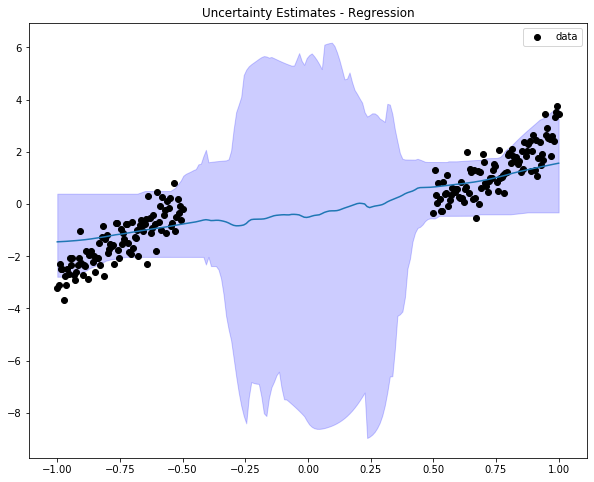

In [86]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
ax.plot(X_test,mean_ci)
ax.fill_between(X_test, up_ci, lower_ci, color='blue', alpha=0.2)
ax.scatter(X, y, color='black', label='data')
ax.legend(prop={'size':10})
ax.set_title('Uncertainty Estimates - Regression')

**Observation:** With the help of ensemble, the epistemic uncertainty in the middle has improved, as we see from the plot above that the predictive interval is much wider in the OOD region than in the in-distribution region. In terms of the aleatoric uncertainty, most training points are covered in the 95% uncertainty interval and the interval is not too narrowed on either end. This is better than any of the settings from above. However, we also noticed that the model is not fitting the training data perfectly well (with a high MSE error of about 0.60). Therefore, there is a tradeoff between better epistemic uncertainty in the OOD region and the fitness of the training data using this ensemble (epistemic uncertainty in the in-distribution region). To have a larger epistemic uncertainty in the OOD region, this method sacrifices the epistemic uncertainty in the in-distribution region (could have been smaller with a better fit).

## Grid Search

From the above analysis, we have discovered that neither the number of training epochs nor different initializations sucessfully improves the uncertainty estimation. Changes in the K value and the learning rate seem to affect the aleatoric uncertainty and also the predictive interval width in the OOD region. Here we perform grid search on the value for K and the learning rate, aiming to find the optimal hyperparameter setting for the SWAG algorithm with our selected model architecture.



Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.2701717053673233
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.27538524303933015
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.44494434134898114
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  5.700855164460274
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.3092062778163616
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.41049053318054163
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  3.6423210662223515
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  297.29382888052953
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessme

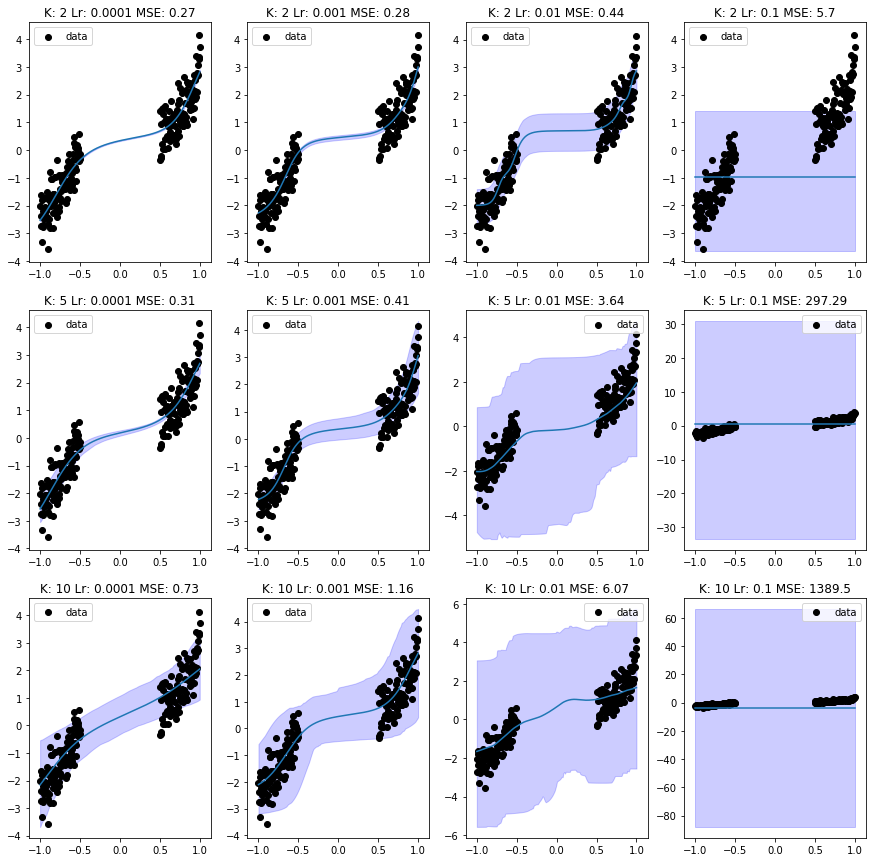

In [12]:
random.seed(123)
# try diff learning k
k_trials = [2,5,10]
lr_trials = [1e-4,1e-3,1e-2,1e-1]
fig, ax = plt.subplots(len(k_trials), len(lr_trials), figsize=(15, 15))
for i,k in enumerate(k_trials):
    for j,l in enumerate(lr_trials):
        swag = SWAG(Regression_linear, K = k)
        # Compile swag
        objective = 'regression'
        lr = l
        swa_const_lr = 1
        momentum = 0.9
        optimizer = optim.SGD
        loss_fn = nn.MSELoss()
        swa_scheduler = LambdaLR
        swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)
        # Fit swag
        first_mom, second_mom, D = swag.fit(train_gen,
                                            train_epoch=50,
                                            swag_epoch=20,
                                            log_freq=5, verbose=False)
        # Sample 100 posterior weights
        X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
        pred = swag.predict(X_test_tensor.float(),None, S=200, expanded=True)
        
        try:
            mean_ci,up_ci,lower_ci, mse = uncertainty_estimation(swag, X_test, pred, X_valid, y_valid, verbose=True)
            ax[i][j].plot(X_test,mean_ci)
            ax[i][j].fill_between(X_test, up_ci, lower_ci, color='blue', alpha=0.2)
            ax[i][j].scatter(X, y, color='black', label='data')
            ax[i][j].legend(prop={'size':10})
            ax[i][j].set_title('K: ' + str(k) + ' Lr: ' + str(l) + ' MSE: ' + str(np.round(mse,2)) )
        except ValueError:
            ax[i][j].scatter(X, y, color='black', label='data')
            ax[i][j].legend(prop={'size':10})
            ax[i][j].set_title('K: ' + str(k) + ' Lr: ' + str(l) + ' MSE: NaN')
            

        

From the above plots, we see that when K = 2 and learning rate = 0.01, the uncertainty estimation looks reasonably good with low validation MSE and predictive interval wide enough in the OOD region. Let's take a closer look at SWAG's performance in this setting.

In [38]:
# initialize SWAG
swag = SWAG(Regression_linear, K = 2)
print("Total number of parameters for the NN is:", swag.weigt_D)

# Compile swag
objective = 'regression'
lr = 1e-2
swa_const_lr = 1
momentum = 0.9
optimizer = optim.SGD
loss_fn = nn.MSELoss()
swa_scheduler = LambdaLR

swag.compile(objective, lr, swa_const_lr, momentum, optimizer, loss_fn, swa_scheduler)

# Fit swag (a short training period to see that it learns the middle section correctly)
first_mom, second_mom, D = swag.fit(train_gen,
                                    train_epoch=50,
                                    swag_epoch=20,
                                    log_freq=5,verbose=False)

# Sample 1 set of posterior weights
X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
optimal_pred = swag.predict(X_test_tensor.float(),None, S=200, expanded=True)
optimal_mean_ci,optimal_up_ci,optimal_lower_ci,mse_optimal = uncertainty_estimation(swag,X_test, optimal_pred, X_valid, y_valid, verbose=True)


Total number of parameters for the NN is: 46
Begin NN model training...

Begin SWAG training...

Begin uncertainty assessment...
Valid MSE:  0.4792441744483679


Text(0.5, 1.0, 'Uncertainty Estimates - Regression')

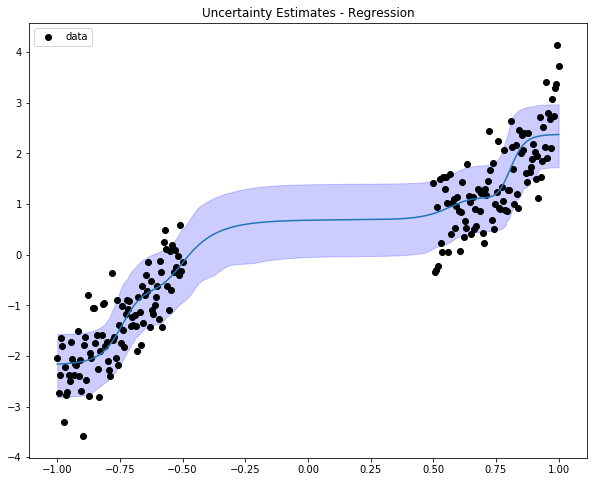

In [39]:
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
ax.plot(X_test,optimal_mean_ci)
ax.fill_between(X_test, optimal_up_ci, optimal_lower_ci, color='blue', alpha=0.2)
ax.scatter(X, y, color='black', label='data')
ax.legend(prop={'size':10})
ax.set_title('Uncertainty Estimates - Regression')

**Observation:** From the optimal setting, we see that the epistemic uncertainty improved a bit where the OOD region now has a wider uncertainty interval than before. The aleatoric uncertainty is acceptable in that the training MSE is reasonably small, indicating a good fit and is not too small to reflect the uncontrollable randomness in the data generation process. However, this performance is still **NOT** the ideal case, where we expect the middle OOD region to have an uncertainty interval wider than in the in-distribution region.

## Compare with SGD Ensembles

In order to have a sense of what the normal SGD (Stochastic Gradient Descent) would do in both fitting the data and capturing the uncertainty, we also implement the SGD class to compare its performance with the SWAG algorithm on the same model architecture.

In [26]:
class SGD:
    def __init__(self, NN_class, **kwargs):
        # Neural Network related params
        self.NN_class = NN_class
        self.net = NN_class(**kwargs)
        self.params_1d, self.shape_lookup, self.len_lookup = model_param_to_1D(self.net)
        self.weigt_D = len(self.params_1d)
        
        self.optimizer = optimizer(self.net.parameters(), 1e-3, 0.9)
        self.loss_fn = nn.MSELoss()
        self.loss_list = []
    
    def fit(self, train_loader, train_epoch: int,log_freq: int = 2000,verbose: bool = True):
        self.train_loader = train_loader
        for i in range(train_epoch):
            self.weights_param,loss = self.net_step(i, log_freq, verbose, return_weights=True)
            print(loss)
            self.loss_list.append(loss)
        return self.weights_param
    
    def net_step(self,
                 epoch: int,
                 log_freq: int,
                 verbose: bool,
                 return_weights: bool = False):
        
        if not self.optimizer:
            raise RuntimeError("Please compile the model before training.")

        # Store and print running_loss
        running_loss = 0.0
        losses = []
        for i, data in enumerate(self.train_loader, 0):
            
            X_train, y_train = data
            
            if len(y_train.shape) > 1:
                y_train = y_train.view(-1)
            
            self.optimizer.zero_grad()
            
            loss = self.loss_fn(self.net(X_train), y_train)
            
            loss.backward()
            
            self.optimizer.step()

            # print statistics
            running_loss += loss.item()
            if verbose and i % log_freq == log_freq-1:
                print('[Epoch: %d, \tIteration: %5d] \tTraining Loss: %.4f' %
                      (epoch + 1, i + 1, running_loss / log_freq))
                losses.append(running_loss/log_freq)
                running_loss = 0.0
            

        # If return_weights
        if return_weights:
            new_weights, _, _ = model_param_to_1D(self.net)
            return new_weights,np.mean(losses)
        
    def predict(self, X_test):
        model_params = params_1d_to_weights(self.weights_param, self.shape_lookup, self.len_lookup)
        new_net = create_NN_with_weights(self.NN_class, model_params)
        output = new_net.forward(X_test)
        return output

In [32]:
# same model architecture
sgd = SGD(Regression_linear)
print("Total number of parameters for the NN is:", sgd.weigt_D)

Total number of parameters for the NN is: 46


In [33]:
# find the optimal training epoch; start with 150
train_epoch = 150
weights_param = sgd.fit(train_gen, train_epoch=train_epoch, log_freq=20,verbose=True)

[Epoch: 1, 	Iteration:    20] 	Training Loss: 3.3069
[Epoch: 1, 	Iteration:    40] 	Training Loss: 1.9638
[Epoch: 1, 	Iteration:    60] 	Training Loss: 2.4492
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.9202
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.9376
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.6134
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.6616
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.6697
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.5944
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.7993
1.291604733989734
[Epoch: 2, 	Iteration:    20] 	Training Loss: 1.0065
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.5954
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.7744
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.4154
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.6010
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.6438
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.3449
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.3919
[Epoch: 2, 	Iteration:   180

[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.3326
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.3045
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.2981
0.31798227439040144
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.3079
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.3359
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.2961
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.5678
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.2398
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.4620
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.2538
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.1701
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.2191
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.5021
0.33546716781975194
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.2488
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.2431
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.3863
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.3187
[Epoch: 18, 	Iteration:   100] 	Training L

[Epoch: 32, 	Iteration:   100] 	Training Loss: 0.3697
[Epoch: 32, 	Iteration:   120] 	Training Loss: 0.3270
[Epoch: 32, 	Iteration:   140] 	Training Loss: 0.3433
[Epoch: 32, 	Iteration:   160] 	Training Loss: 0.5436
[Epoch: 32, 	Iteration:   180] 	Training Loss: 0.3352
[Epoch: 32, 	Iteration:   200] 	Training Loss: 0.2820
0.3425553995826339
[Epoch: 33, 	Iteration:    20] 	Training Loss: 0.3217
[Epoch: 33, 	Iteration:    40] 	Training Loss: 0.1415
[Epoch: 33, 	Iteration:    60] 	Training Loss: 0.4995
[Epoch: 33, 	Iteration:    80] 	Training Loss: 0.3671
[Epoch: 33, 	Iteration:   100] 	Training Loss: 0.1257
[Epoch: 33, 	Iteration:   120] 	Training Loss: 0.5540
[Epoch: 33, 	Iteration:   140] 	Training Loss: 0.2923
[Epoch: 33, 	Iteration:   160] 	Training Loss: 0.1887
[Epoch: 33, 	Iteration:   180] 	Training Loss: 0.3288
[Epoch: 33, 	Iteration:   200] 	Training Loss: 0.4194
0.32387015729422275
[Epoch: 34, 	Iteration:    20] 	Training Loss: 0.2731
[Epoch: 34, 	Iteration:    40] 	Training Lo

[Epoch: 48, 	Iteration:   120] 	Training Loss: 0.3518
[Epoch: 48, 	Iteration:   140] 	Training Loss: 0.3277
[Epoch: 48, 	Iteration:   160] 	Training Loss: 0.2313
[Epoch: 48, 	Iteration:   180] 	Training Loss: 0.3694
[Epoch: 48, 	Iteration:   200] 	Training Loss: 0.3895
0.31897610538588195
[Epoch: 49, 	Iteration:    20] 	Training Loss: 0.2365
[Epoch: 49, 	Iteration:    40] 	Training Loss: 0.2077
[Epoch: 49, 	Iteration:    60] 	Training Loss: 0.3320
[Epoch: 49, 	Iteration:    80] 	Training Loss: 0.2990
[Epoch: 49, 	Iteration:   100] 	Training Loss: 0.5551
[Epoch: 49, 	Iteration:   120] 	Training Loss: 0.2517
[Epoch: 49, 	Iteration:   140] 	Training Loss: 0.3132
[Epoch: 49, 	Iteration:   160] 	Training Loss: 0.4510
[Epoch: 49, 	Iteration:   180] 	Training Loss: 0.3363
[Epoch: 49, 	Iteration:   200] 	Training Loss: 0.2436
0.3226274324464794
[Epoch: 50, 	Iteration:    20] 	Training Loss: 0.2748
[Epoch: 50, 	Iteration:    40] 	Training Loss: 0.4266
[Epoch: 50, 	Iteration:    60] 	Training Lo

[Epoch: 65, 	Iteration:   200] 	Training Loss: 0.3159
0.339917234651914
[Epoch: 66, 	Iteration:    20] 	Training Loss: 0.3667
[Epoch: 66, 	Iteration:    40] 	Training Loss: 0.4462
[Epoch: 66, 	Iteration:    60] 	Training Loss: 0.4466
[Epoch: 66, 	Iteration:    80] 	Training Loss: 0.2617
[Epoch: 66, 	Iteration:   100] 	Training Loss: 0.2258
[Epoch: 66, 	Iteration:   120] 	Training Loss: 0.3023
[Epoch: 66, 	Iteration:   140] 	Training Loss: 0.3532
[Epoch: 66, 	Iteration:   160] 	Training Loss: 0.3774
[Epoch: 66, 	Iteration:   180] 	Training Loss: 0.2756
[Epoch: 66, 	Iteration:   200] 	Training Loss: 0.3363
0.33916911170042113
[Epoch: 67, 	Iteration:    20] 	Training Loss: 0.3453
[Epoch: 67, 	Iteration:    40] 	Training Loss: 0.3938
[Epoch: 67, 	Iteration:    60] 	Training Loss: 0.3924
[Epoch: 67, 	Iteration:    80] 	Training Loss: 0.2594
[Epoch: 67, 	Iteration:   100] 	Training Loss: 0.7700
[Epoch: 67, 	Iteration:   120] 	Training Loss: 0.2029
[Epoch: 67, 	Iteration:   140] 	Training Los

[Epoch: 83, 	Iteration:    80] 	Training Loss: 0.2889
[Epoch: 83, 	Iteration:   100] 	Training Loss: 0.3427
[Epoch: 83, 	Iteration:   120] 	Training Loss: 0.2219
[Epoch: 83, 	Iteration:   140] 	Training Loss: 0.2640
[Epoch: 83, 	Iteration:   160] 	Training Loss: 0.4316
[Epoch: 83, 	Iteration:   180] 	Training Loss: 0.6132
[Epoch: 83, 	Iteration:   200] 	Training Loss: 0.2489
0.32762376850057595
[Epoch: 84, 	Iteration:    20] 	Training Loss: 0.3071
[Epoch: 84, 	Iteration:    40] 	Training Loss: 0.3943
[Epoch: 84, 	Iteration:    60] 	Training Loss: 0.4271
[Epoch: 84, 	Iteration:    80] 	Training Loss: 0.4217
[Epoch: 84, 	Iteration:   100] 	Training Loss: 0.3092
[Epoch: 84, 	Iteration:   120] 	Training Loss: 0.2729
[Epoch: 84, 	Iteration:   140] 	Training Loss: 0.2502
[Epoch: 84, 	Iteration:   160] 	Training Loss: 0.4054
[Epoch: 84, 	Iteration:   180] 	Training Loss: 0.3699
[Epoch: 84, 	Iteration:   200] 	Training Loss: 0.2338
0.33916089176911124
[Epoch: 85, 	Iteration:    20] 	Training L

[Epoch: 100, 	Iteration:   160] 	Training Loss: 0.5124
[Epoch: 100, 	Iteration:   180] 	Training Loss: 0.2585
[Epoch: 100, 	Iteration:   200] 	Training Loss: 0.3460
0.32784220814683973
[Epoch: 101, 	Iteration:    20] 	Training Loss: 0.2246
[Epoch: 101, 	Iteration:    40] 	Training Loss: 0.3947
[Epoch: 101, 	Iteration:    60] 	Training Loss: 0.2798
[Epoch: 101, 	Iteration:    80] 	Training Loss: 0.2851
[Epoch: 101, 	Iteration:   100] 	Training Loss: 0.2592
[Epoch: 101, 	Iteration:   120] 	Training Loss: 0.5158
[Epoch: 101, 	Iteration:   140] 	Training Loss: 0.2280
[Epoch: 101, 	Iteration:   160] 	Training Loss: 0.3160
[Epoch: 101, 	Iteration:   180] 	Training Loss: 0.3348
[Epoch: 101, 	Iteration:   200] 	Training Loss: 0.4112
0.3249143255517174
[Epoch: 102, 	Iteration:    20] 	Training Loss: 0.3103
[Epoch: 102, 	Iteration:    40] 	Training Loss: 0.3477
[Epoch: 102, 	Iteration:    60] 	Training Loss: 0.1830
[Epoch: 102, 	Iteration:    80] 	Training Loss: 0.4151
[Epoch: 102, 	Iteration:  

[Epoch: 115, 	Iteration:    40] 	Training Loss: 0.5022
[Epoch: 115, 	Iteration:    60] 	Training Loss: 0.3545
[Epoch: 115, 	Iteration:    80] 	Training Loss: 0.5692
[Epoch: 115, 	Iteration:   100] 	Training Loss: 0.2041
[Epoch: 115, 	Iteration:   120] 	Training Loss: 0.1579
[Epoch: 115, 	Iteration:   140] 	Training Loss: 0.1701
[Epoch: 115, 	Iteration:   160] 	Training Loss: 0.3586
[Epoch: 115, 	Iteration:   180] 	Training Loss: 0.2252
[Epoch: 115, 	Iteration:   200] 	Training Loss: 0.1974
0.3293926880476101
[Epoch: 116, 	Iteration:    20] 	Training Loss: 0.3571
[Epoch: 116, 	Iteration:    40] 	Training Loss: 0.3748
[Epoch: 116, 	Iteration:    60] 	Training Loss: 0.3079
[Epoch: 116, 	Iteration:    80] 	Training Loss: 0.4609
[Epoch: 116, 	Iteration:   100] 	Training Loss: 0.2313
[Epoch: 116, 	Iteration:   120] 	Training Loss: 0.2850
[Epoch: 116, 	Iteration:   140] 	Training Loss: 0.2770
[Epoch: 116, 	Iteration:   160] 	Training Loss: 0.3864
[Epoch: 116, 	Iteration:   180] 	Training Loss

[Epoch: 129, 	Iteration:   120] 	Training Loss: 0.4095
[Epoch: 129, 	Iteration:   140] 	Training Loss: 0.4018
[Epoch: 129, 	Iteration:   160] 	Training Loss: 0.4275
[Epoch: 129, 	Iteration:   180] 	Training Loss: 0.2735
[Epoch: 129, 	Iteration:   200] 	Training Loss: 0.2428
0.31750224595988696
[Epoch: 130, 	Iteration:    20] 	Training Loss: 0.3101
[Epoch: 130, 	Iteration:    40] 	Training Loss: 0.3313
[Epoch: 130, 	Iteration:    60] 	Training Loss: 0.2237
[Epoch: 130, 	Iteration:    80] 	Training Loss: 0.4128
[Epoch: 130, 	Iteration:   100] 	Training Loss: 0.1956
[Epoch: 130, 	Iteration:   120] 	Training Loss: 0.4696
[Epoch: 130, 	Iteration:   140] 	Training Loss: 0.3266
[Epoch: 130, 	Iteration:   160] 	Training Loss: 0.4046
[Epoch: 130, 	Iteration:   180] 	Training Loss: 0.3104
[Epoch: 130, 	Iteration:   200] 	Training Loss: 0.3571
0.33418854398882514
[Epoch: 131, 	Iteration:    20] 	Training Loss: 0.3037
[Epoch: 131, 	Iteration:    40] 	Training Loss: 0.2578
[Epoch: 131, 	Iteration: 

[Epoch: 146, 	Iteration:   140] 	Training Loss: 0.2650
[Epoch: 146, 	Iteration:   160] 	Training Loss: 0.3373
[Epoch: 146, 	Iteration:   180] 	Training Loss: 0.3317
[Epoch: 146, 	Iteration:   200] 	Training Loss: 0.2624
0.31816026468424496
[Epoch: 147, 	Iteration:    20] 	Training Loss: 0.2678
[Epoch: 147, 	Iteration:    40] 	Training Loss: 0.2017
[Epoch: 147, 	Iteration:    60] 	Training Loss: 0.6857
[Epoch: 147, 	Iteration:    80] 	Training Loss: 0.2326
[Epoch: 147, 	Iteration:   100] 	Training Loss: 0.1662
[Epoch: 147, 	Iteration:   120] 	Training Loss: 0.3810
[Epoch: 147, 	Iteration:   140] 	Training Loss: 0.2485
[Epoch: 147, 	Iteration:   160] 	Training Loss: 0.4823
[Epoch: 147, 	Iteration:   180] 	Training Loss: 0.2781
[Epoch: 147, 	Iteration:   200] 	Training Loss: 0.2849
0.32289307908457887
[Epoch: 148, 	Iteration:    20] 	Training Loss: 0.3691
[Epoch: 148, 	Iteration:    40] 	Training Loss: 0.2364
[Epoch: 148, 	Iteration:    60] 	Training Loss: 0.3651
[Epoch: 148, 	Iteration: 

Text(0.5, 1.0, 'Training loss v.s. Epoch')

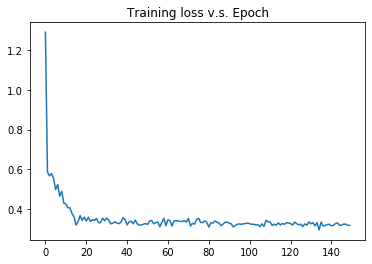

In [34]:
plt.plot(range(train_epoch),sgd.loss_list,'-')
plt.title('Training loss v.s. Epoch')

It seems that 50 epochs seem to be enough for the sgd optimization. Below, we will use 50 training epochs.

In [28]:
# fit the sgd ensemble
Y_pred_list = []
sgds = []
for _ in range(20):
    sgd = SGD(Regression_linear)
    weights_param = sgd.fit(train_gen, train_epoch=50, log_freq=20)
    X_test_tensor = torch.as_tensor([X_test]).reshape((-1,1))
    Y_pred = sgd.predict(X_test_tensor.float())
    Y_pred = Y_pred.detach().numpy()
    Y_pred_list.append(Y_pred)
    sgds.append(sgd)

[Epoch: 1, 	Iteration:    20] 	Training Loss: 3.9779
[Epoch: 1, 	Iteration:    40] 	Training Loss: 1.9294
[Epoch: 1, 	Iteration:    60] 	Training Loss: 2.9067
[Epoch: 1, 	Iteration:    80] 	Training Loss: 2.3764
[Epoch: 1, 	Iteration:   100] 	Training Loss: 1.6908
[Epoch: 1, 	Iteration:   120] 	Training Loss: 1.0164
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.4876
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.5275
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.4913
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.6625
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.5445
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.5301
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.6465
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.6272
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.6084
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.5610
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.5348
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.6692
[Epoch: 2, 	Iteration:   180] 	Training Loss: 

[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.4170
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.5437
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.4667
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.4883
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.4975
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.3877
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.4632
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.2286
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.3190
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.7161
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.5711
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.3425
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.5843
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.5241
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.6390
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3231
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.4557
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.3712
[Epoch: 18, 	Iteration:    6

[Epoch: 33, 	Iteration:    40] 	Training Loss: 0.3829
[Epoch: 33, 	Iteration:    60] 	Training Loss: 0.3171
[Epoch: 33, 	Iteration:    80] 	Training Loss: 0.2851
[Epoch: 33, 	Iteration:   100] 	Training Loss: 0.3517
[Epoch: 33, 	Iteration:   120] 	Training Loss: 0.2797
[Epoch: 33, 	Iteration:   140] 	Training Loss: 0.3313
[Epoch: 33, 	Iteration:   160] 	Training Loss: 0.3085
[Epoch: 33, 	Iteration:   180] 	Training Loss: 0.4200
[Epoch: 33, 	Iteration:   200] 	Training Loss: 0.4164
[Epoch: 34, 	Iteration:    20] 	Training Loss: 0.4996
[Epoch: 34, 	Iteration:    40] 	Training Loss: 0.3029
[Epoch: 34, 	Iteration:    60] 	Training Loss: 0.3846
[Epoch: 34, 	Iteration:    80] 	Training Loss: 0.2719
[Epoch: 34, 	Iteration:   100] 	Training Loss: 0.3562
[Epoch: 34, 	Iteration:   120] 	Training Loss: 0.4360
[Epoch: 34, 	Iteration:   140] 	Training Loss: 0.3031
[Epoch: 34, 	Iteration:   160] 	Training Loss: 0.2502
[Epoch: 34, 	Iteration:   180] 	Training Loss: 0.5080
[Epoch: 34, 	Iteration:   20

[Epoch: 49, 	Iteration:   180] 	Training Loss: 0.2858
[Epoch: 49, 	Iteration:   200] 	Training Loss: 0.2620
[Epoch: 50, 	Iteration:    20] 	Training Loss: 0.2964
[Epoch: 50, 	Iteration:    40] 	Training Loss: 0.3529
[Epoch: 50, 	Iteration:    60] 	Training Loss: 0.5158
[Epoch: 50, 	Iteration:    80] 	Training Loss: 0.3943
[Epoch: 50, 	Iteration:   100] 	Training Loss: 0.2432
[Epoch: 50, 	Iteration:   120] 	Training Loss: 0.2315
[Epoch: 50, 	Iteration:   140] 	Training Loss: 0.2843
[Epoch: 50, 	Iteration:   160] 	Training Loss: 0.3633
[Epoch: 50, 	Iteration:   180] 	Training Loss: 0.4419
[Epoch: 50, 	Iteration:   200] 	Training Loss: 0.1366
[Epoch: 1, 	Iteration:    20] 	Training Loss: 3.1366
[Epoch: 1, 	Iteration:    40] 	Training Loss: 3.1854
[Epoch: 1, 	Iteration:    60] 	Training Loss: 1.2822
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.9916
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.5842
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.8293
[Epoch: 1, 	Iteration:   140] 	Tra

[Epoch: 16, 	Iteration:   100] 	Training Loss: 0.5969
[Epoch: 16, 	Iteration:   120] 	Training Loss: 0.4790
[Epoch: 16, 	Iteration:   140] 	Training Loss: 0.5008
[Epoch: 16, 	Iteration:   160] 	Training Loss: 0.4715
[Epoch: 16, 	Iteration:   180] 	Training Loss: 0.5560
[Epoch: 16, 	Iteration:   200] 	Training Loss: 0.2894
[Epoch: 17, 	Iteration:    20] 	Training Loss: 0.7156
[Epoch: 17, 	Iteration:    40] 	Training Loss: 0.3994
[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.4648
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.5663
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.5437
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.2406
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.5040
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.6015
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.4222
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.2947
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.2158
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.6526
[Epoch: 18, 	Iteration:    6

[Epoch: 33, 	Iteration:   140] 	Training Loss: 0.3088
[Epoch: 33, 	Iteration:   160] 	Training Loss: 0.2942
[Epoch: 33, 	Iteration:   180] 	Training Loss: 0.4162
[Epoch: 33, 	Iteration:   200] 	Training Loss: 0.3668
[Epoch: 34, 	Iteration:    20] 	Training Loss: 0.2140
[Epoch: 34, 	Iteration:    40] 	Training Loss: 0.3359
[Epoch: 34, 	Iteration:    60] 	Training Loss: 0.4316
[Epoch: 34, 	Iteration:    80] 	Training Loss: 0.2847
[Epoch: 34, 	Iteration:   100] 	Training Loss: 0.2946
[Epoch: 34, 	Iteration:   120] 	Training Loss: 0.4581
[Epoch: 34, 	Iteration:   140] 	Training Loss: 0.5421
[Epoch: 34, 	Iteration:   160] 	Training Loss: 0.4765
[Epoch: 34, 	Iteration:   180] 	Training Loss: 0.2161
[Epoch: 34, 	Iteration:   200] 	Training Loss: 0.2759
[Epoch: 35, 	Iteration:    20] 	Training Loss: 0.2312
[Epoch: 35, 	Iteration:    40] 	Training Loss: 0.4288
[Epoch: 35, 	Iteration:    60] 	Training Loss: 0.2678
[Epoch: 35, 	Iteration:    80] 	Training Loss: 0.4362
[Epoch: 35, 	Iteration:   10

[Epoch: 50, 	Iteration:    80] 	Training Loss: 0.3801
[Epoch: 50, 	Iteration:   100] 	Training Loss: 0.3009
[Epoch: 50, 	Iteration:   120] 	Training Loss: 0.2519
[Epoch: 50, 	Iteration:   140] 	Training Loss: 0.1546
[Epoch: 50, 	Iteration:   160] 	Training Loss: 0.4441
[Epoch: 50, 	Iteration:   180] 	Training Loss: 0.5228
[Epoch: 50, 	Iteration:   200] 	Training Loss: 0.3538
[Epoch: 1, 	Iteration:    20] 	Training Loss: 2.0268
[Epoch: 1, 	Iteration:    40] 	Training Loss: 1.8447
[Epoch: 1, 	Iteration:    60] 	Training Loss: 2.1537
[Epoch: 1, 	Iteration:    80] 	Training Loss: 1.3357
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.6143
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.6121
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.5024
[Epoch: 1, 	Iteration:   160] 	Training Loss: 1.2311
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.4703
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.4488
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.5121
[Epoch: 2, 	Iteration:    40] 	Training

[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.8119
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.7281
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.3516
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.3773
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.3122
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.6654
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3397
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.4121
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.3911
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.5395
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.3925
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.5677
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.6140
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.3819
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.4179
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.3689
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.2097
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.2878
[Epoch: 19, 	Iteration:    4

[Epoch: 35, 	Iteration:    20] 	Training Loss: 0.3888
[Epoch: 35, 	Iteration:    40] 	Training Loss: 0.2576
[Epoch: 35, 	Iteration:    60] 	Training Loss: 0.3914
[Epoch: 35, 	Iteration:    80] 	Training Loss: 0.3877
[Epoch: 35, 	Iteration:   100] 	Training Loss: 0.2874
[Epoch: 35, 	Iteration:   120] 	Training Loss: 0.4151
[Epoch: 35, 	Iteration:   140] 	Training Loss: 0.4368
[Epoch: 35, 	Iteration:   160] 	Training Loss: 0.3621
[Epoch: 35, 	Iteration:   180] 	Training Loss: 0.3689
[Epoch: 35, 	Iteration:   200] 	Training Loss: 0.2597
[Epoch: 36, 	Iteration:    20] 	Training Loss: 0.3696
[Epoch: 36, 	Iteration:    40] 	Training Loss: 0.2831
[Epoch: 36, 	Iteration:    60] 	Training Loss: 0.2902
[Epoch: 36, 	Iteration:    80] 	Training Loss: 0.7053
[Epoch: 36, 	Iteration:   100] 	Training Loss: 0.1914
[Epoch: 36, 	Iteration:   120] 	Training Loss: 0.2558
[Epoch: 36, 	Iteration:   140] 	Training Loss: 0.2084
[Epoch: 36, 	Iteration:   160] 	Training Loss: 0.3531
[Epoch: 36, 	Iteration:   18

[Epoch: 50, 	Iteration:    80] 	Training Loss: 0.3641
[Epoch: 50, 	Iteration:   100] 	Training Loss: 0.2977
[Epoch: 50, 	Iteration:   120] 	Training Loss: 0.5060
[Epoch: 50, 	Iteration:   140] 	Training Loss: 0.3614
[Epoch: 50, 	Iteration:   160] 	Training Loss: 0.2302
[Epoch: 50, 	Iteration:   180] 	Training Loss: 0.2167
[Epoch: 50, 	Iteration:   200] 	Training Loss: 0.4048
[Epoch: 1, 	Iteration:    20] 	Training Loss: 1.6970
[Epoch: 1, 	Iteration:    40] 	Training Loss: 2.6335
[Epoch: 1, 	Iteration:    60] 	Training Loss: 1.5135
[Epoch: 1, 	Iteration:    80] 	Training Loss: 0.8469
[Epoch: 1, 	Iteration:   100] 	Training Loss: 1.0242
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.3719
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.3881
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.4254
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.6566
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.4565
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.4201
[Epoch: 2, 	Iteration:    40] 	Training

[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.5528
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.5640
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.4687
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.4932
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.4384
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.2758
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.4209
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.6665
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.5101
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.6924
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.5585
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.4689
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.5039
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.3770
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.4625
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.5715
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.4274
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.6122
[Epoch: 19, 	Iteration:   16

[Epoch: 33, 	Iteration:    60] 	Training Loss: 0.2532
[Epoch: 33, 	Iteration:    80] 	Training Loss: 0.3673
[Epoch: 33, 	Iteration:   100] 	Training Loss: 0.3420
[Epoch: 33, 	Iteration:   120] 	Training Loss: 0.3312
[Epoch: 33, 	Iteration:   140] 	Training Loss: 0.3796
[Epoch: 33, 	Iteration:   160] 	Training Loss: 0.3471
[Epoch: 33, 	Iteration:   180] 	Training Loss: 0.4277
[Epoch: 33, 	Iteration:   200] 	Training Loss: 0.4090
[Epoch: 34, 	Iteration:    20] 	Training Loss: 0.3912
[Epoch: 34, 	Iteration:    40] 	Training Loss: 0.3310
[Epoch: 34, 	Iteration:    60] 	Training Loss: 0.3627
[Epoch: 34, 	Iteration:    80] 	Training Loss: 0.2822
[Epoch: 34, 	Iteration:   100] 	Training Loss: 0.3676
[Epoch: 34, 	Iteration:   120] 	Training Loss: 0.3744
[Epoch: 34, 	Iteration:   140] 	Training Loss: 0.2361
[Epoch: 34, 	Iteration:   160] 	Training Loss: 0.4351
[Epoch: 34, 	Iteration:   180] 	Training Loss: 0.4112
[Epoch: 34, 	Iteration:   200] 	Training Loss: 0.3504
[Epoch: 35, 	Iteration:    2

[Epoch: 50, 	Iteration:   160] 	Training Loss: 0.2335
[Epoch: 50, 	Iteration:   180] 	Training Loss: 0.3917
[Epoch: 50, 	Iteration:   200] 	Training Loss: 0.4397
[Epoch: 1, 	Iteration:    20] 	Training Loss: 3.6313
[Epoch: 1, 	Iteration:    40] 	Training Loss: 2.2351
[Epoch: 1, 	Iteration:    60] 	Training Loss: 1.9583
[Epoch: 1, 	Iteration:    80] 	Training Loss: 1.5668
[Epoch: 1, 	Iteration:   100] 	Training Loss: 0.8856
[Epoch: 1, 	Iteration:   120] 	Training Loss: 0.5629
[Epoch: 1, 	Iteration:   140] 	Training Loss: 0.3311
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.6380
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.2653
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.8454
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.7355
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.6281
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.4692
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.5433
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.5848
[Epoch: 2, 	Iteration:   120] 	Training Los

[Epoch: 17, 	Iteration:    60] 	Training Loss: 0.3375
[Epoch: 17, 	Iteration:    80] 	Training Loss: 0.5433
[Epoch: 17, 	Iteration:   100] 	Training Loss: 0.4427
[Epoch: 17, 	Iteration:   120] 	Training Loss: 0.3695
[Epoch: 17, 	Iteration:   140] 	Training Loss: 0.4288
[Epoch: 17, 	Iteration:   160] 	Training Loss: 0.4282
[Epoch: 17, 	Iteration:   180] 	Training Loss: 0.2928
[Epoch: 17, 	Iteration:   200] 	Training Loss: 0.3196
[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.3262
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.3523
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.4451
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.1964
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.2693
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.4197
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.4712
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.3228
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.4141
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.3746
[Epoch: 19, 	Iteration:    2

[Epoch: 34, 	Iteration:    60] 	Training Loss: 0.5609
[Epoch: 34, 	Iteration:    80] 	Training Loss: 0.3495
[Epoch: 34, 	Iteration:   100] 	Training Loss: 0.3454
[Epoch: 34, 	Iteration:   120] 	Training Loss: 0.5132
[Epoch: 34, 	Iteration:   140] 	Training Loss: 0.5233
[Epoch: 34, 	Iteration:   160] 	Training Loss: 0.2181
[Epoch: 34, 	Iteration:   180] 	Training Loss: 0.2301
[Epoch: 34, 	Iteration:   200] 	Training Loss: 0.2825
[Epoch: 35, 	Iteration:    20] 	Training Loss: 0.2380
[Epoch: 35, 	Iteration:    40] 	Training Loss: 0.2242
[Epoch: 35, 	Iteration:    60] 	Training Loss: 0.3185
[Epoch: 35, 	Iteration:    80] 	Training Loss: 0.2445
[Epoch: 35, 	Iteration:   100] 	Training Loss: 0.3537
[Epoch: 35, 	Iteration:   120] 	Training Loss: 0.4337
[Epoch: 35, 	Iteration:   140] 	Training Loss: 0.4659
[Epoch: 35, 	Iteration:   160] 	Training Loss: 0.5009
[Epoch: 35, 	Iteration:   180] 	Training Loss: 0.4020
[Epoch: 35, 	Iteration:   200] 	Training Loss: 0.2901
[Epoch: 36, 	Iteration:    2

[Epoch: 50, 	Iteration:   200] 	Training Loss: 0.3706
[Epoch: 1, 	Iteration:    20] 	Training Loss: 2.6231
[Epoch: 1, 	Iteration:    40] 	Training Loss: 2.8286
[Epoch: 1, 	Iteration:    60] 	Training Loss: 2.3788
[Epoch: 1, 	Iteration:    80] 	Training Loss: 1.7583
[Epoch: 1, 	Iteration:   100] 	Training Loss: 1.6864
[Epoch: 1, 	Iteration:   120] 	Training Loss: 1.3361
[Epoch: 1, 	Iteration:   140] 	Training Loss: 1.1022
[Epoch: 1, 	Iteration:   160] 	Training Loss: 0.5529
[Epoch: 1, 	Iteration:   180] 	Training Loss: 0.6644
[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.5120
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.5235
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.4361
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.6135
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.3129
[Epoch: 2, 	Iteration:   100] 	Training Loss: 1.0939
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.5175
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.5660
[Epoch: 2, 	Iteration:   160] 	Training Loss:

[Epoch: 18, 	Iteration:    20] 	Training Loss: 0.4705
[Epoch: 18, 	Iteration:    40] 	Training Loss: 0.5092
[Epoch: 18, 	Iteration:    60] 	Training Loss: 0.5210
[Epoch: 18, 	Iteration:    80] 	Training Loss: 0.4716
[Epoch: 18, 	Iteration:   100] 	Training Loss: 0.7759
[Epoch: 18, 	Iteration:   120] 	Training Loss: 0.4360
[Epoch: 18, 	Iteration:   140] 	Training Loss: 0.5568
[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.5870
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.4687
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.2673
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.8647
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.3178
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.2244
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.6464
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.4286
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.6010
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.4563
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.4061
[Epoch: 19, 	Iteration:   18

[Epoch: 35, 	Iteration:    20] 	Training Loss: 0.5349
[Epoch: 35, 	Iteration:    40] 	Training Loss: 0.2970
[Epoch: 35, 	Iteration:    60] 	Training Loss: 0.2869
[Epoch: 35, 	Iteration:    80] 	Training Loss: 0.2317
[Epoch: 35, 	Iteration:   100] 	Training Loss: 0.3229
[Epoch: 35, 	Iteration:   120] 	Training Loss: 0.3234
[Epoch: 35, 	Iteration:   140] 	Training Loss: 0.4945
[Epoch: 35, 	Iteration:   160] 	Training Loss: 0.3806
[Epoch: 35, 	Iteration:   180] 	Training Loss: 0.3112
[Epoch: 35, 	Iteration:   200] 	Training Loss: 0.5570
[Epoch: 36, 	Iteration:    20] 	Training Loss: 0.3964
[Epoch: 36, 	Iteration:    40] 	Training Loss: 0.5577
[Epoch: 36, 	Iteration:    60] 	Training Loss: 0.3297
[Epoch: 36, 	Iteration:    80] 	Training Loss: 0.4881
[Epoch: 36, 	Iteration:   100] 	Training Loss: 0.2008
[Epoch: 36, 	Iteration:   120] 	Training Loss: 0.3867
[Epoch: 36, 	Iteration:   140] 	Training Loss: 0.1782
[Epoch: 36, 	Iteration:   160] 	Training Loss: 0.3479
[Epoch: 36, 	Iteration:   18

[Epoch: 1, 	Iteration:   200] 	Training Loss: 0.7136
[Epoch: 2, 	Iteration:    20] 	Training Loss: 0.4662
[Epoch: 2, 	Iteration:    40] 	Training Loss: 0.7573
[Epoch: 2, 	Iteration:    60] 	Training Loss: 0.8046
[Epoch: 2, 	Iteration:    80] 	Training Loss: 0.5880
[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.4659
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.6347
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.4069
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.5044
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.5835
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.7942
[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.6921
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.4930
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.4239
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.5383
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.9304
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.7053
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.5863
[Epoch: 3, 	Iteration:   160] 	Training Loss: 

[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.3358
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.3727
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.2319
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.4539
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.2400
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.3341
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.3456
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.3247
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.3243
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.3234
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.7479
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.3626
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.2701
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.3416
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.4231
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.3668
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.2882
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.3439
[Epoch: 20, 	Iteration:   16

[Epoch: 35, 	Iteration:   180] 	Training Loss: 0.2906
[Epoch: 35, 	Iteration:   200] 	Training Loss: 0.2546
[Epoch: 36, 	Iteration:    20] 	Training Loss: 0.4758
[Epoch: 36, 	Iteration:    40] 	Training Loss: 0.2907
[Epoch: 36, 	Iteration:    60] 	Training Loss: 0.4643
[Epoch: 36, 	Iteration:    80] 	Training Loss: 0.2834
[Epoch: 36, 	Iteration:   100] 	Training Loss: 0.3935
[Epoch: 36, 	Iteration:   120] 	Training Loss: 0.2299
[Epoch: 36, 	Iteration:   140] 	Training Loss: 0.1784
[Epoch: 36, 	Iteration:   160] 	Training Loss: 0.2426
[Epoch: 36, 	Iteration:   180] 	Training Loss: 0.3686
[Epoch: 36, 	Iteration:   200] 	Training Loss: 0.3455
[Epoch: 37, 	Iteration:    20] 	Training Loss: 0.3405
[Epoch: 37, 	Iteration:    40] 	Training Loss: 0.2358
[Epoch: 37, 	Iteration:    60] 	Training Loss: 0.4860
[Epoch: 37, 	Iteration:    80] 	Training Loss: 0.5607
[Epoch: 37, 	Iteration:   100] 	Training Loss: 0.2038
[Epoch: 37, 	Iteration:   120] 	Training Loss: 0.3845
[Epoch: 37, 	Iteration:   14

[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.7371
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.7853
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.6385
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.8837
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.7646
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.4409
[Epoch: 3, 	Iteration:    20] 	Training Loss: 0.8538
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.3683
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.6460
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.8044
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.5417
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.6799
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.2380
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.5086
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.5847
[Epoch: 3, 	Iteration:   200] 	Training Loss: 1.0139
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.5162
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.6115
[Epoch: 4, 	Iteration:    60] 	Training Loss: 

[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.2439
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.3158
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.2362
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.5095
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.3049
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.3285
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.3366
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.3557
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.3208
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.2666
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.4079
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.5962
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.4002
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.5890
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.5352
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.4416
[Epoch: 21, 	Iteration:    20] 	Training Loss: 0.2099
[Epoch: 21, 	Iteration:    40] 	Training Loss: 0.3660
[Epoch: 21, 	Iteration:    6

[Epoch: 36, 	Iteration:   140] 	Training Loss: 0.2005
[Epoch: 36, 	Iteration:   160] 	Training Loss: 0.2173
[Epoch: 36, 	Iteration:   180] 	Training Loss: 0.3293
[Epoch: 36, 	Iteration:   200] 	Training Loss: 0.4139
[Epoch: 37, 	Iteration:    20] 	Training Loss: 0.2781
[Epoch: 37, 	Iteration:    40] 	Training Loss: 0.1941
[Epoch: 37, 	Iteration:    60] 	Training Loss: 0.3049
[Epoch: 37, 	Iteration:    80] 	Training Loss: 0.3661
[Epoch: 37, 	Iteration:   100] 	Training Loss: 0.4146
[Epoch: 37, 	Iteration:   120] 	Training Loss: 0.3525
[Epoch: 37, 	Iteration:   140] 	Training Loss: 0.4432
[Epoch: 37, 	Iteration:   160] 	Training Loss: 0.5441
[Epoch: 37, 	Iteration:   180] 	Training Loss: 0.2594
[Epoch: 37, 	Iteration:   200] 	Training Loss: 0.3378
[Epoch: 38, 	Iteration:    20] 	Training Loss: 0.3763
[Epoch: 38, 	Iteration:    40] 	Training Loss: 0.2271
[Epoch: 38, 	Iteration:    60] 	Training Loss: 0.3191
[Epoch: 38, 	Iteration:    80] 	Training Loss: 0.3273
[Epoch: 38, 	Iteration:   10

[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.4685
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.4566
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.5183
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.5686
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.8889
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.6099
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.4919
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.5565
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.5343
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.3188
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.9068
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.3530
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.7687
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.4703
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.3952
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.6181
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.6696
[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.5037
[Epoch: 5, 	Iteration:    80] 	Training Loss: 

[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.2559
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.3279
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.4553
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.4722
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.5054
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.3056
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.2814
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.2065
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.2373
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.6227
[Epoch: 21, 	Iteration:    20] 	Training Loss: 0.2526
[Epoch: 21, 	Iteration:    40] 	Training Loss: 0.3048
[Epoch: 21, 	Iteration:    60] 	Training Loss: 0.2975
[Epoch: 21, 	Iteration:    80] 	Training Loss: 0.4944
[Epoch: 21, 	Iteration:   100] 	Training Loss: 0.3379
[Epoch: 21, 	Iteration:   120] 	Training Loss: 0.2930
[Epoch: 21, 	Iteration:   140] 	Training Loss: 0.3720
[Epoch: 21, 	Iteration:   160] 	Training Loss: 0.5110
[Epoch: 21, 	Iteration:   18

[Epoch: 37, 	Iteration:    20] 	Training Loss: 0.3463
[Epoch: 37, 	Iteration:    40] 	Training Loss: 0.1714
[Epoch: 37, 	Iteration:    60] 	Training Loss: 0.6081
[Epoch: 37, 	Iteration:    80] 	Training Loss: 0.3585
[Epoch: 37, 	Iteration:   100] 	Training Loss: 0.4294
[Epoch: 37, 	Iteration:   120] 	Training Loss: 0.3386
[Epoch: 37, 	Iteration:   140] 	Training Loss: 0.3160
[Epoch: 37, 	Iteration:   160] 	Training Loss: 0.2241
[Epoch: 37, 	Iteration:   180] 	Training Loss: 0.4462
[Epoch: 37, 	Iteration:   200] 	Training Loss: 0.2978
[Epoch: 38, 	Iteration:    20] 	Training Loss: 0.4295
[Epoch: 38, 	Iteration:    40] 	Training Loss: 0.4500
[Epoch: 38, 	Iteration:    60] 	Training Loss: 0.2029
[Epoch: 38, 	Iteration:    80] 	Training Loss: 0.2106
[Epoch: 38, 	Iteration:   100] 	Training Loss: 0.4364
[Epoch: 38, 	Iteration:   120] 	Training Loss: 0.4486
[Epoch: 38, 	Iteration:   140] 	Training Loss: 0.3334
[Epoch: 38, 	Iteration:   160] 	Training Loss: 0.2895
[Epoch: 38, 	Iteration:   18

[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.6691
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.5306
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.6482
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.5713
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.5678
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.3461
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.4854
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.4857
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.6559
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.9713
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.5304
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.4677
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.7816
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.4996
[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.6221
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.3819
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.5949
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.6598
[Epoch: 5, 	Iteration:   140] 	Training Loss: 

[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.3073
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.2814
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.5443
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.5514
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.3586
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.1499
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.2934
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.4362
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.3727
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.3866
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.4793
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.4111
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.5174
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.3199
[Epoch: 21, 	Iteration:    20] 	Training Loss: 0.4344
[Epoch: 21, 	Iteration:    40] 	Training Loss: 0.4574
[Epoch: 21, 	Iteration:    60] 	Training Loss: 0.3292
[Epoch: 21, 	Iteration:    80] 	Training Loss: 0.2103
[Epoch: 21, 	Iteration:   10

[Epoch: 35, 	Iteration:   140] 	Training Loss: 0.3712
[Epoch: 35, 	Iteration:   160] 	Training Loss: 0.2261
[Epoch: 35, 	Iteration:   180] 	Training Loss: 0.1562
[Epoch: 35, 	Iteration:   200] 	Training Loss: 0.3369
[Epoch: 36, 	Iteration:    20] 	Training Loss: 0.2731
[Epoch: 36, 	Iteration:    40] 	Training Loss: 0.1996
[Epoch: 36, 	Iteration:    60] 	Training Loss: 0.4076
[Epoch: 36, 	Iteration:    80] 	Training Loss: 0.2416
[Epoch: 36, 	Iteration:   100] 	Training Loss: 0.2134
[Epoch: 36, 	Iteration:   120] 	Training Loss: 0.5248
[Epoch: 36, 	Iteration:   140] 	Training Loss: 0.2690
[Epoch: 36, 	Iteration:   160] 	Training Loss: 0.4468
[Epoch: 36, 	Iteration:   180] 	Training Loss: 0.5091
[Epoch: 36, 	Iteration:   200] 	Training Loss: 0.3084
[Epoch: 37, 	Iteration:    20] 	Training Loss: 0.3135
[Epoch: 37, 	Iteration:    40] 	Training Loss: 0.3218
[Epoch: 37, 	Iteration:    60] 	Training Loss: 0.5140
[Epoch: 37, 	Iteration:    80] 	Training Loss: 0.3065
[Epoch: 37, 	Iteration:   10

[Epoch: 2, 	Iteration:   100] 	Training Loss: 0.6339
[Epoch: 2, 	Iteration:   120] 	Training Loss: 0.5800
[Epoch: 2, 	Iteration:   140] 	Training Loss: 0.5660
[Epoch: 2, 	Iteration:   160] 	Training Loss: 0.8147
[Epoch: 2, 	Iteration:   180] 	Training Loss: 0.4357
[Epoch: 2, 	Iteration:   200] 	Training Loss: 0.7365
[Epoch: 3, 	Iteration:    20] 	Training Loss: 1.0009
[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.3951
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.5898
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.5696
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.9967
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.5080
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.3887
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.5139
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.4472
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.4929
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.2865
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.7589
[Epoch: 4, 	Iteration:    60] 	Training Loss: 

[Epoch: 18, 	Iteration:   160] 	Training Loss: 0.2813
[Epoch: 18, 	Iteration:   180] 	Training Loss: 0.3341
[Epoch: 18, 	Iteration:   200] 	Training Loss: 0.2681
[Epoch: 19, 	Iteration:    20] 	Training Loss: 0.2091
[Epoch: 19, 	Iteration:    40] 	Training Loss: 0.2137
[Epoch: 19, 	Iteration:    60] 	Training Loss: 0.3669
[Epoch: 19, 	Iteration:    80] 	Training Loss: 0.2873
[Epoch: 19, 	Iteration:   100] 	Training Loss: 0.4553
[Epoch: 19, 	Iteration:   120] 	Training Loss: 0.3983
[Epoch: 19, 	Iteration:   140] 	Training Loss: 0.5381
[Epoch: 19, 	Iteration:   160] 	Training Loss: 0.2907
[Epoch: 19, 	Iteration:   180] 	Training Loss: 0.3650
[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.3790
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.3318
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.4948
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.3158
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.2564
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.2685
[Epoch: 20, 	Iteration:   12

[Epoch: 35, 	Iteration:   160] 	Training Loss: 0.1830
[Epoch: 35, 	Iteration:   180] 	Training Loss: 0.2621
[Epoch: 35, 	Iteration:   200] 	Training Loss: 0.2627
[Epoch: 36, 	Iteration:    20] 	Training Loss: 0.3341
[Epoch: 36, 	Iteration:    40] 	Training Loss: 0.1647
[Epoch: 36, 	Iteration:    60] 	Training Loss: 0.3384
[Epoch: 36, 	Iteration:    80] 	Training Loss: 0.2910
[Epoch: 36, 	Iteration:   100] 	Training Loss: 0.5210
[Epoch: 36, 	Iteration:   120] 	Training Loss: 0.3750
[Epoch: 36, 	Iteration:   140] 	Training Loss: 0.3558
[Epoch: 36, 	Iteration:   160] 	Training Loss: 0.3087
[Epoch: 36, 	Iteration:   180] 	Training Loss: 0.2788
[Epoch: 36, 	Iteration:   200] 	Training Loss: 0.3714
[Epoch: 37, 	Iteration:    20] 	Training Loss: 0.1973
[Epoch: 37, 	Iteration:    40] 	Training Loss: 0.3441
[Epoch: 37, 	Iteration:    60] 	Training Loss: 0.3736
[Epoch: 37, 	Iteration:    80] 	Training Loss: 0.2713
[Epoch: 37, 	Iteration:   100] 	Training Loss: 0.2082
[Epoch: 37, 	Iteration:   12

[Epoch: 3, 	Iteration:    40] 	Training Loss: 0.4141
[Epoch: 3, 	Iteration:    60] 	Training Loss: 0.5313
[Epoch: 3, 	Iteration:    80] 	Training Loss: 0.7325
[Epoch: 3, 	Iteration:   100] 	Training Loss: 0.6946
[Epoch: 3, 	Iteration:   120] 	Training Loss: 0.5565
[Epoch: 3, 	Iteration:   140] 	Training Loss: 0.6554
[Epoch: 3, 	Iteration:   160] 	Training Loss: 0.4986
[Epoch: 3, 	Iteration:   180] 	Training Loss: 0.6824
[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.5697
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.6895
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.4266
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.4669
[Epoch: 4, 	Iteration:    80] 	Training Loss: 1.0897
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.3839
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.6368
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.4174
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.5634
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.6045
[Epoch: 4, 	Iteration:   200] 	Training Loss: 

[Epoch: 19, 	Iteration:   200] 	Training Loss: 0.3962
[Epoch: 20, 	Iteration:    20] 	Training Loss: 0.3900
[Epoch: 20, 	Iteration:    40] 	Training Loss: 0.3936
[Epoch: 20, 	Iteration:    60] 	Training Loss: 0.4880
[Epoch: 20, 	Iteration:    80] 	Training Loss: 0.4746
[Epoch: 20, 	Iteration:   100] 	Training Loss: 0.3246
[Epoch: 20, 	Iteration:   120] 	Training Loss: 0.3354
[Epoch: 20, 	Iteration:   140] 	Training Loss: 0.4193
[Epoch: 20, 	Iteration:   160] 	Training Loss: 0.4361
[Epoch: 20, 	Iteration:   180] 	Training Loss: 0.3467
[Epoch: 20, 	Iteration:   200] 	Training Loss: 0.2221
[Epoch: 21, 	Iteration:    20] 	Training Loss: 0.2373
[Epoch: 21, 	Iteration:    40] 	Training Loss: 0.4806
[Epoch: 21, 	Iteration:    60] 	Training Loss: 0.3168
[Epoch: 21, 	Iteration:    80] 	Training Loss: 0.4993
[Epoch: 21, 	Iteration:   100] 	Training Loss: 0.8197
[Epoch: 21, 	Iteration:   120] 	Training Loss: 0.2713
[Epoch: 21, 	Iteration:   140] 	Training Loss: 0.3195
[Epoch: 21, 	Iteration:   16

[Epoch: 37, 	Iteration:    20] 	Training Loss: 0.2782
[Epoch: 37, 	Iteration:    40] 	Training Loss: 0.3673
[Epoch: 37, 	Iteration:    60] 	Training Loss: 0.3289
[Epoch: 37, 	Iteration:    80] 	Training Loss: 0.1689
[Epoch: 37, 	Iteration:   100] 	Training Loss: 0.2440
[Epoch: 37, 	Iteration:   120] 	Training Loss: 0.5296
[Epoch: 37, 	Iteration:   140] 	Training Loss: 0.4058
[Epoch: 37, 	Iteration:   160] 	Training Loss: 0.3668
[Epoch: 37, 	Iteration:   180] 	Training Loss: 0.2958
[Epoch: 37, 	Iteration:   200] 	Training Loss: 0.3487
[Epoch: 38, 	Iteration:    20] 	Training Loss: 0.3045
[Epoch: 38, 	Iteration:    40] 	Training Loss: 0.2036
[Epoch: 38, 	Iteration:    60] 	Training Loss: 0.4216
[Epoch: 38, 	Iteration:    80] 	Training Loss: 0.2632
[Epoch: 38, 	Iteration:   100] 	Training Loss: 0.3464
[Epoch: 38, 	Iteration:   120] 	Training Loss: 0.2883
[Epoch: 38, 	Iteration:   140] 	Training Loss: 0.5084
[Epoch: 38, 	Iteration:   160] 	Training Loss: 0.2618
[Epoch: 38, 	Iteration:   18

[Epoch: 3, 	Iteration:   200] 	Training Loss: 0.6783
[Epoch: 4, 	Iteration:    20] 	Training Loss: 0.6052
[Epoch: 4, 	Iteration:    40] 	Training Loss: 0.5338
[Epoch: 4, 	Iteration:    60] 	Training Loss: 0.8046
[Epoch: 4, 	Iteration:    80] 	Training Loss: 0.5635
[Epoch: 4, 	Iteration:   100] 	Training Loss: 0.4522
[Epoch: 4, 	Iteration:   120] 	Training Loss: 0.6285
[Epoch: 4, 	Iteration:   140] 	Training Loss: 0.6816
[Epoch: 4, 	Iteration:   160] 	Training Loss: 0.2811
[Epoch: 4, 	Iteration:   180] 	Training Loss: 0.5746
[Epoch: 4, 	Iteration:   200] 	Training Loss: 0.4844
[Epoch: 5, 	Iteration:    20] 	Training Loss: 0.7284
[Epoch: 5, 	Iteration:    40] 	Training Loss: 0.5022
[Epoch: 5, 	Iteration:    60] 	Training Loss: 0.5509
[Epoch: 5, 	Iteration:    80] 	Training Loss: 0.4512
[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.3203
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.5026
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.6706
[Epoch: 5, 	Iteration:   160] 	Training Loss: 

[Epoch: 21, 	Iteration:    40] 	Training Loss: 0.4582
[Epoch: 21, 	Iteration:    60] 	Training Loss: 0.2843
[Epoch: 21, 	Iteration:    80] 	Training Loss: 0.2284
[Epoch: 21, 	Iteration:   100] 	Training Loss: 0.4531
[Epoch: 21, 	Iteration:   120] 	Training Loss: 0.4319
[Epoch: 21, 	Iteration:   140] 	Training Loss: 0.3935
[Epoch: 21, 	Iteration:   160] 	Training Loss: 0.3225
[Epoch: 21, 	Iteration:   180] 	Training Loss: 0.2870
[Epoch: 21, 	Iteration:   200] 	Training Loss: 0.5435
[Epoch: 22, 	Iteration:    20] 	Training Loss: 0.3340
[Epoch: 22, 	Iteration:    40] 	Training Loss: 0.2535
[Epoch: 22, 	Iteration:    60] 	Training Loss: 0.1640
[Epoch: 22, 	Iteration:    80] 	Training Loss: 0.5003
[Epoch: 22, 	Iteration:   100] 	Training Loss: 0.3333
[Epoch: 22, 	Iteration:   120] 	Training Loss: 0.3721
[Epoch: 22, 	Iteration:   140] 	Training Loss: 0.6413
[Epoch: 22, 	Iteration:   160] 	Training Loss: 0.4256
[Epoch: 22, 	Iteration:   180] 	Training Loss: 0.2541
[Epoch: 22, 	Iteration:   20

[Epoch: 38, 	Iteration:    40] 	Training Loss: 0.2824
[Epoch: 38, 	Iteration:    60] 	Training Loss: 0.5250
[Epoch: 38, 	Iteration:    80] 	Training Loss: 0.4146
[Epoch: 38, 	Iteration:   100] 	Training Loss: 0.1902
[Epoch: 38, 	Iteration:   120] 	Training Loss: 0.3563
[Epoch: 38, 	Iteration:   140] 	Training Loss: 0.3914
[Epoch: 38, 	Iteration:   160] 	Training Loss: 0.1729
[Epoch: 38, 	Iteration:   180] 	Training Loss: 0.2225
[Epoch: 38, 	Iteration:   200] 	Training Loss: 0.3998
[Epoch: 39, 	Iteration:    20] 	Training Loss: 0.2259
[Epoch: 39, 	Iteration:    40] 	Training Loss: 0.3970
[Epoch: 39, 	Iteration:    60] 	Training Loss: 0.3019
[Epoch: 39, 	Iteration:    80] 	Training Loss: 0.2301
[Epoch: 39, 	Iteration:   100] 	Training Loss: 0.3837
[Epoch: 39, 	Iteration:   120] 	Training Loss: 0.4152
[Epoch: 39, 	Iteration:   140] 	Training Loss: 0.2720
[Epoch: 39, 	Iteration:   160] 	Training Loss: 0.1322
[Epoch: 39, 	Iteration:   180] 	Training Loss: 0.4490
[Epoch: 39, 	Iteration:   20

[Epoch: 5, 	Iteration:   100] 	Training Loss: 0.5117
[Epoch: 5, 	Iteration:   120] 	Training Loss: 0.5482
[Epoch: 5, 	Iteration:   140] 	Training Loss: 0.2703
[Epoch: 5, 	Iteration:   160] 	Training Loss: 0.5286
[Epoch: 5, 	Iteration:   180] 	Training Loss: 0.5586
[Epoch: 5, 	Iteration:   200] 	Training Loss: 0.6358
[Epoch: 6, 	Iteration:    20] 	Training Loss: 0.6638
[Epoch: 6, 	Iteration:    40] 	Training Loss: 0.6156
[Epoch: 6, 	Iteration:    60] 	Training Loss: 0.3790
[Epoch: 6, 	Iteration:    80] 	Training Loss: 0.6774
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.4243
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.2415
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.5702
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.6699
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.4759
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.5380
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.7047
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.4002
[Epoch: 7, 	Iteration:    60] 	Training Loss: 

[Epoch: 22, 	Iteration:   100] 	Training Loss: 0.2861
[Epoch: 22, 	Iteration:   120] 	Training Loss: 0.4229
[Epoch: 22, 	Iteration:   140] 	Training Loss: 0.4695
[Epoch: 22, 	Iteration:   160] 	Training Loss: 0.5043
[Epoch: 22, 	Iteration:   180] 	Training Loss: 0.3649
[Epoch: 22, 	Iteration:   200] 	Training Loss: 0.3986
[Epoch: 23, 	Iteration:    20] 	Training Loss: 0.2406
[Epoch: 23, 	Iteration:    40] 	Training Loss: 0.4369
[Epoch: 23, 	Iteration:    60] 	Training Loss: 0.3539
[Epoch: 23, 	Iteration:    80] 	Training Loss: 0.3617
[Epoch: 23, 	Iteration:   100] 	Training Loss: 0.3809
[Epoch: 23, 	Iteration:   120] 	Training Loss: 0.2967
[Epoch: 23, 	Iteration:   140] 	Training Loss: 0.3111
[Epoch: 23, 	Iteration:   160] 	Training Loss: 0.3810
[Epoch: 23, 	Iteration:   180] 	Training Loss: 0.4024
[Epoch: 23, 	Iteration:   200] 	Training Loss: 0.4038
[Epoch: 24, 	Iteration:    20] 	Training Loss: 0.1803
[Epoch: 24, 	Iteration:    40] 	Training Loss: 0.2509
[Epoch: 24, 	Iteration:    6

[Epoch: 39, 	Iteration:   120] 	Training Loss: 0.2630
[Epoch: 39, 	Iteration:   140] 	Training Loss: 0.3200
[Epoch: 39, 	Iteration:   160] 	Training Loss: 0.2376
[Epoch: 39, 	Iteration:   180] 	Training Loss: 0.3964
[Epoch: 39, 	Iteration:   200] 	Training Loss: 0.5776
[Epoch: 40, 	Iteration:    20] 	Training Loss: 0.3477
[Epoch: 40, 	Iteration:    40] 	Training Loss: 0.3352
[Epoch: 40, 	Iteration:    60] 	Training Loss: 0.3363
[Epoch: 40, 	Iteration:    80] 	Training Loss: 0.2994
[Epoch: 40, 	Iteration:   100] 	Training Loss: 0.3144
[Epoch: 40, 	Iteration:   120] 	Training Loss: 0.2051
[Epoch: 40, 	Iteration:   140] 	Training Loss: 0.1911
[Epoch: 40, 	Iteration:   160] 	Training Loss: 0.4125
[Epoch: 40, 	Iteration:   180] 	Training Loss: 0.4410
[Epoch: 40, 	Iteration:   200] 	Training Loss: 0.4576
[Epoch: 41, 	Iteration:    20] 	Training Loss: 0.3120
[Epoch: 41, 	Iteration:    40] 	Training Loss: 0.4163
[Epoch: 41, 	Iteration:    60] 	Training Loss: 0.2627
[Epoch: 41, 	Iteration:    8

[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.3671
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.9239
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.8813
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.5583
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.3444
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.4799
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.7444
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.5497
[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.9385
[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.7005
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.4232
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.5749
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.3214
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.4320
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.7174
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.5170
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.7449
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.2392
[Epoch: 8, 	Iteration:   120] 	Training Loss: 

[Epoch: 23, 	Iteration:   140] 	Training Loss: 0.8687
[Epoch: 23, 	Iteration:   160] 	Training Loss: 0.5929
[Epoch: 23, 	Iteration:   180] 	Training Loss: 0.3206
[Epoch: 23, 	Iteration:   200] 	Training Loss: 0.3973
[Epoch: 24, 	Iteration:    20] 	Training Loss: 0.4907
[Epoch: 24, 	Iteration:    40] 	Training Loss: 0.5013
[Epoch: 24, 	Iteration:    60] 	Training Loss: 0.3744
[Epoch: 24, 	Iteration:    80] 	Training Loss: 0.5018
[Epoch: 24, 	Iteration:   100] 	Training Loss: 0.3304
[Epoch: 24, 	Iteration:   120] 	Training Loss: 0.4922
[Epoch: 24, 	Iteration:   140] 	Training Loss: 0.5921
[Epoch: 24, 	Iteration:   160] 	Training Loss: 0.3868
[Epoch: 24, 	Iteration:   180] 	Training Loss: 0.6718
[Epoch: 24, 	Iteration:   200] 	Training Loss: 0.4171
[Epoch: 25, 	Iteration:    20] 	Training Loss: 0.5085
[Epoch: 25, 	Iteration:    40] 	Training Loss: 0.4698
[Epoch: 25, 	Iteration:    60] 	Training Loss: 0.6161
[Epoch: 25, 	Iteration:    80] 	Training Loss: 0.4477
[Epoch: 25, 	Iteration:   10

[Epoch: 40, 	Iteration:    20] 	Training Loss: 0.4707
[Epoch: 40, 	Iteration:    40] 	Training Loss: 0.5289
[Epoch: 40, 	Iteration:    60] 	Training Loss: 0.3199
[Epoch: 40, 	Iteration:    80] 	Training Loss: 0.2880
[Epoch: 40, 	Iteration:   100] 	Training Loss: 0.1193
[Epoch: 40, 	Iteration:   120] 	Training Loss: 0.3037
[Epoch: 40, 	Iteration:   140] 	Training Loss: 0.4522
[Epoch: 40, 	Iteration:   160] 	Training Loss: 0.4614
[Epoch: 40, 	Iteration:   180] 	Training Loss: 0.3604
[Epoch: 40, 	Iteration:   200] 	Training Loss: 0.3546
[Epoch: 41, 	Iteration:    20] 	Training Loss: 0.2530
[Epoch: 41, 	Iteration:    40] 	Training Loss: 0.4630
[Epoch: 41, 	Iteration:    60] 	Training Loss: 0.2036
[Epoch: 41, 	Iteration:    80] 	Training Loss: 0.5759
[Epoch: 41, 	Iteration:   100] 	Training Loss: 0.5128
[Epoch: 41, 	Iteration:   120] 	Training Loss: 0.3778
[Epoch: 41, 	Iteration:   140] 	Training Loss: 0.1592
[Epoch: 41, 	Iteration:   160] 	Training Loss: 0.3400
[Epoch: 41, 	Iteration:   18

[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.2488
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.2620
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.4440
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.6360
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.7321
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.3838
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.4330
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.6597
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.8885
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.3399
[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.8039
[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.5068
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.5644
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.4044
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.4595
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.3385
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.8675
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.4441
[Epoch: 8, 	Iteration:    80] 	Training Loss: 

[Epoch: 23, 	Iteration:    60] 	Training Loss: 0.2938
[Epoch: 23, 	Iteration:    80] 	Training Loss: 0.5120
[Epoch: 23, 	Iteration:   100] 	Training Loss: 0.4392
[Epoch: 23, 	Iteration:   120] 	Training Loss: 0.4241
[Epoch: 23, 	Iteration:   140] 	Training Loss: 0.5076
[Epoch: 23, 	Iteration:   160] 	Training Loss: 0.3788
[Epoch: 23, 	Iteration:   180] 	Training Loss: 0.3181
[Epoch: 23, 	Iteration:   200] 	Training Loss: 0.2333
[Epoch: 24, 	Iteration:    20] 	Training Loss: 0.4780
[Epoch: 24, 	Iteration:    40] 	Training Loss: 0.5222
[Epoch: 24, 	Iteration:    60] 	Training Loss: 0.5903
[Epoch: 24, 	Iteration:    80] 	Training Loss: 0.2961
[Epoch: 24, 	Iteration:   100] 	Training Loss: 0.5757
[Epoch: 24, 	Iteration:   120] 	Training Loss: 0.2663
[Epoch: 24, 	Iteration:   140] 	Training Loss: 0.5804
[Epoch: 24, 	Iteration:   160] 	Training Loss: 0.3084
[Epoch: 24, 	Iteration:   180] 	Training Loss: 0.3599
[Epoch: 24, 	Iteration:   200] 	Training Loss: 0.3382
[Epoch: 25, 	Iteration:    2

[Epoch: 38, 	Iteration:   140] 	Training Loss: 0.2802
[Epoch: 38, 	Iteration:   160] 	Training Loss: 0.3234
[Epoch: 38, 	Iteration:   180] 	Training Loss: 0.3124
[Epoch: 38, 	Iteration:   200] 	Training Loss: 0.2334
[Epoch: 39, 	Iteration:    20] 	Training Loss: 0.4907
[Epoch: 39, 	Iteration:    40] 	Training Loss: 0.4098
[Epoch: 39, 	Iteration:    60] 	Training Loss: 0.2411
[Epoch: 39, 	Iteration:    80] 	Training Loss: 0.3293
[Epoch: 39, 	Iteration:   100] 	Training Loss: 0.3775
[Epoch: 39, 	Iteration:   120] 	Training Loss: 0.3079
[Epoch: 39, 	Iteration:   140] 	Training Loss: 0.3285
[Epoch: 39, 	Iteration:   160] 	Training Loss: 0.1854
[Epoch: 39, 	Iteration:   180] 	Training Loss: 0.4898
[Epoch: 39, 	Iteration:   200] 	Training Loss: 0.3347
[Epoch: 40, 	Iteration:    20] 	Training Loss: 0.2967
[Epoch: 40, 	Iteration:    40] 	Training Loss: 0.3232
[Epoch: 40, 	Iteration:    60] 	Training Loss: 0.3068
[Epoch: 40, 	Iteration:    80] 	Training Loss: 0.4006
[Epoch: 40, 	Iteration:   10

[Epoch: 6, 	Iteration:    80] 	Training Loss: 1.2018
[Epoch: 6, 	Iteration:   100] 	Training Loss: 0.4313
[Epoch: 6, 	Iteration:   120] 	Training Loss: 0.5480
[Epoch: 6, 	Iteration:   140] 	Training Loss: 0.4785
[Epoch: 6, 	Iteration:   160] 	Training Loss: 0.2837
[Epoch: 6, 	Iteration:   180] 	Training Loss: 0.4451
[Epoch: 6, 	Iteration:   200] 	Training Loss: 0.9671
[Epoch: 7, 	Iteration:    20] 	Training Loss: 0.3307
[Epoch: 7, 	Iteration:    40] 	Training Loss: 0.5536
[Epoch: 7, 	Iteration:    60] 	Training Loss: 0.6756
[Epoch: 7, 	Iteration:    80] 	Training Loss: 0.5008
[Epoch: 7, 	Iteration:   100] 	Training Loss: 0.7776
[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.7403
[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.5527
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.7705
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.5271
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.2861
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.2816
[Epoch: 8, 	Iteration:    40] 	Training Loss: 

[Epoch: 23, 	Iteration:    80] 	Training Loss: 0.5382
[Epoch: 23, 	Iteration:   100] 	Training Loss: 0.4753
[Epoch: 23, 	Iteration:   120] 	Training Loss: 0.5527
[Epoch: 23, 	Iteration:   140] 	Training Loss: 0.5224
[Epoch: 23, 	Iteration:   160] 	Training Loss: 0.4473
[Epoch: 23, 	Iteration:   180] 	Training Loss: 0.6030
[Epoch: 23, 	Iteration:   200] 	Training Loss: 0.6181
[Epoch: 24, 	Iteration:    20] 	Training Loss: 0.3927
[Epoch: 24, 	Iteration:    40] 	Training Loss: 0.4663
[Epoch: 24, 	Iteration:    60] 	Training Loss: 0.2803
[Epoch: 24, 	Iteration:    80] 	Training Loss: 0.4642
[Epoch: 24, 	Iteration:   100] 	Training Loss: 0.7115
[Epoch: 24, 	Iteration:   120] 	Training Loss: 0.4445
[Epoch: 24, 	Iteration:   140] 	Training Loss: 0.4451
[Epoch: 24, 	Iteration:   160] 	Training Loss: 0.3660
[Epoch: 24, 	Iteration:   180] 	Training Loss: 0.5146
[Epoch: 24, 	Iteration:   200] 	Training Loss: 0.4690
[Epoch: 25, 	Iteration:    20] 	Training Loss: 0.4703
[Epoch: 25, 	Iteration:    4

[Epoch: 40, 	Iteration:    80] 	Training Loss: 0.3989
[Epoch: 40, 	Iteration:   100] 	Training Loss: 0.3845
[Epoch: 40, 	Iteration:   120] 	Training Loss: 0.4268
[Epoch: 40, 	Iteration:   140] 	Training Loss: 0.2316
[Epoch: 40, 	Iteration:   160] 	Training Loss: 0.3915
[Epoch: 40, 	Iteration:   180] 	Training Loss: 0.3071
[Epoch: 40, 	Iteration:   200] 	Training Loss: 0.6029
[Epoch: 41, 	Iteration:    20] 	Training Loss: 0.4748
[Epoch: 41, 	Iteration:    40] 	Training Loss: 0.3047
[Epoch: 41, 	Iteration:    60] 	Training Loss: 0.3927
[Epoch: 41, 	Iteration:    80] 	Training Loss: 0.3683
[Epoch: 41, 	Iteration:   100] 	Training Loss: 0.2435
[Epoch: 41, 	Iteration:   120] 	Training Loss: 0.3594
[Epoch: 41, 	Iteration:   140] 	Training Loss: 0.2823
[Epoch: 41, 	Iteration:   160] 	Training Loss: 0.3816
[Epoch: 41, 	Iteration:   180] 	Training Loss: 0.3069
[Epoch: 41, 	Iteration:   200] 	Training Loss: 0.4065
[Epoch: 42, 	Iteration:    20] 	Training Loss: 0.4216
[Epoch: 42, 	Iteration:    4

[Epoch: 7, 	Iteration:   120] 	Training Loss: 0.4087
[Epoch: 7, 	Iteration:   140] 	Training Loss: 0.4955
[Epoch: 7, 	Iteration:   160] 	Training Loss: 0.4991
[Epoch: 7, 	Iteration:   180] 	Training Loss: 0.5179
[Epoch: 7, 	Iteration:   200] 	Training Loss: 0.3719
[Epoch: 8, 	Iteration:    20] 	Training Loss: 0.5108
[Epoch: 8, 	Iteration:    40] 	Training Loss: 0.5633
[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.4497
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.5352
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.3134
[Epoch: 8, 	Iteration:   120] 	Training Loss: 0.6039
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.9288
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.5518
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.2973
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.5942
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.6752
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.4902
[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.3862
[Epoch: 9, 	Iteration:    80] 	Training Loss: 

[Epoch: 24, 	Iteration:    60] 	Training Loss: 0.2881
[Epoch: 24, 	Iteration:    80] 	Training Loss: 0.3766
[Epoch: 24, 	Iteration:   100] 	Training Loss: 0.2976
[Epoch: 24, 	Iteration:   120] 	Training Loss: 0.3485
[Epoch: 24, 	Iteration:   140] 	Training Loss: 0.2922
[Epoch: 24, 	Iteration:   160] 	Training Loss: 0.3545
[Epoch: 24, 	Iteration:   180] 	Training Loss: 0.4205
[Epoch: 24, 	Iteration:   200] 	Training Loss: 0.4766
[Epoch: 25, 	Iteration:    20] 	Training Loss: 0.2706
[Epoch: 25, 	Iteration:    40] 	Training Loss: 0.4100
[Epoch: 25, 	Iteration:    60] 	Training Loss: 0.3203
[Epoch: 25, 	Iteration:    80] 	Training Loss: 0.4931
[Epoch: 25, 	Iteration:   100] 	Training Loss: 0.4165
[Epoch: 25, 	Iteration:   120] 	Training Loss: 0.2706
[Epoch: 25, 	Iteration:   140] 	Training Loss: 0.4220
[Epoch: 25, 	Iteration:   160] 	Training Loss: 0.2397
[Epoch: 25, 	Iteration:   180] 	Training Loss: 0.2851
[Epoch: 25, 	Iteration:   200] 	Training Loss: 0.2814
[Epoch: 26, 	Iteration:    2

[Epoch: 41, 	Iteration:    40] 	Training Loss: 0.3399
[Epoch: 41, 	Iteration:    60] 	Training Loss: 0.3321
[Epoch: 41, 	Iteration:    80] 	Training Loss: 0.3275
[Epoch: 41, 	Iteration:   100] 	Training Loss: 0.3101
[Epoch: 41, 	Iteration:   120] 	Training Loss: 0.3885
[Epoch: 41, 	Iteration:   140] 	Training Loss: 0.1819
[Epoch: 41, 	Iteration:   160] 	Training Loss: 0.3635
[Epoch: 41, 	Iteration:   180] 	Training Loss: 0.2184
[Epoch: 41, 	Iteration:   200] 	Training Loss: 0.4630
[Epoch: 42, 	Iteration:    20] 	Training Loss: 0.3665
[Epoch: 42, 	Iteration:    40] 	Training Loss: 0.2910
[Epoch: 42, 	Iteration:    60] 	Training Loss: 0.3499
[Epoch: 42, 	Iteration:    80] 	Training Loss: 0.5402
[Epoch: 42, 	Iteration:   100] 	Training Loss: 0.3895
[Epoch: 42, 	Iteration:   120] 	Training Loss: 0.1384
[Epoch: 42, 	Iteration:   140] 	Training Loss: 0.4317
[Epoch: 42, 	Iteration:   160] 	Training Loss: 0.1917
[Epoch: 42, 	Iteration:   180] 	Training Loss: 0.3685
[Epoch: 42, 	Iteration:   20

[Epoch: 8, 	Iteration:    60] 	Training Loss: 0.5389
[Epoch: 8, 	Iteration:    80] 	Training Loss: 0.3342
[Epoch: 8, 	Iteration:   100] 	Training Loss: 0.4266
[Epoch: 8, 	Iteration:   120] 	Training Loss: 0.5970
[Epoch: 8, 	Iteration:   140] 	Training Loss: 0.7028
[Epoch: 8, 	Iteration:   160] 	Training Loss: 0.5272
[Epoch: 8, 	Iteration:   180] 	Training Loss: 0.8237
[Epoch: 8, 	Iteration:   200] 	Training Loss: 0.4822
[Epoch: 9, 	Iteration:    20] 	Training Loss: 0.7159
[Epoch: 9, 	Iteration:    40] 	Training Loss: 0.5145
[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.5807
[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.7229
[Epoch: 9, 	Iteration:   100] 	Training Loss: 0.5460
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.5690
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.7211
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.4038
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.2482
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.3844
[Epoch: 10, 	Iteration:    20] 	Training Loss:

[Epoch: 25, 	Iteration:    40] 	Training Loss: 0.4612
[Epoch: 25, 	Iteration:    60] 	Training Loss: 0.5385
[Epoch: 25, 	Iteration:    80] 	Training Loss: 0.2102
[Epoch: 25, 	Iteration:   100] 	Training Loss: 0.7170
[Epoch: 25, 	Iteration:   120] 	Training Loss: 0.5580
[Epoch: 25, 	Iteration:   140] 	Training Loss: 0.2852
[Epoch: 25, 	Iteration:   160] 	Training Loss: 0.3307
[Epoch: 25, 	Iteration:   180] 	Training Loss: 0.2752
[Epoch: 25, 	Iteration:   200] 	Training Loss: 0.2256
[Epoch: 26, 	Iteration:    20] 	Training Loss: 0.3567
[Epoch: 26, 	Iteration:    40] 	Training Loss: 0.4684
[Epoch: 26, 	Iteration:    60] 	Training Loss: 0.3345
[Epoch: 26, 	Iteration:    80] 	Training Loss: 0.4594
[Epoch: 26, 	Iteration:   100] 	Training Loss: 0.3075
[Epoch: 26, 	Iteration:   120] 	Training Loss: 0.2474
[Epoch: 26, 	Iteration:   140] 	Training Loss: 0.5825
[Epoch: 26, 	Iteration:   160] 	Training Loss: 0.2622
[Epoch: 26, 	Iteration:   180] 	Training Loss: 0.5843
[Epoch: 26, 	Iteration:   20

[Epoch: 42, 	Iteration:    40] 	Training Loss: 0.3045
[Epoch: 42, 	Iteration:    60] 	Training Loss: 0.1848
[Epoch: 42, 	Iteration:    80] 	Training Loss: 0.3726
[Epoch: 42, 	Iteration:   100] 	Training Loss: 0.3548
[Epoch: 42, 	Iteration:   120] 	Training Loss: 0.2443
[Epoch: 42, 	Iteration:   140] 	Training Loss: 0.3009
[Epoch: 42, 	Iteration:   160] 	Training Loss: 0.4419
[Epoch: 42, 	Iteration:   180] 	Training Loss: 0.2872
[Epoch: 42, 	Iteration:   200] 	Training Loss: 0.5540
[Epoch: 43, 	Iteration:    20] 	Training Loss: 0.2205
[Epoch: 43, 	Iteration:    40] 	Training Loss: 0.2241
[Epoch: 43, 	Iteration:    60] 	Training Loss: 0.3848
[Epoch: 43, 	Iteration:    80] 	Training Loss: 0.3850
[Epoch: 43, 	Iteration:   100] 	Training Loss: 0.3099
[Epoch: 43, 	Iteration:   120] 	Training Loss: 0.2751
[Epoch: 43, 	Iteration:   140] 	Training Loss: 0.3162
[Epoch: 43, 	Iteration:   160] 	Training Loss: 0.4770
[Epoch: 43, 	Iteration:   180] 	Training Loss: 0.4422
[Epoch: 43, 	Iteration:   20

[Epoch: 9, 	Iteration:    60] 	Training Loss: 0.4477
[Epoch: 9, 	Iteration:    80] 	Training Loss: 0.5818
[Epoch: 9, 	Iteration:   100] 	Training Loss: 0.5469
[Epoch: 9, 	Iteration:   120] 	Training Loss: 0.5176
[Epoch: 9, 	Iteration:   140] 	Training Loss: 0.8743
[Epoch: 9, 	Iteration:   160] 	Training Loss: 0.5764
[Epoch: 9, 	Iteration:   180] 	Training Loss: 0.5636
[Epoch: 9, 	Iteration:   200] 	Training Loss: 0.5149
[Epoch: 10, 	Iteration:    20] 	Training Loss: 0.8074
[Epoch: 10, 	Iteration:    40] 	Training Loss: 0.5304
[Epoch: 10, 	Iteration:    60] 	Training Loss: 0.4200
[Epoch: 10, 	Iteration:    80] 	Training Loss: 0.4095
[Epoch: 10, 	Iteration:   100] 	Training Loss: 0.4044
[Epoch: 10, 	Iteration:   120] 	Training Loss: 0.3891
[Epoch: 10, 	Iteration:   140] 	Training Loss: 0.5623
[Epoch: 10, 	Iteration:   160] 	Training Loss: 0.5600
[Epoch: 10, 	Iteration:   180] 	Training Loss: 0.5850
[Epoch: 10, 	Iteration:   200] 	Training Loss: 0.3556
[Epoch: 11, 	Iteration:    20] 	Trai

[Epoch: 26, 	Iteration:    40] 	Training Loss: 0.4639
[Epoch: 26, 	Iteration:    60] 	Training Loss: 0.5145
[Epoch: 26, 	Iteration:    80] 	Training Loss: 0.2860
[Epoch: 26, 	Iteration:   100] 	Training Loss: 0.2127
[Epoch: 26, 	Iteration:   120] 	Training Loss: 0.2376
[Epoch: 26, 	Iteration:   140] 	Training Loss: 0.3293
[Epoch: 26, 	Iteration:   160] 	Training Loss: 0.3277
[Epoch: 26, 	Iteration:   180] 	Training Loss: 0.4057
[Epoch: 26, 	Iteration:   200] 	Training Loss: 0.3403
[Epoch: 27, 	Iteration:    20] 	Training Loss: 0.2484
[Epoch: 27, 	Iteration:    40] 	Training Loss: 0.4515
[Epoch: 27, 	Iteration:    60] 	Training Loss: 0.3403
[Epoch: 27, 	Iteration:    80] 	Training Loss: 0.3268
[Epoch: 27, 	Iteration:   100] 	Training Loss: 0.3104
[Epoch: 27, 	Iteration:   120] 	Training Loss: 0.2513
[Epoch: 27, 	Iteration:   140] 	Training Loss: 0.5514
[Epoch: 27, 	Iteration:   160] 	Training Loss: 0.3173
[Epoch: 27, 	Iteration:   180] 	Training Loss: 0.4443
[Epoch: 27, 	Iteration:   20

[Epoch: 42, 	Iteration:   200] 	Training Loss: 0.3136
[Epoch: 43, 	Iteration:    20] 	Training Loss: 0.3796
[Epoch: 43, 	Iteration:    40] 	Training Loss: 0.2458
[Epoch: 43, 	Iteration:    60] 	Training Loss: 0.2880
[Epoch: 43, 	Iteration:    80] 	Training Loss: 0.3444
[Epoch: 43, 	Iteration:   100] 	Training Loss: 0.4799
[Epoch: 43, 	Iteration:   120] 	Training Loss: 0.3027
[Epoch: 43, 	Iteration:   140] 	Training Loss: 0.2851
[Epoch: 43, 	Iteration:   160] 	Training Loss: 0.3319
[Epoch: 43, 	Iteration:   180] 	Training Loss: 0.3316
[Epoch: 43, 	Iteration:   200] 	Training Loss: 0.3077
[Epoch: 44, 	Iteration:    20] 	Training Loss: 0.2095
[Epoch: 44, 	Iteration:    40] 	Training Loss: 0.1381
[Epoch: 44, 	Iteration:    60] 	Training Loss: 0.4515
[Epoch: 44, 	Iteration:    80] 	Training Loss: 0.3334
[Epoch: 44, 	Iteration:   100] 	Training Loss: 0.2060
[Epoch: 44, 	Iteration:   120] 	Training Loss: 0.2524
[Epoch: 44, 	Iteration:   140] 	Training Loss: 0.4473
[Epoch: 44, 	Iteration:   16

In [29]:
pred_sgd = np.array(Y_pred_list)[:,:,0]
pred_sgd.shape

(20, 398)

In [30]:
mean_ci_sgd,up_ci_sgd,lower_ci_sgd,_ = uncertainty_estimation(sgds,X_test, pred_sgd, X_valid, y_valid, verbose=False, ensemble=True)


In [31]:
# calculate average loss
ensemble_mse = []
for s in sgds:
    agg_mse = []
    X_valid_tensor = torch.as_tensor([X_valid]).reshape((-1,1))
    train_pred = s.predict(X_valid_tensor.float())
    train_pred = train_pred.detach().numpy()
    for i in range(train_pred.shape[0]):
        agg_mse.append(mean_squared_error(y_valid,train_pred))
    mse = np.mean(agg_mse,axis=0)
    ensemble_mse.append(mse)
sgd_mse = np.mean(ensemble_mse)
print('Valid MSE: ', sgd_mse)

Valid MSE:  0.3045911679083698


Text(0.5, 1.0, 'Uncertainty Estimates - Regression (SGD)')

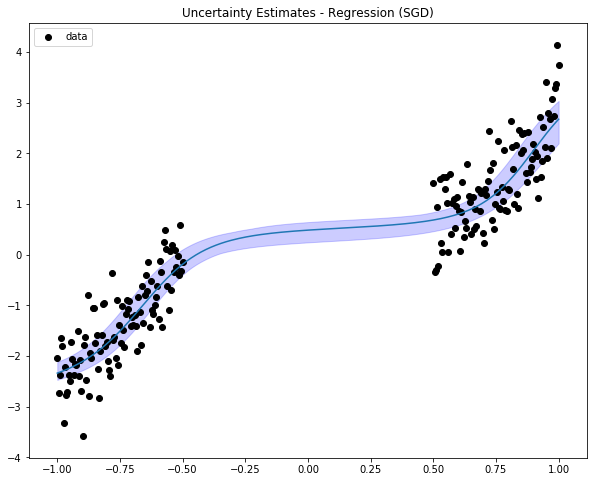

In [32]:
# plot the prediction and the uncertainty
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
ax.plot(X_test, mean_ci_sgd)
ax.fill_between(X_test, up_ci_sgd, lower_ci_sgd, color='blue', alpha=0.2)
ax.scatter(X, y, color='black', label='data')
ax.legend(prop={'size':10})
ax.set_title('Uncertainty Estimates - Regression (SGD)')

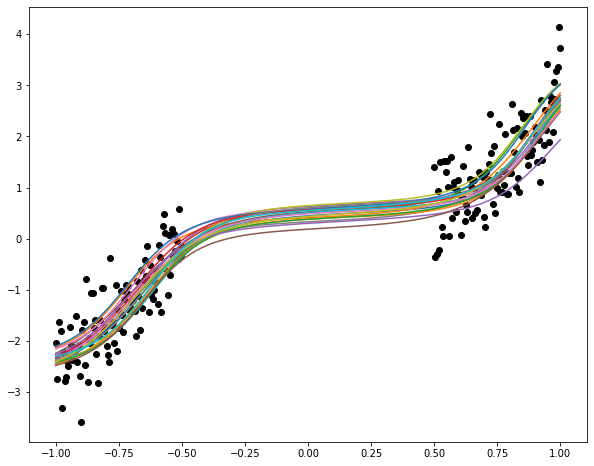

In [33]:
# plot the data and the prediction
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
ax.scatter(X, y, color='black', label='data')
for i in range(len(Y_pred_list)):
    ax.plot(X_test,Y_pred_list[i])

Text(0.5, 1.0, 'Regression (SWAG) MSE: 0.48')

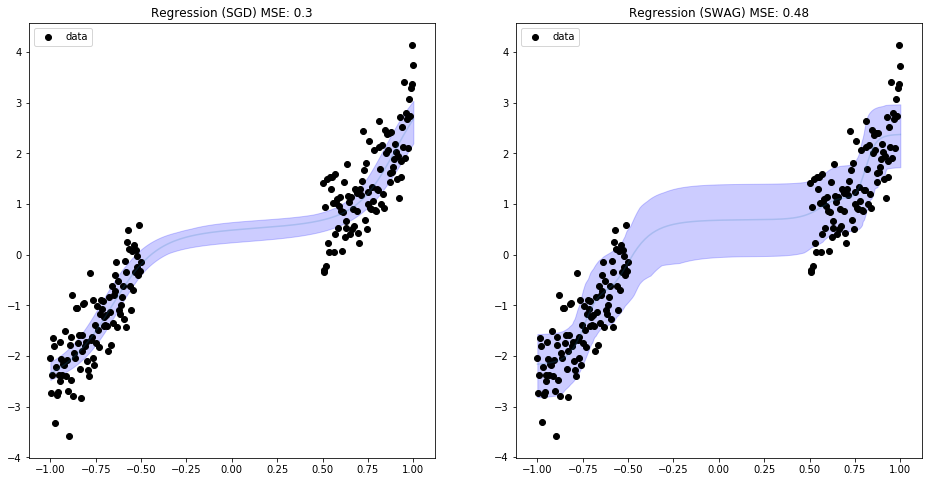

In [40]:
# comparison
fig, ax = plt.subplots(1, 2, figsize=(16, 8))
ax[0].plot(X_test, mean_ci_sgd, alpha=0.2)
ax[0].fill_between(X_test, up_ci_sgd, lower_ci_sgd, color='blue', alpha=0.2)
ax[0].scatter(X, y, color='black', label='data')
ax[0].legend(prop={'size':10})
ax[0].set_title('Regression (SGD) MSE: ' + str(np.round(sgd_mse,2)))
ax[1].plot(X_test, optimal_mean_ci, alpha=0.2)
ax[1].fill_between(X_test, optimal_up_ci, optimal_lower_ci, color='blue', alpha=0.2)
ax[1].scatter(X, y, color='black', label='data')
ax[1].legend(prop={'size':10})
ax[1].set_title('Regression (SWAG) MSE: ' + str(np.round(mse_optimal,2)))

**Observation:** From the above visualizations, we see that the optimal SWAG performs slightly better than the optimal sgd ensemble. Neither of the two models seem to capture a desirable amount of epistemic uncertainty in the middle. The traditional sgd ensemble has a constant uncertainty interval width, where as the optimal SWAG has slightly wider interval in the middle. The optimal SWAG however, captures the aleatoric uncertainty better than the optimal sgd ensemble. The sgd ensemble seems to be over-confident in its predictions, and thus its predictive interval does not cover many of the training points. In terms of the model fitting, the MSE scores are similar for both of the two models. Therefore, overall, the optimal SWAG outperforms the optimal sgd ensemble in terms of uncertainty estimation in this toy regression dataset.

## Conclusion


To conclude, after all these analysis, we had some interesting insights. The overall conclusion is that SWAG is only able to capture aleatoric uncertainty in the in-distribution region, but not the epistemic uncertainty for OOD region.

We listed the rest, detailed insights here:
- The uncertainty estimates of a SWAG model is very **sensitive to hyperparameter tuning** (e.g. the value of K and the learning rate). For this toy dataset, we found that as we increase the value of K and the learning rate, the total uncertainty goes up, leading to a more **appropriate aleatoric uncertainty** estimate. After doing grid search on hyperparameter tuning, we found that the optimal SWAG has **slighlty better epistemic uncertainty** estimates than randomly setting K or the learning rate. 
- The SWAG algorithm is also **sensitive to the weights intializations** in our experiment. In the OOD region, the model learns nothing to change the initialized weights. And therefore, with different weight initializations, SWAG will predict very different predictive distributions too.
- Compared to the optimal SGD ensemble, SWAG with the optimal hyperparameter setting performs slightly better in terms of **aleatoric and epistemic uncertainty estimates**. The uncertainty interval is slightly wider in the OOD region and it is not over-confident towards its training predictions. However, the epistemic uncertainty in the OOD region is still not as we desired.
- After ensembling the SWAG models, we finally achieved reasonable aleatoric uncertainty **AND** epistemic uncertainty estimates. Manually ensembling these SWAG models takes advantages from different weight initializations. However, this is not the performance of the **single SWAG algorithm itself**, and thus we considered this as an extension to the original SWAG algorithm.
    